In [4]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import pandas as pd
import h5py
import os
import shutil

#sys.path.append("../../W_KU/Fullerene/Thesis_Folding_Carbon/data/C60_closing/")
sys.path.append("../unfolding/")
sys.path.append("../src/electronic_structure/GAUSSIAN/")
#sys.path.append("../thesis-carbon-folding/functions")
#sys.path.append("../thesis-carbon-folding/Unfolding/Application_functions")
#sys.path.append("../results/hdf5/")
#sys.path.append("../fullerene-unfolding/")

from Application_functions import read_unfolding, fit_all_planes, read_geometry
from geometry_functions import detect_minimal_distance
from Unfolding import Unfolding
from functions_folding import *
from interpolation import interpolated_values

dual_unfolding, graph_unfolding, graph_unfolding_faces, vertices_final, bonds_toBe, lengths_toBe, angles_f, opt_geom, halogen_positions, neighbours, graph_faces = read_unfolding("../data/unfolding_graph/C60data.h5")

f = open("../data/header/header_cam-b3lyp_6-31star")
header_b3lyp = f.read()
f.close()


In [5]:
C60 = Unfolding(dual_unfolding, graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
#C60.vertex_coords = geometry
dual_unfolding

root_node = 0, root_face = [0, 1, 2, 3, 4, 5]
dual hinges:  [[0, 1], [0, 2], [0, 3], [1, 4], [1, 5], [2, 6], [2, 7], [3, 8], [3, 9], [4, 10], [6, 11], [8, 12], [10, 13], [11, 14], [12, 15]]
cubic hinges: [[0, 1], [2, 3], [4, 5], [6, 7], [7, 8], [9, 10], [10, 11], [12, 13], [13, 14], [16, 17], [23, 24], [30, 31], [38, 39], [42, 43], [46, 47]]



[[1, 2, 3],
 [0, 4, 5],
 [0, 6, 7],
 [0, 8, 9],
 [10, 5, 1],
 [4, 1],
 [11, 7, 2],
 [2, 6],
 [9, 3, 12],
 [3, 8],
 [13, 4],
 [14, 6],
 [15, 8],
 [10],
 [11],
 [12]]

In [6]:
C60.hinges

[[[0, 1],
  [0, 2],
  [0, 3],
  [1, 4],
  [1, 5],
  [2, 6],
  [2, 7],
  [3, 8],
  [3, 9],
  [4, 10],
  [6, 11],
  [8, 12],
  [10, 13],
  [11, 14],
  [12, 15]],
 [[0, 1],
  [2, 3],
  [4, 5],
  [6, 7],
  [7, 8],
  [9, 10],
  [10, 11],
  [12, 13],
  [13, 14],
  [16, 17],
  [23, 24],
  [30, 31],
  [38, 39],
  [42, 43],
  [46, 47]]]

In [7]:
final_midpoints = np.zeros([len(graph_unfolding_faces),3])
for faceId, face in enumerate(graph_unfolding_faces):
    final_midpoints[faceId] = np.sum(vertices_final[face],axis=-2)

hinge_midpoints = np.sum(vertices_final[[tuple(C60.hinges[1])]],axis=-2) / 2.
hinge_legs = final_midpoints[[tuple(C60.hinges[0])]] - np.repeat(hinge_midpoints[:,np.newaxis,:],2,axis=-2)
np.pi - angle_vec(hinge_legs[:,0,:],hinge_legs[:,1,:],degrees=False)

<ipython-input-7-e3c84e860eef>:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  hinge_midpoints = np.sum(vertices_final[[tuple(C60.hinges[1])]],axis=-2) / 2.
<ipython-input-7-e3c84e860eef>:6: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  hinge_legs = final_midpoints[[tuple(C60.hinges[0])]] - np.repeat(hinge_midpoints[:,np.newaxis,:],2,axis=-2)


array([2.5955979 , 2.4276571 , 2.50785662, 2.55271646, 2.3441409 ,
       2.11918261, 2.23697286, 2.01994506, 1.84588853, 2.02863597,
       1.79434646, 1.96318077, 2.06734565, 2.2298488 , 2.2382968 ])

<IPython.core.display.Javascript object>


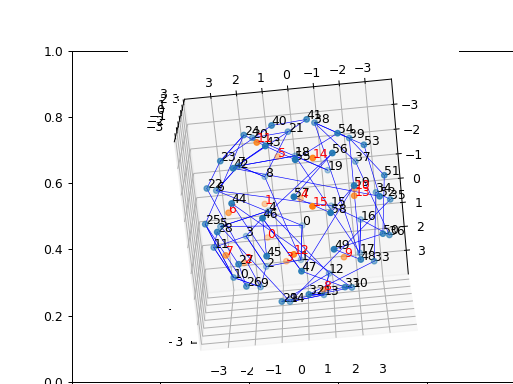

Drawing face 0 with vertices[0, 1, 2, 3, 4, 5]
Drawing face 1 with vertices[0, 6, 7, 8, 1]
Drawing face 2 with vertices[2, 9, 10, 11, 3]
Drawing face 3 with vertices[5, 4, 12, 13, 14]
Drawing face 4 with vertices[17, 18, 7, 6, 15, 16]
Drawing face 5 with vertices[18, 19, 20, 21, 8, 7]
Drawing face 6 with vertices[9, 22, 23, 24, 25, 10]
Drawing face 7 with vertices[10, 25, 26, 27, 28, 11]
Drawing face 8 with vertices[13, 12, 29, 30, 31, 32]
Drawing face 9 with vertices[34, 35, 14, 13, 32, 33]
Drawing face 10 with vertices[37, 38, 39, 17, 16, 36]
Drawing face 11 with vertices[40, 41, 42, 43, 24, 23]
Drawing face 12 with vertices[31, 30, 44, 45, 46, 47]
Drawing face 13 with vertices[38, 48, 49, 50, 51, 39]
Drawing face 14 with vertices[42, 52, 53, 54, 55, 43]
Drawing face 15 with vertices[58, 59, 47, 46, 56, 57]


<IPython.core.display.Javascript object>


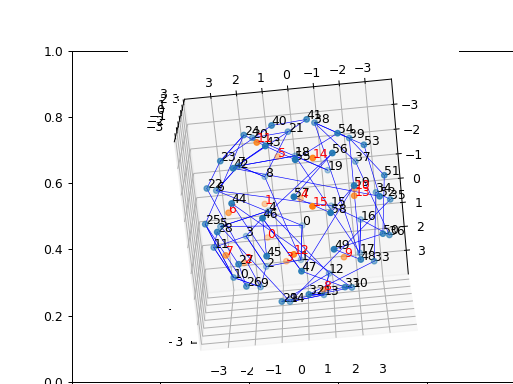

In [8]:
%matplotlib notebook
plot_unfolding(vertices_final, C60.faces, graph_unfolding_faces)

In [33]:
def graph_from_final_geometry(vertices_final):
    graph = np.zeros_like(vertices_final,dtype=int)
    distances = np.zeros([len(vertices_final),len(vertices_final)])
    distances[0,0] = 1e3
    for i in range(len(vertices_final)):
        for j in range(i):
            distances[i,j] = np.sqrt(np.sum((vertices_final[i] - vertices_final[j])**2))
            distances[j,i] = distances[i,j]
            distances[i,i] = 1e3
    for i in range(len(vertices_final)):
        graph[i] = np.argsort(distances[i])[:3]
    return graph

In [34]:
graph_test = graph_from_final_geometry(vertices_final)
for i in range(len(graph_test)):
    print(f'Test graph {graph_test[i]} and original graph {C60.graph[i]}')

Test graph [15  1  4] and original graph [6 1 5]
Test graph [12  2  0] and original graph [0 8 2]
Test graph [9 3 1] and original graph [1 9 3]
Test graph [5 2 4] and original graph [ 2 11  4]
Test graph [8 3 0] and original graph [ 3 12  5]
Test graph [ 3  6 11] and original graph [ 0  4 14]
Test graph [ 7  5 22] and original graph [15  7  0]
Test graph [ 6 20  8] and original graph [ 6 18  8]
Test graph [ 4 18  7] and original graph [ 7 21  1]
Test graph [ 2 14 10] and original graph [22 10  2]
Test graph [11 26  9] and original graph [ 9 25 11]
Test graph [10  5 25] and original graph [10 28  3]
Test graph [ 1 17 13] and original graph [ 4 29 13]
Test graph [14 30 12] and original graph [12 32 14]
Test graph [13  9 29] and original graph [ 5 13 35]
Test graph [ 0 16 19] and original graph [16  6 35]
Test graph [17 34 15] and original graph [17 15 36]
Test graph [16 33 12] and original graph [18 16 39]
Test graph [19  8 21] and original graph [17 19  7]
Test graph [18 37 15] and orig

In [84]:
from geometry_functions import mean_normal
X = vertices_final
closed_normals = np.zeros((len(graph_unfolding_faces),3),dtype=float)
closed_normals[C60.face_type[0]] = mean_normal(X, C60.pentagons)
closed_normals[C60.face_type[1]] = mean_normal(X, C60.hexagons)
angles_final = [angle_vec(closed_normals[u],closed_normals[v],degrees=False) for u,v in C60.hinges[0]]
np.pi - np.array(angles_final)

array([2.82324916, 2.60066408, 2.72332814, 2.5831659 , 2.26439429,
       0.85688439, 2.41168656, 1.81574428, 2.07556686, 1.21240265,
       1.66691542, 1.5519155 , 2.17150802, 2.40932837, 0.91323892])

In [76]:
C60.face_type

(array([1, 2, 3]), array([ 0,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]))

In [70]:
graph_unfolding_faces

[[0, 1, 2, 3, 4, 5],
 [0, 6, 7, 8, 1],
 [2, 9, 10, 11, 3],
 [5, 4, 12, 13, 14],
 [17, 18, 7, 6, 15, 16],
 [18, 19, 20, 21, 8, 7],
 [9, 22, 23, 24, 25, 10],
 [10, 25, 26, 27, 28, 11],
 [13, 12, 29, 30, 31, 32],
 [34, 35, 14, 13, 32, 33],
 [37, 38, 39, 17, 16, 36],
 [40, 41, 42, 43, 24, 23],
 [31, 30, 44, 45, 46, 47],
 [38, 48, 49, 50, 51, 39],
 [42, 52, 53, 54, 55, 43],
 [58, 59, 47, 46, 56, 57]]

In [46]:
C60.midpoints[[tuple(C60.hinges[0])]].shape

<ipython-input-46-749df4d016a1>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  C60.midpoints[[tuple(C60.hinges[0])]].shape


(15, 2, 3)

In [54]:
np.repeat(hinge_midpoints[:,np.newaxis,:],2,axis=-2)

array([[[ 2.019425  ,  0.0715652 ,  2.841455  ],
        [ 2.019425  ,  0.0715652 ,  2.841455  ]],

       [[ 2.01197   ,  1.85455   ,  2.16094   ],
        [ 2.01197   ,  1.85455   ,  2.16094   ]],

       [[ 0.7069215 ,  2.17136   ,  2.437205  ],
        [ 0.7069215 ,  2.17136   ,  2.437205  ]],

       [[-1.08908   ,  2.635465  ,  2.016405  ],
        [-1.08908   ,  2.635465  ,  2.016405  ]],

       [[-1.0716885 ,  1.71309   ,  2.841455  ],
        [-1.0716885 ,  1.71309   ,  2.841455  ]],

       [[ 2.669435  ,  2.236485  ,  0.1711785 ],
        [ 2.669435  ,  2.236485  ,  0.1711785 ]],

       [[ 1.73497   ,  3.031095  ,  0.        ],
        [ 1.73497   ,  3.031095  ,  0.        ]],

       [[ 3.27      , -0.772405  ,  0.9314195 ],
        [ 3.27      , -0.772405  ,  0.9314195 ]],

       [[ 3.49249   ,  0.0130205 ,  0.        ],
        [ 3.49249   ,  0.0130205 ,  0.        ]],

       [[ 1.75465   , -2.247885  ,  2.016405  ],
        [ 1.75465   , -2.247885  ,  2.016405  ]],



In [33]:
vertices_final[[tuple(C60.hinges[1])]]

<ipython-input-33-04a69b88ab4f>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  vertices_final[[tuple(C60.hinges[1])]]


array([[[ 1.43008  , -0.0113526,  3.26239  ],
        [ 2.60877  ,  0.154483 ,  2.42052  ]],

       [[ 2.60307  ,  1.51656  ,  1.90065  ],
        [ 1.42087  ,  2.19254  ,  2.42123  ]],

       [[ 0.695914 ,  1.24824  ,  3.26283  ],
        [ 0.717929 ,  3.09448  ,  1.61158  ]],

       [[-0.73999  ,  3.08891  ,  1.61229  ],
        [-1.43817  ,  2.18202  ,  2.42052  ]],

       [[-1.43817  ,  2.18202  ,  2.42052  ],
        [-0.705207 ,  1.24416  ,  3.26239  ]],

       [[ 3.03573  ,  1.76709  ,  0.59176  ],
        [ 2.30314  ,  2.70588  , -0.249403 ]],

       [[ 2.30314  ,  2.70588  , -0.249403 ],
        [ 1.1668   ,  3.35631  ,  0.249403 ]],

       [[ 3.04507  , -0.903607 ,  1.61229  ],
        [ 3.49493  , -0.641203 ,  0.250549 ]],

       [[ 3.49493  , -0.641203 ,  0.250549 ],
        [ 3.49005  ,  0.667244 , -0.250549 ]],

       [[ 1.18836  , -2.32678  ,  2.42123  ],
        [ 2.32094  , -2.16899  ,  1.61158  ]],

       [[-2.32288  ,  2.68885  , -0.250549 ],
        [-3.04

In [35]:
vertices_final

array([[ 1.43008  , -0.0113526,  3.26239  ],
       [ 2.60877  ,  0.154483 ,  2.42052  ],
       [ 2.60307  ,  1.51656  ,  1.90065  ],
       [ 1.42087  ,  2.19254  ,  2.42123  ],
       [ 0.695914 ,  1.24824  ,  3.26283  ],
       [ 0.717929 ,  3.09448  ,  1.61158  ],
       [-0.73999  ,  3.08891  ,  1.61229  ],
       [-1.43817  ,  2.18202  ,  2.42052  ],
       [-0.705207 ,  1.24416  ,  3.26239  ],
       [ 3.03573  ,  1.76709  ,  0.59176  ],
       [ 2.30314  ,  2.70588  , -0.249403 ],
       [ 1.1668   ,  3.35631  ,  0.249403 ],
       [ 3.04507  , -0.903607 ,  1.61229  ],
       [ 3.49493  , -0.641203 ,  0.250549 ],
       [ 3.49005  ,  0.667244 , -0.250549 ],
       [ 0.733047 , -1.2268   ,  3.26283  ],
       [ 1.18836  , -2.32678  ,  2.42123  ],
       [ 2.32094  , -2.16899  ,  1.61158  ],
       [-1.42896  , -0.0214387,  3.26283  ],
       [-0.72487  , -1.23281  ,  3.26239  ],
       [-2.61492  ,  1.49605  ,  1.90065  ],
       [-2.60923  ,  0.134237 ,  2.42123  ],
       [-1

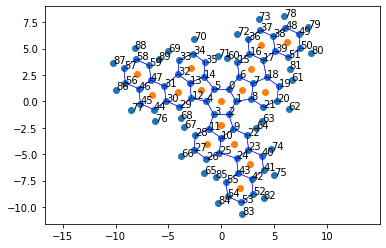

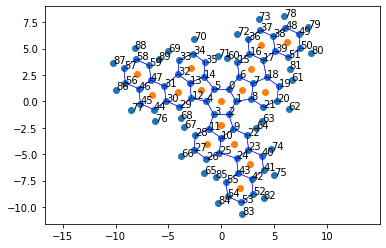

In [6]:
plot_graph(C60)

In [14]:
C60.graph.shape

(60, 3)

In [2]:
sys.path.append(os.path.realpath('..'))


In [3]:
###
### this line:  "for _ in range(unfolding.num_of_steps + 50)"
### will overstretch the hinges which is a weird thing to do so change that later!!!
###

In [4]:
def write_gaussfile(unfolding, header, double_hydrogens=np.array([],dtype=int), freeze=False, connectivity=False, writeFile=False, rotate=False, phis=[0.,0.], axes=None, atoms=None, filename="OutFile.com", freezelist=[], halogen=0, interpolated_angles = None, use_unfolding_periphery=False):
        name = re.split("_initialise",filename)[0]
        name = re.split("/", name)[-1]
        #title_init = filename + "-initialise"
        #name = re.split("/", title_init)[-1]
        text = "%chk=/tmp/Gau-" + name + ".chk\n" + "%rwf=/tmp/Gau-" + name + ".rwf\n"

        header= deepcopy(header)
        text += header
        
        # write the C coordinates
        for idC, i in enumerate(unfolding.vertex_coords[:unfolding.n_carbon]):
            text += " C "
            if freeze ==  True:
                if idC in freezelist:
                    text += "-1 "
            text += xyz_to_string(i)

        # give each C that only has two neighbours an H
        hydrogen_list = [None] * len(unfolding.graph_unfolding)
        num_of_hydrogen = 0

        ### if the periphery atoms are not placed afterwards use the positons from the unfolding data ###
        if use_unfolding_periphery == None:
            print("Periphery data from unfolding is used.")
            tmp = [" H "]
            tmp.append([" F "," Cl "][halogen])
            for i in range(len(unfolding.periphery_type)):
                text += tmp[unfolding.periphery_type[i]]
                text += xyz_to_string(unfolding.vertex_coords[unfolding.n_carbon + i])

        else:
            for i in range(len(unfolding.graph_unfolding)):
                if len(unfolding.graph_unfolding[i]) == 2:
                    ### if the periphery atoms position shuld not be generated from the graph but taken from the unfolding data###
                    if unfolding.n_carbon + num_of_hydrogen in use_unfolding_periphery:
                        tmp = [" H "]
                        tmp.append([" F "," Cl "][halogen])
                        text += tmp[unfolding.periphery_type[num_of_hydrogen]]
                        text += xyz_to_string(unfolding.vertex_coords[unfolding.n_carbon + num_of_hydrogen])
                        hydrogen_list[i] = len(unfolding.graph_unfolding) + 1 + num_of_hydrogen
                        num_of_hydrogen += 1

                    else:     
                        hydrogen_list[i] = len(unfolding.graph_unfolding) + 1 + num_of_hydrogen
                        num_of_hydrogen += 1
                        con_1 = unfolding.vertex_coords[unfolding.graph_unfolding[i][0]] - unfolding.vertex_coords[i]
                        con_2 = unfolding.vertex_coords[unfolding.graph_unfolding[i][1]] - unfolding.vertex_coords[i]
                        vec = (con_1 + con_2) / 2.0
                        #print(unfolding.graph_unfolding[i][0])

                        if (i in double_hydrogens):
                            hydrogen_list[i] = [hydrogen_list[i], hydrogen_list[i] + 1]
                            num_of_hydrogen += 1
                            vec = - vec / np.sqrt(np.sum(vec ** 2)) * 1.09
                            ax = unfolding.vertex_coords[unfolding.graph_unfolding[i][0]] - unfolding.vertex_coords[unfolding.graph_unfolding[i][1]]
                            mat_1 = rotation_matrix(ax,0.925)
                            vec_1 = np.dot(mat_1,vec.T).T
                            mat_2 = rotation_matrix(ax,-0.925)
                            vec_2 = np.dot(mat_2,vec.T).T
                            vec_1 = unfolding.vertex_coords[i] + vec_1
                            vec = unfolding.vertex_coords[i] + vec_2
                            text += " H "
                            #if freeze ==True:
                            #    text += "-1 "
                            text += xyz_to_string(vec_1)
                            #for j in vec_1:
                            #    text += " "
                            #    text += str(np.round(j,9))
                            #text += "\n"
                            text += " H "

                        elif (i in unfolding.halogen_parent_atom):
                            vec = - vec / np.sqrt(np.sum(vec ** 2)) * [1.35,1.76][halogen]
                            if rotate == True:
                                if i in atoms:
                                    if np.any(unfolding.bonds_toBe == i) == True:
                                        distance = np.linalg.norm(np.diff(unfolding.vertex_coords[unfolding.bonds_toBe[np.where(unfolding.bonds_toBe == i)[0]]],axis=1))
                                        tmp = interpolated_angles(distance, halogen)
                                        vec = vec / np.sqrt(np.sum(vec ** 2)) * tmp[1]
                                    #ax = unfolding.vertex_coords[axes[i][1]] - unfolding.vertex_coords[axes[i][0]]
                                    ax = unfolding.vertex_coords[neighbours_on_face(i,unfolding.graph_unfolding_faces)[0]] - unfolding.vertex_coords[neighbours_on_face(i,unfolding.graph_unfolding_faces)[1]]
                                    mat = rotation_matrix(ax, tmp[0])
                                    vec = np.dot(mat,vec.T).T
                            vec = unfolding.vertex_coords[i] + vec
                            text += [" F "," Cl "][halogen]

                        else:
                            vec = - vec / np.sqrt(np.sum(vec ** 2)) * 1.09
                            if rotate == True: 
                                if i in atoms:
                                    if np.any(unfolding.bonds_toBe == i) == True:
                                        distance = np.linalg.norm(np.diff(unfolding.vertex_coords[unfolding.bonds_toBe[np.where(unfolding.bonds_toBe == i)[0]]],axis=1))
                                        tmp = interpolated_angles(distance,halogen)
                                        vec =  vec / np.sqrt(np.sum(vec ** 2)) * tmp[3]
                                    #ax = unfolding.vertex_coords[axes[i][1]] - unfolding.vertex_coords[axes[i][0]]
                                    ax = unfolding.vertex_coords[neighbours_on_face(i,unfolding.graph_unfolding_faces)[0]] - unfolding.vertex_coords[neighbours_on_face(i,unfolding.graph_unfolding_faces)[1]]
                                    #print(i, neighbours_on_face(i,unfolding.graph_unfolding_faces), tmp[2])
                                    mat = rotation_matrix(ax, tmp[2])
                                    vec = np.dot(mat,vec.T).T
                            vec = unfolding.vertex_coords[i] + vec
                            text += " H "
                        #if freeze ==True:
                            #if i in freezelist:
                            #    text += "-1 "
                        text += xyz_to_string(vec)
                        #for j in vec:
                        #    text += " "
                        #    text += str(np.round(j,9))
                        #text += "\n"
        text += "\n"

        # and the connectivity table
        unique_graph = deepcopy(unfolding.graph_unfolding)
        if connectivity == True:
            for i in range(len(unique_graph)):
                text += " "
                text += str(i+1)
                if len(unique_graph[i]) > 0: 
                    for j in unique_graph[i]:
                        text += " "
                        text += str(j+1)
                        text += " 1.0"
                        unique_graph[j].remove(i)
                        if hydrogen_list[i] != None:
                            if type(hydrogen_list[i]) == list:
                                for hydrogen in hydrogen_list[i]:
                                    text += " "
                                    text += str(hydrogen)
                                    text += " 1.0"
                            else:
                                text += " "
                                text += str(hydrogen_list[i])
                                text += " 1.0"
                    text += "\n"
                else:
                    if hydrogen_list[i] != None:
                        if type(hydrogen_list[i]) == list:
                                for hydrogen in hydrogen_list[i]:
                                    text += " "
                                    text += str(hydrogen)
                                    text += " 1.0"
                                text += "\n"
                        else:
                            text += " "
                            text += str(hydrogen_list[i])
                            text += " 1.0"
                            text += "\n"
            else:
                text +="\n" 


            for i in range(len(hydrogen_list)):
                text += " "
                text +=  str(len(unfolding.graph_unfolding) + 1 + i)
                text += "\n"

        if writeFile == True:
            filename += ".com"
            with open(filename, 'w+') as outfile:
                outfile.write(text)
            outfile.close()
        else:
            return text

def write_gaussfile_restart(unfolding, header, double_hydrogens=np.array([],dtype=int), freeze=False, connectivity=False, writeFile=False, rotate=False, phis=[0.,0.], axes=None, atoms=None, filename="OutFile.com", freezelist=[], halogen=0, interpolated_angles = None, use_unfolding_periphery=False):
    header_restart =  restart_header(header)
    filename_init = filename + "_initialise"
    write_gaussfile(unfolding, header, double_hydrogens, freeze, connectivity, writeFile, rotate, phis, axes, atoms, filename_init, freezelist, halogen, interpolated_angles=interpolated_angles, use_unfolding_periphery=use_unfolding_periphery)
    write_gaussfile(unfolding, header_restart, double_hydrogens, freeze, connectivity, writeFile, rotate, phis, axes, atoms, filename, freezelist, halogen, interpolated_angles=interpolated_angles, use_unfolding_periphery=use_unfolding_periphery)

In [5]:
def remove_HCl_2(unfolding):
    ids = [60,71,68,67,63,64]
    ### Get positions of hydrogens ###
    vecs = unfolding.vertex_coords[[60,68,63]]
    ### Scale up amnd remove them ###
    Rs, Ds = split_norm(vecs)
    new_vecs = 200.*Ds
    new_vecs = np.repeat(new_vecs,2,axis=0)
    
    new_vecs[1::2] += Ds * 1.3
    unfolding.vertex_coords[ids] = new_vecs
    
    ### For the third closing also remove the other Cl and H
    #connecting_vec = unfolding.vertex_coords[60] - unfolding.vertex_coords[68]
    ### connect the orthogonal vector pointing upwards from the H and Cl molecules
    #perp = np.cross(connecting_vec, unfolding.vertex_coords[60] - unfolding.vertex_coords[63])
    #perp = perp / np.sum(perp**2) * 200.
    perp=np.array([0.,0.,-200.])
    
    ids2 = [74,62,66,76,70,72]
    unfolding.vertex_coords[ids2] = unfolding.vertex_coords[ids] + perp

In [6]:
def remove_HCl_1(unfolding):
    ids = [60,71,68,67,63,64]
    ### Get positions of hydrogens ###
    vecs = unfolding.vertex_coords[[60,68,63]]
    ### Scale up amnd remove them ###
    Rs, Ds = split_norm(vecs)
    new_vecs = 200.*Ds
    new_vecs = np.repeat(new_vecs,2,axis=0)
    
    new_vecs[1::2] += Ds * 1.3
    unfolding.vertex_coords[ids] = new_vecs

In [7]:
def load_h5(filename, remove_zeros=True):
    hf = h5py.File(filename, 'r')
    d_CC = np.array(hf.get("d_CC"))
    E_init = np.array(hf.get("E_init"))
    E_final = np.array(hf.get("E_final"))
    functional = np.array(hf.get("functional"))
    basis_set = np.array(hf.get("basis_set")) 
    geometries = np.array(hf.get("geometries"))
    hf.close()
    if remove_zeros:
        mask = np.where(E_final!=0.)
        print(mask)
        d_CC, E_init, E_final, geometries = d_CC[mask], E_init[mask], E_final[mask], geometries[mask]
    return d_CC, E_init, E_final, geometries

In [8]:
def three_dist_all(unfolding, a , b):
    dist_a, dist_b, dist_c = np.linalg.norm(C60.vertex_coords[a[0]] - C60.vertex_coords[b[0]]) , np.linalg.norm(C60.vertex_coords[a[1]] - C60.vertex_coords[b[1]]), np.linalg.norm(C60.vertex_coords[a[2]] - C60.vertex_coords[b[2]])  
    mean_dist = np.mean([dist_a,dist_b,dist_c])
    return np.round(mean_dist,3)

In [9]:
def three_dist_2(unfolding):
    dist_a, dist_b, dist_c = np.linalg.norm(C60.vertex_coords[19] - C60.vertex_coords[51]) , np.linalg.norm(C60.vertex_coords[26] - C60.vertex_coords[55]), np.linalg.norm(C60.vertex_coords[33] - C60.vertex_coords[59])  
    mean_dist = np.mean([dist_a,dist_b,dist_c])
    return np.round(mean_dist,3)

In [10]:
def three_dist_1(unfolding):
    dist_a, dist_b, dist_c = np.linalg.norm(C60.vertex_coords[36] - C60.vertex_coords[34]) , np.linalg.norm(C60.vertex_coords[27] - C60.vertex_coords[44]), np.linalg.norm(C60.vertex_coords[20] - C60.vertex_coords[40])  
    mean_dist = np.mean([dist_a,dist_b,dist_c])
    return np.round(mean_dist,3)

In [11]:
def sample_unfolding_2(unfolding, title_body="C60_B3LYP_bond_19_51",folder = "inputs/closing_flat/bond_19_51/", header=header_b3lyp , start=2.85, end=1.6, step = 0.05, epsilon=0.001):
    if os.path.exists("inputs/Distance_errors_bond_19_51.txt"):
        os.remove("inputs/Distance_errors_bond_19_51.txt") 
    error_file = open("inputs/Distance_errors_bond_19_51.txt", "w")
    
    subfolder = folder + "test/"
    if os.path.exists(folder):
        shutil.rmtree(folder)
        
    os.mkdir(folder)
    os.mkdir(subfolder)
    
    sample_r = np.flip(np.arange(end, start, step))
    ### Second bond ###
    freeze_list_1 = [20,27,34,36,40,44]
    ### Third bond ###
    #freeze_list_2 = [19,51,26,55,33,59]
    atoms = [35, 15, 21, 22, 28, 29, 51, 19, 55, 26, 59, 33, 34, 36, 20, 40, 27, 44]
    dist = three_dist_2(unfolding)
    unfolding.num_of_steps = 20000 
    
    unfolding.open_hinges = [[0,1,2]]
    for _ in range(20000):
        unfolding.close_unfolding()
    #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
    
    remove_HCl_2(unfolding)
    title = "inputs/closing_flat/bond_19_51/" + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
    title = "inputs/closing_flat/bond_19_51/test/" + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])

    
    unfolding.open_hinges = [[3, 4, 5, 6, 7, 8]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_2(unfolding)
        print(f"Hinge lvl 1 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = "inputs/closing_flat/bond_19_51/" + title_body + "_" + str(dist) +"A"
            remove_HCl_2(unfolding)
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            title = "inputs/closing_flat/bond_19_51/test/" + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    
    unfolding.open_hinges = [[9, 10, 11]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_2(unfolding)
        print(f"Hinge lvl 2 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = "inputs/closing_flat/bond_19_51/" + title_body + "_" + str(dist) +"A"
            remove_HCl_2(unfolding)
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            title = "inputs/closing_flat/bond_19_51/test/" + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    unfolding.open_hinges = [[12, 13, 14]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_2(unfolding)
        print(f"Hinge lvl 3 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = "inputs/closing_flat/bond_19_51/" + title_body + "_" + str(dist) +"A"
            remove_HCl_2(unfolding)
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            title = "inputs/closing_flat/bond_19_51/test/" + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
    if len(sample_r) != 0:
        print("Not all distances reached")
    error_file.close()

In [12]:
def sample_unfolding_3(unfolding, title_body="C60_B3LYP_bond_41_50_no_H", folder = "inputs/closing_flat/bond_41_50/", header=header_b3lyp , start=4., end=3., step = 0.05, epsilon=0.001):
    if os.path.exists("inputs/Distance_errors_bond_41_50.txt"):
        os.remove("inputs/Distance_errors_bond_41_50.txt") 
    error_file = open("inputs/Distance_errors_bond_41_50.txt", "w")
    
    subfolder = folder + "test/"
    if os.path.exists(folder):
        shutil.rmtree(folder)
        
    os.mkdir(folder)
    os.mkdir(subfolder)
    
    sample_r = np.flip(np.arange(end, start, step))
    ### Second bond ###
    freeze_list_1 = [54,41,58,45,50,37]
    ### Third bond ###
    #freeze_list_2 = [19,51,26,55,33,59]
    atoms = [35, 15, 21, 22, 28, 29, 51, 19, 55, 26, 59, 33, 34, 36, 20, 40, 27, 44]
    dist = three_dist_all(unfolding, [54,41,58],[45,50,37])
    unfolding.num_of_steps = 20000 
    
    unfolding.open_hinges = [[0,1,2]]
    for _ in range(20000):
        unfolding.close_unfolding()
    #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
    
    title = folder + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
    remove_stuff(title + ".com", 10)
    remove_stuff(title + "_initialise.com", 9)
    title = folder + "test/" + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
    remove_stuff(title + "_initialise.com", 9)
    remove_stuff(title + ".com", 10)
    
    unfolding.open_hinges = [[3, 4, 5, 6, 7, 8]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_all(unfolding, [54,41,58],[45,50,37,48])
        print(f"Hinge lvl 1 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + ".com", 10)
            remove_stuff(title + "_initialise.com", 9)
            title = folder + "test/"  + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + "_initialise.com", 9)
            remove_stuff(title + ".com", 10)
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    
    unfolding.open_hinges = [[9, 10, 11]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_all(unfolding, [54,41,58],[45,50,37,48])
        print(f"Hinge lvl 2 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + ".com", 10)
            remove_stuff(title + "_initialise.com", 9)
            title = folder + "test/"  + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + "_initialise.com", 9)
            remove_stuff(title + ".com", 10)
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    unfolding.open_hinges = [[12, 13, 14]]
    for step in range(unfolding.num_of_steps  + 1500):
        unfolding.close_unfolding()
        dist = three_dist_all(unfolding, [54,41,58],[45,50,37,48])
        print(f"Hinge lvl 3 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + ".com", 10)
            remove_stuff(title + "_initialise.com", 9)
            title = folder + "test/"  + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + "_initialise.com", 9)
            remove_stuff(title + ".com", 10)
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
    if len(sample_r) != 0:
        print("Not all distances reached")
    error_file.close()

In [13]:
def remove_stuff(infile, offsetline):
    f = open(infile,"rt")
    txt = f.read()
    f.close()
    mask = np.arange(60)
    #mask = np.concatenate([mask, np.array([73,78,79,80,75,82,83,84,77,86,87,88])])
    txtout = ""
    for lid, line in enumerate(txt.splitlines()):
        if lid < offsetline:
            txtout += line + "\n"
        if lid in mask + offsetline:
            txtout += line + "\n"
    txtout += "\n"
    fin = open(infile, "wt")
    #overrite the input file with the resulting data
    fin.write(txtout)
    #close the file
    fin.close()

In [14]:
def sample_unfolding_4(unfolding, title_body="C60_B3LYP_bond_48_57_no_H", folder = "inputs/closing_flat/bond_48_57/", header=header_b3lyp , start=2.85, end=1.6, step = 0.05, epsilon=0.001):
    if os.path.exists("inputs/Distance_errors_bond_48_57.txt"):
        os.remove("inputs/Distance_errors_bond_48_57.txt") 
    error_file = open("inputs/Distance_errors_bond_48_57.txt", "w")
    
    subfolder = folder + "test/"
    if os.path.exists(folder):
        shutil.rmtree(folder)
        
    os.mkdir(folder)
    os.mkdir(subfolder)
    
    sample_r = np.flip(np.arange(end, start, step))
    ### Second bond ###
    freeze_list_1 = [57,49,56,48,52,53]
    ### Third bond ###
    #freeze_list_2 = [19,51,26,55,33,59]
    atoms = [35, 15, 21, 22, 28, 29, 51, 19, 55, 26, 59, 33, 34, 36, 20, 40, 27, 44]
    dist = three_dist_all(unfolding, [57,49,56],[48,52,53])
    unfolding.num_of_steps = 20000 
    
    unfolding.open_hinges = [[0,1,2]]
    for _ in range(20000):
        unfolding.close_unfolding()
    #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
    
    title = folder + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
    remove_stuff(title + ".com", 10)
    remove_stuff(title + "_initialise.com", 9)
    title = folder + "test/" + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
    remove_stuff(title + "_initialise.com", 9)
    remove_stuff(title + ".com", 10)
    
    unfolding.open_hinges = [[3, 4, 5, 6, 7, 8]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_all(unfolding, [54,41,58],[45,50,37,48])
        print(f"Hinge lvl 1 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + ".com", 10)
            remove_stuff(title + "_initialise.com", 9)
            title = folder + "test/"  + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + "_initialise.com", 9)
            remove_stuff(title + ".com", 10)
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    
    unfolding.open_hinges = [[9, 10, 11]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_all(unfolding, [54,41,58],[45,50,37,48])
        print(f"Hinge lvl 2 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + ".com", 10)
            remove_stuff(title + "_initialise.com", 9)
            title = folder + "test/"  + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + "_initialise.com", 9)
            remove_stuff(title + ".com", 10)
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    unfolding.open_hinges = [[12, 13, 14]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_all(unfolding, [54,41,58],[45,50,37,48])
        print(f"Hinge lvl 3 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + ".com", 10)
            remove_stuff(title + "_initialise.com", 9)
            title = folder + "test/"  + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list_1, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64,74,62,66,76,70,72])
            remove_stuff(title + "_initialise.com", 9)
            remove_stuff(title + ".com", 10)
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
    if len(sample_r) != 0:
        print("Not all distances reached")
    error_file.close()

In [15]:
def sample_unfolding_1(unfolding, title_body="C60_B3LYP_bond_34_36",folder="inputs/closing_flat/bond_34_36/", header=header_b3lyp , start=4.0, end=3., step = 0.1, epsilon=0.001):
    if os.path.exists("inputs/Distance_errors_bond_34_36.txt"):
        os.remove("inputs/Distance_errors_bond_34_36.txt") 
    error_file = open("inputs/Distance_errors_bond_34_36.txt", "w")
    
    subfolder = folder + "test/"
    if os.path.exists(folder):
        shutil.rmtree(folder)
        
    os.mkdir(folder)
    os.mkdir(subfolder)
    
    sample_r = np.flip(np.arange(end, start, step))
    ### Second bond ###
    freeze_list = [20,27,34,36,40,44]
    atoms = [35, 15, 21, 22, 28, 29, 51, 19, 55, 26, 59, 33, 34, 36, 20, 40, 27, 44]
    dist = three_dist_1(unfolding)
    unfolding.num_of_steps = 20000
    
    unfolding.open_hinges = [[0,1,2]]
    for _ in range(unfolding.num_of_steps):
        unfolding.close_unfolding()
    #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
    
    remove_HCl_1(unfolding)
    title = folder + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
    title = folder + "test/" + title_body + "_" + str(dist) +"A"
    write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])

    
    unfolding.open_hinges = [[3, 4, 5, 6, 7, 8]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_1(unfolding)
        print(f"Hinge lvl 1 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            remove_HCl_1(unfolding)
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
            title = folder + "test/" + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    unfolding.open_hinges = [[9, 10, 11]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_1(unfolding)
        print(f"Hinge lvl 2 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            remove_HCl_1(unfolding)
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
            title = folder + "test/" + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
            
    unfolding.open_hinges = [[12, 13, 14]]
    for step in range(unfolding.num_of_steps + 1500):
        unfolding.close_unfolding()
        dist = three_dist_1(unfolding)
        print(f"Hinge lvl 3 step {step} distance: {dist}")
        if np.linalg.norm(dist - sample_r[0]) < epsilon:
            sample_r = np.delete(sample_r,0)
            #title = "../inputs/C60/hinge_0/Cl/" + title_body + "_" + str(dist) +"A"
            title = folder + title_body + "_" + str(dist) +"A"
            remove_HCl_1(unfolding)
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=True, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
            title = folder + "test/" + title_body + "_" + str(dist) +"A"
            write_gaussfile_restart(unfolding, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=True, atoms=atoms, filename = title , freezelist = freeze_list, halogen=1, interpolated_angles=interpolated_values,use_unfolding_periphery=[60,71,68,67,63,64])
            
            title += ".com"
            geo = read_geometry(title,mode="Input")
            txt = detect_minimal_distance(geo,0.5,title)
            error_file.write(txt)
            if len(sample_r) == 0:
                return
    error_file.close()

In [16]:
C60 = Unfolding(dual_unfolding, graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
#C60.vertex_coords = geometry
C60.num_of_steps = 10000
sample_unfolding_1(C60, start=3.,end=1.3, step = 0.05)
#sample_unfolding_1(C60, start=4.1,end=4.0, step = 0.05)

root_node = 0, root_face = [0, 1, 2, 3, 4, 5]
dual hinges:  [[0, 1], [0, 2], [0, 3], [1, 4], [1, 5], [2, 6], [2, 7], [3, 8], [3, 9], [4, 10], [6, 11], [8, 12], [10, 13], [11, 14], [12, 15]]
cubic hinges: [[0, 1], [2, 3], [4, 5], [6, 7], [7, 8], [9, 10], [10, 11], [12, 13], [13, 14], [16, 17], [23, 24], [30, 31], [38, 39], [42, 43], [46, 47]]

Drawing face 1: [0, 6, 7, 8, 1] connected by hinge 0: (0, 1)/(0, 1)
missing_atoms = [6 7 8]
Drawing face 2: [2, 9, 10, 11, 3] connected by hinge 1: (2, 3)/(0, 2)
missing_atoms = [ 9 10 11]
Drawing face 3: [5, 4, 12, 13, 14] connected by hinge 2: (4, 5)/(0, 3)
missing_atoms = [12 13 14]
Drawing face 4: [17, 18, 7, 6, 15, 16] connected by hinge 3: (6, 7)/(1, 4)
missing_atoms = [15 16 17 18]
Drawing face 5: [18, 19, 20, 21, 8, 7] connected by hinge 4: (7, 8)/(1, 5)
missing_atoms = [18 19 20 21]
Drawing face 6: [9, 22, 23, 24, 25, 10] connected by hinge 5: (9, 10)/(2, 6)
missing_atoms = [22 23 24 25]
Drawing face 7: [10, 25, 26, 27, 28, 11] connected 

Hinge lvl 1 step 200 distance: 4.112
Hinge lvl 1 step 201 distance: 4.112
Hinge lvl 1 step 202 distance: 4.112
Hinge lvl 1 step 203 distance: 4.111
Hinge lvl 1 step 204 distance: 4.111
Hinge lvl 1 step 205 distance: 4.111
Hinge lvl 1 step 206 distance: 4.111
Hinge lvl 1 step 207 distance: 4.111
Hinge lvl 1 step 208 distance: 4.111
Hinge lvl 1 step 209 distance: 4.111
Hinge lvl 1 step 210 distance: 4.111
Hinge lvl 1 step 211 distance: 4.111
Hinge lvl 1 step 212 distance: 4.111
Hinge lvl 1 step 213 distance: 4.11
Hinge lvl 1 step 214 distance: 4.11
Hinge lvl 1 step 215 distance: 4.11
Hinge lvl 1 step 216 distance: 4.11
Hinge lvl 1 step 217 distance: 4.11
Hinge lvl 1 step 218 distance: 4.11
Hinge lvl 1 step 219 distance: 4.11
Hinge lvl 1 step 220 distance: 4.11
Hinge lvl 1 step 221 distance: 4.11
Hinge lvl 1 step 222 distance: 4.11
Hinge lvl 1 step 223 distance: 4.109
Hinge lvl 1 step 224 distance: 4.109
Hinge lvl 1 step 225 distance: 4.109
Hinge lvl 1 step 226 distance: 4.109
Hinge lvl 1

Hinge lvl 1 step 430 distance: 4.089
Hinge lvl 1 step 431 distance: 4.089
Hinge lvl 1 step 432 distance: 4.089
Hinge lvl 1 step 433 distance: 4.088
Hinge lvl 1 step 434 distance: 4.088
Hinge lvl 1 step 435 distance: 4.088
Hinge lvl 1 step 436 distance: 4.088
Hinge lvl 1 step 437 distance: 4.088
Hinge lvl 1 step 438 distance: 4.088
Hinge lvl 1 step 439 distance: 4.088
Hinge lvl 1 step 440 distance: 4.088
Hinge lvl 1 step 441 distance: 4.088
Hinge lvl 1 step 442 distance: 4.088
Hinge lvl 1 step 443 distance: 4.087
Hinge lvl 1 step 444 distance: 4.087
Hinge lvl 1 step 445 distance: 4.087
Hinge lvl 1 step 446 distance: 4.087
Hinge lvl 1 step 447 distance: 4.087
Hinge lvl 1 step 448 distance: 4.087
Hinge lvl 1 step 449 distance: 4.087
Hinge lvl 1 step 450 distance: 4.087
Hinge lvl 1 step 451 distance: 4.087
Hinge lvl 1 step 452 distance: 4.087
Hinge lvl 1 step 453 distance: 4.086
Hinge lvl 1 step 454 distance: 4.086
Hinge lvl 1 step 455 distance: 4.086
Hinge lvl 1 step 456 distance: 4.086
H

Hinge lvl 1 step 657 distance: 4.066
Hinge lvl 1 step 658 distance: 4.066
Hinge lvl 1 step 659 distance: 4.066
Hinge lvl 1 step 660 distance: 4.066
Hinge lvl 1 step 661 distance: 4.066
Hinge lvl 1 step 662 distance: 4.065
Hinge lvl 1 step 663 distance: 4.065
Hinge lvl 1 step 664 distance: 4.065
Hinge lvl 1 step 665 distance: 4.065
Hinge lvl 1 step 666 distance: 4.065
Hinge lvl 1 step 667 distance: 4.065
Hinge lvl 1 step 668 distance: 4.065
Hinge lvl 1 step 669 distance: 4.065
Hinge lvl 1 step 670 distance: 4.065
Hinge lvl 1 step 671 distance: 4.065
Hinge lvl 1 step 672 distance: 4.064
Hinge lvl 1 step 673 distance: 4.064
Hinge lvl 1 step 674 distance: 4.064
Hinge lvl 1 step 675 distance: 4.064
Hinge lvl 1 step 676 distance: 4.064
Hinge lvl 1 step 677 distance: 4.064
Hinge lvl 1 step 678 distance: 4.064
Hinge lvl 1 step 679 distance: 4.064
Hinge lvl 1 step 680 distance: 4.064
Hinge lvl 1 step 681 distance: 4.064
Hinge lvl 1 step 682 distance: 4.063
Hinge lvl 1 step 683 distance: 4.063
H

Hinge lvl 1 step 891 distance: 4.042
Hinge lvl 1 step 892 distance: 4.042
Hinge lvl 1 step 893 distance: 4.042
Hinge lvl 1 step 894 distance: 4.042
Hinge lvl 1 step 895 distance: 4.042
Hinge lvl 1 step 896 distance: 4.042
Hinge lvl 1 step 897 distance: 4.042
Hinge lvl 1 step 898 distance: 4.042
Hinge lvl 1 step 899 distance: 4.042
Hinge lvl 1 step 900 distance: 4.041
Hinge lvl 1 step 901 distance: 4.041
Hinge lvl 1 step 902 distance: 4.041
Hinge lvl 1 step 903 distance: 4.041
Hinge lvl 1 step 904 distance: 4.041
Hinge lvl 1 step 905 distance: 4.041
Hinge lvl 1 step 906 distance: 4.041
Hinge lvl 1 step 907 distance: 4.041
Hinge lvl 1 step 908 distance: 4.041
Hinge lvl 1 step 909 distance: 4.041
Hinge lvl 1 step 910 distance: 4.04
Hinge lvl 1 step 911 distance: 4.04
Hinge lvl 1 step 912 distance: 4.04
Hinge lvl 1 step 913 distance: 4.04
Hinge lvl 1 step 914 distance: 4.04
Hinge lvl 1 step 915 distance: 4.04
Hinge lvl 1 step 916 distance: 4.04
Hinge lvl 1 step 917 distance: 4.04
Hinge lvl

Hinge lvl 1 step 1139 distance: 4.017
Hinge lvl 1 step 1140 distance: 4.017
Hinge lvl 1 step 1141 distance: 4.017
Hinge lvl 1 step 1142 distance: 4.017
Hinge lvl 1 step 1143 distance: 4.017
Hinge lvl 1 step 1144 distance: 4.017
Hinge lvl 1 step 1145 distance: 4.017
Hinge lvl 1 step 1146 distance: 4.017
Hinge lvl 1 step 1147 distance: 4.016
Hinge lvl 1 step 1148 distance: 4.016
Hinge lvl 1 step 1149 distance: 4.016
Hinge lvl 1 step 1150 distance: 4.016
Hinge lvl 1 step 1151 distance: 4.016
Hinge lvl 1 step 1152 distance: 4.016
Hinge lvl 1 step 1153 distance: 4.016
Hinge lvl 1 step 1154 distance: 4.016
Hinge lvl 1 step 1155 distance: 4.016
Hinge lvl 1 step 1156 distance: 4.016
Hinge lvl 1 step 1157 distance: 4.015
Hinge lvl 1 step 1158 distance: 4.015
Hinge lvl 1 step 1159 distance: 4.015
Hinge lvl 1 step 1160 distance: 4.015
Hinge lvl 1 step 1161 distance: 4.015
Hinge lvl 1 step 1162 distance: 4.015
Hinge lvl 1 step 1163 distance: 4.015
Hinge lvl 1 step 1164 distance: 4.015
Hinge lvl 1 

Hinge lvl 1 step 1356 distance: 3.995
Hinge lvl 1 step 1357 distance: 3.995
Hinge lvl 1 step 1358 distance: 3.995
Hinge lvl 1 step 1359 distance: 3.995
Hinge lvl 1 step 1360 distance: 3.995
Hinge lvl 1 step 1361 distance: 3.995
Hinge lvl 1 step 1362 distance: 3.995
Hinge lvl 1 step 1363 distance: 3.995
Hinge lvl 1 step 1364 distance: 3.994
Hinge lvl 1 step 1365 distance: 3.994
Hinge lvl 1 step 1366 distance: 3.994
Hinge lvl 1 step 1367 distance: 3.994
Hinge lvl 1 step 1368 distance: 3.994
Hinge lvl 1 step 1369 distance: 3.994
Hinge lvl 1 step 1370 distance: 3.994
Hinge lvl 1 step 1371 distance: 3.994
Hinge lvl 1 step 1372 distance: 3.994
Hinge lvl 1 step 1373 distance: 3.994
Hinge lvl 1 step 1374 distance: 3.993
Hinge lvl 1 step 1375 distance: 3.993
Hinge lvl 1 step 1376 distance: 3.993
Hinge lvl 1 step 1377 distance: 3.993
Hinge lvl 1 step 1378 distance: 3.993
Hinge lvl 1 step 1379 distance: 3.993
Hinge lvl 1 step 1380 distance: 3.993
Hinge lvl 1 step 1381 distance: 3.993
Hinge lvl 1 

Hinge lvl 1 step 1598 distance: 3.971
Hinge lvl 1 step 1599 distance: 3.971
Hinge lvl 1 step 1600 distance: 3.97
Hinge lvl 1 step 1601 distance: 3.97
Hinge lvl 1 step 1602 distance: 3.97
Hinge lvl 1 step 1603 distance: 3.97
Hinge lvl 1 step 1604 distance: 3.97
Hinge lvl 1 step 1605 distance: 3.97
Hinge lvl 1 step 1606 distance: 3.97
Hinge lvl 1 step 1607 distance: 3.97
Hinge lvl 1 step 1608 distance: 3.97
Hinge lvl 1 step 1609 distance: 3.97
Hinge lvl 1 step 1610 distance: 3.969
Hinge lvl 1 step 1611 distance: 3.969
Hinge lvl 1 step 1612 distance: 3.969
Hinge lvl 1 step 1613 distance: 3.969
Hinge lvl 1 step 1614 distance: 3.969
Hinge lvl 1 step 1615 distance: 3.969
Hinge lvl 1 step 1616 distance: 3.969
Hinge lvl 1 step 1617 distance: 3.969
Hinge lvl 1 step 1618 distance: 3.969
Hinge lvl 1 step 1619 distance: 3.968
Hinge lvl 1 step 1620 distance: 3.968
Hinge lvl 1 step 1621 distance: 3.968
Hinge lvl 1 step 1622 distance: 3.968
Hinge lvl 1 step 1623 distance: 3.968
Hinge lvl 1 step 1624 

Hinge lvl 1 step 1846 distance: 3.945
Hinge lvl 1 step 1847 distance: 3.945
Hinge lvl 1 step 1848 distance: 3.945
Hinge lvl 1 step 1849 distance: 3.945
Hinge lvl 1 step 1850 distance: 3.945
Hinge lvl 1 step 1851 distance: 3.945
Hinge lvl 1 step 1852 distance: 3.945
Hinge lvl 1 step 1853 distance: 3.945
Hinge lvl 1 step 1854 distance: 3.944
Hinge lvl 1 step 1855 distance: 3.944
Hinge lvl 1 step 1856 distance: 3.944
Hinge lvl 1 step 1857 distance: 3.944
Hinge lvl 1 step 1858 distance: 3.944
Hinge lvl 1 step 1859 distance: 3.944
Hinge lvl 1 step 1860 distance: 3.944
Hinge lvl 1 step 1861 distance: 3.944
Hinge lvl 1 step 1862 distance: 3.944
Hinge lvl 1 step 1863 distance: 3.944
Hinge lvl 1 step 1864 distance: 3.943
Hinge lvl 1 step 1865 distance: 3.943
Hinge lvl 1 step 1866 distance: 3.943
Hinge lvl 1 step 1867 distance: 3.943
Hinge lvl 1 step 1868 distance: 3.943
Hinge lvl 1 step 1869 distance: 3.943
Hinge lvl 1 step 1870 distance: 3.943
Hinge lvl 1 step 1871 distance: 3.943
Hinge lvl 1 

Hinge lvl 1 step 2069 distance: 3.922
Hinge lvl 1 step 2070 distance: 3.922
Hinge lvl 1 step 2071 distance: 3.922
Hinge lvl 1 step 2072 distance: 3.922
Hinge lvl 1 step 2073 distance: 3.922
Hinge lvl 1 step 2074 distance: 3.922
Hinge lvl 1 step 2075 distance: 3.922
Hinge lvl 1 step 2076 distance: 3.922
Hinge lvl 1 step 2077 distance: 3.922
Hinge lvl 1 step 2078 distance: 3.922
Hinge lvl 1 step 2079 distance: 3.921
Hinge lvl 1 step 2080 distance: 3.921
Hinge lvl 1 step 2081 distance: 3.921
Hinge lvl 1 step 2082 distance: 3.921
Hinge lvl 1 step 2083 distance: 3.921
Hinge lvl 1 step 2084 distance: 3.921
Hinge lvl 1 step 2085 distance: 3.921
Hinge lvl 1 step 2086 distance: 3.921
Hinge lvl 1 step 2087 distance: 3.921
Hinge lvl 1 step 2088 distance: 3.921
Hinge lvl 1 step 2089 distance: 3.92
Hinge lvl 1 step 2090 distance: 3.92
Hinge lvl 1 step 2091 distance: 3.92
Hinge lvl 1 step 2092 distance: 3.92
Hinge lvl 1 step 2093 distance: 3.92
Hinge lvl 1 step 2094 distance: 3.92
Hinge lvl 1 step 2

Hinge lvl 1 step 2296 distance: 3.899
Hinge lvl 1 step 2297 distance: 3.899
Hinge lvl 1 step 2298 distance: 3.899
Hinge lvl 1 step 2299 distance: 3.899
Hinge lvl 1 step 2300 distance: 3.899
Hinge lvl 1 step 2301 distance: 3.899
Hinge lvl 1 step 2302 distance: 3.899
Hinge lvl 1 step 2303 distance: 3.898
Hinge lvl 1 step 2304 distance: 3.898
Hinge lvl 1 step 2305 distance: 3.898
Hinge lvl 1 step 2306 distance: 3.898
Hinge lvl 1 step 2307 distance: 3.898
Hinge lvl 1 step 2308 distance: 3.898
Hinge lvl 1 step 2309 distance: 3.898
Hinge lvl 1 step 2310 distance: 3.898
Hinge lvl 1 step 2311 distance: 3.898
Hinge lvl 1 step 2312 distance: 3.898
Hinge lvl 1 step 2313 distance: 3.897
Hinge lvl 1 step 2314 distance: 3.897
Hinge lvl 1 step 2315 distance: 3.897
Hinge lvl 1 step 2316 distance: 3.897
Hinge lvl 1 step 2317 distance: 3.897
Hinge lvl 1 step 2318 distance: 3.897
Hinge lvl 1 step 2319 distance: 3.897
Hinge lvl 1 step 2320 distance: 3.897
Hinge lvl 1 step 2321 distance: 3.897
Hinge lvl 1 

Hinge lvl 1 step 2539 distance: 3.874
Hinge lvl 1 step 2540 distance: 3.874
Hinge lvl 1 step 2541 distance: 3.874
Hinge lvl 1 step 2542 distance: 3.874
Hinge lvl 1 step 2543 distance: 3.874
Hinge lvl 1 step 2544 distance: 3.874
Hinge lvl 1 step 2545 distance: 3.874
Hinge lvl 1 step 2546 distance: 3.873
Hinge lvl 1 step 2547 distance: 3.873
Hinge lvl 1 step 2548 distance: 3.873
Hinge lvl 1 step 2549 distance: 3.873
Hinge lvl 1 step 2550 distance: 3.873
Hinge lvl 1 step 2551 distance: 3.873
Hinge lvl 1 step 2552 distance: 3.873
Hinge lvl 1 step 2553 distance: 3.873
Hinge lvl 1 step 2554 distance: 3.873
Hinge lvl 1 step 2555 distance: 3.873
Hinge lvl 1 step 2556 distance: 3.872
Hinge lvl 1 step 2557 distance: 3.872
Hinge lvl 1 step 2558 distance: 3.872
Hinge lvl 1 step 2559 distance: 3.872
Hinge lvl 1 step 2560 distance: 3.872
Hinge lvl 1 step 2561 distance: 3.872
Hinge lvl 1 step 2562 distance: 3.872
Hinge lvl 1 step 2563 distance: 3.872
Hinge lvl 1 step 2564 distance: 3.872
Hinge lvl 1 

Hinge lvl 1 step 2757 distance: 3.852
Hinge lvl 1 step 2758 distance: 3.852
Hinge lvl 1 step 2759 distance: 3.851
Hinge lvl 1 step 2760 distance: 3.851
Hinge lvl 1 step 2761 distance: 3.851
Hinge lvl 1 step 2762 distance: 3.851
Hinge lvl 1 step 2763 distance: 3.851
Hinge lvl 1 step 2764 distance: 3.851
Hinge lvl 1 step 2765 distance: 3.851
Hinge lvl 1 step 2766 distance: 3.851
Hinge lvl 1 step 2767 distance: 3.851
Hinge lvl 1 step 2768 distance: 3.851
Hinge lvl 1 step 2769 distance: 3.85
Hinge lvl 1 step 2770 distance: 3.85
Hinge lvl 1 step 2771 distance: 3.85
Hinge lvl 1 step 2772 distance: 3.85
Hinge lvl 1 step 2773 distance: 3.85
Hinge lvl 1 step 2774 distance: 3.85
Hinge lvl 1 step 2775 distance: 3.85
Hinge lvl 1 step 2776 distance: 3.85
Hinge lvl 1 step 2777 distance: 3.85
Hinge lvl 1 step 2778 distance: 3.85
Hinge lvl 1 step 2779 distance: 3.849
Hinge lvl 1 step 2780 distance: 3.849
Hinge lvl 1 step 2781 distance: 3.849
Hinge lvl 1 step 2782 distance: 3.849
Hinge lvl 1 step 2783 

Hinge lvl 1 step 2977 distance: 3.829
Hinge lvl 1 step 2978 distance: 3.829
Hinge lvl 1 step 2979 distance: 3.829
Hinge lvl 1 step 2980 distance: 3.829
Hinge lvl 1 step 2981 distance: 3.829
Hinge lvl 1 step 2982 distance: 3.828
Hinge lvl 1 step 2983 distance: 3.828
Hinge lvl 1 step 2984 distance: 3.828
Hinge lvl 1 step 2985 distance: 3.828
Hinge lvl 1 step 2986 distance: 3.828
Hinge lvl 1 step 2987 distance: 3.828
Hinge lvl 1 step 2988 distance: 3.828
Hinge lvl 1 step 2989 distance: 3.828
Hinge lvl 1 step 2990 distance: 3.828
Hinge lvl 1 step 2991 distance: 3.827
Hinge lvl 1 step 2992 distance: 3.827
Hinge lvl 1 step 2993 distance: 3.827
Hinge lvl 1 step 2994 distance: 3.827
Hinge lvl 1 step 2995 distance: 3.827
Hinge lvl 1 step 2996 distance: 3.827
Hinge lvl 1 step 2997 distance: 3.827
Hinge lvl 1 step 2998 distance: 3.827
Hinge lvl 1 step 2999 distance: 3.827
Hinge lvl 1 step 3000 distance: 3.827
Hinge lvl 1 step 3001 distance: 3.826
Hinge lvl 1 step 3002 distance: 3.826
Hinge lvl 1 

Hinge lvl 1 step 3210 distance: 3.805
Hinge lvl 1 step 3211 distance: 3.805
Hinge lvl 1 step 3212 distance: 3.805
Hinge lvl 1 step 3213 distance: 3.804
Hinge lvl 1 step 3214 distance: 3.804
Hinge lvl 1 step 3215 distance: 3.804
Hinge lvl 1 step 3216 distance: 3.804
Hinge lvl 1 step 3217 distance: 3.804
Hinge lvl 1 step 3218 distance: 3.804
Hinge lvl 1 step 3219 distance: 3.804
Hinge lvl 1 step 3220 distance: 3.804
Hinge lvl 1 step 3221 distance: 3.804
Hinge lvl 1 step 3222 distance: 3.804
Hinge lvl 1 step 3223 distance: 3.803
Hinge lvl 1 step 3224 distance: 3.803
Hinge lvl 1 step 3225 distance: 3.803
Hinge lvl 1 step 3226 distance: 3.803
Hinge lvl 1 step 3227 distance: 3.803
Hinge lvl 1 step 3228 distance: 3.803
Hinge lvl 1 step 3229 distance: 3.803
Hinge lvl 1 step 3230 distance: 3.803
Hinge lvl 1 step 3231 distance: 3.803
Hinge lvl 1 step 3232 distance: 3.802
Hinge lvl 1 step 3233 distance: 3.802
Hinge lvl 1 step 3234 distance: 3.802
Hinge lvl 1 step 3235 distance: 3.802
Hinge lvl 1 

Hinge lvl 1 step 3436 distance: 3.781
Hinge lvl 1 step 3437 distance: 3.781
Hinge lvl 1 step 3438 distance: 3.781
Hinge lvl 1 step 3439 distance: 3.781
Hinge lvl 1 step 3440 distance: 3.781
Hinge lvl 1 step 3441 distance: 3.781
Hinge lvl 1 step 3442 distance: 3.781
Hinge lvl 1 step 3443 distance: 3.781
Hinge lvl 1 step 3444 distance: 3.78
Hinge lvl 1 step 3445 distance: 3.78
Hinge lvl 1 step 3446 distance: 3.78
Hinge lvl 1 step 3447 distance: 3.78
Hinge lvl 1 step 3448 distance: 3.78
Hinge lvl 1 step 3449 distance: 3.78
Hinge lvl 1 step 3450 distance: 3.78
Hinge lvl 1 step 3451 distance: 3.78
Hinge lvl 1 step 3452 distance: 3.78
Hinge lvl 1 step 3453 distance: 3.779
Hinge lvl 1 step 3454 distance: 3.779
Hinge lvl 1 step 3455 distance: 3.779
Hinge lvl 1 step 3456 distance: 3.779
Hinge lvl 1 step 3457 distance: 3.779
Hinge lvl 1 step 3458 distance: 3.779
Hinge lvl 1 step 3459 distance: 3.779
Hinge lvl 1 step 3460 distance: 3.779
Hinge lvl 1 step 3461 distance: 3.779
Hinge lvl 1 step 3462

Hinge lvl 1 step 3658 distance: 3.758
Hinge lvl 1 step 3659 distance: 3.758
Hinge lvl 1 step 3660 distance: 3.758
Hinge lvl 1 step 3661 distance: 3.758
Hinge lvl 1 step 3662 distance: 3.758
Hinge lvl 1 step 3663 distance: 3.758
Hinge lvl 1 step 3664 distance: 3.757
Hinge lvl 1 step 3665 distance: 3.757
Hinge lvl 1 step 3666 distance: 3.757
Hinge lvl 1 step 3667 distance: 3.757
Hinge lvl 1 step 3668 distance: 3.757
Hinge lvl 1 step 3669 distance: 3.757
Hinge lvl 1 step 3670 distance: 3.757
Hinge lvl 1 step 3671 distance: 3.757
Hinge lvl 1 step 3672 distance: 3.757
Hinge lvl 1 step 3673 distance: 3.757
Hinge lvl 1 step 3674 distance: 3.756
Hinge lvl 1 step 3675 distance: 3.756
Hinge lvl 1 step 3676 distance: 3.756
Hinge lvl 1 step 3677 distance: 3.756
Hinge lvl 1 step 3678 distance: 3.756
Hinge lvl 1 step 3679 distance: 3.756
Hinge lvl 1 step 3680 distance: 3.756
Hinge lvl 1 step 3681 distance: 3.756
Hinge lvl 1 step 3682 distance: 3.756
Hinge lvl 1 step 3683 distance: 3.756
Hinge lvl 1 

Hinge lvl 1 step 3885 distance: 3.734
Hinge lvl 1 step 3886 distance: 3.734
Hinge lvl 1 step 3887 distance: 3.734
Hinge lvl 1 step 3888 distance: 3.734
Hinge lvl 1 step 3889 distance: 3.734
Hinge lvl 1 step 3890 distance: 3.734
Hinge lvl 1 step 3891 distance: 3.734
Hinge lvl 1 step 3892 distance: 3.734
Hinge lvl 1 step 3893 distance: 3.734
Hinge lvl 1 step 3894 distance: 3.733
Hinge lvl 1 step 3895 distance: 3.733
Hinge lvl 1 step 3896 distance: 3.733
Hinge lvl 1 step 3897 distance: 3.733
Hinge lvl 1 step 3898 distance: 3.733
Hinge lvl 1 step 3899 distance: 3.733
Hinge lvl 1 step 3900 distance: 3.733
Hinge lvl 1 step 3901 distance: 3.733
Hinge lvl 1 step 3902 distance: 3.733
Hinge lvl 1 step 3903 distance: 3.733
Hinge lvl 1 step 3904 distance: 3.732
Hinge lvl 1 step 3905 distance: 3.732
Hinge lvl 1 step 3906 distance: 3.732
Hinge lvl 1 step 3907 distance: 3.732
Hinge lvl 1 step 3908 distance: 3.732
Hinge lvl 1 step 3909 distance: 3.732
Hinge lvl 1 step 3910 distance: 3.732
Hinge lvl 1 

Hinge lvl 1 step 4107 distance: 3.711
Hinge lvl 1 step 4108 distance: 3.711
Hinge lvl 1 step 4109 distance: 3.711
Hinge lvl 1 step 4110 distance: 3.711
Hinge lvl 1 step 4111 distance: 3.711
Hinge lvl 1 step 4112 distance: 3.711
Hinge lvl 1 step 4113 distance: 3.711
Hinge lvl 1 step 4114 distance: 3.71
Hinge lvl 1 step 4115 distance: 3.71
Hinge lvl 1 step 4116 distance: 3.71
Hinge lvl 1 step 4117 distance: 3.71
Hinge lvl 1 step 4118 distance: 3.71
Hinge lvl 1 step 4119 distance: 3.71
Hinge lvl 1 step 4120 distance: 3.71
Hinge lvl 1 step 4121 distance: 3.71
Hinge lvl 1 step 4122 distance: 3.71
Hinge lvl 1 step 4123 distance: 3.71
Hinge lvl 1 step 4124 distance: 3.709
Hinge lvl 1 step 4125 distance: 3.709
Hinge lvl 1 step 4126 distance: 3.709
Hinge lvl 1 step 4127 distance: 3.709
Hinge lvl 1 step 4128 distance: 3.709
Hinge lvl 1 step 4129 distance: 3.709
Hinge lvl 1 step 4130 distance: 3.709
Hinge lvl 1 step 4131 distance: 3.709
Hinge lvl 1 step 4132 distance: 3.709
Hinge lvl 1 step 4133 

Hinge lvl 1 step 4350 distance: 3.686
Hinge lvl 1 step 4351 distance: 3.686
Hinge lvl 1 step 4352 distance: 3.685
Hinge lvl 1 step 4353 distance: 3.685
Hinge lvl 1 step 4354 distance: 3.685
Hinge lvl 1 step 4355 distance: 3.685
Hinge lvl 1 step 4356 distance: 3.685
Hinge lvl 1 step 4357 distance: 3.685
Hinge lvl 1 step 4358 distance: 3.685
Hinge lvl 1 step 4359 distance: 3.685
Hinge lvl 1 step 4360 distance: 3.685
Hinge lvl 1 step 4361 distance: 3.685
Hinge lvl 1 step 4362 distance: 3.684
Hinge lvl 1 step 4363 distance: 3.684
Hinge lvl 1 step 4364 distance: 3.684
Hinge lvl 1 step 4365 distance: 3.684
Hinge lvl 1 step 4366 distance: 3.684
Hinge lvl 1 step 4367 distance: 3.684
Hinge lvl 1 step 4368 distance: 3.684
Hinge lvl 1 step 4369 distance: 3.684
Hinge lvl 1 step 4370 distance: 3.684
Hinge lvl 1 step 4371 distance: 3.683
Hinge lvl 1 step 4372 distance: 3.683
Hinge lvl 1 step 4373 distance: 3.683
Hinge lvl 1 step 4374 distance: 3.683
Hinge lvl 1 step 4375 distance: 3.683
Hinge lvl 1 

Hinge lvl 1 step 4569 distance: 3.663
Hinge lvl 1 step 4570 distance: 3.663
Hinge lvl 1 step 4571 distance: 3.662
Hinge lvl 1 step 4572 distance: 3.662
Hinge lvl 1 step 4573 distance: 3.662
Hinge lvl 1 step 4574 distance: 3.662
Hinge lvl 1 step 4575 distance: 3.662
Hinge lvl 1 step 4576 distance: 3.662
Hinge lvl 1 step 4577 distance: 3.662
Hinge lvl 1 step 4578 distance: 3.662
Hinge lvl 1 step 4579 distance: 3.662
Hinge lvl 1 step 4580 distance: 3.662
Hinge lvl 1 step 4581 distance: 3.661
Hinge lvl 1 step 4582 distance: 3.661
Hinge lvl 1 step 4583 distance: 3.661
Hinge lvl 1 step 4584 distance: 3.661
Hinge lvl 1 step 4585 distance: 3.661
Hinge lvl 1 step 4586 distance: 3.661
Hinge lvl 1 step 4587 distance: 3.661
Hinge lvl 1 step 4588 distance: 3.661
Hinge lvl 1 step 4589 distance: 3.661
Hinge lvl 1 step 4590 distance: 3.66
Hinge lvl 1 step 4591 distance: 3.66
Hinge lvl 1 step 4592 distance: 3.66
Hinge lvl 1 step 4593 distance: 3.66
Hinge lvl 1 step 4594 distance: 3.66
Hinge lvl 1 step 

Hinge lvl 1 step 4796 distance: 3.639
Hinge lvl 1 step 4797 distance: 3.639
Hinge lvl 1 step 4798 distance: 3.639
Hinge lvl 1 step 4799 distance: 3.638
Hinge lvl 1 step 4800 distance: 3.638
Hinge lvl 1 step 4801 distance: 3.638
Hinge lvl 1 step 4802 distance: 3.638
Hinge lvl 1 step 4803 distance: 3.638
Hinge lvl 1 step 4804 distance: 3.638
Hinge lvl 1 step 4805 distance: 3.638
Hinge lvl 1 step 4806 distance: 3.638
Hinge lvl 1 step 4807 distance: 3.638
Hinge lvl 1 step 4808 distance: 3.637
Hinge lvl 1 step 4809 distance: 3.637
Hinge lvl 1 step 4810 distance: 3.637
Hinge lvl 1 step 4811 distance: 3.637
Hinge lvl 1 step 4812 distance: 3.637
Hinge lvl 1 step 4813 distance: 3.637
Hinge lvl 1 step 4814 distance: 3.637
Hinge lvl 1 step 4815 distance: 3.637
Hinge lvl 1 step 4816 distance: 3.637
Hinge lvl 1 step 4817 distance: 3.637
Hinge lvl 1 step 4818 distance: 3.636
Hinge lvl 1 step 4819 distance: 3.636
Hinge lvl 1 step 4820 distance: 3.636
Hinge lvl 1 step 4821 distance: 3.636
Hinge lvl 1 

Hinge lvl 1 step 5026 distance: 3.614
Hinge lvl 1 step 5027 distance: 3.614
Hinge lvl 1 step 5028 distance: 3.614
Hinge lvl 1 step 5029 distance: 3.614
Hinge lvl 1 step 5030 distance: 3.614
Hinge lvl 1 step 5031 distance: 3.614
Hinge lvl 1 step 5032 distance: 3.614
Hinge lvl 1 step 5033 distance: 3.614
Hinge lvl 1 step 5034 distance: 3.614
Hinge lvl 1 step 5035 distance: 3.614
Hinge lvl 1 step 5036 distance: 3.613
Hinge lvl 1 step 5037 distance: 3.613
Hinge lvl 1 step 5038 distance: 3.613
Hinge lvl 1 step 5039 distance: 3.613
Hinge lvl 1 step 5040 distance: 3.613
Hinge lvl 1 step 5041 distance: 3.613
Hinge lvl 1 step 5042 distance: 3.613
Hinge lvl 1 step 5043 distance: 3.613
Hinge lvl 1 step 5044 distance: 3.613
Hinge lvl 1 step 5045 distance: 3.612
Hinge lvl 1 step 5046 distance: 3.612
Hinge lvl 1 step 5047 distance: 3.612
Hinge lvl 1 step 5048 distance: 3.612
Hinge lvl 1 step 5049 distance: 3.612
Hinge lvl 1 step 5050 distance: 3.612
Hinge lvl 1 step 5051 distance: 3.612
Hinge lvl 1 

Hinge lvl 1 step 5253 distance: 3.59
Hinge lvl 1 step 5254 distance: 3.59
Hinge lvl 1 step 5255 distance: 3.59
Hinge lvl 1 step 5256 distance: 3.59
Hinge lvl 1 step 5257 distance: 3.59
Hinge lvl 1 step 5258 distance: 3.59
Hinge lvl 1 step 5259 distance: 3.59
Hinge lvl 1 step 5260 distance: 3.59
Hinge lvl 1 step 5261 distance: 3.59
Hinge lvl 1 step 5262 distance: 3.59
Hinge lvl 1 step 5263 distance: 3.589
Hinge lvl 1 step 5264 distance: 3.589
Hinge lvl 1 step 5265 distance: 3.589
Hinge lvl 1 step 5266 distance: 3.589
Hinge lvl 1 step 5267 distance: 3.589
Hinge lvl 1 step 5268 distance: 3.589
Hinge lvl 1 step 5269 distance: 3.589
Hinge lvl 1 step 5270 distance: 3.589
Hinge lvl 1 step 5271 distance: 3.589
Hinge lvl 1 step 5272 distance: 3.588
Hinge lvl 1 step 5273 distance: 3.588
Hinge lvl 1 step 5274 distance: 3.588
Hinge lvl 1 step 5275 distance: 3.588
Hinge lvl 1 step 5276 distance: 3.588
Hinge lvl 1 step 5277 distance: 3.588
Hinge lvl 1 step 5278 distance: 3.588
Hinge lvl 1 step 5279 

Hinge lvl 1 step 5470 distance: 3.568
Hinge lvl 1 step 5471 distance: 3.567
Hinge lvl 1 step 5472 distance: 3.567
Hinge lvl 1 step 5473 distance: 3.567
Hinge lvl 1 step 5474 distance: 3.567
Hinge lvl 1 step 5475 distance: 3.567
Hinge lvl 1 step 5476 distance: 3.567
Hinge lvl 1 step 5477 distance: 3.567
Hinge lvl 1 step 5478 distance: 3.567
Hinge lvl 1 step 5479 distance: 3.567
Hinge lvl 1 step 5480 distance: 3.566
Hinge lvl 1 step 5481 distance: 3.566
Hinge lvl 1 step 5482 distance: 3.566
Hinge lvl 1 step 5483 distance: 3.566
Hinge lvl 1 step 5484 distance: 3.566
Hinge lvl 1 step 5485 distance: 3.566
Hinge lvl 1 step 5486 distance: 3.566
Hinge lvl 1 step 5487 distance: 3.566
Hinge lvl 1 step 5488 distance: 3.566
Hinge lvl 1 step 5489 distance: 3.565
Hinge lvl 1 step 5490 distance: 3.565
Hinge lvl 1 step 5491 distance: 3.565
Hinge lvl 1 step 5492 distance: 3.565
Hinge lvl 1 step 5493 distance: 3.565
Hinge lvl 1 step 5494 distance: 3.565
Hinge lvl 1 step 5495 distance: 3.565
Hinge lvl 1 

Hinge lvl 1 step 5707 distance: 3.542
Hinge lvl 1 step 5708 distance: 3.542
Hinge lvl 1 step 5709 distance: 3.542
Hinge lvl 1 step 5710 distance: 3.542
Hinge lvl 1 step 5711 distance: 3.542
Hinge lvl 1 step 5712 distance: 3.542
Hinge lvl 1 step 5713 distance: 3.542
Hinge lvl 1 step 5714 distance: 3.542
Hinge lvl 1 step 5715 distance: 3.542
Hinge lvl 1 step 5716 distance: 3.541
Hinge lvl 1 step 5717 distance: 3.541
Hinge lvl 1 step 5718 distance: 3.541
Hinge lvl 1 step 5719 distance: 3.541
Hinge lvl 1 step 5720 distance: 3.541
Hinge lvl 1 step 5721 distance: 3.541
Hinge lvl 1 step 5722 distance: 3.541
Hinge lvl 1 step 5723 distance: 3.541
Hinge lvl 1 step 5724 distance: 3.541
Hinge lvl 1 step 5725 distance: 3.54
Hinge lvl 1 step 5726 distance: 3.54
Hinge lvl 1 step 5727 distance: 3.54
Hinge lvl 1 step 5728 distance: 3.54
Hinge lvl 1 step 5729 distance: 3.54
Hinge lvl 1 step 5730 distance: 3.54
Hinge lvl 1 step 5731 distance: 3.54
Hinge lvl 1 step 5732 distance: 3.54
Hinge lvl 1 step 573

Hinge lvl 1 step 5937 distance: 3.518
Hinge lvl 1 step 5938 distance: 3.518
Hinge lvl 1 step 5939 distance: 3.518
Hinge lvl 1 step 5940 distance: 3.518
Hinge lvl 1 step 5941 distance: 3.518
Hinge lvl 1 step 5942 distance: 3.517
Hinge lvl 1 step 5943 distance: 3.517
Hinge lvl 1 step 5944 distance: 3.517
Hinge lvl 1 step 5945 distance: 3.517
Hinge lvl 1 step 5946 distance: 3.517
Hinge lvl 1 step 5947 distance: 3.517
Hinge lvl 1 step 5948 distance: 3.517
Hinge lvl 1 step 5949 distance: 3.517
Hinge lvl 1 step 5950 distance: 3.517
Hinge lvl 1 step 5951 distance: 3.516
Hinge lvl 1 step 5952 distance: 3.516
Hinge lvl 1 step 5953 distance: 3.516
Hinge lvl 1 step 5954 distance: 3.516
Hinge lvl 1 step 5955 distance: 3.516
Hinge lvl 1 step 5956 distance: 3.516
Hinge lvl 1 step 5957 distance: 3.516
Hinge lvl 1 step 5958 distance: 3.516
Hinge lvl 1 step 5959 distance: 3.516
Hinge lvl 1 step 5960 distance: 3.515
Hinge lvl 1 step 5961 distance: 3.515
Hinge lvl 1 step 5962 distance: 3.515
Hinge lvl 1 

Hinge lvl 1 step 6167 distance: 3.493
Hinge lvl 1 step 6168 distance: 3.493
Hinge lvl 1 step 6169 distance: 3.493
Hinge lvl 1 step 6170 distance: 3.493
Hinge lvl 1 step 6171 distance: 3.493
Hinge lvl 1 step 6172 distance: 3.493
Hinge lvl 1 step 6173 distance: 3.493
Hinge lvl 1 step 6174 distance: 3.493
Hinge lvl 1 step 6175 distance: 3.493
Hinge lvl 1 step 6176 distance: 3.492
Hinge lvl 1 step 6177 distance: 3.492
Hinge lvl 1 step 6178 distance: 3.492
Hinge lvl 1 step 6179 distance: 3.492
Hinge lvl 1 step 6180 distance: 3.492
Hinge lvl 1 step 6181 distance: 3.492
Hinge lvl 1 step 6182 distance: 3.492
Hinge lvl 1 step 6183 distance: 3.492
Hinge lvl 1 step 6184 distance: 3.492
Hinge lvl 1 step 6185 distance: 3.492
Hinge lvl 1 step 6186 distance: 3.491
Hinge lvl 1 step 6187 distance: 3.491
Hinge lvl 1 step 6188 distance: 3.491
Hinge lvl 1 step 6189 distance: 3.491
Hinge lvl 1 step 6190 distance: 3.491
Hinge lvl 1 step 6191 distance: 3.491
Hinge lvl 1 step 6192 distance: 3.491
Hinge lvl 1 

Hinge lvl 1 step 6419 distance: 3.467
Hinge lvl 1 step 6420 distance: 3.466
Hinge lvl 1 step 6421 distance: 3.466
Hinge lvl 1 step 6422 distance: 3.466
Hinge lvl 1 step 6423 distance: 3.466
Hinge lvl 1 step 6424 distance: 3.466
Hinge lvl 1 step 6425 distance: 3.466
Hinge lvl 1 step 6426 distance: 3.466
Hinge lvl 1 step 6427 distance: 3.466
Hinge lvl 1 step 6428 distance: 3.466
Hinge lvl 1 step 6429 distance: 3.466
Hinge lvl 1 step 6430 distance: 3.465
Hinge lvl 1 step 6431 distance: 3.465
Hinge lvl 1 step 6432 distance: 3.465
Hinge lvl 1 step 6433 distance: 3.465
Hinge lvl 1 step 6434 distance: 3.465
Hinge lvl 1 step 6435 distance: 3.465
Hinge lvl 1 step 6436 distance: 3.465
Hinge lvl 1 step 6437 distance: 3.465
Hinge lvl 1 step 6438 distance: 3.465
Hinge lvl 1 step 6439 distance: 3.464
Hinge lvl 1 step 6440 distance: 3.464
Hinge lvl 1 step 6441 distance: 3.464
Hinge lvl 1 step 6442 distance: 3.464
Hinge lvl 1 step 6443 distance: 3.464
Hinge lvl 1 step 6444 distance: 3.464
Hinge lvl 1 

Hinge lvl 1 step 6661 distance: 3.441
Hinge lvl 1 step 6662 distance: 3.441
Hinge lvl 1 step 6663 distance: 3.441
Hinge lvl 1 step 6664 distance: 3.44
Hinge lvl 1 step 6665 distance: 3.44
Hinge lvl 1 step 6666 distance: 3.44
Hinge lvl 1 step 6667 distance: 3.44
Hinge lvl 1 step 6668 distance: 3.44
Hinge lvl 1 step 6669 distance: 3.44
Hinge lvl 1 step 6670 distance: 3.44
Hinge lvl 1 step 6671 distance: 3.44
Hinge lvl 1 step 6672 distance: 3.44
Hinge lvl 1 step 6673 distance: 3.439
Hinge lvl 1 step 6674 distance: 3.439
Hinge lvl 1 step 6675 distance: 3.439
Hinge lvl 1 step 6676 distance: 3.439
Hinge lvl 1 step 6677 distance: 3.439
Hinge lvl 1 step 6678 distance: 3.439
Hinge lvl 1 step 6679 distance: 3.439
Hinge lvl 1 step 6680 distance: 3.439
Hinge lvl 1 step 6681 distance: 3.439
Hinge lvl 1 step 6682 distance: 3.439
Hinge lvl 1 step 6683 distance: 3.438
Hinge lvl 1 step 6684 distance: 3.438
Hinge lvl 1 step 6685 distance: 3.438
Hinge lvl 1 step 6686 distance: 3.438
Hinge lvl 1 step 6687

Hinge lvl 1 step 6905 distance: 3.415
Hinge lvl 1 step 6906 distance: 3.415
Hinge lvl 1 step 6907 distance: 3.414
Hinge lvl 1 step 6908 distance: 3.414
Hinge lvl 1 step 6909 distance: 3.414
Hinge lvl 1 step 6910 distance: 3.414
Hinge lvl 1 step 6911 distance: 3.414
Hinge lvl 1 step 6912 distance: 3.414
Hinge lvl 1 step 6913 distance: 3.414
Hinge lvl 1 step 6914 distance: 3.414
Hinge lvl 1 step 6915 distance: 3.414
Hinge lvl 1 step 6916 distance: 3.413
Hinge lvl 1 step 6917 distance: 3.413
Hinge lvl 1 step 6918 distance: 3.413
Hinge lvl 1 step 6919 distance: 3.413
Hinge lvl 1 step 6920 distance: 3.413
Hinge lvl 1 step 6921 distance: 3.413
Hinge lvl 1 step 6922 distance: 3.413
Hinge lvl 1 step 6923 distance: 3.413
Hinge lvl 1 step 6924 distance: 3.413
Hinge lvl 1 step 6925 distance: 3.413
Hinge lvl 1 step 6926 distance: 3.412
Hinge lvl 1 step 6927 distance: 3.412
Hinge lvl 1 step 6928 distance: 3.412
Hinge lvl 1 step 6929 distance: 3.412
Hinge lvl 1 step 6930 distance: 3.412
Hinge lvl 1 

Hinge lvl 1 step 7126 distance: 3.391
Hinge lvl 1 step 7127 distance: 3.391
Hinge lvl 1 step 7128 distance: 3.391
Hinge lvl 1 step 7129 distance: 3.391
Hinge lvl 1 step 7130 distance: 3.391
Hinge lvl 1 step 7131 distance: 3.39
Hinge lvl 1 step 7132 distance: 3.39
Hinge lvl 1 step 7133 distance: 3.39
Hinge lvl 1 step 7134 distance: 3.39
Hinge lvl 1 step 7135 distance: 3.39
Hinge lvl 1 step 7136 distance: 3.39
Hinge lvl 1 step 7137 distance: 3.39
Hinge lvl 1 step 7138 distance: 3.39
Hinge lvl 1 step 7139 distance: 3.39
Hinge lvl 1 step 7140 distance: 3.389
Hinge lvl 1 step 7141 distance: 3.389
Hinge lvl 1 step 7142 distance: 3.389
Hinge lvl 1 step 7143 distance: 3.389
Hinge lvl 1 step 7144 distance: 3.389
Hinge lvl 1 step 7145 distance: 3.389
Hinge lvl 1 step 7146 distance: 3.389
Hinge lvl 1 step 7147 distance: 3.389
Hinge lvl 1 step 7148 distance: 3.389
Hinge lvl 1 step 7149 distance: 3.389
Hinge lvl 1 step 7150 distance: 3.388
Hinge lvl 1 step 7151 distance: 3.388
Hinge lvl 1 step 7152

Hinge lvl 1 step 7355 distance: 3.366
Hinge lvl 1 step 7356 distance: 3.366
Hinge lvl 1 step 7357 distance: 3.366
Hinge lvl 1 step 7358 distance: 3.366
Hinge lvl 1 step 7359 distance: 3.366
Hinge lvl 1 step 7360 distance: 3.366
Hinge lvl 1 step 7361 distance: 3.366
Hinge lvl 1 step 7362 distance: 3.366
Hinge lvl 1 step 7363 distance: 3.366
Hinge lvl 1 step 7364 distance: 3.365
Hinge lvl 1 step 7365 distance: 3.365
Hinge lvl 1 step 7366 distance: 3.365
Hinge lvl 1 step 7367 distance: 3.365
Hinge lvl 1 step 7368 distance: 3.365
Hinge lvl 1 step 7369 distance: 3.365
Hinge lvl 1 step 7370 distance: 3.365
Hinge lvl 1 step 7371 distance: 3.365
Hinge lvl 1 step 7372 distance: 3.365
Hinge lvl 1 step 7373 distance: 3.365
Hinge lvl 1 step 7374 distance: 3.364
Hinge lvl 1 step 7375 distance: 3.364
Hinge lvl 1 step 7376 distance: 3.364
Hinge lvl 1 step 7377 distance: 3.364
Hinge lvl 1 step 7378 distance: 3.364
Hinge lvl 1 step 7379 distance: 3.364
Hinge lvl 1 step 7380 distance: 3.364
Hinge lvl 1 

Hinge lvl 1 step 7575 distance: 3.343
Hinge lvl 1 step 7576 distance: 3.343
Hinge lvl 1 step 7577 distance: 3.343
Hinge lvl 1 step 7578 distance: 3.343
Hinge lvl 1 step 7579 distance: 3.342
Hinge lvl 1 step 7580 distance: 3.342
Hinge lvl 1 step 7581 distance: 3.342
Hinge lvl 1 step 7582 distance: 3.342
Hinge lvl 1 step 7583 distance: 3.342
Hinge lvl 1 step 7584 distance: 3.342
Hinge lvl 1 step 7585 distance: 3.342
Hinge lvl 1 step 7586 distance: 3.342
Hinge lvl 1 step 7587 distance: 3.342
Hinge lvl 1 step 7588 distance: 3.341
Hinge lvl 1 step 7589 distance: 3.341
Hinge lvl 1 step 7590 distance: 3.341
Hinge lvl 1 step 7591 distance: 3.341
Hinge lvl 1 step 7592 distance: 3.341
Hinge lvl 1 step 7593 distance: 3.341
Hinge lvl 1 step 7594 distance: 3.341
Hinge lvl 1 step 7595 distance: 3.341
Hinge lvl 1 step 7596 distance: 3.341
Hinge lvl 1 step 7597 distance: 3.34
Hinge lvl 1 step 7598 distance: 3.34
Hinge lvl 1 step 7599 distance: 3.34
Hinge lvl 1 step 7600 distance: 3.34
Hinge lvl 1 step

Hinge lvl 1 step 7810 distance: 3.318
Hinge lvl 1 step 7811 distance: 3.317
Hinge lvl 1 step 7812 distance: 3.317
Hinge lvl 1 step 7813 distance: 3.317
Hinge lvl 1 step 7814 distance: 3.317
Hinge lvl 1 step 7815 distance: 3.317
Hinge lvl 1 step 7816 distance: 3.317
Hinge lvl 1 step 7817 distance: 3.317
Hinge lvl 1 step 7818 distance: 3.317
Hinge lvl 1 step 7819 distance: 3.317
Hinge lvl 1 step 7820 distance: 3.317
Hinge lvl 1 step 7821 distance: 3.316
Hinge lvl 1 step 7822 distance: 3.316
Hinge lvl 1 step 7823 distance: 3.316
Hinge lvl 1 step 7824 distance: 3.316
Hinge lvl 1 step 7825 distance: 3.316
Hinge lvl 1 step 7826 distance: 3.316
Hinge lvl 1 step 7827 distance: 3.316
Hinge lvl 1 step 7828 distance: 3.316
Hinge lvl 1 step 7829 distance: 3.316
Hinge lvl 1 step 7830 distance: 3.315
Hinge lvl 1 step 7831 distance: 3.315
Hinge lvl 1 step 7832 distance: 3.315
Hinge lvl 1 step 7833 distance: 3.315
Hinge lvl 1 step 7834 distance: 3.315
Hinge lvl 1 step 7835 distance: 3.315
Hinge lvl 1 

Hinge lvl 1 step 8029 distance: 3.294
Hinge lvl 1 step 8030 distance: 3.294
Hinge lvl 1 step 8031 distance: 3.294
Hinge lvl 1 step 8032 distance: 3.294
Hinge lvl 1 step 8033 distance: 3.294
Hinge lvl 1 step 8034 distance: 3.294
Hinge lvl 1 step 8035 distance: 3.293
Hinge lvl 1 step 8036 distance: 3.293
Hinge lvl 1 step 8037 distance: 3.293
Hinge lvl 1 step 8038 distance: 3.293
Hinge lvl 1 step 8039 distance: 3.293
Hinge lvl 1 step 8040 distance: 3.293
Hinge lvl 1 step 8041 distance: 3.293
Hinge lvl 1 step 8042 distance: 3.293
Hinge lvl 1 step 8043 distance: 3.293
Hinge lvl 1 step 8044 distance: 3.292
Hinge lvl 1 step 8045 distance: 3.292
Hinge lvl 1 step 8046 distance: 3.292
Hinge lvl 1 step 8047 distance: 3.292
Hinge lvl 1 step 8048 distance: 3.292
Hinge lvl 1 step 8049 distance: 3.292
Hinge lvl 1 step 8050 distance: 3.292
Hinge lvl 1 step 8051 distance: 3.292
Hinge lvl 1 step 8052 distance: 3.292
Hinge lvl 1 step 8053 distance: 3.291
Hinge lvl 1 step 8054 distance: 3.291
Hinge lvl 1 

Hinge lvl 1 step 8273 distance: 3.268
Hinge lvl 1 step 8274 distance: 3.268
Hinge lvl 1 step 8275 distance: 3.268
Hinge lvl 1 step 8276 distance: 3.267
Hinge lvl 1 step 8277 distance: 3.267
Hinge lvl 1 step 8278 distance: 3.267
Hinge lvl 1 step 8279 distance: 3.267
Hinge lvl 1 step 8280 distance: 3.267
Hinge lvl 1 step 8281 distance: 3.267
Hinge lvl 1 step 8282 distance: 3.267
Hinge lvl 1 step 8283 distance: 3.267
Hinge lvl 1 step 8284 distance: 3.267
Hinge lvl 1 step 8285 distance: 3.267
Hinge lvl 1 step 8286 distance: 3.266
Hinge lvl 1 step 8287 distance: 3.266
Hinge lvl 1 step 8288 distance: 3.266
Hinge lvl 1 step 8289 distance: 3.266
Hinge lvl 1 step 8290 distance: 3.266
Hinge lvl 1 step 8291 distance: 3.266
Hinge lvl 1 step 8292 distance: 3.266
Hinge lvl 1 step 8293 distance: 3.266
Hinge lvl 1 step 8294 distance: 3.266
Hinge lvl 1 step 8295 distance: 3.265
Hinge lvl 1 step 8296 distance: 3.265
Hinge lvl 1 step 8297 distance: 3.265
Hinge lvl 1 step 8298 distance: 3.265
Hinge lvl 1 

Hinge lvl 1 step 8510 distance: 3.242
Hinge lvl 1 step 8511 distance: 3.242
Hinge lvl 1 step 8512 distance: 3.242
Hinge lvl 1 step 8513 distance: 3.242
Hinge lvl 1 step 8514 distance: 3.242
Hinge lvl 1 step 8515 distance: 3.242
Hinge lvl 1 step 8516 distance: 3.242
Hinge lvl 1 step 8517 distance: 3.242
Hinge lvl 1 step 8518 distance: 3.241
Hinge lvl 1 step 8519 distance: 3.241
Hinge lvl 1 step 8520 distance: 3.241
Hinge lvl 1 step 8521 distance: 3.241
Hinge lvl 1 step 8522 distance: 3.241
Hinge lvl 1 step 8523 distance: 3.241
Hinge lvl 1 step 8524 distance: 3.241
Hinge lvl 1 step 8525 distance: 3.241
Hinge lvl 1 step 8526 distance: 3.241
Hinge lvl 1 step 8527 distance: 3.24
Hinge lvl 1 step 8528 distance: 3.24
Hinge lvl 1 step 8529 distance: 3.24
Hinge lvl 1 step 8530 distance: 3.24
Hinge lvl 1 step 8531 distance: 3.24
Hinge lvl 1 step 8532 distance: 3.24
Hinge lvl 1 step 8533 distance: 3.24
Hinge lvl 1 step 8534 distance: 3.24
Hinge lvl 1 step 8535 distance: 3.24
Hinge lvl 1 step 8536

Hinge lvl 1 step 8738 distance: 3.218
Hinge lvl 1 step 8739 distance: 3.218
Hinge lvl 1 step 8740 distance: 3.217
Hinge lvl 1 step 8741 distance: 3.217
Hinge lvl 1 step 8742 distance: 3.217
Hinge lvl 1 step 8743 distance: 3.217
Hinge lvl 1 step 8744 distance: 3.217
Hinge lvl 1 step 8745 distance: 3.217
Hinge lvl 1 step 8746 distance: 3.217
Hinge lvl 1 step 8747 distance: 3.217
Hinge lvl 1 step 8748 distance: 3.217
Hinge lvl 1 step 8749 distance: 3.216
Hinge lvl 1 step 8750 distance: 3.216
Hinge lvl 1 step 8751 distance: 3.216
Hinge lvl 1 step 8752 distance: 3.216
Hinge lvl 1 step 8753 distance: 3.216
Hinge lvl 1 step 8754 distance: 3.216
Hinge lvl 1 step 8755 distance: 3.216
Hinge lvl 1 step 8756 distance: 3.216
Hinge lvl 1 step 8757 distance: 3.216
Hinge lvl 1 step 8758 distance: 3.216
Hinge lvl 1 step 8759 distance: 3.215
Hinge lvl 1 step 8760 distance: 3.215
Hinge lvl 1 step 8761 distance: 3.215
Hinge lvl 1 step 8762 distance: 3.215
Hinge lvl 1 step 8763 distance: 3.215
Hinge lvl 1 

Hinge lvl 1 step 8964 distance: 3.193
Hinge lvl 1 step 8965 distance: 3.193
Hinge lvl 1 step 8966 distance: 3.193
Hinge lvl 1 step 8967 distance: 3.193
Hinge lvl 1 step 8968 distance: 3.193
Hinge lvl 1 step 8969 distance: 3.193
Hinge lvl 1 step 8970 distance: 3.193
Hinge lvl 1 step 8971 distance: 3.193
Hinge lvl 1 step 8972 distance: 3.192
Hinge lvl 1 step 8973 distance: 3.192
Hinge lvl 1 step 8974 distance: 3.192
Hinge lvl 1 step 8975 distance: 3.192
Hinge lvl 1 step 8976 distance: 3.192
Hinge lvl 1 step 8977 distance: 3.192
Hinge lvl 1 step 8978 distance: 3.192
Hinge lvl 1 step 8979 distance: 3.192
Hinge lvl 1 step 8980 distance: 3.192
Hinge lvl 1 step 8981 distance: 3.191
Hinge lvl 1 step 8982 distance: 3.191
Hinge lvl 1 step 8983 distance: 3.191
Hinge lvl 1 step 8984 distance: 3.191
Hinge lvl 1 step 8985 distance: 3.191
Hinge lvl 1 step 8986 distance: 3.191
Hinge lvl 1 step 8987 distance: 3.191
Hinge lvl 1 step 8988 distance: 3.191
Hinge lvl 1 step 8989 distance: 3.191
Hinge lvl 1 

Hinge lvl 1 step 9187 distance: 3.169
Hinge lvl 1 step 9188 distance: 3.169
Hinge lvl 1 step 9189 distance: 3.169
Hinge lvl 1 step 9190 distance: 3.169
Hinge lvl 1 step 9191 distance: 3.169
Hinge lvl 1 step 9192 distance: 3.169
Hinge lvl 1 step 9193 distance: 3.169
Hinge lvl 1 step 9194 distance: 3.168
Hinge lvl 1 step 9195 distance: 3.168
Hinge lvl 1 step 9196 distance: 3.168
Hinge lvl 1 step 9197 distance: 3.168
Hinge lvl 1 step 9198 distance: 3.168
Hinge lvl 1 step 9199 distance: 3.168
Hinge lvl 1 step 9200 distance: 3.168
Hinge lvl 1 step 9201 distance: 3.168
Hinge lvl 1 step 9202 distance: 3.168
Hinge lvl 1 step 9203 distance: 3.168
Hinge lvl 1 step 9204 distance: 3.167
Hinge lvl 1 step 9205 distance: 3.167
Hinge lvl 1 step 9206 distance: 3.167
Hinge lvl 1 step 9207 distance: 3.167
Hinge lvl 1 step 9208 distance: 3.167
Hinge lvl 1 step 9209 distance: 3.167
Hinge lvl 1 step 9210 distance: 3.167
Hinge lvl 1 step 9211 distance: 3.167
Hinge lvl 1 step 9212 distance: 3.167
Hinge lvl 1 

Hinge lvl 1 step 9406 distance: 3.146
Hinge lvl 1 step 9407 distance: 3.145
Hinge lvl 1 step 9408 distance: 3.145
Hinge lvl 1 step 9409 distance: 3.145
Hinge lvl 1 step 9410 distance: 3.145
Hinge lvl 1 step 9411 distance: 3.145
Hinge lvl 1 step 9412 distance: 3.145
Hinge lvl 1 step 9413 distance: 3.145
Hinge lvl 1 step 9414 distance: 3.145
Hinge lvl 1 step 9415 distance: 3.145
Hinge lvl 1 step 9416 distance: 3.144
Hinge lvl 1 step 9417 distance: 3.144
Hinge lvl 1 step 9418 distance: 3.144
Hinge lvl 1 step 9419 distance: 3.144
Hinge lvl 1 step 9420 distance: 3.144
Hinge lvl 1 step 9421 distance: 3.144
Hinge lvl 1 step 9422 distance: 3.144
Hinge lvl 1 step 9423 distance: 3.144
Hinge lvl 1 step 9424 distance: 3.144
Hinge lvl 1 step 9425 distance: 3.144
Hinge lvl 1 step 9426 distance: 3.143
Hinge lvl 1 step 9427 distance: 3.143
Hinge lvl 1 step 9428 distance: 3.143
Hinge lvl 1 step 9429 distance: 3.143
Hinge lvl 1 step 9430 distance: 3.143
Hinge lvl 1 step 9431 distance: 3.143
Hinge lvl 1 

Hinge lvl 1 step 9635 distance: 3.121
Hinge lvl 1 step 9636 distance: 3.121
Hinge lvl 1 step 9637 distance: 3.121
Hinge lvl 1 step 9638 distance: 3.121
Hinge lvl 1 step 9639 distance: 3.12
Hinge lvl 1 step 9640 distance: 3.12
Hinge lvl 1 step 9641 distance: 3.12
Hinge lvl 1 step 9642 distance: 3.12
Hinge lvl 1 step 9643 distance: 3.12
Hinge lvl 1 step 9644 distance: 3.12
Hinge lvl 1 step 9645 distance: 3.12
Hinge lvl 1 step 9646 distance: 3.12
Hinge lvl 1 step 9647 distance: 3.12
Hinge lvl 1 step 9648 distance: 3.119
Hinge lvl 1 step 9649 distance: 3.119
Hinge lvl 1 step 9650 distance: 3.119
Hinge lvl 1 step 9651 distance: 3.119
Hinge lvl 1 step 9652 distance: 3.119
Hinge lvl 1 step 9653 distance: 3.119
Hinge lvl 1 step 9654 distance: 3.119
Hinge lvl 1 step 9655 distance: 3.119
Hinge lvl 1 step 9656 distance: 3.119
Hinge lvl 1 step 9657 distance: 3.118
Hinge lvl 1 step 9658 distance: 3.118
Hinge lvl 1 step 9659 distance: 3.118
Hinge lvl 1 step 9660 distance: 3.118
Hinge lvl 1 step 9661

Hinge lvl 1 step 9880 distance: 3.094
Hinge lvl 1 step 9881 distance: 3.094
Hinge lvl 1 step 9882 distance: 3.094
Hinge lvl 1 step 9883 distance: 3.094
Hinge lvl 1 step 9884 distance: 3.094
Hinge lvl 1 step 9885 distance: 3.094
Hinge lvl 1 step 9886 distance: 3.094
Hinge lvl 1 step 9887 distance: 3.094
Hinge lvl 1 step 9888 distance: 3.093
Hinge lvl 1 step 9889 distance: 3.093
Hinge lvl 1 step 9890 distance: 3.093
Hinge lvl 1 step 9891 distance: 3.093
Hinge lvl 1 step 9892 distance: 3.093
Hinge lvl 1 step 9893 distance: 3.093
Hinge lvl 1 step 9894 distance: 3.093
Hinge lvl 1 step 9895 distance: 3.093
Hinge lvl 1 step 9896 distance: 3.093
Hinge lvl 1 step 9897 distance: 3.093
Hinge lvl 1 step 9898 distance: 3.092
Hinge lvl 1 step 9899 distance: 3.092
Hinge lvl 1 step 9900 distance: 3.092
Hinge lvl 1 step 9901 distance: 3.092
Hinge lvl 1 step 9902 distance: 3.092
Hinge lvl 1 step 9903 distance: 3.092
Hinge lvl 1 step 9904 distance: 3.092
Hinge lvl 1 step 9905 distance: 3.092
Hinge lvl 1 

Hinge lvl 1 step 10120 distance: 3.068
Hinge lvl 1 step 10121 distance: 3.068
Hinge lvl 1 step 10122 distance: 3.068
Hinge lvl 1 step 10123 distance: 3.068
Hinge lvl 1 step 10124 distance: 3.068
Hinge lvl 1 step 10125 distance: 3.068
Hinge lvl 1 step 10126 distance: 3.068
Hinge lvl 1 step 10127 distance: 3.068
Hinge lvl 1 step 10128 distance: 3.068
Hinge lvl 1 step 10129 distance: 3.067
Hinge lvl 1 step 10130 distance: 3.067
Hinge lvl 1 step 10131 distance: 3.067
Hinge lvl 1 step 10132 distance: 3.067
Hinge lvl 1 step 10133 distance: 3.067
Hinge lvl 1 step 10134 distance: 3.067
Hinge lvl 1 step 10135 distance: 3.067
Hinge lvl 1 step 10136 distance: 3.067
Hinge lvl 1 step 10137 distance: 3.067
Hinge lvl 1 step 10138 distance: 3.066
Hinge lvl 1 step 10139 distance: 3.066
Hinge lvl 1 step 10140 distance: 3.066
Hinge lvl 1 step 10141 distance: 3.066
Hinge lvl 1 step 10142 distance: 3.066
Hinge lvl 1 step 10143 distance: 3.066
Hinge lvl 1 step 10144 distance: 3.066
Hinge lvl 1 step 10145 di

Hinge lvl 1 step 10348 distance: 3.044
Hinge lvl 1 step 10349 distance: 3.044
Hinge lvl 1 step 10350 distance: 3.044
Hinge lvl 1 step 10351 distance: 3.043
Hinge lvl 1 step 10352 distance: 3.043
Hinge lvl 1 step 10353 distance: 3.043
Hinge lvl 1 step 10354 distance: 3.043
Hinge lvl 1 step 10355 distance: 3.043
Hinge lvl 1 step 10356 distance: 3.043
Hinge lvl 1 step 10357 distance: 3.043
Hinge lvl 1 step 10358 distance: 3.043
Hinge lvl 1 step 10359 distance: 3.043
Hinge lvl 1 step 10360 distance: 3.042
Hinge lvl 1 step 10361 distance: 3.042
Hinge lvl 1 step 10362 distance: 3.042
Hinge lvl 1 step 10363 distance: 3.042
Hinge lvl 1 step 10364 distance: 3.042
Hinge lvl 1 step 10365 distance: 3.042
Hinge lvl 1 step 10366 distance: 3.042
Hinge lvl 1 step 10367 distance: 3.042
Hinge lvl 1 step 10368 distance: 3.042
Hinge lvl 1 step 10369 distance: 3.041
Hinge lvl 1 step 10370 distance: 3.041
Hinge lvl 1 step 10371 distance: 3.041
Hinge lvl 1 step 10372 distance: 3.041
Hinge lvl 1 step 10373 di

Hinge lvl 1 step 10587 distance: 3.018
Hinge lvl 1 step 10588 distance: 3.018
Hinge lvl 1 step 10589 distance: 3.018
Hinge lvl 1 step 10590 distance: 3.018
Hinge lvl 1 step 10591 distance: 3.017
Hinge lvl 1 step 10592 distance: 3.017
Hinge lvl 1 step 10593 distance: 3.017
Hinge lvl 1 step 10594 distance: 3.017
Hinge lvl 1 step 10595 distance: 3.017
Hinge lvl 1 step 10596 distance: 3.017
Hinge lvl 1 step 10597 distance: 3.017
Hinge lvl 1 step 10598 distance: 3.017
Hinge lvl 1 step 10599 distance: 3.017
Hinge lvl 1 step 10600 distance: 3.016
Hinge lvl 1 step 10601 distance: 3.016
Hinge lvl 1 step 10602 distance: 3.016
Hinge lvl 1 step 10603 distance: 3.016
Hinge lvl 1 step 10604 distance: 3.016
Hinge lvl 1 step 10605 distance: 3.016
Hinge lvl 1 step 10606 distance: 3.016
Hinge lvl 1 step 10607 distance: 3.016
Hinge lvl 1 step 10608 distance: 3.016
Hinge lvl 1 step 10609 distance: 3.016
Hinge lvl 1 step 10610 distance: 3.015
Hinge lvl 1 step 10611 distance: 3.015
Hinge lvl 1 step 10612 di

Hinge lvl 1 step 10815 distance: 2.993
Hinge lvl 1 step 10816 distance: 2.993
Hinge lvl 1 step 10817 distance: 2.993
Hinge lvl 1 step 10818 distance: 2.993
Hinge lvl 1 step 10819 distance: 2.993
Hinge lvl 1 step 10820 distance: 2.993
Hinge lvl 1 step 10821 distance: 2.993
Hinge lvl 1 step 10822 distance: 2.992
Hinge lvl 1 step 10823 distance: 2.992
Hinge lvl 1 step 10824 distance: 2.992
Hinge lvl 1 step 10825 distance: 2.992
Hinge lvl 1 step 10826 distance: 2.992
Hinge lvl 1 step 10827 distance: 2.992
Hinge lvl 1 step 10828 distance: 2.992
Hinge lvl 1 step 10829 distance: 2.992
Hinge lvl 1 step 10830 distance: 2.992
Hinge lvl 1 step 10831 distance: 2.991
Hinge lvl 1 step 10832 distance: 2.991
Hinge lvl 1 step 10833 distance: 2.991
Hinge lvl 1 step 10834 distance: 2.991
Hinge lvl 1 step 10835 distance: 2.991
Hinge lvl 1 step 10836 distance: 2.991
Hinge lvl 1 step 10837 distance: 2.991
Hinge lvl 1 step 10838 distance: 2.991
Hinge lvl 1 step 10839 distance: 2.991
Hinge lvl 1 step 10840 di

Hinge lvl 1 step 11044 distance: 2.968
Hinge lvl 1 step 11045 distance: 2.968
Hinge lvl 1 step 11046 distance: 2.968
Hinge lvl 1 step 11047 distance: 2.968
Hinge lvl 1 step 11048 distance: 2.968
Hinge lvl 1 step 11049 distance: 2.968
Hinge lvl 1 step 11050 distance: 2.968
Hinge lvl 1 step 11051 distance: 2.968
Hinge lvl 1 step 11052 distance: 2.968
Hinge lvl 1 step 11053 distance: 2.967
Hinge lvl 1 step 11054 distance: 2.967
Hinge lvl 1 step 11055 distance: 2.967
Hinge lvl 1 step 11056 distance: 2.967
Hinge lvl 1 step 11057 distance: 2.967
Hinge lvl 1 step 11058 distance: 2.967
Hinge lvl 1 step 11059 distance: 2.967
Hinge lvl 1 step 11060 distance: 2.967
Hinge lvl 1 step 11061 distance: 2.967
Hinge lvl 1 step 11062 distance: 2.966
Hinge lvl 1 step 11063 distance: 2.966
Hinge lvl 1 step 11064 distance: 2.966
Hinge lvl 1 step 11065 distance: 2.966
Hinge lvl 1 step 11066 distance: 2.966
Hinge lvl 1 step 11067 distance: 2.966
Hinge lvl 1 step 11068 distance: 2.966
Hinge lvl 1 step 11069 di

Hinge lvl 1 step 11270 distance: 2.944
Hinge lvl 1 step 11271 distance: 2.944
Hinge lvl 1 step 11272 distance: 2.944
Hinge lvl 1 step 11273 distance: 2.944
Hinge lvl 1 step 11274 distance: 2.944
Hinge lvl 1 step 11275 distance: 2.943
Hinge lvl 1 step 11276 distance: 2.943
Hinge lvl 1 step 11277 distance: 2.943
Hinge lvl 1 step 11278 distance: 2.943
Hinge lvl 1 step 11279 distance: 2.943
Hinge lvl 1 step 11280 distance: 2.943
Hinge lvl 1 step 11281 distance: 2.943
Hinge lvl 1 step 11282 distance: 2.943
Hinge lvl 1 step 11283 distance: 2.943
Hinge lvl 1 step 11284 distance: 2.942
Hinge lvl 1 step 11285 distance: 2.942
Hinge lvl 1 step 11286 distance: 2.942
Hinge lvl 1 step 11287 distance: 2.942
Hinge lvl 1 step 11288 distance: 2.942
Hinge lvl 1 step 11289 distance: 2.942
Hinge lvl 1 step 11290 distance: 2.942
Hinge lvl 1 step 11291 distance: 2.942
Hinge lvl 1 step 11292 distance: 2.942
Hinge lvl 1 step 11293 distance: 2.942
Hinge lvl 1 step 11294 distance: 2.941
Hinge lvl 1 step 11295 di

Hinge lvl 1 step 11502 distance: 2.919
Hinge lvl 1 step 11503 distance: 2.919
Hinge lvl 1 step 11504 distance: 2.919
Hinge lvl 1 step 11505 distance: 2.919
Hinge lvl 1 step 11506 distance: 2.918
Hinge lvl 1 step 11507 distance: 2.918
Hinge lvl 1 step 11508 distance: 2.918
Hinge lvl 1 step 11509 distance: 2.918
Hinge lvl 1 step 11510 distance: 2.918
Hinge lvl 1 step 11511 distance: 2.918
Hinge lvl 1 step 11512 distance: 2.918
Hinge lvl 1 step 11513 distance: 2.918
Hinge lvl 1 step 11514 distance: 2.918
Hinge lvl 1 step 11515 distance: 2.917
Hinge lvl 1 step 11516 distance: 2.917
Hinge lvl 1 step 11517 distance: 2.917
Hinge lvl 1 step 11518 distance: 2.917
Hinge lvl 1 step 11519 distance: 2.917
Hinge lvl 1 step 11520 distance: 2.917
Hinge lvl 1 step 11521 distance: 2.917
Hinge lvl 1 step 11522 distance: 2.917
Hinge lvl 1 step 11523 distance: 2.917
Hinge lvl 1 step 11524 distance: 2.917
Hinge lvl 1 step 11525 distance: 2.916
Hinge lvl 1 step 11526 distance: 2.916
Hinge lvl 1 step 11527 di

Hinge lvl 1 step 11729 distance: 2.894
Hinge lvl 1 step 11730 distance: 2.894
Hinge lvl 1 step 11731 distance: 2.894
Hinge lvl 1 step 11732 distance: 2.894
Hinge lvl 1 step 11733 distance: 2.894
Hinge lvl 1 step 11734 distance: 2.894
Hinge lvl 1 step 11735 distance: 2.894
Hinge lvl 1 step 11736 distance: 2.894
Hinge lvl 1 step 11737 distance: 2.893
Hinge lvl 1 step 11738 distance: 2.893
Hinge lvl 1 step 11739 distance: 2.893
Hinge lvl 1 step 11740 distance: 2.893
Hinge lvl 1 step 11741 distance: 2.893
Hinge lvl 1 step 11742 distance: 2.893
Hinge lvl 1 step 11743 distance: 2.893
Hinge lvl 1 step 11744 distance: 2.893
Hinge lvl 1 step 11745 distance: 2.893
Hinge lvl 1 step 11746 distance: 2.893
Hinge lvl 1 step 11747 distance: 2.892
Hinge lvl 1 step 11748 distance: 2.892
Hinge lvl 1 step 11749 distance: 2.892
Hinge lvl 1 step 11750 distance: 2.892
Hinge lvl 1 step 11751 distance: 2.892
Hinge lvl 1 step 11752 distance: 2.892
Hinge lvl 1 step 11753 distance: 2.892
Hinge lvl 1 step 11754 di

Hinge lvl 1 step 11971 distance: 2.868
Hinge lvl 1 step 11972 distance: 2.868
Hinge lvl 1 step 11973 distance: 2.868
Hinge lvl 1 step 11974 distance: 2.868
Hinge lvl 1 step 11975 distance: 2.868
Hinge lvl 1 step 11976 distance: 2.868
Hinge lvl 1 step 11977 distance: 2.868
Hinge lvl 1 step 11978 distance: 2.867
Hinge lvl 1 step 11979 distance: 2.867
Hinge lvl 1 step 11980 distance: 2.867
Hinge lvl 1 step 11981 distance: 2.867
Hinge lvl 1 step 11982 distance: 2.867
Hinge lvl 1 step 11983 distance: 2.867
Hinge lvl 1 step 11984 distance: 2.867
Hinge lvl 1 step 11985 distance: 2.867
Hinge lvl 1 step 11986 distance: 2.867
Hinge lvl 1 step 11987 distance: 2.866
Hinge lvl 1 step 11988 distance: 2.866
Hinge lvl 1 step 11989 distance: 2.866
Hinge lvl 1 step 11990 distance: 2.866
Hinge lvl 1 step 11991 distance: 2.866
Hinge lvl 1 step 11992 distance: 2.866
Hinge lvl 1 step 11993 distance: 2.866
Hinge lvl 1 step 11994 distance: 2.866
Hinge lvl 1 step 11995 distance: 2.866
Hinge lvl 1 step 11996 di

Hinge lvl 1 step 12192 distance: 2.844
Hinge lvl 1 step 12193 distance: 2.844
Hinge lvl 1 step 12194 distance: 2.844
Hinge lvl 1 step 12195 distance: 2.844
Hinge lvl 1 step 12196 distance: 2.844
Hinge lvl 1 step 12197 distance: 2.844
Hinge lvl 1 step 12198 distance: 2.844
Hinge lvl 1 step 12199 distance: 2.844
Hinge lvl 1 step 12200 distance: 2.843
Hinge lvl 1 step 12201 distance: 2.843
Hinge lvl 1 step 12202 distance: 2.843
Hinge lvl 1 step 12203 distance: 2.843
Hinge lvl 1 step 12204 distance: 2.843
Hinge lvl 1 step 12205 distance: 2.843
Hinge lvl 1 step 12206 distance: 2.843
Hinge lvl 1 step 12207 distance: 2.843
Hinge lvl 1 step 12208 distance: 2.843
Hinge lvl 1 step 12209 distance: 2.842
Hinge lvl 1 step 12210 distance: 2.842
Hinge lvl 1 step 12211 distance: 2.842
Hinge lvl 1 step 12212 distance: 2.842
Hinge lvl 1 step 12213 distance: 2.842
Hinge lvl 1 step 12214 distance: 2.842
Hinge lvl 1 step 12215 distance: 2.842
Hinge lvl 1 step 12216 distance: 2.842
Hinge lvl 1 step 12217 di

Hinge lvl 1 step 12431 distance: 2.818
Hinge lvl 1 step 12432 distance: 2.818
Hinge lvl 1 step 12433 distance: 2.818
Hinge lvl 1 step 12434 distance: 2.818
Hinge lvl 1 step 12435 distance: 2.818
Hinge lvl 1 step 12436 distance: 2.818
Hinge lvl 1 step 12437 distance: 2.818
Hinge lvl 1 step 12438 distance: 2.818
Hinge lvl 1 step 12439 distance: 2.818
Hinge lvl 1 step 12440 distance: 2.818
Hinge lvl 1 step 12441 distance: 2.817
Hinge lvl 1 step 12442 distance: 2.817
Hinge lvl 1 step 12443 distance: 2.817
Hinge lvl 1 step 12444 distance: 2.817
Hinge lvl 1 step 12445 distance: 2.817
Hinge lvl 1 step 12446 distance: 2.817
Hinge lvl 1 step 12447 distance: 2.817
Hinge lvl 1 step 12448 distance: 2.817
Hinge lvl 1 step 12449 distance: 2.817
Hinge lvl 1 step 12450 distance: 2.816
Hinge lvl 1 step 12451 distance: 2.816
Hinge lvl 1 step 12452 distance: 2.816
Hinge lvl 1 step 12453 distance: 2.816
Hinge lvl 1 step 12454 distance: 2.816
Hinge lvl 1 step 12455 distance: 2.816
Hinge lvl 1 step 12456 di

Hinge lvl 1 step 12657 distance: 2.794
Hinge lvl 1 step 12658 distance: 2.794
Hinge lvl 1 step 12659 distance: 2.794
Hinge lvl 1 step 12660 distance: 2.794
Hinge lvl 1 step 12661 distance: 2.794
Hinge lvl 1 step 12662 distance: 2.794
Hinge lvl 1 step 12663 distance: 2.793
Hinge lvl 1 step 12664 distance: 2.793
Hinge lvl 1 step 12665 distance: 2.793
Hinge lvl 1 step 12666 distance: 2.793
Hinge lvl 1 step 12667 distance: 2.793
Hinge lvl 1 step 12668 distance: 2.793
Hinge lvl 1 step 12669 distance: 2.793
Hinge lvl 1 step 12670 distance: 2.793
Hinge lvl 1 step 12671 distance: 2.793
Hinge lvl 1 step 12672 distance: 2.792
Hinge lvl 1 step 12673 distance: 2.792
Hinge lvl 1 step 12674 distance: 2.792
Hinge lvl 1 step 12675 distance: 2.792
Hinge lvl 1 step 12676 distance: 2.792
Hinge lvl 1 step 12677 distance: 2.792
Hinge lvl 1 step 12678 distance: 2.792
Hinge lvl 1 step 12679 distance: 2.792
Hinge lvl 1 step 12680 distance: 2.792
Hinge lvl 1 step 12681 distance: 2.792
Hinge lvl 1 step 12682 di

Hinge lvl 1 step 12902 distance: 2.768
Hinge lvl 1 step 12903 distance: 2.768
Hinge lvl 1 step 12904 distance: 2.767
Hinge lvl 1 step 12905 distance: 2.767
Hinge lvl 1 step 12906 distance: 2.767
Hinge lvl 1 step 12907 distance: 2.767
Hinge lvl 1 step 12908 distance: 2.767
Hinge lvl 1 step 12909 distance: 2.767
Hinge lvl 1 step 12910 distance: 2.767
Hinge lvl 1 step 12911 distance: 2.767
Hinge lvl 1 step 12912 distance: 2.767
Hinge lvl 1 step 12913 distance: 2.766
Hinge lvl 1 step 12914 distance: 2.766
Hinge lvl 1 step 12915 distance: 2.766
Hinge lvl 1 step 12916 distance: 2.766
Hinge lvl 1 step 12917 distance: 2.766
Hinge lvl 1 step 12918 distance: 2.766
Hinge lvl 1 step 12919 distance: 2.766
Hinge lvl 1 step 12920 distance: 2.766
Hinge lvl 1 step 12921 distance: 2.766
Hinge lvl 1 step 12922 distance: 2.766
Hinge lvl 1 step 12923 distance: 2.765
Hinge lvl 1 step 12924 distance: 2.765
Hinge lvl 1 step 12925 distance: 2.765
Hinge lvl 1 step 12926 distance: 2.765
Hinge lvl 1 step 12927 di

Hinge lvl 1 step 13124 distance: 2.744
Hinge lvl 1 step 13125 distance: 2.744
Hinge lvl 1 step 13126 distance: 2.744
Hinge lvl 1 step 13127 distance: 2.743
Hinge lvl 1 step 13128 distance: 2.743
Hinge lvl 1 step 13129 distance: 2.743
Hinge lvl 1 step 13130 distance: 2.743
Hinge lvl 1 step 13131 distance: 2.743
Hinge lvl 1 step 13132 distance: 2.743
Hinge lvl 1 step 13133 distance: 2.743
Hinge lvl 1 step 13134 distance: 2.743
Hinge lvl 1 step 13135 distance: 2.743
Hinge lvl 1 step 13136 distance: 2.742
Hinge lvl 1 step 13137 distance: 2.742
Hinge lvl 1 step 13138 distance: 2.742
Hinge lvl 1 step 13139 distance: 2.742
Hinge lvl 1 step 13140 distance: 2.742
Hinge lvl 1 step 13141 distance: 2.742
Hinge lvl 1 step 13142 distance: 2.742
Hinge lvl 1 step 13143 distance: 2.742
Hinge lvl 1 step 13144 distance: 2.742
Hinge lvl 1 step 13145 distance: 2.741
Hinge lvl 1 step 13146 distance: 2.741
Hinge lvl 1 step 13147 distance: 2.741
Hinge lvl 1 step 13148 distance: 2.741
Hinge lvl 1 step 13149 di

Hinge lvl 1 step 13367 distance: 2.718
Hinge lvl 1 step 13368 distance: 2.717
Hinge lvl 1 step 13369 distance: 2.717
Hinge lvl 1 step 13370 distance: 2.717
Hinge lvl 1 step 13371 distance: 2.717
Hinge lvl 1 step 13372 distance: 2.717
Hinge lvl 1 step 13373 distance: 2.717
Hinge lvl 1 step 13374 distance: 2.717
Hinge lvl 1 step 13375 distance: 2.717
Hinge lvl 1 step 13376 distance: 2.717
Hinge lvl 1 step 13377 distance: 2.716
Hinge lvl 1 step 13378 distance: 2.716
Hinge lvl 1 step 13379 distance: 2.716
Hinge lvl 1 step 13380 distance: 2.716
Hinge lvl 1 step 13381 distance: 2.716
Hinge lvl 1 step 13382 distance: 2.716
Hinge lvl 1 step 13383 distance: 2.716
Hinge lvl 1 step 13384 distance: 2.716
Hinge lvl 1 step 13385 distance: 2.716
Hinge lvl 1 step 13386 distance: 2.716
Hinge lvl 1 step 13387 distance: 2.715
Hinge lvl 1 step 13388 distance: 2.715
Hinge lvl 1 step 13389 distance: 2.715
Hinge lvl 1 step 13390 distance: 2.715
Hinge lvl 1 step 13391 distance: 2.715
Hinge lvl 1 step 13392 di

Hinge lvl 1 step 13590 distance: 2.694
Hinge lvl 1 step 13591 distance: 2.693
Hinge lvl 1 step 13592 distance: 2.693
Hinge lvl 1 step 13593 distance: 2.693
Hinge lvl 1 step 13594 distance: 2.693
Hinge lvl 1 step 13595 distance: 2.693
Hinge lvl 1 step 13596 distance: 2.693
Hinge lvl 1 step 13597 distance: 2.693
Hinge lvl 1 step 13598 distance: 2.693
Hinge lvl 1 step 13599 distance: 2.693
Hinge lvl 1 step 13600 distance: 2.692
Hinge lvl 1 step 13601 distance: 2.692
Hinge lvl 1 step 13602 distance: 2.692
Hinge lvl 1 step 13603 distance: 2.692
Hinge lvl 1 step 13604 distance: 2.692
Hinge lvl 1 step 13605 distance: 2.692
Hinge lvl 1 step 13606 distance: 2.692
Hinge lvl 1 step 13607 distance: 2.692
Hinge lvl 1 step 13608 distance: 2.692
Hinge lvl 1 step 13609 distance: 2.692
Hinge lvl 1 step 13610 distance: 2.691
Hinge lvl 1 step 13611 distance: 2.691
Hinge lvl 1 step 13612 distance: 2.691
Hinge lvl 1 step 13613 distance: 2.691
Hinge lvl 1 step 13614 distance: 2.691
Hinge lvl 1 step 13615 di

Hinge lvl 1 step 13834 distance: 2.667
Hinge lvl 1 step 13835 distance: 2.667
Hinge lvl 1 step 13836 distance: 2.667
Hinge lvl 1 step 13837 distance: 2.667
Hinge lvl 1 step 13838 distance: 2.667
Hinge lvl 1 step 13839 distance: 2.667
Hinge lvl 1 step 13840 distance: 2.667
Hinge lvl 1 step 13841 distance: 2.667
Hinge lvl 1 step 13842 distance: 2.666
Hinge lvl 1 step 13843 distance: 2.666
Hinge lvl 1 step 13844 distance: 2.666
Hinge lvl 1 step 13845 distance: 2.666
Hinge lvl 1 step 13846 distance: 2.666
Hinge lvl 1 step 13847 distance: 2.666
Hinge lvl 1 step 13848 distance: 2.666
Hinge lvl 1 step 13849 distance: 2.666
Hinge lvl 1 step 13850 distance: 2.666
Hinge lvl 1 step 13851 distance: 2.666
Hinge lvl 1 step 13852 distance: 2.665
Hinge lvl 1 step 13853 distance: 2.665
Hinge lvl 1 step 13854 distance: 2.665
Hinge lvl 1 step 13855 distance: 2.665
Hinge lvl 1 step 13856 distance: 2.665
Hinge lvl 1 step 13857 distance: 2.665
Hinge lvl 1 step 13858 distance: 2.665
Hinge lvl 1 step 13859 di

Hinge lvl 1 step 14049 distance: 2.644
Hinge lvl 1 step 14050 distance: 2.644
Hinge lvl 1 step 14051 distance: 2.644
Hinge lvl 1 step 14052 distance: 2.644
Hinge lvl 1 step 14053 distance: 2.644
Hinge lvl 1 step 14054 distance: 2.644
Hinge lvl 1 step 14055 distance: 2.644
Hinge lvl 1 step 14056 distance: 2.643
Hinge lvl 1 step 14057 distance: 2.643
Hinge lvl 1 step 14058 distance: 2.643
Hinge lvl 1 step 14059 distance: 2.643
Hinge lvl 1 step 14060 distance: 2.643
Hinge lvl 1 step 14061 distance: 2.643
Hinge lvl 1 step 14062 distance: 2.643
Hinge lvl 1 step 14063 distance: 2.643
Hinge lvl 1 step 14064 distance: 2.643
Hinge lvl 1 step 14065 distance: 2.643
Hinge lvl 1 step 14066 distance: 2.642
Hinge lvl 1 step 14067 distance: 2.642
Hinge lvl 1 step 14068 distance: 2.642
Hinge lvl 1 step 14069 distance: 2.642
Hinge lvl 1 step 14070 distance: 2.642
Hinge lvl 1 step 14071 distance: 2.642
Hinge lvl 1 step 14072 distance: 2.642
Hinge lvl 1 step 14073 distance: 2.642
Hinge lvl 1 step 14074 di

Hinge lvl 1 step 14288 distance: 2.619
Hinge lvl 1 step 14289 distance: 2.619
Hinge lvl 1 step 14290 distance: 2.618
Hinge lvl 1 step 14291 distance: 2.618
Hinge lvl 1 step 14292 distance: 2.618
Hinge lvl 1 step 14293 distance: 2.618
Hinge lvl 1 step 14294 distance: 2.618
Hinge lvl 1 step 14295 distance: 2.618
Hinge lvl 1 step 14296 distance: 2.618
Hinge lvl 1 step 14297 distance: 2.618
Hinge lvl 1 step 14298 distance: 2.618
Hinge lvl 1 step 14299 distance: 2.617
Hinge lvl 1 step 14300 distance: 2.617
Hinge lvl 1 step 14301 distance: 2.617
Hinge lvl 1 step 14302 distance: 2.617
Hinge lvl 1 step 14303 distance: 2.617
Hinge lvl 1 step 14304 distance: 2.617
Hinge lvl 1 step 14305 distance: 2.617
Hinge lvl 1 step 14306 distance: 2.617
Hinge lvl 1 step 14307 distance: 2.617
Hinge lvl 1 step 14308 distance: 2.616
Hinge lvl 1 step 14309 distance: 2.616
Hinge lvl 1 step 14310 distance: 2.616
Hinge lvl 1 step 14311 distance: 2.616
Hinge lvl 1 step 14312 distance: 2.616
Hinge lvl 1 step 14313 di

Hinge lvl 1 step 14514 distance: 2.594
Hinge lvl 1 step 14515 distance: 2.594
Hinge lvl 1 step 14516 distance: 2.594
Hinge lvl 1 step 14517 distance: 2.594
Hinge lvl 1 step 14518 distance: 2.594
Hinge lvl 1 step 14519 distance: 2.594
Hinge lvl 1 step 14520 distance: 2.594
Hinge lvl 1 step 14521 distance: 2.594
Hinge lvl 1 step 14522 distance: 2.594
Hinge lvl 1 step 14523 distance: 2.593
Hinge lvl 1 step 14524 distance: 2.593
Hinge lvl 1 step 14525 distance: 2.593
Hinge lvl 1 step 14526 distance: 2.593
Hinge lvl 1 step 14527 distance: 2.593
Hinge lvl 1 step 14528 distance: 2.593
Hinge lvl 1 step 14529 distance: 2.593
Hinge lvl 1 step 14530 distance: 2.593
Hinge lvl 1 step 14531 distance: 2.593
Hinge lvl 1 step 14532 distance: 2.592
Hinge lvl 1 step 14533 distance: 2.592
Hinge lvl 1 step 14534 distance: 2.592
Hinge lvl 1 step 14535 distance: 2.592
Hinge lvl 1 step 14536 distance: 2.592
Hinge lvl 1 step 14537 distance: 2.592
Hinge lvl 1 step 14538 distance: 2.592
Hinge lvl 1 step 14539 di

Hinge lvl 1 step 14754 distance: 2.569
Hinge lvl 1 step 14755 distance: 2.569
Hinge lvl 1 step 14756 distance: 2.569
Hinge lvl 1 step 14757 distance: 2.568
Hinge lvl 1 step 14758 distance: 2.568
Hinge lvl 1 step 14759 distance: 2.568
Hinge lvl 1 step 14760 distance: 2.568
Hinge lvl 1 step 14761 distance: 2.568
Hinge lvl 1 step 14762 distance: 2.568
Hinge lvl 1 step 14763 distance: 2.568
Hinge lvl 1 step 14764 distance: 2.568
Hinge lvl 1 step 14765 distance: 2.568
Hinge lvl 1 step 14766 distance: 2.567
Hinge lvl 1 step 14767 distance: 2.567
Hinge lvl 1 step 14768 distance: 2.567
Hinge lvl 1 step 14769 distance: 2.567
Hinge lvl 1 step 14770 distance: 2.567
Hinge lvl 1 step 14771 distance: 2.567
Hinge lvl 1 step 14772 distance: 2.567
Hinge lvl 1 step 14773 distance: 2.567
Hinge lvl 1 step 14774 distance: 2.567
Hinge lvl 1 step 14775 distance: 2.566
Hinge lvl 1 step 14776 distance: 2.566
Hinge lvl 1 step 14777 distance: 2.566
Hinge lvl 1 step 14778 distance: 2.566
Hinge lvl 1 step 14779 di

Hinge lvl 1 step 14984 distance: 2.544
Hinge lvl 1 step 14985 distance: 2.544
Hinge lvl 1 step 14986 distance: 2.544
Hinge lvl 1 step 14987 distance: 2.544
Hinge lvl 1 step 14988 distance: 2.544
Hinge lvl 1 step 14989 distance: 2.544
Hinge lvl 1 step 14990 distance: 2.544
Hinge lvl 1 step 14991 distance: 2.543
Hinge lvl 1 step 14992 distance: 2.543
Hinge lvl 1 step 14993 distance: 2.543
Hinge lvl 1 step 14994 distance: 2.543
Hinge lvl 1 step 14995 distance: 2.543
Hinge lvl 1 step 14996 distance: 2.543
Hinge lvl 1 step 14997 distance: 2.543
Hinge lvl 1 step 14998 distance: 2.543
Hinge lvl 1 step 14999 distance: 2.543
Hinge lvl 1 step 15000 distance: 2.542
Hinge lvl 1 step 15001 distance: 2.542
Hinge lvl 1 step 15002 distance: 2.542
Hinge lvl 1 step 15003 distance: 2.542
Hinge lvl 1 step 15004 distance: 2.542
Hinge lvl 1 step 15005 distance: 2.542
Hinge lvl 1 step 15006 distance: 2.542
Hinge lvl 1 step 15007 distance: 2.542
Hinge lvl 1 step 15008 distance: 2.542
Hinge lvl 1 step 15009 di

Hinge lvl 1 step 15218 distance: 2.519
Hinge lvl 1 step 15219 distance: 2.519
Hinge lvl 1 step 15220 distance: 2.519
Hinge lvl 1 step 15221 distance: 2.519
Hinge lvl 1 step 15222 distance: 2.519
Hinge lvl 1 step 15223 distance: 2.519
Hinge lvl 1 step 15224 distance: 2.519
Hinge lvl 1 step 15225 distance: 2.518
Hinge lvl 1 step 15226 distance: 2.518
Hinge lvl 1 step 15227 distance: 2.518
Hinge lvl 1 step 15228 distance: 2.518
Hinge lvl 1 step 15229 distance: 2.518
Hinge lvl 1 step 15230 distance: 2.518
Hinge lvl 1 step 15231 distance: 2.518
Hinge lvl 1 step 15232 distance: 2.518
Hinge lvl 1 step 15233 distance: 2.518
Hinge lvl 1 step 15234 distance: 2.518
Hinge lvl 1 step 15235 distance: 2.517
Hinge lvl 1 step 15236 distance: 2.517
Hinge lvl 1 step 15237 distance: 2.517
Hinge lvl 1 step 15238 distance: 2.517
Hinge lvl 1 step 15239 distance: 2.517
Hinge lvl 1 step 15240 distance: 2.517
Hinge lvl 1 step 15241 distance: 2.517
Hinge lvl 1 step 15242 distance: 2.517
Hinge lvl 1 step 15243 di

Hinge lvl 1 step 15457 distance: 2.494
Hinge lvl 1 step 15458 distance: 2.494
Hinge lvl 1 step 15459 distance: 2.494
Hinge lvl 1 step 15460 distance: 2.493
Hinge lvl 1 step 15461 distance: 2.493
Hinge lvl 1 step 15462 distance: 2.493
Hinge lvl 1 step 15463 distance: 2.493
Hinge lvl 1 step 15464 distance: 2.493
Hinge lvl 1 step 15465 distance: 2.493
Hinge lvl 1 step 15466 distance: 2.493
Hinge lvl 1 step 15467 distance: 2.493
Hinge lvl 1 step 15468 distance: 2.493
Hinge lvl 1 step 15469 distance: 2.492
Hinge lvl 1 step 15470 distance: 2.492
Hinge lvl 1 step 15471 distance: 2.492
Hinge lvl 1 step 15472 distance: 2.492
Hinge lvl 1 step 15473 distance: 2.492
Hinge lvl 1 step 15474 distance: 2.492
Hinge lvl 1 step 15475 distance: 2.492
Hinge lvl 1 step 15476 distance: 2.492
Hinge lvl 1 step 15477 distance: 2.492
Hinge lvl 1 step 15478 distance: 2.492
Hinge lvl 1 step 15479 distance: 2.491
Hinge lvl 1 step 15480 distance: 2.491
Hinge lvl 1 step 15481 distance: 2.491
Hinge lvl 1 step 15482 di

Hinge lvl 1 step 15701 distance: 2.468
Hinge lvl 1 step 15702 distance: 2.468
Hinge lvl 1 step 15703 distance: 2.468
Hinge lvl 1 step 15704 distance: 2.468
Hinge lvl 1 step 15705 distance: 2.467
Hinge lvl 1 step 15706 distance: 2.467
Hinge lvl 1 step 15707 distance: 2.467
Hinge lvl 1 step 15708 distance: 2.467
Hinge lvl 1 step 15709 distance: 2.467
Hinge lvl 1 step 15710 distance: 2.467
Hinge lvl 1 step 15711 distance: 2.467
Hinge lvl 1 step 15712 distance: 2.467
Hinge lvl 1 step 15713 distance: 2.467
Hinge lvl 1 step 15714 distance: 2.466
Hinge lvl 1 step 15715 distance: 2.466
Hinge lvl 1 step 15716 distance: 2.466
Hinge lvl 1 step 15717 distance: 2.466
Hinge lvl 1 step 15718 distance: 2.466
Hinge lvl 1 step 15719 distance: 2.466
Hinge lvl 1 step 15720 distance: 2.466
Hinge lvl 1 step 15721 distance: 2.466
Hinge lvl 1 step 15722 distance: 2.466
Hinge lvl 1 step 15723 distance: 2.466
Hinge lvl 1 step 15724 distance: 2.465
Hinge lvl 1 step 15725 distance: 2.465
Hinge lvl 1 step 15726 di

Hinge lvl 1 step 15923 distance: 2.444
Hinge lvl 1 step 15924 distance: 2.444
Hinge lvl 1 step 15925 distance: 2.444
Hinge lvl 1 step 15926 distance: 2.444
Hinge lvl 1 step 15927 distance: 2.444
Hinge lvl 1 step 15928 distance: 2.444
Hinge lvl 1 step 15929 distance: 2.444
Hinge lvl 1 step 15930 distance: 2.444
Hinge lvl 1 step 15931 distance: 2.443
Hinge lvl 1 step 15932 distance: 2.443
Hinge lvl 1 step 15933 distance: 2.443
Hinge lvl 1 step 15934 distance: 2.443
Hinge lvl 1 step 15935 distance: 2.443
Hinge lvl 1 step 15936 distance: 2.443
Hinge lvl 1 step 15937 distance: 2.443
Hinge lvl 1 step 15938 distance: 2.443
Hinge lvl 1 step 15939 distance: 2.443
Hinge lvl 1 step 15940 distance: 2.442
Hinge lvl 1 step 15941 distance: 2.442
Hinge lvl 1 step 15942 distance: 2.442
Hinge lvl 1 step 15943 distance: 2.442
Hinge lvl 1 step 15944 distance: 2.442
Hinge lvl 1 step 15945 distance: 2.442
Hinge lvl 1 step 15946 distance: 2.442
Hinge lvl 1 step 15947 distance: 2.442
Hinge lvl 1 step 15948 di

Hinge lvl 1 step 16155 distance: 2.42
Hinge lvl 1 step 16156 distance: 2.42
Hinge lvl 1 step 16157 distance: 2.42
Hinge lvl 1 step 16158 distance: 2.419
Hinge lvl 1 step 16159 distance: 2.419
Hinge lvl 1 step 16160 distance: 2.419
Hinge lvl 1 step 16161 distance: 2.419
Hinge lvl 1 step 16162 distance: 2.419
Hinge lvl 1 step 16163 distance: 2.419
Hinge lvl 1 step 16164 distance: 2.419
Hinge lvl 1 step 16165 distance: 2.419
Hinge lvl 1 step 16166 distance: 2.419
Hinge lvl 1 step 16167 distance: 2.418
Hinge lvl 1 step 16168 distance: 2.418
Hinge lvl 1 step 16169 distance: 2.418
Hinge lvl 1 step 16170 distance: 2.418
Hinge lvl 1 step 16171 distance: 2.418
Hinge lvl 1 step 16172 distance: 2.418
Hinge lvl 1 step 16173 distance: 2.418
Hinge lvl 1 step 16174 distance: 2.418
Hinge lvl 1 step 16175 distance: 2.418
Hinge lvl 1 step 16176 distance: 2.418
Hinge lvl 1 step 16177 distance: 2.417
Hinge lvl 1 step 16178 distance: 2.417
Hinge lvl 1 step 16179 distance: 2.417
Hinge lvl 1 step 16180 dista

Hinge lvl 1 step 16400 distance: 2.394
Hinge lvl 1 step 16401 distance: 2.394
Hinge lvl 1 step 16402 distance: 2.394
Hinge lvl 1 step 16403 distance: 2.394
Hinge lvl 1 step 16404 distance: 2.393
Hinge lvl 1 step 16405 distance: 2.393
Hinge lvl 1 step 16406 distance: 2.393
Hinge lvl 1 step 16407 distance: 2.393
Hinge lvl 1 step 16408 distance: 2.393
Hinge lvl 1 step 16409 distance: 2.393
Hinge lvl 1 step 16410 distance: 2.393
Hinge lvl 1 step 16411 distance: 2.393
Hinge lvl 1 step 16412 distance: 2.393
Hinge lvl 1 step 16413 distance: 2.392
Hinge lvl 1 step 16414 distance: 2.392
Hinge lvl 1 step 16415 distance: 2.392
Hinge lvl 1 step 16416 distance: 2.392
Hinge lvl 1 step 16417 distance: 2.392
Hinge lvl 1 step 16418 distance: 2.392
Hinge lvl 1 step 16419 distance: 2.392
Hinge lvl 1 step 16420 distance: 2.392
Hinge lvl 1 step 16421 distance: 2.392
Hinge lvl 1 step 16422 distance: 2.392
Hinge lvl 1 step 16423 distance: 2.391
Hinge lvl 1 step 16424 distance: 2.391
Hinge lvl 1 step 16425 di

Hinge lvl 1 step 16628 distance: 2.37
Hinge lvl 1 step 16629 distance: 2.37
Hinge lvl 1 step 16630 distance: 2.37
Hinge lvl 1 step 16631 distance: 2.37
Hinge lvl 1 step 16632 distance: 2.369
Hinge lvl 1 step 16633 distance: 2.369
Hinge lvl 1 step 16634 distance: 2.369
Hinge lvl 1 step 16635 distance: 2.369
Hinge lvl 1 step 16636 distance: 2.369
Hinge lvl 1 step 16637 distance: 2.369
Hinge lvl 1 step 16638 distance: 2.369
Hinge lvl 1 step 16639 distance: 2.369
Hinge lvl 1 step 16640 distance: 2.369
Hinge lvl 1 step 16641 distance: 2.368
Hinge lvl 1 step 16642 distance: 2.368
Hinge lvl 1 step 16643 distance: 2.368
Hinge lvl 1 step 16644 distance: 2.368
Hinge lvl 1 step 16645 distance: 2.368
Hinge lvl 1 step 16646 distance: 2.368
Hinge lvl 1 step 16647 distance: 2.368
Hinge lvl 1 step 16648 distance: 2.368
Hinge lvl 1 step 16649 distance: 2.368
Hinge lvl 1 step 16650 distance: 2.368
Hinge lvl 1 step 16651 distance: 2.367
Hinge lvl 1 step 16652 distance: 2.367
Hinge lvl 1 step 16653 distan

Hinge lvl 1 step 16872 distance: 2.344
Hinge lvl 1 step 16873 distance: 2.344
Hinge lvl 1 step 16874 distance: 2.344
Hinge lvl 1 step 16875 distance: 2.344
Hinge lvl 1 step 16876 distance: 2.344
Hinge lvl 1 step 16877 distance: 2.344
Hinge lvl 1 step 16878 distance: 2.344
Hinge lvl 1 step 16879 distance: 2.343
Hinge lvl 1 step 16880 distance: 2.343
Hinge lvl 1 step 16881 distance: 2.343
Hinge lvl 1 step 16882 distance: 2.343
Hinge lvl 1 step 16883 distance: 2.343
Hinge lvl 1 step 16884 distance: 2.343
Hinge lvl 1 step 16885 distance: 2.343
Hinge lvl 1 step 16886 distance: 2.343
Hinge lvl 1 step 16887 distance: 2.343
Hinge lvl 1 step 16888 distance: 2.343
Hinge lvl 1 step 16889 distance: 2.342
Hinge lvl 1 step 16890 distance: 2.342
Hinge lvl 1 step 16891 distance: 2.342
Hinge lvl 1 step 16892 distance: 2.342
Hinge lvl 1 step 16893 distance: 2.342
Hinge lvl 1 step 16894 distance: 2.342
Hinge lvl 1 step 16895 distance: 2.342
Hinge lvl 1 step 16896 distance: 2.342
Hinge lvl 1 step 16897 di

Hinge lvl 1 step 17102 distance: 2.32
Hinge lvl 1 step 17103 distance: 2.32
Hinge lvl 1 step 17104 distance: 2.32
Hinge lvl 1 step 17105 distance: 2.32
Hinge lvl 1 step 17106 distance: 2.32
Hinge lvl 1 step 17107 distance: 2.32
Hinge lvl 1 step 17108 distance: 2.319
Hinge lvl 1 step 17109 distance: 2.319
Hinge lvl 1 step 17110 distance: 2.319
Hinge lvl 1 step 17111 distance: 2.319
Hinge lvl 1 step 17112 distance: 2.319
Hinge lvl 1 step 17113 distance: 2.319
Hinge lvl 1 step 17114 distance: 2.319
Hinge lvl 1 step 17115 distance: 2.319
Hinge lvl 1 step 17116 distance: 2.319
Hinge lvl 1 step 17117 distance: 2.318
Hinge lvl 1 step 17118 distance: 2.318
Hinge lvl 1 step 17119 distance: 2.318
Hinge lvl 1 step 17120 distance: 2.318
Hinge lvl 1 step 17121 distance: 2.318
Hinge lvl 1 step 17122 distance: 2.318
Hinge lvl 1 step 17123 distance: 2.318
Hinge lvl 1 step 17124 distance: 2.318
Hinge lvl 1 step 17125 distance: 2.318
Hinge lvl 1 step 17126 distance: 2.318
Hinge lvl 1 step 17127 distance

Hinge lvl 1 step 17316 distance: 2.298
Hinge lvl 1 step 17317 distance: 2.298
Hinge lvl 1 step 17318 distance: 2.297
Hinge lvl 1 step 17319 distance: 2.297
Hinge lvl 1 step 17320 distance: 2.297
Hinge lvl 1 step 17321 distance: 2.297
Hinge lvl 1 step 17322 distance: 2.297
Hinge lvl 1 step 17323 distance: 2.297
Hinge lvl 1 step 17324 distance: 2.297
Hinge lvl 1 step 17325 distance: 2.297
Hinge lvl 1 step 17326 distance: 2.297
Hinge lvl 1 step 17327 distance: 2.297
Hinge lvl 1 step 17328 distance: 2.296
Hinge lvl 1 step 17329 distance: 2.296
Hinge lvl 1 step 17330 distance: 2.296
Hinge lvl 1 step 17331 distance: 2.296
Hinge lvl 1 step 17332 distance: 2.296
Hinge lvl 1 step 17333 distance: 2.296
Hinge lvl 1 step 17334 distance: 2.296
Hinge lvl 1 step 17335 distance: 2.296
Hinge lvl 1 step 17336 distance: 2.296
Hinge lvl 1 step 17337 distance: 2.295
Hinge lvl 1 step 17338 distance: 2.295
Hinge lvl 1 step 17339 distance: 2.295
Hinge lvl 1 step 17340 distance: 2.295
Hinge lvl 1 step 17341 di

Hinge lvl 1 step 17535 distance: 2.275
Hinge lvl 1 step 17536 distance: 2.275
Hinge lvl 1 step 17537 distance: 2.275
Hinge lvl 1 step 17538 distance: 2.275
Hinge lvl 1 step 17539 distance: 2.274
Hinge lvl 1 step 17540 distance: 2.274
Hinge lvl 1 step 17541 distance: 2.274
Hinge lvl 1 step 17542 distance: 2.274
Hinge lvl 1 step 17543 distance: 2.274
Hinge lvl 1 step 17544 distance: 2.274
Hinge lvl 1 step 17545 distance: 2.274
Hinge lvl 1 step 17546 distance: 2.274
Hinge lvl 1 step 17547 distance: 2.274
Hinge lvl 1 step 17548 distance: 2.273
Hinge lvl 1 step 17549 distance: 2.273
Hinge lvl 1 step 17550 distance: 2.273
Hinge lvl 1 step 17551 distance: 2.273
Hinge lvl 1 step 17552 distance: 2.273
Hinge lvl 1 step 17553 distance: 2.273
Hinge lvl 1 step 17554 distance: 2.273
Hinge lvl 1 step 17555 distance: 2.273
Hinge lvl 1 step 17556 distance: 2.273
Hinge lvl 1 step 17557 distance: 2.273
Hinge lvl 1 step 17558 distance: 2.272
Hinge lvl 1 step 17559 distance: 2.272
Hinge lvl 1 step 17560 di

Hinge lvl 1 step 17758 distance: 2.252
Hinge lvl 1 step 17759 distance: 2.252
Hinge lvl 1 step 17760 distance: 2.251
Hinge lvl 1 step 17761 distance: 2.251
Hinge lvl 1 step 17762 distance: 2.251
Hinge lvl 1 step 17763 distance: 2.251
Hinge lvl 1 step 17764 distance: 2.251
Hinge lvl 1 step 17765 distance: 2.251
Hinge lvl 1 step 17766 distance: 2.251
Hinge lvl 1 step 17767 distance: 2.251
Hinge lvl 1 step 17768 distance: 2.251
Hinge lvl 1 step 17769 distance: 2.25
Hinge lvl 1 step 17770 distance: 2.25
Hinge lvl 1 step 17771 distance: 2.25
Hinge lvl 1 step 17772 distance: 2.25
Hinge lvl 1 step 17773 distance: 2.25
Hinge lvl 1 step 17774 distance: 2.25
Hinge lvl 1 step 17775 distance: 2.25
Hinge lvl 1 step 17776 distance: 2.25
Hinge lvl 1 step 17777 distance: 2.25
Hinge lvl 1 step 17778 distance: 2.25
Hinge lvl 1 step 17779 distance: 2.249
Hinge lvl 1 step 17780 distance: 2.249
Hinge lvl 1 step 17781 distance: 2.249
Hinge lvl 1 step 17782 distance: 2.249
Hinge lvl 1 step 17783 distance: 2.

Hinge lvl 1 step 17971 distance: 2.23
Hinge lvl 1 step 17972 distance: 2.229
Hinge lvl 1 step 17973 distance: 2.229
Hinge lvl 1 step 17974 distance: 2.229
Hinge lvl 1 step 17975 distance: 2.229
Hinge lvl 1 step 17976 distance: 2.229
Hinge lvl 1 step 17977 distance: 2.229
Hinge lvl 1 step 17978 distance: 2.229
Hinge lvl 1 step 17979 distance: 2.229
Hinge lvl 1 step 17980 distance: 2.229
Hinge lvl 1 step 17981 distance: 2.228
Hinge lvl 1 step 17982 distance: 2.228
Hinge lvl 1 step 17983 distance: 2.228
Hinge lvl 1 step 17984 distance: 2.228
Hinge lvl 1 step 17985 distance: 2.228
Hinge lvl 1 step 17986 distance: 2.228
Hinge lvl 1 step 17987 distance: 2.228
Hinge lvl 1 step 17988 distance: 2.228
Hinge lvl 1 step 17989 distance: 2.228
Hinge lvl 1 step 17990 distance: 2.228
Hinge lvl 1 step 17991 distance: 2.227
Hinge lvl 1 step 17992 distance: 2.227
Hinge lvl 1 step 17993 distance: 2.227
Hinge lvl 1 step 17994 distance: 2.227
Hinge lvl 1 step 17995 distance: 2.227
Hinge lvl 1 step 17996 dis

Hinge lvl 1 step 18184 distance: 2.207
Hinge lvl 1 step 18185 distance: 2.207
Hinge lvl 1 step 18186 distance: 2.207
Hinge lvl 1 step 18187 distance: 2.207
Hinge lvl 1 step 18188 distance: 2.207
Hinge lvl 1 step 18189 distance: 2.207
Hinge lvl 1 step 18190 distance: 2.207
Hinge lvl 1 step 18191 distance: 2.207
Hinge lvl 1 step 18192 distance: 2.207
Hinge lvl 1 step 18193 distance: 2.207
Hinge lvl 1 step 18194 distance: 2.206
Hinge lvl 1 step 18195 distance: 2.206
Hinge lvl 1 step 18196 distance: 2.206
Hinge lvl 1 step 18197 distance: 2.206
Hinge lvl 1 step 18198 distance: 2.206
Hinge lvl 1 step 18199 distance: 2.206
Hinge lvl 1 step 18200 distance: 2.206
Hinge lvl 1 step 18201 distance: 2.206
Hinge lvl 1 step 18202 distance: 2.206
Hinge lvl 1 step 18203 distance: 2.206
Hinge lvl 1 step 18204 distance: 2.205
Hinge lvl 1 step 18205 distance: 2.205
Hinge lvl 1 step 18206 distance: 2.205
Hinge lvl 1 step 18207 distance: 2.205
Hinge lvl 1 step 18208 distance: 2.205
Hinge lvl 1 step 18209 di

Hinge lvl 1 step 18407 distance: 2.184
Hinge lvl 1 step 18408 distance: 2.184
Hinge lvl 1 step 18409 distance: 2.184
Hinge lvl 1 step 18410 distance: 2.184
Hinge lvl 1 step 18411 distance: 2.184
Hinge lvl 1 step 18412 distance: 2.184
Hinge lvl 1 step 18413 distance: 2.184
Hinge lvl 1 step 18414 distance: 2.184
Hinge lvl 1 step 18415 distance: 2.184
Hinge lvl 1 step 18416 distance: 2.184
Hinge lvl 1 step 18417 distance: 2.183
Hinge lvl 1 step 18418 distance: 2.183
Hinge lvl 1 step 18419 distance: 2.183
Hinge lvl 1 step 18420 distance: 2.183
Hinge lvl 1 step 18421 distance: 2.183
Hinge lvl 1 step 18422 distance: 2.183
Hinge lvl 1 step 18423 distance: 2.183
Hinge lvl 1 step 18424 distance: 2.183
Hinge lvl 1 step 18425 distance: 2.183
Hinge lvl 1 step 18426 distance: 2.183
Hinge lvl 1 step 18427 distance: 2.182
Hinge lvl 1 step 18428 distance: 2.182
Hinge lvl 1 step 18429 distance: 2.182
Hinge lvl 1 step 18430 distance: 2.182
Hinge lvl 1 step 18431 distance: 2.182
Hinge lvl 1 step 18432 di

Hinge lvl 1 step 18619 distance: 2.163
Hinge lvl 1 step 18620 distance: 2.163
Hinge lvl 1 step 18621 distance: 2.162
Hinge lvl 1 step 18622 distance: 2.162
Hinge lvl 1 step 18623 distance: 2.162
Hinge lvl 1 step 18624 distance: 2.162
Hinge lvl 1 step 18625 distance: 2.162
Hinge lvl 1 step 18626 distance: 2.162
Hinge lvl 1 step 18627 distance: 2.162
Hinge lvl 1 step 18628 distance: 2.162
Hinge lvl 1 step 18629 distance: 2.162
Hinge lvl 1 step 18630 distance: 2.162
Hinge lvl 1 step 18631 distance: 2.161
Hinge lvl 1 step 18632 distance: 2.161
Hinge lvl 1 step 18633 distance: 2.161
Hinge lvl 1 step 18634 distance: 2.161
Hinge lvl 1 step 18635 distance: 2.161
Hinge lvl 1 step 18636 distance: 2.161
Hinge lvl 1 step 18637 distance: 2.161
Hinge lvl 1 step 18638 distance: 2.161
Hinge lvl 1 step 18639 distance: 2.161
Hinge lvl 1 step 18640 distance: 2.16
Hinge lvl 1 step 18641 distance: 2.16
Hinge lvl 1 step 18642 distance: 2.16
Hinge lvl 1 step 18643 distance: 2.16
Hinge lvl 1 step 18644 distan

Hinge lvl 1 step 18831 distance: 2.141
Hinge lvl 1 step 18832 distance: 2.141
Hinge lvl 1 step 18833 distance: 2.141
Hinge lvl 1 step 18834 distance: 2.141
Hinge lvl 1 step 18835 distance: 2.141
Hinge lvl 1 step 18836 distance: 2.14
Hinge lvl 1 step 18837 distance: 2.14
Hinge lvl 1 step 18838 distance: 2.14
Hinge lvl 1 step 18839 distance: 2.14
Hinge lvl 1 step 18840 distance: 2.14
Hinge lvl 1 step 18841 distance: 2.14
Hinge lvl 1 step 18842 distance: 2.14
Hinge lvl 1 step 18843 distance: 2.14
Hinge lvl 1 step 18844 distance: 2.14
Hinge lvl 1 step 18845 distance: 2.139
Hinge lvl 1 step 18846 distance: 2.139
Hinge lvl 1 step 18847 distance: 2.139
Hinge lvl 1 step 18848 distance: 2.139
Hinge lvl 1 step 18849 distance: 2.139
Hinge lvl 1 step 18850 distance: 2.139
Hinge lvl 1 step 18851 distance: 2.139
Hinge lvl 1 step 18852 distance: 2.139
Hinge lvl 1 step 18853 distance: 2.139
Hinge lvl 1 step 18854 distance: 2.139
Hinge lvl 1 step 18855 distance: 2.138
Hinge lvl 1 step 18856 distance: 2

Hinge lvl 1 step 19065 distance: 2.117
Hinge lvl 1 step 19066 distance: 2.117
Hinge lvl 1 step 19067 distance: 2.117
Hinge lvl 1 step 19068 distance: 2.117
Hinge lvl 1 step 19069 distance: 2.117
Hinge lvl 1 step 19070 distance: 2.116
Hinge lvl 1 step 19071 distance: 2.116
Hinge lvl 1 step 19072 distance: 2.116
Hinge lvl 1 step 19073 distance: 2.116
Hinge lvl 1 step 19074 distance: 2.116
Hinge lvl 1 step 19075 distance: 2.116
Hinge lvl 1 step 19076 distance: 2.116
Hinge lvl 1 step 19077 distance: 2.116
Hinge lvl 1 step 19078 distance: 2.116
Hinge lvl 1 step 19079 distance: 2.116
Hinge lvl 1 step 19080 distance: 2.115
Hinge lvl 1 step 19081 distance: 2.115
Hinge lvl 1 step 19082 distance: 2.115
Hinge lvl 1 step 19083 distance: 2.115
Hinge lvl 1 step 19084 distance: 2.115
Hinge lvl 1 step 19085 distance: 2.115
Hinge lvl 1 step 19086 distance: 2.115
Hinge lvl 1 step 19087 distance: 2.115
Hinge lvl 1 step 19088 distance: 2.115
Hinge lvl 1 step 19089 distance: 2.115
Hinge lvl 1 step 19090 di

Hinge lvl 1 step 19286 distance: 2.094
Hinge lvl 1 step 19287 distance: 2.094
Hinge lvl 1 step 19288 distance: 2.094
Hinge lvl 1 step 19289 distance: 2.094
Hinge lvl 1 step 19290 distance: 2.094
Hinge lvl 1 step 19291 distance: 2.094
Hinge lvl 1 step 19292 distance: 2.094
Hinge lvl 1 step 19293 distance: 2.094
Hinge lvl 1 step 19294 distance: 2.094
Hinge lvl 1 step 19295 distance: 2.094
Hinge lvl 1 step 19296 distance: 2.093
Hinge lvl 1 step 19297 distance: 2.093
Hinge lvl 1 step 19298 distance: 2.093
Hinge lvl 1 step 19299 distance: 2.093
Hinge lvl 1 step 19300 distance: 2.093
Hinge lvl 1 step 19301 distance: 2.093
Hinge lvl 1 step 19302 distance: 2.093
Hinge lvl 1 step 19303 distance: 2.093
Hinge lvl 1 step 19304 distance: 2.093
Hinge lvl 1 step 19305 distance: 2.093
Hinge lvl 1 step 19306 distance: 2.092
Hinge lvl 1 step 19307 distance: 2.092
Hinge lvl 1 step 19308 distance: 2.092
Hinge lvl 1 step 19309 distance: 2.092
Hinge lvl 1 step 19310 distance: 2.092
Hinge lvl 1 step 19311 di

Hinge lvl 1 step 19519 distance: 2.071
Hinge lvl 1 step 19520 distance: 2.071
Hinge lvl 1 step 19521 distance: 2.071
Hinge lvl 1 step 19522 distance: 2.071
Hinge lvl 1 step 19523 distance: 2.07
Hinge lvl 1 step 19524 distance: 2.07
Hinge lvl 1 step 19525 distance: 2.07
Hinge lvl 1 step 19526 distance: 2.07
Hinge lvl 1 step 19527 distance: 2.07
Hinge lvl 1 step 19528 distance: 2.07
Hinge lvl 1 step 19529 distance: 2.07
Hinge lvl 1 step 19530 distance: 2.07
Hinge lvl 1 step 19531 distance: 2.07
Hinge lvl 1 step 19532 distance: 2.07
Hinge lvl 1 step 19533 distance: 2.069
Hinge lvl 1 step 19534 distance: 2.069
Hinge lvl 1 step 19535 distance: 2.069
Hinge lvl 1 step 19536 distance: 2.069
Hinge lvl 1 step 19537 distance: 2.069
Hinge lvl 1 step 19538 distance: 2.069
Hinge lvl 1 step 19539 distance: 2.069
Hinge lvl 1 step 19540 distance: 2.069
Hinge lvl 1 step 19541 distance: 2.069
Hinge lvl 1 step 19542 distance: 2.069
Hinge lvl 1 step 19543 distance: 2.068
Hinge lvl 1 step 19544 distance: 2.

Hinge lvl 1 step 19747 distance: 2.048
Hinge lvl 1 step 19748 distance: 2.048
Hinge lvl 1 step 19749 distance: 2.048
Hinge lvl 1 step 19750 distance: 2.048
Hinge lvl 1 step 19751 distance: 2.047
Hinge lvl 1 step 19752 distance: 2.047
Hinge lvl 1 step 19753 distance: 2.047
Hinge lvl 1 step 19754 distance: 2.047
Hinge lvl 1 step 19755 distance: 2.047
Hinge lvl 1 step 19756 distance: 2.047
Hinge lvl 1 step 19757 distance: 2.047
Hinge lvl 1 step 19758 distance: 2.047
Hinge lvl 1 step 19759 distance: 2.047
Hinge lvl 1 step 19760 distance: 2.046
Hinge lvl 1 step 19761 distance: 2.046
Hinge lvl 1 step 19762 distance: 2.046
Hinge lvl 1 step 19763 distance: 2.046
Hinge lvl 1 step 19764 distance: 2.046
Hinge lvl 1 step 19765 distance: 2.046
Hinge lvl 1 step 19766 distance: 2.046
Hinge lvl 1 step 19767 distance: 2.046
Hinge lvl 1 step 19768 distance: 2.046
Hinge lvl 1 step 19769 distance: 2.046
Hinge lvl 1 step 19770 distance: 2.045
Hinge lvl 1 step 19771 distance: 2.045
Hinge lvl 1 step 19772 di

Hinge lvl 1 step 19959 distance: 2.026
Hinge lvl 1 step 19960 distance: 2.026
Hinge lvl 1 step 19961 distance: 2.026
Hinge lvl 1 step 19962 distance: 2.026
Hinge lvl 1 step 19963 distance: 2.026
Hinge lvl 1 step 19964 distance: 2.026
Hinge lvl 1 step 19965 distance: 2.026
Hinge lvl 1 step 19966 distance: 2.026
Hinge lvl 1 step 19967 distance: 2.026
Hinge lvl 1 step 19968 distance: 2.026
Hinge lvl 1 step 19969 distance: 2.025
Hinge lvl 1 step 19970 distance: 2.025
Hinge lvl 1 step 19971 distance: 2.025
Hinge lvl 1 step 19972 distance: 2.025
Hinge lvl 1 step 19973 distance: 2.025
Hinge lvl 1 step 19974 distance: 2.025
Hinge lvl 1 step 19975 distance: 2.025
Hinge lvl 1 step 19976 distance: 2.025
Hinge lvl 1 step 19977 distance: 2.025
Hinge lvl 1 step 19978 distance: 2.025
Hinge lvl 1 step 19979 distance: 2.024
Hinge lvl 1 step 19980 distance: 2.024
Hinge lvl 1 step 19981 distance: 2.024
Hinge lvl 1 step 19982 distance: 2.024
Hinge lvl 1 step 19983 distance: 2.024
Hinge lvl 1 step 19984 di

Hinge lvl 1 step 20192 distance: 2.003
Hinge lvl 1 step 20193 distance: 2.003
Hinge lvl 1 step 20194 distance: 2.003
Hinge lvl 1 step 20195 distance: 2.003
Hinge lvl 1 step 20196 distance: 2.003
Hinge lvl 1 step 20197 distance: 2.003
Hinge lvl 1 step 20198 distance: 2.003
Hinge lvl 1 step 20199 distance: 2.002
Hinge lvl 1 step 20200 distance: 2.002
Hinge lvl 1 step 20201 distance: 2.002
Hinge lvl 1 step 20202 distance: 2.002
Hinge lvl 1 step 20203 distance: 2.002
Hinge lvl 1 step 20204 distance: 2.002
Hinge lvl 1 step 20205 distance: 2.002
Hinge lvl 1 step 20206 distance: 2.002
Hinge lvl 1 step 20207 distance: 2.002
Hinge lvl 1 step 20208 distance: 2.002
Hinge lvl 1 step 20209 distance: 2.001
Hinge lvl 1 step 20210 distance: 2.001
Hinge lvl 1 step 20211 distance: 2.001
Hinge lvl 1 step 20212 distance: 2.001
Hinge lvl 1 step 20213 distance: 2.001
Hinge lvl 1 step 20214 distance: 2.001
Hinge lvl 1 step 20215 distance: 2.001
Hinge lvl 1 step 20216 distance: 2.001
Hinge lvl 1 step 20217 di

Hinge lvl 1 step 20405 distance: 1.982
Hinge lvl 1 step 20406 distance: 1.982
Hinge lvl 1 step 20407 distance: 1.982
Hinge lvl 1 step 20408 distance: 1.982
Hinge lvl 1 step 20409 distance: 1.981
Hinge lvl 1 step 20410 distance: 1.981
Hinge lvl 1 step 20411 distance: 1.981
Hinge lvl 1 step 20412 distance: 1.981
Hinge lvl 1 step 20413 distance: 1.981
Hinge lvl 1 step 20414 distance: 1.981
Hinge lvl 1 step 20415 distance: 1.981
Hinge lvl 1 step 20416 distance: 1.981
Hinge lvl 1 step 20417 distance: 1.981
Hinge lvl 1 step 20418 distance: 1.981
Hinge lvl 1 step 20419 distance: 1.98
Hinge lvl 1 step 20420 distance: 1.98
Hinge lvl 1 step 20421 distance: 1.98
Hinge lvl 1 step 20422 distance: 1.98
Hinge lvl 1 step 20423 distance: 1.98
Hinge lvl 1 step 20424 distance: 1.98
Hinge lvl 1 step 20425 distance: 1.98
Hinge lvl 1 step 20426 distance: 1.98
Hinge lvl 1 step 20427 distance: 1.98
Hinge lvl 1 step 20428 distance: 1.98
Hinge lvl 1 step 20429 distance: 1.979
Hinge lvl 1 step 20430 distance: 1.

Hinge lvl 1 step 20642 distance: 1.958
Hinge lvl 1 step 20643 distance: 1.958
Hinge lvl 1 step 20644 distance: 1.958
Hinge lvl 1 step 20645 distance: 1.958
Hinge lvl 1 step 20646 distance: 1.958
Hinge lvl 1 step 20647 distance: 1.958
Hinge lvl 1 step 20648 distance: 1.958
Hinge lvl 1 step 20649 distance: 1.958
Hinge lvl 1 step 20650 distance: 1.958
Hinge lvl 1 step 20651 distance: 1.957
Hinge lvl 1 step 20652 distance: 1.957
Hinge lvl 1 step 20653 distance: 1.957
Hinge lvl 1 step 20654 distance: 1.957
Hinge lvl 1 step 20655 distance: 1.957
Hinge lvl 1 step 20656 distance: 1.957
Hinge lvl 1 step 20657 distance: 1.957
Hinge lvl 1 step 20658 distance: 1.957
Hinge lvl 1 step 20659 distance: 1.957
Hinge lvl 1 step 20660 distance: 1.957
Hinge lvl 1 step 20661 distance: 1.956
Hinge lvl 1 step 20662 distance: 1.956
Hinge lvl 1 step 20663 distance: 1.956
Hinge lvl 1 step 20664 distance: 1.956
Hinge lvl 1 step 20665 distance: 1.956
Hinge lvl 1 step 20666 distance: 1.956
Hinge lvl 1 step 20667 di

Hinge lvl 1 step 20875 distance: 1.935
Hinge lvl 1 step 20876 distance: 1.935
Hinge lvl 1 step 20877 distance: 1.935
Hinge lvl 1 step 20878 distance: 1.935
Hinge lvl 1 step 20879 distance: 1.935
Hinge lvl 1 step 20880 distance: 1.935
Hinge lvl 1 step 20881 distance: 1.935
Hinge lvl 1 step 20882 distance: 1.935
Hinge lvl 1 step 20883 distance: 1.934
Hinge lvl 1 step 20884 distance: 1.934
Hinge lvl 1 step 20885 distance: 1.934
Hinge lvl 1 step 20886 distance: 1.934
Hinge lvl 1 step 20887 distance: 1.934
Hinge lvl 1 step 20888 distance: 1.934
Hinge lvl 1 step 20889 distance: 1.934
Hinge lvl 1 step 20890 distance: 1.934
Hinge lvl 1 step 20891 distance: 1.934
Hinge lvl 1 step 20892 distance: 1.934
Hinge lvl 1 step 20893 distance: 1.933
Hinge lvl 1 step 20894 distance: 1.933
Hinge lvl 1 step 20895 distance: 1.933
Hinge lvl 1 step 20896 distance: 1.933
Hinge lvl 1 step 20897 distance: 1.933
Hinge lvl 1 step 20898 distance: 1.933
Hinge lvl 1 step 20899 distance: 1.933
Hinge lvl 1 step 20900 di

Hinge lvl 1 step 21120 distance: 1.911
Hinge lvl 1 step 21121 distance: 1.911
Hinge lvl 1 step 21122 distance: 1.911
Hinge lvl 1 step 21123 distance: 1.911
Hinge lvl 1 step 21124 distance: 1.911
Hinge lvl 1 step 21125 distance: 1.911
Hinge lvl 1 step 21126 distance: 1.911
Hinge lvl 1 step 21127 distance: 1.91
Hinge lvl 1 step 21128 distance: 1.91
Hinge lvl 1 step 21129 distance: 1.91
Hinge lvl 1 step 21130 distance: 1.91
Hinge lvl 1 step 21131 distance: 1.91
Hinge lvl 1 step 21132 distance: 1.91
Hinge lvl 1 step 21133 distance: 1.91
Hinge lvl 1 step 21134 distance: 1.91
Hinge lvl 1 step 21135 distance: 1.91
Hinge lvl 1 step 21136 distance: 1.91
Hinge lvl 1 step 21137 distance: 1.909
Hinge lvl 1 step 21138 distance: 1.909
Hinge lvl 1 step 21139 distance: 1.909
Hinge lvl 1 step 21140 distance: 1.909
Hinge lvl 1 step 21141 distance: 1.909
Hinge lvl 1 step 21142 distance: 1.909
Hinge lvl 1 step 21143 distance: 1.909
Hinge lvl 1 step 21144 distance: 1.909
Hinge lvl 1 step 21145 distance: 1.

Hinge lvl 1 step 21358 distance: 1.888
Hinge lvl 1 step 21359 distance: 1.888
Hinge lvl 1 step 21360 distance: 1.888
Hinge lvl 1 step 21361 distance: 1.888
Hinge lvl 1 step 21362 distance: 1.887
Hinge lvl 1 step 21363 distance: 1.887
Hinge lvl 1 step 21364 distance: 1.887
Hinge lvl 1 step 21365 distance: 1.887
Hinge lvl 1 step 21366 distance: 1.887
Hinge lvl 1 step 21367 distance: 1.887
Hinge lvl 1 step 21368 distance: 1.887
Hinge lvl 1 step 21369 distance: 1.887
Hinge lvl 1 step 21370 distance: 1.887
Hinge lvl 1 step 21371 distance: 1.887
Hinge lvl 1 step 21372 distance: 1.886
Hinge lvl 1 step 21373 distance: 1.886
Hinge lvl 1 step 21374 distance: 1.886
Hinge lvl 1 step 21375 distance: 1.886
Hinge lvl 1 step 21376 distance: 1.886
Hinge lvl 1 step 21377 distance: 1.886
Hinge lvl 1 step 21378 distance: 1.886
Hinge lvl 1 step 21379 distance: 1.886
Hinge lvl 1 step 21380 distance: 1.886
Hinge lvl 1 step 21381 distance: 1.886
Hinge lvl 1 step 21382 distance: 1.886
Hinge lvl 1 step 21383 di

Hinge lvl 2 step 111 distance: 1.871
Hinge lvl 2 step 112 distance: 1.871
Hinge lvl 2 step 113 distance: 1.871
Hinge lvl 2 step 114 distance: 1.871
Hinge lvl 2 step 115 distance: 1.871
Hinge lvl 2 step 116 distance: 1.871
Hinge lvl 2 step 117 distance: 1.871
Hinge lvl 2 step 118 distance: 1.871
Hinge lvl 2 step 119 distance: 1.871
Hinge lvl 2 step 120 distance: 1.871
Hinge lvl 2 step 121 distance: 1.871
Hinge lvl 2 step 122 distance: 1.87
Hinge lvl 2 step 123 distance: 1.87
Hinge lvl 2 step 124 distance: 1.87
Hinge lvl 2 step 125 distance: 1.87
Hinge lvl 2 step 126 distance: 1.87
Hinge lvl 2 step 127 distance: 1.87
Hinge lvl 2 step 128 distance: 1.87
Hinge lvl 2 step 129 distance: 1.87
Hinge lvl 2 step 130 distance: 1.87
Hinge lvl 2 step 131 distance: 1.87
Hinge lvl 2 step 132 distance: 1.87
Hinge lvl 2 step 133 distance: 1.87
Hinge lvl 2 step 134 distance: 1.87
Hinge lvl 2 step 135 distance: 1.87
Hinge lvl 2 step 136 distance: 1.87
Hinge lvl 2 step 137 distance: 1.87
Hinge lvl 2 step 

Hinge lvl 2 step 352 distance: 1.864
Hinge lvl 2 step 353 distance: 1.864
Hinge lvl 2 step 354 distance: 1.864
Hinge lvl 2 step 355 distance: 1.864
Hinge lvl 2 step 356 distance: 1.864
Hinge lvl 2 step 357 distance: 1.864
Hinge lvl 2 step 358 distance: 1.864
Hinge lvl 2 step 359 distance: 1.863
Hinge lvl 2 step 360 distance: 1.863
Hinge lvl 2 step 361 distance: 1.863
Hinge lvl 2 step 362 distance: 1.863
Hinge lvl 2 step 363 distance: 1.863
Hinge lvl 2 step 364 distance: 1.863
Hinge lvl 2 step 365 distance: 1.863
Hinge lvl 2 step 366 distance: 1.863
Hinge lvl 2 step 367 distance: 1.863
Hinge lvl 2 step 368 distance: 1.863
Hinge lvl 2 step 369 distance: 1.863
Hinge lvl 2 step 370 distance: 1.863
Hinge lvl 2 step 371 distance: 1.863
Hinge lvl 2 step 372 distance: 1.863
Hinge lvl 2 step 373 distance: 1.863
Hinge lvl 2 step 374 distance: 1.863
Hinge lvl 2 step 375 distance: 1.863
Hinge lvl 2 step 376 distance: 1.863
Hinge lvl 2 step 377 distance: 1.863
Hinge lvl 2 step 378 distance: 1.863
H

Hinge lvl 2 step 586 distance: 1.857
Hinge lvl 2 step 587 distance: 1.857
Hinge lvl 2 step 588 distance: 1.857
Hinge lvl 2 step 589 distance: 1.857
Hinge lvl 2 step 590 distance: 1.857
Hinge lvl 2 step 591 distance: 1.857
Hinge lvl 2 step 592 distance: 1.857
Hinge lvl 2 step 593 distance: 1.857
Hinge lvl 2 step 594 distance: 1.857
Hinge lvl 2 step 595 distance: 1.857
Hinge lvl 2 step 596 distance: 1.856
Hinge lvl 2 step 597 distance: 1.856
Hinge lvl 2 step 598 distance: 1.856
Hinge lvl 2 step 599 distance: 1.856
Hinge lvl 2 step 600 distance: 1.856
Hinge lvl 2 step 601 distance: 1.856
Hinge lvl 2 step 602 distance: 1.856
Hinge lvl 2 step 603 distance: 1.856
Hinge lvl 2 step 604 distance: 1.856
Hinge lvl 2 step 605 distance: 1.856
Hinge lvl 2 step 606 distance: 1.856
Hinge lvl 2 step 607 distance: 1.856
Hinge lvl 2 step 608 distance: 1.856
Hinge lvl 2 step 609 distance: 1.856
Hinge lvl 2 step 610 distance: 1.856
Hinge lvl 2 step 611 distance: 1.856
Hinge lvl 2 step 612 distance: 1.856
H

Hinge lvl 2 step 823 distance: 1.85
Hinge lvl 2 step 824 distance: 1.85
Hinge lvl 2 step 825 distance: 1.85
Hinge lvl 2 step 826 distance: 1.85
Hinge lvl 2 step 827 distance: 1.85
Hinge lvl 2 step 828 distance: 1.85
Hinge lvl 2 step 829 distance: 1.85
Hinge lvl 2 step 830 distance: 1.85
Hinge lvl 2 step 831 distance: 1.85
Hinge lvl 2 step 832 distance: 1.849
Hinge lvl 2 step 833 distance: 1.849
Hinge lvl 2 step 834 distance: 1.849
Hinge lvl 2 step 835 distance: 1.849
Hinge lvl 2 step 836 distance: 1.849
Hinge lvl 2 step 837 distance: 1.849
Hinge lvl 2 step 838 distance: 1.849
Hinge lvl 2 step 839 distance: 1.849
Hinge lvl 2 step 840 distance: 1.849
Hinge lvl 2 step 841 distance: 1.849
Hinge lvl 2 step 842 distance: 1.849
Hinge lvl 2 step 843 distance: 1.849
Hinge lvl 2 step 844 distance: 1.849
Hinge lvl 2 step 845 distance: 1.849
Hinge lvl 2 step 846 distance: 1.849
Hinge lvl 2 step 847 distance: 1.849
Hinge lvl 2 step 848 distance: 1.849
Hinge lvl 2 step 849 distance: 1.849
Hinge lvl 

Hinge lvl 2 step 1051 distance: 1.843
Hinge lvl 2 step 1052 distance: 1.843
Hinge lvl 2 step 1053 distance: 1.843
Hinge lvl 2 step 1054 distance: 1.843
Hinge lvl 2 step 1055 distance: 1.843
Hinge lvl 2 step 1056 distance: 1.843
Hinge lvl 2 step 1057 distance: 1.843
Hinge lvl 2 step 1058 distance: 1.843
Hinge lvl 2 step 1059 distance: 1.843
Hinge lvl 2 step 1060 distance: 1.843
Hinge lvl 2 step 1061 distance: 1.843
Hinge lvl 2 step 1062 distance: 1.843
Hinge lvl 2 step 1063 distance: 1.843
Hinge lvl 2 step 1064 distance: 1.843
Hinge lvl 2 step 1065 distance: 1.843
Hinge lvl 2 step 1066 distance: 1.843
Hinge lvl 2 step 1067 distance: 1.843
Hinge lvl 2 step 1068 distance: 1.842
Hinge lvl 2 step 1069 distance: 1.842
Hinge lvl 2 step 1070 distance: 1.842
Hinge lvl 2 step 1071 distance: 1.842
Hinge lvl 2 step 1072 distance: 1.842
Hinge lvl 2 step 1073 distance: 1.842
Hinge lvl 2 step 1074 distance: 1.842
Hinge lvl 2 step 1075 distance: 1.842
Hinge lvl 2 step 1076 distance: 1.842
Hinge lvl 2 

Hinge lvl 2 step 1283 distance: 1.836
Hinge lvl 2 step 1284 distance: 1.836
Hinge lvl 2 step 1285 distance: 1.836
Hinge lvl 2 step 1286 distance: 1.836
Hinge lvl 2 step 1287 distance: 1.836
Hinge lvl 2 step 1288 distance: 1.836
Hinge lvl 2 step 1289 distance: 1.836
Hinge lvl 2 step 1290 distance: 1.836
Hinge lvl 2 step 1291 distance: 1.836
Hinge lvl 2 step 1292 distance: 1.836
Hinge lvl 2 step 1293 distance: 1.836
Hinge lvl 2 step 1294 distance: 1.836
Hinge lvl 2 step 1295 distance: 1.836
Hinge lvl 2 step 1296 distance: 1.836
Hinge lvl 2 step 1297 distance: 1.836
Hinge lvl 2 step 1298 distance: 1.836
Hinge lvl 2 step 1299 distance: 1.836
Hinge lvl 2 step 1300 distance: 1.836
Hinge lvl 2 step 1301 distance: 1.836
Hinge lvl 2 step 1302 distance: 1.836
Hinge lvl 2 step 1303 distance: 1.836
Hinge lvl 2 step 1304 distance: 1.835
Hinge lvl 2 step 1305 distance: 1.835
Hinge lvl 2 step 1306 distance: 1.835
Hinge lvl 2 step 1307 distance: 1.835
Hinge lvl 2 step 1308 distance: 1.835
Hinge lvl 2 

Hinge lvl 2 step 1519 distance: 1.829
Hinge lvl 2 step 1520 distance: 1.829
Hinge lvl 2 step 1521 distance: 1.829
Hinge lvl 2 step 1522 distance: 1.829
Hinge lvl 2 step 1523 distance: 1.829
Hinge lvl 2 step 1524 distance: 1.829
Hinge lvl 2 step 1525 distance: 1.829
Hinge lvl 2 step 1526 distance: 1.829
Hinge lvl 2 step 1527 distance: 1.829
Hinge lvl 2 step 1528 distance: 1.829
Hinge lvl 2 step 1529 distance: 1.829
Hinge lvl 2 step 1530 distance: 1.829
Hinge lvl 2 step 1531 distance: 1.829
Hinge lvl 2 step 1532 distance: 1.829
Hinge lvl 2 step 1533 distance: 1.829
Hinge lvl 2 step 1534 distance: 1.829
Hinge lvl 2 step 1535 distance: 1.829
Hinge lvl 2 step 1536 distance: 1.829
Hinge lvl 2 step 1537 distance: 1.829
Hinge lvl 2 step 1538 distance: 1.829
Hinge lvl 2 step 1539 distance: 1.829
Hinge lvl 2 step 1540 distance: 1.828
Hinge lvl 2 step 1541 distance: 1.828
Hinge lvl 2 step 1542 distance: 1.828
Hinge lvl 2 step 1543 distance: 1.828
Hinge lvl 2 step 1544 distance: 1.828
Hinge lvl 2 

Hinge lvl 2 step 1736 distance: 1.823
Hinge lvl 2 step 1737 distance: 1.823
Hinge lvl 2 step 1738 distance: 1.823
Hinge lvl 2 step 1739 distance: 1.823
Hinge lvl 2 step 1740 distance: 1.823
Hinge lvl 2 step 1741 distance: 1.823
Hinge lvl 2 step 1742 distance: 1.822
Hinge lvl 2 step 1743 distance: 1.822
Hinge lvl 2 step 1744 distance: 1.822
Hinge lvl 2 step 1745 distance: 1.822
Hinge lvl 2 step 1746 distance: 1.822
Hinge lvl 2 step 1747 distance: 1.822
Hinge lvl 2 step 1748 distance: 1.822
Hinge lvl 2 step 1749 distance: 1.822
Hinge lvl 2 step 1750 distance: 1.822
Hinge lvl 2 step 1751 distance: 1.822
Hinge lvl 2 step 1752 distance: 1.822
Hinge lvl 2 step 1753 distance: 1.822
Hinge lvl 2 step 1754 distance: 1.822
Hinge lvl 2 step 1755 distance: 1.822
Hinge lvl 2 step 1756 distance: 1.822
Hinge lvl 2 step 1757 distance: 1.822
Hinge lvl 2 step 1758 distance: 1.822
Hinge lvl 2 step 1759 distance: 1.822
Hinge lvl 2 step 1760 distance: 1.822
Hinge lvl 2 step 1761 distance: 1.822
Hinge lvl 2 

Hinge lvl 2 step 1954 distance: 1.816
Hinge lvl 2 step 1955 distance: 1.816
Hinge lvl 2 step 1956 distance: 1.816
Hinge lvl 2 step 1957 distance: 1.816
Hinge lvl 2 step 1958 distance: 1.816
Hinge lvl 2 step 1959 distance: 1.816
Hinge lvl 2 step 1960 distance: 1.816
Hinge lvl 2 step 1961 distance: 1.816
Hinge lvl 2 step 1962 distance: 1.816
Hinge lvl 2 step 1963 distance: 1.816
Hinge lvl 2 step 1964 distance: 1.816
Hinge lvl 2 step 1965 distance: 1.816
Hinge lvl 2 step 1966 distance: 1.816
Hinge lvl 2 step 1967 distance: 1.816
Hinge lvl 2 step 1968 distance: 1.816
Hinge lvl 2 step 1969 distance: 1.816
Hinge lvl 2 step 1970 distance: 1.816
Hinge lvl 2 step 1971 distance: 1.816
Hinge lvl 2 step 1972 distance: 1.816
Hinge lvl 2 step 1973 distance: 1.816
Hinge lvl 2 step 1974 distance: 1.816
Hinge lvl 2 step 1975 distance: 1.816
Hinge lvl 2 step 1976 distance: 1.816
Hinge lvl 2 step 1977 distance: 1.815
Hinge lvl 2 step 1978 distance: 1.815
Hinge lvl 2 step 1979 distance: 1.815
Hinge lvl 2 

Hinge lvl 2 step 2181 distance: 1.809
Hinge lvl 2 step 2182 distance: 1.809
Hinge lvl 2 step 2183 distance: 1.809
Hinge lvl 2 step 2184 distance: 1.809
Hinge lvl 2 step 2185 distance: 1.809
Hinge lvl 2 step 2186 distance: 1.809
Hinge lvl 2 step 2187 distance: 1.809
Hinge lvl 2 step 2188 distance: 1.809
Hinge lvl 2 step 2189 distance: 1.809
Hinge lvl 2 step 2190 distance: 1.809
Hinge lvl 2 step 2191 distance: 1.809
Hinge lvl 2 step 2192 distance: 1.809
Hinge lvl 2 step 2193 distance: 1.809
Hinge lvl 2 step 2194 distance: 1.809
Hinge lvl 2 step 2195 distance: 1.809
Hinge lvl 2 step 2196 distance: 1.809
Hinge lvl 2 step 2197 distance: 1.809
Hinge lvl 2 step 2198 distance: 1.809
Hinge lvl 2 step 2199 distance: 1.809
Hinge lvl 2 step 2200 distance: 1.809
Hinge lvl 2 step 2201 distance: 1.809
Hinge lvl 2 step 2202 distance: 1.809
Hinge lvl 2 step 2203 distance: 1.809
Hinge lvl 2 step 2204 distance: 1.809
Hinge lvl 2 step 2205 distance: 1.809
Hinge lvl 2 step 2206 distance: 1.809
Hinge lvl 2 

Hinge lvl 2 step 2415 distance: 1.802
Hinge lvl 2 step 2416 distance: 1.802
Hinge lvl 2 step 2417 distance: 1.802
Hinge lvl 2 step 2418 distance: 1.802
Hinge lvl 2 step 2419 distance: 1.802
Hinge lvl 2 step 2420 distance: 1.802
Hinge lvl 2 step 2421 distance: 1.802
Hinge lvl 2 step 2422 distance: 1.802
Hinge lvl 2 step 2423 distance: 1.802
Hinge lvl 2 step 2424 distance: 1.802
Hinge lvl 2 step 2425 distance: 1.802
Hinge lvl 2 step 2426 distance: 1.802
Hinge lvl 2 step 2427 distance: 1.802
Hinge lvl 2 step 2428 distance: 1.802
Hinge lvl 2 step 2429 distance: 1.802
Hinge lvl 2 step 2430 distance: 1.802
Hinge lvl 2 step 2431 distance: 1.802
Hinge lvl 2 step 2432 distance: 1.802
Hinge lvl 2 step 2433 distance: 1.802
Hinge lvl 2 step 2434 distance: 1.802
Hinge lvl 2 step 2435 distance: 1.802
Hinge lvl 2 step 2436 distance: 1.802
Hinge lvl 2 step 2437 distance: 1.802
Hinge lvl 2 step 2438 distance: 1.802
Hinge lvl 2 step 2439 distance: 1.802
Hinge lvl 2 step 2440 distance: 1.802
Hinge lvl 2 

Hinge lvl 2 step 2638 distance: 1.796
Hinge lvl 2 step 2639 distance: 1.796
Hinge lvl 2 step 2640 distance: 1.796
Hinge lvl 2 step 2641 distance: 1.796
Hinge lvl 2 step 2642 distance: 1.796
Hinge lvl 2 step 2643 distance: 1.796
Hinge lvl 2 step 2644 distance: 1.796
Hinge lvl 2 step 2645 distance: 1.796
Hinge lvl 2 step 2646 distance: 1.796
Hinge lvl 2 step 2647 distance: 1.796
Hinge lvl 2 step 2648 distance: 1.795
Hinge lvl 2 step 2649 distance: 1.795
Hinge lvl 2 step 2650 distance: 1.795
Hinge lvl 2 step 2651 distance: 1.795
Hinge lvl 2 step 2652 distance: 1.795
Hinge lvl 2 step 2653 distance: 1.795
Hinge lvl 2 step 2654 distance: 1.795
Hinge lvl 2 step 2655 distance: 1.795
Hinge lvl 2 step 2656 distance: 1.795
Hinge lvl 2 step 2657 distance: 1.795
Hinge lvl 2 step 2658 distance: 1.795
Hinge lvl 2 step 2659 distance: 1.795
Hinge lvl 2 step 2660 distance: 1.795
Hinge lvl 2 step 2661 distance: 1.795
Hinge lvl 2 step 2662 distance: 1.795
Hinge lvl 2 step 2663 distance: 1.795
Hinge lvl 2 

Hinge lvl 2 step 2904 distance: 1.788
Hinge lvl 2 step 2905 distance: 1.788
Hinge lvl 2 step 2906 distance: 1.788
Hinge lvl 2 step 2907 distance: 1.788
Hinge lvl 2 step 2908 distance: 1.788
Hinge lvl 2 step 2909 distance: 1.788
Hinge lvl 2 step 2910 distance: 1.788
Hinge lvl 2 step 2911 distance: 1.788
Hinge lvl 2 step 2912 distance: 1.788
Hinge lvl 2 step 2913 distance: 1.788
Hinge lvl 2 step 2914 distance: 1.788
Hinge lvl 2 step 2915 distance: 1.788
Hinge lvl 2 step 2916 distance: 1.788
Hinge lvl 2 step 2917 distance: 1.787
Hinge lvl 2 step 2918 distance: 1.787
Hinge lvl 2 step 2919 distance: 1.787
Hinge lvl 2 step 2920 distance: 1.787
Hinge lvl 2 step 2921 distance: 1.787
Hinge lvl 2 step 2922 distance: 1.787
Hinge lvl 2 step 2923 distance: 1.787
Hinge lvl 2 step 2924 distance: 1.787
Hinge lvl 2 step 2925 distance: 1.787
Hinge lvl 2 step 2926 distance: 1.787
Hinge lvl 2 step 2927 distance: 1.787
Hinge lvl 2 step 2928 distance: 1.787
Hinge lvl 2 step 2929 distance: 1.787
Hinge lvl 2 

Hinge lvl 2 step 3127 distance: 1.781
Hinge lvl 2 step 3128 distance: 1.781
Hinge lvl 2 step 3129 distance: 1.781
Hinge lvl 2 step 3130 distance: 1.781
Hinge lvl 2 step 3131 distance: 1.781
Hinge lvl 2 step 3132 distance: 1.781
Hinge lvl 2 step 3133 distance: 1.781
Hinge lvl 2 step 3134 distance: 1.781
Hinge lvl 2 step 3135 distance: 1.781
Hinge lvl 2 step 3136 distance: 1.781
Hinge lvl 2 step 3137 distance: 1.781
Hinge lvl 2 step 3138 distance: 1.781
Hinge lvl 2 step 3139 distance: 1.781
Hinge lvl 2 step 3140 distance: 1.781
Hinge lvl 2 step 3141 distance: 1.781
Hinge lvl 2 step 3142 distance: 1.781
Hinge lvl 2 step 3143 distance: 1.781
Hinge lvl 2 step 3144 distance: 1.781
Hinge lvl 2 step 3145 distance: 1.781
Hinge lvl 2 step 3146 distance: 1.781
Hinge lvl 2 step 3147 distance: 1.781
Hinge lvl 2 step 3148 distance: 1.781
Hinge lvl 2 step 3149 distance: 1.781
Hinge lvl 2 step 3150 distance: 1.781
Hinge lvl 2 step 3151 distance: 1.78
Hinge lvl 2 step 3152 distance: 1.78
Hinge lvl 2 st

Hinge lvl 2 step 3380 distance: 1.774
Hinge lvl 2 step 3381 distance: 1.774
Hinge lvl 2 step 3382 distance: 1.774
Hinge lvl 2 step 3383 distance: 1.774
Hinge lvl 2 step 3384 distance: 1.774
Hinge lvl 2 step 3385 distance: 1.773
Hinge lvl 2 step 3386 distance: 1.773
Hinge lvl 2 step 3387 distance: 1.773
Hinge lvl 2 step 3388 distance: 1.773
Hinge lvl 2 step 3389 distance: 1.773
Hinge lvl 2 step 3390 distance: 1.773
Hinge lvl 2 step 3391 distance: 1.773
Hinge lvl 2 step 3392 distance: 1.773
Hinge lvl 2 step 3393 distance: 1.773
Hinge lvl 2 step 3394 distance: 1.773
Hinge lvl 2 step 3395 distance: 1.773
Hinge lvl 2 step 3396 distance: 1.773
Hinge lvl 2 step 3397 distance: 1.773
Hinge lvl 2 step 3398 distance: 1.773
Hinge lvl 2 step 3399 distance: 1.773
Hinge lvl 2 step 3400 distance: 1.773
Hinge lvl 2 step 3401 distance: 1.773
Hinge lvl 2 step 3402 distance: 1.773
Hinge lvl 2 step 3403 distance: 1.773
Hinge lvl 2 step 3404 distance: 1.773
Hinge lvl 2 step 3405 distance: 1.773
Hinge lvl 2 

Hinge lvl 2 step 3600 distance: 1.767
Hinge lvl 2 step 3601 distance: 1.767
Hinge lvl 2 step 3602 distance: 1.767
Hinge lvl 2 step 3603 distance: 1.767
Hinge lvl 2 step 3604 distance: 1.767
Hinge lvl 2 step 3605 distance: 1.767
Hinge lvl 2 step 3606 distance: 1.767
Hinge lvl 2 step 3607 distance: 1.767
Hinge lvl 2 step 3608 distance: 1.767
Hinge lvl 2 step 3609 distance: 1.767
Hinge lvl 2 step 3610 distance: 1.767
Hinge lvl 2 step 3611 distance: 1.767
Hinge lvl 2 step 3612 distance: 1.767
Hinge lvl 2 step 3613 distance: 1.767
Hinge lvl 2 step 3614 distance: 1.767
Hinge lvl 2 step 3615 distance: 1.767
Hinge lvl 2 step 3616 distance: 1.767
Hinge lvl 2 step 3617 distance: 1.767
Hinge lvl 2 step 3618 distance: 1.767
Hinge lvl 2 step 3619 distance: 1.766
Hinge lvl 2 step 3620 distance: 1.766
Hinge lvl 2 step 3621 distance: 1.766
Hinge lvl 2 step 3622 distance: 1.766
Hinge lvl 2 step 3623 distance: 1.766
Hinge lvl 2 step 3624 distance: 1.766
Hinge lvl 2 step 3625 distance: 1.766
Hinge lvl 2 

Hinge lvl 2 step 3825 distance: 1.76
Hinge lvl 2 step 3826 distance: 1.76
Hinge lvl 2 step 3827 distance: 1.76
Hinge lvl 2 step 3828 distance: 1.76
Hinge lvl 2 step 3829 distance: 1.76
Hinge lvl 2 step 3830 distance: 1.76
Hinge lvl 2 step 3831 distance: 1.76
Hinge lvl 2 step 3832 distance: 1.76
Hinge lvl 2 step 3833 distance: 1.76
Hinge lvl 2 step 3834 distance: 1.76
Hinge lvl 2 step 3835 distance: 1.76
Hinge lvl 2 step 3836 distance: 1.76
Hinge lvl 2 step 3837 distance: 1.76
Hinge lvl 2 step 3838 distance: 1.76
Hinge lvl 2 step 3839 distance: 1.76
Hinge lvl 2 step 3840 distance: 1.76
Hinge lvl 2 step 3841 distance: 1.76
Hinge lvl 2 step 3842 distance: 1.76
Hinge lvl 2 step 3843 distance: 1.76
Hinge lvl 2 step 3844 distance: 1.76
Hinge lvl 2 step 3845 distance: 1.76
Hinge lvl 2 step 3846 distance: 1.76
Hinge lvl 2 step 3847 distance: 1.76
Hinge lvl 2 step 3848 distance: 1.76
Hinge lvl 2 step 3849 distance: 1.76
Hinge lvl 2 step 3850 distance: 1.76
Hinge lvl 2 step 3851 distance: 1.76
H

Hinge lvl 2 step 4055 distance: 1.753
Hinge lvl 2 step 4056 distance: 1.753
Hinge lvl 2 step 4057 distance: 1.753
Hinge lvl 2 step 4058 distance: 1.753
Hinge lvl 2 step 4059 distance: 1.753
Hinge lvl 2 step 4060 distance: 1.753
Hinge lvl 2 step 4061 distance: 1.753
Hinge lvl 2 step 4062 distance: 1.753
Hinge lvl 2 step 4063 distance: 1.753
Hinge lvl 2 step 4064 distance: 1.753
Hinge lvl 2 step 4065 distance: 1.753
Hinge lvl 2 step 4066 distance: 1.753
Hinge lvl 2 step 4067 distance: 1.753
Hinge lvl 2 step 4068 distance: 1.753
Hinge lvl 2 step 4069 distance: 1.753
Hinge lvl 2 step 4070 distance: 1.753
Hinge lvl 2 step 4071 distance: 1.753
Hinge lvl 2 step 4072 distance: 1.753
Hinge lvl 2 step 4073 distance: 1.753
Hinge lvl 2 step 4074 distance: 1.753
Hinge lvl 2 step 4075 distance: 1.753
Hinge lvl 2 step 4076 distance: 1.753
Hinge lvl 2 step 4077 distance: 1.753
Hinge lvl 2 step 4078 distance: 1.753
Hinge lvl 2 step 4079 distance: 1.753
Hinge lvl 2 step 4080 distance: 1.753
Hinge lvl 2 

Hinge lvl 2 step 4279 distance: 1.747
Hinge lvl 2 step 4280 distance: 1.747
Hinge lvl 2 step 4281 distance: 1.747
Hinge lvl 2 step 4282 distance: 1.747
Hinge lvl 2 step 4283 distance: 1.747
Hinge lvl 2 step 4284 distance: 1.747
Hinge lvl 2 step 4285 distance: 1.747
Hinge lvl 2 step 4286 distance: 1.747
Hinge lvl 2 step 4287 distance: 1.747
Hinge lvl 2 step 4288 distance: 1.746
Hinge lvl 2 step 4289 distance: 1.746
Hinge lvl 2 step 4290 distance: 1.746
Hinge lvl 2 step 4291 distance: 1.746
Hinge lvl 2 step 4292 distance: 1.746
Hinge lvl 2 step 4293 distance: 1.746
Hinge lvl 2 step 4294 distance: 1.746
Hinge lvl 2 step 4295 distance: 1.746
Hinge lvl 2 step 4296 distance: 1.746
Hinge lvl 2 step 4297 distance: 1.746
Hinge lvl 2 step 4298 distance: 1.746
Hinge lvl 2 step 4299 distance: 1.746
Hinge lvl 2 step 4300 distance: 1.746
Hinge lvl 2 step 4301 distance: 1.746
Hinge lvl 2 step 4302 distance: 1.746
Hinge lvl 2 step 4303 distance: 1.746
Hinge lvl 2 step 4304 distance: 1.746
Hinge lvl 2 

Hinge lvl 2 step 4545 distance: 1.739
Hinge lvl 2 step 4546 distance: 1.739
Hinge lvl 2 step 4547 distance: 1.739
Hinge lvl 2 step 4548 distance: 1.739
Hinge lvl 2 step 4549 distance: 1.739
Hinge lvl 2 step 4550 distance: 1.739
Hinge lvl 2 step 4551 distance: 1.739
Hinge lvl 2 step 4552 distance: 1.739
Hinge lvl 2 step 4553 distance: 1.739
Hinge lvl 2 step 4554 distance: 1.739
Hinge lvl 2 step 4555 distance: 1.738
Hinge lvl 2 step 4556 distance: 1.738
Hinge lvl 2 step 4557 distance: 1.738
Hinge lvl 2 step 4558 distance: 1.738
Hinge lvl 2 step 4559 distance: 1.738
Hinge lvl 2 step 4560 distance: 1.738
Hinge lvl 2 step 4561 distance: 1.738
Hinge lvl 2 step 4562 distance: 1.738
Hinge lvl 2 step 4563 distance: 1.738
Hinge lvl 2 step 4564 distance: 1.738
Hinge lvl 2 step 4565 distance: 1.738
Hinge lvl 2 step 4566 distance: 1.738
Hinge lvl 2 step 4567 distance: 1.738
Hinge lvl 2 step 4568 distance: 1.738
Hinge lvl 2 step 4569 distance: 1.738
Hinge lvl 2 step 4570 distance: 1.738
Hinge lvl 2 

Hinge lvl 2 step 4770 distance: 1.732
Hinge lvl 2 step 4771 distance: 1.732
Hinge lvl 2 step 4772 distance: 1.732
Hinge lvl 2 step 4773 distance: 1.732
Hinge lvl 2 step 4774 distance: 1.732
Hinge lvl 2 step 4775 distance: 1.732
Hinge lvl 2 step 4776 distance: 1.732
Hinge lvl 2 step 4777 distance: 1.732
Hinge lvl 2 step 4778 distance: 1.732
Hinge lvl 2 step 4779 distance: 1.732
Hinge lvl 2 step 4780 distance: 1.732
Hinge lvl 2 step 4781 distance: 1.732
Hinge lvl 2 step 4782 distance: 1.732
Hinge lvl 2 step 4783 distance: 1.732
Hinge lvl 2 step 4784 distance: 1.732
Hinge lvl 2 step 4785 distance: 1.732
Hinge lvl 2 step 4786 distance: 1.732
Hinge lvl 2 step 4787 distance: 1.732
Hinge lvl 2 step 4788 distance: 1.732
Hinge lvl 2 step 4789 distance: 1.731
Hinge lvl 2 step 4790 distance: 1.731
Hinge lvl 2 step 4791 distance: 1.731
Hinge lvl 2 step 4792 distance: 1.731
Hinge lvl 2 step 4793 distance: 1.731
Hinge lvl 2 step 4794 distance: 1.731
Hinge lvl 2 step 4795 distance: 1.731
Hinge lvl 2 

Hinge lvl 2 step 4989 distance: 1.725
Hinge lvl 2 step 4990 distance: 1.725
Hinge lvl 2 step 4991 distance: 1.725
Hinge lvl 2 step 4992 distance: 1.725
Hinge lvl 2 step 4993 distance: 1.725
Hinge lvl 2 step 4994 distance: 1.725
Hinge lvl 2 step 4995 distance: 1.725
Hinge lvl 2 step 4996 distance: 1.725
Hinge lvl 2 step 4997 distance: 1.725
Hinge lvl 2 step 4998 distance: 1.725
Hinge lvl 2 step 4999 distance: 1.725
Hinge lvl 2 step 5000 distance: 1.725
Hinge lvl 2 step 5001 distance: 1.725
Hinge lvl 2 step 5002 distance: 1.725
Hinge lvl 2 step 5003 distance: 1.725
Hinge lvl 2 step 5004 distance: 1.725
Hinge lvl 2 step 5005 distance: 1.725
Hinge lvl 2 step 5006 distance: 1.725
Hinge lvl 2 step 5007 distance: 1.725
Hinge lvl 2 step 5008 distance: 1.725
Hinge lvl 2 step 5009 distance: 1.725
Hinge lvl 2 step 5010 distance: 1.725
Hinge lvl 2 step 5011 distance: 1.725
Hinge lvl 2 step 5012 distance: 1.725
Hinge lvl 2 step 5013 distance: 1.725
Hinge lvl 2 step 5014 distance: 1.725
Hinge lvl 2 

Hinge lvl 2 step 5208 distance: 1.719
Hinge lvl 2 step 5209 distance: 1.719
Hinge lvl 2 step 5210 distance: 1.719
Hinge lvl 2 step 5211 distance: 1.719
Hinge lvl 2 step 5212 distance: 1.719
Hinge lvl 2 step 5213 distance: 1.719
Hinge lvl 2 step 5214 distance: 1.719
Hinge lvl 2 step 5215 distance: 1.719
Hinge lvl 2 step 5216 distance: 1.719
Hinge lvl 2 step 5217 distance: 1.719
Hinge lvl 2 step 5218 distance: 1.719
Hinge lvl 2 step 5219 distance: 1.719
Hinge lvl 2 step 5220 distance: 1.719
Hinge lvl 2 step 5221 distance: 1.719
Hinge lvl 2 step 5222 distance: 1.719
Hinge lvl 2 step 5223 distance: 1.718
Hinge lvl 2 step 5224 distance: 1.718
Hinge lvl 2 step 5225 distance: 1.718
Hinge lvl 2 step 5226 distance: 1.718
Hinge lvl 2 step 5227 distance: 1.718
Hinge lvl 2 step 5228 distance: 1.718
Hinge lvl 2 step 5229 distance: 1.718
Hinge lvl 2 step 5230 distance: 1.718
Hinge lvl 2 step 5231 distance: 1.718
Hinge lvl 2 step 5232 distance: 1.718
Hinge lvl 2 step 5233 distance: 1.718
Hinge lvl 2 

Hinge lvl 2 step 5477 distance: 1.711
Hinge lvl 2 step 5478 distance: 1.711
Hinge lvl 2 step 5479 distance: 1.711
Hinge lvl 2 step 5480 distance: 1.711
Hinge lvl 2 step 5481 distance: 1.711
Hinge lvl 2 step 5482 distance: 1.711
Hinge lvl 2 step 5483 distance: 1.711
Hinge lvl 2 step 5484 distance: 1.711
Hinge lvl 2 step 5485 distance: 1.711
Hinge lvl 2 step 5486 distance: 1.711
Hinge lvl 2 step 5487 distance: 1.711
Hinge lvl 2 step 5488 distance: 1.711
Hinge lvl 2 step 5489 distance: 1.711
Hinge lvl 2 step 5490 distance: 1.71
Hinge lvl 2 step 5491 distance: 1.71
Hinge lvl 2 step 5492 distance: 1.71
Hinge lvl 2 step 5493 distance: 1.71
Hinge lvl 2 step 5494 distance: 1.71
Hinge lvl 2 step 5495 distance: 1.71
Hinge lvl 2 step 5496 distance: 1.71
Hinge lvl 2 step 5497 distance: 1.71
Hinge lvl 2 step 5498 distance: 1.71
Hinge lvl 2 step 5499 distance: 1.71
Hinge lvl 2 step 5500 distance: 1.71
Hinge lvl 2 step 5501 distance: 1.71
Hinge lvl 2 step 5502 distance: 1.71
Hinge lvl 2 step 5503 dis

Hinge lvl 2 step 5695 distance: 1.704
Hinge lvl 2 step 5696 distance: 1.704
Hinge lvl 2 step 5697 distance: 1.704
Hinge lvl 2 step 5698 distance: 1.704
Hinge lvl 2 step 5699 distance: 1.704
Hinge lvl 2 step 5700 distance: 1.704
Hinge lvl 2 step 5701 distance: 1.704
Hinge lvl 2 step 5702 distance: 1.704
Hinge lvl 2 step 5703 distance: 1.704
Hinge lvl 2 step 5704 distance: 1.704
Hinge lvl 2 step 5705 distance: 1.704
Hinge lvl 2 step 5706 distance: 1.704
Hinge lvl 2 step 5707 distance: 1.704
Hinge lvl 2 step 5708 distance: 1.704
Hinge lvl 2 step 5709 distance: 1.704
Hinge lvl 2 step 5710 distance: 1.704
Hinge lvl 2 step 5711 distance: 1.704
Hinge lvl 2 step 5712 distance: 1.704
Hinge lvl 2 step 5713 distance: 1.704
Hinge lvl 2 step 5714 distance: 1.704
Hinge lvl 2 step 5715 distance: 1.704
Hinge lvl 2 step 5716 distance: 1.704
Hinge lvl 2 step 5717 distance: 1.704
Hinge lvl 2 step 5718 distance: 1.704
Hinge lvl 2 step 5719 distance: 1.704
Hinge lvl 2 step 5720 distance: 1.704
Hinge lvl 2 

Hinge lvl 2 step 5937 distance: 1.697
Hinge lvl 2 step 5938 distance: 1.697
Hinge lvl 2 step 5939 distance: 1.697
Hinge lvl 2 step 5940 distance: 1.697
Hinge lvl 2 step 5941 distance: 1.697
Hinge lvl 2 step 5942 distance: 1.697
Hinge lvl 2 step 5943 distance: 1.697
Hinge lvl 2 step 5944 distance: 1.697
Hinge lvl 2 step 5945 distance: 1.697
Hinge lvl 2 step 5946 distance: 1.697
Hinge lvl 2 step 5947 distance: 1.697
Hinge lvl 2 step 5948 distance: 1.697
Hinge lvl 2 step 5949 distance: 1.697
Hinge lvl 2 step 5950 distance: 1.697
Hinge lvl 2 step 5951 distance: 1.697
Hinge lvl 2 step 5952 distance: 1.697
Hinge lvl 2 step 5953 distance: 1.697
Hinge lvl 2 step 5954 distance: 1.697
Hinge lvl 2 step 5955 distance: 1.697
Hinge lvl 2 step 5956 distance: 1.697
Hinge lvl 2 step 5957 distance: 1.697
Hinge lvl 2 step 5958 distance: 1.696
Hinge lvl 2 step 5959 distance: 1.696
Hinge lvl 2 step 5960 distance: 1.696
Hinge lvl 2 step 5961 distance: 1.696
Hinge lvl 2 step 5962 distance: 1.696
Hinge lvl 2 

Hinge lvl 2 step 6191 distance: 1.69
Hinge lvl 2 step 6192 distance: 1.689
Hinge lvl 2 step 6193 distance: 1.689
Hinge lvl 2 step 6194 distance: 1.689
Hinge lvl 2 step 6195 distance: 1.689
Hinge lvl 2 step 6196 distance: 1.689
Hinge lvl 2 step 6197 distance: 1.689
Hinge lvl 2 step 6198 distance: 1.689
Hinge lvl 2 step 6199 distance: 1.689
Hinge lvl 2 step 6200 distance: 1.689
Hinge lvl 2 step 6201 distance: 1.689
Hinge lvl 2 step 6202 distance: 1.689
Hinge lvl 2 step 6203 distance: 1.689
Hinge lvl 2 step 6204 distance: 1.689
Hinge lvl 2 step 6205 distance: 1.689
Hinge lvl 2 step 6206 distance: 1.689
Hinge lvl 2 step 6207 distance: 1.689
Hinge lvl 2 step 6208 distance: 1.689
Hinge lvl 2 step 6209 distance: 1.689
Hinge lvl 2 step 6210 distance: 1.689
Hinge lvl 2 step 6211 distance: 1.689
Hinge lvl 2 step 6212 distance: 1.689
Hinge lvl 2 step 6213 distance: 1.689
Hinge lvl 2 step 6214 distance: 1.689
Hinge lvl 2 step 6215 distance: 1.689
Hinge lvl 2 step 6216 distance: 1.689
Hinge lvl 2 s

Hinge lvl 2 step 6450 distance: 1.682
Hinge lvl 2 step 6451 distance: 1.682
Hinge lvl 2 step 6452 distance: 1.682
Hinge lvl 2 step 6453 distance: 1.682
Hinge lvl 2 step 6454 distance: 1.682
Hinge lvl 2 step 6455 distance: 1.682
Hinge lvl 2 step 6456 distance: 1.682
Hinge lvl 2 step 6457 distance: 1.682
Hinge lvl 2 step 6458 distance: 1.682
Hinge lvl 2 step 6459 distance: 1.682
Hinge lvl 2 step 6460 distance: 1.681
Hinge lvl 2 step 6461 distance: 1.681
Hinge lvl 2 step 6462 distance: 1.681
Hinge lvl 2 step 6463 distance: 1.681
Hinge lvl 2 step 6464 distance: 1.681
Hinge lvl 2 step 6465 distance: 1.681
Hinge lvl 2 step 6466 distance: 1.681
Hinge lvl 2 step 6467 distance: 1.681
Hinge lvl 2 step 6468 distance: 1.681
Hinge lvl 2 step 6469 distance: 1.681
Hinge lvl 2 step 6470 distance: 1.681
Hinge lvl 2 step 6471 distance: 1.681
Hinge lvl 2 step 6472 distance: 1.681
Hinge lvl 2 step 6473 distance: 1.681
Hinge lvl 2 step 6474 distance: 1.681
Hinge lvl 2 step 6475 distance: 1.681
Hinge lvl 2 

Hinge lvl 2 step 6714 distance: 1.674
Hinge lvl 2 step 6715 distance: 1.674
Hinge lvl 2 step 6716 distance: 1.674
Hinge lvl 2 step 6717 distance: 1.674
Hinge lvl 2 step 6718 distance: 1.674
Hinge lvl 2 step 6719 distance: 1.674
Hinge lvl 2 step 6720 distance: 1.674
Hinge lvl 2 step 6721 distance: 1.674
Hinge lvl 2 step 6722 distance: 1.674
Hinge lvl 2 step 6723 distance: 1.674
Hinge lvl 2 step 6724 distance: 1.674
Hinge lvl 2 step 6725 distance: 1.674
Hinge lvl 2 step 6726 distance: 1.674
Hinge lvl 2 step 6727 distance: 1.673
Hinge lvl 2 step 6728 distance: 1.673
Hinge lvl 2 step 6729 distance: 1.673
Hinge lvl 2 step 6730 distance: 1.673
Hinge lvl 2 step 6731 distance: 1.673
Hinge lvl 2 step 6732 distance: 1.673
Hinge lvl 2 step 6733 distance: 1.673
Hinge lvl 2 step 6734 distance: 1.673
Hinge lvl 2 step 6735 distance: 1.673
Hinge lvl 2 step 6736 distance: 1.673
Hinge lvl 2 step 6737 distance: 1.673
Hinge lvl 2 step 6738 distance: 1.673
Hinge lvl 2 step 6739 distance: 1.673
Hinge lvl 2 

Hinge lvl 2 step 6978 distance: 1.666
Hinge lvl 2 step 6979 distance: 1.666
Hinge lvl 2 step 6980 distance: 1.666
Hinge lvl 2 step 6981 distance: 1.666
Hinge lvl 2 step 6982 distance: 1.666
Hinge lvl 2 step 6983 distance: 1.666
Hinge lvl 2 step 6984 distance: 1.666
Hinge lvl 2 step 6985 distance: 1.666
Hinge lvl 2 step 6986 distance: 1.666
Hinge lvl 2 step 6987 distance: 1.666
Hinge lvl 2 step 6988 distance: 1.666
Hinge lvl 2 step 6989 distance: 1.666
Hinge lvl 2 step 6990 distance: 1.666
Hinge lvl 2 step 6991 distance: 1.666
Hinge lvl 2 step 6992 distance: 1.666
Hinge lvl 2 step 6993 distance: 1.666
Hinge lvl 2 step 6994 distance: 1.666
Hinge lvl 2 step 6995 distance: 1.665
Hinge lvl 2 step 6996 distance: 1.665
Hinge lvl 2 step 6997 distance: 1.665
Hinge lvl 2 step 6998 distance: 1.665
Hinge lvl 2 step 6999 distance: 1.665
Hinge lvl 2 step 7000 distance: 1.665
Hinge lvl 2 step 7001 distance: 1.665
Hinge lvl 2 step 7002 distance: 1.665
Hinge lvl 2 step 7003 distance: 1.665
Hinge lvl 2 

Hinge lvl 2 step 7202 distance: 1.659
Hinge lvl 2 step 7203 distance: 1.659
Hinge lvl 2 step 7204 distance: 1.659
Hinge lvl 2 step 7205 distance: 1.659
Hinge lvl 2 step 7206 distance: 1.659
Hinge lvl 2 step 7207 distance: 1.659
Hinge lvl 2 step 7208 distance: 1.659
Hinge lvl 2 step 7209 distance: 1.659
Hinge lvl 2 step 7210 distance: 1.659
Hinge lvl 2 step 7211 distance: 1.659
Hinge lvl 2 step 7212 distance: 1.659
Hinge lvl 2 step 7213 distance: 1.659
Hinge lvl 2 step 7214 distance: 1.659
Hinge lvl 2 step 7215 distance: 1.659
Hinge lvl 2 step 7216 distance: 1.659
Hinge lvl 2 step 7217 distance: 1.659
Hinge lvl 2 step 7218 distance: 1.659
Hinge lvl 2 step 7219 distance: 1.659
Hinge lvl 2 step 7220 distance: 1.659
Hinge lvl 2 step 7221 distance: 1.659
Hinge lvl 2 step 7222 distance: 1.659
Hinge lvl 2 step 7223 distance: 1.659
Hinge lvl 2 step 7224 distance: 1.659
Hinge lvl 2 step 7225 distance: 1.659
Hinge lvl 2 step 7226 distance: 1.659
Hinge lvl 2 step 7227 distance: 1.659
Hinge lvl 2 

Hinge lvl 2 step 7420 distance: 1.653
Hinge lvl 2 step 7421 distance: 1.653
Hinge lvl 2 step 7422 distance: 1.653
Hinge lvl 2 step 7423 distance: 1.653
Hinge lvl 2 step 7424 distance: 1.653
Hinge lvl 2 step 7425 distance: 1.653
Hinge lvl 2 step 7426 distance: 1.653
Hinge lvl 2 step 7427 distance: 1.653
Hinge lvl 2 step 7428 distance: 1.653
Hinge lvl 2 step 7429 distance: 1.653
Hinge lvl 2 step 7430 distance: 1.653
Hinge lvl 2 step 7431 distance: 1.652
Hinge lvl 2 step 7432 distance: 1.652
Hinge lvl 2 step 7433 distance: 1.652
Hinge lvl 2 step 7434 distance: 1.652
Hinge lvl 2 step 7435 distance: 1.652
Hinge lvl 2 step 7436 distance: 1.652
Hinge lvl 2 step 7437 distance: 1.652
Hinge lvl 2 step 7438 distance: 1.652
Hinge lvl 2 step 7439 distance: 1.652
Hinge lvl 2 step 7440 distance: 1.652
Hinge lvl 2 step 7441 distance: 1.652
Hinge lvl 2 step 7442 distance: 1.652
Hinge lvl 2 step 7443 distance: 1.652
Hinge lvl 2 step 7444 distance: 1.652
Hinge lvl 2 step 7445 distance: 1.652
Hinge lvl 2 

Hinge lvl 2 step 7687 distance: 1.645
Hinge lvl 2 step 7688 distance: 1.645
Hinge lvl 2 step 7689 distance: 1.645
Hinge lvl 2 step 7690 distance: 1.645
Hinge lvl 2 step 7691 distance: 1.645
Hinge lvl 2 step 7692 distance: 1.645
Hinge lvl 2 step 7693 distance: 1.645
Hinge lvl 2 step 7694 distance: 1.645
Hinge lvl 2 step 7695 distance: 1.645
Hinge lvl 2 step 7696 distance: 1.645
Hinge lvl 2 step 7697 distance: 1.645
Hinge lvl 2 step 7698 distance: 1.645
Hinge lvl 2 step 7699 distance: 1.644
Hinge lvl 2 step 7700 distance: 1.644
Hinge lvl 2 step 7701 distance: 1.644
Hinge lvl 2 step 7702 distance: 1.644
Hinge lvl 2 step 7703 distance: 1.644
Hinge lvl 2 step 7704 distance: 1.644
Hinge lvl 2 step 7705 distance: 1.644
Hinge lvl 2 step 7706 distance: 1.644
Hinge lvl 2 step 7707 distance: 1.644
Hinge lvl 2 step 7708 distance: 1.644
Hinge lvl 2 step 7709 distance: 1.644
Hinge lvl 2 step 7710 distance: 1.644
Hinge lvl 2 step 7711 distance: 1.644
Hinge lvl 2 step 7712 distance: 1.644
Hinge lvl 2 

Hinge lvl 2 step 7913 distance: 1.638
Hinge lvl 2 step 7914 distance: 1.638
Hinge lvl 2 step 7915 distance: 1.638
Hinge lvl 2 step 7916 distance: 1.638
Hinge lvl 2 step 7917 distance: 1.638
Hinge lvl 2 step 7918 distance: 1.638
Hinge lvl 2 step 7919 distance: 1.638
Hinge lvl 2 step 7920 distance: 1.638
Hinge lvl 2 step 7921 distance: 1.638
Hinge lvl 2 step 7922 distance: 1.638
Hinge lvl 2 step 7923 distance: 1.638
Hinge lvl 2 step 7924 distance: 1.638
Hinge lvl 2 step 7925 distance: 1.638
Hinge lvl 2 step 7926 distance: 1.638
Hinge lvl 2 step 7927 distance: 1.638
Hinge lvl 2 step 7928 distance: 1.638
Hinge lvl 2 step 7929 distance: 1.638
Hinge lvl 2 step 7930 distance: 1.638
Hinge lvl 2 step 7931 distance: 1.638
Hinge lvl 2 step 7932 distance: 1.638
Hinge lvl 2 step 7933 distance: 1.638
Hinge lvl 2 step 7934 distance: 1.637
Hinge lvl 2 step 7935 distance: 1.637
Hinge lvl 2 step 7936 distance: 1.637
Hinge lvl 2 step 7937 distance: 1.637
Hinge lvl 2 step 7938 distance: 1.637
Hinge lvl 2 

Hinge lvl 2 step 8141 distance: 1.631
Hinge lvl 2 step 8142 distance: 1.631
Hinge lvl 2 step 8143 distance: 1.631
Hinge lvl 2 step 8144 distance: 1.631
Hinge lvl 2 step 8145 distance: 1.631
Hinge lvl 2 step 8146 distance: 1.631
Hinge lvl 2 step 8147 distance: 1.631
Hinge lvl 2 step 8148 distance: 1.631
Hinge lvl 2 step 8149 distance: 1.631
Hinge lvl 2 step 8150 distance: 1.631
Hinge lvl 2 step 8151 distance: 1.631
Hinge lvl 2 step 8152 distance: 1.631
Hinge lvl 2 step 8153 distance: 1.631
Hinge lvl 2 step 8154 distance: 1.631
Hinge lvl 2 step 8155 distance: 1.631
Hinge lvl 2 step 8156 distance: 1.631
Hinge lvl 2 step 8157 distance: 1.631
Hinge lvl 2 step 8158 distance: 1.631
Hinge lvl 2 step 8159 distance: 1.631
Hinge lvl 2 step 8160 distance: 1.631
Hinge lvl 2 step 8161 distance: 1.631
Hinge lvl 2 step 8162 distance: 1.631
Hinge lvl 2 step 8163 distance: 1.631
Hinge lvl 2 step 8164 distance: 1.631
Hinge lvl 2 step 8165 distance: 1.631
Hinge lvl 2 step 8166 distance: 1.631
Hinge lvl 2 

Hinge lvl 2 step 8380 distance: 1.624
Hinge lvl 2 step 8381 distance: 1.624
Hinge lvl 2 step 8382 distance: 1.624
Hinge lvl 2 step 8383 distance: 1.624
Hinge lvl 2 step 8384 distance: 1.624
Hinge lvl 2 step 8385 distance: 1.624
Hinge lvl 2 step 8386 distance: 1.624
Hinge lvl 2 step 8387 distance: 1.624
Hinge lvl 2 step 8388 distance: 1.624
Hinge lvl 2 step 8389 distance: 1.624
Hinge lvl 2 step 8390 distance: 1.624
Hinge lvl 2 step 8391 distance: 1.624
Hinge lvl 2 step 8392 distance: 1.624
Hinge lvl 2 step 8393 distance: 1.624
Hinge lvl 2 step 8394 distance: 1.624
Hinge lvl 2 step 8395 distance: 1.624
Hinge lvl 2 step 8396 distance: 1.624
Hinge lvl 2 step 8397 distance: 1.624
Hinge lvl 2 step 8398 distance: 1.624
Hinge lvl 2 step 8399 distance: 1.624
Hinge lvl 2 step 8400 distance: 1.624
Hinge lvl 2 step 8401 distance: 1.624
Hinge lvl 2 step 8402 distance: 1.624
Hinge lvl 2 step 8403 distance: 1.624
Hinge lvl 2 step 8404 distance: 1.624
Hinge lvl 2 step 8405 distance: 1.623
Hinge lvl 2 

Hinge lvl 2 step 8620 distance: 1.617
Hinge lvl 2 step 8621 distance: 1.617
Hinge lvl 2 step 8622 distance: 1.617
Hinge lvl 2 step 8623 distance: 1.617
Hinge lvl 2 step 8624 distance: 1.617
Hinge lvl 2 step 8625 distance: 1.617
Hinge lvl 2 step 8626 distance: 1.617
Hinge lvl 2 step 8627 distance: 1.617
Hinge lvl 2 step 8628 distance: 1.617
Hinge lvl 2 step 8629 distance: 1.617
Hinge lvl 2 step 8630 distance: 1.617
Hinge lvl 2 step 8631 distance: 1.617
Hinge lvl 2 step 8632 distance: 1.617
Hinge lvl 2 step 8633 distance: 1.617
Hinge lvl 2 step 8634 distance: 1.617
Hinge lvl 2 step 8635 distance: 1.617
Hinge lvl 2 step 8636 distance: 1.617
Hinge lvl 2 step 8637 distance: 1.617
Hinge lvl 2 step 8638 distance: 1.617
Hinge lvl 2 step 8639 distance: 1.617
Hinge lvl 2 step 8640 distance: 1.617
Hinge lvl 2 step 8641 distance: 1.616
Hinge lvl 2 step 8642 distance: 1.616
Hinge lvl 2 step 8643 distance: 1.616
Hinge lvl 2 step 8644 distance: 1.616
Hinge lvl 2 step 8645 distance: 1.616
Hinge lvl 2 

Hinge lvl 2 step 8862 distance: 1.61
Hinge lvl 2 step 8863 distance: 1.61
Hinge lvl 2 step 8864 distance: 1.61
Hinge lvl 2 step 8865 distance: 1.61
Hinge lvl 2 step 8866 distance: 1.61
Hinge lvl 2 step 8867 distance: 1.61
Hinge lvl 2 step 8868 distance: 1.61
Hinge lvl 2 step 8869 distance: 1.61
Hinge lvl 2 step 8870 distance: 1.61
Hinge lvl 2 step 8871 distance: 1.61
Hinge lvl 2 step 8872 distance: 1.61
Hinge lvl 2 step 8873 distance: 1.61
Hinge lvl 2 step 8874 distance: 1.61
Hinge lvl 2 step 8875 distance: 1.61
Hinge lvl 2 step 8876 distance: 1.61
Hinge lvl 2 step 8877 distance: 1.609
Hinge lvl 2 step 8878 distance: 1.609
Hinge lvl 2 step 8879 distance: 1.609
Hinge lvl 2 step 8880 distance: 1.609
Hinge lvl 2 step 8881 distance: 1.609
Hinge lvl 2 step 8882 distance: 1.609
Hinge lvl 2 step 8883 distance: 1.609
Hinge lvl 2 step 8884 distance: 1.609
Hinge lvl 2 step 8885 distance: 1.609
Hinge lvl 2 step 8886 distance: 1.609
Hinge lvl 2 step 8887 distance: 1.609
Hinge lvl 2 step 8888 dista

Hinge lvl 2 step 9100 distance: 1.603
Hinge lvl 2 step 9101 distance: 1.603
Hinge lvl 2 step 9102 distance: 1.603
Hinge lvl 2 step 9103 distance: 1.603
Hinge lvl 2 step 9104 distance: 1.603
Hinge lvl 2 step 9105 distance: 1.603
Hinge lvl 2 step 9106 distance: 1.603
Hinge lvl 2 step 9107 distance: 1.603
Hinge lvl 2 step 9108 distance: 1.603
Hinge lvl 2 step 9109 distance: 1.603
Hinge lvl 2 step 9110 distance: 1.603
Hinge lvl 2 step 9111 distance: 1.603
Hinge lvl 2 step 9112 distance: 1.603
Hinge lvl 2 step 9113 distance: 1.603
Hinge lvl 2 step 9114 distance: 1.602
Hinge lvl 2 step 9115 distance: 1.602
Hinge lvl 2 step 9116 distance: 1.602
Hinge lvl 2 step 9117 distance: 1.602
Hinge lvl 2 step 9118 distance: 1.602
Hinge lvl 2 step 9119 distance: 1.602
Hinge lvl 2 step 9120 distance: 1.602
Hinge lvl 2 step 9121 distance: 1.602
Hinge lvl 2 step 9122 distance: 1.602
Hinge lvl 2 step 9123 distance: 1.602
Hinge lvl 2 step 9124 distance: 1.602
Hinge lvl 2 step 9125 distance: 1.602
Hinge lvl 2 

Hinge lvl 2 step 9318 distance: 1.596
Hinge lvl 2 step 9319 distance: 1.596
Hinge lvl 2 step 9320 distance: 1.596
Hinge lvl 2 step 9321 distance: 1.596
Hinge lvl 2 step 9322 distance: 1.596
Hinge lvl 2 step 9323 distance: 1.596
Hinge lvl 2 step 9324 distance: 1.596
Hinge lvl 2 step 9325 distance: 1.596
Hinge lvl 2 step 9326 distance: 1.596
Hinge lvl 2 step 9327 distance: 1.596
Hinge lvl 2 step 9328 distance: 1.596
Hinge lvl 2 step 9329 distance: 1.596
Hinge lvl 2 step 9330 distance: 1.596
Hinge lvl 2 step 9331 distance: 1.596
Hinge lvl 2 step 9332 distance: 1.596
Hinge lvl 2 step 9333 distance: 1.596
Hinge lvl 2 step 9334 distance: 1.596
Hinge lvl 2 step 9335 distance: 1.596
Hinge lvl 2 step 9336 distance: 1.596
Hinge lvl 2 step 9337 distance: 1.596
Hinge lvl 2 step 9338 distance: 1.596
Hinge lvl 2 step 9339 distance: 1.596
Hinge lvl 2 step 9340 distance: 1.596
Hinge lvl 2 step 9341 distance: 1.596
Hinge lvl 2 step 9342 distance: 1.596
Hinge lvl 2 step 9343 distance: 1.596
Hinge lvl 2 

Hinge lvl 2 step 9559 distance: 1.589
Hinge lvl 2 step 9560 distance: 1.589
Hinge lvl 2 step 9561 distance: 1.589
Hinge lvl 2 step 9562 distance: 1.589
Hinge lvl 2 step 9563 distance: 1.589
Hinge lvl 2 step 9564 distance: 1.589
Hinge lvl 2 step 9565 distance: 1.589
Hinge lvl 2 step 9566 distance: 1.589
Hinge lvl 2 step 9567 distance: 1.589
Hinge lvl 2 step 9568 distance: 1.589
Hinge lvl 2 step 9569 distance: 1.589
Hinge lvl 2 step 9570 distance: 1.589
Hinge lvl 2 step 9571 distance: 1.589
Hinge lvl 2 step 9572 distance: 1.589
Hinge lvl 2 step 9573 distance: 1.589
Hinge lvl 2 step 9574 distance: 1.589
Hinge lvl 2 step 9575 distance: 1.589
Hinge lvl 2 step 9576 distance: 1.589
Hinge lvl 2 step 9577 distance: 1.589
Hinge lvl 2 step 9578 distance: 1.589
Hinge lvl 2 step 9579 distance: 1.589
Hinge lvl 2 step 9580 distance: 1.589
Hinge lvl 2 step 9581 distance: 1.589
Hinge lvl 2 step 9582 distance: 1.589
Hinge lvl 2 step 9583 distance: 1.589
Hinge lvl 2 step 9584 distance: 1.589
Hinge lvl 2 

Hinge lvl 2 step 9821 distance: 1.582
Hinge lvl 2 step 9822 distance: 1.582
Hinge lvl 2 step 9823 distance: 1.582
Hinge lvl 2 step 9824 distance: 1.582
Hinge lvl 2 step 9825 distance: 1.581
Hinge lvl 2 step 9826 distance: 1.581
Hinge lvl 2 step 9827 distance: 1.581
Hinge lvl 2 step 9828 distance: 1.581
Hinge lvl 2 step 9829 distance: 1.581
Hinge lvl 2 step 9830 distance: 1.581
Hinge lvl 2 step 9831 distance: 1.581
Hinge lvl 2 step 9832 distance: 1.581
Hinge lvl 2 step 9833 distance: 1.581
Hinge lvl 2 step 9834 distance: 1.581
Hinge lvl 2 step 9835 distance: 1.581
Hinge lvl 2 step 9836 distance: 1.581
Hinge lvl 2 step 9837 distance: 1.581
Hinge lvl 2 step 9838 distance: 1.581
Hinge lvl 2 step 9839 distance: 1.581
Hinge lvl 2 step 9840 distance: 1.581
Hinge lvl 2 step 9841 distance: 1.581
Hinge lvl 2 step 9842 distance: 1.581
Hinge lvl 2 step 9843 distance: 1.581
Hinge lvl 2 step 9844 distance: 1.581
Hinge lvl 2 step 9845 distance: 1.581
Hinge lvl 2 step 9846 distance: 1.581
Hinge lvl 2 

Hinge lvl 2 step 10040 distance: 1.575
Hinge lvl 2 step 10041 distance: 1.575
Hinge lvl 2 step 10042 distance: 1.575
Hinge lvl 2 step 10043 distance: 1.575
Hinge lvl 2 step 10044 distance: 1.575
Hinge lvl 2 step 10045 distance: 1.575
Hinge lvl 2 step 10046 distance: 1.575
Hinge lvl 2 step 10047 distance: 1.575
Hinge lvl 2 step 10048 distance: 1.575
Hinge lvl 2 step 10049 distance: 1.575
Hinge lvl 2 step 10050 distance: 1.575
Hinge lvl 2 step 10051 distance: 1.575
Hinge lvl 2 step 10052 distance: 1.575
Hinge lvl 2 step 10053 distance: 1.575
Hinge lvl 2 step 10054 distance: 1.575
Hinge lvl 2 step 10055 distance: 1.575
Hinge lvl 2 step 10056 distance: 1.575
Hinge lvl 2 step 10057 distance: 1.575
Hinge lvl 2 step 10058 distance: 1.575
Hinge lvl 2 step 10059 distance: 1.575
Hinge lvl 2 step 10060 distance: 1.575
Hinge lvl 2 step 10061 distance: 1.575
Hinge lvl 2 step 10062 distance: 1.575
Hinge lvl 2 step 10063 distance: 1.574
Hinge lvl 2 step 10064 distance: 1.574
Hinge lvl 2 step 10065 di

Hinge lvl 2 step 10257 distance: 1.569
Hinge lvl 2 step 10258 distance: 1.569
Hinge lvl 2 step 10259 distance: 1.569
Hinge lvl 2 step 10260 distance: 1.569
Hinge lvl 2 step 10261 distance: 1.569
Hinge lvl 2 step 10262 distance: 1.569
Hinge lvl 2 step 10263 distance: 1.569
Hinge lvl 2 step 10264 distance: 1.569
Hinge lvl 2 step 10265 distance: 1.569
Hinge lvl 2 step 10266 distance: 1.569
Hinge lvl 2 step 10267 distance: 1.569
Hinge lvl 2 step 10268 distance: 1.568
Hinge lvl 2 step 10269 distance: 1.568
Hinge lvl 2 step 10270 distance: 1.568
Hinge lvl 2 step 10271 distance: 1.568
Hinge lvl 2 step 10272 distance: 1.568
Hinge lvl 2 step 10273 distance: 1.568
Hinge lvl 2 step 10274 distance: 1.568
Hinge lvl 2 step 10275 distance: 1.568
Hinge lvl 2 step 10276 distance: 1.568
Hinge lvl 2 step 10277 distance: 1.568
Hinge lvl 2 step 10278 distance: 1.568
Hinge lvl 2 step 10279 distance: 1.568
Hinge lvl 2 step 10280 distance: 1.568
Hinge lvl 2 step 10281 distance: 1.568
Hinge lvl 2 step 10282 di

Hinge lvl 2 step 10482 distance: 1.562
Hinge lvl 2 step 10483 distance: 1.562
Hinge lvl 2 step 10484 distance: 1.562
Hinge lvl 2 step 10485 distance: 1.562
Hinge lvl 2 step 10486 distance: 1.562
Hinge lvl 2 step 10487 distance: 1.562
Hinge lvl 2 step 10488 distance: 1.562
Hinge lvl 2 step 10489 distance: 1.562
Hinge lvl 2 step 10490 distance: 1.562
Hinge lvl 2 step 10491 distance: 1.562
Hinge lvl 2 step 10492 distance: 1.562
Hinge lvl 2 step 10493 distance: 1.562
Hinge lvl 2 step 10494 distance: 1.562
Hinge lvl 2 step 10495 distance: 1.562
Hinge lvl 2 step 10496 distance: 1.562
Hinge lvl 2 step 10497 distance: 1.562
Hinge lvl 2 step 10498 distance: 1.562
Hinge lvl 2 step 10499 distance: 1.562
Hinge lvl 2 step 10500 distance: 1.562
Hinge lvl 2 step 10501 distance: 1.562
Hinge lvl 2 step 10502 distance: 1.562
Hinge lvl 2 step 10503 distance: 1.562
Hinge lvl 2 step 10504 distance: 1.562
Hinge lvl 2 step 10505 distance: 1.562
Hinge lvl 2 step 10506 distance: 1.562
Hinge lvl 2 step 10507 di

Hinge lvl 2 step 10705 distance: 1.556
Hinge lvl 2 step 10706 distance: 1.556
Hinge lvl 2 step 10707 distance: 1.556
Hinge lvl 2 step 10708 distance: 1.556
Hinge lvl 2 step 10709 distance: 1.556
Hinge lvl 2 step 10710 distance: 1.556
Hinge lvl 2 step 10711 distance: 1.556
Hinge lvl 2 step 10712 distance: 1.555
Hinge lvl 2 step 10713 distance: 1.555
Hinge lvl 2 step 10714 distance: 1.555
Hinge lvl 2 step 10715 distance: 1.555
Hinge lvl 2 step 10716 distance: 1.555
Hinge lvl 2 step 10717 distance: 1.555
Hinge lvl 2 step 10718 distance: 1.555
Hinge lvl 2 step 10719 distance: 1.555
Hinge lvl 2 step 10720 distance: 1.555
Hinge lvl 2 step 10721 distance: 1.555
Hinge lvl 2 step 10722 distance: 1.555
Hinge lvl 2 step 10723 distance: 1.555
Hinge lvl 2 step 10724 distance: 1.555
Hinge lvl 2 step 10725 distance: 1.555
Hinge lvl 2 step 10726 distance: 1.555
Hinge lvl 2 step 10727 distance: 1.555
Hinge lvl 2 step 10728 distance: 1.555
Hinge lvl 2 step 10729 distance: 1.555
Hinge lvl 2 step 10730 di

Hinge lvl 2 step 10960 distance: 1.548
Hinge lvl 2 step 10961 distance: 1.548
Hinge lvl 2 step 10962 distance: 1.548
Hinge lvl 2 step 10963 distance: 1.548
Hinge lvl 2 step 10964 distance: 1.548
Hinge lvl 2 step 10965 distance: 1.548
Hinge lvl 2 step 10966 distance: 1.548
Hinge lvl 2 step 10967 distance: 1.548
Hinge lvl 2 step 10968 distance: 1.548
Hinge lvl 2 step 10969 distance: 1.548
Hinge lvl 2 step 10970 distance: 1.548
Hinge lvl 2 step 10971 distance: 1.548
Hinge lvl 2 step 10972 distance: 1.548
Hinge lvl 2 step 10973 distance: 1.548
Hinge lvl 2 step 10974 distance: 1.548
Hinge lvl 2 step 10975 distance: 1.548
Hinge lvl 2 step 10976 distance: 1.548
Hinge lvl 2 step 10977 distance: 1.548
Hinge lvl 2 step 10978 distance: 1.548
Hinge lvl 2 step 10979 distance: 1.548
Hinge lvl 2 step 10980 distance: 1.548
Hinge lvl 2 step 10981 distance: 1.548
Hinge lvl 2 step 10982 distance: 1.548
Hinge lvl 2 step 10983 distance: 1.548
Hinge lvl 2 step 10984 distance: 1.548
Hinge lvl 2 step 10985 di

Hinge lvl 2 step 11182 distance: 1.542
Hinge lvl 2 step 11183 distance: 1.542
Hinge lvl 2 step 11184 distance: 1.542
Hinge lvl 2 step 11185 distance: 1.542
Hinge lvl 2 step 11186 distance: 1.542
Hinge lvl 2 step 11187 distance: 1.542
Hinge lvl 2 step 11188 distance: 1.542
Hinge lvl 2 step 11189 distance: 1.542
Hinge lvl 2 step 11190 distance: 1.542
Hinge lvl 2 step 11191 distance: 1.542
Hinge lvl 2 step 11192 distance: 1.541
Hinge lvl 2 step 11193 distance: 1.541
Hinge lvl 2 step 11194 distance: 1.541
Hinge lvl 2 step 11195 distance: 1.541
Hinge lvl 2 step 11196 distance: 1.541
Hinge lvl 2 step 11197 distance: 1.541
Hinge lvl 2 step 11198 distance: 1.541
Hinge lvl 2 step 11199 distance: 1.541
Hinge lvl 2 step 11200 distance: 1.541
Hinge lvl 2 step 11201 distance: 1.541
Hinge lvl 2 step 11202 distance: 1.541
Hinge lvl 2 step 11203 distance: 1.541
Hinge lvl 2 step 11204 distance: 1.541
Hinge lvl 2 step 11205 distance: 1.541
Hinge lvl 2 step 11206 distance: 1.541
Hinge lvl 2 step 11207 di

Hinge lvl 2 step 11398 distance: 1.535
Hinge lvl 2 step 11399 distance: 1.535
Hinge lvl 2 step 11400 distance: 1.535
Hinge lvl 2 step 11401 distance: 1.535
Hinge lvl 2 step 11402 distance: 1.535
Hinge lvl 2 step 11403 distance: 1.535
Hinge lvl 2 step 11404 distance: 1.535
Hinge lvl 2 step 11405 distance: 1.535
Hinge lvl 2 step 11406 distance: 1.535
Hinge lvl 2 step 11407 distance: 1.535
Hinge lvl 2 step 11408 distance: 1.535
Hinge lvl 2 step 11409 distance: 1.535
Hinge lvl 2 step 11410 distance: 1.535
Hinge lvl 2 step 11411 distance: 1.535
Hinge lvl 2 step 11412 distance: 1.535
Hinge lvl 2 step 11413 distance: 1.535
Hinge lvl 2 step 11414 distance: 1.535
Hinge lvl 2 step 11415 distance: 1.535
Hinge lvl 2 step 11416 distance: 1.535
Hinge lvl 2 step 11417 distance: 1.535
Hinge lvl 2 step 11418 distance: 1.535
Hinge lvl 2 step 11419 distance: 1.535
Hinge lvl 2 step 11420 distance: 1.535
Hinge lvl 2 step 11421 distance: 1.535
Hinge lvl 2 step 11422 distance: 1.535
Hinge lvl 2 step 11423 di

Hinge lvl 2 step 11624 distance: 1.529
Hinge lvl 2 step 11625 distance: 1.529
Hinge lvl 2 step 11626 distance: 1.529
Hinge lvl 2 step 11627 distance: 1.529
Hinge lvl 2 step 11628 distance: 1.529
Hinge lvl 2 step 11629 distance: 1.529
Hinge lvl 2 step 11630 distance: 1.529
Hinge lvl 2 step 11631 distance: 1.529
Hinge lvl 2 step 11632 distance: 1.529
Hinge lvl 2 step 11633 distance: 1.529
Hinge lvl 2 step 11634 distance: 1.529
Hinge lvl 2 step 11635 distance: 1.529
Hinge lvl 2 step 11636 distance: 1.529
Hinge lvl 2 step 11637 distance: 1.529
Hinge lvl 2 step 11638 distance: 1.529
Hinge lvl 2 step 11639 distance: 1.529
Hinge lvl 2 step 11640 distance: 1.528
Hinge lvl 2 step 11641 distance: 1.528
Hinge lvl 2 step 11642 distance: 1.528
Hinge lvl 2 step 11643 distance: 1.528
Hinge lvl 2 step 11644 distance: 1.528
Hinge lvl 2 step 11645 distance: 1.528
Hinge lvl 2 step 11646 distance: 1.528
Hinge lvl 2 step 11647 distance: 1.528
Hinge lvl 2 step 11648 distance: 1.528
Hinge lvl 2 step 11649 di

Hinge lvl 2 step 11852 distance: 1.522
Hinge lvl 2 step 11853 distance: 1.522
Hinge lvl 2 step 11854 distance: 1.522
Hinge lvl 2 step 11855 distance: 1.522
Hinge lvl 2 step 11856 distance: 1.522
Hinge lvl 2 step 11857 distance: 1.522
Hinge lvl 2 step 11858 distance: 1.522
Hinge lvl 2 step 11859 distance: 1.522
Hinge lvl 2 step 11860 distance: 1.522
Hinge lvl 2 step 11861 distance: 1.522
Hinge lvl 2 step 11862 distance: 1.522
Hinge lvl 2 step 11863 distance: 1.522
Hinge lvl 2 step 11864 distance: 1.522
Hinge lvl 2 step 11865 distance: 1.522
Hinge lvl 2 step 11866 distance: 1.522
Hinge lvl 2 step 11867 distance: 1.522
Hinge lvl 2 step 11868 distance: 1.522
Hinge lvl 2 step 11869 distance: 1.522
Hinge lvl 2 step 11870 distance: 1.522
Hinge lvl 2 step 11871 distance: 1.522
Hinge lvl 2 step 11872 distance: 1.522
Hinge lvl 2 step 11873 distance: 1.522
Hinge lvl 2 step 11874 distance: 1.522
Hinge lvl 2 step 11875 distance: 1.522
Hinge lvl 2 step 11876 distance: 1.522
Hinge lvl 2 step 11877 di

Hinge lvl 2 step 12105 distance: 1.515
Hinge lvl 2 step 12106 distance: 1.515
Hinge lvl 2 step 12107 distance: 1.515
Hinge lvl 2 step 12108 distance: 1.515
Hinge lvl 2 step 12109 distance: 1.515
Hinge lvl 2 step 12110 distance: 1.515
Hinge lvl 2 step 12111 distance: 1.515
Hinge lvl 2 step 12112 distance: 1.515
Hinge lvl 2 step 12113 distance: 1.515
Hinge lvl 2 step 12114 distance: 1.515
Hinge lvl 2 step 12115 distance: 1.515
Hinge lvl 2 step 12116 distance: 1.515
Hinge lvl 2 step 12117 distance: 1.515
Hinge lvl 2 step 12118 distance: 1.515
Hinge lvl 2 step 12119 distance: 1.515
Hinge lvl 2 step 12120 distance: 1.515
Hinge lvl 2 step 12121 distance: 1.515
Hinge lvl 2 step 12122 distance: 1.515
Hinge lvl 2 step 12123 distance: 1.515
Hinge lvl 2 step 12124 distance: 1.515
Hinge lvl 2 step 12125 distance: 1.514
Hinge lvl 2 step 12126 distance: 1.514
Hinge lvl 2 step 12127 distance: 1.514
Hinge lvl 2 step 12128 distance: 1.514
Hinge lvl 2 step 12129 distance: 1.514
Hinge lvl 2 step 12130 di

Hinge lvl 2 step 12350 distance: 1.508
Hinge lvl 2 step 12351 distance: 1.508
Hinge lvl 2 step 12352 distance: 1.508
Hinge lvl 2 step 12353 distance: 1.508
Hinge lvl 2 step 12354 distance: 1.508
Hinge lvl 2 step 12355 distance: 1.508
Hinge lvl 2 step 12356 distance: 1.508
Hinge lvl 2 step 12357 distance: 1.508
Hinge lvl 2 step 12358 distance: 1.508
Hinge lvl 2 step 12359 distance: 1.508
Hinge lvl 2 step 12360 distance: 1.508
Hinge lvl 2 step 12361 distance: 1.508
Hinge lvl 2 step 12362 distance: 1.508
Hinge lvl 2 step 12363 distance: 1.508
Hinge lvl 2 step 12364 distance: 1.508
Hinge lvl 2 step 12365 distance: 1.508
Hinge lvl 2 step 12366 distance: 1.508
Hinge lvl 2 step 12367 distance: 1.508
Hinge lvl 2 step 12368 distance: 1.507
Hinge lvl 2 step 12369 distance: 1.507
Hinge lvl 2 step 12370 distance: 1.507
Hinge lvl 2 step 12371 distance: 1.507
Hinge lvl 2 step 12372 distance: 1.507
Hinge lvl 2 step 12373 distance: 1.507
Hinge lvl 2 step 12374 distance: 1.507
Hinge lvl 2 step 12375 di

Hinge lvl 2 step 12578 distance: 1.501
Hinge lvl 2 step 12579 distance: 1.501
Hinge lvl 2 step 12580 distance: 1.501
Hinge lvl 2 step 12581 distance: 1.501
Hinge lvl 2 step 12582 distance: 1.501
Hinge lvl 2 step 12583 distance: 1.501
Hinge lvl 2 step 12584 distance: 1.501
Hinge lvl 2 step 12585 distance: 1.501
Hinge lvl 2 step 12586 distance: 1.501
Hinge lvl 2 step 12587 distance: 1.501
Hinge lvl 2 step 12588 distance: 1.501
Hinge lvl 2 step 12589 distance: 1.501
Hinge lvl 2 step 12590 distance: 1.501
Hinge lvl 2 step 12591 distance: 1.501
Hinge lvl 2 step 12592 distance: 1.501
Hinge lvl 2 step 12593 distance: 1.501
Hinge lvl 2 step 12594 distance: 1.501
Hinge lvl 2 step 12595 distance: 1.501
Hinge lvl 2 step 12596 distance: 1.501
Hinge lvl 2 step 12597 distance: 1.501
Hinge lvl 2 step 12598 distance: 1.501
Hinge lvl 2 step 12599 distance: 1.501
Hinge lvl 2 step 12600 distance: 1.501
Hinge lvl 2 step 12601 distance: 1.501
Hinge lvl 2 step 12602 distance: 1.501
Hinge lvl 2 step 12603 di

Hinge lvl 2 step 12813 distance: 1.495
Hinge lvl 2 step 12814 distance: 1.495
Hinge lvl 2 step 12815 distance: 1.495
Hinge lvl 2 step 12816 distance: 1.495
Hinge lvl 2 step 12817 distance: 1.495
Hinge lvl 2 step 12818 distance: 1.495
Hinge lvl 2 step 12819 distance: 1.495
Hinge lvl 2 step 12820 distance: 1.495
Hinge lvl 2 step 12821 distance: 1.495
Hinge lvl 2 step 12822 distance: 1.494
Hinge lvl 2 step 12823 distance: 1.494
Hinge lvl 2 step 12824 distance: 1.494
Hinge lvl 2 step 12825 distance: 1.494
Hinge lvl 2 step 12826 distance: 1.494
Hinge lvl 2 step 12827 distance: 1.494
Hinge lvl 2 step 12828 distance: 1.494
Hinge lvl 2 step 12829 distance: 1.494
Hinge lvl 2 step 12830 distance: 1.494
Hinge lvl 2 step 12831 distance: 1.494
Hinge lvl 2 step 12832 distance: 1.494
Hinge lvl 2 step 12833 distance: 1.494
Hinge lvl 2 step 12834 distance: 1.494
Hinge lvl 2 step 12835 distance: 1.494
Hinge lvl 2 step 12836 distance: 1.494
Hinge lvl 2 step 12837 distance: 1.494
Hinge lvl 2 step 12838 di

Hinge lvl 2 step 13045 distance: 1.488
Hinge lvl 2 step 13046 distance: 1.488
Hinge lvl 2 step 13047 distance: 1.488
Hinge lvl 2 step 13048 distance: 1.488
Hinge lvl 2 step 13049 distance: 1.488
Hinge lvl 2 step 13050 distance: 1.488
Hinge lvl 2 step 13051 distance: 1.488
Hinge lvl 2 step 13052 distance: 1.488
Hinge lvl 2 step 13053 distance: 1.488
Hinge lvl 2 step 13054 distance: 1.488
Hinge lvl 2 step 13055 distance: 1.488
Hinge lvl 2 step 13056 distance: 1.488
Hinge lvl 2 step 13057 distance: 1.488
Hinge lvl 2 step 13058 distance: 1.488
Hinge lvl 2 step 13059 distance: 1.488
Hinge lvl 2 step 13060 distance: 1.488
Hinge lvl 2 step 13061 distance: 1.488
Hinge lvl 2 step 13062 distance: 1.488
Hinge lvl 2 step 13063 distance: 1.488
Hinge lvl 2 step 13064 distance: 1.488
Hinge lvl 2 step 13065 distance: 1.488
Hinge lvl 2 step 13066 distance: 1.488
Hinge lvl 2 step 13067 distance: 1.488
Hinge lvl 2 step 13068 distance: 1.487
Hinge lvl 2 step 13069 distance: 1.487
Hinge lvl 2 step 13070 di

Hinge lvl 2 step 13277 distance: 1.482
Hinge lvl 2 step 13278 distance: 1.482
Hinge lvl 2 step 13279 distance: 1.481
Hinge lvl 2 step 13280 distance: 1.481
Hinge lvl 2 step 13281 distance: 1.481
Hinge lvl 2 step 13282 distance: 1.481
Hinge lvl 2 step 13283 distance: 1.481
Hinge lvl 2 step 13284 distance: 1.481
Hinge lvl 2 step 13285 distance: 1.481
Hinge lvl 2 step 13286 distance: 1.481
Hinge lvl 2 step 13287 distance: 1.481
Hinge lvl 2 step 13288 distance: 1.481
Hinge lvl 2 step 13289 distance: 1.481
Hinge lvl 2 step 13290 distance: 1.481
Hinge lvl 2 step 13291 distance: 1.481
Hinge lvl 2 step 13292 distance: 1.481
Hinge lvl 2 step 13293 distance: 1.481
Hinge lvl 2 step 13294 distance: 1.481
Hinge lvl 2 step 13295 distance: 1.481
Hinge lvl 2 step 13296 distance: 1.481
Hinge lvl 2 step 13297 distance: 1.481
Hinge lvl 2 step 13298 distance: 1.481
Hinge lvl 2 step 13299 distance: 1.481
Hinge lvl 2 step 13300 distance: 1.481
Hinge lvl 2 step 13301 distance: 1.481
Hinge lvl 2 step 13302 di

Hinge lvl 2 step 13523 distance: 1.475
Hinge lvl 2 step 13524 distance: 1.475
Hinge lvl 2 step 13525 distance: 1.475
Hinge lvl 2 step 13526 distance: 1.474
Hinge lvl 2 step 13527 distance: 1.474
Hinge lvl 2 step 13528 distance: 1.474
Hinge lvl 2 step 13529 distance: 1.474
Hinge lvl 2 step 13530 distance: 1.474
Hinge lvl 2 step 13531 distance: 1.474
Hinge lvl 2 step 13532 distance: 1.474
Hinge lvl 2 step 13533 distance: 1.474
Hinge lvl 2 step 13534 distance: 1.474
Hinge lvl 2 step 13535 distance: 1.474
Hinge lvl 2 step 13536 distance: 1.474
Hinge lvl 2 step 13537 distance: 1.474
Hinge lvl 2 step 13538 distance: 1.474
Hinge lvl 2 step 13539 distance: 1.474
Hinge lvl 2 step 13540 distance: 1.474
Hinge lvl 2 step 13541 distance: 1.474
Hinge lvl 2 step 13542 distance: 1.474
Hinge lvl 2 step 13543 distance: 1.474
Hinge lvl 2 step 13544 distance: 1.474
Hinge lvl 2 step 13545 distance: 1.474
Hinge lvl 2 step 13546 distance: 1.474
Hinge lvl 2 step 13547 distance: 1.474
Hinge lvl 2 step 13548 di

Hinge lvl 2 step 13778 distance: 1.467
Hinge lvl 2 step 13779 distance: 1.467
Hinge lvl 2 step 13780 distance: 1.467
Hinge lvl 2 step 13781 distance: 1.467
Hinge lvl 2 step 13782 distance: 1.467
Hinge lvl 2 step 13783 distance: 1.467
Hinge lvl 2 step 13784 distance: 1.467
Hinge lvl 2 step 13785 distance: 1.467
Hinge lvl 2 step 13786 distance: 1.467
Hinge lvl 2 step 13787 distance: 1.467
Hinge lvl 2 step 13788 distance: 1.467
Hinge lvl 2 step 13789 distance: 1.467
Hinge lvl 2 step 13790 distance: 1.467
Hinge lvl 2 step 13791 distance: 1.467
Hinge lvl 2 step 13792 distance: 1.467
Hinge lvl 2 step 13793 distance: 1.467
Hinge lvl 2 step 13794 distance: 1.467
Hinge lvl 2 step 13795 distance: 1.467
Hinge lvl 2 step 13796 distance: 1.467
Hinge lvl 2 step 13797 distance: 1.467
Hinge lvl 2 step 13798 distance: 1.467
Hinge lvl 2 step 13799 distance: 1.467
Hinge lvl 2 step 13800 distance: 1.467
Hinge lvl 2 step 13801 distance: 1.467
Hinge lvl 2 step 13802 distance: 1.467
Hinge lvl 2 step 13803 di

Hinge lvl 2 step 14015 distance: 1.461
Hinge lvl 2 step 14016 distance: 1.461
Hinge lvl 2 step 14017 distance: 1.461
Hinge lvl 2 step 14018 distance: 1.461
Hinge lvl 2 step 14019 distance: 1.461
Hinge lvl 2 step 14020 distance: 1.461
Hinge lvl 2 step 14021 distance: 1.461
Hinge lvl 2 step 14022 distance: 1.461
Hinge lvl 2 step 14023 distance: 1.461
Hinge lvl 2 step 14024 distance: 1.46
Hinge lvl 2 step 14025 distance: 1.46
Hinge lvl 2 step 14026 distance: 1.46
Hinge lvl 2 step 14027 distance: 1.46
Hinge lvl 2 step 14028 distance: 1.46
Hinge lvl 2 step 14029 distance: 1.46
Hinge lvl 2 step 14030 distance: 1.46
Hinge lvl 2 step 14031 distance: 1.46
Hinge lvl 2 step 14032 distance: 1.46
Hinge lvl 2 step 14033 distance: 1.46
Hinge lvl 2 step 14034 distance: 1.46
Hinge lvl 2 step 14035 distance: 1.46
Hinge lvl 2 step 14036 distance: 1.46
Hinge lvl 2 step 14037 distance: 1.46
Hinge lvl 2 step 14038 distance: 1.46
Hinge lvl 2 step 14039 distance: 1.46
Hinge lvl 2 step 14040 distance: 1.46
Hin

Hinge lvl 2 step 14252 distance: 1.454
Hinge lvl 2 step 14253 distance: 1.454
Hinge lvl 2 step 14254 distance: 1.454
Hinge lvl 2 step 14255 distance: 1.454
Hinge lvl 2 step 14256 distance: 1.454
Hinge lvl 2 step 14257 distance: 1.454
Hinge lvl 2 step 14258 distance: 1.454
Hinge lvl 2 step 14259 distance: 1.454
Hinge lvl 2 step 14260 distance: 1.454
Hinge lvl 2 step 14261 distance: 1.454
Hinge lvl 2 step 14262 distance: 1.454
Hinge lvl 2 step 14263 distance: 1.454
Hinge lvl 2 step 14264 distance: 1.454
Hinge lvl 2 step 14265 distance: 1.454
Hinge lvl 2 step 14266 distance: 1.454
Hinge lvl 2 step 14267 distance: 1.454
Hinge lvl 2 step 14268 distance: 1.454
Hinge lvl 2 step 14269 distance: 1.454
Hinge lvl 2 step 14270 distance: 1.454
Hinge lvl 2 step 14271 distance: 1.454
Hinge lvl 2 step 14272 distance: 1.454
Hinge lvl 2 step 14273 distance: 1.454
Hinge lvl 2 step 14274 distance: 1.453
Hinge lvl 2 step 14275 distance: 1.453
Hinge lvl 2 step 14276 distance: 1.453
Hinge lvl 2 step 14277 di

Hinge lvl 2 step 14495 distance: 1.447
Hinge lvl 2 step 14496 distance: 1.447
Hinge lvl 2 step 14497 distance: 1.447
Hinge lvl 2 step 14498 distance: 1.447
Hinge lvl 2 step 14499 distance: 1.447
Hinge lvl 2 step 14500 distance: 1.447
Hinge lvl 2 step 14501 distance: 1.447
Hinge lvl 2 step 14502 distance: 1.447
Hinge lvl 2 step 14503 distance: 1.447
Hinge lvl 2 step 14504 distance: 1.447
Hinge lvl 2 step 14505 distance: 1.447
Hinge lvl 2 step 14506 distance: 1.447
Hinge lvl 2 step 14507 distance: 1.447
Hinge lvl 2 step 14508 distance: 1.447
Hinge lvl 2 step 14509 distance: 1.447
Hinge lvl 2 step 14510 distance: 1.447
Hinge lvl 2 step 14511 distance: 1.447
Hinge lvl 2 step 14512 distance: 1.447
Hinge lvl 2 step 14513 distance: 1.447
Hinge lvl 2 step 14514 distance: 1.447
Hinge lvl 2 step 14515 distance: 1.447
Hinge lvl 2 step 14516 distance: 1.447
Hinge lvl 2 step 14517 distance: 1.447
Hinge lvl 2 step 14518 distance: 1.447
Hinge lvl 2 step 14519 distance: 1.447
Hinge lvl 2 step 14520 di

Hinge lvl 2 step 14719 distance: 1.441
Hinge lvl 2 step 14720 distance: 1.441
Hinge lvl 2 step 14721 distance: 1.441
Hinge lvl 2 step 14722 distance: 1.441
Hinge lvl 2 step 14723 distance: 1.441
Hinge lvl 2 step 14724 distance: 1.441
Hinge lvl 2 step 14725 distance: 1.441
Hinge lvl 2 step 14726 distance: 1.441
Hinge lvl 2 step 14727 distance: 1.441
Hinge lvl 2 step 14728 distance: 1.441
Hinge lvl 2 step 14729 distance: 1.441
Hinge lvl 2 step 14730 distance: 1.441
Hinge lvl 2 step 14731 distance: 1.441
Hinge lvl 2 step 14732 distance: 1.441
Hinge lvl 2 step 14733 distance: 1.441
Hinge lvl 2 step 14734 distance: 1.441
Hinge lvl 2 step 14735 distance: 1.441
Hinge lvl 2 step 14736 distance: 1.441
Hinge lvl 2 step 14737 distance: 1.441
Hinge lvl 2 step 14738 distance: 1.441
Hinge lvl 2 step 14739 distance: 1.441
Hinge lvl 2 step 14740 distance: 1.441
Hinge lvl 2 step 14741 distance: 1.44
Hinge lvl 2 step 14742 distance: 1.44
Hinge lvl 2 step 14743 distance: 1.44
Hinge lvl 2 step 14744 dista

Hinge lvl 2 step 14956 distance: 1.435
Hinge lvl 2 step 14957 distance: 1.435
Hinge lvl 2 step 14958 distance: 1.435
Hinge lvl 2 step 14959 distance: 1.434
Hinge lvl 2 step 14960 distance: 1.434
Hinge lvl 2 step 14961 distance: 1.434
Hinge lvl 2 step 14962 distance: 1.434
Hinge lvl 2 step 14963 distance: 1.434
Hinge lvl 2 step 14964 distance: 1.434
Hinge lvl 2 step 14965 distance: 1.434
Hinge lvl 2 step 14966 distance: 1.434
Hinge lvl 2 step 14967 distance: 1.434
Hinge lvl 2 step 14968 distance: 1.434
Hinge lvl 2 step 14969 distance: 1.434
Hinge lvl 2 step 14970 distance: 1.434
Hinge lvl 2 step 14971 distance: 1.434
Hinge lvl 2 step 14972 distance: 1.434
Hinge lvl 2 step 14973 distance: 1.434
Hinge lvl 2 step 14974 distance: 1.434
Hinge lvl 2 step 14975 distance: 1.434
Hinge lvl 2 step 14976 distance: 1.434
Hinge lvl 2 step 14977 distance: 1.434
Hinge lvl 2 step 14978 distance: 1.434
Hinge lvl 2 step 14979 distance: 1.434
Hinge lvl 2 step 14980 distance: 1.434
Hinge lvl 2 step 14981 di

Hinge lvl 2 step 15188 distance: 1.428
Hinge lvl 2 step 15189 distance: 1.428
Hinge lvl 2 step 15190 distance: 1.428
Hinge lvl 2 step 15191 distance: 1.428
Hinge lvl 2 step 15192 distance: 1.428
Hinge lvl 2 step 15193 distance: 1.428
Hinge lvl 2 step 15194 distance: 1.428
Hinge lvl 2 step 15195 distance: 1.428
Hinge lvl 2 step 15196 distance: 1.428
Hinge lvl 2 step 15197 distance: 1.428
Hinge lvl 2 step 15198 distance: 1.428
Hinge lvl 2 step 15199 distance: 1.428
Hinge lvl 2 step 15200 distance: 1.428
Hinge lvl 2 step 15201 distance: 1.428
Hinge lvl 2 step 15202 distance: 1.428
Hinge lvl 2 step 15203 distance: 1.428
Hinge lvl 2 step 15204 distance: 1.428
Hinge lvl 2 step 15205 distance: 1.428
Hinge lvl 2 step 15206 distance: 1.428
Hinge lvl 2 step 15207 distance: 1.428
Hinge lvl 2 step 15208 distance: 1.428
Hinge lvl 2 step 15209 distance: 1.428
Hinge lvl 2 step 15210 distance: 1.428
Hinge lvl 2 step 15211 distance: 1.428
Hinge lvl 2 step 15212 distance: 1.428
Hinge lvl 2 step 15213 di

Hinge lvl 2 step 15452 distance: 1.421
Hinge lvl 2 step 15453 distance: 1.421
Hinge lvl 2 step 15454 distance: 1.421
Hinge lvl 2 step 15455 distance: 1.421
Hinge lvl 2 step 15456 distance: 1.421
Hinge lvl 2 step 15457 distance: 1.421
Hinge lvl 2 step 15458 distance: 1.421
Hinge lvl 2 step 15459 distance: 1.421
Hinge lvl 2 step 15460 distance: 1.421
Hinge lvl 2 step 15461 distance: 1.421
Hinge lvl 2 step 15462 distance: 1.421
Hinge lvl 2 step 15463 distance: 1.421
Hinge lvl 2 step 15464 distance: 1.421
Hinge lvl 2 step 15465 distance: 1.421
Hinge lvl 2 step 15466 distance: 1.421
Hinge lvl 2 step 15467 distance: 1.421
Hinge lvl 2 step 15468 distance: 1.421
Hinge lvl 2 step 15469 distance: 1.42
Hinge lvl 2 step 15470 distance: 1.42
Hinge lvl 2 step 15471 distance: 1.42
Hinge lvl 2 step 15472 distance: 1.42
Hinge lvl 2 step 15473 distance: 1.42
Hinge lvl 2 step 15474 distance: 1.42
Hinge lvl 2 step 15475 distance: 1.42
Hinge lvl 2 step 15476 distance: 1.42
Hinge lvl 2 step 15477 distance: 

Hinge lvl 2 step 15671 distance: 1.415
Hinge lvl 2 step 15672 distance: 1.415
Hinge lvl 2 step 15673 distance: 1.415
Hinge lvl 2 step 15674 distance: 1.415
Hinge lvl 2 step 15675 distance: 1.415
Hinge lvl 2 step 15676 distance: 1.415
Hinge lvl 2 step 15677 distance: 1.415
Hinge lvl 2 step 15678 distance: 1.415
Hinge lvl 2 step 15679 distance: 1.415
Hinge lvl 2 step 15680 distance: 1.415
Hinge lvl 2 step 15681 distance: 1.415
Hinge lvl 2 step 15682 distance: 1.415
Hinge lvl 2 step 15683 distance: 1.415
Hinge lvl 2 step 15684 distance: 1.415
Hinge lvl 2 step 15685 distance: 1.415
Hinge lvl 2 step 15686 distance: 1.415
Hinge lvl 2 step 15687 distance: 1.415
Hinge lvl 2 step 15688 distance: 1.415
Hinge lvl 2 step 15689 distance: 1.414
Hinge lvl 2 step 15690 distance: 1.414
Hinge lvl 2 step 15691 distance: 1.414
Hinge lvl 2 step 15692 distance: 1.414
Hinge lvl 2 step 15693 distance: 1.414
Hinge lvl 2 step 15694 distance: 1.414
Hinge lvl 2 step 15695 distance: 1.414
Hinge lvl 2 step 15696 di

Hinge lvl 2 step 15896 distance: 1.409
Hinge lvl 2 step 15897 distance: 1.409
Hinge lvl 2 step 15898 distance: 1.409
Hinge lvl 2 step 15899 distance: 1.409
Hinge lvl 2 step 15900 distance: 1.409
Hinge lvl 2 step 15901 distance: 1.409
Hinge lvl 2 step 15902 distance: 1.409
Hinge lvl 2 step 15903 distance: 1.409
Hinge lvl 2 step 15904 distance: 1.409
Hinge lvl 2 step 15905 distance: 1.409
Hinge lvl 2 step 15906 distance: 1.409
Hinge lvl 2 step 15907 distance: 1.409
Hinge lvl 2 step 15908 distance: 1.409
Hinge lvl 2 step 15909 distance: 1.409
Hinge lvl 2 step 15910 distance: 1.408
Hinge lvl 2 step 15911 distance: 1.408
Hinge lvl 2 step 15912 distance: 1.408
Hinge lvl 2 step 15913 distance: 1.408
Hinge lvl 2 step 15914 distance: 1.408
Hinge lvl 2 step 15915 distance: 1.408
Hinge lvl 2 step 15916 distance: 1.408
Hinge lvl 2 step 15917 distance: 1.408
Hinge lvl 2 step 15918 distance: 1.408
Hinge lvl 2 step 15919 distance: 1.408
Hinge lvl 2 step 15920 distance: 1.408
Hinge lvl 2 step 15921 di

Hinge lvl 2 step 16128 distance: 1.403
Hinge lvl 2 step 16129 distance: 1.403
Hinge lvl 2 step 16130 distance: 1.403
Hinge lvl 2 step 16131 distance: 1.403
Hinge lvl 2 step 16132 distance: 1.403
Hinge lvl 2 step 16133 distance: 1.402
Hinge lvl 2 step 16134 distance: 1.402
Hinge lvl 2 step 16135 distance: 1.402
Hinge lvl 2 step 16136 distance: 1.402
Hinge lvl 2 step 16137 distance: 1.402
Hinge lvl 2 step 16138 distance: 1.402
Hinge lvl 2 step 16139 distance: 1.402
Hinge lvl 2 step 16140 distance: 1.402
Hinge lvl 2 step 16141 distance: 1.402
Hinge lvl 2 step 16142 distance: 1.402
Hinge lvl 2 step 16143 distance: 1.402
Hinge lvl 2 step 16144 distance: 1.402
Hinge lvl 2 step 16145 distance: 1.402
Hinge lvl 2 step 16146 distance: 1.402
Hinge lvl 2 step 16147 distance: 1.402
Hinge lvl 2 step 16148 distance: 1.402
Hinge lvl 2 step 16149 distance: 1.402
Hinge lvl 2 step 16150 distance: 1.402
Hinge lvl 2 step 16151 distance: 1.402
Hinge lvl 2 step 16152 distance: 1.402
Hinge lvl 2 step 16153 di

Hinge lvl 2 step 16376 distance: 1.396
Hinge lvl 2 step 16377 distance: 1.396
Hinge lvl 2 step 16378 distance: 1.396
Hinge lvl 2 step 16379 distance: 1.396
Hinge lvl 2 step 16380 distance: 1.396
Hinge lvl 2 step 16381 distance: 1.396
Hinge lvl 2 step 16382 distance: 1.396
Hinge lvl 2 step 16383 distance: 1.396
Hinge lvl 2 step 16384 distance: 1.396
Hinge lvl 2 step 16385 distance: 1.396
Hinge lvl 2 step 16386 distance: 1.396
Hinge lvl 2 step 16387 distance: 1.396
Hinge lvl 2 step 16388 distance: 1.396
Hinge lvl 2 step 16389 distance: 1.396
Hinge lvl 2 step 16390 distance: 1.396
Hinge lvl 2 step 16391 distance: 1.396
Hinge lvl 2 step 16392 distance: 1.396
Hinge lvl 2 step 16393 distance: 1.395
Hinge lvl 2 step 16394 distance: 1.395
Hinge lvl 2 step 16395 distance: 1.395
Hinge lvl 2 step 16396 distance: 1.395
Hinge lvl 2 step 16397 distance: 1.395
Hinge lvl 2 step 16398 distance: 1.395
Hinge lvl 2 step 16399 distance: 1.395
Hinge lvl 2 step 16400 distance: 1.395
Hinge lvl 2 step 16401 di

Hinge lvl 2 step 16594 distance: 1.39
Hinge lvl 2 step 16595 distance: 1.39
Hinge lvl 2 step 16596 distance: 1.39
Hinge lvl 2 step 16597 distance: 1.39
Hinge lvl 2 step 16598 distance: 1.39
Hinge lvl 2 step 16599 distance: 1.39
Hinge lvl 2 step 16600 distance: 1.39
Hinge lvl 2 step 16601 distance: 1.39
Hinge lvl 2 step 16602 distance: 1.39
Hinge lvl 2 step 16603 distance: 1.39
Hinge lvl 2 step 16604 distance: 1.39
Hinge lvl 2 step 16605 distance: 1.39
Hinge lvl 2 step 16606 distance: 1.39
Hinge lvl 2 step 16607 distance: 1.39
Hinge lvl 2 step 16608 distance: 1.39
Hinge lvl 2 step 16609 distance: 1.39
Hinge lvl 2 step 16610 distance: 1.39
Hinge lvl 2 step 16611 distance: 1.39
Hinge lvl 2 step 16612 distance: 1.39
Hinge lvl 2 step 16613 distance: 1.39
Hinge lvl 2 step 16614 distance: 1.39
Hinge lvl 2 step 16615 distance: 1.39
Hinge lvl 2 step 16616 distance: 1.39
Hinge lvl 2 step 16617 distance: 1.39
Hinge lvl 2 step 16618 distance: 1.389
Hinge lvl 2 step 16619 distance: 1.389
Hinge lvl 

Hinge lvl 2 step 16810 distance: 1.384
Hinge lvl 2 step 16811 distance: 1.384
Hinge lvl 2 step 16812 distance: 1.384
Hinge lvl 2 step 16813 distance: 1.384
Hinge lvl 2 step 16814 distance: 1.384
Hinge lvl 2 step 16815 distance: 1.384
Hinge lvl 2 step 16816 distance: 1.384
Hinge lvl 2 step 16817 distance: 1.384
Hinge lvl 2 step 16818 distance: 1.384
Hinge lvl 2 step 16819 distance: 1.384
Hinge lvl 2 step 16820 distance: 1.384
Hinge lvl 2 step 16821 distance: 1.384
Hinge lvl 2 step 16822 distance: 1.384
Hinge lvl 2 step 16823 distance: 1.384
Hinge lvl 2 step 16824 distance: 1.384
Hinge lvl 2 step 16825 distance: 1.384
Hinge lvl 2 step 16826 distance: 1.384
Hinge lvl 2 step 16827 distance: 1.384
Hinge lvl 2 step 16828 distance: 1.384
Hinge lvl 2 step 16829 distance: 1.384
Hinge lvl 2 step 16830 distance: 1.384
Hinge lvl 2 step 16831 distance: 1.384
Hinge lvl 2 step 16832 distance: 1.384
Hinge lvl 2 step 16833 distance: 1.384
Hinge lvl 2 step 16834 distance: 1.384
Hinge lvl 2 step 16835 di

Hinge lvl 2 step 17026 distance: 1.379
Hinge lvl 2 step 17027 distance: 1.379
Hinge lvl 2 step 17028 distance: 1.379
Hinge lvl 2 step 17029 distance: 1.379
Hinge lvl 2 step 17030 distance: 1.379
Hinge lvl 2 step 17031 distance: 1.379
Hinge lvl 2 step 17032 distance: 1.379
Hinge lvl 2 step 17033 distance: 1.378
Hinge lvl 2 step 17034 distance: 1.378
Hinge lvl 2 step 17035 distance: 1.378
Hinge lvl 2 step 17036 distance: 1.378
Hinge lvl 2 step 17037 distance: 1.378
Hinge lvl 2 step 17038 distance: 1.378
Hinge lvl 2 step 17039 distance: 1.378
Hinge lvl 2 step 17040 distance: 1.378
Hinge lvl 2 step 17041 distance: 1.378
Hinge lvl 2 step 17042 distance: 1.378
Hinge lvl 2 step 17043 distance: 1.378
Hinge lvl 2 step 17044 distance: 1.378
Hinge lvl 2 step 17045 distance: 1.378
Hinge lvl 2 step 17046 distance: 1.378
Hinge lvl 2 step 17047 distance: 1.378
Hinge lvl 2 step 17048 distance: 1.378
Hinge lvl 2 step 17049 distance: 1.378
Hinge lvl 2 step 17050 distance: 1.378
Hinge lvl 2 step 17051 di

Hinge lvl 2 step 17284 distance: 1.372
Hinge lvl 2 step 17285 distance: 1.372
Hinge lvl 2 step 17286 distance: 1.372
Hinge lvl 2 step 17287 distance: 1.372
Hinge lvl 2 step 17288 distance: 1.372
Hinge lvl 2 step 17289 distance: 1.372
Hinge lvl 2 step 17290 distance: 1.372
Hinge lvl 2 step 17291 distance: 1.372
Hinge lvl 2 step 17292 distance: 1.372
Hinge lvl 2 step 17293 distance: 1.372
Hinge lvl 2 step 17294 distance: 1.372
Hinge lvl 2 step 17295 distance: 1.372
Hinge lvl 2 step 17296 distance: 1.372
Hinge lvl 2 step 17297 distance: 1.372
Hinge lvl 2 step 17298 distance: 1.372
Hinge lvl 2 step 17299 distance: 1.372
Hinge lvl 2 step 17300 distance: 1.371
Hinge lvl 2 step 17301 distance: 1.371
Hinge lvl 2 step 17302 distance: 1.371
Hinge lvl 2 step 17303 distance: 1.371
Hinge lvl 2 step 17304 distance: 1.371
Hinge lvl 2 step 17305 distance: 1.371
Hinge lvl 2 step 17306 distance: 1.371
Hinge lvl 2 step 17307 distance: 1.371
Hinge lvl 2 step 17308 distance: 1.371
Hinge lvl 2 step 17309 di

Hinge lvl 2 step 17500 distance: 1.366
Hinge lvl 2 step 17501 distance: 1.366
Hinge lvl 2 step 17502 distance: 1.366
Hinge lvl 2 step 17503 distance: 1.366
Hinge lvl 2 step 17504 distance: 1.366
Hinge lvl 2 step 17505 distance: 1.366
Hinge lvl 2 step 17506 distance: 1.366
Hinge lvl 2 step 17507 distance: 1.366
Hinge lvl 2 step 17508 distance: 1.366
Hinge lvl 2 step 17509 distance: 1.366
Hinge lvl 2 step 17510 distance: 1.366
Hinge lvl 2 step 17511 distance: 1.366
Hinge lvl 2 step 17512 distance: 1.366
Hinge lvl 2 step 17513 distance: 1.366
Hinge lvl 2 step 17514 distance: 1.366
Hinge lvl 2 step 17515 distance: 1.366
Hinge lvl 2 step 17516 distance: 1.366
Hinge lvl 2 step 17517 distance: 1.366
Hinge lvl 2 step 17518 distance: 1.366
Hinge lvl 2 step 17519 distance: 1.366
Hinge lvl 2 step 17520 distance: 1.366
Hinge lvl 2 step 17521 distance: 1.366
Hinge lvl 2 step 17522 distance: 1.366
Hinge lvl 2 step 17523 distance: 1.366
Hinge lvl 2 step 17524 distance: 1.366
Hinge lvl 2 step 17525 di

Hinge lvl 2 step 17716 distance: 1.361
Hinge lvl 2 step 17717 distance: 1.361
Hinge lvl 2 step 17718 distance: 1.361
Hinge lvl 2 step 17719 distance: 1.361
Hinge lvl 2 step 17720 distance: 1.361
Hinge lvl 2 step 17721 distance: 1.361
Hinge lvl 2 step 17722 distance: 1.361
Hinge lvl 2 step 17723 distance: 1.36
Hinge lvl 2 step 17724 distance: 1.36
Hinge lvl 2 step 17725 distance: 1.36
Hinge lvl 2 step 17726 distance: 1.36
Hinge lvl 2 step 17727 distance: 1.36
Hinge lvl 2 step 17728 distance: 1.36
Hinge lvl 2 step 17729 distance: 1.36
Hinge lvl 2 step 17730 distance: 1.36
Hinge lvl 2 step 17731 distance: 1.36
Hinge lvl 2 step 17732 distance: 1.36
Hinge lvl 2 step 17733 distance: 1.36
Hinge lvl 2 step 17734 distance: 1.36
Hinge lvl 2 step 17735 distance: 1.36
Hinge lvl 2 step 17736 distance: 1.36
Hinge lvl 2 step 17737 distance: 1.36
Hinge lvl 2 step 17738 distance: 1.36
Hinge lvl 2 step 17739 distance: 1.36
Hinge lvl 2 step 17740 distance: 1.36
Hinge lvl 2 step 17741 distance: 1.36
Hinge

Hinge lvl 2 step 17947 distance: 1.355
Hinge lvl 2 step 17948 distance: 1.355
Hinge lvl 2 step 17949 distance: 1.355
Hinge lvl 2 step 17950 distance: 1.355
Hinge lvl 2 step 17951 distance: 1.355
Hinge lvl 2 step 17952 distance: 1.355
Hinge lvl 2 step 17953 distance: 1.355
Hinge lvl 2 step 17954 distance: 1.355
Hinge lvl 2 step 17955 distance: 1.354
Hinge lvl 2 step 17956 distance: 1.354
Hinge lvl 2 step 17957 distance: 1.354
Hinge lvl 2 step 17958 distance: 1.354
Hinge lvl 2 step 17959 distance: 1.354
Hinge lvl 2 step 17960 distance: 1.354
Hinge lvl 2 step 17961 distance: 1.354
Hinge lvl 2 step 17962 distance: 1.354
Hinge lvl 2 step 17963 distance: 1.354
Hinge lvl 2 step 17964 distance: 1.354
Hinge lvl 2 step 17965 distance: 1.354
Hinge lvl 2 step 17966 distance: 1.354
Hinge lvl 2 step 17967 distance: 1.354
Hinge lvl 2 step 17968 distance: 1.354
Hinge lvl 2 step 17969 distance: 1.354
Hinge lvl 2 step 17970 distance: 1.354
Hinge lvl 2 step 17971 distance: 1.354
Hinge lvl 2 step 17972 di

Hinge lvl 2 step 18193 distance: 1.348
Hinge lvl 2 step 18194 distance: 1.348
Hinge lvl 2 step 18195 distance: 1.348
Hinge lvl 2 step 18196 distance: 1.348
Hinge lvl 2 step 18197 distance: 1.348
Hinge lvl 2 step 18198 distance: 1.348
Hinge lvl 2 step 18199 distance: 1.348
Hinge lvl 2 step 18200 distance: 1.348
Hinge lvl 2 step 18201 distance: 1.348
Hinge lvl 2 step 18202 distance: 1.348
Hinge lvl 2 step 18203 distance: 1.348
Hinge lvl 2 step 18204 distance: 1.348
Hinge lvl 2 step 18205 distance: 1.348
Hinge lvl 2 step 18206 distance: 1.348
Hinge lvl 2 step 18207 distance: 1.348
Hinge lvl 2 step 18208 distance: 1.348
Hinge lvl 2 step 18209 distance: 1.348
Hinge lvl 2 step 18210 distance: 1.348
Hinge lvl 2 step 18211 distance: 1.348
Hinge lvl 2 step 18212 distance: 1.348
Hinge lvl 2 step 18213 distance: 1.348
Hinge lvl 2 step 18214 distance: 1.348
Hinge lvl 2 step 18215 distance: 1.348
Hinge lvl 2 step 18216 distance: 1.348
Hinge lvl 2 step 18217 distance: 1.348
Hinge lvl 2 step 18218 di

Hinge lvl 2 step 18420 distance: 1.343
Hinge lvl 2 step 18421 distance: 1.343
Hinge lvl 2 step 18422 distance: 1.343
Hinge lvl 2 step 18423 distance: 1.343
Hinge lvl 2 step 18424 distance: 1.343
Hinge lvl 2 step 18425 distance: 1.342
Hinge lvl 2 step 18426 distance: 1.342
Hinge lvl 2 step 18427 distance: 1.342
Hinge lvl 2 step 18428 distance: 1.342
Hinge lvl 2 step 18429 distance: 1.342
Hinge lvl 2 step 18430 distance: 1.342
Hinge lvl 2 step 18431 distance: 1.342
Hinge lvl 2 step 18432 distance: 1.342
Hinge lvl 2 step 18433 distance: 1.342
Hinge lvl 2 step 18434 distance: 1.342
Hinge lvl 2 step 18435 distance: 1.342
Hinge lvl 2 step 18436 distance: 1.342
Hinge lvl 2 step 18437 distance: 1.342
Hinge lvl 2 step 18438 distance: 1.342
Hinge lvl 2 step 18439 distance: 1.342
Hinge lvl 2 step 18440 distance: 1.342
Hinge lvl 2 step 18441 distance: 1.342
Hinge lvl 2 step 18442 distance: 1.342
Hinge lvl 2 step 18443 distance: 1.342
Hinge lvl 2 step 18444 distance: 1.342
Hinge lvl 2 step 18445 di

Hinge lvl 2 step 18642 distance: 1.337
Hinge lvl 2 step 18643 distance: 1.337
Hinge lvl 2 step 18644 distance: 1.337
Hinge lvl 2 step 18645 distance: 1.337
Hinge lvl 2 step 18646 distance: 1.337
Hinge lvl 2 step 18647 distance: 1.337
Hinge lvl 2 step 18648 distance: 1.337
Hinge lvl 2 step 18649 distance: 1.337
Hinge lvl 2 step 18650 distance: 1.337
Hinge lvl 2 step 18651 distance: 1.337
Hinge lvl 2 step 18652 distance: 1.337
Hinge lvl 2 step 18653 distance: 1.337
Hinge lvl 2 step 18654 distance: 1.337
Hinge lvl 2 step 18655 distance: 1.337
Hinge lvl 2 step 18656 distance: 1.337
Hinge lvl 2 step 18657 distance: 1.337
Hinge lvl 2 step 18658 distance: 1.337
Hinge lvl 2 step 18659 distance: 1.337
Hinge lvl 2 step 18660 distance: 1.337
Hinge lvl 2 step 18661 distance: 1.337
Hinge lvl 2 step 18662 distance: 1.337
Hinge lvl 2 step 18663 distance: 1.336
Hinge lvl 2 step 18664 distance: 1.336
Hinge lvl 2 step 18665 distance: 1.336
Hinge lvl 2 step 18666 distance: 1.336
Hinge lvl 2 step 18667 di

Hinge lvl 2 step 18899 distance: 1.331
Hinge lvl 2 step 18900 distance: 1.331
Hinge lvl 2 step 18901 distance: 1.331
Hinge lvl 2 step 18902 distance: 1.33
Hinge lvl 2 step 18903 distance: 1.33
Hinge lvl 2 step 18904 distance: 1.33
Hinge lvl 2 step 18905 distance: 1.33
Hinge lvl 2 step 18906 distance: 1.33
Hinge lvl 2 step 18907 distance: 1.33
Hinge lvl 2 step 18908 distance: 1.33
Hinge lvl 2 step 18909 distance: 1.33
Hinge lvl 2 step 18910 distance: 1.33
Hinge lvl 2 step 18911 distance: 1.33
Hinge lvl 2 step 18912 distance: 1.33
Hinge lvl 2 step 18913 distance: 1.33
Hinge lvl 2 step 18914 distance: 1.33
Hinge lvl 2 step 18915 distance: 1.33
Hinge lvl 2 step 18916 distance: 1.33
Hinge lvl 2 step 18917 distance: 1.33
Hinge lvl 2 step 18918 distance: 1.33
Hinge lvl 2 step 18919 distance: 1.33
Hinge lvl 2 step 18920 distance: 1.33
Hinge lvl 2 step 18921 distance: 1.33
Hinge lvl 2 step 18922 distance: 1.33
Hinge lvl 2 step 18923 distance: 1.33
Hinge lvl 2 step 18924 distance: 1.33
Hinge lvl

Hinge lvl 2 step 19124 distance: 1.325
Hinge lvl 2 step 19125 distance: 1.325
Hinge lvl 2 step 19126 distance: 1.325
Hinge lvl 2 step 19127 distance: 1.325
Hinge lvl 2 step 19128 distance: 1.325
Hinge lvl 2 step 19129 distance: 1.325
Hinge lvl 2 step 19130 distance: 1.325
Hinge lvl 2 step 19131 distance: 1.325
Hinge lvl 2 step 19132 distance: 1.325
Hinge lvl 2 step 19133 distance: 1.325
Hinge lvl 2 step 19134 distance: 1.325
Hinge lvl 2 step 19135 distance: 1.325
Hinge lvl 2 step 19136 distance: 1.325
Hinge lvl 2 step 19137 distance: 1.325
Hinge lvl 2 step 19138 distance: 1.325
Hinge lvl 2 step 19139 distance: 1.325
Hinge lvl 2 step 19140 distance: 1.325
Hinge lvl 2 step 19141 distance: 1.325
Hinge lvl 2 step 19142 distance: 1.325
Hinge lvl 2 step 19143 distance: 1.324
Hinge lvl 2 step 19144 distance: 1.324
Hinge lvl 2 step 19145 distance: 1.324
Hinge lvl 2 step 19146 distance: 1.324
Hinge lvl 2 step 19147 distance: 1.324
Hinge lvl 2 step 19148 distance: 1.324
Hinge lvl 2 step 19149 di

Hinge lvl 2 step 19335 distance: 1.32
Hinge lvl 2 step 19336 distance: 1.32
Hinge lvl 2 step 19337 distance: 1.32
Hinge lvl 2 step 19338 distance: 1.32
Hinge lvl 2 step 19339 distance: 1.32
Hinge lvl 2 step 19340 distance: 1.32
Hinge lvl 2 step 19341 distance: 1.32
Hinge lvl 2 step 19342 distance: 1.32
Hinge lvl 2 step 19343 distance: 1.32
Hinge lvl 2 step 19344 distance: 1.32
Hinge lvl 2 step 19345 distance: 1.32
Hinge lvl 2 step 19346 distance: 1.319
Hinge lvl 2 step 19347 distance: 1.319
Hinge lvl 2 step 19348 distance: 1.319
Hinge lvl 2 step 19349 distance: 1.319
Hinge lvl 2 step 19350 distance: 1.319
Hinge lvl 2 step 19351 distance: 1.319
Hinge lvl 2 step 19352 distance: 1.319
Hinge lvl 2 step 19353 distance: 1.319
Hinge lvl 2 step 19354 distance: 1.319
Hinge lvl 2 step 19355 distance: 1.319
Hinge lvl 2 step 19356 distance: 1.319
Hinge lvl 2 step 19357 distance: 1.319
Hinge lvl 2 step 19358 distance: 1.319
Hinge lvl 2 step 19359 distance: 1.319
Hinge lvl 2 step 19360 distance: 1.3

Hinge lvl 2 step 19550 distance: 1.314
Hinge lvl 2 step 19551 distance: 1.314
Hinge lvl 2 step 19552 distance: 1.314
Hinge lvl 2 step 19553 distance: 1.314
Hinge lvl 2 step 19554 distance: 1.314
Hinge lvl 2 step 19555 distance: 1.314
Hinge lvl 2 step 19556 distance: 1.314
Hinge lvl 2 step 19557 distance: 1.314
Hinge lvl 2 step 19558 distance: 1.314
Hinge lvl 2 step 19559 distance: 1.314
Hinge lvl 2 step 19560 distance: 1.314
Hinge lvl 2 step 19561 distance: 1.314
Hinge lvl 2 step 19562 distance: 1.314
Hinge lvl 2 step 19563 distance: 1.314
Hinge lvl 2 step 19564 distance: 1.314
Hinge lvl 2 step 19565 distance: 1.314
Hinge lvl 2 step 19566 distance: 1.314
Hinge lvl 2 step 19567 distance: 1.314
Hinge lvl 2 step 19568 distance: 1.314
Hinge lvl 2 step 19569 distance: 1.314
Hinge lvl 2 step 19570 distance: 1.314
Hinge lvl 2 step 19571 distance: 1.314
Hinge lvl 2 step 19572 distance: 1.314
Hinge lvl 2 step 19573 distance: 1.314
Hinge lvl 2 step 19574 distance: 1.314
Hinge lvl 2 step 19575 di

Hinge lvl 2 step 19814 distance: 1.308
Hinge lvl 2 step 19815 distance: 1.308
Hinge lvl 2 step 19816 distance: 1.308
Hinge lvl 2 step 19817 distance: 1.308
Hinge lvl 2 step 19818 distance: 1.308
Hinge lvl 2 step 19819 distance: 1.308
Hinge lvl 2 step 19820 distance: 1.308
Hinge lvl 2 step 19821 distance: 1.308
Hinge lvl 2 step 19822 distance: 1.308
Hinge lvl 2 step 19823 distance: 1.308
Hinge lvl 2 step 19824 distance: 1.308
Hinge lvl 2 step 19825 distance: 1.308
Hinge lvl 2 step 19826 distance: 1.308
Hinge lvl 2 step 19827 distance: 1.308
Hinge lvl 2 step 19828 distance: 1.308
Hinge lvl 2 step 19829 distance: 1.308
Hinge lvl 2 step 19830 distance: 1.308
Hinge lvl 2 step 19831 distance: 1.308
Hinge lvl 2 step 19832 distance: 1.308
Hinge lvl 2 step 19833 distance: 1.308
Hinge lvl 2 step 19834 distance: 1.308
Hinge lvl 2 step 19835 distance: 1.308
Hinge lvl 2 step 19836 distance: 1.308
Hinge lvl 2 step 19837 distance: 1.308
Hinge lvl 2 step 19838 distance: 1.307
Hinge lvl 2 step 19839 di

Hinge lvl 2 step 20033 distance: 1.303
Hinge lvl 2 step 20034 distance: 1.303
Hinge lvl 2 step 20035 distance: 1.303
Hinge lvl 2 step 20036 distance: 1.303
Hinge lvl 2 step 20037 distance: 1.303
Hinge lvl 2 step 20038 distance: 1.303
Hinge lvl 2 step 20039 distance: 1.303
Hinge lvl 2 step 20040 distance: 1.303
Hinge lvl 2 step 20041 distance: 1.303
Hinge lvl 2 step 20042 distance: 1.303
Hinge lvl 2 step 20043 distance: 1.303
Hinge lvl 2 step 20044 distance: 1.303
Hinge lvl 2 step 20045 distance: 1.302
Hinge lvl 2 step 20046 distance: 1.302
Hinge lvl 2 step 20047 distance: 1.302
Hinge lvl 2 step 20048 distance: 1.302
Hinge lvl 2 step 20049 distance: 1.302
Hinge lvl 2 step 20050 distance: 1.302
Hinge lvl 2 step 20051 distance: 1.302
Hinge lvl 2 step 20052 distance: 1.302
Hinge lvl 2 step 20053 distance: 1.302
Hinge lvl 2 step 20054 distance: 1.302
Hinge lvl 2 step 20055 distance: 1.302
Hinge lvl 2 step 20056 distance: 1.302
Hinge lvl 2 step 20057 distance: 1.302
Hinge lvl 2 step 20058 di

In [17]:
### Load the last optimised geometry at 1.801 Angstrom ###
#geometry = read_geometry("../results/closing_opt/Cl/C60_hinge_0_B3LYP_1.801A_initialise_Cl.log")
C60 = Unfolding(dual_unfolding, graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
#C60.vertex_coords = geometry
C60.num_of_steps = 10000
sample_unfolding_2(C60, start=4.,end=1.3, step = 0.05)

root_node = 0, root_face = [0, 1, 2, 3, 4, 5]
dual hinges:  [[0, 1], [0, 2], [0, 3], [1, 4], [1, 5], [2, 6], [2, 7], [3, 8], [3, 9], [4, 10], [6, 11], [8, 12], [10, 13], [11, 14], [12, 15]]
cubic hinges: [[0, 1], [2, 3], [4, 5], [6, 7], [7, 8], [9, 10], [10, 11], [12, 13], [13, 14], [16, 17], [23, 24], [30, 31], [38, 39], [42, 43], [46, 47]]

Drawing face 1: [0, 6, 7, 8, 1] connected by hinge 0: (0, 1)/(0, 1)
missing_atoms = [6 7 8]
Drawing face 2: [2, 9, 10, 11, 3] connected by hinge 1: (2, 3)/(0, 2)
missing_atoms = [ 9 10 11]
Drawing face 3: [5, 4, 12, 13, 14] connected by hinge 2: (4, 5)/(0, 3)
missing_atoms = [12 13 14]
Drawing face 4: [17, 18, 7, 6, 15, 16] connected by hinge 3: (6, 7)/(1, 4)
missing_atoms = [15 16 17 18]
Drawing face 5: [18, 19, 20, 21, 8, 7] connected by hinge 4: (7, 8)/(1, 5)
missing_atoms = [18 19 20 21]
Drawing face 6: [9, 22, 23, 24, 25, 10] connected by hinge 5: (9, 10)/(2, 6)
missing_atoms = [22 23 24 25]
Drawing face 7: [10, 25, 26, 27, 28, 11] connected 

Hinge lvl 1 step 183 distance: 2.902
Hinge lvl 1 step 184 distance: 2.902
Hinge lvl 1 step 185 distance: 2.902
Hinge lvl 1 step 186 distance: 2.902
Hinge lvl 1 step 187 distance: 2.902
Hinge lvl 1 step 188 distance: 2.902
Hinge lvl 1 step 189 distance: 2.902
Hinge lvl 1 step 190 distance: 2.902
Hinge lvl 1 step 191 distance: 2.902
Hinge lvl 1 step 192 distance: 2.902
Hinge lvl 1 step 193 distance: 2.902
Hinge lvl 1 step 194 distance: 2.902
Hinge lvl 1 step 195 distance: 2.902
Hinge lvl 1 step 196 distance: 2.902
Hinge lvl 1 step 197 distance: 2.902
Hinge lvl 1 step 198 distance: 2.902
Hinge lvl 1 step 199 distance: 2.902
Hinge lvl 1 step 200 distance: 2.902
Hinge lvl 1 step 201 distance: 2.902
Hinge lvl 1 step 202 distance: 2.902
Hinge lvl 1 step 203 distance: 2.902
Hinge lvl 1 step 204 distance: 2.902
Hinge lvl 1 step 205 distance: 2.902
Hinge lvl 1 step 206 distance: 2.902
Hinge lvl 1 step 207 distance: 2.902
Hinge lvl 1 step 208 distance: 2.902
Hinge lvl 1 step 209 distance: 2.902
H

Hinge lvl 1 step 436 distance: 2.902
Hinge lvl 1 step 437 distance: 2.902
Hinge lvl 1 step 438 distance: 2.902
Hinge lvl 1 step 439 distance: 2.902
Hinge lvl 1 step 440 distance: 2.902
Hinge lvl 1 step 441 distance: 2.902
Hinge lvl 1 step 442 distance: 2.902
Hinge lvl 1 step 443 distance: 2.902
Hinge lvl 1 step 444 distance: 2.902
Hinge lvl 1 step 445 distance: 2.902
Hinge lvl 1 step 446 distance: 2.902
Hinge lvl 1 step 447 distance: 2.902
Hinge lvl 1 step 448 distance: 2.902
Hinge lvl 1 step 449 distance: 2.902
Hinge lvl 1 step 450 distance: 2.902
Hinge lvl 1 step 451 distance: 2.902
Hinge lvl 1 step 452 distance: 2.902
Hinge lvl 1 step 453 distance: 2.902
Hinge lvl 1 step 454 distance: 2.902
Hinge lvl 1 step 455 distance: 2.902
Hinge lvl 1 step 456 distance: 2.902
Hinge lvl 1 step 457 distance: 2.902
Hinge lvl 1 step 458 distance: 2.902
Hinge lvl 1 step 459 distance: 2.902
Hinge lvl 1 step 460 distance: 2.902
Hinge lvl 1 step 461 distance: 2.902
Hinge lvl 1 step 462 distance: 2.902
H

Hinge lvl 1 step 666 distance: 2.901
Hinge lvl 1 step 667 distance: 2.901
Hinge lvl 1 step 668 distance: 2.901
Hinge lvl 1 step 669 distance: 2.901
Hinge lvl 1 step 670 distance: 2.901
Hinge lvl 1 step 671 distance: 2.901
Hinge lvl 1 step 672 distance: 2.901
Hinge lvl 1 step 673 distance: 2.901
Hinge lvl 1 step 674 distance: 2.901
Hinge lvl 1 step 675 distance: 2.901
Hinge lvl 1 step 676 distance: 2.901
Hinge lvl 1 step 677 distance: 2.901
Hinge lvl 1 step 678 distance: 2.901
Hinge lvl 1 step 679 distance: 2.901
Hinge lvl 1 step 680 distance: 2.901
Hinge lvl 1 step 681 distance: 2.901
Hinge lvl 1 step 682 distance: 2.901
Hinge lvl 1 step 683 distance: 2.901
Hinge lvl 1 step 684 distance: 2.901
Hinge lvl 1 step 685 distance: 2.901
Hinge lvl 1 step 686 distance: 2.901
Hinge lvl 1 step 687 distance: 2.901
Hinge lvl 1 step 688 distance: 2.901
Hinge lvl 1 step 689 distance: 2.901
Hinge lvl 1 step 690 distance: 2.901
Hinge lvl 1 step 691 distance: 2.901
Hinge lvl 1 step 692 distance: 2.901
H

Hinge lvl 1 step 908 distance: 2.901
Hinge lvl 1 step 909 distance: 2.901
Hinge lvl 1 step 910 distance: 2.901
Hinge lvl 1 step 911 distance: 2.901
Hinge lvl 1 step 912 distance: 2.901
Hinge lvl 1 step 913 distance: 2.901
Hinge lvl 1 step 914 distance: 2.901
Hinge lvl 1 step 915 distance: 2.901
Hinge lvl 1 step 916 distance: 2.901
Hinge lvl 1 step 917 distance: 2.901
Hinge lvl 1 step 918 distance: 2.901
Hinge lvl 1 step 919 distance: 2.901
Hinge lvl 1 step 920 distance: 2.901
Hinge lvl 1 step 921 distance: 2.901
Hinge lvl 1 step 922 distance: 2.901
Hinge lvl 1 step 923 distance: 2.901
Hinge lvl 1 step 924 distance: 2.901
Hinge lvl 1 step 925 distance: 2.901
Hinge lvl 1 step 926 distance: 2.901
Hinge lvl 1 step 927 distance: 2.901
Hinge lvl 1 step 928 distance: 2.901
Hinge lvl 1 step 929 distance: 2.901
Hinge lvl 1 step 930 distance: 2.901
Hinge lvl 1 step 931 distance: 2.901
Hinge lvl 1 step 932 distance: 2.901
Hinge lvl 1 step 933 distance: 2.901
Hinge lvl 1 step 934 distance: 2.901
H

Hinge lvl 1 step 1152 distance: 2.9
Hinge lvl 1 step 1153 distance: 2.9
Hinge lvl 1 step 1154 distance: 2.9
Hinge lvl 1 step 1155 distance: 2.9
Hinge lvl 1 step 1156 distance: 2.9
Hinge lvl 1 step 1157 distance: 2.9
Hinge lvl 1 step 1158 distance: 2.9
Hinge lvl 1 step 1159 distance: 2.9
Hinge lvl 1 step 1160 distance: 2.9
Hinge lvl 1 step 1161 distance: 2.9
Hinge lvl 1 step 1162 distance: 2.9
Hinge lvl 1 step 1163 distance: 2.9
Hinge lvl 1 step 1164 distance: 2.9
Hinge lvl 1 step 1165 distance: 2.9
Hinge lvl 1 step 1166 distance: 2.9
Hinge lvl 1 step 1167 distance: 2.9
Hinge lvl 1 step 1168 distance: 2.9
Hinge lvl 1 step 1169 distance: 2.9
Hinge lvl 1 step 1170 distance: 2.9
Hinge lvl 1 step 1171 distance: 2.9
Hinge lvl 1 step 1172 distance: 2.9
Hinge lvl 1 step 1173 distance: 2.9
Hinge lvl 1 step 1174 distance: 2.9
Hinge lvl 1 step 1175 distance: 2.9
Hinge lvl 1 step 1176 distance: 2.9
Hinge lvl 1 step 1177 distance: 2.9
Hinge lvl 1 step 1178 distance: 2.9
Hinge lvl 1 step 1179 distan

Hinge lvl 1 step 1384 distance: 2.899
Hinge lvl 1 step 1385 distance: 2.899
Hinge lvl 1 step 1386 distance: 2.899
Hinge lvl 1 step 1387 distance: 2.899
Hinge lvl 1 step 1388 distance: 2.899
Hinge lvl 1 step 1389 distance: 2.899
Hinge lvl 1 step 1390 distance: 2.899
Hinge lvl 1 step 1391 distance: 2.899
Hinge lvl 1 step 1392 distance: 2.899
Hinge lvl 1 step 1393 distance: 2.899
Hinge lvl 1 step 1394 distance: 2.899
Hinge lvl 1 step 1395 distance: 2.899
Hinge lvl 1 step 1396 distance: 2.899
Hinge lvl 1 step 1397 distance: 2.899
Hinge lvl 1 step 1398 distance: 2.899
Hinge lvl 1 step 1399 distance: 2.899
Hinge lvl 1 step 1400 distance: 2.899
Hinge lvl 1 step 1401 distance: 2.899
Hinge lvl 1 step 1402 distance: 2.899
Hinge lvl 1 step 1403 distance: 2.899
Hinge lvl 1 step 1404 distance: 2.899
Hinge lvl 1 step 1405 distance: 2.899
Hinge lvl 1 step 1406 distance: 2.899
Hinge lvl 1 step 1407 distance: 2.899
Hinge lvl 1 step 1408 distance: 2.899
Hinge lvl 1 step 1409 distance: 2.899
Hinge lvl 1 

Hinge lvl 1 step 1622 distance: 2.898
Hinge lvl 1 step 1623 distance: 2.898
Hinge lvl 1 step 1624 distance: 2.898
Hinge lvl 1 step 1625 distance: 2.898
Hinge lvl 1 step 1626 distance: 2.898
Hinge lvl 1 step 1627 distance: 2.898
Hinge lvl 1 step 1628 distance: 2.898
Hinge lvl 1 step 1629 distance: 2.898
Hinge lvl 1 step 1630 distance: 2.898
Hinge lvl 1 step 1631 distance: 2.898
Hinge lvl 1 step 1632 distance: 2.898
Hinge lvl 1 step 1633 distance: 2.898
Hinge lvl 1 step 1634 distance: 2.898
Hinge lvl 1 step 1635 distance: 2.898
Hinge lvl 1 step 1636 distance: 2.898
Hinge lvl 1 step 1637 distance: 2.898
Hinge lvl 1 step 1638 distance: 2.898
Hinge lvl 1 step 1639 distance: 2.898
Hinge lvl 1 step 1640 distance: 2.898
Hinge lvl 1 step 1641 distance: 2.898
Hinge lvl 1 step 1642 distance: 2.898
Hinge lvl 1 step 1643 distance: 2.898
Hinge lvl 1 step 1644 distance: 2.898
Hinge lvl 1 step 1645 distance: 2.898
Hinge lvl 1 step 1646 distance: 2.898
Hinge lvl 1 step 1647 distance: 2.898
Hinge lvl 1 

Hinge lvl 1 step 1857 distance: 2.897
Hinge lvl 1 step 1858 distance: 2.897
Hinge lvl 1 step 1859 distance: 2.897
Hinge lvl 1 step 1860 distance: 2.897
Hinge lvl 1 step 1861 distance: 2.897
Hinge lvl 1 step 1862 distance: 2.897
Hinge lvl 1 step 1863 distance: 2.897
Hinge lvl 1 step 1864 distance: 2.897
Hinge lvl 1 step 1865 distance: 2.897
Hinge lvl 1 step 1866 distance: 2.897
Hinge lvl 1 step 1867 distance: 2.897
Hinge lvl 1 step 1868 distance: 2.897
Hinge lvl 1 step 1869 distance: 2.897
Hinge lvl 1 step 1870 distance: 2.897
Hinge lvl 1 step 1871 distance: 2.897
Hinge lvl 1 step 1872 distance: 2.897
Hinge lvl 1 step 1873 distance: 2.897
Hinge lvl 1 step 1874 distance: 2.897
Hinge lvl 1 step 1875 distance: 2.897
Hinge lvl 1 step 1876 distance: 2.897
Hinge lvl 1 step 1877 distance: 2.897
Hinge lvl 1 step 1878 distance: 2.897
Hinge lvl 1 step 1879 distance: 2.897
Hinge lvl 1 step 1880 distance: 2.897
Hinge lvl 1 step 1881 distance: 2.897
Hinge lvl 1 step 1882 distance: 2.897
Hinge lvl 1 

Hinge lvl 1 step 2091 distance: 2.896
Hinge lvl 1 step 2092 distance: 2.896
Hinge lvl 1 step 2093 distance: 2.896
Hinge lvl 1 step 2094 distance: 2.896
Hinge lvl 1 step 2095 distance: 2.896
Hinge lvl 1 step 2096 distance: 2.896
Hinge lvl 1 step 2097 distance: 2.896
Hinge lvl 1 step 2098 distance: 2.896
Hinge lvl 1 step 2099 distance: 2.896
Hinge lvl 1 step 2100 distance: 2.896
Hinge lvl 1 step 2101 distance: 2.896
Hinge lvl 1 step 2102 distance: 2.896
Hinge lvl 1 step 2103 distance: 2.896
Hinge lvl 1 step 2104 distance: 2.896
Hinge lvl 1 step 2105 distance: 2.896
Hinge lvl 1 step 2106 distance: 2.896
Hinge lvl 1 step 2107 distance: 2.896
Hinge lvl 1 step 2108 distance: 2.896
Hinge lvl 1 step 2109 distance: 2.896
Hinge lvl 1 step 2110 distance: 2.896
Hinge lvl 1 step 2111 distance: 2.896
Hinge lvl 1 step 2112 distance: 2.896
Hinge lvl 1 step 2113 distance: 2.896
Hinge lvl 1 step 2114 distance: 2.896
Hinge lvl 1 step 2115 distance: 2.896
Hinge lvl 1 step 2116 distance: 2.896
Hinge lvl 1 

Hinge lvl 1 step 2342 distance: 2.894
Hinge lvl 1 step 2343 distance: 2.894
Hinge lvl 1 step 2344 distance: 2.894
Hinge lvl 1 step 2345 distance: 2.894
Hinge lvl 1 step 2346 distance: 2.894
Hinge lvl 1 step 2347 distance: 2.894
Hinge lvl 1 step 2348 distance: 2.894
Hinge lvl 1 step 2349 distance: 2.894
Hinge lvl 1 step 2350 distance: 2.894
Hinge lvl 1 step 2351 distance: 2.894
Hinge lvl 1 step 2352 distance: 2.894
Hinge lvl 1 step 2353 distance: 2.894
Hinge lvl 1 step 2354 distance: 2.894
Hinge lvl 1 step 2355 distance: 2.894
Hinge lvl 1 step 2356 distance: 2.894
Hinge lvl 1 step 2357 distance: 2.894
Hinge lvl 1 step 2358 distance: 2.894
Hinge lvl 1 step 2359 distance: 2.894
Hinge lvl 1 step 2360 distance: 2.894
Hinge lvl 1 step 2361 distance: 2.894
Hinge lvl 1 step 2362 distance: 2.894
Hinge lvl 1 step 2363 distance: 2.894
Hinge lvl 1 step 2364 distance: 2.894
Hinge lvl 1 step 2365 distance: 2.894
Hinge lvl 1 step 2366 distance: 2.894
Hinge lvl 1 step 2367 distance: 2.894
Hinge lvl 1 

Hinge lvl 1 step 2577 distance: 2.893
Hinge lvl 1 step 2578 distance: 2.893
Hinge lvl 1 step 2579 distance: 2.893
Hinge lvl 1 step 2580 distance: 2.893
Hinge lvl 1 step 2581 distance: 2.893
Hinge lvl 1 step 2582 distance: 2.893
Hinge lvl 1 step 2583 distance: 2.893
Hinge lvl 1 step 2584 distance: 2.893
Hinge lvl 1 step 2585 distance: 2.893
Hinge lvl 1 step 2586 distance: 2.893
Hinge lvl 1 step 2587 distance: 2.893
Hinge lvl 1 step 2588 distance: 2.893
Hinge lvl 1 step 2589 distance: 2.893
Hinge lvl 1 step 2590 distance: 2.893
Hinge lvl 1 step 2591 distance: 2.893
Hinge lvl 1 step 2592 distance: 2.893
Hinge lvl 1 step 2593 distance: 2.893
Hinge lvl 1 step 2594 distance: 2.893
Hinge lvl 1 step 2595 distance: 2.893
Hinge lvl 1 step 2596 distance: 2.893
Hinge lvl 1 step 2597 distance: 2.893
Hinge lvl 1 step 2598 distance: 2.893
Hinge lvl 1 step 2599 distance: 2.893
Hinge lvl 1 step 2600 distance: 2.893
Hinge lvl 1 step 2601 distance: 2.893
Hinge lvl 1 step 2602 distance: 2.893
Hinge lvl 1 

Hinge lvl 1 step 2808 distance: 2.891
Hinge lvl 1 step 2809 distance: 2.891
Hinge lvl 1 step 2810 distance: 2.891
Hinge lvl 1 step 2811 distance: 2.891
Hinge lvl 1 step 2812 distance: 2.891
Hinge lvl 1 step 2813 distance: 2.891
Hinge lvl 1 step 2814 distance: 2.891
Hinge lvl 1 step 2815 distance: 2.891
Hinge lvl 1 step 2816 distance: 2.891
Hinge lvl 1 step 2817 distance: 2.891
Hinge lvl 1 step 2818 distance: 2.891
Hinge lvl 1 step 2819 distance: 2.891
Hinge lvl 1 step 2820 distance: 2.891
Hinge lvl 1 step 2821 distance: 2.891
Hinge lvl 1 step 2822 distance: 2.891
Hinge lvl 1 step 2823 distance: 2.891
Hinge lvl 1 step 2824 distance: 2.891
Hinge lvl 1 step 2825 distance: 2.891
Hinge lvl 1 step 2826 distance: 2.891
Hinge lvl 1 step 2827 distance: 2.891
Hinge lvl 1 step 2828 distance: 2.891
Hinge lvl 1 step 2829 distance: 2.891
Hinge lvl 1 step 2830 distance: 2.891
Hinge lvl 1 step 2831 distance: 2.891
Hinge lvl 1 step 2832 distance: 2.891
Hinge lvl 1 step 2833 distance: 2.891
Hinge lvl 1 

Hinge lvl 1 step 3054 distance: 2.889
Hinge lvl 1 step 3055 distance: 2.889
Hinge lvl 1 step 3056 distance: 2.889
Hinge lvl 1 step 3057 distance: 2.889
Hinge lvl 1 step 3058 distance: 2.889
Hinge lvl 1 step 3059 distance: 2.889
Hinge lvl 1 step 3060 distance: 2.889
Hinge lvl 1 step 3061 distance: 2.889
Hinge lvl 1 step 3062 distance: 2.889
Hinge lvl 1 step 3063 distance: 2.889
Hinge lvl 1 step 3064 distance: 2.889
Hinge lvl 1 step 3065 distance: 2.889
Hinge lvl 1 step 3066 distance: 2.889
Hinge lvl 1 step 3067 distance: 2.889
Hinge lvl 1 step 3068 distance: 2.889
Hinge lvl 1 step 3069 distance: 2.889
Hinge lvl 1 step 3070 distance: 2.889
Hinge lvl 1 step 3071 distance: 2.889
Hinge lvl 1 step 3072 distance: 2.889
Hinge lvl 1 step 3073 distance: 2.889
Hinge lvl 1 step 3074 distance: 2.889
Hinge lvl 1 step 3075 distance: 2.889
Hinge lvl 1 step 3076 distance: 2.889
Hinge lvl 1 step 3077 distance: 2.889
Hinge lvl 1 step 3078 distance: 2.889
Hinge lvl 1 step 3079 distance: 2.889
Hinge lvl 1 

Hinge lvl 1 step 3271 distance: 2.887
Hinge lvl 1 step 3272 distance: 2.887
Hinge lvl 1 step 3273 distance: 2.887
Hinge lvl 1 step 3274 distance: 2.887
Hinge lvl 1 step 3275 distance: 2.887
Hinge lvl 1 step 3276 distance: 2.887
Hinge lvl 1 step 3277 distance: 2.887
Hinge lvl 1 step 3278 distance: 2.887
Hinge lvl 1 step 3279 distance: 2.887
Hinge lvl 1 step 3280 distance: 2.887
Hinge lvl 1 step 3281 distance: 2.887
Hinge lvl 1 step 3282 distance: 2.887
Hinge lvl 1 step 3283 distance: 2.887
Hinge lvl 1 step 3284 distance: 2.887
Hinge lvl 1 step 3285 distance: 2.887
Hinge lvl 1 step 3286 distance: 2.887
Hinge lvl 1 step 3287 distance: 2.887
Hinge lvl 1 step 3288 distance: 2.887
Hinge lvl 1 step 3289 distance: 2.887
Hinge lvl 1 step 3290 distance: 2.887
Hinge lvl 1 step 3291 distance: 2.887
Hinge lvl 1 step 3292 distance: 2.887
Hinge lvl 1 step 3293 distance: 2.887
Hinge lvl 1 step 3294 distance: 2.887
Hinge lvl 1 step 3295 distance: 2.887
Hinge lvl 1 step 3296 distance: 2.887
Hinge lvl 1 

Hinge lvl 1 step 3500 distance: 2.885
Hinge lvl 1 step 3501 distance: 2.885
Hinge lvl 1 step 3502 distance: 2.885
Hinge lvl 1 step 3503 distance: 2.885
Hinge lvl 1 step 3504 distance: 2.885
Hinge lvl 1 step 3505 distance: 2.885
Hinge lvl 1 step 3506 distance: 2.885
Hinge lvl 1 step 3507 distance: 2.885
Hinge lvl 1 step 3508 distance: 2.885
Hinge lvl 1 step 3509 distance: 2.885
Hinge lvl 1 step 3510 distance: 2.885
Hinge lvl 1 step 3511 distance: 2.885
Hinge lvl 1 step 3512 distance: 2.885
Hinge lvl 1 step 3513 distance: 2.885
Hinge lvl 1 step 3514 distance: 2.885
Hinge lvl 1 step 3515 distance: 2.885
Hinge lvl 1 step 3516 distance: 2.885
Hinge lvl 1 step 3517 distance: 2.885
Hinge lvl 1 step 3518 distance: 2.885
Hinge lvl 1 step 3519 distance: 2.885
Hinge lvl 1 step 3520 distance: 2.885
Hinge lvl 1 step 3521 distance: 2.885
Hinge lvl 1 step 3522 distance: 2.885
Hinge lvl 1 step 3523 distance: 2.885
Hinge lvl 1 step 3524 distance: 2.885
Hinge lvl 1 step 3525 distance: 2.885
Hinge lvl 1 

Hinge lvl 1 step 3743 distance: 2.883
Hinge lvl 1 step 3744 distance: 2.883
Hinge lvl 1 step 3745 distance: 2.883
Hinge lvl 1 step 3746 distance: 2.883
Hinge lvl 1 step 3747 distance: 2.883
Hinge lvl 1 step 3748 distance: 2.883
Hinge lvl 1 step 3749 distance: 2.883
Hinge lvl 1 step 3750 distance: 2.883
Hinge lvl 1 step 3751 distance: 2.883
Hinge lvl 1 step 3752 distance: 2.883
Hinge lvl 1 step 3753 distance: 2.883
Hinge lvl 1 step 3754 distance: 2.883
Hinge lvl 1 step 3755 distance: 2.883
Hinge lvl 1 step 3756 distance: 2.883
Hinge lvl 1 step 3757 distance: 2.883
Hinge lvl 1 step 3758 distance: 2.883
Hinge lvl 1 step 3759 distance: 2.883
Hinge lvl 1 step 3760 distance: 2.883
Hinge lvl 1 step 3761 distance: 2.883
Hinge lvl 1 step 3762 distance: 2.883
Hinge lvl 1 step 3763 distance: 2.883
Hinge lvl 1 step 3764 distance: 2.883
Hinge lvl 1 step 3765 distance: 2.883
Hinge lvl 1 step 3766 distance: 2.883
Hinge lvl 1 step 3767 distance: 2.883
Hinge lvl 1 step 3768 distance: 2.883
Hinge lvl 1 

Hinge lvl 1 step 3975 distance: 2.88
Hinge lvl 1 step 3976 distance: 2.88
Hinge lvl 1 step 3977 distance: 2.88
Hinge lvl 1 step 3978 distance: 2.88
Hinge lvl 1 step 3979 distance: 2.88
Hinge lvl 1 step 3980 distance: 2.88
Hinge lvl 1 step 3981 distance: 2.88
Hinge lvl 1 step 3982 distance: 2.88
Hinge lvl 1 step 3983 distance: 2.88
Hinge lvl 1 step 3984 distance: 2.88
Hinge lvl 1 step 3985 distance: 2.88
Hinge lvl 1 step 3986 distance: 2.88
Hinge lvl 1 step 3987 distance: 2.88
Hinge lvl 1 step 3988 distance: 2.88
Hinge lvl 1 step 3989 distance: 2.88
Hinge lvl 1 step 3990 distance: 2.88
Hinge lvl 1 step 3991 distance: 2.88
Hinge lvl 1 step 3992 distance: 2.88
Hinge lvl 1 step 3993 distance: 2.88
Hinge lvl 1 step 3994 distance: 2.88
Hinge lvl 1 step 3995 distance: 2.88
Hinge lvl 1 step 3996 distance: 2.88
Hinge lvl 1 step 3997 distance: 2.88
Hinge lvl 1 step 3998 distance: 2.88
Hinge lvl 1 step 3999 distance: 2.88
Hinge lvl 1 step 4000 distance: 2.88
Hinge lvl 1 step 4001 distance: 2.88
H

Hinge lvl 1 step 4218 distance: 2.878
Hinge lvl 1 step 4219 distance: 2.878
Hinge lvl 1 step 4220 distance: 2.878
Hinge lvl 1 step 4221 distance: 2.878
Hinge lvl 1 step 4222 distance: 2.878
Hinge lvl 1 step 4223 distance: 2.878
Hinge lvl 1 step 4224 distance: 2.878
Hinge lvl 1 step 4225 distance: 2.878
Hinge lvl 1 step 4226 distance: 2.878
Hinge lvl 1 step 4227 distance: 2.878
Hinge lvl 1 step 4228 distance: 2.878
Hinge lvl 1 step 4229 distance: 2.878
Hinge lvl 1 step 4230 distance: 2.878
Hinge lvl 1 step 4231 distance: 2.878
Hinge lvl 1 step 4232 distance: 2.878
Hinge lvl 1 step 4233 distance: 2.878
Hinge lvl 1 step 4234 distance: 2.878
Hinge lvl 1 step 4235 distance: 2.878
Hinge lvl 1 step 4236 distance: 2.877
Hinge lvl 1 step 4237 distance: 2.877
Hinge lvl 1 step 4238 distance: 2.877
Hinge lvl 1 step 4239 distance: 2.877
Hinge lvl 1 step 4240 distance: 2.877
Hinge lvl 1 step 4241 distance: 2.877
Hinge lvl 1 step 4242 distance: 2.877
Hinge lvl 1 step 4243 distance: 2.877
Hinge lvl 1 

Hinge lvl 1 step 4434 distance: 2.875
Hinge lvl 1 step 4435 distance: 2.875
Hinge lvl 1 step 4436 distance: 2.875
Hinge lvl 1 step 4437 distance: 2.875
Hinge lvl 1 step 4438 distance: 2.875
Hinge lvl 1 step 4439 distance: 2.875
Hinge lvl 1 step 4440 distance: 2.875
Hinge lvl 1 step 4441 distance: 2.875
Hinge lvl 1 step 4442 distance: 2.875
Hinge lvl 1 step 4443 distance: 2.875
Hinge lvl 1 step 4444 distance: 2.875
Hinge lvl 1 step 4445 distance: 2.875
Hinge lvl 1 step 4446 distance: 2.875
Hinge lvl 1 step 4447 distance: 2.875
Hinge lvl 1 step 4448 distance: 2.875
Hinge lvl 1 step 4449 distance: 2.875
Hinge lvl 1 step 4450 distance: 2.875
Hinge lvl 1 step 4451 distance: 2.875
Hinge lvl 1 step 4452 distance: 2.875
Hinge lvl 1 step 4453 distance: 2.875
Hinge lvl 1 step 4454 distance: 2.875
Hinge lvl 1 step 4455 distance: 2.875
Hinge lvl 1 step 4456 distance: 2.875
Hinge lvl 1 step 4457 distance: 2.875
Hinge lvl 1 step 4458 distance: 2.875
Hinge lvl 1 step 4459 distance: 2.875
Hinge lvl 1 

Hinge lvl 1 step 4658 distance: 2.872
Hinge lvl 1 step 4659 distance: 2.872
Hinge lvl 1 step 4660 distance: 2.872
Hinge lvl 1 step 4661 distance: 2.872
Hinge lvl 1 step 4662 distance: 2.872
Hinge lvl 1 step 4663 distance: 2.872
Hinge lvl 1 step 4664 distance: 2.872
Hinge lvl 1 step 4665 distance: 2.872
Hinge lvl 1 step 4666 distance: 2.872
Hinge lvl 1 step 4667 distance: 2.872
Hinge lvl 1 step 4668 distance: 2.872
Hinge lvl 1 step 4669 distance: 2.872
Hinge lvl 1 step 4670 distance: 2.872
Hinge lvl 1 step 4671 distance: 2.872
Hinge lvl 1 step 4672 distance: 2.872
Hinge lvl 1 step 4673 distance: 2.872
Hinge lvl 1 step 4674 distance: 2.872
Hinge lvl 1 step 4675 distance: 2.872
Hinge lvl 1 step 4676 distance: 2.872
Hinge lvl 1 step 4677 distance: 2.872
Hinge lvl 1 step 4678 distance: 2.872
Hinge lvl 1 step 4679 distance: 2.872
Hinge lvl 1 step 4680 distance: 2.872
Hinge lvl 1 step 4681 distance: 2.872
Hinge lvl 1 step 4682 distance: 2.872
Hinge lvl 1 step 4683 distance: 2.872
Hinge lvl 1 

Hinge lvl 1 step 4899 distance: 2.869
Hinge lvl 1 step 4900 distance: 2.869
Hinge lvl 1 step 4901 distance: 2.869
Hinge lvl 1 step 4902 distance: 2.869
Hinge lvl 1 step 4903 distance: 2.869
Hinge lvl 1 step 4904 distance: 2.869
Hinge lvl 1 step 4905 distance: 2.869
Hinge lvl 1 step 4906 distance: 2.869
Hinge lvl 1 step 4907 distance: 2.869
Hinge lvl 1 step 4908 distance: 2.869
Hinge lvl 1 step 4909 distance: 2.869
Hinge lvl 1 step 4910 distance: 2.869
Hinge lvl 1 step 4911 distance: 2.869
Hinge lvl 1 step 4912 distance: 2.869
Hinge lvl 1 step 4913 distance: 2.869
Hinge lvl 1 step 4914 distance: 2.869
Hinge lvl 1 step 4915 distance: 2.869
Hinge lvl 1 step 4916 distance: 2.869
Hinge lvl 1 step 4917 distance: 2.869
Hinge lvl 1 step 4918 distance: 2.869
Hinge lvl 1 step 4919 distance: 2.869
Hinge lvl 1 step 4920 distance: 2.869
Hinge lvl 1 step 4921 distance: 2.869
Hinge lvl 1 step 4922 distance: 2.869
Hinge lvl 1 step 4923 distance: 2.869
Hinge lvl 1 step 4924 distance: 2.869
Hinge lvl 1 

Hinge lvl 1 step 5136 distance: 2.866
Hinge lvl 1 step 5137 distance: 2.866
Hinge lvl 1 step 5138 distance: 2.866
Hinge lvl 1 step 5139 distance: 2.866
Hinge lvl 1 step 5140 distance: 2.866
Hinge lvl 1 step 5141 distance: 2.866
Hinge lvl 1 step 5142 distance: 2.866
Hinge lvl 1 step 5143 distance: 2.866
Hinge lvl 1 step 5144 distance: 2.866
Hinge lvl 1 step 5145 distance: 2.866
Hinge lvl 1 step 5146 distance: 2.866
Hinge lvl 1 step 5147 distance: 2.866
Hinge lvl 1 step 5148 distance: 2.866
Hinge lvl 1 step 5149 distance: 2.866
Hinge lvl 1 step 5150 distance: 2.866
Hinge lvl 1 step 5151 distance: 2.866
Hinge lvl 1 step 5152 distance: 2.866
Hinge lvl 1 step 5153 distance: 2.866
Hinge lvl 1 step 5154 distance: 2.866
Hinge lvl 1 step 5155 distance: 2.866
Hinge lvl 1 step 5156 distance: 2.866
Hinge lvl 1 step 5157 distance: 2.866
Hinge lvl 1 step 5158 distance: 2.866
Hinge lvl 1 step 5159 distance: 2.866
Hinge lvl 1 step 5160 distance: 2.866
Hinge lvl 1 step 5161 distance: 2.866
Hinge lvl 1 

Hinge lvl 1 step 5363 distance: 2.863
Hinge lvl 1 step 5364 distance: 2.863
Hinge lvl 1 step 5365 distance: 2.863
Hinge lvl 1 step 5366 distance: 2.863
Hinge lvl 1 step 5367 distance: 2.863
Hinge lvl 1 step 5368 distance: 2.863
Hinge lvl 1 step 5369 distance: 2.863
Hinge lvl 1 step 5370 distance: 2.863
Hinge lvl 1 step 5371 distance: 2.863
Hinge lvl 1 step 5372 distance: 2.863
Hinge lvl 1 step 5373 distance: 2.863
Hinge lvl 1 step 5374 distance: 2.863
Hinge lvl 1 step 5375 distance: 2.863
Hinge lvl 1 step 5376 distance: 2.863
Hinge lvl 1 step 5377 distance: 2.863
Hinge lvl 1 step 5378 distance: 2.863
Hinge lvl 1 step 5379 distance: 2.863
Hinge lvl 1 step 5380 distance: 2.863
Hinge lvl 1 step 5381 distance: 2.863
Hinge lvl 1 step 5382 distance: 2.863
Hinge lvl 1 step 5383 distance: 2.863
Hinge lvl 1 step 5384 distance: 2.863
Hinge lvl 1 step 5385 distance: 2.863
Hinge lvl 1 step 5386 distance: 2.863
Hinge lvl 1 step 5387 distance: 2.862
Hinge lvl 1 step 5388 distance: 2.862
Hinge lvl 1 

Hinge lvl 1 step 5597 distance: 2.859
Hinge lvl 1 step 5598 distance: 2.859
Hinge lvl 1 step 5599 distance: 2.859
Hinge lvl 1 step 5600 distance: 2.859
Hinge lvl 1 step 5601 distance: 2.859
Hinge lvl 1 step 5602 distance: 2.859
Hinge lvl 1 step 5603 distance: 2.859
Hinge lvl 1 step 5604 distance: 2.859
Hinge lvl 1 step 5605 distance: 2.859
Hinge lvl 1 step 5606 distance: 2.859
Hinge lvl 1 step 5607 distance: 2.859
Hinge lvl 1 step 5608 distance: 2.859
Hinge lvl 1 step 5609 distance: 2.859
Hinge lvl 1 step 5610 distance: 2.859
Hinge lvl 1 step 5611 distance: 2.859
Hinge lvl 1 step 5612 distance: 2.859
Hinge lvl 1 step 5613 distance: 2.859
Hinge lvl 1 step 5614 distance: 2.859
Hinge lvl 1 step 5615 distance: 2.859
Hinge lvl 1 step 5616 distance: 2.859
Hinge lvl 1 step 5617 distance: 2.859
Hinge lvl 1 step 5618 distance: 2.859
Hinge lvl 1 step 5619 distance: 2.859
Hinge lvl 1 step 5620 distance: 2.859
Hinge lvl 1 step 5621 distance: 2.859
Hinge lvl 1 step 5622 distance: 2.859
Hinge lvl 1 

Hinge lvl 1 step 5829 distance: 2.856
Hinge lvl 1 step 5830 distance: 2.856
Hinge lvl 1 step 5831 distance: 2.856
Hinge lvl 1 step 5832 distance: 2.856
Hinge lvl 1 step 5833 distance: 2.856
Hinge lvl 1 step 5834 distance: 2.856
Hinge lvl 1 step 5835 distance: 2.856
Hinge lvl 1 step 5836 distance: 2.856
Hinge lvl 1 step 5837 distance: 2.856
Hinge lvl 1 step 5838 distance: 2.856
Hinge lvl 1 step 5839 distance: 2.856
Hinge lvl 1 step 5840 distance: 2.856
Hinge lvl 1 step 5841 distance: 2.856
Hinge lvl 1 step 5842 distance: 2.856
Hinge lvl 1 step 5843 distance: 2.856
Hinge lvl 1 step 5844 distance: 2.856
Hinge lvl 1 step 5845 distance: 2.856
Hinge lvl 1 step 5846 distance: 2.856
Hinge lvl 1 step 5847 distance: 2.856
Hinge lvl 1 step 5848 distance: 2.856
Hinge lvl 1 step 5849 distance: 2.855
Hinge lvl 1 step 5850 distance: 2.855
Hinge lvl 1 step 5851 distance: 2.855
Hinge lvl 1 step 5852 distance: 2.855
Hinge lvl 1 step 5853 distance: 2.855
Hinge lvl 1 step 5854 distance: 2.855
Hinge lvl 1 

Hinge lvl 1 step 6077 distance: 2.852
Hinge lvl 1 step 6078 distance: 2.852
Hinge lvl 1 step 6079 distance: 2.852
Hinge lvl 1 step 6080 distance: 2.852
Hinge lvl 1 step 6081 distance: 2.852
Hinge lvl 1 step 6082 distance: 2.852
Hinge lvl 1 step 6083 distance: 2.852
Hinge lvl 1 step 6084 distance: 2.852
Hinge lvl 1 step 6085 distance: 2.852
Hinge lvl 1 step 6086 distance: 2.852
Hinge lvl 1 step 6087 distance: 2.852
Hinge lvl 1 step 6088 distance: 2.852
Hinge lvl 1 step 6089 distance: 2.852
Hinge lvl 1 step 6090 distance: 2.852
Hinge lvl 1 step 6091 distance: 2.852
Hinge lvl 1 step 6092 distance: 2.852
Hinge lvl 1 step 6093 distance: 2.852
Hinge lvl 1 step 6094 distance: 2.852
Hinge lvl 1 step 6095 distance: 2.852
Hinge lvl 1 step 6096 distance: 2.852
Hinge lvl 1 step 6097 distance: 2.852
Hinge lvl 1 step 6098 distance: 2.851
Hinge lvl 1 step 6099 distance: 2.851
Hinge lvl 1 step 6100 distance: 2.851
Hinge lvl 1 step 6101 distance: 2.851
Hinge lvl 1 step 6102 distance: 2.851
Hinge lvl 1 

Hinge lvl 1 step 6317 distance: 2.848
Hinge lvl 1 step 6318 distance: 2.848
Hinge lvl 1 step 6319 distance: 2.848
Hinge lvl 1 step 6320 distance: 2.848
Hinge lvl 1 step 6321 distance: 2.848
Hinge lvl 1 step 6322 distance: 2.848
Hinge lvl 1 step 6323 distance: 2.848
Hinge lvl 1 step 6324 distance: 2.848
Hinge lvl 1 step 6325 distance: 2.848
Hinge lvl 1 step 6326 distance: 2.848
Hinge lvl 1 step 6327 distance: 2.848
Hinge lvl 1 step 6328 distance: 2.848
Hinge lvl 1 step 6329 distance: 2.848
Hinge lvl 1 step 6330 distance: 2.848
Hinge lvl 1 step 6331 distance: 2.848
Hinge lvl 1 step 6332 distance: 2.848
Hinge lvl 1 step 6333 distance: 2.848
Hinge lvl 1 step 6334 distance: 2.848
Hinge lvl 1 step 6335 distance: 2.848
Hinge lvl 1 step 6336 distance: 2.848
Hinge lvl 1 step 6337 distance: 2.848
Hinge lvl 1 step 6338 distance: 2.847
Hinge lvl 1 step 6339 distance: 2.847
Hinge lvl 1 step 6340 distance: 2.847
Hinge lvl 1 step 6341 distance: 2.847
Hinge lvl 1 step 6342 distance: 2.847
Hinge lvl 1 

Hinge lvl 1 step 6563 distance: 2.844
Hinge lvl 1 step 6564 distance: 2.844
Hinge lvl 1 step 6565 distance: 2.844
Hinge lvl 1 step 6566 distance: 2.844
Hinge lvl 1 step 6567 distance: 2.844
Hinge lvl 1 step 6568 distance: 2.844
Hinge lvl 1 step 6569 distance: 2.843
Hinge lvl 1 step 6570 distance: 2.843
Hinge lvl 1 step 6571 distance: 2.843
Hinge lvl 1 step 6572 distance: 2.843
Hinge lvl 1 step 6573 distance: 2.843
Hinge lvl 1 step 6574 distance: 2.843
Hinge lvl 1 step 6575 distance: 2.843
Hinge lvl 1 step 6576 distance: 2.843
Hinge lvl 1 step 6577 distance: 2.843
Hinge lvl 1 step 6578 distance: 2.843
Hinge lvl 1 step 6579 distance: 2.843
Hinge lvl 1 step 6580 distance: 2.843
Hinge lvl 1 step 6581 distance: 2.843
Hinge lvl 1 step 6582 distance: 2.843
Hinge lvl 1 step 6583 distance: 2.843
Hinge lvl 1 step 6584 distance: 2.843
Hinge lvl 1 step 6585 distance: 2.843
Hinge lvl 1 step 6586 distance: 2.843
Hinge lvl 1 step 6587 distance: 2.843
Hinge lvl 1 step 6588 distance: 2.843
Hinge lvl 1 

Hinge lvl 1 step 6791 distance: 2.84
Hinge lvl 1 step 6792 distance: 2.84
Hinge lvl 1 step 6793 distance: 2.839
Hinge lvl 1 step 6794 distance: 2.839
Hinge lvl 1 step 6795 distance: 2.839
Hinge lvl 1 step 6796 distance: 2.839
Hinge lvl 1 step 6797 distance: 2.839
Hinge lvl 1 step 6798 distance: 2.839
Hinge lvl 1 step 6799 distance: 2.839
Hinge lvl 1 step 6800 distance: 2.839
Hinge lvl 1 step 6801 distance: 2.839
Hinge lvl 1 step 6802 distance: 2.839
Hinge lvl 1 step 6803 distance: 2.839
Hinge lvl 1 step 6804 distance: 2.839
Hinge lvl 1 step 6805 distance: 2.839
Hinge lvl 1 step 6806 distance: 2.839
Hinge lvl 1 step 6807 distance: 2.839
Hinge lvl 1 step 6808 distance: 2.839
Hinge lvl 1 step 6809 distance: 2.839
Hinge lvl 1 step 6810 distance: 2.839
Hinge lvl 1 step 6811 distance: 2.839
Hinge lvl 1 step 6812 distance: 2.839
Hinge lvl 1 step 6813 distance: 2.839
Hinge lvl 1 step 6814 distance: 2.839
Hinge lvl 1 step 6815 distance: 2.839
Hinge lvl 1 step 6816 distance: 2.839
Hinge lvl 1 st

Hinge lvl 1 step 7034 distance: 2.835
Hinge lvl 1 step 7035 distance: 2.835
Hinge lvl 1 step 7036 distance: 2.835
Hinge lvl 1 step 7037 distance: 2.835
Hinge lvl 1 step 7038 distance: 2.835
Hinge lvl 1 step 7039 distance: 2.835
Hinge lvl 1 step 7040 distance: 2.835
Hinge lvl 1 step 7041 distance: 2.835
Hinge lvl 1 step 7042 distance: 2.835
Hinge lvl 1 step 7043 distance: 2.835
Hinge lvl 1 step 7044 distance: 2.835
Hinge lvl 1 step 7045 distance: 2.835
Hinge lvl 1 step 7046 distance: 2.835
Hinge lvl 1 step 7047 distance: 2.835
Hinge lvl 1 step 7048 distance: 2.835
Hinge lvl 1 step 7049 distance: 2.835
Hinge lvl 1 step 7050 distance: 2.835
Hinge lvl 1 step 7051 distance: 2.835
Hinge lvl 1 step 7052 distance: 2.835
Hinge lvl 1 step 7053 distance: 2.835
Hinge lvl 1 step 7054 distance: 2.835
Hinge lvl 1 step 7055 distance: 2.835
Hinge lvl 1 step 7056 distance: 2.835
Hinge lvl 1 step 7057 distance: 2.835
Hinge lvl 1 step 7058 distance: 2.835
Hinge lvl 1 step 7059 distance: 2.835
Hinge lvl 1 

Hinge lvl 1 step 7259 distance: 2.831
Hinge lvl 1 step 7260 distance: 2.831
Hinge lvl 1 step 7261 distance: 2.831
Hinge lvl 1 step 7262 distance: 2.831
Hinge lvl 1 step 7263 distance: 2.831
Hinge lvl 1 step 7264 distance: 2.831
Hinge lvl 1 step 7265 distance: 2.831
Hinge lvl 1 step 7266 distance: 2.831
Hinge lvl 1 step 7267 distance: 2.831
Hinge lvl 1 step 7268 distance: 2.831
Hinge lvl 1 step 7269 distance: 2.831
Hinge lvl 1 step 7270 distance: 2.831
Hinge lvl 1 step 7271 distance: 2.831
Hinge lvl 1 step 7272 distance: 2.831
Hinge lvl 1 step 7273 distance: 2.83
Hinge lvl 1 step 7274 distance: 2.83
Hinge lvl 1 step 7275 distance: 2.83
Hinge lvl 1 step 7276 distance: 2.83
Hinge lvl 1 step 7277 distance: 2.83
Hinge lvl 1 step 7278 distance: 2.83
Hinge lvl 1 step 7279 distance: 2.83
Hinge lvl 1 step 7280 distance: 2.83
Hinge lvl 1 step 7281 distance: 2.83
Hinge lvl 1 step 7282 distance: 2.83
Hinge lvl 1 step 7283 distance: 2.83
Hinge lvl 1 step 7284 distance: 2.83
Hinge lvl 1 step 7285 di

Hinge lvl 1 step 7509 distance: 2.826
Hinge lvl 1 step 7510 distance: 2.826
Hinge lvl 1 step 7511 distance: 2.826
Hinge lvl 1 step 7512 distance: 2.826
Hinge lvl 1 step 7513 distance: 2.826
Hinge lvl 1 step 7514 distance: 2.826
Hinge lvl 1 step 7515 distance: 2.826
Hinge lvl 1 step 7516 distance: 2.826
Hinge lvl 1 step 7517 distance: 2.826
Hinge lvl 1 step 7518 distance: 2.826
Hinge lvl 1 step 7519 distance: 2.826
Hinge lvl 1 step 7520 distance: 2.826
Hinge lvl 1 step 7521 distance: 2.826
Hinge lvl 1 step 7522 distance: 2.826
Hinge lvl 1 step 7523 distance: 2.826
Hinge lvl 1 step 7524 distance: 2.826
Hinge lvl 1 step 7525 distance: 2.826
Hinge lvl 1 step 7526 distance: 2.826
Hinge lvl 1 step 7527 distance: 2.825
Hinge lvl 1 step 7528 distance: 2.825
Hinge lvl 1 step 7529 distance: 2.825
Hinge lvl 1 step 7530 distance: 2.825
Hinge lvl 1 step 7531 distance: 2.825
Hinge lvl 1 step 7532 distance: 2.825
Hinge lvl 1 step 7533 distance: 2.825
Hinge lvl 1 step 7534 distance: 2.825
Hinge lvl 1 

Hinge lvl 1 step 7731 distance: 2.821
Hinge lvl 1 step 7732 distance: 2.821
Hinge lvl 1 step 7733 distance: 2.821
Hinge lvl 1 step 7734 distance: 2.821
Hinge lvl 1 step 7735 distance: 2.821
Hinge lvl 1 step 7736 distance: 2.821
Hinge lvl 1 step 7737 distance: 2.821
Hinge lvl 1 step 7738 distance: 2.821
Hinge lvl 1 step 7739 distance: 2.821
Hinge lvl 1 step 7740 distance: 2.821
Hinge lvl 1 step 7741 distance: 2.821
Hinge lvl 1 step 7742 distance: 2.821
Hinge lvl 1 step 7743 distance: 2.821
Hinge lvl 1 step 7744 distance: 2.821
Hinge lvl 1 step 7745 distance: 2.821
Hinge lvl 1 step 7746 distance: 2.821
Hinge lvl 1 step 7747 distance: 2.821
Hinge lvl 1 step 7748 distance: 2.821
Hinge lvl 1 step 7749 distance: 2.821
Hinge lvl 1 step 7750 distance: 2.821
Hinge lvl 1 step 7751 distance: 2.821
Hinge lvl 1 step 7752 distance: 2.821
Hinge lvl 1 step 7753 distance: 2.821
Hinge lvl 1 step 7754 distance: 2.821
Hinge lvl 1 step 7755 distance: 2.821
Hinge lvl 1 step 7756 distance: 2.821
Hinge lvl 1 

Hinge lvl 1 step 7964 distance: 2.817
Hinge lvl 1 step 7965 distance: 2.817
Hinge lvl 1 step 7966 distance: 2.816
Hinge lvl 1 step 7967 distance: 2.816
Hinge lvl 1 step 7968 distance: 2.816
Hinge lvl 1 step 7969 distance: 2.816
Hinge lvl 1 step 7970 distance: 2.816
Hinge lvl 1 step 7971 distance: 2.816
Hinge lvl 1 step 7972 distance: 2.816
Hinge lvl 1 step 7973 distance: 2.816
Hinge lvl 1 step 7974 distance: 2.816
Hinge lvl 1 step 7975 distance: 2.816
Hinge lvl 1 step 7976 distance: 2.816
Hinge lvl 1 step 7977 distance: 2.816
Hinge lvl 1 step 7978 distance: 2.816
Hinge lvl 1 step 7979 distance: 2.816
Hinge lvl 1 step 7980 distance: 2.816
Hinge lvl 1 step 7981 distance: 2.816
Hinge lvl 1 step 7982 distance: 2.816
Hinge lvl 1 step 7983 distance: 2.816
Hinge lvl 1 step 7984 distance: 2.816
Hinge lvl 1 step 7985 distance: 2.816
Hinge lvl 1 step 7986 distance: 2.816
Hinge lvl 1 step 7987 distance: 2.816
Hinge lvl 1 step 7988 distance: 2.816
Hinge lvl 1 step 7989 distance: 2.816
Hinge lvl 1 

Hinge lvl 1 step 8184 distance: 2.812
Hinge lvl 1 step 8185 distance: 2.812
Hinge lvl 1 step 8186 distance: 2.812
Hinge lvl 1 step 8187 distance: 2.812
Hinge lvl 1 step 8188 distance: 2.812
Hinge lvl 1 step 8189 distance: 2.812
Hinge lvl 1 step 8190 distance: 2.812
Hinge lvl 1 step 8191 distance: 2.812
Hinge lvl 1 step 8192 distance: 2.812
Hinge lvl 1 step 8193 distance: 2.812
Hinge lvl 1 step 8194 distance: 2.812
Hinge lvl 1 step 8195 distance: 2.812
Hinge lvl 1 step 8196 distance: 2.812
Hinge lvl 1 step 8197 distance: 2.812
Hinge lvl 1 step 8198 distance: 2.812
Hinge lvl 1 step 8199 distance: 2.812
Hinge lvl 1 step 8200 distance: 2.811
Hinge lvl 1 step 8201 distance: 2.811
Hinge lvl 1 step 8202 distance: 2.811
Hinge lvl 1 step 8203 distance: 2.811
Hinge lvl 1 step 8204 distance: 2.811
Hinge lvl 1 step 8205 distance: 2.811
Hinge lvl 1 step 8206 distance: 2.811
Hinge lvl 1 step 8207 distance: 2.811
Hinge lvl 1 step 8208 distance: 2.811
Hinge lvl 1 step 8209 distance: 2.811
Hinge lvl 1 

Hinge lvl 1 step 8416 distance: 2.807
Hinge lvl 1 step 8417 distance: 2.807
Hinge lvl 1 step 8418 distance: 2.807
Hinge lvl 1 step 8419 distance: 2.807
Hinge lvl 1 step 8420 distance: 2.807
Hinge lvl 1 step 8421 distance: 2.807
Hinge lvl 1 step 8422 distance: 2.807
Hinge lvl 1 step 8423 distance: 2.807
Hinge lvl 1 step 8424 distance: 2.807
Hinge lvl 1 step 8425 distance: 2.807
Hinge lvl 1 step 8426 distance: 2.807
Hinge lvl 1 step 8427 distance: 2.807
Hinge lvl 1 step 8428 distance: 2.806
Hinge lvl 1 step 8429 distance: 2.806
Hinge lvl 1 step 8430 distance: 2.806
Hinge lvl 1 step 8431 distance: 2.806
Hinge lvl 1 step 8432 distance: 2.806
Hinge lvl 1 step 8433 distance: 2.806
Hinge lvl 1 step 8434 distance: 2.806
Hinge lvl 1 step 8435 distance: 2.806
Hinge lvl 1 step 8436 distance: 2.806
Hinge lvl 1 step 8437 distance: 2.806
Hinge lvl 1 step 8438 distance: 2.806
Hinge lvl 1 step 8439 distance: 2.806
Hinge lvl 1 step 8440 distance: 2.806
Hinge lvl 1 step 8441 distance: 2.806
Hinge lvl 1 

Hinge lvl 1 step 8650 distance: 2.802
Hinge lvl 1 step 8651 distance: 2.801
Hinge lvl 1 step 8652 distance: 2.801
Hinge lvl 1 step 8653 distance: 2.801
Hinge lvl 1 step 8654 distance: 2.801
Hinge lvl 1 step 8655 distance: 2.801
Hinge lvl 1 step 8656 distance: 2.801
Hinge lvl 1 step 8657 distance: 2.801
Hinge lvl 1 step 8658 distance: 2.801
Hinge lvl 1 step 8659 distance: 2.801
Hinge lvl 1 step 8660 distance: 2.801
Hinge lvl 1 step 8661 distance: 2.801
Hinge lvl 1 step 8662 distance: 2.801
Hinge lvl 1 step 8663 distance: 2.801
Hinge lvl 1 step 8664 distance: 2.801
Hinge lvl 1 step 8665 distance: 2.801
Hinge lvl 1 step 8666 distance: 2.801
Hinge lvl 1 step 8667 distance: 2.801
Hinge lvl 1 step 8668 distance: 2.801
Hinge lvl 1 step 8669 distance: 2.801
Hinge lvl 1 step 8670 distance: 2.801
Hinge lvl 1 step 8671 distance: 2.801
Hinge lvl 1 step 8672 distance: 2.801
Hinge lvl 1 step 8673 distance: 2.801
Hinge lvl 1 step 8674 distance: 2.801
Hinge lvl 1 step 8675 distance: 2.801
Hinge lvl 1 

Hinge lvl 1 step 8890 distance: 2.796
Hinge lvl 1 step 8891 distance: 2.796
Hinge lvl 1 step 8892 distance: 2.796
Hinge lvl 1 step 8893 distance: 2.796
Hinge lvl 1 step 8894 distance: 2.796
Hinge lvl 1 step 8895 distance: 2.796
Hinge lvl 1 step 8896 distance: 2.796
Hinge lvl 1 step 8897 distance: 2.796
Hinge lvl 1 step 8898 distance: 2.796
Hinge lvl 1 step 8899 distance: 2.796
Hinge lvl 1 step 8900 distance: 2.796
Hinge lvl 1 step 8901 distance: 2.796
Hinge lvl 1 step 8902 distance: 2.796
Hinge lvl 1 step 8903 distance: 2.796
Hinge lvl 1 step 8904 distance: 2.796
Hinge lvl 1 step 8905 distance: 2.796
Hinge lvl 1 step 8906 distance: 2.796
Hinge lvl 1 step 8907 distance: 2.796
Hinge lvl 1 step 8908 distance: 2.796
Hinge lvl 1 step 8909 distance: 2.796
Hinge lvl 1 step 8910 distance: 2.796
Hinge lvl 1 step 8911 distance: 2.795
Hinge lvl 1 step 8912 distance: 2.795
Hinge lvl 1 step 8913 distance: 2.795
Hinge lvl 1 step 8914 distance: 2.795
Hinge lvl 1 step 8915 distance: 2.795
Hinge lvl 1 

Hinge lvl 1 step 9117 distance: 2.791
Hinge lvl 1 step 9118 distance: 2.791
Hinge lvl 1 step 9119 distance: 2.791
Hinge lvl 1 step 9120 distance: 2.791
Hinge lvl 1 step 9121 distance: 2.791
Hinge lvl 1 step 9122 distance: 2.791
Hinge lvl 1 step 9123 distance: 2.79
Hinge lvl 1 step 9124 distance: 2.79
Hinge lvl 1 step 9125 distance: 2.79
Hinge lvl 1 step 9126 distance: 2.79
Hinge lvl 1 step 9127 distance: 2.79
Hinge lvl 1 step 9128 distance: 2.79
Hinge lvl 1 step 9129 distance: 2.79
Hinge lvl 1 step 9130 distance: 2.79
Hinge lvl 1 step 9131 distance: 2.79
Hinge lvl 1 step 9132 distance: 2.79
Hinge lvl 1 step 9133 distance: 2.79
Hinge lvl 1 step 9134 distance: 2.79
Hinge lvl 1 step 9135 distance: 2.79
Hinge lvl 1 step 9136 distance: 2.79
Hinge lvl 1 step 9137 distance: 2.79
Hinge lvl 1 step 9138 distance: 2.79
Hinge lvl 1 step 9139 distance: 2.79
Hinge lvl 1 step 9140 distance: 2.79
Hinge lvl 1 step 9141 distance: 2.79
Hinge lvl 1 step 9142 distance: 2.79
Hinge lvl 1 step 9143 distance: 

Hinge lvl 1 step 9361 distance: 2.785
Hinge lvl 1 step 9362 distance: 2.785
Hinge lvl 1 step 9363 distance: 2.785
Hinge lvl 1 step 9364 distance: 2.785
Hinge lvl 1 step 9365 distance: 2.785
Hinge lvl 1 step 9366 distance: 2.785
Hinge lvl 1 step 9367 distance: 2.785
Hinge lvl 1 step 9368 distance: 2.785
Hinge lvl 1 step 9369 distance: 2.785
Hinge lvl 1 step 9370 distance: 2.785
Hinge lvl 1 step 9371 distance: 2.785
Hinge lvl 1 step 9372 distance: 2.784
Hinge lvl 1 step 9373 distance: 2.784
Hinge lvl 1 step 9374 distance: 2.784
Hinge lvl 1 step 9375 distance: 2.784
Hinge lvl 1 step 9376 distance: 2.784
Hinge lvl 1 step 9377 distance: 2.784
Hinge lvl 1 step 9378 distance: 2.784
Hinge lvl 1 step 9379 distance: 2.784
Hinge lvl 1 step 9380 distance: 2.784
Hinge lvl 1 step 9381 distance: 2.784
Hinge lvl 1 step 9382 distance: 2.784
Hinge lvl 1 step 9383 distance: 2.784
Hinge lvl 1 step 9384 distance: 2.784
Hinge lvl 1 step 9385 distance: 2.784
Hinge lvl 1 step 9386 distance: 2.784
Hinge lvl 1 

Hinge lvl 1 step 9607 distance: 2.779
Hinge lvl 1 step 9608 distance: 2.779
Hinge lvl 1 step 9609 distance: 2.779
Hinge lvl 1 step 9610 distance: 2.779
Hinge lvl 1 step 9611 distance: 2.779
Hinge lvl 1 step 9612 distance: 2.779
Hinge lvl 1 step 9613 distance: 2.779
Hinge lvl 1 step 9614 distance: 2.779
Hinge lvl 1 step 9615 distance: 2.778
Hinge lvl 1 step 9616 distance: 2.778
Hinge lvl 1 step 9617 distance: 2.778
Hinge lvl 1 step 9618 distance: 2.778
Hinge lvl 1 step 9619 distance: 2.778
Hinge lvl 1 step 9620 distance: 2.778
Hinge lvl 1 step 9621 distance: 2.778
Hinge lvl 1 step 9622 distance: 2.778
Hinge lvl 1 step 9623 distance: 2.778
Hinge lvl 1 step 9624 distance: 2.778
Hinge lvl 1 step 9625 distance: 2.778
Hinge lvl 1 step 9626 distance: 2.778
Hinge lvl 1 step 9627 distance: 2.778
Hinge lvl 1 step 9628 distance: 2.778
Hinge lvl 1 step 9629 distance: 2.778
Hinge lvl 1 step 9630 distance: 2.778
Hinge lvl 1 step 9631 distance: 2.778
Hinge lvl 1 step 9632 distance: 2.778
Hinge lvl 1 

Hinge lvl 1 step 9849 distance: 2.773
Hinge lvl 1 step 9850 distance: 2.773
Hinge lvl 1 step 9851 distance: 2.773
Hinge lvl 1 step 9852 distance: 2.773
Hinge lvl 1 step 9853 distance: 2.772
Hinge lvl 1 step 9854 distance: 2.772
Hinge lvl 1 step 9855 distance: 2.772
Hinge lvl 1 step 9856 distance: 2.772
Hinge lvl 1 step 9857 distance: 2.772
Hinge lvl 1 step 9858 distance: 2.772
Hinge lvl 1 step 9859 distance: 2.772
Hinge lvl 1 step 9860 distance: 2.772
Hinge lvl 1 step 9861 distance: 2.772
Hinge lvl 1 step 9862 distance: 2.772
Hinge lvl 1 step 9863 distance: 2.772
Hinge lvl 1 step 9864 distance: 2.772
Hinge lvl 1 step 9865 distance: 2.772
Hinge lvl 1 step 9866 distance: 2.772
Hinge lvl 1 step 9867 distance: 2.772
Hinge lvl 1 step 9868 distance: 2.772
Hinge lvl 1 step 9869 distance: 2.772
Hinge lvl 1 step 9870 distance: 2.772
Hinge lvl 1 step 9871 distance: 2.772
Hinge lvl 1 step 9872 distance: 2.772
Hinge lvl 1 step 9873 distance: 2.772
Hinge lvl 1 step 9874 distance: 2.772
Hinge lvl 1 

Hinge lvl 1 step 10074 distance: 2.767
Hinge lvl 1 step 10075 distance: 2.767
Hinge lvl 1 step 10076 distance: 2.767
Hinge lvl 1 step 10077 distance: 2.767
Hinge lvl 1 step 10078 distance: 2.767
Hinge lvl 1 step 10079 distance: 2.767
Hinge lvl 1 step 10080 distance: 2.767
Hinge lvl 1 step 10081 distance: 2.767
Hinge lvl 1 step 10082 distance: 2.767
Hinge lvl 1 step 10083 distance: 2.767
Hinge lvl 1 step 10084 distance: 2.767
Hinge lvl 1 step 10085 distance: 2.767
Hinge lvl 1 step 10086 distance: 2.766
Hinge lvl 1 step 10087 distance: 2.766
Hinge lvl 1 step 10088 distance: 2.766
Hinge lvl 1 step 10089 distance: 2.766
Hinge lvl 1 step 10090 distance: 2.766
Hinge lvl 1 step 10091 distance: 2.766
Hinge lvl 1 step 10092 distance: 2.766
Hinge lvl 1 step 10093 distance: 2.766
Hinge lvl 1 step 10094 distance: 2.766
Hinge lvl 1 step 10095 distance: 2.766
Hinge lvl 1 step 10096 distance: 2.766
Hinge lvl 1 step 10097 distance: 2.766
Hinge lvl 1 step 10098 distance: 2.766
Hinge lvl 1 step 10099 di

Hinge lvl 1 step 10316 distance: 2.76
Hinge lvl 1 step 10317 distance: 2.76
Hinge lvl 1 step 10318 distance: 2.76
Hinge lvl 1 step 10319 distance: 2.76
Hinge lvl 1 step 10320 distance: 2.76
Hinge lvl 1 step 10321 distance: 2.76
Hinge lvl 1 step 10322 distance: 2.76
Hinge lvl 1 step 10323 distance: 2.76
Hinge lvl 1 step 10324 distance: 2.76
Hinge lvl 1 step 10325 distance: 2.76
Hinge lvl 1 step 10326 distance: 2.76
Hinge lvl 1 step 10327 distance: 2.76
Hinge lvl 1 step 10328 distance: 2.76
Hinge lvl 1 step 10329 distance: 2.76
Hinge lvl 1 step 10330 distance: 2.76
Hinge lvl 1 step 10331 distance: 2.76
Hinge lvl 1 step 10332 distance: 2.76
Hinge lvl 1 step 10333 distance: 2.76
Hinge lvl 1 step 10334 distance: 2.76
Hinge lvl 1 step 10335 distance: 2.76
Hinge lvl 1 step 10336 distance: 2.76
Hinge lvl 1 step 10337 distance: 2.76
Hinge lvl 1 step 10338 distance: 2.76
Hinge lvl 1 step 10339 distance: 2.76
Hinge lvl 1 step 10340 distance: 2.76
Hinge lvl 1 step 10341 distance: 2.76
Hinge lvl 1 

Hinge lvl 1 step 10527 distance: 2.755
Hinge lvl 1 step 10528 distance: 2.755
Hinge lvl 1 step 10529 distance: 2.755
Hinge lvl 1 step 10530 distance: 2.755
Hinge lvl 1 step 10531 distance: 2.755
Hinge lvl 1 step 10532 distance: 2.755
Hinge lvl 1 step 10533 distance: 2.755
Hinge lvl 1 step 10534 distance: 2.755
Hinge lvl 1 step 10535 distance: 2.755
Hinge lvl 1 step 10536 distance: 2.755
Hinge lvl 1 step 10537 distance: 2.755
Hinge lvl 1 step 10538 distance: 2.754
Hinge lvl 1 step 10539 distance: 2.754
Hinge lvl 1 step 10540 distance: 2.754
Hinge lvl 1 step 10541 distance: 2.754
Hinge lvl 1 step 10542 distance: 2.754
Hinge lvl 1 step 10543 distance: 2.754
Hinge lvl 1 step 10544 distance: 2.754
Hinge lvl 1 step 10545 distance: 2.754
Hinge lvl 1 step 10546 distance: 2.754
Hinge lvl 1 step 10547 distance: 2.754
Hinge lvl 1 step 10548 distance: 2.754
Hinge lvl 1 step 10549 distance: 2.754
Hinge lvl 1 step 10550 distance: 2.754
Hinge lvl 1 step 10551 distance: 2.754
Hinge lvl 1 step 10552 di

Hinge lvl 1 step 10750 distance: 2.749
Hinge lvl 1 step 10751 distance: 2.749
Hinge lvl 1 step 10752 distance: 2.749
Hinge lvl 1 step 10753 distance: 2.749
Hinge lvl 1 step 10754 distance: 2.749
Hinge lvl 1 step 10755 distance: 2.749
Hinge lvl 1 step 10756 distance: 2.749
Hinge lvl 1 step 10757 distance: 2.749
Hinge lvl 1 step 10758 distance: 2.748
Hinge lvl 1 step 10759 distance: 2.748
Hinge lvl 1 step 10760 distance: 2.748
Hinge lvl 1 step 10761 distance: 2.748
Hinge lvl 1 step 10762 distance: 2.748
Hinge lvl 1 step 10763 distance: 2.748
Hinge lvl 1 step 10764 distance: 2.748
Hinge lvl 1 step 10765 distance: 2.748
Hinge lvl 1 step 10766 distance: 2.748
Hinge lvl 1 step 10767 distance: 2.748
Hinge lvl 1 step 10768 distance: 2.748
Hinge lvl 1 step 10769 distance: 2.748
Hinge lvl 1 step 10770 distance: 2.748
Hinge lvl 1 step 10771 distance: 2.748
Hinge lvl 1 step 10772 distance: 2.748
Hinge lvl 1 step 10773 distance: 2.748
Hinge lvl 1 step 10774 distance: 2.748
Hinge lvl 1 step 10775 di

Hinge lvl 1 step 10967 distance: 2.743
Hinge lvl 1 step 10968 distance: 2.743
Hinge lvl 1 step 10969 distance: 2.743
Hinge lvl 1 step 10970 distance: 2.743
Hinge lvl 1 step 10971 distance: 2.743
Hinge lvl 1 step 10972 distance: 2.743
Hinge lvl 1 step 10973 distance: 2.743
Hinge lvl 1 step 10974 distance: 2.742
Hinge lvl 1 step 10975 distance: 2.742
Hinge lvl 1 step 10976 distance: 2.742
Hinge lvl 1 step 10977 distance: 2.742
Hinge lvl 1 step 10978 distance: 2.742
Hinge lvl 1 step 10979 distance: 2.742
Hinge lvl 1 step 10980 distance: 2.742
Hinge lvl 1 step 10981 distance: 2.742
Hinge lvl 1 step 10982 distance: 2.742
Hinge lvl 1 step 10983 distance: 2.742
Hinge lvl 1 step 10984 distance: 2.742
Hinge lvl 1 step 10985 distance: 2.742
Hinge lvl 1 step 10986 distance: 2.742
Hinge lvl 1 step 10987 distance: 2.742
Hinge lvl 1 step 10988 distance: 2.742
Hinge lvl 1 step 10989 distance: 2.742
Hinge lvl 1 step 10990 distance: 2.742
Hinge lvl 1 step 10991 distance: 2.742
Hinge lvl 1 step 10992 di

Hinge lvl 1 step 11197 distance: 2.736
Hinge lvl 1 step 11198 distance: 2.736
Hinge lvl 1 step 11199 distance: 2.736
Hinge lvl 1 step 11200 distance: 2.736
Hinge lvl 1 step 11201 distance: 2.736
Hinge lvl 1 step 11202 distance: 2.736
Hinge lvl 1 step 11203 distance: 2.736
Hinge lvl 1 step 11204 distance: 2.736
Hinge lvl 1 step 11205 distance: 2.736
Hinge lvl 1 step 11206 distance: 2.736
Hinge lvl 1 step 11207 distance: 2.736
Hinge lvl 1 step 11208 distance: 2.736
Hinge lvl 1 step 11209 distance: 2.736
Hinge lvl 1 step 11210 distance: 2.736
Hinge lvl 1 step 11211 distance: 2.736
Hinge lvl 1 step 11212 distance: 2.736
Hinge lvl 1 step 11213 distance: 2.736
Hinge lvl 1 step 11214 distance: 2.736
Hinge lvl 1 step 11215 distance: 2.736
Hinge lvl 1 step 11216 distance: 2.736
Hinge lvl 1 step 11217 distance: 2.736
Hinge lvl 1 step 11218 distance: 2.736
Hinge lvl 1 step 11219 distance: 2.736
Hinge lvl 1 step 11220 distance: 2.736
Hinge lvl 1 step 11221 distance: 2.736
Hinge lvl 1 step 11222 di

Hinge lvl 1 step 11432 distance: 2.729
Hinge lvl 1 step 11433 distance: 2.729
Hinge lvl 1 step 11434 distance: 2.729
Hinge lvl 1 step 11435 distance: 2.729
Hinge lvl 1 step 11436 distance: 2.729
Hinge lvl 1 step 11437 distance: 2.729
Hinge lvl 1 step 11438 distance: 2.729
Hinge lvl 1 step 11439 distance: 2.729
Hinge lvl 1 step 11440 distance: 2.729
Hinge lvl 1 step 11441 distance: 2.729
Hinge lvl 1 step 11442 distance: 2.729
Hinge lvl 1 step 11443 distance: 2.729
Hinge lvl 1 step 11444 distance: 2.729
Hinge lvl 1 step 11445 distance: 2.729
Hinge lvl 1 step 11446 distance: 2.729
Hinge lvl 1 step 11447 distance: 2.729
Hinge lvl 1 step 11448 distance: 2.729
Hinge lvl 1 step 11449 distance: 2.729
Hinge lvl 1 step 11450 distance: 2.729
Hinge lvl 1 step 11451 distance: 2.729
Hinge lvl 1 step 11452 distance: 2.729
Hinge lvl 1 step 11453 distance: 2.729
Hinge lvl 1 step 11454 distance: 2.729
Hinge lvl 1 step 11455 distance: 2.729
Hinge lvl 1 step 11456 distance: 2.729
Hinge lvl 1 step 11457 di

Hinge lvl 1 step 11647 distance: 2.723
Hinge lvl 1 step 11648 distance: 2.723
Hinge lvl 1 step 11649 distance: 2.723
Hinge lvl 1 step 11650 distance: 2.723
Hinge lvl 1 step 11651 distance: 2.723
Hinge lvl 1 step 11652 distance: 2.723
Hinge lvl 1 step 11653 distance: 2.723
Hinge lvl 1 step 11654 distance: 2.723
Hinge lvl 1 step 11655 distance: 2.723
Hinge lvl 1 step 11656 distance: 2.723
Hinge lvl 1 step 11657 distance: 2.723
Hinge lvl 1 step 11658 distance: 2.723
Hinge lvl 1 step 11659 distance: 2.723
Hinge lvl 1 step 11660 distance: 2.723
Hinge lvl 1 step 11661 distance: 2.723
Hinge lvl 1 step 11662 distance: 2.723
Hinge lvl 1 step 11663 distance: 2.723
Hinge lvl 1 step 11664 distance: 2.723
Hinge lvl 1 step 11665 distance: 2.723
Hinge lvl 1 step 11666 distance: 2.723
Hinge lvl 1 step 11667 distance: 2.723
Hinge lvl 1 step 11668 distance: 2.723
Hinge lvl 1 step 11669 distance: 2.723
Hinge lvl 1 step 11670 distance: 2.722
Hinge lvl 1 step 11671 distance: 2.722
Hinge lvl 1 step 11672 di

Hinge lvl 1 step 11880 distance: 2.716
Hinge lvl 1 step 11881 distance: 2.716
Hinge lvl 1 step 11882 distance: 2.716
Hinge lvl 1 step 11883 distance: 2.716
Hinge lvl 1 step 11884 distance: 2.716
Hinge lvl 1 step 11885 distance: 2.716
Hinge lvl 1 step 11886 distance: 2.716
Hinge lvl 1 step 11887 distance: 2.716
Hinge lvl 1 step 11888 distance: 2.716
Hinge lvl 1 step 11889 distance: 2.716
Hinge lvl 1 step 11890 distance: 2.716
Hinge lvl 1 step 11891 distance: 2.716
Hinge lvl 1 step 11892 distance: 2.716
Hinge lvl 1 step 11893 distance: 2.716
Hinge lvl 1 step 11894 distance: 2.716
Hinge lvl 1 step 11895 distance: 2.716
Hinge lvl 1 step 11896 distance: 2.716
Hinge lvl 1 step 11897 distance: 2.716
Hinge lvl 1 step 11898 distance: 2.716
Hinge lvl 1 step 11899 distance: 2.716
Hinge lvl 1 step 11900 distance: 2.716
Hinge lvl 1 step 11901 distance: 2.716
Hinge lvl 1 step 11902 distance: 2.716
Hinge lvl 1 step 11903 distance: 2.716
Hinge lvl 1 step 11904 distance: 2.716
Hinge lvl 1 step 11905 di

Hinge lvl 1 step 12109 distance: 2.709
Hinge lvl 1 step 12110 distance: 2.709
Hinge lvl 1 step 12111 distance: 2.709
Hinge lvl 1 step 12112 distance: 2.709
Hinge lvl 1 step 12113 distance: 2.709
Hinge lvl 1 step 12114 distance: 2.709
Hinge lvl 1 step 12115 distance: 2.709
Hinge lvl 1 step 12116 distance: 2.709
Hinge lvl 1 step 12117 distance: 2.709
Hinge lvl 1 step 12118 distance: 2.709
Hinge lvl 1 step 12119 distance: 2.709
Hinge lvl 1 step 12120 distance: 2.709
Hinge lvl 1 step 12121 distance: 2.709
Hinge lvl 1 step 12122 distance: 2.709
Hinge lvl 1 step 12123 distance: 2.709
Hinge lvl 1 step 12124 distance: 2.709
Hinge lvl 1 step 12125 distance: 2.709
Hinge lvl 1 step 12126 distance: 2.709
Hinge lvl 1 step 12127 distance: 2.709
Hinge lvl 1 step 12128 distance: 2.709
Hinge lvl 1 step 12129 distance: 2.709
Hinge lvl 1 step 12130 distance: 2.709
Hinge lvl 1 step 12131 distance: 2.709
Hinge lvl 1 step 12132 distance: 2.709
Hinge lvl 1 step 12133 distance: 2.709
Hinge lvl 1 step 12134 di

Hinge lvl 1 step 12327 distance: 2.703
Hinge lvl 1 step 12328 distance: 2.703
Hinge lvl 1 step 12329 distance: 2.703
Hinge lvl 1 step 12330 distance: 2.703
Hinge lvl 1 step 12331 distance: 2.703
Hinge lvl 1 step 12332 distance: 2.703
Hinge lvl 1 step 12333 distance: 2.703
Hinge lvl 1 step 12334 distance: 2.702
Hinge lvl 1 step 12335 distance: 2.702
Hinge lvl 1 step 12336 distance: 2.702
Hinge lvl 1 step 12337 distance: 2.702
Hinge lvl 1 step 12338 distance: 2.702
Hinge lvl 1 step 12339 distance: 2.702
Hinge lvl 1 step 12340 distance: 2.702
Hinge lvl 1 step 12341 distance: 2.702
Hinge lvl 1 step 12342 distance: 2.702
Hinge lvl 1 step 12343 distance: 2.702
Hinge lvl 1 step 12344 distance: 2.702
Hinge lvl 1 step 12345 distance: 2.702
Hinge lvl 1 step 12346 distance: 2.702
Hinge lvl 1 step 12347 distance: 2.702
Hinge lvl 1 step 12348 distance: 2.702
Hinge lvl 1 step 12349 distance: 2.702
Hinge lvl 1 step 12350 distance: 2.702
Hinge lvl 1 step 12351 distance: 2.702
Hinge lvl 1 step 12352 di

Hinge lvl 1 step 12556 distance: 2.696
Hinge lvl 1 step 12557 distance: 2.696
Hinge lvl 1 step 12558 distance: 2.696
Hinge lvl 1 step 12559 distance: 2.696
Hinge lvl 1 step 12560 distance: 2.695
Hinge lvl 1 step 12561 distance: 2.695
Hinge lvl 1 step 12562 distance: 2.695
Hinge lvl 1 step 12563 distance: 2.695
Hinge lvl 1 step 12564 distance: 2.695
Hinge lvl 1 step 12565 distance: 2.695
Hinge lvl 1 step 12566 distance: 2.695
Hinge lvl 1 step 12567 distance: 2.695
Hinge lvl 1 step 12568 distance: 2.695
Hinge lvl 1 step 12569 distance: 2.695
Hinge lvl 1 step 12570 distance: 2.695
Hinge lvl 1 step 12571 distance: 2.695
Hinge lvl 1 step 12572 distance: 2.695
Hinge lvl 1 step 12573 distance: 2.695
Hinge lvl 1 step 12574 distance: 2.695
Hinge lvl 1 step 12575 distance: 2.695
Hinge lvl 1 step 12576 distance: 2.695
Hinge lvl 1 step 12577 distance: 2.695
Hinge lvl 1 step 12578 distance: 2.695
Hinge lvl 1 step 12579 distance: 2.695
Hinge lvl 1 step 12580 distance: 2.695
Hinge lvl 1 step 12581 di

Hinge lvl 1 step 12785 distance: 2.688
Hinge lvl 1 step 12786 distance: 2.688
Hinge lvl 1 step 12787 distance: 2.688
Hinge lvl 1 step 12788 distance: 2.688
Hinge lvl 1 step 12789 distance: 2.688
Hinge lvl 1 step 12790 distance: 2.688
Hinge lvl 1 step 12791 distance: 2.688
Hinge lvl 1 step 12792 distance: 2.688
Hinge lvl 1 step 12793 distance: 2.688
Hinge lvl 1 step 12794 distance: 2.688
Hinge lvl 1 step 12795 distance: 2.688
Hinge lvl 1 step 12796 distance: 2.688
Hinge lvl 1 step 12797 distance: 2.688
Hinge lvl 1 step 12798 distance: 2.688
Hinge lvl 1 step 12799 distance: 2.688
Hinge lvl 1 step 12800 distance: 2.688
Hinge lvl 1 step 12801 distance: 2.688
Hinge lvl 1 step 12802 distance: 2.688
Hinge lvl 1 step 12803 distance: 2.688
Hinge lvl 1 step 12804 distance: 2.688
Hinge lvl 1 step 12805 distance: 2.688
Hinge lvl 1 step 12806 distance: 2.688
Hinge lvl 1 step 12807 distance: 2.688
Hinge lvl 1 step 12808 distance: 2.688
Hinge lvl 1 step 12809 distance: 2.688
Hinge lvl 1 step 12810 di

Hinge lvl 1 step 13014 distance: 2.681
Hinge lvl 1 step 13015 distance: 2.681
Hinge lvl 1 step 13016 distance: 2.681
Hinge lvl 1 step 13017 distance: 2.681
Hinge lvl 1 step 13018 distance: 2.681
Hinge lvl 1 step 13019 distance: 2.681
Hinge lvl 1 step 13020 distance: 2.681
Hinge lvl 1 step 13021 distance: 2.681
Hinge lvl 1 step 13022 distance: 2.681
Hinge lvl 1 step 13023 distance: 2.681
Hinge lvl 1 step 13024 distance: 2.681
Hinge lvl 1 step 13025 distance: 2.681
Hinge lvl 1 step 13026 distance: 2.681
Hinge lvl 1 step 13027 distance: 2.681
Hinge lvl 1 step 13028 distance: 2.681
Hinge lvl 1 step 13029 distance: 2.681
Hinge lvl 1 step 13030 distance: 2.681
Hinge lvl 1 step 13031 distance: 2.681
Hinge lvl 1 step 13032 distance: 2.681
Hinge lvl 1 step 13033 distance: 2.681
Hinge lvl 1 step 13034 distance: 2.68
Hinge lvl 1 step 13035 distance: 2.68
Hinge lvl 1 step 13036 distance: 2.68
Hinge lvl 1 step 13037 distance: 2.68
Hinge lvl 1 step 13038 distance: 2.68
Hinge lvl 1 step 13039 distanc

Hinge lvl 1 step 13241 distance: 2.674
Hinge lvl 1 step 13242 distance: 2.674
Hinge lvl 1 step 13243 distance: 2.674
Hinge lvl 1 step 13244 distance: 2.674
Hinge lvl 1 step 13245 distance: 2.674
Hinge lvl 1 step 13246 distance: 2.674
Hinge lvl 1 step 13247 distance: 2.674
Hinge lvl 1 step 13248 distance: 2.674
Hinge lvl 1 step 13249 distance: 2.674
Hinge lvl 1 step 13250 distance: 2.673
Hinge lvl 1 step 13251 distance: 2.673
Hinge lvl 1 step 13252 distance: 2.673
Hinge lvl 1 step 13253 distance: 2.673
Hinge lvl 1 step 13254 distance: 2.673
Hinge lvl 1 step 13255 distance: 2.673
Hinge lvl 1 step 13256 distance: 2.673
Hinge lvl 1 step 13257 distance: 2.673
Hinge lvl 1 step 13258 distance: 2.673
Hinge lvl 1 step 13259 distance: 2.673
Hinge lvl 1 step 13260 distance: 2.673
Hinge lvl 1 step 13261 distance: 2.673
Hinge lvl 1 step 13262 distance: 2.673
Hinge lvl 1 step 13263 distance: 2.673
Hinge lvl 1 step 13264 distance: 2.673
Hinge lvl 1 step 13265 distance: 2.673
Hinge lvl 1 step 13266 di

Hinge lvl 1 step 13486 distance: 2.666
Hinge lvl 1 step 13487 distance: 2.666
Hinge lvl 1 step 13488 distance: 2.666
Hinge lvl 1 step 13489 distance: 2.666
Hinge lvl 1 step 13490 distance: 2.666
Hinge lvl 1 step 13491 distance: 2.666
Hinge lvl 1 step 13492 distance: 2.666
Hinge lvl 1 step 13493 distance: 2.666
Hinge lvl 1 step 13494 distance: 2.665
Hinge lvl 1 step 13495 distance: 2.665
Hinge lvl 1 step 13496 distance: 2.665
Hinge lvl 1 step 13497 distance: 2.665
Hinge lvl 1 step 13498 distance: 2.665
Hinge lvl 1 step 13499 distance: 2.665
Hinge lvl 1 step 13500 distance: 2.665
Hinge lvl 1 step 13501 distance: 2.665
Hinge lvl 1 step 13502 distance: 2.665
Hinge lvl 1 step 13503 distance: 2.665
Hinge lvl 1 step 13504 distance: 2.665
Hinge lvl 1 step 13505 distance: 2.665
Hinge lvl 1 step 13506 distance: 2.665
Hinge lvl 1 step 13507 distance: 2.665
Hinge lvl 1 step 13508 distance: 2.665
Hinge lvl 1 step 13509 distance: 2.665
Hinge lvl 1 step 13510 distance: 2.665
Hinge lvl 1 step 13511 di

Hinge lvl 1 step 13727 distance: 2.658
Hinge lvl 1 step 13728 distance: 2.658
Hinge lvl 1 step 13729 distance: 2.658
Hinge lvl 1 step 13730 distance: 2.658
Hinge lvl 1 step 13731 distance: 2.658
Hinge lvl 1 step 13732 distance: 2.658
Hinge lvl 1 step 13733 distance: 2.658
Hinge lvl 1 step 13734 distance: 2.658
Hinge lvl 1 step 13735 distance: 2.657
Hinge lvl 1 step 13736 distance: 2.657
Hinge lvl 1 step 13737 distance: 2.657
Hinge lvl 1 step 13738 distance: 2.657
Hinge lvl 1 step 13739 distance: 2.657
Hinge lvl 1 step 13740 distance: 2.657
Hinge lvl 1 step 13741 distance: 2.657
Hinge lvl 1 step 13742 distance: 2.657
Hinge lvl 1 step 13743 distance: 2.657
Hinge lvl 1 step 13744 distance: 2.657
Hinge lvl 1 step 13745 distance: 2.657
Hinge lvl 1 step 13746 distance: 2.657
Hinge lvl 1 step 13747 distance: 2.657
Hinge lvl 1 step 13748 distance: 2.657
Hinge lvl 1 step 13749 distance: 2.657
Hinge lvl 1 step 13750 distance: 2.657
Hinge lvl 1 step 13751 distance: 2.657
Hinge lvl 1 step 13752 di

Hinge lvl 1 step 13972 distance: 2.65
Hinge lvl 1 step 13973 distance: 2.649
Hinge lvl 1 step 13974 distance: 2.649
Hinge lvl 1 step 13975 distance: 2.649
Hinge lvl 1 step 13976 distance: 2.649
Hinge lvl 1 step 13977 distance: 2.649
Hinge lvl 1 step 13978 distance: 2.649
Hinge lvl 1 step 13979 distance: 2.649
Hinge lvl 1 step 13980 distance: 2.649
Hinge lvl 1 step 13981 distance: 2.649
Hinge lvl 1 step 13982 distance: 2.649
Hinge lvl 1 step 13983 distance: 2.649
Hinge lvl 1 step 13984 distance: 2.649
Hinge lvl 1 step 13985 distance: 2.649
Hinge lvl 1 step 13986 distance: 2.649
Hinge lvl 1 step 13987 distance: 2.649
Hinge lvl 1 step 13988 distance: 2.649
Hinge lvl 1 step 13989 distance: 2.649
Hinge lvl 1 step 13990 distance: 2.649
Hinge lvl 1 step 13991 distance: 2.649
Hinge lvl 1 step 13992 distance: 2.649
Hinge lvl 1 step 13993 distance: 2.649
Hinge lvl 1 step 13994 distance: 2.649
Hinge lvl 1 step 13995 distance: 2.649
Hinge lvl 1 step 13996 distance: 2.649
Hinge lvl 1 step 13997 dis

Hinge lvl 1 step 14191 distance: 2.642
Hinge lvl 1 step 14192 distance: 2.642
Hinge lvl 1 step 14193 distance: 2.642
Hinge lvl 1 step 14194 distance: 2.642
Hinge lvl 1 step 14195 distance: 2.642
Hinge lvl 1 step 14196 distance: 2.642
Hinge lvl 1 step 14197 distance: 2.642
Hinge lvl 1 step 14198 distance: 2.642
Hinge lvl 1 step 14199 distance: 2.642
Hinge lvl 1 step 14200 distance: 2.642
Hinge lvl 1 step 14201 distance: 2.642
Hinge lvl 1 step 14202 distance: 2.642
Hinge lvl 1 step 14203 distance: 2.642
Hinge lvl 1 step 14204 distance: 2.642
Hinge lvl 1 step 14205 distance: 2.642
Hinge lvl 1 step 14206 distance: 2.642
Hinge lvl 1 step 14207 distance: 2.642
Hinge lvl 1 step 14208 distance: 2.641
Hinge lvl 1 step 14209 distance: 2.641
Hinge lvl 1 step 14210 distance: 2.641
Hinge lvl 1 step 14211 distance: 2.641
Hinge lvl 1 step 14212 distance: 2.641
Hinge lvl 1 step 14213 distance: 2.641
Hinge lvl 1 step 14214 distance: 2.641
Hinge lvl 1 step 14215 distance: 2.641
Hinge lvl 1 step 14216 di

Hinge lvl 1 step 14431 distance: 2.634
Hinge lvl 1 step 14432 distance: 2.634
Hinge lvl 1 step 14433 distance: 2.634
Hinge lvl 1 step 14434 distance: 2.634
Hinge lvl 1 step 14435 distance: 2.634
Hinge lvl 1 step 14436 distance: 2.634
Hinge lvl 1 step 14437 distance: 2.634
Hinge lvl 1 step 14438 distance: 2.634
Hinge lvl 1 step 14439 distance: 2.634
Hinge lvl 1 step 14440 distance: 2.634
Hinge lvl 1 step 14441 distance: 2.633
Hinge lvl 1 step 14442 distance: 2.633
Hinge lvl 1 step 14443 distance: 2.633
Hinge lvl 1 step 14444 distance: 2.633
Hinge lvl 1 step 14445 distance: 2.633
Hinge lvl 1 step 14446 distance: 2.633
Hinge lvl 1 step 14447 distance: 2.633
Hinge lvl 1 step 14448 distance: 2.633
Hinge lvl 1 step 14449 distance: 2.633
Hinge lvl 1 step 14450 distance: 2.633
Hinge lvl 1 step 14451 distance: 2.633
Hinge lvl 1 step 14452 distance: 2.633
Hinge lvl 1 step 14453 distance: 2.633
Hinge lvl 1 step 14454 distance: 2.633
Hinge lvl 1 step 14455 distance: 2.633
Hinge lvl 1 step 14456 di

Hinge lvl 1 step 14671 distance: 2.625
Hinge lvl 1 step 14672 distance: 2.625
Hinge lvl 1 step 14673 distance: 2.625
Hinge lvl 1 step 14674 distance: 2.625
Hinge lvl 1 step 14675 distance: 2.625
Hinge lvl 1 step 14676 distance: 2.625
Hinge lvl 1 step 14677 distance: 2.625
Hinge lvl 1 step 14678 distance: 2.625
Hinge lvl 1 step 14679 distance: 2.625
Hinge lvl 1 step 14680 distance: 2.625
Hinge lvl 1 step 14681 distance: 2.625
Hinge lvl 1 step 14682 distance: 2.625
Hinge lvl 1 step 14683 distance: 2.625
Hinge lvl 1 step 14684 distance: 2.625
Hinge lvl 1 step 14685 distance: 2.625
Hinge lvl 1 step 14686 distance: 2.625
Hinge lvl 1 step 14687 distance: 2.625
Hinge lvl 1 step 14688 distance: 2.625
Hinge lvl 1 step 14689 distance: 2.625
Hinge lvl 1 step 14690 distance: 2.625
Hinge lvl 1 step 14691 distance: 2.625
Hinge lvl 1 step 14692 distance: 2.625
Hinge lvl 1 step 14693 distance: 2.625
Hinge lvl 1 step 14694 distance: 2.625
Hinge lvl 1 step 14695 distance: 2.625
Hinge lvl 1 step 14696 di

Hinge lvl 1 step 14910 distance: 2.617
Hinge lvl 1 step 14911 distance: 2.617
Hinge lvl 1 step 14912 distance: 2.617
Hinge lvl 1 step 14913 distance: 2.617
Hinge lvl 1 step 14914 distance: 2.617
Hinge lvl 1 step 14915 distance: 2.617
Hinge lvl 1 step 14916 distance: 2.617
Hinge lvl 1 step 14917 distance: 2.617
Hinge lvl 1 step 14918 distance: 2.617
Hinge lvl 1 step 14919 distance: 2.617
Hinge lvl 1 step 14920 distance: 2.617
Hinge lvl 1 step 14921 distance: 2.617
Hinge lvl 1 step 14922 distance: 2.617
Hinge lvl 1 step 14923 distance: 2.617
Hinge lvl 1 step 14924 distance: 2.617
Hinge lvl 1 step 14925 distance: 2.617
Hinge lvl 1 step 14926 distance: 2.616
Hinge lvl 1 step 14927 distance: 2.616
Hinge lvl 1 step 14928 distance: 2.616
Hinge lvl 1 step 14929 distance: 2.616
Hinge lvl 1 step 14930 distance: 2.616
Hinge lvl 1 step 14931 distance: 2.616
Hinge lvl 1 step 14932 distance: 2.616
Hinge lvl 1 step 14933 distance: 2.616
Hinge lvl 1 step 14934 distance: 2.616
Hinge lvl 1 step 14935 di

Hinge lvl 1 step 15155 distance: 2.608
Hinge lvl 1 step 15156 distance: 2.608
Hinge lvl 1 step 15157 distance: 2.608
Hinge lvl 1 step 15158 distance: 2.608
Hinge lvl 1 step 15159 distance: 2.608
Hinge lvl 1 step 15160 distance: 2.608
Hinge lvl 1 step 15161 distance: 2.608
Hinge lvl 1 step 15162 distance: 2.608
Hinge lvl 1 step 15163 distance: 2.608
Hinge lvl 1 step 15164 distance: 2.608
Hinge lvl 1 step 15165 distance: 2.608
Hinge lvl 1 step 15166 distance: 2.608
Hinge lvl 1 step 15167 distance: 2.608
Hinge lvl 1 step 15168 distance: 2.608
Hinge lvl 1 step 15169 distance: 2.608
Hinge lvl 1 step 15170 distance: 2.608
Hinge lvl 1 step 15171 distance: 2.608
Hinge lvl 1 step 15172 distance: 2.608
Hinge lvl 1 step 15173 distance: 2.608
Hinge lvl 1 step 15174 distance: 2.608
Hinge lvl 1 step 15175 distance: 2.608
Hinge lvl 1 step 15176 distance: 2.608
Hinge lvl 1 step 15177 distance: 2.608
Hinge lvl 1 step 15178 distance: 2.608
Hinge lvl 1 step 15179 distance: 2.607
Hinge lvl 1 step 15180 di

Hinge lvl 1 step 15396 distance: 2.6
Hinge lvl 1 step 15397 distance: 2.6
Hinge lvl 1 step 15398 distance: 2.6
Hinge lvl 1 step 15399 distance: 2.6
Hinge lvl 1 step 15400 distance: 2.6
Hinge lvl 1 step 15401 distance: 2.599
Hinge lvl 1 step 15402 distance: 2.599
Hinge lvl 1 step 15403 distance: 2.599
Hinge lvl 1 step 15404 distance: 2.599
Hinge lvl 1 step 15405 distance: 2.599
Hinge lvl 1 step 15406 distance: 2.599
Hinge lvl 1 step 15407 distance: 2.599
Hinge lvl 1 step 15408 distance: 2.599
Hinge lvl 1 step 15409 distance: 2.599
Hinge lvl 1 step 15410 distance: 2.599
Hinge lvl 1 step 15411 distance: 2.599
Hinge lvl 1 step 15412 distance: 2.599
Hinge lvl 1 step 15413 distance: 2.599
Hinge lvl 1 step 15414 distance: 2.599
Hinge lvl 1 step 15415 distance: 2.599
Hinge lvl 1 step 15416 distance: 2.599
Hinge lvl 1 step 15417 distance: 2.599
Hinge lvl 1 step 15418 distance: 2.599
Hinge lvl 1 step 15419 distance: 2.599
Hinge lvl 1 step 15420 distance: 2.599
Hinge lvl 1 step 15421 distance: 2.

Hinge lvl 1 step 15632 distance: 2.591
Hinge lvl 1 step 15633 distance: 2.591
Hinge lvl 1 step 15634 distance: 2.591
Hinge lvl 1 step 15635 distance: 2.591
Hinge lvl 1 step 15636 distance: 2.591
Hinge lvl 1 step 15637 distance: 2.591
Hinge lvl 1 step 15638 distance: 2.591
Hinge lvl 1 step 15639 distance: 2.591
Hinge lvl 1 step 15640 distance: 2.591
Hinge lvl 1 step 15641 distance: 2.591
Hinge lvl 1 step 15642 distance: 2.591
Hinge lvl 1 step 15643 distance: 2.591
Hinge lvl 1 step 15644 distance: 2.591
Hinge lvl 1 step 15645 distance: 2.591
Hinge lvl 1 step 15646 distance: 2.591
Hinge lvl 1 step 15647 distance: 2.591
Hinge lvl 1 step 15648 distance: 2.591
Hinge lvl 1 step 15649 distance: 2.59
Hinge lvl 1 step 15650 distance: 2.59
Hinge lvl 1 step 15651 distance: 2.59
Hinge lvl 1 step 15652 distance: 2.59
Hinge lvl 1 step 15653 distance: 2.59
Hinge lvl 1 step 15654 distance: 2.59
Hinge lvl 1 step 15655 distance: 2.59
Hinge lvl 1 step 15656 distance: 2.59
Hinge lvl 1 step 15657 distance: 

Hinge lvl 1 step 15865 distance: 2.583
Hinge lvl 1 step 15866 distance: 2.583
Hinge lvl 1 step 15867 distance: 2.583
Hinge lvl 1 step 15868 distance: 2.582
Hinge lvl 1 step 15869 distance: 2.582
Hinge lvl 1 step 15870 distance: 2.582
Hinge lvl 1 step 15871 distance: 2.582
Hinge lvl 1 step 15872 distance: 2.582
Hinge lvl 1 step 15873 distance: 2.582
Hinge lvl 1 step 15874 distance: 2.582
Hinge lvl 1 step 15875 distance: 2.582
Hinge lvl 1 step 15876 distance: 2.582
Hinge lvl 1 step 15877 distance: 2.582
Hinge lvl 1 step 15878 distance: 2.582
Hinge lvl 1 step 15879 distance: 2.582
Hinge lvl 1 step 15880 distance: 2.582
Hinge lvl 1 step 15881 distance: 2.582
Hinge lvl 1 step 15882 distance: 2.582
Hinge lvl 1 step 15883 distance: 2.582
Hinge lvl 1 step 15884 distance: 2.582
Hinge lvl 1 step 15885 distance: 2.582
Hinge lvl 1 step 15886 distance: 2.582
Hinge lvl 1 step 15887 distance: 2.582
Hinge lvl 1 step 15888 distance: 2.582
Hinge lvl 1 step 15889 distance: 2.582
Hinge lvl 1 step 15890 di

Hinge lvl 1 step 16106 distance: 2.574
Hinge lvl 1 step 16107 distance: 2.574
Hinge lvl 1 step 16108 distance: 2.574
Hinge lvl 1 step 16109 distance: 2.574
Hinge lvl 1 step 16110 distance: 2.574
Hinge lvl 1 step 16111 distance: 2.573
Hinge lvl 1 step 16112 distance: 2.573
Hinge lvl 1 step 16113 distance: 2.573
Hinge lvl 1 step 16114 distance: 2.573
Hinge lvl 1 step 16115 distance: 2.573
Hinge lvl 1 step 16116 distance: 2.573
Hinge lvl 1 step 16117 distance: 2.573
Hinge lvl 1 step 16118 distance: 2.573
Hinge lvl 1 step 16119 distance: 2.573
Hinge lvl 1 step 16120 distance: 2.573
Hinge lvl 1 step 16121 distance: 2.573
Hinge lvl 1 step 16122 distance: 2.573
Hinge lvl 1 step 16123 distance: 2.573
Hinge lvl 1 step 16124 distance: 2.573
Hinge lvl 1 step 16125 distance: 2.573
Hinge lvl 1 step 16126 distance: 2.573
Hinge lvl 1 step 16127 distance: 2.573
Hinge lvl 1 step 16128 distance: 2.573
Hinge lvl 1 step 16129 distance: 2.573
Hinge lvl 1 step 16130 distance: 2.573
Hinge lvl 1 step 16131 di

Hinge lvl 1 step 16351 distance: 2.565
Hinge lvl 1 step 16352 distance: 2.564
Hinge lvl 1 step 16353 distance: 2.564
Hinge lvl 1 step 16354 distance: 2.564
Hinge lvl 1 step 16355 distance: 2.564
Hinge lvl 1 step 16356 distance: 2.564
Hinge lvl 1 step 16357 distance: 2.564
Hinge lvl 1 step 16358 distance: 2.564
Hinge lvl 1 step 16359 distance: 2.564
Hinge lvl 1 step 16360 distance: 2.564
Hinge lvl 1 step 16361 distance: 2.564
Hinge lvl 1 step 16362 distance: 2.564
Hinge lvl 1 step 16363 distance: 2.564
Hinge lvl 1 step 16364 distance: 2.564
Hinge lvl 1 step 16365 distance: 2.564
Hinge lvl 1 step 16366 distance: 2.564
Hinge lvl 1 step 16367 distance: 2.564
Hinge lvl 1 step 16368 distance: 2.564
Hinge lvl 1 step 16369 distance: 2.564
Hinge lvl 1 step 16370 distance: 2.564
Hinge lvl 1 step 16371 distance: 2.564
Hinge lvl 1 step 16372 distance: 2.564
Hinge lvl 1 step 16373 distance: 2.564
Hinge lvl 1 step 16374 distance: 2.564
Hinge lvl 1 step 16375 distance: 2.564
Hinge lvl 1 step 16376 di

Hinge lvl 1 step 16562 distance: 2.557
Hinge lvl 1 step 16563 distance: 2.557
Hinge lvl 1 step 16564 distance: 2.557
Hinge lvl 1 step 16565 distance: 2.556
Hinge lvl 1 step 16566 distance: 2.556
Hinge lvl 1 step 16567 distance: 2.556
Hinge lvl 1 step 16568 distance: 2.556
Hinge lvl 1 step 16569 distance: 2.556
Hinge lvl 1 step 16570 distance: 2.556
Hinge lvl 1 step 16571 distance: 2.556
Hinge lvl 1 step 16572 distance: 2.556
Hinge lvl 1 step 16573 distance: 2.556
Hinge lvl 1 step 16574 distance: 2.556
Hinge lvl 1 step 16575 distance: 2.556
Hinge lvl 1 step 16576 distance: 2.556
Hinge lvl 1 step 16577 distance: 2.556
Hinge lvl 1 step 16578 distance: 2.556
Hinge lvl 1 step 16579 distance: 2.556
Hinge lvl 1 step 16580 distance: 2.556
Hinge lvl 1 step 16581 distance: 2.556
Hinge lvl 1 step 16582 distance: 2.556
Hinge lvl 1 step 16583 distance: 2.556
Hinge lvl 1 step 16584 distance: 2.556
Hinge lvl 1 step 16585 distance: 2.556
Hinge lvl 1 step 16586 distance: 2.556
Hinge lvl 1 step 16587 di

Hinge lvl 1 step 16805 distance: 2.547
Hinge lvl 1 step 16806 distance: 2.547
Hinge lvl 1 step 16807 distance: 2.547
Hinge lvl 1 step 16808 distance: 2.547
Hinge lvl 1 step 16809 distance: 2.547
Hinge lvl 1 step 16810 distance: 2.547
Hinge lvl 1 step 16811 distance: 2.547
Hinge lvl 1 step 16812 distance: 2.547
Hinge lvl 1 step 16813 distance: 2.547
Hinge lvl 1 step 16814 distance: 2.547
Hinge lvl 1 step 16815 distance: 2.547
Hinge lvl 1 step 16816 distance: 2.547
Hinge lvl 1 step 16817 distance: 2.547
Hinge lvl 1 step 16818 distance: 2.547
Hinge lvl 1 step 16819 distance: 2.547
Hinge lvl 1 step 16820 distance: 2.547
Hinge lvl 1 step 16821 distance: 2.547
Hinge lvl 1 step 16822 distance: 2.547
Hinge lvl 1 step 16823 distance: 2.547
Hinge lvl 1 step 16824 distance: 2.547
Hinge lvl 1 step 16825 distance: 2.547
Hinge lvl 1 step 16826 distance: 2.547
Hinge lvl 1 step 16827 distance: 2.547
Hinge lvl 1 step 16828 distance: 2.547
Hinge lvl 1 step 16829 distance: 2.546
Hinge lvl 1 step 16830 di

Hinge lvl 1 step 17043 distance: 2.538
Hinge lvl 1 step 17044 distance: 2.538
Hinge lvl 1 step 17045 distance: 2.538
Hinge lvl 1 step 17046 distance: 2.538
Hinge lvl 1 step 17047 distance: 2.538
Hinge lvl 1 step 17048 distance: 2.538
Hinge lvl 1 step 17049 distance: 2.538
Hinge lvl 1 step 17050 distance: 2.538
Hinge lvl 1 step 17051 distance: 2.538
Hinge lvl 1 step 17052 distance: 2.538
Hinge lvl 1 step 17053 distance: 2.538
Hinge lvl 1 step 17054 distance: 2.538
Hinge lvl 1 step 17055 distance: 2.538
Hinge lvl 1 step 17056 distance: 2.538
Hinge lvl 1 step 17057 distance: 2.538
Hinge lvl 1 step 17058 distance: 2.538
Hinge lvl 1 step 17059 distance: 2.538
Hinge lvl 1 step 17060 distance: 2.538
Hinge lvl 1 step 17061 distance: 2.538
Hinge lvl 1 step 17062 distance: 2.538
Hinge lvl 1 step 17063 distance: 2.538
Hinge lvl 1 step 17064 distance: 2.537
Hinge lvl 1 step 17065 distance: 2.537
Hinge lvl 1 step 17066 distance: 2.537
Hinge lvl 1 step 17067 distance: 2.537
Hinge lvl 1 step 17068 di

Hinge lvl 1 step 17262 distance: 2.53
Hinge lvl 1 step 17263 distance: 2.53
Hinge lvl 1 step 17264 distance: 2.53
Hinge lvl 1 step 17265 distance: 2.53
Hinge lvl 1 step 17266 distance: 2.53
Hinge lvl 1 step 17267 distance: 2.53
Hinge lvl 1 step 17268 distance: 2.53
Hinge lvl 1 step 17269 distance: 2.53
Hinge lvl 1 step 17270 distance: 2.53
Hinge lvl 1 step 17271 distance: 2.53
Hinge lvl 1 step 17272 distance: 2.529
Hinge lvl 1 step 17273 distance: 2.529
Hinge lvl 1 step 17274 distance: 2.529
Hinge lvl 1 step 17275 distance: 2.529
Hinge lvl 1 step 17276 distance: 2.529
Hinge lvl 1 step 17277 distance: 2.529
Hinge lvl 1 step 17278 distance: 2.529
Hinge lvl 1 step 17279 distance: 2.529
Hinge lvl 1 step 17280 distance: 2.529
Hinge lvl 1 step 17281 distance: 2.529
Hinge lvl 1 step 17282 distance: 2.529
Hinge lvl 1 step 17283 distance: 2.529
Hinge lvl 1 step 17284 distance: 2.529
Hinge lvl 1 step 17285 distance: 2.529
Hinge lvl 1 step 17286 distance: 2.529
Hinge lvl 1 step 17287 distance: 2.

Hinge lvl 1 step 17495 distance: 2.521
Hinge lvl 1 step 17496 distance: 2.521
Hinge lvl 1 step 17497 distance: 2.521
Hinge lvl 1 step 17498 distance: 2.521
Hinge lvl 1 step 17499 distance: 2.521
Hinge lvl 1 step 17500 distance: 2.521
Hinge lvl 1 step 17501 distance: 2.521
Hinge lvl 1 step 17502 distance: 2.521
Hinge lvl 1 step 17503 distance: 2.521
Hinge lvl 1 step 17504 distance: 2.521
Hinge lvl 1 step 17505 distance: 2.52
Hinge lvl 1 step 17506 distance: 2.52
Hinge lvl 1 step 17507 distance: 2.52
Hinge lvl 1 step 17508 distance: 2.52
Hinge lvl 1 step 17509 distance: 2.52
Hinge lvl 1 step 17510 distance: 2.52
Hinge lvl 1 step 17511 distance: 2.52
Hinge lvl 1 step 17512 distance: 2.52
Hinge lvl 1 step 17513 distance: 2.52
Hinge lvl 1 step 17514 distance: 2.52
Hinge lvl 1 step 17515 distance: 2.52
Hinge lvl 1 step 17516 distance: 2.52
Hinge lvl 1 step 17517 distance: 2.52
Hinge lvl 1 step 17518 distance: 2.52
Hinge lvl 1 step 17519 distance: 2.52
Hinge lvl 1 step 17520 distance: 2.52
Hi

Hinge lvl 1 step 17722 distance: 2.512
Hinge lvl 1 step 17723 distance: 2.512
Hinge lvl 1 step 17724 distance: 2.512
Hinge lvl 1 step 17725 distance: 2.512
Hinge lvl 1 step 17726 distance: 2.512
Hinge lvl 1 step 17727 distance: 2.512
Hinge lvl 1 step 17728 distance: 2.512
Hinge lvl 1 step 17729 distance: 2.512
Hinge lvl 1 step 17730 distance: 2.512
Hinge lvl 1 step 17731 distance: 2.512
Hinge lvl 1 step 17732 distance: 2.512
Hinge lvl 1 step 17733 distance: 2.512
Hinge lvl 1 step 17734 distance: 2.512
Hinge lvl 1 step 17735 distance: 2.512
Hinge lvl 1 step 17736 distance: 2.511
Hinge lvl 1 step 17737 distance: 2.511
Hinge lvl 1 step 17738 distance: 2.511
Hinge lvl 1 step 17739 distance: 2.511
Hinge lvl 1 step 17740 distance: 2.511
Hinge lvl 1 step 17741 distance: 2.511
Hinge lvl 1 step 17742 distance: 2.511
Hinge lvl 1 step 17743 distance: 2.511
Hinge lvl 1 step 17744 distance: 2.511
Hinge lvl 1 step 17745 distance: 2.511
Hinge lvl 1 step 17746 distance: 2.511
Hinge lvl 1 step 17747 di

Hinge lvl 1 step 17944 distance: 2.503
Hinge lvl 1 step 17945 distance: 2.503
Hinge lvl 1 step 17946 distance: 2.503
Hinge lvl 1 step 17947 distance: 2.503
Hinge lvl 1 step 17948 distance: 2.503
Hinge lvl 1 step 17949 distance: 2.503
Hinge lvl 1 step 17950 distance: 2.503
Hinge lvl 1 step 17951 distance: 2.503
Hinge lvl 1 step 17952 distance: 2.503
Hinge lvl 1 step 17953 distance: 2.503
Hinge lvl 1 step 17954 distance: 2.503
Hinge lvl 1 step 17955 distance: 2.503
Hinge lvl 1 step 17956 distance: 2.503
Hinge lvl 1 step 17957 distance: 2.503
Hinge lvl 1 step 17958 distance: 2.503
Hinge lvl 1 step 17959 distance: 2.503
Hinge lvl 1 step 17960 distance: 2.503
Hinge lvl 1 step 17961 distance: 2.503
Hinge lvl 1 step 17962 distance: 2.503
Hinge lvl 1 step 17963 distance: 2.503
Hinge lvl 1 step 17964 distance: 2.503
Hinge lvl 1 step 17965 distance: 2.503
Hinge lvl 1 step 17966 distance: 2.502
Hinge lvl 1 step 17967 distance: 2.502
Hinge lvl 1 step 17968 distance: 2.502
Hinge lvl 1 step 17969 di

Hinge lvl 1 step 18176 distance: 2.494
Hinge lvl 1 step 18177 distance: 2.494
Hinge lvl 1 step 18178 distance: 2.494
Hinge lvl 1 step 18179 distance: 2.494
Hinge lvl 1 step 18180 distance: 2.494
Hinge lvl 1 step 18181 distance: 2.494
Hinge lvl 1 step 18182 distance: 2.494
Hinge lvl 1 step 18183 distance: 2.494
Hinge lvl 1 step 18184 distance: 2.494
Hinge lvl 1 step 18185 distance: 2.494
Hinge lvl 1 step 18186 distance: 2.494
Hinge lvl 1 step 18187 distance: 2.494
Hinge lvl 1 step 18188 distance: 2.494
Hinge lvl 1 step 18189 distance: 2.494
Hinge lvl 1 step 18190 distance: 2.494
Hinge lvl 1 step 18191 distance: 2.494
Hinge lvl 1 step 18192 distance: 2.494
Hinge lvl 1 step 18193 distance: 2.494
Hinge lvl 1 step 18194 distance: 2.493
Hinge lvl 1 step 18195 distance: 2.493
Hinge lvl 1 step 18196 distance: 2.493
Hinge lvl 1 step 18197 distance: 2.493
Hinge lvl 1 step 18198 distance: 2.493
Hinge lvl 1 step 18199 distance: 2.493
Hinge lvl 1 step 18200 distance: 2.493
Hinge lvl 1 step 18201 di

Hinge lvl 1 step 18403 distance: 2.485
Hinge lvl 1 step 18404 distance: 2.485
Hinge lvl 1 step 18405 distance: 2.485
Hinge lvl 1 step 18406 distance: 2.485
Hinge lvl 1 step 18407 distance: 2.485
Hinge lvl 1 step 18408 distance: 2.485
Hinge lvl 1 step 18409 distance: 2.485
Hinge lvl 1 step 18410 distance: 2.485
Hinge lvl 1 step 18411 distance: 2.485
Hinge lvl 1 step 18412 distance: 2.485
Hinge lvl 1 step 18413 distance: 2.485
Hinge lvl 1 step 18414 distance: 2.485
Hinge lvl 1 step 18415 distance: 2.485
Hinge lvl 1 step 18416 distance: 2.485
Hinge lvl 1 step 18417 distance: 2.485
Hinge lvl 1 step 18418 distance: 2.485
Hinge lvl 1 step 18419 distance: 2.485
Hinge lvl 1 step 18420 distance: 2.485
Hinge lvl 1 step 18421 distance: 2.484
Hinge lvl 1 step 18422 distance: 2.484
Hinge lvl 1 step 18423 distance: 2.484
Hinge lvl 1 step 18424 distance: 2.484
Hinge lvl 1 step 18425 distance: 2.484
Hinge lvl 1 step 18426 distance: 2.484
Hinge lvl 1 step 18427 distance: 2.484
Hinge lvl 1 step 18428 di

Hinge lvl 1 step 18632 distance: 2.476
Hinge lvl 1 step 18633 distance: 2.476
Hinge lvl 1 step 18634 distance: 2.476
Hinge lvl 1 step 18635 distance: 2.476
Hinge lvl 1 step 18636 distance: 2.476
Hinge lvl 1 step 18637 distance: 2.476
Hinge lvl 1 step 18638 distance: 2.476
Hinge lvl 1 step 18639 distance: 2.476
Hinge lvl 1 step 18640 distance: 2.476
Hinge lvl 1 step 18641 distance: 2.476
Hinge lvl 1 step 18642 distance: 2.476
Hinge lvl 1 step 18643 distance: 2.476
Hinge lvl 1 step 18644 distance: 2.476
Hinge lvl 1 step 18645 distance: 2.476
Hinge lvl 1 step 18646 distance: 2.476
Hinge lvl 1 step 18647 distance: 2.475
Hinge lvl 1 step 18648 distance: 2.475
Hinge lvl 1 step 18649 distance: 2.475
Hinge lvl 1 step 18650 distance: 2.475
Hinge lvl 1 step 18651 distance: 2.475
Hinge lvl 1 step 18652 distance: 2.475
Hinge lvl 1 step 18653 distance: 2.475
Hinge lvl 1 step 18654 distance: 2.475
Hinge lvl 1 step 18655 distance: 2.475
Hinge lvl 1 step 18656 distance: 2.475
Hinge lvl 1 step 18657 di

Hinge lvl 1 step 18866 distance: 2.467
Hinge lvl 1 step 18867 distance: 2.467
Hinge lvl 1 step 18868 distance: 2.467
Hinge lvl 1 step 18869 distance: 2.467
Hinge lvl 1 step 18870 distance: 2.467
Hinge lvl 1 step 18871 distance: 2.467
Hinge lvl 1 step 18872 distance: 2.466
Hinge lvl 1 step 18873 distance: 2.466
Hinge lvl 1 step 18874 distance: 2.466
Hinge lvl 1 step 18875 distance: 2.466
Hinge lvl 1 step 18876 distance: 2.466
Hinge lvl 1 step 18877 distance: 2.466
Hinge lvl 1 step 18878 distance: 2.466
Hinge lvl 1 step 18879 distance: 2.466
Hinge lvl 1 step 18880 distance: 2.466
Hinge lvl 1 step 18881 distance: 2.466
Hinge lvl 1 step 18882 distance: 2.466
Hinge lvl 1 step 18883 distance: 2.466
Hinge lvl 1 step 18884 distance: 2.466
Hinge lvl 1 step 18885 distance: 2.466
Hinge lvl 1 step 18886 distance: 2.466
Hinge lvl 1 step 18887 distance: 2.466
Hinge lvl 1 step 18888 distance: 2.466
Hinge lvl 1 step 18889 distance: 2.466
Hinge lvl 1 step 18890 distance: 2.466
Hinge lvl 1 step 18891 di

Hinge lvl 1 step 19095 distance: 2.458
Hinge lvl 1 step 19096 distance: 2.458
Hinge lvl 1 step 19097 distance: 2.457
Hinge lvl 1 step 19098 distance: 2.457
Hinge lvl 1 step 19099 distance: 2.457
Hinge lvl 1 step 19100 distance: 2.457
Hinge lvl 1 step 19101 distance: 2.457
Hinge lvl 1 step 19102 distance: 2.457
Hinge lvl 1 step 19103 distance: 2.457
Hinge lvl 1 step 19104 distance: 2.457
Hinge lvl 1 step 19105 distance: 2.457
Hinge lvl 1 step 19106 distance: 2.457
Hinge lvl 1 step 19107 distance: 2.457
Hinge lvl 1 step 19108 distance: 2.457
Hinge lvl 1 step 19109 distance: 2.457
Hinge lvl 1 step 19110 distance: 2.457
Hinge lvl 1 step 19111 distance: 2.457
Hinge lvl 1 step 19112 distance: 2.457
Hinge lvl 1 step 19113 distance: 2.457
Hinge lvl 1 step 19114 distance: 2.457
Hinge lvl 1 step 19115 distance: 2.457
Hinge lvl 1 step 19116 distance: 2.457
Hinge lvl 1 step 19117 distance: 2.457
Hinge lvl 1 step 19118 distance: 2.457
Hinge lvl 1 step 19119 distance: 2.457
Hinge lvl 1 step 19120 di

Hinge lvl 1 step 19335 distance: 2.448
Hinge lvl 1 step 19336 distance: 2.448
Hinge lvl 1 step 19337 distance: 2.448
Hinge lvl 1 step 19338 distance: 2.448
Hinge lvl 1 step 19339 distance: 2.448
Hinge lvl 1 step 19340 distance: 2.448
Hinge lvl 1 step 19341 distance: 2.448
Hinge lvl 1 step 19342 distance: 2.448
Hinge lvl 1 step 19343 distance: 2.448
Hinge lvl 1 step 19344 distance: 2.448
Hinge lvl 1 step 19345 distance: 2.447
Hinge lvl 1 step 19346 distance: 2.447
Hinge lvl 1 step 19347 distance: 2.447
Hinge lvl 1 step 19348 distance: 2.447
Hinge lvl 1 step 19349 distance: 2.447
Hinge lvl 1 step 19350 distance: 2.447
Hinge lvl 1 step 19351 distance: 2.447
Hinge lvl 1 step 19352 distance: 2.447
Hinge lvl 1 step 19353 distance: 2.447
Hinge lvl 1 step 19354 distance: 2.447
Hinge lvl 1 step 19355 distance: 2.447
Hinge lvl 1 step 19356 distance: 2.447
Hinge lvl 1 step 19357 distance: 2.447
Hinge lvl 1 step 19358 distance: 2.447
Hinge lvl 1 step 19359 distance: 2.447
Hinge lvl 1 step 19360 di

Hinge lvl 1 step 19552 distance: 2.439
Hinge lvl 1 step 19553 distance: 2.439
Hinge lvl 1 step 19554 distance: 2.439
Hinge lvl 1 step 19555 distance: 2.439
Hinge lvl 1 step 19556 distance: 2.439
Hinge lvl 1 step 19557 distance: 2.439
Hinge lvl 1 step 19558 distance: 2.439
Hinge lvl 1 step 19559 distance: 2.439
Hinge lvl 1 step 19560 distance: 2.439
Hinge lvl 1 step 19561 distance: 2.439
Hinge lvl 1 step 19562 distance: 2.439
Hinge lvl 1 step 19563 distance: 2.439
Hinge lvl 1 step 19564 distance: 2.439
Hinge lvl 1 step 19565 distance: 2.439
Hinge lvl 1 step 19566 distance: 2.439
Hinge lvl 1 step 19567 distance: 2.438
Hinge lvl 1 step 19568 distance: 2.438
Hinge lvl 1 step 19569 distance: 2.438
Hinge lvl 1 step 19570 distance: 2.438
Hinge lvl 1 step 19571 distance: 2.438
Hinge lvl 1 step 19572 distance: 2.438
Hinge lvl 1 step 19573 distance: 2.438
Hinge lvl 1 step 19574 distance: 2.438
Hinge lvl 1 step 19575 distance: 2.438
Hinge lvl 1 step 19576 distance: 2.438
Hinge lvl 1 step 19577 di

Hinge lvl 1 step 19771 distance: 2.43
Hinge lvl 1 step 19772 distance: 2.43
Hinge lvl 1 step 19773 distance: 2.43
Hinge lvl 1 step 19774 distance: 2.43
Hinge lvl 1 step 19775 distance: 2.43
Hinge lvl 1 step 19776 distance: 2.43
Hinge lvl 1 step 19777 distance: 2.43
Hinge lvl 1 step 19778 distance: 2.43
Hinge lvl 1 step 19779 distance: 2.43
Hinge lvl 1 step 19780 distance: 2.43
Hinge lvl 1 step 19781 distance: 2.43
Hinge lvl 1 step 19782 distance: 2.43
Hinge lvl 1 step 19783 distance: 2.43
Hinge lvl 1 step 19784 distance: 2.43
Hinge lvl 1 step 19785 distance: 2.43
Hinge lvl 1 step 19786 distance: 2.43
Hinge lvl 1 step 19787 distance: 2.43
Hinge lvl 1 step 19788 distance: 2.43
Hinge lvl 1 step 19789 distance: 2.429
Hinge lvl 1 step 19790 distance: 2.429
Hinge lvl 1 step 19791 distance: 2.429
Hinge lvl 1 step 19792 distance: 2.429
Hinge lvl 1 step 19793 distance: 2.429
Hinge lvl 1 step 19794 distance: 2.429
Hinge lvl 1 step 19795 distance: 2.429
Hinge lvl 1 step 19796 distance: 2.429
Hing

Hinge lvl 1 step 20006 distance: 2.421
Hinge lvl 1 step 20007 distance: 2.421
Hinge lvl 1 step 20008 distance: 2.421
Hinge lvl 1 step 20009 distance: 2.421
Hinge lvl 1 step 20010 distance: 2.42
Hinge lvl 1 step 20011 distance: 2.42
Hinge lvl 1 step 20012 distance: 2.42
Hinge lvl 1 step 20013 distance: 2.42
Hinge lvl 1 step 20014 distance: 2.42
Hinge lvl 1 step 20015 distance: 2.42
Hinge lvl 1 step 20016 distance: 2.42
Hinge lvl 1 step 20017 distance: 2.42
Hinge lvl 1 step 20018 distance: 2.42
Hinge lvl 1 step 20019 distance: 2.42
Hinge lvl 1 step 20020 distance: 2.42
Hinge lvl 1 step 20021 distance: 2.42
Hinge lvl 1 step 20022 distance: 2.42
Hinge lvl 1 step 20023 distance: 2.42
Hinge lvl 1 step 20024 distance: 2.42
Hinge lvl 1 step 20025 distance: 2.42
Hinge lvl 1 step 20026 distance: 2.42
Hinge lvl 1 step 20027 distance: 2.42
Hinge lvl 1 step 20028 distance: 2.42
Hinge lvl 1 step 20029 distance: 2.42
Hinge lvl 1 step 20030 distance: 2.42
Hinge lvl 1 step 20031 distance: 2.42
Hinge lv

Hinge lvl 1 step 20241 distance: 2.411
Hinge lvl 1 step 20242 distance: 2.411
Hinge lvl 1 step 20243 distance: 2.411
Hinge lvl 1 step 20244 distance: 2.411
Hinge lvl 1 step 20245 distance: 2.411
Hinge lvl 1 step 20246 distance: 2.411
Hinge lvl 1 step 20247 distance: 2.411
Hinge lvl 1 step 20248 distance: 2.411
Hinge lvl 1 step 20249 distance: 2.411
Hinge lvl 1 step 20250 distance: 2.411
Hinge lvl 1 step 20251 distance: 2.411
Hinge lvl 1 step 20252 distance: 2.411
Hinge lvl 1 step 20253 distance: 2.411
Hinge lvl 1 step 20254 distance: 2.411
Hinge lvl 1 step 20255 distance: 2.41
Hinge lvl 1 step 20256 distance: 2.41
Hinge lvl 1 step 20257 distance: 2.41
Hinge lvl 1 step 20258 distance: 2.41
Hinge lvl 1 step 20259 distance: 2.41
Hinge lvl 1 step 20260 distance: 2.41
Hinge lvl 1 step 20261 distance: 2.41
Hinge lvl 1 step 20262 distance: 2.41
Hinge lvl 1 step 20263 distance: 2.41
Hinge lvl 1 step 20264 distance: 2.41
Hinge lvl 1 step 20265 distance: 2.41
Hinge lvl 1 step 20266 distance: 2.4

Hinge lvl 1 step 20479 distance: 2.401
Hinge lvl 1 step 20480 distance: 2.401
Hinge lvl 1 step 20481 distance: 2.401
Hinge lvl 1 step 20482 distance: 2.401
Hinge lvl 1 step 20483 distance: 2.401
Hinge lvl 1 step 20484 distance: 2.401
Hinge lvl 1 step 20485 distance: 2.401
Hinge lvl 1 step 20486 distance: 2.401
Hinge lvl 1 step 20487 distance: 2.401
Hinge lvl 1 step 20488 distance: 2.401
Hinge lvl 1 step 20489 distance: 2.401
Hinge lvl 1 step 20490 distance: 2.401
Hinge lvl 1 step 20491 distance: 2.401
Hinge lvl 1 step 20492 distance: 2.401
Hinge lvl 1 step 20493 distance: 2.401
Hinge lvl 1 step 20494 distance: 2.401
Hinge lvl 1 step 20495 distance: 2.401
Hinge lvl 1 step 20496 distance: 2.401
Hinge lvl 1 step 20497 distance: 2.401
Hinge lvl 1 step 20498 distance: 2.401
Hinge lvl 1 step 20499 distance: 2.401
Hinge lvl 1 step 20500 distance: 2.4
Hinge lvl 1 step 20501 distance: 2.4
Hinge lvl 1 step 20502 distance: 2.4
Hinge lvl 1 step 20503 distance: 2.4
Hinge lvl 1 step 20504 distance: 

Hinge lvl 1 step 20692 distance: 2.393
Hinge lvl 1 step 20693 distance: 2.393
Hinge lvl 1 step 20694 distance: 2.393
Hinge lvl 1 step 20695 distance: 2.392
Hinge lvl 1 step 20696 distance: 2.392
Hinge lvl 1 step 20697 distance: 2.392
Hinge lvl 1 step 20698 distance: 2.392
Hinge lvl 1 step 20699 distance: 2.392
Hinge lvl 1 step 20700 distance: 2.392
Hinge lvl 1 step 20701 distance: 2.392
Hinge lvl 1 step 20702 distance: 2.392
Hinge lvl 1 step 20703 distance: 2.392
Hinge lvl 1 step 20704 distance: 2.392
Hinge lvl 1 step 20705 distance: 2.392
Hinge lvl 1 step 20706 distance: 2.392
Hinge lvl 1 step 20707 distance: 2.392
Hinge lvl 1 step 20708 distance: 2.392
Hinge lvl 1 step 20709 distance: 2.392
Hinge lvl 1 step 20710 distance: 2.392
Hinge lvl 1 step 20711 distance: 2.392
Hinge lvl 1 step 20712 distance: 2.392
Hinge lvl 1 step 20713 distance: 2.392
Hinge lvl 1 step 20714 distance: 2.392
Hinge lvl 1 step 20715 distance: 2.392
Hinge lvl 1 step 20716 distance: 2.392
Hinge lvl 1 step 20717 di

Hinge lvl 1 step 20934 distance: 2.383
Hinge lvl 1 step 20935 distance: 2.383
Hinge lvl 1 step 20936 distance: 2.383
Hinge lvl 1 step 20937 distance: 2.383
Hinge lvl 1 step 20938 distance: 2.383
Hinge lvl 1 step 20939 distance: 2.382
Hinge lvl 1 step 20940 distance: 2.382
Hinge lvl 1 step 20941 distance: 2.382
Hinge lvl 1 step 20942 distance: 2.382
Hinge lvl 1 step 20943 distance: 2.382
Hinge lvl 1 step 20944 distance: 2.382
Hinge lvl 1 step 20945 distance: 2.382
Hinge lvl 1 step 20946 distance: 2.382
Hinge lvl 1 step 20947 distance: 2.382
Hinge lvl 1 step 20948 distance: 2.382
Hinge lvl 1 step 20949 distance: 2.382
Hinge lvl 1 step 20950 distance: 2.382
Hinge lvl 1 step 20951 distance: 2.382
Hinge lvl 1 step 20952 distance: 2.382
Hinge lvl 1 step 20953 distance: 2.382
Hinge lvl 1 step 20954 distance: 2.382
Hinge lvl 1 step 20955 distance: 2.382
Hinge lvl 1 step 20956 distance: 2.382
Hinge lvl 1 step 20957 distance: 2.382
Hinge lvl 1 step 20958 distance: 2.382
Hinge lvl 1 step 20959 di

Hinge lvl 1 step 21180 distance: 2.373
Hinge lvl 1 step 21181 distance: 2.373
Hinge lvl 1 step 21182 distance: 2.372
Hinge lvl 1 step 21183 distance: 2.372
Hinge lvl 1 step 21184 distance: 2.372
Hinge lvl 1 step 21185 distance: 2.372
Hinge lvl 1 step 21186 distance: 2.372
Hinge lvl 1 step 21187 distance: 2.372
Hinge lvl 1 step 21188 distance: 2.372
Hinge lvl 1 step 21189 distance: 2.372
Hinge lvl 1 step 21190 distance: 2.372
Hinge lvl 1 step 21191 distance: 2.372
Hinge lvl 1 step 21192 distance: 2.372
Hinge lvl 1 step 21193 distance: 2.372
Hinge lvl 1 step 21194 distance: 2.372
Hinge lvl 1 step 21195 distance: 2.372
Hinge lvl 1 step 21196 distance: 2.372
Hinge lvl 1 step 21197 distance: 2.372
Hinge lvl 1 step 21198 distance: 2.372
Hinge lvl 1 step 21199 distance: 2.372
Hinge lvl 1 step 21200 distance: 2.372
Hinge lvl 1 step 21201 distance: 2.372
Hinge lvl 1 step 21202 distance: 2.372
Hinge lvl 1 step 21203 distance: 2.372
Hinge lvl 1 step 21204 distance: 2.372
Hinge lvl 1 step 21205 di

Hinge lvl 1 step 21422 distance: 2.363
Hinge lvl 1 step 21423 distance: 2.363
Hinge lvl 1 step 21424 distance: 2.363
Hinge lvl 1 step 21425 distance: 2.362
Hinge lvl 1 step 21426 distance: 2.362
Hinge lvl 1 step 21427 distance: 2.362
Hinge lvl 1 step 21428 distance: 2.362
Hinge lvl 1 step 21429 distance: 2.362
Hinge lvl 1 step 21430 distance: 2.362
Hinge lvl 1 step 21431 distance: 2.362
Hinge lvl 1 step 21432 distance: 2.362
Hinge lvl 1 step 21433 distance: 2.362
Hinge lvl 1 step 21434 distance: 2.362
Hinge lvl 1 step 21435 distance: 2.362
Hinge lvl 1 step 21436 distance: 2.362
Hinge lvl 1 step 21437 distance: 2.362
Hinge lvl 1 step 21438 distance: 2.362
Hinge lvl 1 step 21439 distance: 2.362
Hinge lvl 1 step 21440 distance: 2.362
Hinge lvl 1 step 21441 distance: 2.362
Hinge lvl 1 step 21442 distance: 2.362
Hinge lvl 1 step 21443 distance: 2.362
Hinge lvl 1 step 21444 distance: 2.362
Hinge lvl 1 step 21445 distance: 2.362
Hinge lvl 1 step 21446 distance: 2.362
Hinge lvl 1 step 21447 di

Hinge lvl 2 step 169 distance: 2.357
Hinge lvl 2 step 170 distance: 2.357
Hinge lvl 2 step 171 distance: 2.357
Hinge lvl 2 step 172 distance: 2.357
Hinge lvl 2 step 173 distance: 2.357
Hinge lvl 2 step 174 distance: 2.357
Hinge lvl 2 step 175 distance: 2.357
Hinge lvl 2 step 176 distance: 2.357
Hinge lvl 2 step 177 distance: 2.357
Hinge lvl 2 step 178 distance: 2.357
Hinge lvl 2 step 179 distance: 2.357
Hinge lvl 2 step 180 distance: 2.357
Hinge lvl 2 step 181 distance: 2.357
Hinge lvl 2 step 182 distance: 2.357
Hinge lvl 2 step 183 distance: 2.357
Hinge lvl 2 step 184 distance: 2.357
Hinge lvl 2 step 185 distance: 2.357
Hinge lvl 2 step 186 distance: 2.357
Hinge lvl 2 step 187 distance: 2.357
Hinge lvl 2 step 188 distance: 2.357
Hinge lvl 2 step 189 distance: 2.356
Hinge lvl 2 step 190 distance: 2.356
Hinge lvl 2 step 191 distance: 2.356
Hinge lvl 2 step 192 distance: 2.356
Hinge lvl 2 step 193 distance: 2.356
Hinge lvl 2 step 194 distance: 2.356
Hinge lvl 2 step 195 distance: 2.356
H

Hinge lvl 2 step 405 distance: 2.353
Hinge lvl 2 step 406 distance: 2.353
Hinge lvl 2 step 407 distance: 2.353
Hinge lvl 2 step 408 distance: 2.353
Hinge lvl 2 step 409 distance: 2.353
Hinge lvl 2 step 410 distance: 2.353
Hinge lvl 2 step 411 distance: 2.353
Hinge lvl 2 step 412 distance: 2.353
Hinge lvl 2 step 413 distance: 2.353
Hinge lvl 2 step 414 distance: 2.353
Hinge lvl 2 step 415 distance: 2.353
Hinge lvl 2 step 416 distance: 2.353
Hinge lvl 2 step 417 distance: 2.353
Hinge lvl 2 step 418 distance: 2.353
Hinge lvl 2 step 419 distance: 2.353
Hinge lvl 2 step 420 distance: 2.353
Hinge lvl 2 step 421 distance: 2.353
Hinge lvl 2 step 422 distance: 2.353
Hinge lvl 2 step 423 distance: 2.353
Hinge lvl 2 step 424 distance: 2.353
Hinge lvl 2 step 425 distance: 2.353
Hinge lvl 2 step 426 distance: 2.353
Hinge lvl 2 step 427 distance: 2.353
Hinge lvl 2 step 428 distance: 2.353
Hinge lvl 2 step 429 distance: 2.353
Hinge lvl 2 step 430 distance: 2.353
Hinge lvl 2 step 431 distance: 2.353
H

Hinge lvl 2 step 638 distance: 2.349
Hinge lvl 2 step 639 distance: 2.349
Hinge lvl 2 step 640 distance: 2.349
Hinge lvl 2 step 641 distance: 2.349
Hinge lvl 2 step 642 distance: 2.349
Hinge lvl 2 step 643 distance: 2.349
Hinge lvl 2 step 644 distance: 2.349
Hinge lvl 2 step 645 distance: 2.349
Hinge lvl 2 step 646 distance: 2.349
Hinge lvl 2 step 647 distance: 2.349
Hinge lvl 2 step 648 distance: 2.349
Hinge lvl 2 step 649 distance: 2.349
Hinge lvl 2 step 650 distance: 2.349
Hinge lvl 2 step 651 distance: 2.349
Hinge lvl 2 step 652 distance: 2.349
Hinge lvl 2 step 653 distance: 2.349
Hinge lvl 2 step 654 distance: 2.349
Hinge lvl 2 step 655 distance: 2.349
Hinge lvl 2 step 656 distance: 2.349
Hinge lvl 2 step 657 distance: 2.349
Hinge lvl 2 step 658 distance: 2.349
Hinge lvl 2 step 659 distance: 2.349
Hinge lvl 2 step 660 distance: 2.349
Hinge lvl 2 step 661 distance: 2.349
Hinge lvl 2 step 662 distance: 2.349
Hinge lvl 2 step 663 distance: 2.349
Hinge lvl 2 step 664 distance: 2.349
H

Hinge lvl 2 step 878 distance: 2.346
Hinge lvl 2 step 879 distance: 2.346
Hinge lvl 2 step 880 distance: 2.345
Hinge lvl 2 step 881 distance: 2.345
Hinge lvl 2 step 882 distance: 2.345
Hinge lvl 2 step 883 distance: 2.345
Hinge lvl 2 step 884 distance: 2.345
Hinge lvl 2 step 885 distance: 2.345
Hinge lvl 2 step 886 distance: 2.345
Hinge lvl 2 step 887 distance: 2.345
Hinge lvl 2 step 888 distance: 2.345
Hinge lvl 2 step 889 distance: 2.345
Hinge lvl 2 step 890 distance: 2.345
Hinge lvl 2 step 891 distance: 2.345
Hinge lvl 2 step 892 distance: 2.345
Hinge lvl 2 step 893 distance: 2.345
Hinge lvl 2 step 894 distance: 2.345
Hinge lvl 2 step 895 distance: 2.345
Hinge lvl 2 step 896 distance: 2.345
Hinge lvl 2 step 897 distance: 2.345
Hinge lvl 2 step 898 distance: 2.345
Hinge lvl 2 step 899 distance: 2.345
Hinge lvl 2 step 900 distance: 2.345
Hinge lvl 2 step 901 distance: 2.345
Hinge lvl 2 step 902 distance: 2.345
Hinge lvl 2 step 903 distance: 2.345
Hinge lvl 2 step 904 distance: 2.345
H

Hinge lvl 2 step 1127 distance: 2.341
Hinge lvl 2 step 1128 distance: 2.341
Hinge lvl 2 step 1129 distance: 2.341
Hinge lvl 2 step 1130 distance: 2.341
Hinge lvl 2 step 1131 distance: 2.341
Hinge lvl 2 step 1132 distance: 2.341
Hinge lvl 2 step 1133 distance: 2.341
Hinge lvl 2 step 1134 distance: 2.341
Hinge lvl 2 step 1135 distance: 2.341
Hinge lvl 2 step 1136 distance: 2.341
Hinge lvl 2 step 1137 distance: 2.341
Hinge lvl 2 step 1138 distance: 2.341
Hinge lvl 2 step 1139 distance: 2.341
Hinge lvl 2 step 1140 distance: 2.341
Hinge lvl 2 step 1141 distance: 2.341
Hinge lvl 2 step 1142 distance: 2.341
Hinge lvl 2 step 1143 distance: 2.341
Hinge lvl 2 step 1144 distance: 2.341
Hinge lvl 2 step 1145 distance: 2.341
Hinge lvl 2 step 1146 distance: 2.341
Hinge lvl 2 step 1147 distance: 2.341
Hinge lvl 2 step 1148 distance: 2.341
Hinge lvl 2 step 1149 distance: 2.341
Hinge lvl 2 step 1150 distance: 2.341
Hinge lvl 2 step 1151 distance: 2.341
Hinge lvl 2 step 1152 distance: 2.341
Hinge lvl 2 

Hinge lvl 2 step 1365 distance: 2.338
Hinge lvl 2 step 1366 distance: 2.338
Hinge lvl 2 step 1367 distance: 2.338
Hinge lvl 2 step 1368 distance: 2.338
Hinge lvl 2 step 1369 distance: 2.337
Hinge lvl 2 step 1370 distance: 2.337
Hinge lvl 2 step 1371 distance: 2.337
Hinge lvl 2 step 1372 distance: 2.337
Hinge lvl 2 step 1373 distance: 2.337
Hinge lvl 2 step 1374 distance: 2.337
Hinge lvl 2 step 1375 distance: 2.337
Hinge lvl 2 step 1376 distance: 2.337
Hinge lvl 2 step 1377 distance: 2.337
Hinge lvl 2 step 1378 distance: 2.337
Hinge lvl 2 step 1379 distance: 2.337
Hinge lvl 2 step 1380 distance: 2.337
Hinge lvl 2 step 1381 distance: 2.337
Hinge lvl 2 step 1382 distance: 2.337
Hinge lvl 2 step 1383 distance: 2.337
Hinge lvl 2 step 1384 distance: 2.337
Hinge lvl 2 step 1385 distance: 2.337
Hinge lvl 2 step 1386 distance: 2.337
Hinge lvl 2 step 1387 distance: 2.337
Hinge lvl 2 step 1388 distance: 2.337
Hinge lvl 2 step 1389 distance: 2.337
Hinge lvl 2 step 1390 distance: 2.337
Hinge lvl 2 

Hinge lvl 2 step 1591 distance: 2.334
Hinge lvl 2 step 1592 distance: 2.334
Hinge lvl 2 step 1593 distance: 2.334
Hinge lvl 2 step 1594 distance: 2.334
Hinge lvl 2 step 1595 distance: 2.334
Hinge lvl 2 step 1596 distance: 2.334
Hinge lvl 2 step 1597 distance: 2.334
Hinge lvl 2 step 1598 distance: 2.334
Hinge lvl 2 step 1599 distance: 2.334
Hinge lvl 2 step 1600 distance: 2.334
Hinge lvl 2 step 1601 distance: 2.334
Hinge lvl 2 step 1602 distance: 2.334
Hinge lvl 2 step 1603 distance: 2.334
Hinge lvl 2 step 1604 distance: 2.334
Hinge lvl 2 step 1605 distance: 2.334
Hinge lvl 2 step 1606 distance: 2.334
Hinge lvl 2 step 1607 distance: 2.334
Hinge lvl 2 step 1608 distance: 2.334
Hinge lvl 2 step 1609 distance: 2.333
Hinge lvl 2 step 1610 distance: 2.333
Hinge lvl 2 step 1611 distance: 2.333
Hinge lvl 2 step 1612 distance: 2.333
Hinge lvl 2 step 1613 distance: 2.333
Hinge lvl 2 step 1614 distance: 2.333
Hinge lvl 2 step 1615 distance: 2.333
Hinge lvl 2 step 1616 distance: 2.333
Hinge lvl 2 

Hinge lvl 2 step 1851 distance: 2.329
Hinge lvl 2 step 1852 distance: 2.329
Hinge lvl 2 step 1853 distance: 2.329
Hinge lvl 2 step 1854 distance: 2.329
Hinge lvl 2 step 1855 distance: 2.329
Hinge lvl 2 step 1856 distance: 2.329
Hinge lvl 2 step 1857 distance: 2.329
Hinge lvl 2 step 1858 distance: 2.329
Hinge lvl 2 step 1859 distance: 2.329
Hinge lvl 2 step 1860 distance: 2.329
Hinge lvl 2 step 1861 distance: 2.329
Hinge lvl 2 step 1862 distance: 2.329
Hinge lvl 2 step 1863 distance: 2.329
Hinge lvl 2 step 1864 distance: 2.329
Hinge lvl 2 step 1865 distance: 2.329
Hinge lvl 2 step 1866 distance: 2.329
Hinge lvl 2 step 1867 distance: 2.329
Hinge lvl 2 step 1868 distance: 2.329
Hinge lvl 2 step 1869 distance: 2.329
Hinge lvl 2 step 1870 distance: 2.329
Hinge lvl 2 step 1871 distance: 2.329
Hinge lvl 2 step 1872 distance: 2.329
Hinge lvl 2 step 1873 distance: 2.329
Hinge lvl 2 step 1874 distance: 2.329
Hinge lvl 2 step 1875 distance: 2.329
Hinge lvl 2 step 1876 distance: 2.329
Hinge lvl 2 

Hinge lvl 2 step 2073 distance: 2.326
Hinge lvl 2 step 2074 distance: 2.326
Hinge lvl 2 step 2075 distance: 2.326
Hinge lvl 2 step 2076 distance: 2.326
Hinge lvl 2 step 2077 distance: 2.326
Hinge lvl 2 step 2078 distance: 2.326
Hinge lvl 2 step 2079 distance: 2.326
Hinge lvl 2 step 2080 distance: 2.326
Hinge lvl 2 step 2081 distance: 2.326
Hinge lvl 2 step 2082 distance: 2.325
Hinge lvl 2 step 2083 distance: 2.325
Hinge lvl 2 step 2084 distance: 2.325
Hinge lvl 2 step 2085 distance: 2.325
Hinge lvl 2 step 2086 distance: 2.325
Hinge lvl 2 step 2087 distance: 2.325
Hinge lvl 2 step 2088 distance: 2.325
Hinge lvl 2 step 2089 distance: 2.325
Hinge lvl 2 step 2090 distance: 2.325
Hinge lvl 2 step 2091 distance: 2.325
Hinge lvl 2 step 2092 distance: 2.325
Hinge lvl 2 step 2093 distance: 2.325
Hinge lvl 2 step 2094 distance: 2.325
Hinge lvl 2 step 2095 distance: 2.325
Hinge lvl 2 step 2096 distance: 2.325
Hinge lvl 2 step 2097 distance: 2.325
Hinge lvl 2 step 2098 distance: 2.325
Hinge lvl 2 

Hinge lvl 2 step 2312 distance: 2.322
Hinge lvl 2 step 2313 distance: 2.322
Hinge lvl 2 step 2314 distance: 2.322
Hinge lvl 2 step 2315 distance: 2.321
Hinge lvl 2 step 2316 distance: 2.321
Hinge lvl 2 step 2317 distance: 2.321
Hinge lvl 2 step 2318 distance: 2.321
Hinge lvl 2 step 2319 distance: 2.321
Hinge lvl 2 step 2320 distance: 2.321
Hinge lvl 2 step 2321 distance: 2.321
Hinge lvl 2 step 2322 distance: 2.321
Hinge lvl 2 step 2323 distance: 2.321
Hinge lvl 2 step 2324 distance: 2.321
Hinge lvl 2 step 2325 distance: 2.321
Hinge lvl 2 step 2326 distance: 2.321
Hinge lvl 2 step 2327 distance: 2.321
Hinge lvl 2 step 2328 distance: 2.321
Hinge lvl 2 step 2329 distance: 2.321
Hinge lvl 2 step 2330 distance: 2.321
Hinge lvl 2 step 2331 distance: 2.321
Hinge lvl 2 step 2332 distance: 2.321
Hinge lvl 2 step 2333 distance: 2.321
Hinge lvl 2 step 2334 distance: 2.321
Hinge lvl 2 step 2335 distance: 2.321
Hinge lvl 2 step 2336 distance: 2.321
Hinge lvl 2 step 2337 distance: 2.321
Hinge lvl 2 

Hinge lvl 2 step 2554 distance: 2.317
Hinge lvl 2 step 2555 distance: 2.317
Hinge lvl 2 step 2556 distance: 2.317
Hinge lvl 2 step 2557 distance: 2.317
Hinge lvl 2 step 2558 distance: 2.317
Hinge lvl 2 step 2559 distance: 2.317
Hinge lvl 2 step 2560 distance: 2.317
Hinge lvl 2 step 2561 distance: 2.317
Hinge lvl 2 step 2562 distance: 2.317
Hinge lvl 2 step 2563 distance: 2.317
Hinge lvl 2 step 2564 distance: 2.317
Hinge lvl 2 step 2565 distance: 2.317
Hinge lvl 2 step 2566 distance: 2.317
Hinge lvl 2 step 2567 distance: 2.317
Hinge lvl 2 step 2568 distance: 2.317
Hinge lvl 2 step 2569 distance: 2.317
Hinge lvl 2 step 2570 distance: 2.317
Hinge lvl 2 step 2571 distance: 2.317
Hinge lvl 2 step 2572 distance: 2.317
Hinge lvl 2 step 2573 distance: 2.317
Hinge lvl 2 step 2574 distance: 2.317
Hinge lvl 2 step 2575 distance: 2.317
Hinge lvl 2 step 2576 distance: 2.317
Hinge lvl 2 step 2577 distance: 2.317
Hinge lvl 2 step 2578 distance: 2.317
Hinge lvl 2 step 2579 distance: 2.317
Hinge lvl 2 

Hinge lvl 2 step 2770 distance: 2.314
Hinge lvl 2 step 2771 distance: 2.314
Hinge lvl 2 step 2772 distance: 2.314
Hinge lvl 2 step 2773 distance: 2.313
Hinge lvl 2 step 2774 distance: 2.313
Hinge lvl 2 step 2775 distance: 2.313
Hinge lvl 2 step 2776 distance: 2.313
Hinge lvl 2 step 2777 distance: 2.313
Hinge lvl 2 step 2778 distance: 2.313
Hinge lvl 2 step 2779 distance: 2.313
Hinge lvl 2 step 2780 distance: 2.313
Hinge lvl 2 step 2781 distance: 2.313
Hinge lvl 2 step 2782 distance: 2.313
Hinge lvl 2 step 2783 distance: 2.313
Hinge lvl 2 step 2784 distance: 2.313
Hinge lvl 2 step 2785 distance: 2.313
Hinge lvl 2 step 2786 distance: 2.313
Hinge lvl 2 step 2787 distance: 2.313
Hinge lvl 2 step 2788 distance: 2.313
Hinge lvl 2 step 2789 distance: 2.313
Hinge lvl 2 step 2790 distance: 2.313
Hinge lvl 2 step 2791 distance: 2.313
Hinge lvl 2 step 2792 distance: 2.313
Hinge lvl 2 step 2793 distance: 2.313
Hinge lvl 2 step 2794 distance: 2.313
Hinge lvl 2 step 2795 distance: 2.313
Hinge lvl 2 

Hinge lvl 2 step 3029 distance: 2.309
Hinge lvl 2 step 3030 distance: 2.309
Hinge lvl 2 step 3031 distance: 2.309
Hinge lvl 2 step 3032 distance: 2.309
Hinge lvl 2 step 3033 distance: 2.309
Hinge lvl 2 step 3034 distance: 2.309
Hinge lvl 2 step 3035 distance: 2.309
Hinge lvl 2 step 3036 distance: 2.309
Hinge lvl 2 step 3037 distance: 2.309
Hinge lvl 2 step 3038 distance: 2.309
Hinge lvl 2 step 3039 distance: 2.309
Hinge lvl 2 step 3040 distance: 2.309
Hinge lvl 2 step 3041 distance: 2.309
Hinge lvl 2 step 3042 distance: 2.309
Hinge lvl 2 step 3043 distance: 2.309
Hinge lvl 2 step 3044 distance: 2.309
Hinge lvl 2 step 3045 distance: 2.309
Hinge lvl 2 step 3046 distance: 2.309
Hinge lvl 2 step 3047 distance: 2.309
Hinge lvl 2 step 3048 distance: 2.309
Hinge lvl 2 step 3049 distance: 2.309
Hinge lvl 2 step 3050 distance: 2.309
Hinge lvl 2 step 3051 distance: 2.309
Hinge lvl 2 step 3052 distance: 2.309
Hinge lvl 2 step 3053 distance: 2.309
Hinge lvl 2 step 3054 distance: 2.309
Hinge lvl 2 

Hinge lvl 2 step 3266 distance: 2.305
Hinge lvl 2 step 3267 distance: 2.305
Hinge lvl 2 step 3268 distance: 2.305
Hinge lvl 2 step 3269 distance: 2.305
Hinge lvl 2 step 3270 distance: 2.305
Hinge lvl 2 step 3271 distance: 2.305
Hinge lvl 2 step 3272 distance: 2.305
Hinge lvl 2 step 3273 distance: 2.305
Hinge lvl 2 step 3274 distance: 2.305
Hinge lvl 2 step 3275 distance: 2.305
Hinge lvl 2 step 3276 distance: 2.305
Hinge lvl 2 step 3277 distance: 2.305
Hinge lvl 2 step 3278 distance: 2.304
Hinge lvl 2 step 3279 distance: 2.304
Hinge lvl 2 step 3280 distance: 2.304
Hinge lvl 2 step 3281 distance: 2.304
Hinge lvl 2 step 3282 distance: 2.304
Hinge lvl 2 step 3283 distance: 2.304
Hinge lvl 2 step 3284 distance: 2.304
Hinge lvl 2 step 3285 distance: 2.304
Hinge lvl 2 step 3286 distance: 2.304
Hinge lvl 2 step 3287 distance: 2.304
Hinge lvl 2 step 3288 distance: 2.304
Hinge lvl 2 step 3289 distance: 2.304
Hinge lvl 2 step 3290 distance: 2.304
Hinge lvl 2 step 3291 distance: 2.304
Hinge lvl 2 

Hinge lvl 2 step 3485 distance: 2.301
Hinge lvl 2 step 3486 distance: 2.301
Hinge lvl 2 step 3487 distance: 2.301
Hinge lvl 2 step 3488 distance: 2.301
Hinge lvl 2 step 3489 distance: 2.301
Hinge lvl 2 step 3490 distance: 2.301
Hinge lvl 2 step 3491 distance: 2.301
Hinge lvl 2 step 3492 distance: 2.301
Hinge lvl 2 step 3493 distance: 2.301
Hinge lvl 2 step 3494 distance: 2.301
Hinge lvl 2 step 3495 distance: 2.301
Hinge lvl 2 step 3496 distance: 2.301
Hinge lvl 2 step 3497 distance: 2.301
Hinge lvl 2 step 3498 distance: 2.301
Hinge lvl 2 step 3499 distance: 2.3
Hinge lvl 2 step 3500 distance: 2.3
Hinge lvl 2 step 3501 distance: 2.3
Hinge lvl 2 step 3502 distance: 2.3
Hinge lvl 2 step 3503 distance: 2.3
Hinge lvl 2 step 3504 distance: 2.3
Hinge lvl 2 step 3505 distance: 2.3
Hinge lvl 2 step 3506 distance: 2.3
Hinge lvl 2 step 3507 distance: 2.3
Hinge lvl 2 step 3508 distance: 2.3
Hinge lvl 2 step 3509 distance: 2.3
Hinge lvl 2 step 3510 distance: 2.3
Hinge lvl 2 step 3511 distance: 2.3


Hinge lvl 2 step 3706 distance: 2.297
Hinge lvl 2 step 3707 distance: 2.297
Hinge lvl 2 step 3708 distance: 2.297
Hinge lvl 2 step 3709 distance: 2.297
Hinge lvl 2 step 3710 distance: 2.297
Hinge lvl 2 step 3711 distance: 2.297
Hinge lvl 2 step 3712 distance: 2.297
Hinge lvl 2 step 3713 distance: 2.297
Hinge lvl 2 step 3714 distance: 2.297
Hinge lvl 2 step 3715 distance: 2.297
Hinge lvl 2 step 3716 distance: 2.297
Hinge lvl 2 step 3717 distance: 2.297
Hinge lvl 2 step 3718 distance: 2.296
Hinge lvl 2 step 3719 distance: 2.296
Hinge lvl 2 step 3720 distance: 2.296
Hinge lvl 2 step 3721 distance: 2.296
Hinge lvl 2 step 3722 distance: 2.296
Hinge lvl 2 step 3723 distance: 2.296
Hinge lvl 2 step 3724 distance: 2.296
Hinge lvl 2 step 3725 distance: 2.296
Hinge lvl 2 step 3726 distance: 2.296
Hinge lvl 2 step 3727 distance: 2.296
Hinge lvl 2 step 3728 distance: 2.296
Hinge lvl 2 step 3729 distance: 2.296
Hinge lvl 2 step 3730 distance: 2.296
Hinge lvl 2 step 3731 distance: 2.296
Hinge lvl 2 

Hinge lvl 2 step 3931 distance: 2.293
Hinge lvl 2 step 3932 distance: 2.293
Hinge lvl 2 step 3933 distance: 2.293
Hinge lvl 2 step 3934 distance: 2.293
Hinge lvl 2 step 3935 distance: 2.292
Hinge lvl 2 step 3936 distance: 2.292
Hinge lvl 2 step 3937 distance: 2.292
Hinge lvl 2 step 3938 distance: 2.292
Hinge lvl 2 step 3939 distance: 2.292
Hinge lvl 2 step 3940 distance: 2.292
Hinge lvl 2 step 3941 distance: 2.292
Hinge lvl 2 step 3942 distance: 2.292
Hinge lvl 2 step 3943 distance: 2.292
Hinge lvl 2 step 3944 distance: 2.292
Hinge lvl 2 step 3945 distance: 2.292
Hinge lvl 2 step 3946 distance: 2.292
Hinge lvl 2 step 3947 distance: 2.292
Hinge lvl 2 step 3948 distance: 2.292
Hinge lvl 2 step 3949 distance: 2.292
Hinge lvl 2 step 3950 distance: 2.292
Hinge lvl 2 step 3951 distance: 2.292
Hinge lvl 2 step 3952 distance: 2.292
Hinge lvl 2 step 3953 distance: 2.292
Hinge lvl 2 step 3954 distance: 2.292
Hinge lvl 2 step 3955 distance: 2.292
Hinge lvl 2 step 3956 distance: 2.292
Hinge lvl 2 

Hinge lvl 2 step 4153 distance: 2.288
Hinge lvl 2 step 4154 distance: 2.288
Hinge lvl 2 step 4155 distance: 2.288
Hinge lvl 2 step 4156 distance: 2.288
Hinge lvl 2 step 4157 distance: 2.288
Hinge lvl 2 step 4158 distance: 2.288
Hinge lvl 2 step 4159 distance: 2.288
Hinge lvl 2 step 4160 distance: 2.288
Hinge lvl 2 step 4161 distance: 2.288
Hinge lvl 2 step 4162 distance: 2.288
Hinge lvl 2 step 4163 distance: 2.288
Hinge lvl 2 step 4164 distance: 2.288
Hinge lvl 2 step 4165 distance: 2.288
Hinge lvl 2 step 4166 distance: 2.288
Hinge lvl 2 step 4167 distance: 2.288
Hinge lvl 2 step 4168 distance: 2.288
Hinge lvl 2 step 4169 distance: 2.288
Hinge lvl 2 step 4170 distance: 2.288
Hinge lvl 2 step 4171 distance: 2.288
Hinge lvl 2 step 4172 distance: 2.288
Hinge lvl 2 step 4173 distance: 2.288
Hinge lvl 2 step 4174 distance: 2.288
Hinge lvl 2 step 4175 distance: 2.288
Hinge lvl 2 step 4176 distance: 2.288
Hinge lvl 2 step 4177 distance: 2.288
Hinge lvl 2 step 4178 distance: 2.288
Hinge lvl 2 

Hinge lvl 2 step 4387 distance: 2.284
Hinge lvl 2 step 4388 distance: 2.284
Hinge lvl 2 step 4389 distance: 2.284
Hinge lvl 2 step 4390 distance: 2.284
Hinge lvl 2 step 4391 distance: 2.284
Hinge lvl 2 step 4392 distance: 2.284
Hinge lvl 2 step 4393 distance: 2.284
Hinge lvl 2 step 4394 distance: 2.284
Hinge lvl 2 step 4395 distance: 2.284
Hinge lvl 2 step 4396 distance: 2.284
Hinge lvl 2 step 4397 distance: 2.284
Hinge lvl 2 step 4398 distance: 2.284
Hinge lvl 2 step 4399 distance: 2.284
Hinge lvl 2 step 4400 distance: 2.284
Hinge lvl 2 step 4401 distance: 2.284
Hinge lvl 2 step 4402 distance: 2.284
Hinge lvl 2 step 4403 distance: 2.284
Hinge lvl 2 step 4404 distance: 2.284
Hinge lvl 2 step 4405 distance: 2.284
Hinge lvl 2 step 4406 distance: 2.284
Hinge lvl 2 step 4407 distance: 2.284
Hinge lvl 2 step 4408 distance: 2.284
Hinge lvl 2 step 4409 distance: 2.284
Hinge lvl 2 step 4410 distance: 2.284
Hinge lvl 2 step 4411 distance: 2.284
Hinge lvl 2 step 4412 distance: 2.284
Hinge lvl 2 

Hinge lvl 2 step 4653 distance: 2.279
Hinge lvl 2 step 4654 distance: 2.279
Hinge lvl 2 step 4655 distance: 2.279
Hinge lvl 2 step 4656 distance: 2.279
Hinge lvl 2 step 4657 distance: 2.279
Hinge lvl 2 step 4658 distance: 2.279
Hinge lvl 2 step 4659 distance: 2.279
Hinge lvl 2 step 4660 distance: 2.279
Hinge lvl 2 step 4661 distance: 2.279
Hinge lvl 2 step 4662 distance: 2.279
Hinge lvl 2 step 4663 distance: 2.279
Hinge lvl 2 step 4664 distance: 2.279
Hinge lvl 2 step 4665 distance: 2.279
Hinge lvl 2 step 4666 distance: 2.279
Hinge lvl 2 step 4667 distance: 2.279
Hinge lvl 2 step 4668 distance: 2.279
Hinge lvl 2 step 4669 distance: 2.279
Hinge lvl 2 step 4670 distance: 2.279
Hinge lvl 2 step 4671 distance: 2.279
Hinge lvl 2 step 4672 distance: 2.279
Hinge lvl 2 step 4673 distance: 2.279
Hinge lvl 2 step 4674 distance: 2.279
Hinge lvl 2 step 4675 distance: 2.279
Hinge lvl 2 step 4676 distance: 2.279
Hinge lvl 2 step 4677 distance: 2.279
Hinge lvl 2 step 4678 distance: 2.279
Hinge lvl 2 

Hinge lvl 2 step 4869 distance: 2.275
Hinge lvl 2 step 4870 distance: 2.275
Hinge lvl 2 step 4871 distance: 2.275
Hinge lvl 2 step 4872 distance: 2.275
Hinge lvl 2 step 4873 distance: 2.275
Hinge lvl 2 step 4874 distance: 2.275
Hinge lvl 2 step 4875 distance: 2.275
Hinge lvl 2 step 4876 distance: 2.275
Hinge lvl 2 step 4877 distance: 2.275
Hinge lvl 2 step 4878 distance: 2.275
Hinge lvl 2 step 4879 distance: 2.275
Hinge lvl 2 step 4880 distance: 2.275
Hinge lvl 2 step 4881 distance: 2.275
Hinge lvl 2 step 4882 distance: 2.275
Hinge lvl 2 step 4883 distance: 2.275
Hinge lvl 2 step 4884 distance: 2.275
Hinge lvl 2 step 4885 distance: 2.275
Hinge lvl 2 step 4886 distance: 2.275
Hinge lvl 2 step 4887 distance: 2.275
Hinge lvl 2 step 4888 distance: 2.275
Hinge lvl 2 step 4889 distance: 2.275
Hinge lvl 2 step 4890 distance: 2.274
Hinge lvl 2 step 4891 distance: 2.274
Hinge lvl 2 step 4892 distance: 2.274
Hinge lvl 2 step 4893 distance: 2.274
Hinge lvl 2 step 4894 distance: 2.274
Hinge lvl 2 

Hinge lvl 2 step 5094 distance: 2.271
Hinge lvl 2 step 5095 distance: 2.271
Hinge lvl 2 step 5096 distance: 2.271
Hinge lvl 2 step 5097 distance: 2.27
Hinge lvl 2 step 5098 distance: 2.27
Hinge lvl 2 step 5099 distance: 2.27
Hinge lvl 2 step 5100 distance: 2.27
Hinge lvl 2 step 5101 distance: 2.27
Hinge lvl 2 step 5102 distance: 2.27
Hinge lvl 2 step 5103 distance: 2.27
Hinge lvl 2 step 5104 distance: 2.27
Hinge lvl 2 step 5105 distance: 2.27
Hinge lvl 2 step 5106 distance: 2.27
Hinge lvl 2 step 5107 distance: 2.27
Hinge lvl 2 step 5108 distance: 2.27
Hinge lvl 2 step 5109 distance: 2.27
Hinge lvl 2 step 5110 distance: 2.27
Hinge lvl 2 step 5111 distance: 2.27
Hinge lvl 2 step 5112 distance: 2.27
Hinge lvl 2 step 5113 distance: 2.27
Hinge lvl 2 step 5114 distance: 2.27
Hinge lvl 2 step 5115 distance: 2.27
Hinge lvl 2 step 5116 distance: 2.27
Hinge lvl 2 step 5117 distance: 2.27
Hinge lvl 2 step 5118 distance: 2.27
Hinge lvl 2 step 5119 distance: 2.27
Hinge lvl 2 step 5120 distance: 2.2

Hinge lvl 2 step 5321 distance: 2.266
Hinge lvl 2 step 5322 distance: 2.266
Hinge lvl 2 step 5323 distance: 2.266
Hinge lvl 2 step 5324 distance: 2.266
Hinge lvl 2 step 5325 distance: 2.266
Hinge lvl 2 step 5326 distance: 2.266
Hinge lvl 2 step 5327 distance: 2.266
Hinge lvl 2 step 5328 distance: 2.266
Hinge lvl 2 step 5329 distance: 2.266
Hinge lvl 2 step 5330 distance: 2.266
Hinge lvl 2 step 5331 distance: 2.266
Hinge lvl 2 step 5332 distance: 2.266
Hinge lvl 2 step 5333 distance: 2.266
Hinge lvl 2 step 5334 distance: 2.266
Hinge lvl 2 step 5335 distance: 2.266
Hinge lvl 2 step 5336 distance: 2.266
Hinge lvl 2 step 5337 distance: 2.266
Hinge lvl 2 step 5338 distance: 2.266
Hinge lvl 2 step 5339 distance: 2.266
Hinge lvl 2 step 5340 distance: 2.266
Hinge lvl 2 step 5341 distance: 2.266
Hinge lvl 2 step 5342 distance: 2.266
Hinge lvl 2 step 5343 distance: 2.266
Hinge lvl 2 step 5344 distance: 2.266
Hinge lvl 2 step 5345 distance: 2.266
Hinge lvl 2 step 5346 distance: 2.266
Hinge lvl 2 

Hinge lvl 2 step 5545 distance: 2.262
Hinge lvl 2 step 5546 distance: 2.262
Hinge lvl 2 step 5547 distance: 2.262
Hinge lvl 2 step 5548 distance: 2.262
Hinge lvl 2 step 5549 distance: 2.262
Hinge lvl 2 step 5550 distance: 2.262
Hinge lvl 2 step 5551 distance: 2.262
Hinge lvl 2 step 5552 distance: 2.262
Hinge lvl 2 step 5553 distance: 2.262
Hinge lvl 2 step 5554 distance: 2.262
Hinge lvl 2 step 5555 distance: 2.262
Hinge lvl 2 step 5556 distance: 2.262
Hinge lvl 2 step 5557 distance: 2.262
Hinge lvl 2 step 5558 distance: 2.261
Hinge lvl 2 step 5559 distance: 2.261
Hinge lvl 2 step 5560 distance: 2.261
Hinge lvl 2 step 5561 distance: 2.261
Hinge lvl 2 step 5562 distance: 2.261
Hinge lvl 2 step 5563 distance: 2.261
Hinge lvl 2 step 5564 distance: 2.261
Hinge lvl 2 step 5565 distance: 2.261
Hinge lvl 2 step 5566 distance: 2.261
Hinge lvl 2 step 5567 distance: 2.261
Hinge lvl 2 step 5568 distance: 2.261
Hinge lvl 2 step 5569 distance: 2.261
Hinge lvl 2 step 5570 distance: 2.261
Hinge lvl 2 

Hinge lvl 2 step 5769 distance: 2.257
Hinge lvl 2 step 5770 distance: 2.257
Hinge lvl 2 step 5771 distance: 2.257
Hinge lvl 2 step 5772 distance: 2.257
Hinge lvl 2 step 5773 distance: 2.257
Hinge lvl 2 step 5774 distance: 2.257
Hinge lvl 2 step 5775 distance: 2.257
Hinge lvl 2 step 5776 distance: 2.257
Hinge lvl 2 step 5777 distance: 2.257
Hinge lvl 2 step 5778 distance: 2.257
Hinge lvl 2 step 5779 distance: 2.257
Hinge lvl 2 step 5780 distance: 2.257
Hinge lvl 2 step 5781 distance: 2.257
Hinge lvl 2 step 5782 distance: 2.257
Hinge lvl 2 step 5783 distance: 2.257
Hinge lvl 2 step 5784 distance: 2.257
Hinge lvl 2 step 5785 distance: 2.257
Hinge lvl 2 step 5786 distance: 2.257
Hinge lvl 2 step 5787 distance: 2.257
Hinge lvl 2 step 5788 distance: 2.257
Hinge lvl 2 step 5789 distance: 2.257
Hinge lvl 2 step 5790 distance: 2.257
Hinge lvl 2 step 5791 distance: 2.257
Hinge lvl 2 step 5792 distance: 2.257
Hinge lvl 2 step 5793 distance: 2.257
Hinge lvl 2 step 5794 distance: 2.257
Hinge lvl 2 

Hinge lvl 2 step 6039 distance: 2.252
Hinge lvl 2 step 6040 distance: 2.252
Hinge lvl 2 step 6041 distance: 2.252
Hinge lvl 2 step 6042 distance: 2.252
Hinge lvl 2 step 6043 distance: 2.252
Hinge lvl 2 step 6044 distance: 2.252
Hinge lvl 2 step 6045 distance: 2.252
Hinge lvl 2 step 6046 distance: 2.252
Hinge lvl 2 step 6047 distance: 2.252
Hinge lvl 2 step 6048 distance: 2.252
Hinge lvl 2 step 6049 distance: 2.252
Hinge lvl 2 step 6050 distance: 2.252
Hinge lvl 2 step 6051 distance: 2.252
Hinge lvl 2 step 6052 distance: 2.252
Hinge lvl 2 step 6053 distance: 2.252
Hinge lvl 2 step 6054 distance: 2.252
Hinge lvl 2 step 6055 distance: 2.252
Hinge lvl 2 step 6056 distance: 2.252
Hinge lvl 2 step 6057 distance: 2.252
Hinge lvl 2 step 6058 distance: 2.252
Hinge lvl 2 step 6059 distance: 2.252
Hinge lvl 2 step 6060 distance: 2.252
Hinge lvl 2 step 6061 distance: 2.251
Hinge lvl 2 step 6062 distance: 2.251
Hinge lvl 2 step 6063 distance: 2.251
Hinge lvl 2 step 6064 distance: 2.251
Hinge lvl 2 

Hinge lvl 2 step 6256 distance: 2.248
Hinge lvl 2 step 6257 distance: 2.248
Hinge lvl 2 step 6258 distance: 2.248
Hinge lvl 2 step 6259 distance: 2.247
Hinge lvl 2 step 6260 distance: 2.247
Hinge lvl 2 step 6261 distance: 2.247
Hinge lvl 2 step 6262 distance: 2.247
Hinge lvl 2 step 6263 distance: 2.247
Hinge lvl 2 step 6264 distance: 2.247
Hinge lvl 2 step 6265 distance: 2.247
Hinge lvl 2 step 6266 distance: 2.247
Hinge lvl 2 step 6267 distance: 2.247
Hinge lvl 2 step 6268 distance: 2.247
Hinge lvl 2 step 6269 distance: 2.247
Hinge lvl 2 step 6270 distance: 2.247
Hinge lvl 2 step 6271 distance: 2.247
Hinge lvl 2 step 6272 distance: 2.247
Hinge lvl 2 step 6273 distance: 2.247
Hinge lvl 2 step 6274 distance: 2.247
Hinge lvl 2 step 6275 distance: 2.247
Hinge lvl 2 step 6276 distance: 2.247
Hinge lvl 2 step 6277 distance: 2.247
Hinge lvl 2 step 6278 distance: 2.247
Hinge lvl 2 step 6279 distance: 2.247
Hinge lvl 2 step 6280 distance: 2.247
Hinge lvl 2 step 6281 distance: 2.247
Hinge lvl 2 

Hinge lvl 2 step 6527 distance: 2.242
Hinge lvl 2 step 6528 distance: 2.242
Hinge lvl 2 step 6529 distance: 2.242
Hinge lvl 2 step 6530 distance: 2.242
Hinge lvl 2 step 6531 distance: 2.242
Hinge lvl 2 step 6532 distance: 2.242
Hinge lvl 2 step 6533 distance: 2.242
Hinge lvl 2 step 6534 distance: 2.242
Hinge lvl 2 step 6535 distance: 2.242
Hinge lvl 2 step 6536 distance: 2.242
Hinge lvl 2 step 6537 distance: 2.242
Hinge lvl 2 step 6538 distance: 2.242
Hinge lvl 2 step 6539 distance: 2.242
Hinge lvl 2 step 6540 distance: 2.242
Hinge lvl 2 step 6541 distance: 2.242
Hinge lvl 2 step 6542 distance: 2.242
Hinge lvl 2 step 6543 distance: 2.242
Hinge lvl 2 step 6544 distance: 2.242
Hinge lvl 2 step 6545 distance: 2.242
Hinge lvl 2 step 6546 distance: 2.242
Hinge lvl 2 step 6547 distance: 2.242
Hinge lvl 2 step 6548 distance: 2.242
Hinge lvl 2 step 6549 distance: 2.242
Hinge lvl 2 step 6550 distance: 2.242
Hinge lvl 2 step 6551 distance: 2.242
Hinge lvl 2 step 6552 distance: 2.242
Hinge lvl 2 

Hinge lvl 2 step 6757 distance: 2.237
Hinge lvl 2 step 6758 distance: 2.237
Hinge lvl 2 step 6759 distance: 2.237
Hinge lvl 2 step 6760 distance: 2.237
Hinge lvl 2 step 6761 distance: 2.237
Hinge lvl 2 step 6762 distance: 2.237
Hinge lvl 2 step 6763 distance: 2.237
Hinge lvl 2 step 6764 distance: 2.237
Hinge lvl 2 step 6765 distance: 2.237
Hinge lvl 2 step 6766 distance: 2.237
Hinge lvl 2 step 6767 distance: 2.237
Hinge lvl 2 step 6768 distance: 2.237
Hinge lvl 2 step 6769 distance: 2.237
Hinge lvl 2 step 6770 distance: 2.237
Hinge lvl 2 step 6771 distance: 2.237
Hinge lvl 2 step 6772 distance: 2.237
Hinge lvl 2 step 6773 distance: 2.237
Hinge lvl 2 step 6774 distance: 2.237
Hinge lvl 2 step 6775 distance: 2.237
Hinge lvl 2 step 6776 distance: 2.237
Hinge lvl 2 step 6777 distance: 2.237
Hinge lvl 2 step 6778 distance: 2.237
Hinge lvl 2 step 6779 distance: 2.237
Hinge lvl 2 step 6780 distance: 2.237
Hinge lvl 2 step 6781 distance: 2.237
Hinge lvl 2 step 6782 distance: 2.237
Hinge lvl 2 

Hinge lvl 2 step 7025 distance: 2.232
Hinge lvl 2 step 7026 distance: 2.232
Hinge lvl 2 step 7027 distance: 2.232
Hinge lvl 2 step 7028 distance: 2.232
Hinge lvl 2 step 7029 distance: 2.232
Hinge lvl 2 step 7030 distance: 2.232
Hinge lvl 2 step 7031 distance: 2.232
Hinge lvl 2 step 7032 distance: 2.232
Hinge lvl 2 step 7033 distance: 2.232
Hinge lvl 2 step 7034 distance: 2.232
Hinge lvl 2 step 7035 distance: 2.232
Hinge lvl 2 step 7036 distance: 2.232
Hinge lvl 2 step 7037 distance: 2.232
Hinge lvl 2 step 7038 distance: 2.232
Hinge lvl 2 step 7039 distance: 2.231
Hinge lvl 2 step 7040 distance: 2.231
Hinge lvl 2 step 7041 distance: 2.231
Hinge lvl 2 step 7042 distance: 2.231
Hinge lvl 2 step 7043 distance: 2.231
Hinge lvl 2 step 7044 distance: 2.231
Hinge lvl 2 step 7045 distance: 2.231
Hinge lvl 2 step 7046 distance: 2.231
Hinge lvl 2 step 7047 distance: 2.231
Hinge lvl 2 step 7048 distance: 2.231
Hinge lvl 2 step 7049 distance: 2.231
Hinge lvl 2 step 7050 distance: 2.231
Hinge lvl 2 

Hinge lvl 2 step 7269 distance: 2.227
Hinge lvl 2 step 7270 distance: 2.227
Hinge lvl 2 step 7271 distance: 2.227
Hinge lvl 2 step 7272 distance: 2.227
Hinge lvl 2 step 7273 distance: 2.227
Hinge lvl 2 step 7274 distance: 2.227
Hinge lvl 2 step 7275 distance: 2.227
Hinge lvl 2 step 7276 distance: 2.227
Hinge lvl 2 step 7277 distance: 2.227
Hinge lvl 2 step 7278 distance: 2.227
Hinge lvl 2 step 7279 distance: 2.226
Hinge lvl 2 step 7280 distance: 2.226
Hinge lvl 2 step 7281 distance: 2.226
Hinge lvl 2 step 7282 distance: 2.226
Hinge lvl 2 step 7283 distance: 2.226
Hinge lvl 2 step 7284 distance: 2.226
Hinge lvl 2 step 7285 distance: 2.226
Hinge lvl 2 step 7286 distance: 2.226
Hinge lvl 2 step 7287 distance: 2.226
Hinge lvl 2 step 7288 distance: 2.226
Hinge lvl 2 step 7289 distance: 2.226
Hinge lvl 2 step 7290 distance: 2.226
Hinge lvl 2 step 7291 distance: 2.226
Hinge lvl 2 step 7292 distance: 2.226
Hinge lvl 2 step 7293 distance: 2.226
Hinge lvl 2 step 7294 distance: 2.226
Hinge lvl 2 

Hinge lvl 2 step 7487 distance: 2.222
Hinge lvl 2 step 7488 distance: 2.222
Hinge lvl 2 step 7489 distance: 2.222
Hinge lvl 2 step 7490 distance: 2.222
Hinge lvl 2 step 7491 distance: 2.222
Hinge lvl 2 step 7492 distance: 2.222
Hinge lvl 2 step 7493 distance: 2.222
Hinge lvl 2 step 7494 distance: 2.222
Hinge lvl 2 step 7495 distance: 2.222
Hinge lvl 2 step 7496 distance: 2.222
Hinge lvl 2 step 7497 distance: 2.222
Hinge lvl 2 step 7498 distance: 2.222
Hinge lvl 2 step 7499 distance: 2.222
Hinge lvl 2 step 7500 distance: 2.222
Hinge lvl 2 step 7501 distance: 2.222
Hinge lvl 2 step 7502 distance: 2.222
Hinge lvl 2 step 7503 distance: 2.222
Hinge lvl 2 step 7504 distance: 2.222
Hinge lvl 2 step 7505 distance: 2.222
Hinge lvl 2 step 7506 distance: 2.222
Hinge lvl 2 step 7507 distance: 2.222
Hinge lvl 2 step 7508 distance: 2.222
Hinge lvl 2 step 7509 distance: 2.222
Hinge lvl 2 step 7510 distance: 2.222
Hinge lvl 2 step 7511 distance: 2.222
Hinge lvl 2 step 7512 distance: 2.222
Hinge lvl 2 

Hinge lvl 2 step 7746 distance: 2.217
Hinge lvl 2 step 7747 distance: 2.217
Hinge lvl 2 step 7748 distance: 2.217
Hinge lvl 2 step 7749 distance: 2.217
Hinge lvl 2 step 7750 distance: 2.217
Hinge lvl 2 step 7751 distance: 2.217
Hinge lvl 2 step 7752 distance: 2.216
Hinge lvl 2 step 7753 distance: 2.216
Hinge lvl 2 step 7754 distance: 2.216
Hinge lvl 2 step 7755 distance: 2.216
Hinge lvl 2 step 7756 distance: 2.216
Hinge lvl 2 step 7757 distance: 2.216
Hinge lvl 2 step 7758 distance: 2.216
Hinge lvl 2 step 7759 distance: 2.216
Hinge lvl 2 step 7760 distance: 2.216
Hinge lvl 2 step 7761 distance: 2.216
Hinge lvl 2 step 7762 distance: 2.216
Hinge lvl 2 step 7763 distance: 2.216
Hinge lvl 2 step 7764 distance: 2.216
Hinge lvl 2 step 7765 distance: 2.216
Hinge lvl 2 step 7766 distance: 2.216
Hinge lvl 2 step 7767 distance: 2.216
Hinge lvl 2 step 7768 distance: 2.216
Hinge lvl 2 step 7769 distance: 2.216
Hinge lvl 2 step 7770 distance: 2.216
Hinge lvl 2 step 7771 distance: 2.216
Hinge lvl 2 

Hinge lvl 2 step 7965 distance: 2.212
Hinge lvl 2 step 7966 distance: 2.212
Hinge lvl 2 step 7967 distance: 2.212
Hinge lvl 2 step 7968 distance: 2.212
Hinge lvl 2 step 7969 distance: 2.212
Hinge lvl 2 step 7970 distance: 2.212
Hinge lvl 2 step 7971 distance: 2.212
Hinge lvl 2 step 7972 distance: 2.212
Hinge lvl 2 step 7973 distance: 2.212
Hinge lvl 2 step 7974 distance: 2.212
Hinge lvl 2 step 7975 distance: 2.212
Hinge lvl 2 step 7976 distance: 2.212
Hinge lvl 2 step 7977 distance: 2.212
Hinge lvl 2 step 7978 distance: 2.212
Hinge lvl 2 step 7979 distance: 2.212
Hinge lvl 2 step 7980 distance: 2.212
Hinge lvl 2 step 7981 distance: 2.212
Hinge lvl 2 step 7982 distance: 2.212
Hinge lvl 2 step 7983 distance: 2.212
Hinge lvl 2 step 7984 distance: 2.212
Hinge lvl 2 step 7985 distance: 2.212
Hinge lvl 2 step 7986 distance: 2.211
Hinge lvl 2 step 7987 distance: 2.211
Hinge lvl 2 step 7988 distance: 2.211
Hinge lvl 2 step 7989 distance: 2.211
Hinge lvl 2 step 7990 distance: 2.211
Hinge lvl 2 

Hinge lvl 2 step 8225 distance: 2.206
Hinge lvl 2 step 8226 distance: 2.206
Hinge lvl 2 step 8227 distance: 2.206
Hinge lvl 2 step 8228 distance: 2.206
Hinge lvl 2 step 8229 distance: 2.206
Hinge lvl 2 step 8230 distance: 2.206
Hinge lvl 2 step 8231 distance: 2.206
Hinge lvl 2 step 8232 distance: 2.206
Hinge lvl 2 step 8233 distance: 2.206
Hinge lvl 2 step 8234 distance: 2.206
Hinge lvl 2 step 8235 distance: 2.206
Hinge lvl 2 step 8236 distance: 2.206
Hinge lvl 2 step 8237 distance: 2.206
Hinge lvl 2 step 8238 distance: 2.206
Hinge lvl 2 step 8239 distance: 2.206
Hinge lvl 2 step 8240 distance: 2.206
Hinge lvl 2 step 8241 distance: 2.206
Hinge lvl 2 step 8242 distance: 2.206
Hinge lvl 2 step 8243 distance: 2.206
Hinge lvl 2 step 8244 distance: 2.206
Hinge lvl 2 step 8245 distance: 2.206
Hinge lvl 2 step 8246 distance: 2.206
Hinge lvl 2 step 8247 distance: 2.206
Hinge lvl 2 step 8248 distance: 2.206
Hinge lvl 2 step 8249 distance: 2.206
Hinge lvl 2 step 8250 distance: 2.206
Hinge lvl 2 

Hinge lvl 2 step 8486 distance: 2.201
Hinge lvl 2 step 8487 distance: 2.201
Hinge lvl 2 step 8488 distance: 2.201
Hinge lvl 2 step 8489 distance: 2.201
Hinge lvl 2 step 8490 distance: 2.201
Hinge lvl 2 step 8491 distance: 2.201
Hinge lvl 2 step 8492 distance: 2.201
Hinge lvl 2 step 8493 distance: 2.201
Hinge lvl 2 step 8494 distance: 2.2
Hinge lvl 2 step 8495 distance: 2.2
Hinge lvl 2 step 8496 distance: 2.2
Hinge lvl 2 step 8497 distance: 2.2
Hinge lvl 2 step 8498 distance: 2.2
Hinge lvl 2 step 8499 distance: 2.2
Hinge lvl 2 step 8500 distance: 2.2
Hinge lvl 2 step 8501 distance: 2.2
Hinge lvl 2 step 8502 distance: 2.2
Hinge lvl 2 step 8503 distance: 2.2
Hinge lvl 2 step 8504 distance: 2.2
Hinge lvl 2 step 8505 distance: 2.2
Hinge lvl 2 step 8506 distance: 2.2
Hinge lvl 2 step 8507 distance: 2.2
Hinge lvl 2 step 8508 distance: 2.2
Hinge lvl 2 step 8509 distance: 2.2
Hinge lvl 2 step 8510 distance: 2.2
Hinge lvl 2 step 8511 distance: 2.2
Hinge lvl 2 step 8512 distance: 2.2
Hinge lvl 2 

Hinge lvl 2 step 8731 distance: 2.195
Hinge lvl 2 step 8732 distance: 2.195
Hinge lvl 2 step 8733 distance: 2.195
Hinge lvl 2 step 8734 distance: 2.195
Hinge lvl 2 step 8735 distance: 2.195
Hinge lvl 2 step 8736 distance: 2.195
Hinge lvl 2 step 8737 distance: 2.195
Hinge lvl 2 step 8738 distance: 2.195
Hinge lvl 2 step 8739 distance: 2.195
Hinge lvl 2 step 8740 distance: 2.195
Hinge lvl 2 step 8741 distance: 2.195
Hinge lvl 2 step 8742 distance: 2.195
Hinge lvl 2 step 8743 distance: 2.195
Hinge lvl 2 step 8744 distance: 2.195
Hinge lvl 2 step 8745 distance: 2.195
Hinge lvl 2 step 8746 distance: 2.195
Hinge lvl 2 step 8747 distance: 2.195
Hinge lvl 2 step 8748 distance: 2.195
Hinge lvl 2 step 8749 distance: 2.195
Hinge lvl 2 step 8750 distance: 2.195
Hinge lvl 2 step 8751 distance: 2.195
Hinge lvl 2 step 8752 distance: 2.195
Hinge lvl 2 step 8753 distance: 2.195
Hinge lvl 2 step 8754 distance: 2.195
Hinge lvl 2 step 8755 distance: 2.195
Hinge lvl 2 step 8756 distance: 2.195
Hinge lvl 2 

Hinge lvl 2 step 8983 distance: 2.19
Hinge lvl 2 step 8984 distance: 2.19
Hinge lvl 2 step 8985 distance: 2.19
Hinge lvl 2 step 8986 distance: 2.19
Hinge lvl 2 step 8987 distance: 2.19
Hinge lvl 2 step 8988 distance: 2.19
Hinge lvl 2 step 8989 distance: 2.19
Hinge lvl 2 step 8990 distance: 2.19
Hinge lvl 2 step 8991 distance: 2.19
Hinge lvl 2 step 8992 distance: 2.19
Hinge lvl 2 step 8993 distance: 2.189
Hinge lvl 2 step 8994 distance: 2.189
Hinge lvl 2 step 8995 distance: 2.189
Hinge lvl 2 step 8996 distance: 2.189
Hinge lvl 2 step 8997 distance: 2.189
Hinge lvl 2 step 8998 distance: 2.189
Hinge lvl 2 step 8999 distance: 2.189
Hinge lvl 2 step 9000 distance: 2.189
Hinge lvl 2 step 9001 distance: 2.189
Hinge lvl 2 step 9002 distance: 2.189
Hinge lvl 2 step 9003 distance: 2.189
Hinge lvl 2 step 9004 distance: 2.189
Hinge lvl 2 step 9005 distance: 2.189
Hinge lvl 2 step 9006 distance: 2.189
Hinge lvl 2 step 9007 distance: 2.189
Hinge lvl 2 step 9008 distance: 2.189
Hinge lvl 2 step 9009 

Hinge lvl 2 step 9236 distance: 2.184
Hinge lvl 2 step 9237 distance: 2.184
Hinge lvl 2 step 9238 distance: 2.184
Hinge lvl 2 step 9239 distance: 2.184
Hinge lvl 2 step 9240 distance: 2.184
Hinge lvl 2 step 9241 distance: 2.184
Hinge lvl 2 step 9242 distance: 2.184
Hinge lvl 2 step 9243 distance: 2.184
Hinge lvl 2 step 9244 distance: 2.184
Hinge lvl 2 step 9245 distance: 2.184
Hinge lvl 2 step 9246 distance: 2.184
Hinge lvl 2 step 9247 distance: 2.184
Hinge lvl 2 step 9248 distance: 2.184
Hinge lvl 2 step 9249 distance: 2.184
Hinge lvl 2 step 9250 distance: 2.184
Hinge lvl 2 step 9251 distance: 2.184
Hinge lvl 2 step 9252 distance: 2.184
Hinge lvl 2 step 9253 distance: 2.184
Hinge lvl 2 step 9254 distance: 2.184
Hinge lvl 2 step 9255 distance: 2.184
Hinge lvl 2 step 9256 distance: 2.184
Hinge lvl 2 step 9257 distance: 2.184
Hinge lvl 2 step 9258 distance: 2.184
Hinge lvl 2 step 9259 distance: 2.184
Hinge lvl 2 step 9260 distance: 2.184
Hinge lvl 2 step 9261 distance: 2.184
Hinge lvl 2 

Hinge lvl 2 step 9492 distance: 2.178
Hinge lvl 2 step 9493 distance: 2.178
Hinge lvl 2 step 9494 distance: 2.178
Hinge lvl 2 step 9495 distance: 2.178
Hinge lvl 2 step 9496 distance: 2.178
Hinge lvl 2 step 9497 distance: 2.178
Hinge lvl 2 step 9498 distance: 2.178
Hinge lvl 2 step 9499 distance: 2.178
Hinge lvl 2 step 9500 distance: 2.178
Hinge lvl 2 step 9501 distance: 2.178
Hinge lvl 2 step 9502 distance: 2.178
Hinge lvl 2 step 9503 distance: 2.178
Hinge lvl 2 step 9504 distance: 2.178
Hinge lvl 2 step 9505 distance: 2.178
Hinge lvl 2 step 9506 distance: 2.178
Hinge lvl 2 step 9507 distance: 2.178
Hinge lvl 2 step 9508 distance: 2.178
Hinge lvl 2 step 9509 distance: 2.178
Hinge lvl 2 step 9510 distance: 2.178
Hinge lvl 2 step 9511 distance: 2.178
Hinge lvl 2 step 9512 distance: 2.178
Hinge lvl 2 step 9513 distance: 2.178
Hinge lvl 2 step 9514 distance: 2.178
Hinge lvl 2 step 9515 distance: 2.178
Hinge lvl 2 step 9516 distance: 2.178
Hinge lvl 2 step 9517 distance: 2.178
Hinge lvl 2 

Hinge lvl 2 step 9747 distance: 2.173
Hinge lvl 2 step 9748 distance: 2.173
Hinge lvl 2 step 9749 distance: 2.173
Hinge lvl 2 step 9750 distance: 2.172
Hinge lvl 2 step 9751 distance: 2.172
Hinge lvl 2 step 9752 distance: 2.172
Hinge lvl 2 step 9753 distance: 2.172
Hinge lvl 2 step 9754 distance: 2.172
Hinge lvl 2 step 9755 distance: 2.172
Hinge lvl 2 step 9756 distance: 2.172
Hinge lvl 2 step 9757 distance: 2.172
Hinge lvl 2 step 9758 distance: 2.172
Hinge lvl 2 step 9759 distance: 2.172
Hinge lvl 2 step 9760 distance: 2.172
Hinge lvl 2 step 9761 distance: 2.172
Hinge lvl 2 step 9762 distance: 2.172
Hinge lvl 2 step 9763 distance: 2.172
Hinge lvl 2 step 9764 distance: 2.172
Hinge lvl 2 step 9765 distance: 2.172
Hinge lvl 2 step 9766 distance: 2.172
Hinge lvl 2 step 9767 distance: 2.172
Hinge lvl 2 step 9768 distance: 2.172
Hinge lvl 2 step 9769 distance: 2.172
Hinge lvl 2 step 9770 distance: 2.172
Hinge lvl 2 step 9771 distance: 2.172
Hinge lvl 2 step 9772 distance: 2.172
Hinge lvl 2 

Hinge lvl 2 step 9998 distance: 2.167
Hinge lvl 2 step 9999 distance: 2.167
Hinge lvl 2 step 10000 distance: 2.167
Hinge lvl 2 step 10001 distance: 2.167
Hinge lvl 2 step 10002 distance: 2.167
Hinge lvl 2 step 10003 distance: 2.167
Hinge lvl 2 step 10004 distance: 2.167
Hinge lvl 2 step 10005 distance: 2.167
Hinge lvl 2 step 10006 distance: 2.167
Hinge lvl 2 step 10007 distance: 2.167
Hinge lvl 2 step 10008 distance: 2.167
Hinge lvl 2 step 10009 distance: 2.167
Hinge lvl 2 step 10010 distance: 2.167
Hinge lvl 2 step 10011 distance: 2.167
Hinge lvl 2 step 10012 distance: 2.167
Hinge lvl 2 step 10013 distance: 2.166
Hinge lvl 2 step 10014 distance: 2.166
Hinge lvl 2 step 10015 distance: 2.166
Hinge lvl 2 step 10016 distance: 2.166
Hinge lvl 2 step 10017 distance: 2.166
Hinge lvl 2 step 10018 distance: 2.166
Hinge lvl 2 step 10019 distance: 2.166
Hinge lvl 2 step 10020 distance: 2.166
Hinge lvl 2 step 10021 distance: 2.166
Hinge lvl 2 step 10022 distance: 2.166
Hinge lvl 2 step 10023 dist

Hinge lvl 2 step 10236 distance: 2.161
Hinge lvl 2 step 10237 distance: 2.161
Hinge lvl 2 step 10238 distance: 2.161
Hinge lvl 2 step 10239 distance: 2.161
Hinge lvl 2 step 10240 distance: 2.161
Hinge lvl 2 step 10241 distance: 2.161
Hinge lvl 2 step 10242 distance: 2.161
Hinge lvl 2 step 10243 distance: 2.161
Hinge lvl 2 step 10244 distance: 2.161
Hinge lvl 2 step 10245 distance: 2.161
Hinge lvl 2 step 10246 distance: 2.161
Hinge lvl 2 step 10247 distance: 2.161
Hinge lvl 2 step 10248 distance: 2.161
Hinge lvl 2 step 10249 distance: 2.161
Hinge lvl 2 step 10250 distance: 2.161
Hinge lvl 2 step 10251 distance: 2.161
Hinge lvl 2 step 10252 distance: 2.161
Hinge lvl 2 step 10253 distance: 2.161
Hinge lvl 2 step 10254 distance: 2.161
Hinge lvl 2 step 10255 distance: 2.161
Hinge lvl 2 step 10256 distance: 2.161
Hinge lvl 2 step 10257 distance: 2.161
Hinge lvl 2 step 10258 distance: 2.161
Hinge lvl 2 step 10259 distance: 2.161
Hinge lvl 2 step 10260 distance: 2.161
Hinge lvl 2 step 10261 di

Hinge lvl 2 step 10682 distance: 2.151
Hinge lvl 2 step 10683 distance: 2.151
Hinge lvl 2 step 10684 distance: 2.151
Hinge lvl 2 step 10685 distance: 2.151
Hinge lvl 2 step 10686 distance: 2.151
Hinge lvl 2 step 10687 distance: 2.151
Hinge lvl 2 step 10688 distance: 2.151
Hinge lvl 2 step 10689 distance: 2.151
Hinge lvl 2 step 10690 distance: 2.151
Hinge lvl 2 step 10691 distance: 2.151
Hinge lvl 2 step 10692 distance: 2.151
Hinge lvl 2 step 10693 distance: 2.151
Hinge lvl 2 step 10694 distance: 2.151
Hinge lvl 2 step 10695 distance: 2.151
Hinge lvl 2 step 10696 distance: 2.151
Hinge lvl 2 step 10697 distance: 2.151
Hinge lvl 2 step 10698 distance: 2.151
Hinge lvl 2 step 10699 distance: 2.151
Hinge lvl 2 step 10700 distance: 2.151
Hinge lvl 2 step 10701 distance: 2.151
Hinge lvl 2 step 10702 distance: 2.151
Hinge lvl 2 step 10703 distance: 2.151
Hinge lvl 2 step 10704 distance: 2.15
Hinge lvl 2 step 10705 distance: 2.15
Hinge lvl 2 step 10706 distance: 2.15
Hinge lvl 2 step 10707 dista

Hinge lvl 2 step 10920 distance: 2.145
Hinge lvl 2 step 10921 distance: 2.145
Hinge lvl 2 step 10922 distance: 2.145
Hinge lvl 2 step 10923 distance: 2.145
Hinge lvl 2 step 10924 distance: 2.145
Hinge lvl 2 step 10925 distance: 2.145
Hinge lvl 2 step 10926 distance: 2.145
Hinge lvl 2 step 10927 distance: 2.145
Hinge lvl 2 step 10928 distance: 2.145
Hinge lvl 2 step 10929 distance: 2.145
Hinge lvl 2 step 10930 distance: 2.145
Hinge lvl 2 step 10931 distance: 2.145
Hinge lvl 2 step 10932 distance: 2.145
Hinge lvl 2 step 10933 distance: 2.145
Hinge lvl 2 step 10934 distance: 2.145
Hinge lvl 2 step 10935 distance: 2.145
Hinge lvl 2 step 10936 distance: 2.145
Hinge lvl 2 step 10937 distance: 2.145
Hinge lvl 2 step 10938 distance: 2.145
Hinge lvl 2 step 10939 distance: 2.145
Hinge lvl 2 step 10940 distance: 2.145
Hinge lvl 2 step 10941 distance: 2.145
Hinge lvl 2 step 10942 distance: 2.145
Hinge lvl 2 step 10943 distance: 2.145
Hinge lvl 2 step 10944 distance: 2.145
Hinge lvl 2 step 10945 di

Hinge lvl 2 step 11168 distance: 2.14
Hinge lvl 2 step 11169 distance: 2.14
Hinge lvl 2 step 11170 distance: 2.139
Hinge lvl 2 step 11171 distance: 2.139
Hinge lvl 2 step 11172 distance: 2.139
Hinge lvl 2 step 11173 distance: 2.139
Hinge lvl 2 step 11174 distance: 2.139
Hinge lvl 2 step 11175 distance: 2.139
Hinge lvl 2 step 11176 distance: 2.139
Hinge lvl 2 step 11177 distance: 2.139
Hinge lvl 2 step 11178 distance: 2.139
Hinge lvl 2 step 11179 distance: 2.139
Hinge lvl 2 step 11180 distance: 2.139
Hinge lvl 2 step 11181 distance: 2.139
Hinge lvl 2 step 11182 distance: 2.139
Hinge lvl 2 step 11183 distance: 2.139
Hinge lvl 2 step 11184 distance: 2.139
Hinge lvl 2 step 11185 distance: 2.139
Hinge lvl 2 step 11186 distance: 2.139
Hinge lvl 2 step 11187 distance: 2.139
Hinge lvl 2 step 11188 distance: 2.139
Hinge lvl 2 step 11189 distance: 2.139
Hinge lvl 2 step 11190 distance: 2.139
Hinge lvl 2 step 11191 distance: 2.139
Hinge lvl 2 step 11192 distance: 2.139
Hinge lvl 2 step 11193 dist

Hinge lvl 2 step 11413 distance: 2.134
Hinge lvl 2 step 11414 distance: 2.134
Hinge lvl 2 step 11415 distance: 2.134
Hinge lvl 2 step 11416 distance: 2.134
Hinge lvl 2 step 11417 distance: 2.134
Hinge lvl 2 step 11418 distance: 2.134
Hinge lvl 2 step 11419 distance: 2.134
Hinge lvl 2 step 11420 distance: 2.134
Hinge lvl 2 step 11421 distance: 2.134
Hinge lvl 2 step 11422 distance: 2.133
Hinge lvl 2 step 11423 distance: 2.133
Hinge lvl 2 step 11424 distance: 2.133
Hinge lvl 2 step 11425 distance: 2.133
Hinge lvl 2 step 11426 distance: 2.133
Hinge lvl 2 step 11427 distance: 2.133
Hinge lvl 2 step 11428 distance: 2.133
Hinge lvl 2 step 11429 distance: 2.133
Hinge lvl 2 step 11430 distance: 2.133
Hinge lvl 2 step 11431 distance: 2.133
Hinge lvl 2 step 11432 distance: 2.133
Hinge lvl 2 step 11433 distance: 2.133
Hinge lvl 2 step 11434 distance: 2.133
Hinge lvl 2 step 11435 distance: 2.133
Hinge lvl 2 step 11436 distance: 2.133
Hinge lvl 2 step 11437 distance: 2.133
Hinge lvl 2 step 11438 di

Hinge lvl 2 step 11654 distance: 2.128
Hinge lvl 2 step 11655 distance: 2.128
Hinge lvl 2 step 11656 distance: 2.128
Hinge lvl 2 step 11657 distance: 2.128
Hinge lvl 2 step 11658 distance: 2.128
Hinge lvl 2 step 11659 distance: 2.128
Hinge lvl 2 step 11660 distance: 2.128
Hinge lvl 2 step 11661 distance: 2.128
Hinge lvl 2 step 11662 distance: 2.128
Hinge lvl 2 step 11663 distance: 2.128
Hinge lvl 2 step 11664 distance: 2.128
Hinge lvl 2 step 11665 distance: 2.128
Hinge lvl 2 step 11666 distance: 2.128
Hinge lvl 2 step 11667 distance: 2.128
Hinge lvl 2 step 11668 distance: 2.128
Hinge lvl 2 step 11669 distance: 2.128
Hinge lvl 2 step 11670 distance: 2.128
Hinge lvl 2 step 11671 distance: 2.128
Hinge lvl 2 step 11672 distance: 2.127
Hinge lvl 2 step 11673 distance: 2.127
Hinge lvl 2 step 11674 distance: 2.127
Hinge lvl 2 step 11675 distance: 2.127
Hinge lvl 2 step 11676 distance: 2.127
Hinge lvl 2 step 11677 distance: 2.127
Hinge lvl 2 step 11678 distance: 2.127
Hinge lvl 2 step 11679 di

Hinge lvl 2 step 11883 distance: 2.122
Hinge lvl 2 step 11884 distance: 2.122
Hinge lvl 2 step 11885 distance: 2.122
Hinge lvl 2 step 11886 distance: 2.122
Hinge lvl 2 step 11887 distance: 2.122
Hinge lvl 2 step 11888 distance: 2.122
Hinge lvl 2 step 11889 distance: 2.122
Hinge lvl 2 step 11890 distance: 2.122
Hinge lvl 2 step 11891 distance: 2.122
Hinge lvl 2 step 11892 distance: 2.122
Hinge lvl 2 step 11893 distance: 2.122
Hinge lvl 2 step 11894 distance: 2.122
Hinge lvl 2 step 11895 distance: 2.122
Hinge lvl 2 step 11896 distance: 2.122
Hinge lvl 2 step 11897 distance: 2.122
Hinge lvl 2 step 11898 distance: 2.122
Hinge lvl 2 step 11899 distance: 2.122
Hinge lvl 2 step 11900 distance: 2.122
Hinge lvl 2 step 11901 distance: 2.122
Hinge lvl 2 step 11902 distance: 2.122
Hinge lvl 2 step 11903 distance: 2.122
Hinge lvl 2 step 11904 distance: 2.122
Hinge lvl 2 step 11905 distance: 2.122
Hinge lvl 2 step 11906 distance: 2.122
Hinge lvl 2 step 11907 distance: 2.122
Hinge lvl 2 step 11908 di

Hinge lvl 2 step 12108 distance: 2.117
Hinge lvl 2 step 12109 distance: 2.117
Hinge lvl 2 step 12110 distance: 2.117
Hinge lvl 2 step 12111 distance: 2.117
Hinge lvl 2 step 12112 distance: 2.117
Hinge lvl 2 step 12113 distance: 2.117
Hinge lvl 2 step 12114 distance: 2.117
Hinge lvl 2 step 12115 distance: 2.117
Hinge lvl 2 step 12116 distance: 2.117
Hinge lvl 2 step 12117 distance: 2.117
Hinge lvl 2 step 12118 distance: 2.117
Hinge lvl 2 step 12119 distance: 2.117
Hinge lvl 2 step 12120 distance: 2.117
Hinge lvl 2 step 12121 distance: 2.117
Hinge lvl 2 step 12122 distance: 2.117
Hinge lvl 2 step 12123 distance: 2.117
Hinge lvl 2 step 12124 distance: 2.117
Hinge lvl 2 step 12125 distance: 2.117
Hinge lvl 2 step 12126 distance: 2.116
Hinge lvl 2 step 12127 distance: 2.116
Hinge lvl 2 step 12128 distance: 2.116
Hinge lvl 2 step 12129 distance: 2.116
Hinge lvl 2 step 12130 distance: 2.116
Hinge lvl 2 step 12131 distance: 2.116
Hinge lvl 2 step 12132 distance: 2.116
Hinge lvl 2 step 12133 di

Hinge lvl 2 step 12345 distance: 2.111
Hinge lvl 2 step 12346 distance: 2.111
Hinge lvl 2 step 12347 distance: 2.111
Hinge lvl 2 step 12348 distance: 2.111
Hinge lvl 2 step 12349 distance: 2.111
Hinge lvl 2 step 12350 distance: 2.111
Hinge lvl 2 step 12351 distance: 2.111
Hinge lvl 2 step 12352 distance: 2.111
Hinge lvl 2 step 12353 distance: 2.111
Hinge lvl 2 step 12354 distance: 2.111
Hinge lvl 2 step 12355 distance: 2.111
Hinge lvl 2 step 12356 distance: 2.111
Hinge lvl 2 step 12357 distance: 2.111
Hinge lvl 2 step 12358 distance: 2.111
Hinge lvl 2 step 12359 distance: 2.111
Hinge lvl 2 step 12360 distance: 2.111
Hinge lvl 2 step 12361 distance: 2.111
Hinge lvl 2 step 12362 distance: 2.111
Hinge lvl 2 step 12363 distance: 2.111
Hinge lvl 2 step 12364 distance: 2.111
Hinge lvl 2 step 12365 distance: 2.111
Hinge lvl 2 step 12366 distance: 2.111
Hinge lvl 2 step 12367 distance: 2.111
Hinge lvl 2 step 12368 distance: 2.111
Hinge lvl 2 step 12369 distance: 2.111
Hinge lvl 2 step 12370 di

Hinge lvl 2 step 12566 distance: 2.106
Hinge lvl 2 step 12567 distance: 2.106
Hinge lvl 2 step 12568 distance: 2.106
Hinge lvl 2 step 12569 distance: 2.106
Hinge lvl 2 step 12570 distance: 2.106
Hinge lvl 2 step 12571 distance: 2.106
Hinge lvl 2 step 12572 distance: 2.106
Hinge lvl 2 step 12573 distance: 2.106
Hinge lvl 2 step 12574 distance: 2.106
Hinge lvl 2 step 12575 distance: 2.105
Hinge lvl 2 step 12576 distance: 2.105
Hinge lvl 2 step 12577 distance: 2.105
Hinge lvl 2 step 12578 distance: 2.105
Hinge lvl 2 step 12579 distance: 2.105
Hinge lvl 2 step 12580 distance: 2.105
Hinge lvl 2 step 12581 distance: 2.105
Hinge lvl 2 step 12582 distance: 2.105
Hinge lvl 2 step 12583 distance: 2.105
Hinge lvl 2 step 12584 distance: 2.105
Hinge lvl 2 step 12585 distance: 2.105
Hinge lvl 2 step 12586 distance: 2.105
Hinge lvl 2 step 12587 distance: 2.105
Hinge lvl 2 step 12588 distance: 2.105
Hinge lvl 2 step 12589 distance: 2.105
Hinge lvl 2 step 12590 distance: 2.105
Hinge lvl 2 step 12591 di

Hinge lvl 2 step 12830 distance: 2.099
Hinge lvl 2 step 12831 distance: 2.099
Hinge lvl 2 step 12832 distance: 2.099
Hinge lvl 2 step 12833 distance: 2.099
Hinge lvl 2 step 12834 distance: 2.099
Hinge lvl 2 step 12835 distance: 2.099
Hinge lvl 2 step 12836 distance: 2.099
Hinge lvl 2 step 12837 distance: 2.099
Hinge lvl 2 step 12838 distance: 2.099
Hinge lvl 2 step 12839 distance: 2.099
Hinge lvl 2 step 12840 distance: 2.099
Hinge lvl 2 step 12841 distance: 2.099
Hinge lvl 2 step 12842 distance: 2.099
Hinge lvl 2 step 12843 distance: 2.099
Hinge lvl 2 step 12844 distance: 2.099
Hinge lvl 2 step 12845 distance: 2.099
Hinge lvl 2 step 12846 distance: 2.099
Hinge lvl 2 step 12847 distance: 2.099
Hinge lvl 2 step 12848 distance: 2.099
Hinge lvl 2 step 12849 distance: 2.099
Hinge lvl 2 step 12850 distance: 2.099
Hinge lvl 2 step 12851 distance: 2.099
Hinge lvl 2 step 12852 distance: 2.099
Hinge lvl 2 step 12853 distance: 2.099
Hinge lvl 2 step 12854 distance: 2.099
Hinge lvl 2 step 12855 di

Hinge lvl 2 step 13048 distance: 2.094
Hinge lvl 2 step 13049 distance: 2.094
Hinge lvl 2 step 13050 distance: 2.094
Hinge lvl 2 step 13051 distance: 2.094
Hinge lvl 2 step 13052 distance: 2.094
Hinge lvl 2 step 13053 distance: 2.094
Hinge lvl 2 step 13054 distance: 2.094
Hinge lvl 2 step 13055 distance: 2.094
Hinge lvl 2 step 13056 distance: 2.094
Hinge lvl 2 step 13057 distance: 2.093
Hinge lvl 2 step 13058 distance: 2.093
Hinge lvl 2 step 13059 distance: 2.093
Hinge lvl 2 step 13060 distance: 2.093
Hinge lvl 2 step 13061 distance: 2.093
Hinge lvl 2 step 13062 distance: 2.093
Hinge lvl 2 step 13063 distance: 2.093
Hinge lvl 2 step 13064 distance: 2.093
Hinge lvl 2 step 13065 distance: 2.093
Hinge lvl 2 step 13066 distance: 2.093
Hinge lvl 2 step 13067 distance: 2.093
Hinge lvl 2 step 13068 distance: 2.093
Hinge lvl 2 step 13069 distance: 2.093
Hinge lvl 2 step 13070 distance: 2.093
Hinge lvl 2 step 13071 distance: 2.093
Hinge lvl 2 step 13072 distance: 2.093
Hinge lvl 2 step 13073 di

Hinge lvl 2 step 13304 distance: 2.087
Hinge lvl 2 step 13305 distance: 2.087
Hinge lvl 2 step 13306 distance: 2.087
Hinge lvl 2 step 13307 distance: 2.087
Hinge lvl 2 step 13308 distance: 2.087
Hinge lvl 2 step 13309 distance: 2.087
Hinge lvl 2 step 13310 distance: 2.087
Hinge lvl 2 step 13311 distance: 2.087
Hinge lvl 2 step 13312 distance: 2.087
Hinge lvl 2 step 13313 distance: 2.087
Hinge lvl 2 step 13314 distance: 2.087
Hinge lvl 2 step 13315 distance: 2.087
Hinge lvl 2 step 13316 distance: 2.087
Hinge lvl 2 step 13317 distance: 2.087
Hinge lvl 2 step 13318 distance: 2.087
Hinge lvl 2 step 13319 distance: 2.087
Hinge lvl 2 step 13320 distance: 2.087
Hinge lvl 2 step 13321 distance: 2.087
Hinge lvl 2 step 13322 distance: 2.087
Hinge lvl 2 step 13323 distance: 2.087
Hinge lvl 2 step 13324 distance: 2.087
Hinge lvl 2 step 13325 distance: 2.087
Hinge lvl 2 step 13326 distance: 2.087
Hinge lvl 2 step 13327 distance: 2.087
Hinge lvl 2 step 13328 distance: 2.087
Hinge lvl 2 step 13329 di

Hinge lvl 2 step 13558 distance: 2.081
Hinge lvl 2 step 13559 distance: 2.081
Hinge lvl 2 step 13560 distance: 2.081
Hinge lvl 2 step 13561 distance: 2.081
Hinge lvl 2 step 13562 distance: 2.081
Hinge lvl 2 step 13563 distance: 2.081
Hinge lvl 2 step 13564 distance: 2.081
Hinge lvl 2 step 13565 distance: 2.081
Hinge lvl 2 step 13566 distance: 2.081
Hinge lvl 2 step 13567 distance: 2.081
Hinge lvl 2 step 13568 distance: 2.081
Hinge lvl 2 step 13569 distance: 2.081
Hinge lvl 2 step 13570 distance: 2.081
Hinge lvl 2 step 13571 distance: 2.081
Hinge lvl 2 step 13572 distance: 2.081
Hinge lvl 2 step 13573 distance: 2.08
Hinge lvl 2 step 13574 distance: 2.08
Hinge lvl 2 step 13575 distance: 2.08
Hinge lvl 2 step 13576 distance: 2.08
Hinge lvl 2 step 13577 distance: 2.08
Hinge lvl 2 step 13578 distance: 2.08
Hinge lvl 2 step 13579 distance: 2.08
Hinge lvl 2 step 13580 distance: 2.08
Hinge lvl 2 step 13581 distance: 2.08
Hinge lvl 2 step 13582 distance: 2.08
Hinge lvl 2 step 13583 distance: 2.

Hinge lvl 2 step 13806 distance: 2.075
Hinge lvl 2 step 13807 distance: 2.075
Hinge lvl 2 step 13808 distance: 2.075
Hinge lvl 2 step 13809 distance: 2.074
Hinge lvl 2 step 13810 distance: 2.074
Hinge lvl 2 step 13811 distance: 2.074
Hinge lvl 2 step 13812 distance: 2.074
Hinge lvl 2 step 13813 distance: 2.074
Hinge lvl 2 step 13814 distance: 2.074
Hinge lvl 2 step 13815 distance: 2.074
Hinge lvl 2 step 13816 distance: 2.074
Hinge lvl 2 step 13817 distance: 2.074
Hinge lvl 2 step 13818 distance: 2.074
Hinge lvl 2 step 13819 distance: 2.074
Hinge lvl 2 step 13820 distance: 2.074
Hinge lvl 2 step 13821 distance: 2.074
Hinge lvl 2 step 13822 distance: 2.074
Hinge lvl 2 step 13823 distance: 2.074
Hinge lvl 2 step 13824 distance: 2.074
Hinge lvl 2 step 13825 distance: 2.074
Hinge lvl 2 step 13826 distance: 2.074
Hinge lvl 2 step 13827 distance: 2.074
Hinge lvl 2 step 13828 distance: 2.074
Hinge lvl 2 step 13829 distance: 2.074
Hinge lvl 2 step 13830 distance: 2.074
Hinge lvl 2 step 13831 di

Hinge lvl 2 step 14045 distance: 2.068
Hinge lvl 2 step 14046 distance: 2.068
Hinge lvl 2 step 14047 distance: 2.068
Hinge lvl 2 step 14048 distance: 2.068
Hinge lvl 2 step 14049 distance: 2.068
Hinge lvl 2 step 14050 distance: 2.068
Hinge lvl 2 step 14051 distance: 2.068
Hinge lvl 2 step 14052 distance: 2.068
Hinge lvl 2 step 14053 distance: 2.068
Hinge lvl 2 step 14054 distance: 2.068
Hinge lvl 2 step 14055 distance: 2.068
Hinge lvl 2 step 14056 distance: 2.068
Hinge lvl 2 step 14057 distance: 2.068
Hinge lvl 2 step 14058 distance: 2.068
Hinge lvl 2 step 14059 distance: 2.068
Hinge lvl 2 step 14060 distance: 2.068
Hinge lvl 2 step 14061 distance: 2.068
Hinge lvl 2 step 14062 distance: 2.068
Hinge lvl 2 step 14063 distance: 2.068
Hinge lvl 2 step 14064 distance: 2.068
Hinge lvl 2 step 14065 distance: 2.068
Hinge lvl 2 step 14066 distance: 2.068
Hinge lvl 2 step 14067 distance: 2.068
Hinge lvl 2 step 14068 distance: 2.068
Hinge lvl 2 step 14069 distance: 2.068
Hinge lvl 2 step 14070 di

Hinge lvl 2 step 14281 distance: 2.062
Hinge lvl 2 step 14282 distance: 2.062
Hinge lvl 2 step 14283 distance: 2.062
Hinge lvl 2 step 14284 distance: 2.062
Hinge lvl 2 step 14285 distance: 2.062
Hinge lvl 2 step 14286 distance: 2.062
Hinge lvl 2 step 14287 distance: 2.062
Hinge lvl 2 step 14288 distance: 2.062
Hinge lvl 2 step 14289 distance: 2.062
Hinge lvl 2 step 14290 distance: 2.062
Hinge lvl 2 step 14291 distance: 2.062
Hinge lvl 2 step 14292 distance: 2.062
Hinge lvl 2 step 14293 distance: 2.062
Hinge lvl 2 step 14294 distance: 2.062
Hinge lvl 2 step 14295 distance: 2.062
Hinge lvl 2 step 14296 distance: 2.062
Hinge lvl 2 step 14297 distance: 2.062
Hinge lvl 2 step 14298 distance: 2.062
Hinge lvl 2 step 14299 distance: 2.062
Hinge lvl 2 step 14300 distance: 2.062
Hinge lvl 2 step 14301 distance: 2.062
Hinge lvl 2 step 14302 distance: 2.062
Hinge lvl 2 step 14303 distance: 2.062
Hinge lvl 2 step 14304 distance: 2.062
Hinge lvl 2 step 14305 distance: 2.062
Hinge lvl 2 step 14306 di

Hinge lvl 2 step 14543 distance: 2.056
Hinge lvl 2 step 14544 distance: 2.056
Hinge lvl 2 step 14545 distance: 2.056
Hinge lvl 2 step 14546 distance: 2.055
Hinge lvl 2 step 14547 distance: 2.055
Hinge lvl 2 step 14548 distance: 2.055
Hinge lvl 2 step 14549 distance: 2.055
Hinge lvl 2 step 14550 distance: 2.055
Hinge lvl 2 step 14551 distance: 2.055
Hinge lvl 2 step 14552 distance: 2.055
Hinge lvl 2 step 14553 distance: 2.055
Hinge lvl 2 step 14554 distance: 2.055
Hinge lvl 2 step 14555 distance: 2.055
Hinge lvl 2 step 14556 distance: 2.055
Hinge lvl 2 step 14557 distance: 2.055
Hinge lvl 2 step 14558 distance: 2.055
Hinge lvl 2 step 14559 distance: 2.055
Hinge lvl 2 step 14560 distance: 2.055
Hinge lvl 2 step 14561 distance: 2.055
Hinge lvl 2 step 14562 distance: 2.055
Hinge lvl 2 step 14563 distance: 2.055
Hinge lvl 2 step 14564 distance: 2.055
Hinge lvl 2 step 14565 distance: 2.055
Hinge lvl 2 step 14566 distance: 2.055
Hinge lvl 2 step 14567 distance: 2.055
Hinge lvl 2 step 14568 di

Hinge lvl 2 step 14795 distance: 2.049
Hinge lvl 2 step 14796 distance: 2.049
Hinge lvl 2 step 14797 distance: 2.049
Hinge lvl 2 step 14798 distance: 2.049
Hinge lvl 2 step 14799 distance: 2.049
Hinge lvl 2 step 14800 distance: 2.049
Hinge lvl 2 step 14801 distance: 2.049
Hinge lvl 2 step 14802 distance: 2.049
Hinge lvl 2 step 14803 distance: 2.049
Hinge lvl 2 step 14804 distance: 2.049
Hinge lvl 2 step 14805 distance: 2.049
Hinge lvl 2 step 14806 distance: 2.049
Hinge lvl 2 step 14807 distance: 2.049
Hinge lvl 2 step 14808 distance: 2.049
Hinge lvl 2 step 14809 distance: 2.049
Hinge lvl 2 step 14810 distance: 2.049
Hinge lvl 2 step 14811 distance: 2.049
Hinge lvl 2 step 14812 distance: 2.049
Hinge lvl 2 step 14813 distance: 2.049
Hinge lvl 2 step 14814 distance: 2.048
Hinge lvl 2 step 14815 distance: 2.048
Hinge lvl 2 step 14816 distance: 2.048
Hinge lvl 2 step 14817 distance: 2.048
Hinge lvl 2 step 14818 distance: 2.048
Hinge lvl 2 step 14819 distance: 2.048
Hinge lvl 2 step 14820 di

Hinge lvl 2 step 15011 distance: 2.043
Hinge lvl 2 step 15012 distance: 2.043
Hinge lvl 2 step 15013 distance: 2.043
Hinge lvl 2 step 15014 distance: 2.043
Hinge lvl 2 step 15015 distance: 2.043
Hinge lvl 2 step 15016 distance: 2.043
Hinge lvl 2 step 15017 distance: 2.043
Hinge lvl 2 step 15018 distance: 2.043
Hinge lvl 2 step 15019 distance: 2.043
Hinge lvl 2 step 15020 distance: 2.043
Hinge lvl 2 step 15021 distance: 2.043
Hinge lvl 2 step 15022 distance: 2.043
Hinge lvl 2 step 15023 distance: 2.043
Hinge lvl 2 step 15024 distance: 2.043
Hinge lvl 2 step 15025 distance: 2.043
Hinge lvl 2 step 15026 distance: 2.043
Hinge lvl 2 step 15027 distance: 2.043
Hinge lvl 2 step 15028 distance: 2.043
Hinge lvl 2 step 15029 distance: 2.043
Hinge lvl 2 step 15030 distance: 2.043
Hinge lvl 2 step 15031 distance: 2.043
Hinge lvl 2 step 15032 distance: 2.043
Hinge lvl 2 step 15033 distance: 2.043
Hinge lvl 2 step 15034 distance: 2.043
Hinge lvl 2 step 15035 distance: 2.043
Hinge lvl 2 step 15036 di

Hinge lvl 2 step 15225 distance: 2.038
Hinge lvl 2 step 15226 distance: 2.038
Hinge lvl 2 step 15227 distance: 2.038
Hinge lvl 2 step 15228 distance: 2.038
Hinge lvl 2 step 15229 distance: 2.038
Hinge lvl 2 step 15230 distance: 2.038
Hinge lvl 2 step 15231 distance: 2.038
Hinge lvl 2 step 15232 distance: 2.037
Hinge lvl 2 step 15233 distance: 2.037
Hinge lvl 2 step 15234 distance: 2.037
Hinge lvl 2 step 15235 distance: 2.037
Hinge lvl 2 step 15236 distance: 2.037
Hinge lvl 2 step 15237 distance: 2.037
Hinge lvl 2 step 15238 distance: 2.037
Hinge lvl 2 step 15239 distance: 2.037
Hinge lvl 2 step 15240 distance: 2.037
Hinge lvl 2 step 15241 distance: 2.037
Hinge lvl 2 step 15242 distance: 2.037
Hinge lvl 2 step 15243 distance: 2.037
Hinge lvl 2 step 15244 distance: 2.037
Hinge lvl 2 step 15245 distance: 2.037
Hinge lvl 2 step 15246 distance: 2.037
Hinge lvl 2 step 15247 distance: 2.037
Hinge lvl 2 step 15248 distance: 2.037
Hinge lvl 2 step 15249 distance: 2.037
Hinge lvl 2 step 15250 di

Hinge lvl 2 step 15451 distance: 2.032
Hinge lvl 2 step 15452 distance: 2.032
Hinge lvl 2 step 15453 distance: 2.032
Hinge lvl 2 step 15454 distance: 2.032
Hinge lvl 2 step 15455 distance: 2.032
Hinge lvl 2 step 15456 distance: 2.032
Hinge lvl 2 step 15457 distance: 2.032
Hinge lvl 2 step 15458 distance: 2.031
Hinge lvl 2 step 15459 distance: 2.031
Hinge lvl 2 step 15460 distance: 2.031
Hinge lvl 2 step 15461 distance: 2.031
Hinge lvl 2 step 15462 distance: 2.031
Hinge lvl 2 step 15463 distance: 2.031
Hinge lvl 2 step 15464 distance: 2.031
Hinge lvl 2 step 15465 distance: 2.031
Hinge lvl 2 step 15466 distance: 2.031
Hinge lvl 2 step 15467 distance: 2.031
Hinge lvl 2 step 15468 distance: 2.031
Hinge lvl 2 step 15469 distance: 2.031
Hinge lvl 2 step 15470 distance: 2.031
Hinge lvl 2 step 15471 distance: 2.031
Hinge lvl 2 step 15472 distance: 2.031
Hinge lvl 2 step 15473 distance: 2.031
Hinge lvl 2 step 15474 distance: 2.031
Hinge lvl 2 step 15475 distance: 2.031
Hinge lvl 2 step 15476 di

Hinge lvl 2 step 15667 distance: 2.026
Hinge lvl 2 step 15668 distance: 2.026
Hinge lvl 2 step 15669 distance: 2.026
Hinge lvl 2 step 15670 distance: 2.026
Hinge lvl 2 step 15671 distance: 2.026
Hinge lvl 2 step 15672 distance: 2.026
Hinge lvl 2 step 15673 distance: 2.026
Hinge lvl 2 step 15674 distance: 2.026
Hinge lvl 2 step 15675 distance: 2.026
Hinge lvl 2 step 15676 distance: 2.026
Hinge lvl 2 step 15677 distance: 2.026
Hinge lvl 2 step 15678 distance: 2.026
Hinge lvl 2 step 15679 distance: 2.026
Hinge lvl 2 step 15680 distance: 2.026
Hinge lvl 2 step 15681 distance: 2.026
Hinge lvl 2 step 15682 distance: 2.026
Hinge lvl 2 step 15683 distance: 2.025
Hinge lvl 2 step 15684 distance: 2.025
Hinge lvl 2 step 15685 distance: 2.025
Hinge lvl 2 step 15686 distance: 2.025
Hinge lvl 2 step 15687 distance: 2.025
Hinge lvl 2 step 15688 distance: 2.025
Hinge lvl 2 step 15689 distance: 2.025
Hinge lvl 2 step 15690 distance: 2.025
Hinge lvl 2 step 15691 distance: 2.025
Hinge lvl 2 step 15692 di

Hinge lvl 2 step 15878 distance: 2.02
Hinge lvl 2 step 15879 distance: 2.02
Hinge lvl 2 step 15880 distance: 2.02
Hinge lvl 2 step 15881 distance: 2.02
Hinge lvl 2 step 15882 distance: 2.02
Hinge lvl 2 step 15883 distance: 2.02
Hinge lvl 2 step 15884 distance: 2.02
Hinge lvl 2 step 15885 distance: 2.02
Hinge lvl 2 step 15886 distance: 2.02
Hinge lvl 2 step 15887 distance: 2.02
Hinge lvl 2 step 15888 distance: 2.02
Hinge lvl 2 step 15889 distance: 2.02
Hinge lvl 2 step 15890 distance: 2.02
Hinge lvl 2 step 15891 distance: 2.02
Hinge lvl 2 step 15892 distance: 2.02
Hinge lvl 2 step 15893 distance: 2.02
Hinge lvl 2 step 15894 distance: 2.02
Hinge lvl 2 step 15895 distance: 2.02
Hinge lvl 2 step 15896 distance: 2.02
Hinge lvl 2 step 15897 distance: 2.02
Hinge lvl 2 step 15898 distance: 2.02
Hinge lvl 2 step 15899 distance: 2.02
Hinge lvl 2 step 15900 distance: 2.02
Hinge lvl 2 step 15901 distance: 2.02
Hinge lvl 2 step 15902 distance: 2.02
Hinge lvl 2 step 15903 distance: 2.02
Hinge lvl 2 

Hinge lvl 2 step 16104 distance: 2.014
Hinge lvl 2 step 16105 distance: 2.014
Hinge lvl 2 step 16106 distance: 2.014
Hinge lvl 2 step 16107 distance: 2.014
Hinge lvl 2 step 16108 distance: 2.014
Hinge lvl 2 step 16109 distance: 2.014
Hinge lvl 2 step 16110 distance: 2.014
Hinge lvl 2 step 16111 distance: 2.014
Hinge lvl 2 step 16112 distance: 2.014
Hinge lvl 2 step 16113 distance: 2.014
Hinge lvl 2 step 16114 distance: 2.014
Hinge lvl 2 step 16115 distance: 2.014
Hinge lvl 2 step 16116 distance: 2.014
Hinge lvl 2 step 16117 distance: 2.014
Hinge lvl 2 step 16118 distance: 2.014
Hinge lvl 2 step 16119 distance: 2.014
Hinge lvl 2 step 16120 distance: 2.014
Hinge lvl 2 step 16121 distance: 2.014
Hinge lvl 2 step 16122 distance: 2.014
Hinge lvl 2 step 16123 distance: 2.014
Hinge lvl 2 step 16124 distance: 2.014
Hinge lvl 2 step 16125 distance: 2.014
Hinge lvl 2 step 16126 distance: 2.014
Hinge lvl 2 step 16127 distance: 2.014
Hinge lvl 2 step 16128 distance: 2.013
Hinge lvl 2 step 16129 di

Hinge lvl 2 step 16335 distance: 2.008
Hinge lvl 2 step 16336 distance: 2.008
Hinge lvl 2 step 16337 distance: 2.008
Hinge lvl 2 step 16338 distance: 2.008
Hinge lvl 2 step 16339 distance: 2.008
Hinge lvl 2 step 16340 distance: 2.008
Hinge lvl 2 step 16341 distance: 2.008
Hinge lvl 2 step 16342 distance: 2.008
Hinge lvl 2 step 16343 distance: 2.008
Hinge lvl 2 step 16344 distance: 2.008
Hinge lvl 2 step 16345 distance: 2.008
Hinge lvl 2 step 16346 distance: 2.008
Hinge lvl 2 step 16347 distance: 2.008
Hinge lvl 2 step 16348 distance: 2.008
Hinge lvl 2 step 16349 distance: 2.008
Hinge lvl 2 step 16350 distance: 2.007
Hinge lvl 2 step 16351 distance: 2.007
Hinge lvl 2 step 16352 distance: 2.007
Hinge lvl 2 step 16353 distance: 2.007
Hinge lvl 2 step 16354 distance: 2.007
Hinge lvl 2 step 16355 distance: 2.007
Hinge lvl 2 step 16356 distance: 2.007
Hinge lvl 2 step 16357 distance: 2.007
Hinge lvl 2 step 16358 distance: 2.007
Hinge lvl 2 step 16359 distance: 2.007
Hinge lvl 2 step 16360 di

Hinge lvl 2 step 16573 distance: 2.001
Hinge lvl 2 step 16574 distance: 2.001
Hinge lvl 2 step 16575 distance: 2.001
Hinge lvl 2 step 16576 distance: 2.001
Hinge lvl 2 step 16577 distance: 2.001
Hinge lvl 2 step 16578 distance: 2.001
Hinge lvl 2 step 16579 distance: 2.001
Hinge lvl 2 step 16580 distance: 2.001
Hinge lvl 2 step 16581 distance: 2.001
Hinge lvl 2 step 16582 distance: 2.001
Hinge lvl 2 step 16583 distance: 2.001
Hinge lvl 2 step 16584 distance: 2.001
Hinge lvl 2 step 16585 distance: 2.001
Hinge lvl 2 step 16586 distance: 2.001
Hinge lvl 2 step 16587 distance: 2.001
Hinge lvl 2 step 16588 distance: 2.001
Hinge lvl 2 step 16589 distance: 2.001
Hinge lvl 2 step 16590 distance: 2.001
Hinge lvl 2 step 16591 distance: 2.001
Hinge lvl 2 step 16592 distance: 2.001
Hinge lvl 2 step 16593 distance: 2.001
Hinge lvl 2 step 16594 distance: 2.001
Hinge lvl 2 step 16595 distance: 2.001
Hinge lvl 2 step 16596 distance: 2.001
Hinge lvl 2 step 16597 distance: 2.001
Hinge lvl 2 step 16598 di

Hinge lvl 2 step 16804 distance: 1.995
Hinge lvl 2 step 16805 distance: 1.995
Hinge lvl 2 step 16806 distance: 1.995
Hinge lvl 2 step 16807 distance: 1.995
Hinge lvl 2 step 16808 distance: 1.995
Hinge lvl 2 step 16809 distance: 1.995
Hinge lvl 2 step 16810 distance: 1.995
Hinge lvl 2 step 16811 distance: 1.995
Hinge lvl 2 step 16812 distance: 1.995
Hinge lvl 2 step 16813 distance: 1.995
Hinge lvl 2 step 16814 distance: 1.995
Hinge lvl 2 step 16815 distance: 1.995
Hinge lvl 2 step 16816 distance: 1.995
Hinge lvl 2 step 16817 distance: 1.995
Hinge lvl 2 step 16818 distance: 1.995
Hinge lvl 2 step 16819 distance: 1.995
Hinge lvl 2 step 16820 distance: 1.995
Hinge lvl 2 step 16821 distance: 1.995
Hinge lvl 2 step 16822 distance: 1.995
Hinge lvl 2 step 16823 distance: 1.995
Hinge lvl 2 step 16824 distance: 1.995
Hinge lvl 2 step 16825 distance: 1.994
Hinge lvl 2 step 16826 distance: 1.994
Hinge lvl 2 step 16827 distance: 1.994
Hinge lvl 2 step 16828 distance: 1.994
Hinge lvl 2 step 16829 di

Hinge lvl 2 step 17044 distance: 1.988
Hinge lvl 2 step 17045 distance: 1.988
Hinge lvl 2 step 17046 distance: 1.988
Hinge lvl 2 step 17047 distance: 1.988
Hinge lvl 2 step 17048 distance: 1.988
Hinge lvl 2 step 17049 distance: 1.988
Hinge lvl 2 step 17050 distance: 1.988
Hinge lvl 2 step 17051 distance: 1.988
Hinge lvl 2 step 17052 distance: 1.988
Hinge lvl 2 step 17053 distance: 1.988
Hinge lvl 2 step 17054 distance: 1.988
Hinge lvl 2 step 17055 distance: 1.988
Hinge lvl 2 step 17056 distance: 1.988
Hinge lvl 2 step 17057 distance: 1.988
Hinge lvl 2 step 17058 distance: 1.988
Hinge lvl 2 step 17059 distance: 1.988
Hinge lvl 2 step 17060 distance: 1.988
Hinge lvl 2 step 17061 distance: 1.988
Hinge lvl 2 step 17062 distance: 1.988
Hinge lvl 2 step 17063 distance: 1.988
Hinge lvl 2 step 17064 distance: 1.988
Hinge lvl 2 step 17065 distance: 1.988
Hinge lvl 2 step 17066 distance: 1.988
Hinge lvl 2 step 17067 distance: 1.988
Hinge lvl 2 step 17068 distance: 1.988
Hinge lvl 2 step 17069 di

Hinge lvl 2 step 17264 distance: 1.982
Hinge lvl 2 step 17265 distance: 1.982
Hinge lvl 2 step 17266 distance: 1.982
Hinge lvl 2 step 17267 distance: 1.982
Hinge lvl 2 step 17268 distance: 1.982
Hinge lvl 2 step 17269 distance: 1.982
Hinge lvl 2 step 17270 distance: 1.982
Hinge lvl 2 step 17271 distance: 1.982
Hinge lvl 2 step 17272 distance: 1.982
Hinge lvl 2 step 17273 distance: 1.982
Hinge lvl 2 step 17274 distance: 1.982
Hinge lvl 2 step 17275 distance: 1.982
Hinge lvl 2 step 17276 distance: 1.982
Hinge lvl 2 step 17277 distance: 1.982
Hinge lvl 2 step 17278 distance: 1.982
Hinge lvl 2 step 17279 distance: 1.982
Hinge lvl 2 step 17280 distance: 1.982
Hinge lvl 2 step 17281 distance: 1.982
Hinge lvl 2 step 17282 distance: 1.982
Hinge lvl 2 step 17283 distance: 1.982
Hinge lvl 2 step 17284 distance: 1.982
Hinge lvl 2 step 17285 distance: 1.982
Hinge lvl 2 step 17286 distance: 1.982
Hinge lvl 2 step 17287 distance: 1.982
Hinge lvl 2 step 17288 distance: 1.982
Hinge lvl 2 step 17289 di

Hinge lvl 2 step 17494 distance: 1.976
Hinge lvl 2 step 17495 distance: 1.976
Hinge lvl 2 step 17496 distance: 1.976
Hinge lvl 2 step 17497 distance: 1.976
Hinge lvl 2 step 17498 distance: 1.976
Hinge lvl 2 step 17499 distance: 1.976
Hinge lvl 2 step 17500 distance: 1.976
Hinge lvl 2 step 17501 distance: 1.976
Hinge lvl 2 step 17502 distance: 1.976
Hinge lvl 2 step 17503 distance: 1.976
Hinge lvl 2 step 17504 distance: 1.976
Hinge lvl 2 step 17505 distance: 1.976
Hinge lvl 2 step 17506 distance: 1.976
Hinge lvl 2 step 17507 distance: 1.976
Hinge lvl 2 step 17508 distance: 1.976
Hinge lvl 2 step 17509 distance: 1.976
Hinge lvl 2 step 17510 distance: 1.975
Hinge lvl 2 step 17511 distance: 1.975
Hinge lvl 2 step 17512 distance: 1.975
Hinge lvl 2 step 17513 distance: 1.975
Hinge lvl 2 step 17514 distance: 1.975
Hinge lvl 2 step 17515 distance: 1.975
Hinge lvl 2 step 17516 distance: 1.975
Hinge lvl 2 step 17517 distance: 1.975
Hinge lvl 2 step 17518 distance: 1.975
Hinge lvl 2 step 17519 di

Hinge lvl 2 step 17720 distance: 1.97
Hinge lvl 2 step 17721 distance: 1.97
Hinge lvl 2 step 17722 distance: 1.97
Hinge lvl 2 step 17723 distance: 1.97
Hinge lvl 2 step 17724 distance: 1.969
Hinge lvl 2 step 17725 distance: 1.969
Hinge lvl 2 step 17726 distance: 1.969
Hinge lvl 2 step 17727 distance: 1.969
Hinge lvl 2 step 17728 distance: 1.969
Hinge lvl 2 step 17729 distance: 1.969
Hinge lvl 2 step 17730 distance: 1.969
Hinge lvl 2 step 17731 distance: 1.969
Hinge lvl 2 step 17732 distance: 1.969
Hinge lvl 2 step 17733 distance: 1.969
Hinge lvl 2 step 17734 distance: 1.969
Hinge lvl 2 step 17735 distance: 1.969
Hinge lvl 2 step 17736 distance: 1.969
Hinge lvl 2 step 17737 distance: 1.969
Hinge lvl 2 step 17738 distance: 1.969
Hinge lvl 2 step 17739 distance: 1.969
Hinge lvl 2 step 17740 distance: 1.969
Hinge lvl 2 step 17741 distance: 1.969
Hinge lvl 2 step 17742 distance: 1.969
Hinge lvl 2 step 17743 distance: 1.969
Hinge lvl 2 step 17744 distance: 1.969
Hinge lvl 2 step 17745 distan

Hinge lvl 2 step 17949 distance: 1.963
Hinge lvl 2 step 17950 distance: 1.963
Hinge lvl 2 step 17951 distance: 1.963
Hinge lvl 2 step 17952 distance: 1.963
Hinge lvl 2 step 17953 distance: 1.963
Hinge lvl 2 step 17954 distance: 1.963
Hinge lvl 2 step 17955 distance: 1.963
Hinge lvl 2 step 17956 distance: 1.963
Hinge lvl 2 step 17957 distance: 1.963
Hinge lvl 2 step 17958 distance: 1.963
Hinge lvl 2 step 17959 distance: 1.963
Hinge lvl 2 step 17960 distance: 1.963
Hinge lvl 2 step 17961 distance: 1.963
Hinge lvl 2 step 17962 distance: 1.963
Hinge lvl 2 step 17963 distance: 1.963
Hinge lvl 2 step 17964 distance: 1.963
Hinge lvl 2 step 17965 distance: 1.963
Hinge lvl 2 step 17966 distance: 1.963
Hinge lvl 2 step 17967 distance: 1.963
Hinge lvl 2 step 17968 distance: 1.963
Hinge lvl 2 step 17969 distance: 1.963
Hinge lvl 2 step 17970 distance: 1.963
Hinge lvl 2 step 17971 distance: 1.963
Hinge lvl 2 step 17972 distance: 1.963
Hinge lvl 2 step 17973 distance: 1.962
Hinge lvl 2 step 17974 di

Hinge lvl 2 step 18178 distance: 1.957
Hinge lvl 2 step 18179 distance: 1.957
Hinge lvl 2 step 18180 distance: 1.957
Hinge lvl 2 step 18181 distance: 1.957
Hinge lvl 2 step 18182 distance: 1.957
Hinge lvl 2 step 18183 distance: 1.957
Hinge lvl 2 step 18184 distance: 1.957
Hinge lvl 2 step 18185 distance: 1.956
Hinge lvl 2 step 18186 distance: 1.956
Hinge lvl 2 step 18187 distance: 1.956
Hinge lvl 2 step 18188 distance: 1.956
Hinge lvl 2 step 18189 distance: 1.956
Hinge lvl 2 step 18190 distance: 1.956
Hinge lvl 2 step 18191 distance: 1.956
Hinge lvl 2 step 18192 distance: 1.956
Hinge lvl 2 step 18193 distance: 1.956
Hinge lvl 2 step 18194 distance: 1.956
Hinge lvl 2 step 18195 distance: 1.956
Hinge lvl 2 step 18196 distance: 1.956
Hinge lvl 2 step 18197 distance: 1.956
Hinge lvl 2 step 18198 distance: 1.956
Hinge lvl 2 step 18199 distance: 1.956
Hinge lvl 2 step 18200 distance: 1.956
Hinge lvl 2 step 18201 distance: 1.956
Hinge lvl 2 step 18202 distance: 1.956
Hinge lvl 2 step 18203 di

Hinge lvl 2 step 18392 distance: 1.951
Hinge lvl 2 step 18393 distance: 1.951
Hinge lvl 2 step 18394 distance: 1.951
Hinge lvl 2 step 18395 distance: 1.951
Hinge lvl 2 step 18396 distance: 1.95
Hinge lvl 2 step 18397 distance: 1.95
Hinge lvl 2 step 18398 distance: 1.95
Hinge lvl 2 step 18399 distance: 1.95
Hinge lvl 2 step 18400 distance: 1.95
Hinge lvl 2 step 18401 distance: 1.95
Hinge lvl 2 step 18402 distance: 1.95
Hinge lvl 2 step 18403 distance: 1.95
Hinge lvl 2 step 18404 distance: 1.95
Hinge lvl 2 step 18405 distance: 1.95
Hinge lvl 2 step 18406 distance: 1.95
Hinge lvl 2 step 18407 distance: 1.95
Hinge lvl 2 step 18408 distance: 1.95
Hinge lvl 2 step 18409 distance: 1.95
Hinge lvl 2 step 18410 distance: 1.95
Hinge lvl 2 step 18411 distance: 1.95
Hinge lvl 2 step 18412 distance: 1.95
Hinge lvl 2 step 18413 distance: 1.95
Hinge lvl 2 step 18414 distance: 1.95
Hinge lvl 2 step 18415 distance: 1.95
Hinge lvl 2 step 18416 distance: 1.95
Hinge lvl 2 step 18417 distance: 1.95
Hinge lv

Hinge lvl 2 step 18630 distance: 1.944
Hinge lvl 2 step 18631 distance: 1.944
Hinge lvl 2 step 18632 distance: 1.944
Hinge lvl 2 step 18633 distance: 1.944
Hinge lvl 2 step 18634 distance: 1.944
Hinge lvl 2 step 18635 distance: 1.944
Hinge lvl 2 step 18636 distance: 1.944
Hinge lvl 2 step 18637 distance: 1.944
Hinge lvl 2 step 18638 distance: 1.944
Hinge lvl 2 step 18639 distance: 1.944
Hinge lvl 2 step 18640 distance: 1.944
Hinge lvl 2 step 18641 distance: 1.943
Hinge lvl 2 step 18642 distance: 1.943
Hinge lvl 2 step 18643 distance: 1.943
Hinge lvl 2 step 18644 distance: 1.943
Hinge lvl 2 step 18645 distance: 1.943
Hinge lvl 2 step 18646 distance: 1.943
Hinge lvl 2 step 18647 distance: 1.943
Hinge lvl 2 step 18648 distance: 1.943
Hinge lvl 2 step 18649 distance: 1.943
Hinge lvl 2 step 18650 distance: 1.943
Hinge lvl 2 step 18651 distance: 1.943
Hinge lvl 2 step 18652 distance: 1.943
Hinge lvl 2 step 18653 distance: 1.943
Hinge lvl 2 step 18654 distance: 1.943
Hinge lvl 2 step 18655 di

Hinge lvl 2 step 18873 distance: 1.937
Hinge lvl 2 step 18874 distance: 1.937
Hinge lvl 2 step 18875 distance: 1.937
Hinge lvl 2 step 18876 distance: 1.937
Hinge lvl 2 step 18877 distance: 1.937
Hinge lvl 2 step 18878 distance: 1.937
Hinge lvl 2 step 18879 distance: 1.937
Hinge lvl 2 step 18880 distance: 1.937
Hinge lvl 2 step 18881 distance: 1.937
Hinge lvl 2 step 18882 distance: 1.937
Hinge lvl 2 step 18883 distance: 1.937
Hinge lvl 2 step 18884 distance: 1.936
Hinge lvl 2 step 18885 distance: 1.936
Hinge lvl 2 step 18886 distance: 1.936
Hinge lvl 2 step 18887 distance: 1.936
Hinge lvl 2 step 18888 distance: 1.936
Hinge lvl 2 step 18889 distance: 1.936
Hinge lvl 2 step 18890 distance: 1.936
Hinge lvl 2 step 18891 distance: 1.936
Hinge lvl 2 step 18892 distance: 1.936
Hinge lvl 2 step 18893 distance: 1.936
Hinge lvl 2 step 18894 distance: 1.936
Hinge lvl 2 step 18895 distance: 1.936
Hinge lvl 2 step 18896 distance: 1.936
Hinge lvl 2 step 18897 distance: 1.936
Hinge lvl 2 step 18898 di

Hinge lvl 2 step 19112 distance: 1.93
Hinge lvl 2 step 19113 distance: 1.93
Hinge lvl 2 step 19114 distance: 1.93
Hinge lvl 2 step 19115 distance: 1.93
Hinge lvl 2 step 19116 distance: 1.93
Hinge lvl 2 step 19117 distance: 1.93
Hinge lvl 2 step 19118 distance: 1.93
Hinge lvl 2 step 19119 distance: 1.93
Hinge lvl 2 step 19120 distance: 1.93
Hinge lvl 2 step 19121 distance: 1.93
Hinge lvl 2 step 19122 distance: 1.93
Hinge lvl 2 step 19123 distance: 1.93
Hinge lvl 2 step 19124 distance: 1.93
Hinge lvl 2 step 19125 distance: 1.93
Hinge lvl 2 step 19126 distance: 1.93
Hinge lvl 2 step 19127 distance: 1.929
Hinge lvl 2 step 19128 distance: 1.929
Hinge lvl 2 step 19129 distance: 1.929
Hinge lvl 2 step 19130 distance: 1.929
Hinge lvl 2 step 19131 distance: 1.929
Hinge lvl 2 step 19132 distance: 1.929
Hinge lvl 2 step 19133 distance: 1.929
Hinge lvl 2 step 19134 distance: 1.929
Hinge lvl 2 step 19135 distance: 1.929
Hinge lvl 2 step 19136 distance: 1.929
Hinge lvl 2 step 19137 distance: 1.929
H

Hinge lvl 2 step 19340 distance: 1.923
Hinge lvl 2 step 19341 distance: 1.923
Hinge lvl 2 step 19342 distance: 1.923
Hinge lvl 2 step 19343 distance: 1.923
Hinge lvl 2 step 19344 distance: 1.923
Hinge lvl 2 step 19345 distance: 1.923
Hinge lvl 2 step 19346 distance: 1.923
Hinge lvl 2 step 19347 distance: 1.923
Hinge lvl 2 step 19348 distance: 1.923
Hinge lvl 2 step 19349 distance: 1.923
Hinge lvl 2 step 19350 distance: 1.923
Hinge lvl 2 step 19351 distance: 1.923
Hinge lvl 2 step 19352 distance: 1.923
Hinge lvl 2 step 19353 distance: 1.923
Hinge lvl 2 step 19354 distance: 1.923
Hinge lvl 2 step 19355 distance: 1.923
Hinge lvl 2 step 19356 distance: 1.923
Hinge lvl 2 step 19357 distance: 1.923
Hinge lvl 2 step 19358 distance: 1.923
Hinge lvl 2 step 19359 distance: 1.923
Hinge lvl 2 step 19360 distance: 1.923
Hinge lvl 2 step 19361 distance: 1.923
Hinge lvl 2 step 19362 distance: 1.923
Hinge lvl 2 step 19363 distance: 1.923
Hinge lvl 2 step 19364 distance: 1.923
Hinge lvl 2 step 19365 di

Hinge lvl 2 step 19564 distance: 1.917
Hinge lvl 2 step 19565 distance: 1.917
Hinge lvl 2 step 19566 distance: 1.917
Hinge lvl 2 step 19567 distance: 1.917
Hinge lvl 2 step 19568 distance: 1.917
Hinge lvl 2 step 19569 distance: 1.917
Hinge lvl 2 step 19570 distance: 1.917
Hinge lvl 2 step 19571 distance: 1.917
Hinge lvl 2 step 19572 distance: 1.917
Hinge lvl 2 step 19573 distance: 1.916
Hinge lvl 2 step 19574 distance: 1.916
Hinge lvl 2 step 19575 distance: 1.916
Hinge lvl 2 step 19576 distance: 1.916
Hinge lvl 2 step 19577 distance: 1.916
Hinge lvl 2 step 19578 distance: 1.916
Hinge lvl 2 step 19579 distance: 1.916
Hinge lvl 2 step 19580 distance: 1.916
Hinge lvl 2 step 19581 distance: 1.916
Hinge lvl 2 step 19582 distance: 1.916
Hinge lvl 2 step 19583 distance: 1.916
Hinge lvl 2 step 19584 distance: 1.916
Hinge lvl 2 step 19585 distance: 1.916
Hinge lvl 2 step 19586 distance: 1.916
Hinge lvl 2 step 19587 distance: 1.916
Hinge lvl 2 step 19588 distance: 1.916
Hinge lvl 2 step 19589 di

Hinge lvl 2 step 19790 distance: 1.91
Hinge lvl 2 step 19791 distance: 1.91
Hinge lvl 2 step 19792 distance: 1.91
Hinge lvl 2 step 19793 distance: 1.91
Hinge lvl 2 step 19794 distance: 1.91
Hinge lvl 2 step 19795 distance: 1.91
Hinge lvl 2 step 19796 distance: 1.91
Hinge lvl 2 step 19797 distance: 1.91
Hinge lvl 2 step 19798 distance: 1.91
Hinge lvl 2 step 19799 distance: 1.91
Hinge lvl 2 step 19800 distance: 1.91
Hinge lvl 2 step 19801 distance: 1.91
Hinge lvl 2 step 19802 distance: 1.91
Hinge lvl 2 step 19803 distance: 1.91
Hinge lvl 2 step 19804 distance: 1.91
Hinge lvl 2 step 19805 distance: 1.91
Hinge lvl 2 step 19806 distance: 1.91
Hinge lvl 2 step 19807 distance: 1.91
Hinge lvl 2 step 19808 distance: 1.91
Hinge lvl 2 step 19809 distance: 1.91
Hinge lvl 2 step 19810 distance: 1.91
Hinge lvl 2 step 19811 distance: 1.91
Hinge lvl 2 step 19812 distance: 1.909
Hinge lvl 2 step 19813 distance: 1.909
Hinge lvl 2 step 19814 distance: 1.909
Hinge lvl 2 step 19815 distance: 1.909
Hinge lv

Hinge lvl 2 step 20004 distance: 1.904
Hinge lvl 2 step 20005 distance: 1.904
Hinge lvl 2 step 20006 distance: 1.904
Hinge lvl 2 step 20007 distance: 1.904
Hinge lvl 2 step 20008 distance: 1.904
Hinge lvl 2 step 20009 distance: 1.904
Hinge lvl 2 step 20010 distance: 1.904
Hinge lvl 2 step 20011 distance: 1.904
Hinge lvl 2 step 20012 distance: 1.904
Hinge lvl 2 step 20013 distance: 1.904
Hinge lvl 2 step 20014 distance: 1.904
Hinge lvl 2 step 20015 distance: 1.904
Hinge lvl 2 step 20016 distance: 1.903
Hinge lvl 2 step 20017 distance: 1.903
Hinge lvl 2 step 20018 distance: 1.903
Hinge lvl 2 step 20019 distance: 1.903
Hinge lvl 2 step 20020 distance: 1.903
Hinge lvl 2 step 20021 distance: 1.903
Hinge lvl 2 step 20022 distance: 1.903
Hinge lvl 2 step 20023 distance: 1.903
Hinge lvl 2 step 20024 distance: 1.903
Hinge lvl 2 step 20025 distance: 1.903
Hinge lvl 2 step 20026 distance: 1.903
Hinge lvl 2 step 20027 distance: 1.903
Hinge lvl 2 step 20028 distance: 1.903
Hinge lvl 2 step 20029 di

Hinge lvl 2 step 20254 distance: 1.896
Hinge lvl 2 step 20255 distance: 1.896
Hinge lvl 2 step 20256 distance: 1.896
Hinge lvl 2 step 20257 distance: 1.896
Hinge lvl 2 step 20258 distance: 1.896
Hinge lvl 2 step 20259 distance: 1.896
Hinge lvl 2 step 20260 distance: 1.896
Hinge lvl 2 step 20261 distance: 1.896
Hinge lvl 2 step 20262 distance: 1.896
Hinge lvl 2 step 20263 distance: 1.896
Hinge lvl 2 step 20264 distance: 1.896
Hinge lvl 2 step 20265 distance: 1.896
Hinge lvl 2 step 20266 distance: 1.896
Hinge lvl 2 step 20267 distance: 1.896
Hinge lvl 2 step 20268 distance: 1.896
Hinge lvl 2 step 20269 distance: 1.896
Hinge lvl 2 step 20270 distance: 1.896
Hinge lvl 2 step 20271 distance: 1.896
Hinge lvl 2 step 20272 distance: 1.896
Hinge lvl 2 step 20273 distance: 1.896
Hinge lvl 2 step 20274 distance: 1.896
Hinge lvl 2 step 20275 distance: 1.896
Hinge lvl 2 step 20276 distance: 1.896
Hinge lvl 2 step 20277 distance: 1.896
Hinge lvl 2 step 20278 distance: 1.896
Hinge lvl 2 step 20279 di

Hinge lvl 2 step 20475 distance: 1.89
Hinge lvl 2 step 20476 distance: 1.89
Hinge lvl 2 step 20477 distance: 1.89
Hinge lvl 2 step 20478 distance: 1.89
Hinge lvl 2 step 20479 distance: 1.89
Hinge lvl 2 step 20480 distance: 1.89
Hinge lvl 2 step 20481 distance: 1.89
Hinge lvl 2 step 20482 distance: 1.89
Hinge lvl 2 step 20483 distance: 1.89
Hinge lvl 2 step 20484 distance: 1.89
Hinge lvl 2 step 20485 distance: 1.89
Hinge lvl 2 step 20486 distance: 1.89
Hinge lvl 2 step 20487 distance: 1.89
Hinge lvl 2 step 20488 distance: 1.889
Hinge lvl 2 step 20489 distance: 1.889
Hinge lvl 2 step 20490 distance: 1.889
Hinge lvl 2 step 20491 distance: 1.889
Hinge lvl 2 step 20492 distance: 1.889
Hinge lvl 2 step 20493 distance: 1.889
Hinge lvl 2 step 20494 distance: 1.889
Hinge lvl 2 step 20495 distance: 1.889
Hinge lvl 2 step 20496 distance: 1.889
Hinge lvl 2 step 20497 distance: 1.889
Hinge lvl 2 step 20498 distance: 1.889
Hinge lvl 2 step 20499 distance: 1.889
Hinge lvl 2 step 20500 distance: 1.889

Hinge lvl 2 step 20698 distance: 1.883
Hinge lvl 2 step 20699 distance: 1.883
Hinge lvl 2 step 20700 distance: 1.883
Hinge lvl 2 step 20701 distance: 1.883
Hinge lvl 2 step 20702 distance: 1.883
Hinge lvl 2 step 20703 distance: 1.883
Hinge lvl 2 step 20704 distance: 1.883
Hinge lvl 2 step 20705 distance: 1.883
Hinge lvl 2 step 20706 distance: 1.883
Hinge lvl 2 step 20707 distance: 1.883
Hinge lvl 2 step 20708 distance: 1.883
Hinge lvl 2 step 20709 distance: 1.883
Hinge lvl 2 step 20710 distance: 1.883
Hinge lvl 2 step 20711 distance: 1.883
Hinge lvl 2 step 20712 distance: 1.883
Hinge lvl 2 step 20713 distance: 1.883
Hinge lvl 2 step 20714 distance: 1.883
Hinge lvl 2 step 20715 distance: 1.883
Hinge lvl 2 step 20716 distance: 1.883
Hinge lvl 2 step 20717 distance: 1.883
Hinge lvl 2 step 20718 distance: 1.883
Hinge lvl 2 step 20719 distance: 1.883
Hinge lvl 2 step 20720 distance: 1.883
Hinge lvl 2 step 20721 distance: 1.883
Hinge lvl 2 step 20722 distance: 1.883
Hinge lvl 2 step 20723 di

Hinge lvl 2 step 20914 distance: 1.877
Hinge lvl 2 step 20915 distance: 1.877
Hinge lvl 2 step 20916 distance: 1.877
Hinge lvl 2 step 20917 distance: 1.877
Hinge lvl 2 step 20918 distance: 1.877
Hinge lvl 2 step 20919 distance: 1.877
Hinge lvl 2 step 20920 distance: 1.877
Hinge lvl 2 step 20921 distance: 1.877
Hinge lvl 2 step 20922 distance: 1.877
Hinge lvl 2 step 20923 distance: 1.876
Hinge lvl 2 step 20924 distance: 1.876
Hinge lvl 2 step 20925 distance: 1.876
Hinge lvl 2 step 20926 distance: 1.876
Hinge lvl 2 step 20927 distance: 1.876
Hinge lvl 2 step 20928 distance: 1.876
Hinge lvl 2 step 20929 distance: 1.876
Hinge lvl 2 step 20930 distance: 1.876
Hinge lvl 2 step 20931 distance: 1.876
Hinge lvl 2 step 20932 distance: 1.876
Hinge lvl 2 step 20933 distance: 1.876
Hinge lvl 2 step 20934 distance: 1.876
Hinge lvl 2 step 20935 distance: 1.876
Hinge lvl 2 step 20936 distance: 1.876
Hinge lvl 2 step 20937 distance: 1.876
Hinge lvl 2 step 20938 distance: 1.876
Hinge lvl 2 step 20939 di

Hinge lvl 2 step 21132 distance: 1.87
Hinge lvl 2 step 21133 distance: 1.87
Hinge lvl 2 step 21134 distance: 1.87
Hinge lvl 2 step 21135 distance: 1.87
Hinge lvl 2 step 21136 distance: 1.87
Hinge lvl 2 step 21137 distance: 1.87
Hinge lvl 2 step 21138 distance: 1.87
Hinge lvl 2 step 21139 distance: 1.87
Hinge lvl 2 step 21140 distance: 1.87
Hinge lvl 2 step 21141 distance: 1.87
Hinge lvl 2 step 21142 distance: 1.87
Hinge lvl 2 step 21143 distance: 1.87
Hinge lvl 2 step 21144 distance: 1.87
Hinge lvl 2 step 21145 distance: 1.87
Hinge lvl 2 step 21146 distance: 1.87
Hinge lvl 2 step 21147 distance: 1.87
Hinge lvl 2 step 21148 distance: 1.87
Hinge lvl 2 step 21149 distance: 1.87
Hinge lvl 2 step 21150 distance: 1.87
Hinge lvl 2 step 21151 distance: 1.87
Hinge lvl 2 step 21152 distance: 1.87
Hinge lvl 2 step 21153 distance: 1.87
Hinge lvl 2 step 21154 distance: 1.87
Hinge lvl 2 step 21155 distance: 1.869
Hinge lvl 2 step 21156 distance: 1.869
Hinge lvl 2 step 21157 distance: 1.869
Hinge lvl

Hinge lvl 2 step 21346 distance: 1.864
Hinge lvl 2 step 21347 distance: 1.864
Hinge lvl 2 step 21348 distance: 1.864
Hinge lvl 2 step 21349 distance: 1.864
Hinge lvl 2 step 21350 distance: 1.864
Hinge lvl 2 step 21351 distance: 1.864
Hinge lvl 2 step 21352 distance: 1.864
Hinge lvl 2 step 21353 distance: 1.864
Hinge lvl 2 step 21354 distance: 1.863
Hinge lvl 2 step 21355 distance: 1.863
Hinge lvl 2 step 21356 distance: 1.863
Hinge lvl 2 step 21357 distance: 1.863
Hinge lvl 2 step 21358 distance: 1.863
Hinge lvl 2 step 21359 distance: 1.863
Hinge lvl 2 step 21360 distance: 1.863
Hinge lvl 2 step 21361 distance: 1.863
Hinge lvl 2 step 21362 distance: 1.863
Hinge lvl 2 step 21363 distance: 1.863
Hinge lvl 2 step 21364 distance: 1.863
Hinge lvl 2 step 21365 distance: 1.863
Hinge lvl 2 step 21366 distance: 1.863
Hinge lvl 2 step 21367 distance: 1.863
Hinge lvl 2 step 21368 distance: 1.863
Hinge lvl 2 step 21369 distance: 1.863
Hinge lvl 2 step 21370 distance: 1.863
Hinge lvl 2 step 21371 di

Hinge lvl 3 step 94 distance: 1.856
Hinge lvl 3 step 95 distance: 1.856
Hinge lvl 3 step 96 distance: 1.856
Hinge lvl 3 step 97 distance: 1.856
Hinge lvl 3 step 98 distance: 1.856
Hinge lvl 3 step 99 distance: 1.856
Hinge lvl 3 step 100 distance: 1.856
Hinge lvl 3 step 101 distance: 1.856
Hinge lvl 3 step 102 distance: 1.856
Hinge lvl 3 step 103 distance: 1.856
Hinge lvl 3 step 104 distance: 1.856
Hinge lvl 3 step 105 distance: 1.856
Hinge lvl 3 step 106 distance: 1.856
Hinge lvl 3 step 107 distance: 1.856
Hinge lvl 3 step 108 distance: 1.856
Hinge lvl 3 step 109 distance: 1.856
Hinge lvl 3 step 110 distance: 1.856
Hinge lvl 3 step 111 distance: 1.856
Hinge lvl 3 step 112 distance: 1.856
Hinge lvl 3 step 113 distance: 1.856
Hinge lvl 3 step 114 distance: 1.856
Hinge lvl 3 step 115 distance: 1.856
Hinge lvl 3 step 116 distance: 1.856
Hinge lvl 3 step 117 distance: 1.855
Hinge lvl 3 step 118 distance: 1.855
Hinge lvl 3 step 119 distance: 1.855
Hinge lvl 3 step 120 distance: 1.855
Hinge l

Hinge lvl 3 step 350 distance: 1.848
Hinge lvl 3 step 351 distance: 1.848
Hinge lvl 3 step 352 distance: 1.848
Hinge lvl 3 step 353 distance: 1.848
Hinge lvl 3 step 354 distance: 1.848
Hinge lvl 3 step 355 distance: 1.848
Hinge lvl 3 step 356 distance: 1.848
Hinge lvl 3 step 357 distance: 1.848
Hinge lvl 3 step 358 distance: 1.848
Hinge lvl 3 step 359 distance: 1.848
Hinge lvl 3 step 360 distance: 1.848
Hinge lvl 3 step 361 distance: 1.848
Hinge lvl 3 step 362 distance: 1.848
Hinge lvl 3 step 363 distance: 1.848
Hinge lvl 3 step 364 distance: 1.848
Hinge lvl 3 step 365 distance: 1.848
Hinge lvl 3 step 366 distance: 1.848
Hinge lvl 3 step 367 distance: 1.848
Hinge lvl 3 step 368 distance: 1.848
Hinge lvl 3 step 369 distance: 1.848
Hinge lvl 3 step 370 distance: 1.848
Hinge lvl 3 step 371 distance: 1.848
Hinge lvl 3 step 372 distance: 1.848
Hinge lvl 3 step 373 distance: 1.848
Hinge lvl 3 step 374 distance: 1.848
Hinge lvl 3 step 375 distance: 1.848
Hinge lvl 3 step 376 distance: 1.848
H

Hinge lvl 3 step 624 distance: 1.84
Hinge lvl 3 step 625 distance: 1.84
Hinge lvl 3 step 626 distance: 1.84
Hinge lvl 3 step 627 distance: 1.84
Hinge lvl 3 step 628 distance: 1.84
Hinge lvl 3 step 629 distance: 1.84
Hinge lvl 3 step 630 distance: 1.84
Hinge lvl 3 step 631 distance: 1.84
Hinge lvl 3 step 632 distance: 1.84
Hinge lvl 3 step 633 distance: 1.84
Hinge lvl 3 step 634 distance: 1.84
Hinge lvl 3 step 635 distance: 1.84
Hinge lvl 3 step 636 distance: 1.84
Hinge lvl 3 step 637 distance: 1.84
Hinge lvl 3 step 638 distance: 1.84
Hinge lvl 3 step 639 distance: 1.84
Hinge lvl 3 step 640 distance: 1.84
Hinge lvl 3 step 641 distance: 1.84
Hinge lvl 3 step 642 distance: 1.839
Hinge lvl 3 step 643 distance: 1.839
Hinge lvl 3 step 644 distance: 1.839
Hinge lvl 3 step 645 distance: 1.839
Hinge lvl 3 step 646 distance: 1.839
Hinge lvl 3 step 647 distance: 1.839
Hinge lvl 3 step 648 distance: 1.839
Hinge lvl 3 step 649 distance: 1.839
Hinge lvl 3 step 650 distance: 1.839
Hinge lvl 3 step 65

Hinge lvl 3 step 895 distance: 1.832
Hinge lvl 3 step 896 distance: 1.832
Hinge lvl 3 step 897 distance: 1.832
Hinge lvl 3 step 898 distance: 1.832
Hinge lvl 3 step 899 distance: 1.832
Hinge lvl 3 step 900 distance: 1.832
Hinge lvl 3 step 901 distance: 1.832
Hinge lvl 3 step 902 distance: 1.832
Hinge lvl 3 step 903 distance: 1.832
Hinge lvl 3 step 904 distance: 1.831
Hinge lvl 3 step 905 distance: 1.831
Hinge lvl 3 step 906 distance: 1.831
Hinge lvl 3 step 907 distance: 1.831
Hinge lvl 3 step 908 distance: 1.831
Hinge lvl 3 step 909 distance: 1.831
Hinge lvl 3 step 910 distance: 1.831
Hinge lvl 3 step 911 distance: 1.831
Hinge lvl 3 step 912 distance: 1.831
Hinge lvl 3 step 913 distance: 1.831
Hinge lvl 3 step 914 distance: 1.831
Hinge lvl 3 step 915 distance: 1.831
Hinge lvl 3 step 916 distance: 1.831
Hinge lvl 3 step 917 distance: 1.831
Hinge lvl 3 step 918 distance: 1.831
Hinge lvl 3 step 919 distance: 1.831
Hinge lvl 3 step 920 distance: 1.831
Hinge lvl 3 step 921 distance: 1.831
H

Hinge lvl 3 step 1160 distance: 1.824
Hinge lvl 3 step 1161 distance: 1.824
Hinge lvl 3 step 1162 distance: 1.824
Hinge lvl 3 step 1163 distance: 1.824
Hinge lvl 3 step 1164 distance: 1.824
Hinge lvl 3 step 1165 distance: 1.823
Hinge lvl 3 step 1166 distance: 1.823
Hinge lvl 3 step 1167 distance: 1.823
Hinge lvl 3 step 1168 distance: 1.823
Hinge lvl 3 step 1169 distance: 1.823
Hinge lvl 3 step 1170 distance: 1.823
Hinge lvl 3 step 1171 distance: 1.823
Hinge lvl 3 step 1172 distance: 1.823
Hinge lvl 3 step 1173 distance: 1.823
Hinge lvl 3 step 1174 distance: 1.823
Hinge lvl 3 step 1175 distance: 1.823
Hinge lvl 3 step 1176 distance: 1.823
Hinge lvl 3 step 1177 distance: 1.823
Hinge lvl 3 step 1178 distance: 1.823
Hinge lvl 3 step 1179 distance: 1.823
Hinge lvl 3 step 1180 distance: 1.823
Hinge lvl 3 step 1181 distance: 1.823
Hinge lvl 3 step 1182 distance: 1.823
Hinge lvl 3 step 1183 distance: 1.823
Hinge lvl 3 step 1184 distance: 1.823
Hinge lvl 3 step 1185 distance: 1.823
Hinge lvl 3 

Hinge lvl 3 step 1381 distance: 1.817
Hinge lvl 3 step 1382 distance: 1.817
Hinge lvl 3 step 1383 distance: 1.817
Hinge lvl 3 step 1384 distance: 1.817
Hinge lvl 3 step 1385 distance: 1.817
Hinge lvl 3 step 1386 distance: 1.817
Hinge lvl 3 step 1387 distance: 1.817
Hinge lvl 3 step 1388 distance: 1.817
Hinge lvl 3 step 1389 distance: 1.817
Hinge lvl 3 step 1390 distance: 1.817
Hinge lvl 3 step 1391 distance: 1.817
Hinge lvl 3 step 1392 distance: 1.817
Hinge lvl 3 step 1393 distance: 1.816
Hinge lvl 3 step 1394 distance: 1.816
Hinge lvl 3 step 1395 distance: 1.816
Hinge lvl 3 step 1396 distance: 1.816
Hinge lvl 3 step 1397 distance: 1.816
Hinge lvl 3 step 1398 distance: 1.816
Hinge lvl 3 step 1399 distance: 1.816
Hinge lvl 3 step 1400 distance: 1.816
Hinge lvl 3 step 1401 distance: 1.816
Hinge lvl 3 step 1402 distance: 1.816
Hinge lvl 3 step 1403 distance: 1.816
Hinge lvl 3 step 1404 distance: 1.816
Hinge lvl 3 step 1405 distance: 1.816
Hinge lvl 3 step 1406 distance: 1.816
Hinge lvl 3 

Hinge lvl 3 step 1605 distance: 1.81
Hinge lvl 3 step 1606 distance: 1.81
Hinge lvl 3 step 1607 distance: 1.81
Hinge lvl 3 step 1608 distance: 1.81
Hinge lvl 3 step 1609 distance: 1.81
Hinge lvl 3 step 1610 distance: 1.81
Hinge lvl 3 step 1611 distance: 1.81
Hinge lvl 3 step 1612 distance: 1.81
Hinge lvl 3 step 1613 distance: 1.81
Hinge lvl 3 step 1614 distance: 1.81
Hinge lvl 3 step 1615 distance: 1.81
Hinge lvl 3 step 1616 distance: 1.81
Hinge lvl 3 step 1617 distance: 1.81
Hinge lvl 3 step 1618 distance: 1.81
Hinge lvl 3 step 1619 distance: 1.81
Hinge lvl 3 step 1620 distance: 1.81
Hinge lvl 3 step 1621 distance: 1.809
Hinge lvl 3 step 1622 distance: 1.809
Hinge lvl 3 step 1623 distance: 1.809
Hinge lvl 3 step 1624 distance: 1.809
Hinge lvl 3 step 1625 distance: 1.809
Hinge lvl 3 step 1626 distance: 1.809
Hinge lvl 3 step 1627 distance: 1.809
Hinge lvl 3 step 1628 distance: 1.809
Hinge lvl 3 step 1629 distance: 1.809
Hinge lvl 3 step 1630 distance: 1.809
Hinge lvl 3 step 1631 distan

Hinge lvl 3 step 1859 distance: 1.802
Hinge lvl 3 step 1860 distance: 1.802
Hinge lvl 3 step 1861 distance: 1.802
Hinge lvl 3 step 1862 distance: 1.802
Hinge lvl 3 step 1863 distance: 1.802
Hinge lvl 3 step 1864 distance: 1.802
Hinge lvl 3 step 1865 distance: 1.802
Hinge lvl 3 step 1866 distance: 1.802
Hinge lvl 3 step 1867 distance: 1.802
Hinge lvl 3 step 1868 distance: 1.802
Hinge lvl 3 step 1869 distance: 1.802
Hinge lvl 3 step 1870 distance: 1.802
Hinge lvl 3 step 1871 distance: 1.802
Hinge lvl 3 step 1872 distance: 1.802
Hinge lvl 3 step 1873 distance: 1.802
Hinge lvl 3 step 1874 distance: 1.802
Hinge lvl 3 step 1875 distance: 1.802
Hinge lvl 3 step 1876 distance: 1.802
Hinge lvl 3 step 1877 distance: 1.802
Hinge lvl 3 step 1878 distance: 1.802
Hinge lvl 3 step 1879 distance: 1.802
Hinge lvl 3 step 1880 distance: 1.802
Hinge lvl 3 step 1881 distance: 1.801
Hinge lvl 3 step 1882 distance: 1.801
Hinge lvl 3 step 1883 distance: 1.801
Hinge lvl 3 step 1884 distance: 1.801
Hinge lvl 3 

Hinge lvl 3 step 2132 distance: 1.794
Hinge lvl 3 step 2133 distance: 1.794
Hinge lvl 3 step 2134 distance: 1.794
Hinge lvl 3 step 2135 distance: 1.794
Hinge lvl 3 step 2136 distance: 1.794
Hinge lvl 3 step 2137 distance: 1.794
Hinge lvl 3 step 2138 distance: 1.794
Hinge lvl 3 step 2139 distance: 1.794
Hinge lvl 3 step 2140 distance: 1.794
Hinge lvl 3 step 2141 distance: 1.793
Hinge lvl 3 step 2142 distance: 1.793
Hinge lvl 3 step 2143 distance: 1.793
Hinge lvl 3 step 2144 distance: 1.793
Hinge lvl 3 step 2145 distance: 1.793
Hinge lvl 3 step 2146 distance: 1.793
Hinge lvl 3 step 2147 distance: 1.793
Hinge lvl 3 step 2148 distance: 1.793
Hinge lvl 3 step 2149 distance: 1.793
Hinge lvl 3 step 2150 distance: 1.793
Hinge lvl 3 step 2151 distance: 1.793
Hinge lvl 3 step 2152 distance: 1.793
Hinge lvl 3 step 2153 distance: 1.793
Hinge lvl 3 step 2154 distance: 1.793
Hinge lvl 3 step 2155 distance: 1.793
Hinge lvl 3 step 2156 distance: 1.793
Hinge lvl 3 step 2157 distance: 1.793
Hinge lvl 3 

Hinge lvl 3 step 2356 distance: 1.787
Hinge lvl 3 step 2357 distance: 1.787
Hinge lvl 3 step 2358 distance: 1.787
Hinge lvl 3 step 2359 distance: 1.787
Hinge lvl 3 step 2360 distance: 1.787
Hinge lvl 3 step 2361 distance: 1.787
Hinge lvl 3 step 2362 distance: 1.787
Hinge lvl 3 step 2363 distance: 1.787
Hinge lvl 3 step 2364 distance: 1.787
Hinge lvl 3 step 2365 distance: 1.787
Hinge lvl 3 step 2366 distance: 1.787
Hinge lvl 3 step 2367 distance: 1.787
Hinge lvl 3 step 2368 distance: 1.786
Hinge lvl 3 step 2369 distance: 1.786
Hinge lvl 3 step 2370 distance: 1.786
Hinge lvl 3 step 2371 distance: 1.786
Hinge lvl 3 step 2372 distance: 1.786
Hinge lvl 3 step 2373 distance: 1.786
Hinge lvl 3 step 2374 distance: 1.786
Hinge lvl 3 step 2375 distance: 1.786
Hinge lvl 3 step 2376 distance: 1.786
Hinge lvl 3 step 2377 distance: 1.786
Hinge lvl 3 step 2378 distance: 1.786
Hinge lvl 3 step 2379 distance: 1.786
Hinge lvl 3 step 2380 distance: 1.786
Hinge lvl 3 step 2381 distance: 1.786
Hinge lvl 3 

Hinge lvl 3 step 2600 distance: 1.779
Hinge lvl 3 step 2601 distance: 1.779
Hinge lvl 3 step 2602 distance: 1.779
Hinge lvl 3 step 2603 distance: 1.779
Hinge lvl 3 step 2604 distance: 1.779
Hinge lvl 3 step 2605 distance: 1.779
Hinge lvl 3 step 2606 distance: 1.779
Hinge lvl 3 step 2607 distance: 1.779
Hinge lvl 3 step 2608 distance: 1.779
Hinge lvl 3 step 2609 distance: 1.779
Hinge lvl 3 step 2610 distance: 1.779
Hinge lvl 3 step 2611 distance: 1.779
Hinge lvl 3 step 2612 distance: 1.779
Hinge lvl 3 step 2613 distance: 1.779
Hinge lvl 3 step 2614 distance: 1.779
Hinge lvl 3 step 2615 distance: 1.779
Hinge lvl 3 step 2616 distance: 1.779
Hinge lvl 3 step 2617 distance: 1.779
Hinge lvl 3 step 2618 distance: 1.779
Hinge lvl 3 step 2619 distance: 1.779
Hinge lvl 3 step 2620 distance: 1.779
Hinge lvl 3 step 2621 distance: 1.779
Hinge lvl 3 step 2622 distance: 1.779
Hinge lvl 3 step 2623 distance: 1.779
Hinge lvl 3 step 2624 distance: 1.779
Hinge lvl 3 step 2625 distance: 1.779
Hinge lvl 3 

Hinge lvl 3 step 2847 distance: 1.772
Hinge lvl 3 step 2848 distance: 1.772
Hinge lvl 3 step 2849 distance: 1.772
Hinge lvl 3 step 2850 distance: 1.772
Hinge lvl 3 step 2851 distance: 1.772
Hinge lvl 3 step 2852 distance: 1.772
Hinge lvl 3 step 2853 distance: 1.772
Hinge lvl 3 step 2854 distance: 1.771
Hinge lvl 3 step 2855 distance: 1.771
Hinge lvl 3 step 2856 distance: 1.771
Hinge lvl 3 step 2857 distance: 1.771
Hinge lvl 3 step 2858 distance: 1.771
Hinge lvl 3 step 2859 distance: 1.771
Hinge lvl 3 step 2860 distance: 1.771
Hinge lvl 3 step 2861 distance: 1.771
Hinge lvl 3 step 2862 distance: 1.771
Hinge lvl 3 step 2863 distance: 1.771
Hinge lvl 3 step 2864 distance: 1.771
Hinge lvl 3 step 2865 distance: 1.771
Hinge lvl 3 step 2866 distance: 1.771
Hinge lvl 3 step 2867 distance: 1.771
Hinge lvl 3 step 2868 distance: 1.771
Hinge lvl 3 step 2869 distance: 1.771
Hinge lvl 3 step 2870 distance: 1.771
Hinge lvl 3 step 2871 distance: 1.771
Hinge lvl 3 step 2872 distance: 1.771
Hinge lvl 3 

Hinge lvl 3 step 3116 distance: 1.763
Hinge lvl 3 step 3117 distance: 1.763
Hinge lvl 3 step 3118 distance: 1.763
Hinge lvl 3 step 3119 distance: 1.763
Hinge lvl 3 step 3120 distance: 1.763
Hinge lvl 3 step 3121 distance: 1.763
Hinge lvl 3 step 3122 distance: 1.763
Hinge lvl 3 step 3123 distance: 1.763
Hinge lvl 3 step 3124 distance: 1.763
Hinge lvl 3 step 3125 distance: 1.763
Hinge lvl 3 step 3126 distance: 1.763
Hinge lvl 3 step 3127 distance: 1.763
Hinge lvl 3 step 3128 distance: 1.763
Hinge lvl 3 step 3129 distance: 1.763
Hinge lvl 3 step 3130 distance: 1.763
Hinge lvl 3 step 3131 distance: 1.763
Hinge lvl 3 step 3132 distance: 1.763
Hinge lvl 3 step 3133 distance: 1.763
Hinge lvl 3 step 3134 distance: 1.763
Hinge lvl 3 step 3135 distance: 1.763
Hinge lvl 3 step 3136 distance: 1.763
Hinge lvl 3 step 3137 distance: 1.763
Hinge lvl 3 step 3138 distance: 1.763
Hinge lvl 3 step 3139 distance: 1.763
Hinge lvl 3 step 3140 distance: 1.763
Hinge lvl 3 step 3141 distance: 1.763
Hinge lvl 3 

Hinge lvl 3 step 3336 distance: 1.757
Hinge lvl 3 step 3337 distance: 1.757
Hinge lvl 3 step 3338 distance: 1.756
Hinge lvl 3 step 3339 distance: 1.756
Hinge lvl 3 step 3340 distance: 1.756
Hinge lvl 3 step 3341 distance: 1.756
Hinge lvl 3 step 3342 distance: 1.756
Hinge lvl 3 step 3343 distance: 1.756
Hinge lvl 3 step 3344 distance: 1.756
Hinge lvl 3 step 3345 distance: 1.756
Hinge lvl 3 step 3346 distance: 1.756
Hinge lvl 3 step 3347 distance: 1.756
Hinge lvl 3 step 3348 distance: 1.756
Hinge lvl 3 step 3349 distance: 1.756
Hinge lvl 3 step 3350 distance: 1.756
Hinge lvl 3 step 3351 distance: 1.756
Hinge lvl 3 step 3352 distance: 1.756
Hinge lvl 3 step 3353 distance: 1.756
Hinge lvl 3 step 3354 distance: 1.756
Hinge lvl 3 step 3355 distance: 1.756
Hinge lvl 3 step 3356 distance: 1.756
Hinge lvl 3 step 3357 distance: 1.756
Hinge lvl 3 step 3358 distance: 1.756
Hinge lvl 3 step 3359 distance: 1.756
Hinge lvl 3 step 3360 distance: 1.756
Hinge lvl 3 step 3361 distance: 1.756
Hinge lvl 3 

Hinge lvl 3 step 3604 distance: 1.748
Hinge lvl 3 step 3605 distance: 1.748
Hinge lvl 3 step 3606 distance: 1.748
Hinge lvl 3 step 3607 distance: 1.748
Hinge lvl 3 step 3608 distance: 1.748
Hinge lvl 3 step 3609 distance: 1.748
Hinge lvl 3 step 3610 distance: 1.748
Hinge lvl 3 step 3611 distance: 1.748
Hinge lvl 3 step 3612 distance: 1.748
Hinge lvl 3 step 3613 distance: 1.748
Hinge lvl 3 step 3614 distance: 1.748
Hinge lvl 3 step 3615 distance: 1.748
Hinge lvl 3 step 3616 distance: 1.748
Hinge lvl 3 step 3617 distance: 1.748
Hinge lvl 3 step 3618 distance: 1.748
Hinge lvl 3 step 3619 distance: 1.748
Hinge lvl 3 step 3620 distance: 1.748
Hinge lvl 3 step 3621 distance: 1.748
Hinge lvl 3 step 3622 distance: 1.748
Hinge lvl 3 step 3623 distance: 1.748
Hinge lvl 3 step 3624 distance: 1.748
Hinge lvl 3 step 3625 distance: 1.748
Hinge lvl 3 step 3626 distance: 1.748
Hinge lvl 3 step 3627 distance: 1.748
Hinge lvl 3 step 3628 distance: 1.748
Hinge lvl 3 step 3629 distance: 1.747
Hinge lvl 3 

Hinge lvl 3 step 3869 distance: 1.74
Hinge lvl 3 step 3870 distance: 1.74
Hinge lvl 3 step 3871 distance: 1.74
Hinge lvl 3 step 3872 distance: 1.74
Hinge lvl 3 step 3873 distance: 1.74
Hinge lvl 3 step 3874 distance: 1.74
Hinge lvl 3 step 3875 distance: 1.74
Hinge lvl 3 step 3876 distance: 1.74
Hinge lvl 3 step 3877 distance: 1.74
Hinge lvl 3 step 3878 distance: 1.74
Hinge lvl 3 step 3879 distance: 1.74
Hinge lvl 3 step 3880 distance: 1.74
Hinge lvl 3 step 3881 distance: 1.74
Hinge lvl 3 step 3882 distance: 1.74
Hinge lvl 3 step 3883 distance: 1.74
Hinge lvl 3 step 3884 distance: 1.74
Hinge lvl 3 step 3885 distance: 1.74
Hinge lvl 3 step 3886 distance: 1.74
Hinge lvl 3 step 3887 distance: 1.739
Hinge lvl 3 step 3888 distance: 1.739
Hinge lvl 3 step 3889 distance: 1.739
Hinge lvl 3 step 3890 distance: 1.739
Hinge lvl 3 step 3891 distance: 1.739
Hinge lvl 3 step 3892 distance: 1.739
Hinge lvl 3 step 3893 distance: 1.739
Hinge lvl 3 step 3894 distance: 1.739
Hinge lvl 3 step 3895 distance

Hinge lvl 3 step 4109 distance: 1.733
Hinge lvl 3 step 4110 distance: 1.733
Hinge lvl 3 step 4111 distance: 1.733
Hinge lvl 3 step 4112 distance: 1.732
Hinge lvl 3 step 4113 distance: 1.732
Hinge lvl 3 step 4114 distance: 1.732
Hinge lvl 3 step 4115 distance: 1.732
Hinge lvl 3 step 4116 distance: 1.732
Hinge lvl 3 step 4117 distance: 1.732
Hinge lvl 3 step 4118 distance: 1.732
Hinge lvl 3 step 4119 distance: 1.732
Hinge lvl 3 step 4120 distance: 1.732
Hinge lvl 3 step 4121 distance: 1.732
Hinge lvl 3 step 4122 distance: 1.732
Hinge lvl 3 step 4123 distance: 1.732
Hinge lvl 3 step 4124 distance: 1.732
Hinge lvl 3 step 4125 distance: 1.732
Hinge lvl 3 step 4126 distance: 1.732
Hinge lvl 3 step 4127 distance: 1.732
Hinge lvl 3 step 4128 distance: 1.732
Hinge lvl 3 step 4129 distance: 1.732
Hinge lvl 3 step 4130 distance: 1.732
Hinge lvl 3 step 4131 distance: 1.732
Hinge lvl 3 step 4132 distance: 1.732
Hinge lvl 3 step 4133 distance: 1.732
Hinge lvl 3 step 4134 distance: 1.732
Hinge lvl 3 

Hinge lvl 3 step 4352 distance: 1.725
Hinge lvl 3 step 4353 distance: 1.725
Hinge lvl 3 step 4354 distance: 1.725
Hinge lvl 3 step 4355 distance: 1.725
Hinge lvl 3 step 4356 distance: 1.725
Hinge lvl 3 step 4357 distance: 1.725
Hinge lvl 3 step 4358 distance: 1.725
Hinge lvl 3 step 4359 distance: 1.725
Hinge lvl 3 step 4360 distance: 1.725
Hinge lvl 3 step 4361 distance: 1.725
Hinge lvl 3 step 4362 distance: 1.725
Hinge lvl 3 step 4363 distance: 1.725
Hinge lvl 3 step 4364 distance: 1.725
Hinge lvl 3 step 4365 distance: 1.725
Hinge lvl 3 step 4366 distance: 1.725
Hinge lvl 3 step 4367 distance: 1.725
Hinge lvl 3 step 4368 distance: 1.725
Hinge lvl 3 step 4369 distance: 1.724
Hinge lvl 3 step 4370 distance: 1.724
Hinge lvl 3 step 4371 distance: 1.724
Hinge lvl 3 step 4372 distance: 1.724
Hinge lvl 3 step 4373 distance: 1.724
Hinge lvl 3 step 4374 distance: 1.724
Hinge lvl 3 step 4375 distance: 1.724
Hinge lvl 3 step 4376 distance: 1.724
Hinge lvl 3 step 4377 distance: 1.724
Hinge lvl 3 

Hinge lvl 3 step 4605 distance: 1.717
Hinge lvl 3 step 4606 distance: 1.717
Hinge lvl 3 step 4607 distance: 1.717
Hinge lvl 3 step 4608 distance: 1.717
Hinge lvl 3 step 4609 distance: 1.717
Hinge lvl 3 step 4610 distance: 1.717
Hinge lvl 3 step 4611 distance: 1.717
Hinge lvl 3 step 4612 distance: 1.717
Hinge lvl 3 step 4613 distance: 1.717
Hinge lvl 3 step 4614 distance: 1.717
Hinge lvl 3 step 4615 distance: 1.717
Hinge lvl 3 step 4616 distance: 1.717
Hinge lvl 3 step 4617 distance: 1.717
Hinge lvl 3 step 4618 distance: 1.717
Hinge lvl 3 step 4619 distance: 1.717
Hinge lvl 3 step 4620 distance: 1.717
Hinge lvl 3 step 4621 distance: 1.717
Hinge lvl 3 step 4622 distance: 1.717
Hinge lvl 3 step 4623 distance: 1.717
Hinge lvl 3 step 4624 distance: 1.717
Hinge lvl 3 step 4625 distance: 1.717
Hinge lvl 3 step 4626 distance: 1.717
Hinge lvl 3 step 4627 distance: 1.716
Hinge lvl 3 step 4628 distance: 1.716
Hinge lvl 3 step 4629 distance: 1.716
Hinge lvl 3 step 4630 distance: 1.716
Hinge lvl 3 

Hinge lvl 3 step 4855 distance: 1.709
Hinge lvl 3 step 4856 distance: 1.709
Hinge lvl 3 step 4857 distance: 1.709
Hinge lvl 3 step 4858 distance: 1.709
Hinge lvl 3 step 4859 distance: 1.709
Hinge lvl 3 step 4860 distance: 1.709
Hinge lvl 3 step 4861 distance: 1.709
Hinge lvl 3 step 4862 distance: 1.709
Hinge lvl 3 step 4863 distance: 1.709
Hinge lvl 3 step 4864 distance: 1.709
Hinge lvl 3 step 4865 distance: 1.709
Hinge lvl 3 step 4866 distance: 1.709
Hinge lvl 3 step 4867 distance: 1.709
Hinge lvl 3 step 4868 distance: 1.709
Hinge lvl 3 step 4869 distance: 1.709
Hinge lvl 3 step 4870 distance: 1.709
Hinge lvl 3 step 4871 distance: 1.709
Hinge lvl 3 step 4872 distance: 1.709
Hinge lvl 3 step 4873 distance: 1.709
Hinge lvl 3 step 4874 distance: 1.709
Hinge lvl 3 step 4875 distance: 1.709
Hinge lvl 3 step 4876 distance: 1.709
Hinge lvl 3 step 4877 distance: 1.709
Hinge lvl 3 step 4878 distance: 1.709
Hinge lvl 3 step 4879 distance: 1.709
Hinge lvl 3 step 4880 distance: 1.709
Hinge lvl 3 

Hinge lvl 3 step 5077 distance: 1.702
Hinge lvl 3 step 5078 distance: 1.702
Hinge lvl 3 step 5079 distance: 1.702
Hinge lvl 3 step 5080 distance: 1.702
Hinge lvl 3 step 5081 distance: 1.702
Hinge lvl 3 step 5082 distance: 1.702
Hinge lvl 3 step 5083 distance: 1.702
Hinge lvl 3 step 5084 distance: 1.702
Hinge lvl 3 step 5085 distance: 1.702
Hinge lvl 3 step 5086 distance: 1.702
Hinge lvl 3 step 5087 distance: 1.702
Hinge lvl 3 step 5088 distance: 1.702
Hinge lvl 3 step 5089 distance: 1.702
Hinge lvl 3 step 5090 distance: 1.702
Hinge lvl 3 step 5091 distance: 1.702
Hinge lvl 3 step 5092 distance: 1.702
Hinge lvl 3 step 5093 distance: 1.702
Hinge lvl 3 step 5094 distance: 1.702
Hinge lvl 3 step 5095 distance: 1.702
Hinge lvl 3 step 5096 distance: 1.702
Hinge lvl 3 step 5097 distance: 1.702
Hinge lvl 3 step 5098 distance: 1.702
Hinge lvl 3 step 5099 distance: 1.702
Hinge lvl 3 step 5100 distance: 1.702
Hinge lvl 3 step 5101 distance: 1.702
Hinge lvl 3 step 5102 distance: 1.702
Hinge lvl 3 

Hinge lvl 3 step 5319 distance: 1.695
Hinge lvl 3 step 5320 distance: 1.695
Hinge lvl 3 step 5321 distance: 1.695
Hinge lvl 3 step 5322 distance: 1.695
Hinge lvl 3 step 5323 distance: 1.695
Hinge lvl 3 step 5324 distance: 1.695
Hinge lvl 3 step 5325 distance: 1.695
Hinge lvl 3 step 5326 distance: 1.695
Hinge lvl 3 step 5327 distance: 1.695
Hinge lvl 3 step 5328 distance: 1.695
Hinge lvl 3 step 5329 distance: 1.695
Hinge lvl 3 step 5330 distance: 1.695
Hinge lvl 3 step 5331 distance: 1.695
Hinge lvl 3 step 5332 distance: 1.695
Hinge lvl 3 step 5333 distance: 1.694
Hinge lvl 3 step 5334 distance: 1.694
Hinge lvl 3 step 5335 distance: 1.694
Hinge lvl 3 step 5336 distance: 1.694
Hinge lvl 3 step 5337 distance: 1.694
Hinge lvl 3 step 5338 distance: 1.694
Hinge lvl 3 step 5339 distance: 1.694
Hinge lvl 3 step 5340 distance: 1.694
Hinge lvl 3 step 5341 distance: 1.694
Hinge lvl 3 step 5342 distance: 1.694
Hinge lvl 3 step 5343 distance: 1.694
Hinge lvl 3 step 5344 distance: 1.694
Hinge lvl 3 

Hinge lvl 3 step 5585 distance: 1.687
Hinge lvl 3 step 5586 distance: 1.687
Hinge lvl 3 step 5587 distance: 1.687
Hinge lvl 3 step 5588 distance: 1.687
Hinge lvl 3 step 5589 distance: 1.687
Hinge lvl 3 step 5590 distance: 1.686
Hinge lvl 3 step 5591 distance: 1.686
Hinge lvl 3 step 5592 distance: 1.686
Hinge lvl 3 step 5593 distance: 1.686
Hinge lvl 3 step 5594 distance: 1.686
Hinge lvl 3 step 5595 distance: 1.686
Hinge lvl 3 step 5596 distance: 1.686
Hinge lvl 3 step 5597 distance: 1.686
Hinge lvl 3 step 5598 distance: 1.686
Hinge lvl 3 step 5599 distance: 1.686
Hinge lvl 3 step 5600 distance: 1.686
Hinge lvl 3 step 5601 distance: 1.686
Hinge lvl 3 step 5602 distance: 1.686
Hinge lvl 3 step 5603 distance: 1.686
Hinge lvl 3 step 5604 distance: 1.686
Hinge lvl 3 step 5605 distance: 1.686
Hinge lvl 3 step 5606 distance: 1.686
Hinge lvl 3 step 5607 distance: 1.686
Hinge lvl 3 step 5608 distance: 1.686
Hinge lvl 3 step 5609 distance: 1.686
Hinge lvl 3 step 5610 distance: 1.686
Hinge lvl 3 

Hinge lvl 3 step 5836 distance: 1.679
Hinge lvl 3 step 5837 distance: 1.679
Hinge lvl 3 step 5838 distance: 1.679
Hinge lvl 3 step 5839 distance: 1.679
Hinge lvl 3 step 5840 distance: 1.679
Hinge lvl 3 step 5841 distance: 1.679
Hinge lvl 3 step 5842 distance: 1.679
Hinge lvl 3 step 5843 distance: 1.679
Hinge lvl 3 step 5844 distance: 1.679
Hinge lvl 3 step 5845 distance: 1.679
Hinge lvl 3 step 5846 distance: 1.678
Hinge lvl 3 step 5847 distance: 1.678
Hinge lvl 3 step 5848 distance: 1.678
Hinge lvl 3 step 5849 distance: 1.678
Hinge lvl 3 step 5850 distance: 1.678
Hinge lvl 3 step 5851 distance: 1.678
Hinge lvl 3 step 5852 distance: 1.678
Hinge lvl 3 step 5853 distance: 1.678
Hinge lvl 3 step 5854 distance: 1.678
Hinge lvl 3 step 5855 distance: 1.678
Hinge lvl 3 step 5856 distance: 1.678
Hinge lvl 3 step 5857 distance: 1.678
Hinge lvl 3 step 5858 distance: 1.678
Hinge lvl 3 step 5859 distance: 1.678
Hinge lvl 3 step 5860 distance: 1.678
Hinge lvl 3 step 5861 distance: 1.678
Hinge lvl 3 

Hinge lvl 3 step 6078 distance: 1.671
Hinge lvl 3 step 6079 distance: 1.671
Hinge lvl 3 step 6080 distance: 1.671
Hinge lvl 3 step 6081 distance: 1.671
Hinge lvl 3 step 6082 distance: 1.671
Hinge lvl 3 step 6083 distance: 1.671
Hinge lvl 3 step 6084 distance: 1.671
Hinge lvl 3 step 6085 distance: 1.671
Hinge lvl 3 step 6086 distance: 1.671
Hinge lvl 3 step 6087 distance: 1.671
Hinge lvl 3 step 6088 distance: 1.671
Hinge lvl 3 step 6089 distance: 1.671
Hinge lvl 3 step 6090 distance: 1.671
Hinge lvl 3 step 6091 distance: 1.671
Hinge lvl 3 step 6092 distance: 1.671
Hinge lvl 3 step 6093 distance: 1.671
Hinge lvl 3 step 6094 distance: 1.671
Hinge lvl 3 step 6095 distance: 1.671
Hinge lvl 3 step 6096 distance: 1.671
Hinge lvl 3 step 6097 distance: 1.671
Hinge lvl 3 step 6098 distance: 1.671
Hinge lvl 3 step 6099 distance: 1.671
Hinge lvl 3 step 6100 distance: 1.671
Hinge lvl 3 step 6101 distance: 1.671
Hinge lvl 3 step 6102 distance: 1.671
Hinge lvl 3 step 6103 distance: 1.67
Hinge lvl 3 s

Hinge lvl 3 step 6297 distance: 1.664
Hinge lvl 3 step 6298 distance: 1.664
Hinge lvl 3 step 6299 distance: 1.664
Hinge lvl 3 step 6300 distance: 1.664
Hinge lvl 3 step 6301 distance: 1.664
Hinge lvl 3 step 6302 distance: 1.664
Hinge lvl 3 step 6303 distance: 1.664
Hinge lvl 3 step 6304 distance: 1.664
Hinge lvl 3 step 6305 distance: 1.664
Hinge lvl 3 step 6306 distance: 1.664
Hinge lvl 3 step 6307 distance: 1.664
Hinge lvl 3 step 6308 distance: 1.664
Hinge lvl 3 step 6309 distance: 1.664
Hinge lvl 3 step 6310 distance: 1.664
Hinge lvl 3 step 6311 distance: 1.664
Hinge lvl 3 step 6312 distance: 1.664
Hinge lvl 3 step 6313 distance: 1.664
Hinge lvl 3 step 6314 distance: 1.664
Hinge lvl 3 step 6315 distance: 1.664
Hinge lvl 3 step 6316 distance: 1.664
Hinge lvl 3 step 6317 distance: 1.664
Hinge lvl 3 step 6318 distance: 1.664
Hinge lvl 3 step 6319 distance: 1.664
Hinge lvl 3 step 6320 distance: 1.664
Hinge lvl 3 step 6321 distance: 1.664
Hinge lvl 3 step 6322 distance: 1.664
Hinge lvl 3 

Hinge lvl 3 step 6523 distance: 1.657
Hinge lvl 3 step 6524 distance: 1.657
Hinge lvl 3 step 6525 distance: 1.657
Hinge lvl 3 step 6526 distance: 1.657
Hinge lvl 3 step 6527 distance: 1.657
Hinge lvl 3 step 6528 distance: 1.657
Hinge lvl 3 step 6529 distance: 1.657
Hinge lvl 3 step 6530 distance: 1.657
Hinge lvl 3 step 6531 distance: 1.657
Hinge lvl 3 step 6532 distance: 1.657
Hinge lvl 3 step 6533 distance: 1.657
Hinge lvl 3 step 6534 distance: 1.657
Hinge lvl 3 step 6535 distance: 1.657
Hinge lvl 3 step 6536 distance: 1.657
Hinge lvl 3 step 6537 distance: 1.657
Hinge lvl 3 step 6538 distance: 1.657
Hinge lvl 3 step 6539 distance: 1.657
Hinge lvl 3 step 6540 distance: 1.657
Hinge lvl 3 step 6541 distance: 1.657
Hinge lvl 3 step 6542 distance: 1.657
Hinge lvl 3 step 6543 distance: 1.657
Hinge lvl 3 step 6544 distance: 1.657
Hinge lvl 3 step 6545 distance: 1.657
Hinge lvl 3 step 6546 distance: 1.657
Hinge lvl 3 step 6547 distance: 1.657
Hinge lvl 3 step 6548 distance: 1.657
Hinge lvl 3 

Hinge lvl 3 step 6752 distance: 1.65
Hinge lvl 3 step 6753 distance: 1.65
Hinge lvl 3 step 6754 distance: 1.65
Hinge lvl 3 step 6755 distance: 1.65
Hinge lvl 3 step 6756 distance: 1.65
Hinge lvl 3 step 6757 distance: 1.65
Hinge lvl 3 step 6758 distance: 1.65
Hinge lvl 3 step 6759 distance: 1.65
Hinge lvl 3 step 6760 distance: 1.65
Hinge lvl 3 step 6761 distance: 1.65
Hinge lvl 3 step 6762 distance: 1.65
Hinge lvl 3 step 6763 distance: 1.65
Hinge lvl 3 step 6764 distance: 1.65
Hinge lvl 3 step 6765 distance: 1.65
Hinge lvl 3 step 6766 distance: 1.65
Hinge lvl 3 step 6767 distance: 1.65
Hinge lvl 3 step 6768 distance: 1.65
Hinge lvl 3 step 6769 distance: 1.65
Hinge lvl 3 step 6770 distance: 1.65
Hinge lvl 3 step 6771 distance: 1.65
Hinge lvl 3 step 6772 distance: 1.65
Hinge lvl 3 step 6773 distance: 1.65
Hinge lvl 3 step 6774 distance: 1.65
Hinge lvl 3 step 6775 distance: 1.65
Hinge lvl 3 step 6776 distance: 1.649
Hinge lvl 3 step 6777 distance: 1.649
Hinge lvl 3 step 6778 distance: 1.64

Hinge lvl 3 step 6989 distance: 1.643
Hinge lvl 3 step 6990 distance: 1.643
Hinge lvl 3 step 6991 distance: 1.643
Hinge lvl 3 step 6992 distance: 1.643
Hinge lvl 3 step 6993 distance: 1.643
Hinge lvl 3 step 6994 distance: 1.643
Hinge lvl 3 step 6995 distance: 1.643
Hinge lvl 3 step 6996 distance: 1.643
Hinge lvl 3 step 6997 distance: 1.643
Hinge lvl 3 step 6998 distance: 1.643
Hinge lvl 3 step 6999 distance: 1.643
Hinge lvl 3 step 7000 distance: 1.643
Hinge lvl 3 step 7001 distance: 1.642
Hinge lvl 3 step 7002 distance: 1.642
Hinge lvl 3 step 7003 distance: 1.642
Hinge lvl 3 step 7004 distance: 1.642
Hinge lvl 3 step 7005 distance: 1.642
Hinge lvl 3 step 7006 distance: 1.642
Hinge lvl 3 step 7007 distance: 1.642
Hinge lvl 3 step 7008 distance: 1.642
Hinge lvl 3 step 7009 distance: 1.642
Hinge lvl 3 step 7010 distance: 1.642
Hinge lvl 3 step 7011 distance: 1.642
Hinge lvl 3 step 7012 distance: 1.642
Hinge lvl 3 step 7013 distance: 1.642
Hinge lvl 3 step 7014 distance: 1.642
Hinge lvl 3 

Hinge lvl 3 step 7227 distance: 1.635
Hinge lvl 3 step 7228 distance: 1.635
Hinge lvl 3 step 7229 distance: 1.635
Hinge lvl 3 step 7230 distance: 1.635
Hinge lvl 3 step 7231 distance: 1.635
Hinge lvl 3 step 7232 distance: 1.635
Hinge lvl 3 step 7233 distance: 1.635
Hinge lvl 3 step 7234 distance: 1.635
Hinge lvl 3 step 7235 distance: 1.635
Hinge lvl 3 step 7236 distance: 1.635
Hinge lvl 3 step 7237 distance: 1.635
Hinge lvl 3 step 7238 distance: 1.635
Hinge lvl 3 step 7239 distance: 1.635
Hinge lvl 3 step 7240 distance: 1.635
Hinge lvl 3 step 7241 distance: 1.635
Hinge lvl 3 step 7242 distance: 1.635
Hinge lvl 3 step 7243 distance: 1.635
Hinge lvl 3 step 7244 distance: 1.635
Hinge lvl 3 step 7245 distance: 1.635
Hinge lvl 3 step 7246 distance: 1.635
Hinge lvl 3 step 7247 distance: 1.635
Hinge lvl 3 step 7248 distance: 1.635
Hinge lvl 3 step 7249 distance: 1.635
Hinge lvl 3 step 7250 distance: 1.635
Hinge lvl 3 step 7251 distance: 1.635
Hinge lvl 3 step 7252 distance: 1.635
Hinge lvl 3 

Hinge lvl 3 step 7479 distance: 1.628
Hinge lvl 3 step 7480 distance: 1.628
Hinge lvl 3 step 7481 distance: 1.628
Hinge lvl 3 step 7482 distance: 1.627
Hinge lvl 3 step 7483 distance: 1.627
Hinge lvl 3 step 7484 distance: 1.627
Hinge lvl 3 step 7485 distance: 1.627
Hinge lvl 3 step 7486 distance: 1.627
Hinge lvl 3 step 7487 distance: 1.627
Hinge lvl 3 step 7488 distance: 1.627
Hinge lvl 3 step 7489 distance: 1.627
Hinge lvl 3 step 7490 distance: 1.627
Hinge lvl 3 step 7491 distance: 1.627
Hinge lvl 3 step 7492 distance: 1.627
Hinge lvl 3 step 7493 distance: 1.627
Hinge lvl 3 step 7494 distance: 1.627
Hinge lvl 3 step 7495 distance: 1.627
Hinge lvl 3 step 7496 distance: 1.627
Hinge lvl 3 step 7497 distance: 1.627
Hinge lvl 3 step 7498 distance: 1.627
Hinge lvl 3 step 7499 distance: 1.627
Hinge lvl 3 step 7500 distance: 1.627
Hinge lvl 3 step 7501 distance: 1.627
Hinge lvl 3 step 7502 distance: 1.627
Hinge lvl 3 step 7503 distance: 1.627
Hinge lvl 3 step 7504 distance: 1.627
Hinge lvl 3 

Hinge lvl 3 step 7695 distance: 1.621
Hinge lvl 3 step 7696 distance: 1.621
Hinge lvl 3 step 7697 distance: 1.621
Hinge lvl 3 step 7698 distance: 1.621
Hinge lvl 3 step 7699 distance: 1.621
Hinge lvl 3 step 7700 distance: 1.621
Hinge lvl 3 step 7701 distance: 1.621
Hinge lvl 3 step 7702 distance: 1.621
Hinge lvl 3 step 7703 distance: 1.621
Hinge lvl 3 step 7704 distance: 1.621
Hinge lvl 3 step 7705 distance: 1.621
Hinge lvl 3 step 7706 distance: 1.621
Hinge lvl 3 step 7707 distance: 1.62
Hinge lvl 3 step 7708 distance: 1.62
Hinge lvl 3 step 7709 distance: 1.62
Hinge lvl 3 step 7710 distance: 1.62
Hinge lvl 3 step 7711 distance: 1.62
Hinge lvl 3 step 7712 distance: 1.62
Hinge lvl 3 step 7713 distance: 1.62
Hinge lvl 3 step 7714 distance: 1.62
Hinge lvl 3 step 7715 distance: 1.62
Hinge lvl 3 step 7716 distance: 1.62
Hinge lvl 3 step 7717 distance: 1.62
Hinge lvl 3 step 7718 distance: 1.62
Hinge lvl 3 step 7719 distance: 1.62
Hinge lvl 3 step 7720 distance: 1.62
Hinge lvl 3 step 7721 dist

Hinge lvl 3 step 7918 distance: 1.614
Hinge lvl 3 step 7919 distance: 1.614
Hinge lvl 3 step 7920 distance: 1.614
Hinge lvl 3 step 7921 distance: 1.614
Hinge lvl 3 step 7922 distance: 1.614
Hinge lvl 3 step 7923 distance: 1.614
Hinge lvl 3 step 7924 distance: 1.614
Hinge lvl 3 step 7925 distance: 1.614
Hinge lvl 3 step 7926 distance: 1.614
Hinge lvl 3 step 7927 distance: 1.614
Hinge lvl 3 step 7928 distance: 1.614
Hinge lvl 3 step 7929 distance: 1.614
Hinge lvl 3 step 7930 distance: 1.614
Hinge lvl 3 step 7931 distance: 1.613
Hinge lvl 3 step 7932 distance: 1.613
Hinge lvl 3 step 7933 distance: 1.613
Hinge lvl 3 step 7934 distance: 1.613
Hinge lvl 3 step 7935 distance: 1.613
Hinge lvl 3 step 7936 distance: 1.613
Hinge lvl 3 step 7937 distance: 1.613
Hinge lvl 3 step 7938 distance: 1.613
Hinge lvl 3 step 7939 distance: 1.613
Hinge lvl 3 step 7940 distance: 1.613
Hinge lvl 3 step 7941 distance: 1.613
Hinge lvl 3 step 7942 distance: 1.613
Hinge lvl 3 step 7943 distance: 1.613
Hinge lvl 3 

Hinge lvl 3 step 8140 distance: 1.607
Hinge lvl 3 step 8141 distance: 1.607
Hinge lvl 3 step 8142 distance: 1.607
Hinge lvl 3 step 8143 distance: 1.607
Hinge lvl 3 step 8144 distance: 1.607
Hinge lvl 3 step 8145 distance: 1.607
Hinge lvl 3 step 8146 distance: 1.607
Hinge lvl 3 step 8147 distance: 1.607
Hinge lvl 3 step 8148 distance: 1.607
Hinge lvl 3 step 8149 distance: 1.607
Hinge lvl 3 step 8150 distance: 1.607
Hinge lvl 3 step 8151 distance: 1.607
Hinge lvl 3 step 8152 distance: 1.607
Hinge lvl 3 step 8153 distance: 1.607
Hinge lvl 3 step 8154 distance: 1.607
Hinge lvl 3 step 8155 distance: 1.607
Hinge lvl 3 step 8156 distance: 1.606
Hinge lvl 3 step 8157 distance: 1.606
Hinge lvl 3 step 8158 distance: 1.606
Hinge lvl 3 step 8159 distance: 1.606
Hinge lvl 3 step 8160 distance: 1.606
Hinge lvl 3 step 8161 distance: 1.606
Hinge lvl 3 step 8162 distance: 1.606
Hinge lvl 3 step 8163 distance: 1.606
Hinge lvl 3 step 8164 distance: 1.606
Hinge lvl 3 step 8165 distance: 1.606
Hinge lvl 3 

Hinge lvl 3 step 8361 distance: 1.6
Hinge lvl 3 step 8362 distance: 1.6
Hinge lvl 3 step 8363 distance: 1.6
Hinge lvl 3 step 8364 distance: 1.6
Hinge lvl 3 step 8365 distance: 1.6
Hinge lvl 3 step 8366 distance: 1.6
Hinge lvl 3 step 8367 distance: 1.6
Hinge lvl 3 step 8368 distance: 1.6
Hinge lvl 3 step 8369 distance: 1.6
Hinge lvl 3 step 8370 distance: 1.6
Hinge lvl 3 step 8371 distance: 1.6
Hinge lvl 3 step 8372 distance: 1.6
Hinge lvl 3 step 8373 distance: 1.6
Hinge lvl 3 step 8374 distance: 1.6
Hinge lvl 3 step 8375 distance: 1.6
Hinge lvl 3 step 8376 distance: 1.6
Hinge lvl 3 step 8377 distance: 1.6
Hinge lvl 3 step 8378 distance: 1.6
Hinge lvl 3 step 8379 distance: 1.6
Hinge lvl 3 step 8380 distance: 1.6
Hinge lvl 3 step 8381 distance: 1.599
Hinge lvl 3 step 8382 distance: 1.599
Hinge lvl 3 step 8383 distance: 1.599
Hinge lvl 3 step 8384 distance: 1.599
Hinge lvl 3 step 8385 distance: 1.599
Hinge lvl 3 step 8386 distance: 1.599
Hinge lvl 3 step 8387 distance: 1.599
Hinge lvl 3 st

Hinge lvl 3 step 8627 distance: 1.592
Hinge lvl 3 step 8628 distance: 1.592
Hinge lvl 3 step 8629 distance: 1.592
Hinge lvl 3 step 8630 distance: 1.592
Hinge lvl 3 step 8631 distance: 1.592
Hinge lvl 3 step 8632 distance: 1.592
Hinge lvl 3 step 8633 distance: 1.592
Hinge lvl 3 step 8634 distance: 1.592
Hinge lvl 3 step 8635 distance: 1.592
Hinge lvl 3 step 8636 distance: 1.592
Hinge lvl 3 step 8637 distance: 1.592
Hinge lvl 3 step 8638 distance: 1.591
Hinge lvl 3 step 8639 distance: 1.591
Hinge lvl 3 step 8640 distance: 1.591
Hinge lvl 3 step 8641 distance: 1.591
Hinge lvl 3 step 8642 distance: 1.591
Hinge lvl 3 step 8643 distance: 1.591
Hinge lvl 3 step 8644 distance: 1.591
Hinge lvl 3 step 8645 distance: 1.591
Hinge lvl 3 step 8646 distance: 1.591
Hinge lvl 3 step 8647 distance: 1.591
Hinge lvl 3 step 8648 distance: 1.591
Hinge lvl 3 step 8649 distance: 1.591
Hinge lvl 3 step 8650 distance: 1.591
Hinge lvl 3 step 8651 distance: 1.591
Hinge lvl 3 step 8652 distance: 1.591
Hinge lvl 3 

Hinge lvl 3 step 8849 distance: 1.585
Hinge lvl 3 step 8850 distance: 1.585
Hinge lvl 3 step 8851 distance: 1.585
Hinge lvl 3 step 8852 distance: 1.585
Hinge lvl 3 step 8853 distance: 1.585
Hinge lvl 3 step 8854 distance: 1.585
Hinge lvl 3 step 8855 distance: 1.585
Hinge lvl 3 step 8856 distance: 1.585
Hinge lvl 3 step 8857 distance: 1.585
Hinge lvl 3 step 8858 distance: 1.585
Hinge lvl 3 step 8859 distance: 1.585
Hinge lvl 3 step 8860 distance: 1.585
Hinge lvl 3 step 8861 distance: 1.585
Hinge lvl 3 step 8862 distance: 1.585
Hinge lvl 3 step 8863 distance: 1.584
Hinge lvl 3 step 8864 distance: 1.584
Hinge lvl 3 step 8865 distance: 1.584
Hinge lvl 3 step 8866 distance: 1.584
Hinge lvl 3 step 8867 distance: 1.584
Hinge lvl 3 step 8868 distance: 1.584
Hinge lvl 3 step 8869 distance: 1.584
Hinge lvl 3 step 8870 distance: 1.584
Hinge lvl 3 step 8871 distance: 1.584
Hinge lvl 3 step 8872 distance: 1.584
Hinge lvl 3 step 8873 distance: 1.584
Hinge lvl 3 step 8874 distance: 1.584
Hinge lvl 3 

Hinge lvl 3 step 9083 distance: 1.578
Hinge lvl 3 step 9084 distance: 1.578
Hinge lvl 3 step 9085 distance: 1.578
Hinge lvl 3 step 9086 distance: 1.578
Hinge lvl 3 step 9087 distance: 1.578
Hinge lvl 3 step 9088 distance: 1.578
Hinge lvl 3 step 9089 distance: 1.577
Hinge lvl 3 step 9090 distance: 1.577
Hinge lvl 3 step 9091 distance: 1.577
Hinge lvl 3 step 9092 distance: 1.577
Hinge lvl 3 step 9093 distance: 1.577
Hinge lvl 3 step 9094 distance: 1.577
Hinge lvl 3 step 9095 distance: 1.577
Hinge lvl 3 step 9096 distance: 1.577
Hinge lvl 3 step 9097 distance: 1.577
Hinge lvl 3 step 9098 distance: 1.577
Hinge lvl 3 step 9099 distance: 1.577
Hinge lvl 3 step 9100 distance: 1.577
Hinge lvl 3 step 9101 distance: 1.577
Hinge lvl 3 step 9102 distance: 1.577
Hinge lvl 3 step 9103 distance: 1.577
Hinge lvl 3 step 9104 distance: 1.577
Hinge lvl 3 step 9105 distance: 1.577
Hinge lvl 3 step 9106 distance: 1.577
Hinge lvl 3 step 9107 distance: 1.577
Hinge lvl 3 step 9108 distance: 1.577
Hinge lvl 3 

Hinge lvl 3 step 9347 distance: 1.569
Hinge lvl 3 step 9348 distance: 1.569
Hinge lvl 3 step 9349 distance: 1.569
Hinge lvl 3 step 9350 distance: 1.569
Hinge lvl 3 step 9351 distance: 1.569
Hinge lvl 3 step 9352 distance: 1.569
Hinge lvl 3 step 9353 distance: 1.569
Hinge lvl 3 step 9354 distance: 1.569
Hinge lvl 3 step 9355 distance: 1.569
Hinge lvl 3 step 9356 distance: 1.569
Hinge lvl 3 step 9357 distance: 1.569
Hinge lvl 3 step 9358 distance: 1.569
Hinge lvl 3 step 9359 distance: 1.569
Hinge lvl 3 step 9360 distance: 1.569
Hinge lvl 3 step 9361 distance: 1.569
Hinge lvl 3 step 9362 distance: 1.569
Hinge lvl 3 step 9363 distance: 1.569
Hinge lvl 3 step 9364 distance: 1.569
Hinge lvl 3 step 9365 distance: 1.569
Hinge lvl 3 step 9366 distance: 1.569
Hinge lvl 3 step 9367 distance: 1.569
Hinge lvl 3 step 9368 distance: 1.569
Hinge lvl 3 step 9369 distance: 1.569
Hinge lvl 3 step 9370 distance: 1.569
Hinge lvl 3 step 9371 distance: 1.569
Hinge lvl 3 step 9372 distance: 1.569
Hinge lvl 3 

Hinge lvl 3 step 9608 distance: 1.561
Hinge lvl 3 step 9609 distance: 1.561
Hinge lvl 3 step 9610 distance: 1.561
Hinge lvl 3 step 9611 distance: 1.561
Hinge lvl 3 step 9612 distance: 1.561
Hinge lvl 3 step 9613 distance: 1.561
Hinge lvl 3 step 9614 distance: 1.561
Hinge lvl 3 step 9615 distance: 1.561
Hinge lvl 3 step 9616 distance: 1.561
Hinge lvl 3 step 9617 distance: 1.561
Hinge lvl 3 step 9618 distance: 1.561
Hinge lvl 3 step 9619 distance: 1.561
Hinge lvl 3 step 9620 distance: 1.561
Hinge lvl 3 step 9621 distance: 1.561
Hinge lvl 3 step 9622 distance: 1.561
Hinge lvl 3 step 9623 distance: 1.561
Hinge lvl 3 step 9624 distance: 1.561
Hinge lvl 3 step 9625 distance: 1.561
Hinge lvl 3 step 9626 distance: 1.561
Hinge lvl 3 step 9627 distance: 1.561
Hinge lvl 3 step 9628 distance: 1.561
Hinge lvl 3 step 9629 distance: 1.561
Hinge lvl 3 step 9630 distance: 1.561
Hinge lvl 3 step 9631 distance: 1.561
Hinge lvl 3 step 9632 distance: 1.561
Hinge lvl 3 step 9633 distance: 1.561
Hinge lvl 3 

Hinge lvl 3 step 9861 distance: 1.554
Hinge lvl 3 step 9862 distance: 1.554
Hinge lvl 3 step 9863 distance: 1.553
Hinge lvl 3 step 9864 distance: 1.553
Hinge lvl 3 step 9865 distance: 1.553
Hinge lvl 3 step 9866 distance: 1.553
Hinge lvl 3 step 9867 distance: 1.553
Hinge lvl 3 step 9868 distance: 1.553
Hinge lvl 3 step 9869 distance: 1.553
Hinge lvl 3 step 9870 distance: 1.553
Hinge lvl 3 step 9871 distance: 1.553
Hinge lvl 3 step 9872 distance: 1.553
Hinge lvl 3 step 9873 distance: 1.553
Hinge lvl 3 step 9874 distance: 1.553
Hinge lvl 3 step 9875 distance: 1.553
Hinge lvl 3 step 9876 distance: 1.553
Hinge lvl 3 step 9877 distance: 1.553
Hinge lvl 3 step 9878 distance: 1.553
Hinge lvl 3 step 9879 distance: 1.553
Hinge lvl 3 step 9880 distance: 1.553
Hinge lvl 3 step 9881 distance: 1.553
Hinge lvl 3 step 9882 distance: 1.553
Hinge lvl 3 step 9883 distance: 1.553
Hinge lvl 3 step 9884 distance: 1.553
Hinge lvl 3 step 9885 distance: 1.553
Hinge lvl 3 step 9886 distance: 1.553
Hinge lvl 3 

Hinge lvl 3 step 10081 distance: 1.547
Hinge lvl 3 step 10082 distance: 1.547
Hinge lvl 3 step 10083 distance: 1.547
Hinge lvl 3 step 10084 distance: 1.547
Hinge lvl 3 step 10085 distance: 1.547
Hinge lvl 3 step 10086 distance: 1.547
Hinge lvl 3 step 10087 distance: 1.547
Hinge lvl 3 step 10088 distance: 1.547
Hinge lvl 3 step 10089 distance: 1.546
Hinge lvl 3 step 10090 distance: 1.546
Hinge lvl 3 step 10091 distance: 1.546
Hinge lvl 3 step 10092 distance: 1.546
Hinge lvl 3 step 10093 distance: 1.546
Hinge lvl 3 step 10094 distance: 1.546
Hinge lvl 3 step 10095 distance: 1.546
Hinge lvl 3 step 10096 distance: 1.546
Hinge lvl 3 step 10097 distance: 1.546
Hinge lvl 3 step 10098 distance: 1.546
Hinge lvl 3 step 10099 distance: 1.546
Hinge lvl 3 step 10100 distance: 1.546
Hinge lvl 3 step 10101 distance: 1.546
Hinge lvl 3 step 10102 distance: 1.546
Hinge lvl 3 step 10103 distance: 1.546
Hinge lvl 3 step 10104 distance: 1.546
Hinge lvl 3 step 10105 distance: 1.546
Hinge lvl 3 step 10106 di

Hinge lvl 3 step 10300 distance: 1.54
Hinge lvl 3 step 10301 distance: 1.54
Hinge lvl 3 step 10302 distance: 1.54
Hinge lvl 3 step 10303 distance: 1.54
Hinge lvl 3 step 10304 distance: 1.54
Hinge lvl 3 step 10305 distance: 1.54
Hinge lvl 3 step 10306 distance: 1.54
Hinge lvl 3 step 10307 distance: 1.54
Hinge lvl 3 step 10308 distance: 1.54
Hinge lvl 3 step 10309 distance: 1.54
Hinge lvl 3 step 10310 distance: 1.54
Hinge lvl 3 step 10311 distance: 1.54
Hinge lvl 3 step 10312 distance: 1.54
Hinge lvl 3 step 10313 distance: 1.54
Hinge lvl 3 step 10314 distance: 1.54
Hinge lvl 3 step 10315 distance: 1.54
Hinge lvl 3 step 10316 distance: 1.539
Hinge lvl 3 step 10317 distance: 1.539
Hinge lvl 3 step 10318 distance: 1.539
Hinge lvl 3 step 10319 distance: 1.539
Hinge lvl 3 step 10320 distance: 1.539
Hinge lvl 3 step 10321 distance: 1.539
Hinge lvl 3 step 10322 distance: 1.539
Hinge lvl 3 step 10323 distance: 1.539
Hinge lvl 3 step 10324 distance: 1.539
Hinge lvl 3 step 10325 distance: 1.539
Hi

Hinge lvl 3 step 10516 distance: 1.533
Hinge lvl 3 step 10517 distance: 1.533
Hinge lvl 3 step 10518 distance: 1.533
Hinge lvl 3 step 10519 distance: 1.533
Hinge lvl 3 step 10520 distance: 1.533
Hinge lvl 3 step 10521 distance: 1.533
Hinge lvl 3 step 10522 distance: 1.533
Hinge lvl 3 step 10523 distance: 1.533
Hinge lvl 3 step 10524 distance: 1.533
Hinge lvl 3 step 10525 distance: 1.533
Hinge lvl 3 step 10526 distance: 1.533
Hinge lvl 3 step 10527 distance: 1.533
Hinge lvl 3 step 10528 distance: 1.533
Hinge lvl 3 step 10529 distance: 1.533
Hinge lvl 3 step 10530 distance: 1.533
Hinge lvl 3 step 10531 distance: 1.533
Hinge lvl 3 step 10532 distance: 1.533
Hinge lvl 3 step 10533 distance: 1.533
Hinge lvl 3 step 10534 distance: 1.533
Hinge lvl 3 step 10535 distance: 1.533
Hinge lvl 3 step 10536 distance: 1.533
Hinge lvl 3 step 10537 distance: 1.533
Hinge lvl 3 step 10538 distance: 1.533
Hinge lvl 3 step 10539 distance: 1.533
Hinge lvl 3 step 10540 distance: 1.533
Hinge lvl 3 step 10541 di

Hinge lvl 3 step 10729 distance: 1.527
Hinge lvl 3 step 10730 distance: 1.527
Hinge lvl 3 step 10731 distance: 1.527
Hinge lvl 3 step 10732 distance: 1.527
Hinge lvl 3 step 10733 distance: 1.527
Hinge lvl 3 step 10734 distance: 1.527
Hinge lvl 3 step 10735 distance: 1.527
Hinge lvl 3 step 10736 distance: 1.527
Hinge lvl 3 step 10737 distance: 1.527
Hinge lvl 3 step 10738 distance: 1.526
Hinge lvl 3 step 10739 distance: 1.526
Hinge lvl 3 step 10740 distance: 1.526
Hinge lvl 3 step 10741 distance: 1.526
Hinge lvl 3 step 10742 distance: 1.526
Hinge lvl 3 step 10743 distance: 1.526
Hinge lvl 3 step 10744 distance: 1.526
Hinge lvl 3 step 10745 distance: 1.526
Hinge lvl 3 step 10746 distance: 1.526
Hinge lvl 3 step 10747 distance: 1.526
Hinge lvl 3 step 10748 distance: 1.526
Hinge lvl 3 step 10749 distance: 1.526
Hinge lvl 3 step 10750 distance: 1.526
Hinge lvl 3 step 10751 distance: 1.526
Hinge lvl 3 step 10752 distance: 1.526
Hinge lvl 3 step 10753 distance: 1.526
Hinge lvl 3 step 10754 di

Hinge lvl 3 step 10982 distance: 1.519
Hinge lvl 3 step 10983 distance: 1.519
Hinge lvl 3 step 10984 distance: 1.519
Hinge lvl 3 step 10985 distance: 1.519
Hinge lvl 3 step 10986 distance: 1.519
Hinge lvl 3 step 10987 distance: 1.519
Hinge lvl 3 step 10988 distance: 1.519
Hinge lvl 3 step 10989 distance: 1.519
Hinge lvl 3 step 10990 distance: 1.519
Hinge lvl 3 step 10991 distance: 1.519
Hinge lvl 3 step 10992 distance: 1.519
Hinge lvl 3 step 10993 distance: 1.519
Hinge lvl 3 step 10994 distance: 1.519
Hinge lvl 3 step 10995 distance: 1.519
Hinge lvl 3 step 10996 distance: 1.519
Hinge lvl 3 step 10997 distance: 1.519
Hinge lvl 3 step 10998 distance: 1.518
Hinge lvl 3 step 10999 distance: 1.518
Hinge lvl 3 step 11000 distance: 1.518
Hinge lvl 3 step 11001 distance: 1.518
Hinge lvl 3 step 11002 distance: 1.518
Hinge lvl 3 step 11003 distance: 1.518
Hinge lvl 3 step 11004 distance: 1.518
Hinge lvl 3 step 11005 distance: 1.518
Hinge lvl 3 step 11006 distance: 1.518
Hinge lvl 3 step 11007 di

Hinge lvl 3 step 11212 distance: 1.512
Hinge lvl 3 step 11213 distance: 1.512
Hinge lvl 3 step 11214 distance: 1.512
Hinge lvl 3 step 11215 distance: 1.512
Hinge lvl 3 step 11216 distance: 1.512
Hinge lvl 3 step 11217 distance: 1.512
Hinge lvl 3 step 11218 distance: 1.512
Hinge lvl 3 step 11219 distance: 1.512
Hinge lvl 3 step 11220 distance: 1.512
Hinge lvl 3 step 11221 distance: 1.512
Hinge lvl 3 step 11222 distance: 1.512
Hinge lvl 3 step 11223 distance: 1.512
Hinge lvl 3 step 11224 distance: 1.512
Hinge lvl 3 step 11225 distance: 1.512
Hinge lvl 3 step 11226 distance: 1.511
Hinge lvl 3 step 11227 distance: 1.511
Hinge lvl 3 step 11228 distance: 1.511
Hinge lvl 3 step 11229 distance: 1.511
Hinge lvl 3 step 11230 distance: 1.511
Hinge lvl 3 step 11231 distance: 1.511
Hinge lvl 3 step 11232 distance: 1.511
Hinge lvl 3 step 11233 distance: 1.511
Hinge lvl 3 step 11234 distance: 1.511
Hinge lvl 3 step 11235 distance: 1.511
Hinge lvl 3 step 11236 distance: 1.511
Hinge lvl 3 step 11237 di

Hinge lvl 3 step 11429 distance: 1.505
Hinge lvl 3 step 11430 distance: 1.505
Hinge lvl 3 step 11431 distance: 1.505
Hinge lvl 3 step 11432 distance: 1.505
Hinge lvl 3 step 11433 distance: 1.505
Hinge lvl 3 step 11434 distance: 1.505
Hinge lvl 3 step 11435 distance: 1.505
Hinge lvl 3 step 11436 distance: 1.505
Hinge lvl 3 step 11437 distance: 1.505
Hinge lvl 3 step 11438 distance: 1.505
Hinge lvl 3 step 11439 distance: 1.505
Hinge lvl 3 step 11440 distance: 1.505
Hinge lvl 3 step 11441 distance: 1.505
Hinge lvl 3 step 11442 distance: 1.505
Hinge lvl 3 step 11443 distance: 1.505
Hinge lvl 3 step 11444 distance: 1.505
Hinge lvl 3 step 11445 distance: 1.505
Hinge lvl 3 step 11446 distance: 1.505
Hinge lvl 3 step 11447 distance: 1.505
Hinge lvl 3 step 11448 distance: 1.505
Hinge lvl 3 step 11449 distance: 1.505
Hinge lvl 3 step 11450 distance: 1.505
Hinge lvl 3 step 11451 distance: 1.505
Hinge lvl 3 step 11452 distance: 1.505
Hinge lvl 3 step 11453 distance: 1.505
Hinge lvl 3 step 11454 di

Hinge lvl 3 step 11645 distance: 1.499
Hinge lvl 3 step 11646 distance: 1.499
Hinge lvl 3 step 11647 distance: 1.499
Hinge lvl 3 step 11648 distance: 1.499
Hinge lvl 3 step 11649 distance: 1.499
Hinge lvl 3 step 11650 distance: 1.498
Hinge lvl 3 step 11651 distance: 1.498
Hinge lvl 3 step 11652 distance: 1.498
Hinge lvl 3 step 11653 distance: 1.498
Hinge lvl 3 step 11654 distance: 1.498
Hinge lvl 3 step 11655 distance: 1.498
Hinge lvl 3 step 11656 distance: 1.498
Hinge lvl 3 step 11657 distance: 1.498
Hinge lvl 3 step 11658 distance: 1.498
Hinge lvl 3 step 11659 distance: 1.498
Hinge lvl 3 step 11660 distance: 1.498
Hinge lvl 3 step 11661 distance: 1.498
Hinge lvl 3 step 11662 distance: 1.498
Hinge lvl 3 step 11663 distance: 1.498
Hinge lvl 3 step 11664 distance: 1.498
Hinge lvl 3 step 11665 distance: 1.498
Hinge lvl 3 step 11666 distance: 1.498
Hinge lvl 3 step 11667 distance: 1.498
Hinge lvl 3 step 11668 distance: 1.498
Hinge lvl 3 step 11669 distance: 1.498
Hinge lvl 3 step 11670 di

Hinge lvl 3 step 11876 distance: 1.492
Hinge lvl 3 step 11877 distance: 1.492
Hinge lvl 3 step 11878 distance: 1.492
Hinge lvl 3 step 11879 distance: 1.491
Hinge lvl 3 step 11880 distance: 1.491
Hinge lvl 3 step 11881 distance: 1.491
Hinge lvl 3 step 11882 distance: 1.491
Hinge lvl 3 step 11883 distance: 1.491
Hinge lvl 3 step 11884 distance: 1.491
Hinge lvl 3 step 11885 distance: 1.491
Hinge lvl 3 step 11886 distance: 1.491
Hinge lvl 3 step 11887 distance: 1.491
Hinge lvl 3 step 11888 distance: 1.491
Hinge lvl 3 step 11889 distance: 1.491
Hinge lvl 3 step 11890 distance: 1.491
Hinge lvl 3 step 11891 distance: 1.491
Hinge lvl 3 step 11892 distance: 1.491
Hinge lvl 3 step 11893 distance: 1.491
Hinge lvl 3 step 11894 distance: 1.491
Hinge lvl 3 step 11895 distance: 1.491
Hinge lvl 3 step 11896 distance: 1.491
Hinge lvl 3 step 11897 distance: 1.491
Hinge lvl 3 step 11898 distance: 1.491
Hinge lvl 3 step 11899 distance: 1.491
Hinge lvl 3 step 11900 distance: 1.491
Hinge lvl 3 step 11901 di

Hinge lvl 3 step 12092 distance: 1.485
Hinge lvl 3 step 12093 distance: 1.485
Hinge lvl 3 step 12094 distance: 1.485
Hinge lvl 3 step 12095 distance: 1.485
Hinge lvl 3 step 12096 distance: 1.485
Hinge lvl 3 step 12097 distance: 1.485
Hinge lvl 3 step 12098 distance: 1.485
Hinge lvl 3 step 12099 distance: 1.485
Hinge lvl 3 step 12100 distance: 1.485
Hinge lvl 3 step 12101 distance: 1.485
Hinge lvl 3 step 12102 distance: 1.485
Hinge lvl 3 step 12103 distance: 1.485
Hinge lvl 3 step 12104 distance: 1.485
Hinge lvl 3 step 12105 distance: 1.485
Hinge lvl 3 step 12106 distance: 1.485
Hinge lvl 3 step 12107 distance: 1.485
Hinge lvl 3 step 12108 distance: 1.484
Hinge lvl 3 step 12109 distance: 1.484
Hinge lvl 3 step 12110 distance: 1.484
Hinge lvl 3 step 12111 distance: 1.484
Hinge lvl 3 step 12112 distance: 1.484
Hinge lvl 3 step 12113 distance: 1.484
Hinge lvl 3 step 12114 distance: 1.484
Hinge lvl 3 step 12115 distance: 1.484
Hinge lvl 3 step 12116 distance: 1.484
Hinge lvl 3 step 12117 di

Hinge lvl 3 step 12309 distance: 1.478
Hinge lvl 3 step 12310 distance: 1.478
Hinge lvl 3 step 12311 distance: 1.478
Hinge lvl 3 step 12312 distance: 1.478
Hinge lvl 3 step 12313 distance: 1.478
Hinge lvl 3 step 12314 distance: 1.478
Hinge lvl 3 step 12315 distance: 1.478
Hinge lvl 3 step 12316 distance: 1.478
Hinge lvl 3 step 12317 distance: 1.478
Hinge lvl 3 step 12318 distance: 1.478
Hinge lvl 3 step 12319 distance: 1.478
Hinge lvl 3 step 12320 distance: 1.478
Hinge lvl 3 step 12321 distance: 1.478
Hinge lvl 3 step 12322 distance: 1.478
Hinge lvl 3 step 12323 distance: 1.478
Hinge lvl 3 step 12324 distance: 1.478
Hinge lvl 3 step 12325 distance: 1.478
Hinge lvl 3 step 12326 distance: 1.478
Hinge lvl 3 step 12327 distance: 1.478
Hinge lvl 3 step 12328 distance: 1.478
Hinge lvl 3 step 12329 distance: 1.478
Hinge lvl 3 step 12330 distance: 1.478
Hinge lvl 3 step 12331 distance: 1.478
Hinge lvl 3 step 12332 distance: 1.478
Hinge lvl 3 step 12333 distance: 1.478
Hinge lvl 3 step 12334 di

Hinge lvl 3 step 12541 distance: 1.471
Hinge lvl 3 step 12542 distance: 1.471
Hinge lvl 3 step 12543 distance: 1.471
Hinge lvl 3 step 12544 distance: 1.471
Hinge lvl 3 step 12545 distance: 1.471
Hinge lvl 3 step 12546 distance: 1.471
Hinge lvl 3 step 12547 distance: 1.471
Hinge lvl 3 step 12548 distance: 1.471
Hinge lvl 3 step 12549 distance: 1.471
Hinge lvl 3 step 12550 distance: 1.471
Hinge lvl 3 step 12551 distance: 1.471
Hinge lvl 3 step 12552 distance: 1.471
Hinge lvl 3 step 12553 distance: 1.471
Hinge lvl 3 step 12554 distance: 1.471
Hinge lvl 3 step 12555 distance: 1.471
Hinge lvl 3 step 12556 distance: 1.471
Hinge lvl 3 step 12557 distance: 1.471
Hinge lvl 3 step 12558 distance: 1.471
Hinge lvl 3 step 12559 distance: 1.471
Hinge lvl 3 step 12560 distance: 1.471
Hinge lvl 3 step 12561 distance: 1.471
Hinge lvl 3 step 12562 distance: 1.471
Hinge lvl 3 step 12563 distance: 1.471
Hinge lvl 3 step 12564 distance: 1.471
Hinge lvl 3 step 12565 distance: 1.471
Hinge lvl 3 step 12566 di

Hinge lvl 3 step 12774 distance: 1.464
Hinge lvl 3 step 12775 distance: 1.464
Hinge lvl 3 step 12776 distance: 1.464
Hinge lvl 3 step 12777 distance: 1.464
Hinge lvl 3 step 12778 distance: 1.464
Hinge lvl 3 step 12779 distance: 1.464
Hinge lvl 3 step 12780 distance: 1.464
Hinge lvl 3 step 12781 distance: 1.464
Hinge lvl 3 step 12782 distance: 1.464
Hinge lvl 3 step 12783 distance: 1.464
Hinge lvl 3 step 12784 distance: 1.464
Hinge lvl 3 step 12785 distance: 1.464
Hinge lvl 3 step 12786 distance: 1.464
Hinge lvl 3 step 12787 distance: 1.464
Hinge lvl 3 step 12788 distance: 1.464
Hinge lvl 3 step 12789 distance: 1.464
Hinge lvl 3 step 12790 distance: 1.464
Hinge lvl 3 step 12791 distance: 1.464
Hinge lvl 3 step 12792 distance: 1.464
Hinge lvl 3 step 12793 distance: 1.464
Hinge lvl 3 step 12794 distance: 1.464
Hinge lvl 3 step 12795 distance: 1.464
Hinge lvl 3 step 12796 distance: 1.464
Hinge lvl 3 step 12797 distance: 1.464
Hinge lvl 3 step 12798 distance: 1.464
Hinge lvl 3 step 12799 di

Hinge lvl 3 step 13002 distance: 1.457
Hinge lvl 3 step 13003 distance: 1.457
Hinge lvl 3 step 13004 distance: 1.457
Hinge lvl 3 step 13005 distance: 1.457
Hinge lvl 3 step 13006 distance: 1.457
Hinge lvl 3 step 13007 distance: 1.457
Hinge lvl 3 step 13008 distance: 1.457
Hinge lvl 3 step 13009 distance: 1.457
Hinge lvl 3 step 13010 distance: 1.457
Hinge lvl 3 step 13011 distance: 1.457
Hinge lvl 3 step 13012 distance: 1.457
Hinge lvl 3 step 13013 distance: 1.457
Hinge lvl 3 step 13014 distance: 1.457
Hinge lvl 3 step 13015 distance: 1.457
Hinge lvl 3 step 13016 distance: 1.457
Hinge lvl 3 step 13017 distance: 1.457
Hinge lvl 3 step 13018 distance: 1.457
Hinge lvl 3 step 13019 distance: 1.457
Hinge lvl 3 step 13020 distance: 1.457
Hinge lvl 3 step 13021 distance: 1.457
Hinge lvl 3 step 13022 distance: 1.457
Hinge lvl 3 step 13023 distance: 1.457
Hinge lvl 3 step 13024 distance: 1.457
Hinge lvl 3 step 13025 distance: 1.457
Hinge lvl 3 step 13026 distance: 1.457
Hinge lvl 3 step 13027 di

Hinge lvl 3 step 13215 distance: 1.451
Hinge lvl 3 step 13216 distance: 1.451
Hinge lvl 3 step 13217 distance: 1.451
Hinge lvl 3 step 13218 distance: 1.451
Hinge lvl 3 step 13219 distance: 1.451
Hinge lvl 3 step 13220 distance: 1.451
Hinge lvl 3 step 13221 distance: 1.451
Hinge lvl 3 step 13222 distance: 1.451
Hinge lvl 3 step 13223 distance: 1.451
Hinge lvl 3 step 13224 distance: 1.451
Hinge lvl 3 step 13225 distance: 1.451
Hinge lvl 3 step 13226 distance: 1.451
Hinge lvl 3 step 13227 distance: 1.451
Hinge lvl 3 step 13228 distance: 1.451
Hinge lvl 3 step 13229 distance: 1.451
Hinge lvl 3 step 13230 distance: 1.45
Hinge lvl 3 step 13231 distance: 1.45
Hinge lvl 3 step 13232 distance: 1.45
Hinge lvl 3 step 13233 distance: 1.45
Hinge lvl 3 step 13234 distance: 1.45
Hinge lvl 3 step 13235 distance: 1.45
Hinge lvl 3 step 13236 distance: 1.45
Hinge lvl 3 step 13237 distance: 1.45
Hinge lvl 3 step 13238 distance: 1.45
Hinge lvl 3 step 13239 distance: 1.45
Hinge lvl 3 step 13240 distance: 1.

Hinge lvl 3 step 13462 distance: 1.444
Hinge lvl 3 step 13463 distance: 1.443
Hinge lvl 3 step 13464 distance: 1.443
Hinge lvl 3 step 13465 distance: 1.443
Hinge lvl 3 step 13466 distance: 1.443
Hinge lvl 3 step 13467 distance: 1.443
Hinge lvl 3 step 13468 distance: 1.443
Hinge lvl 3 step 13469 distance: 1.443
Hinge lvl 3 step 13470 distance: 1.443
Hinge lvl 3 step 13471 distance: 1.443
Hinge lvl 3 step 13472 distance: 1.443
Hinge lvl 3 step 13473 distance: 1.443
Hinge lvl 3 step 13474 distance: 1.443
Hinge lvl 3 step 13475 distance: 1.443
Hinge lvl 3 step 13476 distance: 1.443
Hinge lvl 3 step 13477 distance: 1.443
Hinge lvl 3 step 13478 distance: 1.443
Hinge lvl 3 step 13479 distance: 1.443
Hinge lvl 3 step 13480 distance: 1.443
Hinge lvl 3 step 13481 distance: 1.443
Hinge lvl 3 step 13482 distance: 1.443
Hinge lvl 3 step 13483 distance: 1.443
Hinge lvl 3 step 13484 distance: 1.443
Hinge lvl 3 step 13485 distance: 1.443
Hinge lvl 3 step 13486 distance: 1.443
Hinge lvl 3 step 13487 di

Hinge lvl 3 step 13693 distance: 1.437
Hinge lvl 3 step 13694 distance: 1.437
Hinge lvl 3 step 13695 distance: 1.437
Hinge lvl 3 step 13696 distance: 1.436
Hinge lvl 3 step 13697 distance: 1.436
Hinge lvl 3 step 13698 distance: 1.436
Hinge lvl 3 step 13699 distance: 1.436
Hinge lvl 3 step 13700 distance: 1.436
Hinge lvl 3 step 13701 distance: 1.436
Hinge lvl 3 step 13702 distance: 1.436
Hinge lvl 3 step 13703 distance: 1.436
Hinge lvl 3 step 13704 distance: 1.436
Hinge lvl 3 step 13705 distance: 1.436
Hinge lvl 3 step 13706 distance: 1.436
Hinge lvl 3 step 13707 distance: 1.436
Hinge lvl 3 step 13708 distance: 1.436
Hinge lvl 3 step 13709 distance: 1.436
Hinge lvl 3 step 13710 distance: 1.436
Hinge lvl 3 step 13711 distance: 1.436
Hinge lvl 3 step 13712 distance: 1.436
Hinge lvl 3 step 13713 distance: 1.436
Hinge lvl 3 step 13714 distance: 1.436
Hinge lvl 3 step 13715 distance: 1.436
Hinge lvl 3 step 13716 distance: 1.436
Hinge lvl 3 step 13717 distance: 1.436
Hinge lvl 3 step 13718 di

Hinge lvl 3 step 13918 distance: 1.43
Hinge lvl 3 step 13919 distance: 1.43
Hinge lvl 3 step 13920 distance: 1.43
Hinge lvl 3 step 13921 distance: 1.43
Hinge lvl 3 step 13922 distance: 1.43
Hinge lvl 3 step 13923 distance: 1.43
Hinge lvl 3 step 13924 distance: 1.43
Hinge lvl 3 step 13925 distance: 1.43
Hinge lvl 3 step 13926 distance: 1.43
Hinge lvl 3 step 13927 distance: 1.43
Hinge lvl 3 step 13928 distance: 1.43
Hinge lvl 3 step 13929 distance: 1.43
Hinge lvl 3 step 13930 distance: 1.429
Hinge lvl 3 step 13931 distance: 1.429
Hinge lvl 3 step 13932 distance: 1.429
Hinge lvl 3 step 13933 distance: 1.429
Hinge lvl 3 step 13934 distance: 1.429
Hinge lvl 3 step 13935 distance: 1.429
Hinge lvl 3 step 13936 distance: 1.429
Hinge lvl 3 step 13937 distance: 1.429
Hinge lvl 3 step 13938 distance: 1.429
Hinge lvl 3 step 13939 distance: 1.429
Hinge lvl 3 step 13940 distance: 1.429
Hinge lvl 3 step 13941 distance: 1.429
Hinge lvl 3 step 13942 distance: 1.429
Hinge lvl 3 step 13943 distance: 1.42

Hinge lvl 3 step 14133 distance: 1.423
Hinge lvl 3 step 14134 distance: 1.423
Hinge lvl 3 step 14135 distance: 1.423
Hinge lvl 3 step 14136 distance: 1.423
Hinge lvl 3 step 14137 distance: 1.423
Hinge lvl 3 step 14138 distance: 1.423
Hinge lvl 3 step 14139 distance: 1.423
Hinge lvl 3 step 14140 distance: 1.423
Hinge lvl 3 step 14141 distance: 1.423
Hinge lvl 3 step 14142 distance: 1.423
Hinge lvl 3 step 14143 distance: 1.423
Hinge lvl 3 step 14144 distance: 1.423
Hinge lvl 3 step 14145 distance: 1.423
Hinge lvl 3 step 14146 distance: 1.423
Hinge lvl 3 step 14147 distance: 1.423
Hinge lvl 3 step 14148 distance: 1.423
Hinge lvl 3 step 14149 distance: 1.423
Hinge lvl 3 step 14150 distance: 1.423
Hinge lvl 3 step 14151 distance: 1.423
Hinge lvl 3 step 14152 distance: 1.423
Hinge lvl 3 step 14153 distance: 1.423
Hinge lvl 3 step 14154 distance: 1.423
Hinge lvl 3 step 14155 distance: 1.423
Hinge lvl 3 step 14156 distance: 1.423
Hinge lvl 3 step 14157 distance: 1.423
Hinge lvl 3 step 14158 di

Hinge lvl 3 step 14346 distance: 1.417
Hinge lvl 3 step 14347 distance: 1.417
Hinge lvl 3 step 14348 distance: 1.417
Hinge lvl 3 step 14349 distance: 1.417
Hinge lvl 3 step 14350 distance: 1.417
Hinge lvl 3 step 14351 distance: 1.417
Hinge lvl 3 step 14352 distance: 1.417
Hinge lvl 3 step 14353 distance: 1.417
Hinge lvl 3 step 14354 distance: 1.417
Hinge lvl 3 step 14355 distance: 1.417
Hinge lvl 3 step 14356 distance: 1.417
Hinge lvl 3 step 14357 distance: 1.417
Hinge lvl 3 step 14358 distance: 1.417
Hinge lvl 3 step 14359 distance: 1.417
Hinge lvl 3 step 14360 distance: 1.417
Hinge lvl 3 step 14361 distance: 1.417
Hinge lvl 3 step 14362 distance: 1.417
Hinge lvl 3 step 14363 distance: 1.417
Hinge lvl 3 step 14364 distance: 1.417
Hinge lvl 3 step 14365 distance: 1.417
Hinge lvl 3 step 14366 distance: 1.416
Hinge lvl 3 step 14367 distance: 1.416
Hinge lvl 3 step 14368 distance: 1.416
Hinge lvl 3 step 14369 distance: 1.416
Hinge lvl 3 step 14370 distance: 1.416
Hinge lvl 3 step 14371 di

Hinge lvl 3 step 14579 distance: 1.41
Hinge lvl 3 step 14580 distance: 1.41
Hinge lvl 3 step 14581 distance: 1.41
Hinge lvl 3 step 14582 distance: 1.41
Hinge lvl 3 step 14583 distance: 1.41
Hinge lvl 3 step 14584 distance: 1.41
Hinge lvl 3 step 14585 distance: 1.41
Hinge lvl 3 step 14586 distance: 1.41
Hinge lvl 3 step 14587 distance: 1.41
Hinge lvl 3 step 14588 distance: 1.41
Hinge lvl 3 step 14589 distance: 1.41
Hinge lvl 3 step 14590 distance: 1.41
Hinge lvl 3 step 14591 distance: 1.41
Hinge lvl 3 step 14592 distance: 1.41
Hinge lvl 3 step 14593 distance: 1.41
Hinge lvl 3 step 14594 distance: 1.41
Hinge lvl 3 step 14595 distance: 1.41
Hinge lvl 3 step 14596 distance: 1.41
Hinge lvl 3 step 14597 distance: 1.41
Hinge lvl 3 step 14598 distance: 1.41
Hinge lvl 3 step 14599 distance: 1.41
Hinge lvl 3 step 14600 distance: 1.41
Hinge lvl 3 step 14601 distance: 1.41
Hinge lvl 3 step 14602 distance: 1.409
Hinge lvl 3 step 14603 distance: 1.409
Hinge lvl 3 step 14604 distance: 1.409
Hinge lvl

Hinge lvl 3 step 14792 distance: 1.404
Hinge lvl 3 step 14793 distance: 1.404
Hinge lvl 3 step 14794 distance: 1.404
Hinge lvl 3 step 14795 distance: 1.404
Hinge lvl 3 step 14796 distance: 1.404
Hinge lvl 3 step 14797 distance: 1.404
Hinge lvl 3 step 14798 distance: 1.404
Hinge lvl 3 step 14799 distance: 1.404
Hinge lvl 3 step 14800 distance: 1.404
Hinge lvl 3 step 14801 distance: 1.404
Hinge lvl 3 step 14802 distance: 1.404
Hinge lvl 3 step 14803 distance: 1.404
Hinge lvl 3 step 14804 distance: 1.404
Hinge lvl 3 step 14805 distance: 1.403
Hinge lvl 3 step 14806 distance: 1.403
Hinge lvl 3 step 14807 distance: 1.403
Hinge lvl 3 step 14808 distance: 1.403
Hinge lvl 3 step 14809 distance: 1.403
Hinge lvl 3 step 14810 distance: 1.403
Hinge lvl 3 step 14811 distance: 1.403
Hinge lvl 3 step 14812 distance: 1.403
Hinge lvl 3 step 14813 distance: 1.403
Hinge lvl 3 step 14814 distance: 1.403
Hinge lvl 3 step 14815 distance: 1.403
Hinge lvl 3 step 14816 distance: 1.403
Hinge lvl 3 step 14817 di

Hinge lvl 3 step 15019 distance: 1.397
Hinge lvl 3 step 15020 distance: 1.397
Hinge lvl 3 step 15021 distance: 1.397
Hinge lvl 3 step 15022 distance: 1.397
Hinge lvl 3 step 15023 distance: 1.397
Hinge lvl 3 step 15024 distance: 1.397
Hinge lvl 3 step 15025 distance: 1.397
Hinge lvl 3 step 15026 distance: 1.397
Hinge lvl 3 step 15027 distance: 1.397
Hinge lvl 3 step 15028 distance: 1.397
Hinge lvl 3 step 15029 distance: 1.397
Hinge lvl 3 step 15030 distance: 1.397
Hinge lvl 3 step 15031 distance: 1.397
Hinge lvl 3 step 15032 distance: 1.397
Hinge lvl 3 step 15033 distance: 1.397
Hinge lvl 3 step 15034 distance: 1.397
Hinge lvl 3 step 15035 distance: 1.397
Hinge lvl 3 step 15036 distance: 1.397
Hinge lvl 3 step 15037 distance: 1.397
Hinge lvl 3 step 15038 distance: 1.397
Hinge lvl 3 step 15039 distance: 1.397
Hinge lvl 3 step 15040 distance: 1.397
Hinge lvl 3 step 15041 distance: 1.397
Hinge lvl 3 step 15042 distance: 1.397
Hinge lvl 3 step 15043 distance: 1.396
Hinge lvl 3 step 15044 di

Hinge lvl 3 step 15244 distance: 1.391
Hinge lvl 3 step 15245 distance: 1.391
Hinge lvl 3 step 15246 distance: 1.391
Hinge lvl 3 step 15247 distance: 1.39
Hinge lvl 3 step 15248 distance: 1.39
Hinge lvl 3 step 15249 distance: 1.39
Hinge lvl 3 step 15250 distance: 1.39
Hinge lvl 3 step 15251 distance: 1.39
Hinge lvl 3 step 15252 distance: 1.39
Hinge lvl 3 step 15253 distance: 1.39
Hinge lvl 3 step 15254 distance: 1.39
Hinge lvl 3 step 15255 distance: 1.39
Hinge lvl 3 step 15256 distance: 1.39
Hinge lvl 3 step 15257 distance: 1.39
Hinge lvl 3 step 15258 distance: 1.39
Hinge lvl 3 step 15259 distance: 1.39
Hinge lvl 3 step 15260 distance: 1.39
Hinge lvl 3 step 15261 distance: 1.39
Hinge lvl 3 step 15262 distance: 1.39
Hinge lvl 3 step 15263 distance: 1.39
Hinge lvl 3 step 15264 distance: 1.39
Hinge lvl 3 step 15265 distance: 1.39
Hinge lvl 3 step 15266 distance: 1.39
Hinge lvl 3 step 15267 distance: 1.39
Hinge lvl 3 step 15268 distance: 1.39
Hinge lvl 3 step 15269 distance: 1.39
Hinge lvl

Hinge lvl 3 step 15490 distance: 1.383
Hinge lvl 3 step 15491 distance: 1.383
Hinge lvl 3 step 15492 distance: 1.383
Hinge lvl 3 step 15493 distance: 1.383
Hinge lvl 3 step 15494 distance: 1.383
Hinge lvl 3 step 15495 distance: 1.383
Hinge lvl 3 step 15496 distance: 1.383
Hinge lvl 3 step 15497 distance: 1.383
Hinge lvl 3 step 15498 distance: 1.383
Hinge lvl 3 step 15499 distance: 1.383
Hinge lvl 3 step 15500 distance: 1.383
Hinge lvl 3 step 15501 distance: 1.383
Hinge lvl 3 step 15502 distance: 1.383
Hinge lvl 3 step 15503 distance: 1.383
Hinge lvl 3 step 15504 distance: 1.383
Hinge lvl 3 step 15505 distance: 1.383
Hinge lvl 3 step 15506 distance: 1.383
Hinge lvl 3 step 15507 distance: 1.383
Hinge lvl 3 step 15508 distance: 1.383
Hinge lvl 3 step 15509 distance: 1.383
Hinge lvl 3 step 15510 distance: 1.383
Hinge lvl 3 step 15511 distance: 1.383
Hinge lvl 3 step 15512 distance: 1.383
Hinge lvl 3 step 15513 distance: 1.383
Hinge lvl 3 step 15514 distance: 1.383
Hinge lvl 3 step 15515 di

Hinge lvl 3 step 15733 distance: 1.376
Hinge lvl 3 step 15734 distance: 1.376
Hinge lvl 3 step 15735 distance: 1.376
Hinge lvl 3 step 15736 distance: 1.376
Hinge lvl 3 step 15737 distance: 1.376
Hinge lvl 3 step 15738 distance: 1.376
Hinge lvl 3 step 15739 distance: 1.376
Hinge lvl 3 step 15740 distance: 1.376
Hinge lvl 3 step 15741 distance: 1.376
Hinge lvl 3 step 15742 distance: 1.376
Hinge lvl 3 step 15743 distance: 1.376
Hinge lvl 3 step 15744 distance: 1.376
Hinge lvl 3 step 15745 distance: 1.376
Hinge lvl 3 step 15746 distance: 1.376
Hinge lvl 3 step 15747 distance: 1.376
Hinge lvl 3 step 15748 distance: 1.376
Hinge lvl 3 step 15749 distance: 1.376
Hinge lvl 3 step 15750 distance: 1.376
Hinge lvl 3 step 15751 distance: 1.376
Hinge lvl 3 step 15752 distance: 1.376
Hinge lvl 3 step 15753 distance: 1.376
Hinge lvl 3 step 15754 distance: 1.376
Hinge lvl 3 step 15755 distance: 1.376
Hinge lvl 3 step 15756 distance: 1.376
Hinge lvl 3 step 15757 distance: 1.376
Hinge lvl 3 step 15758 di

Hinge lvl 3 step 15946 distance: 1.37
Hinge lvl 3 step 15947 distance: 1.37
Hinge lvl 3 step 15948 distance: 1.37
Hinge lvl 3 step 15949 distance: 1.37
Hinge lvl 3 step 15950 distance: 1.37
Hinge lvl 3 step 15951 distance: 1.37
Hinge lvl 3 step 15952 distance: 1.37
Hinge lvl 3 step 15953 distance: 1.37
Hinge lvl 3 step 15954 distance: 1.37
Hinge lvl 3 step 15955 distance: 1.37
Hinge lvl 3 step 15956 distance: 1.37
Hinge lvl 3 step 15957 distance: 1.37
Hinge lvl 3 step 15958 distance: 1.37
Hinge lvl 3 step 15959 distance: 1.37
Hinge lvl 3 step 15960 distance: 1.37
Hinge lvl 3 step 15961 distance: 1.37
Hinge lvl 3 step 15962 distance: 1.37
Hinge lvl 3 step 15963 distance: 1.37
Hinge lvl 3 step 15964 distance: 1.37
Hinge lvl 3 step 15965 distance: 1.37
Hinge lvl 3 step 15966 distance: 1.37
Hinge lvl 3 step 15967 distance: 1.37
Hinge lvl 3 step 15968 distance: 1.369
Hinge lvl 3 step 15969 distance: 1.369
Hinge lvl 3 step 15970 distance: 1.369
Hinge lvl 3 step 15971 distance: 1.369
Hinge lv

Hinge lvl 3 step 16207 distance: 1.363
Hinge lvl 3 step 16208 distance: 1.363
Hinge lvl 3 step 16209 distance: 1.363
Hinge lvl 3 step 16210 distance: 1.362
Hinge lvl 3 step 16211 distance: 1.362
Hinge lvl 3 step 16212 distance: 1.362
Hinge lvl 3 step 16213 distance: 1.362
Hinge lvl 3 step 16214 distance: 1.362
Hinge lvl 3 step 16215 distance: 1.362
Hinge lvl 3 step 16216 distance: 1.362
Hinge lvl 3 step 16217 distance: 1.362
Hinge lvl 3 step 16218 distance: 1.362
Hinge lvl 3 step 16219 distance: 1.362
Hinge lvl 3 step 16220 distance: 1.362
Hinge lvl 3 step 16221 distance: 1.362
Hinge lvl 3 step 16222 distance: 1.362
Hinge lvl 3 step 16223 distance: 1.362
Hinge lvl 3 step 16224 distance: 1.362
Hinge lvl 3 step 16225 distance: 1.362
Hinge lvl 3 step 16226 distance: 1.362
Hinge lvl 3 step 16227 distance: 1.362
Hinge lvl 3 step 16228 distance: 1.362
Hinge lvl 3 step 16229 distance: 1.362
Hinge lvl 3 step 16230 distance: 1.362
Hinge lvl 3 step 16231 distance: 1.362
Hinge lvl 3 step 16232 di

Hinge lvl 3 step 16466 distance: 1.355
Hinge lvl 3 step 16467 distance: 1.355
Hinge lvl 3 step 16468 distance: 1.355
Hinge lvl 3 step 16469 distance: 1.355
Hinge lvl 3 step 16470 distance: 1.355
Hinge lvl 3 step 16471 distance: 1.355
Hinge lvl 3 step 16472 distance: 1.355
Hinge lvl 3 step 16473 distance: 1.355
Hinge lvl 3 step 16474 distance: 1.355
Hinge lvl 3 step 16475 distance: 1.355
Hinge lvl 3 step 16476 distance: 1.355
Hinge lvl 3 step 16477 distance: 1.355
Hinge lvl 3 step 16478 distance: 1.355
Hinge lvl 3 step 16479 distance: 1.355
Hinge lvl 3 step 16480 distance: 1.355
Hinge lvl 3 step 16481 distance: 1.355
Hinge lvl 3 step 16482 distance: 1.355
Hinge lvl 3 step 16483 distance: 1.355
Hinge lvl 3 step 16484 distance: 1.355
Hinge lvl 3 step 16485 distance: 1.355
Hinge lvl 3 step 16486 distance: 1.355
Hinge lvl 3 step 16487 distance: 1.355
Hinge lvl 3 step 16488 distance: 1.354
Hinge lvl 3 step 16489 distance: 1.354
Hinge lvl 3 step 16490 distance: 1.354
Hinge lvl 3 step 16491 di

Hinge lvl 3 step 16684 distance: 1.349
Hinge lvl 3 step 16685 distance: 1.349
Hinge lvl 3 step 16686 distance: 1.349
Hinge lvl 3 step 16687 distance: 1.349
Hinge lvl 3 step 16688 distance: 1.349
Hinge lvl 3 step 16689 distance: 1.349
Hinge lvl 3 step 16690 distance: 1.349
Hinge lvl 3 step 16691 distance: 1.349
Hinge lvl 3 step 16692 distance: 1.349
Hinge lvl 3 step 16693 distance: 1.349
Hinge lvl 3 step 16694 distance: 1.349
Hinge lvl 3 step 16695 distance: 1.349
Hinge lvl 3 step 16696 distance: 1.349
Hinge lvl 3 step 16697 distance: 1.349
Hinge lvl 3 step 16698 distance: 1.348
Hinge lvl 3 step 16699 distance: 1.348
Hinge lvl 3 step 16700 distance: 1.348
Hinge lvl 3 step 16701 distance: 1.348
Hinge lvl 3 step 16702 distance: 1.348
Hinge lvl 3 step 16703 distance: 1.348
Hinge lvl 3 step 16704 distance: 1.348
Hinge lvl 3 step 16705 distance: 1.348
Hinge lvl 3 step 16706 distance: 1.348
Hinge lvl 3 step 16707 distance: 1.348
Hinge lvl 3 step 16708 distance: 1.348
Hinge lvl 3 step 16709 di

Hinge lvl 3 step 16901 distance: 1.343
Hinge lvl 3 step 16902 distance: 1.343
Hinge lvl 3 step 16903 distance: 1.343
Hinge lvl 3 step 16904 distance: 1.343
Hinge lvl 3 step 16905 distance: 1.343
Hinge lvl 3 step 16906 distance: 1.343
Hinge lvl 3 step 16907 distance: 1.343
Hinge lvl 3 step 16908 distance: 1.342
Hinge lvl 3 step 16909 distance: 1.342
Hinge lvl 3 step 16910 distance: 1.342
Hinge lvl 3 step 16911 distance: 1.342
Hinge lvl 3 step 16912 distance: 1.342
Hinge lvl 3 step 16913 distance: 1.342
Hinge lvl 3 step 16914 distance: 1.342
Hinge lvl 3 step 16915 distance: 1.342
Hinge lvl 3 step 16916 distance: 1.342
Hinge lvl 3 step 16917 distance: 1.342
Hinge lvl 3 step 16918 distance: 1.342
Hinge lvl 3 step 16919 distance: 1.342
Hinge lvl 3 step 16920 distance: 1.342
Hinge lvl 3 step 16921 distance: 1.342
Hinge lvl 3 step 16922 distance: 1.342
Hinge lvl 3 step 16923 distance: 1.342
Hinge lvl 3 step 16924 distance: 1.342
Hinge lvl 3 step 16925 distance: 1.342
Hinge lvl 3 step 16926 di

Hinge lvl 3 step 17123 distance: 1.336
Hinge lvl 3 step 17124 distance: 1.336
Hinge lvl 3 step 17125 distance: 1.336
Hinge lvl 3 step 17126 distance: 1.336
Hinge lvl 3 step 17127 distance: 1.336
Hinge lvl 3 step 17128 distance: 1.336
Hinge lvl 3 step 17129 distance: 1.336
Hinge lvl 3 step 17130 distance: 1.336
Hinge lvl 3 step 17131 distance: 1.336
Hinge lvl 3 step 17132 distance: 1.336
Hinge lvl 3 step 17133 distance: 1.336
Hinge lvl 3 step 17134 distance: 1.336
Hinge lvl 3 step 17135 distance: 1.336
Hinge lvl 3 step 17136 distance: 1.336
Hinge lvl 3 step 17137 distance: 1.336
Hinge lvl 3 step 17138 distance: 1.336
Hinge lvl 3 step 17139 distance: 1.336
Hinge lvl 3 step 17140 distance: 1.336
Hinge lvl 3 step 17141 distance: 1.336
Hinge lvl 3 step 17142 distance: 1.336
Hinge lvl 3 step 17143 distance: 1.336
Hinge lvl 3 step 17144 distance: 1.336
Hinge lvl 3 step 17145 distance: 1.336
Hinge lvl 3 step 17146 distance: 1.336
Hinge lvl 3 step 17147 distance: 1.336
Hinge lvl 3 step 17148 di

Hinge lvl 3 step 17336 distance: 1.33
Hinge lvl 3 step 17337 distance: 1.33
Hinge lvl 3 step 17338 distance: 1.33
Hinge lvl 3 step 17339 distance: 1.33
Hinge lvl 3 step 17340 distance: 1.33
Hinge lvl 3 step 17341 distance: 1.33
Hinge lvl 3 step 17342 distance: 1.33
Hinge lvl 3 step 17343 distance: 1.33
Hinge lvl 3 step 17344 distance: 1.33
Hinge lvl 3 step 17345 distance: 1.33
Hinge lvl 3 step 17346 distance: 1.33
Hinge lvl 3 step 17347 distance: 1.33
Hinge lvl 3 step 17348 distance: 1.33
Hinge lvl 3 step 17349 distance: 1.33
Hinge lvl 3 step 17350 distance: 1.33
Hinge lvl 3 step 17351 distance: 1.33
Hinge lvl 3 step 17352 distance: 1.33
Hinge lvl 3 step 17353 distance: 1.33
Hinge lvl 3 step 17354 distance: 1.33
Hinge lvl 3 step 17355 distance: 1.33
Hinge lvl 3 step 17356 distance: 1.33
Hinge lvl 3 step 17357 distance: 1.33
Hinge lvl 3 step 17358 distance: 1.33
Hinge lvl 3 step 17359 distance: 1.33
Hinge lvl 3 step 17360 distance: 1.33
Hinge lvl 3 step 17361 distance: 1.33
Hinge lvl 3 

Hinge lvl 3 step 17573 distance: 1.324
Hinge lvl 3 step 17574 distance: 1.324
Hinge lvl 3 step 17575 distance: 1.324
Hinge lvl 3 step 17576 distance: 1.324
Hinge lvl 3 step 17577 distance: 1.324
Hinge lvl 3 step 17578 distance: 1.324
Hinge lvl 3 step 17579 distance: 1.324
Hinge lvl 3 step 17580 distance: 1.324
Hinge lvl 3 step 17581 distance: 1.323
Hinge lvl 3 step 17582 distance: 1.323
Hinge lvl 3 step 17583 distance: 1.323
Hinge lvl 3 step 17584 distance: 1.323
Hinge lvl 3 step 17585 distance: 1.323
Hinge lvl 3 step 17586 distance: 1.323
Hinge lvl 3 step 17587 distance: 1.323
Hinge lvl 3 step 17588 distance: 1.323
Hinge lvl 3 step 17589 distance: 1.323
Hinge lvl 3 step 17590 distance: 1.323
Hinge lvl 3 step 17591 distance: 1.323
Hinge lvl 3 step 17592 distance: 1.323
Hinge lvl 3 step 17593 distance: 1.323
Hinge lvl 3 step 17594 distance: 1.323
Hinge lvl 3 step 17595 distance: 1.323
Hinge lvl 3 step 17596 distance: 1.323
Hinge lvl 3 step 17597 distance: 1.323
Hinge lvl 3 step 17598 di

Hinge lvl 3 step 17810 distance: 1.317
Hinge lvl 3 step 17811 distance: 1.317
Hinge lvl 3 step 17812 distance: 1.317
Hinge lvl 3 step 17813 distance: 1.317
Hinge lvl 3 step 17814 distance: 1.317
Hinge lvl 3 step 17815 distance: 1.317
Hinge lvl 3 step 17816 distance: 1.317
Hinge lvl 3 step 17817 distance: 1.317
Hinge lvl 3 step 17818 distance: 1.317
Hinge lvl 3 step 17819 distance: 1.317
Hinge lvl 3 step 17820 distance: 1.317
Hinge lvl 3 step 17821 distance: 1.317
Hinge lvl 3 step 17822 distance: 1.317
Hinge lvl 3 step 17823 distance: 1.317
Hinge lvl 3 step 17824 distance: 1.317
Hinge lvl 3 step 17825 distance: 1.317
Hinge lvl 3 step 17826 distance: 1.317
Hinge lvl 3 step 17827 distance: 1.317
Hinge lvl 3 step 17828 distance: 1.317
Hinge lvl 3 step 17829 distance: 1.317
Hinge lvl 3 step 17830 distance: 1.317
Hinge lvl 3 step 17831 distance: 1.317
Hinge lvl 3 step 17832 distance: 1.316
Hinge lvl 3 step 17833 distance: 1.316
Hinge lvl 3 step 17834 distance: 1.316
Hinge lvl 3 step 17835 di

Hinge lvl 3 step 18032 distance: 1.311
Hinge lvl 3 step 18033 distance: 1.311
Hinge lvl 3 step 18034 distance: 1.311
Hinge lvl 3 step 18035 distance: 1.311
Hinge lvl 3 step 18036 distance: 1.311
Hinge lvl 3 step 18037 distance: 1.311
Hinge lvl 3 step 18038 distance: 1.311
Hinge lvl 3 step 18039 distance: 1.311
Hinge lvl 3 step 18040 distance: 1.311
Hinge lvl 3 step 18041 distance: 1.311
Hinge lvl 3 step 18042 distance: 1.311
Hinge lvl 3 step 18043 distance: 1.311
Hinge lvl 3 step 18044 distance: 1.311
Hinge lvl 3 step 18045 distance: 1.311
Hinge lvl 3 step 18046 distance: 1.311
Hinge lvl 3 step 18047 distance: 1.31
Hinge lvl 3 step 18048 distance: 1.31
Hinge lvl 3 step 18049 distance: 1.31
Hinge lvl 3 step 18050 distance: 1.31
Hinge lvl 3 step 18051 distance: 1.31
Hinge lvl 3 step 18052 distance: 1.31
Hinge lvl 3 step 18053 distance: 1.31
Hinge lvl 3 step 18054 distance: 1.31
Hinge lvl 3 step 18055 distance: 1.31
Hinge lvl 3 step 18056 distance: 1.31
Hinge lvl 3 step 18057 distance: 1.

Hinge lvl 3 step 18243 distance: 1.305
Hinge lvl 3 step 18244 distance: 1.305
Hinge lvl 3 step 18245 distance: 1.305
Hinge lvl 3 step 18246 distance: 1.305
Hinge lvl 3 step 18247 distance: 1.305
Hinge lvl 3 step 18248 distance: 1.305
Hinge lvl 3 step 18249 distance: 1.305
Hinge lvl 3 step 18250 distance: 1.305
Hinge lvl 3 step 18251 distance: 1.305
Hinge lvl 3 step 18252 distance: 1.305
Hinge lvl 3 step 18253 distance: 1.305
Hinge lvl 3 step 18254 distance: 1.305
Hinge lvl 3 step 18255 distance: 1.305
Hinge lvl 3 step 18256 distance: 1.305
Hinge lvl 3 step 18257 distance: 1.305
Hinge lvl 3 step 18258 distance: 1.305
Hinge lvl 3 step 18259 distance: 1.305
Hinge lvl 3 step 18260 distance: 1.305
Hinge lvl 3 step 18261 distance: 1.305
Hinge lvl 3 step 18262 distance: 1.305
Hinge lvl 3 step 18263 distance: 1.305
Hinge lvl 3 step 18264 distance: 1.304
Hinge lvl 3 step 18265 distance: 1.304
Hinge lvl 3 step 18266 distance: 1.304
Hinge lvl 3 step 18267 distance: 1.304
Hinge lvl 3 step 18268 di

Hinge lvl 3 step 18505 distance: 1.298
Hinge lvl 3 step 18506 distance: 1.298
Hinge lvl 3 step 18507 distance: 1.298
Hinge lvl 3 step 18508 distance: 1.298
Hinge lvl 3 step 18509 distance: 1.298
Hinge lvl 3 step 18510 distance: 1.298
Hinge lvl 3 step 18511 distance: 1.298
Hinge lvl 3 step 18512 distance: 1.298
Hinge lvl 3 step 18513 distance: 1.298
Hinge lvl 3 step 18514 distance: 1.298
Hinge lvl 3 step 18515 distance: 1.298
Hinge lvl 3 step 18516 distance: 1.298
Hinge lvl 3 step 18517 distance: 1.298
Hinge lvl 3 step 18518 distance: 1.298
Hinge lvl 3 step 18519 distance: 1.297
Hinge lvl 3 step 18520 distance: 1.297
Hinge lvl 3 step 18521 distance: 1.297
Hinge lvl 3 step 18522 distance: 1.297
Hinge lvl 3 step 18523 distance: 1.297
Hinge lvl 3 step 18524 distance: 1.297
Hinge lvl 3 step 18525 distance: 1.297
Hinge lvl 3 step 18526 distance: 1.297
Hinge lvl 3 step 18527 distance: 1.297
Hinge lvl 3 step 18528 distance: 1.297
Hinge lvl 3 step 18529 distance: 1.297
Hinge lvl 3 step 18530 di

Hinge lvl 3 step 18768 distance: 1.291
Hinge lvl 3 step 18769 distance: 1.291
Hinge lvl 3 step 18770 distance: 1.291
Hinge lvl 3 step 18771 distance: 1.291
Hinge lvl 3 step 18772 distance: 1.291
Hinge lvl 3 step 18773 distance: 1.291
Hinge lvl 3 step 18774 distance: 1.291
Hinge lvl 3 step 18775 distance: 1.291
Hinge lvl 3 step 18776 distance: 1.29
Hinge lvl 3 step 18777 distance: 1.29
Hinge lvl 3 step 18778 distance: 1.29
Hinge lvl 3 step 18779 distance: 1.29
Hinge lvl 3 step 18780 distance: 1.29
Hinge lvl 3 step 18781 distance: 1.29
Hinge lvl 3 step 18782 distance: 1.29
Hinge lvl 3 step 18783 distance: 1.29
Hinge lvl 3 step 18784 distance: 1.29
Hinge lvl 3 step 18785 distance: 1.29
Hinge lvl 3 step 18786 distance: 1.29
Hinge lvl 3 step 18787 distance: 1.29
Hinge lvl 3 step 18788 distance: 1.29
Hinge lvl 3 step 18789 distance: 1.29
Hinge lvl 3 step 18790 distance: 1.29
Hinge lvl 3 step 18791 distance: 1.29
Hinge lvl 3 step 18792 distance: 1.29
Hinge lvl 3 step 18793 distance: 1.29
Hing

Hinge lvl 3 step 18984 distance: 1.285
Hinge lvl 3 step 18985 distance: 1.285
Hinge lvl 3 step 18986 distance: 1.285
Hinge lvl 3 step 18987 distance: 1.285
Hinge lvl 3 step 18988 distance: 1.285
Hinge lvl 3 step 18989 distance: 1.285
Hinge lvl 3 step 18990 distance: 1.285
Hinge lvl 3 step 18991 distance: 1.285
Hinge lvl 3 step 18992 distance: 1.285
Hinge lvl 3 step 18993 distance: 1.285
Hinge lvl 3 step 18994 distance: 1.285
Hinge lvl 3 step 18995 distance: 1.285
Hinge lvl 3 step 18996 distance: 1.285
Hinge lvl 3 step 18997 distance: 1.284
Hinge lvl 3 step 18998 distance: 1.284
Hinge lvl 3 step 18999 distance: 1.284
Hinge lvl 3 step 19000 distance: 1.284
Hinge lvl 3 step 19001 distance: 1.284
Hinge lvl 3 step 19002 distance: 1.284
Hinge lvl 3 step 19003 distance: 1.284
Hinge lvl 3 step 19004 distance: 1.284
Hinge lvl 3 step 19005 distance: 1.284
Hinge lvl 3 step 19006 distance: 1.284
Hinge lvl 3 step 19007 distance: 1.284
Hinge lvl 3 step 19008 distance: 1.284
Hinge lvl 3 step 19009 di

Hinge lvl 3 step 19196 distance: 1.279
Hinge lvl 3 step 19197 distance: 1.279
Hinge lvl 3 step 19198 distance: 1.279
Hinge lvl 3 step 19199 distance: 1.279
Hinge lvl 3 step 19200 distance: 1.279
Hinge lvl 3 step 19201 distance: 1.279
Hinge lvl 3 step 19202 distance: 1.279
Hinge lvl 3 step 19203 distance: 1.279
Hinge lvl 3 step 19204 distance: 1.279
Hinge lvl 3 step 19205 distance: 1.279
Hinge lvl 3 step 19206 distance: 1.279
Hinge lvl 3 step 19207 distance: 1.279
Hinge lvl 3 step 19208 distance: 1.279
Hinge lvl 3 step 19209 distance: 1.279
Hinge lvl 3 step 19210 distance: 1.279
Hinge lvl 3 step 19211 distance: 1.279
Hinge lvl 3 step 19212 distance: 1.279
Hinge lvl 3 step 19213 distance: 1.279
Hinge lvl 3 step 19214 distance: 1.279
Hinge lvl 3 step 19215 distance: 1.279
Hinge lvl 3 step 19216 distance: 1.279
Hinge lvl 3 step 19217 distance: 1.279
Hinge lvl 3 step 19218 distance: 1.279
Hinge lvl 3 step 19219 distance: 1.278
Hinge lvl 3 step 19220 distance: 1.278
Hinge lvl 3 step 19221 di

Hinge lvl 3 step 19454 distance: 1.272
Hinge lvl 3 step 19455 distance: 1.272
Hinge lvl 3 step 19456 distance: 1.272
Hinge lvl 3 step 19457 distance: 1.272
Hinge lvl 3 step 19458 distance: 1.272
Hinge lvl 3 step 19459 distance: 1.272
Hinge lvl 3 step 19460 distance: 1.272
Hinge lvl 3 step 19461 distance: 1.272
Hinge lvl 3 step 19462 distance: 1.272
Hinge lvl 3 step 19463 distance: 1.272
Hinge lvl 3 step 19464 distance: 1.272
Hinge lvl 3 step 19465 distance: 1.272
Hinge lvl 3 step 19466 distance: 1.272
Hinge lvl 3 step 19467 distance: 1.272
Hinge lvl 3 step 19468 distance: 1.272
Hinge lvl 3 step 19469 distance: 1.272
Hinge lvl 3 step 19470 distance: 1.272
Hinge lvl 3 step 19471 distance: 1.272
Hinge lvl 3 step 19472 distance: 1.272
Hinge lvl 3 step 19473 distance: 1.272
Hinge lvl 3 step 19474 distance: 1.272
Hinge lvl 3 step 19475 distance: 1.272
Hinge lvl 3 step 19476 distance: 1.272
Hinge lvl 3 step 19477 distance: 1.272
Hinge lvl 3 step 19478 distance: 1.272
Hinge lvl 3 step 19479 di

Hinge lvl 3 step 19709 distance: 1.265
Hinge lvl 3 step 19710 distance: 1.265
Hinge lvl 3 step 19711 distance: 1.265
Hinge lvl 3 step 19712 distance: 1.265
Hinge lvl 3 step 19713 distance: 1.265
Hinge lvl 3 step 19714 distance: 1.265
Hinge lvl 3 step 19715 distance: 1.265
Hinge lvl 3 step 19716 distance: 1.265
Hinge lvl 3 step 19717 distance: 1.265
Hinge lvl 3 step 19718 distance: 1.265
Hinge lvl 3 step 19719 distance: 1.265
Hinge lvl 3 step 19720 distance: 1.265
Hinge lvl 3 step 19721 distance: 1.265
Hinge lvl 3 step 19722 distance: 1.265
Hinge lvl 3 step 19723 distance: 1.265
Hinge lvl 3 step 19724 distance: 1.265
Hinge lvl 3 step 19725 distance: 1.265
Hinge lvl 3 step 19726 distance: 1.265
Hinge lvl 3 step 19727 distance: 1.265
Hinge lvl 3 step 19728 distance: 1.265
Hinge lvl 3 step 19729 distance: 1.265
Hinge lvl 3 step 19730 distance: 1.265
Hinge lvl 3 step 19731 distance: 1.265
Hinge lvl 3 step 19732 distance: 1.265
Hinge lvl 3 step 19733 distance: 1.265
Hinge lvl 3 step 19734 di

Hinge lvl 3 step 19948 distance: 1.259
Hinge lvl 3 step 19949 distance: 1.259
Hinge lvl 3 step 19950 distance: 1.259
Hinge lvl 3 step 19951 distance: 1.259
Hinge lvl 3 step 19952 distance: 1.259
Hinge lvl 3 step 19953 distance: 1.259
Hinge lvl 3 step 19954 distance: 1.259
Hinge lvl 3 step 19955 distance: 1.259
Hinge lvl 3 step 19956 distance: 1.259
Hinge lvl 3 step 19957 distance: 1.259
Hinge lvl 3 step 19958 distance: 1.259
Hinge lvl 3 step 19959 distance: 1.259
Hinge lvl 3 step 19960 distance: 1.259
Hinge lvl 3 step 19961 distance: 1.259
Hinge lvl 3 step 19962 distance: 1.259
Hinge lvl 3 step 19963 distance: 1.259
Hinge lvl 3 step 19964 distance: 1.259
Hinge lvl 3 step 19965 distance: 1.259
Hinge lvl 3 step 19966 distance: 1.259
Hinge lvl 3 step 19967 distance: 1.259
Hinge lvl 3 step 19968 distance: 1.259
Hinge lvl 3 step 19969 distance: 1.259
Hinge lvl 3 step 19970 distance: 1.259
Hinge lvl 3 step 19971 distance: 1.259
Hinge lvl 3 step 19972 distance: 1.258
Hinge lvl 3 step 19973 di

Hinge lvl 3 step 20189 distance: 1.253
Hinge lvl 3 step 20190 distance: 1.253
Hinge lvl 3 step 20191 distance: 1.253
Hinge lvl 3 step 20192 distance: 1.253
Hinge lvl 3 step 20193 distance: 1.253
Hinge lvl 3 step 20194 distance: 1.253
Hinge lvl 3 step 20195 distance: 1.253
Hinge lvl 3 step 20196 distance: 1.253
Hinge lvl 3 step 20197 distance: 1.253
Hinge lvl 3 step 20198 distance: 1.253
Hinge lvl 3 step 20199 distance: 1.253
Hinge lvl 3 step 20200 distance: 1.253
Hinge lvl 3 step 20201 distance: 1.252
Hinge lvl 3 step 20202 distance: 1.252
Hinge lvl 3 step 20203 distance: 1.252
Hinge lvl 3 step 20204 distance: 1.252
Hinge lvl 3 step 20205 distance: 1.252
Hinge lvl 3 step 20206 distance: 1.252
Hinge lvl 3 step 20207 distance: 1.252
Hinge lvl 3 step 20208 distance: 1.252
Hinge lvl 3 step 20209 distance: 1.252
Hinge lvl 3 step 20210 distance: 1.252
Hinge lvl 3 step 20211 distance: 1.252
Hinge lvl 3 step 20212 distance: 1.252
Hinge lvl 3 step 20213 distance: 1.252
Hinge lvl 3 step 20214 di

Hinge lvl 3 step 20414 distance: 1.247
Hinge lvl 3 step 20415 distance: 1.247
Hinge lvl 3 step 20416 distance: 1.247
Hinge lvl 3 step 20417 distance: 1.247
Hinge lvl 3 step 20418 distance: 1.247
Hinge lvl 3 step 20419 distance: 1.247
Hinge lvl 3 step 20420 distance: 1.247
Hinge lvl 3 step 20421 distance: 1.247
Hinge lvl 3 step 20422 distance: 1.247
Hinge lvl 3 step 20423 distance: 1.247
Hinge lvl 3 step 20424 distance: 1.247
Hinge lvl 3 step 20425 distance: 1.247
Hinge lvl 3 step 20426 distance: 1.247
Hinge lvl 3 step 20427 distance: 1.247
Hinge lvl 3 step 20428 distance: 1.247
Hinge lvl 3 step 20429 distance: 1.247
Hinge lvl 3 step 20430 distance: 1.247
Hinge lvl 3 step 20431 distance: 1.247
Hinge lvl 3 step 20432 distance: 1.246
Hinge lvl 3 step 20433 distance: 1.246
Hinge lvl 3 step 20434 distance: 1.246
Hinge lvl 3 step 20435 distance: 1.246
Hinge lvl 3 step 20436 distance: 1.246
Hinge lvl 3 step 20437 distance: 1.246
Hinge lvl 3 step 20438 distance: 1.246
Hinge lvl 3 step 20439 di

Hinge lvl 3 step 20645 distance: 1.241
Hinge lvl 3 step 20646 distance: 1.241
Hinge lvl 3 step 20647 distance: 1.241
Hinge lvl 3 step 20648 distance: 1.241
Hinge lvl 3 step 20649 distance: 1.241
Hinge lvl 3 step 20650 distance: 1.241
Hinge lvl 3 step 20651 distance: 1.241
Hinge lvl 3 step 20652 distance: 1.241
Hinge lvl 3 step 20653 distance: 1.241
Hinge lvl 3 step 20654 distance: 1.241
Hinge lvl 3 step 20655 distance: 1.241
Hinge lvl 3 step 20656 distance: 1.241
Hinge lvl 3 step 20657 distance: 1.241
Hinge lvl 3 step 20658 distance: 1.241
Hinge lvl 3 step 20659 distance: 1.241
Hinge lvl 3 step 20660 distance: 1.241
Hinge lvl 3 step 20661 distance: 1.241
Hinge lvl 3 step 20662 distance: 1.241
Hinge lvl 3 step 20663 distance: 1.241
Hinge lvl 3 step 20664 distance: 1.241
Hinge lvl 3 step 20665 distance: 1.24
Hinge lvl 3 step 20666 distance: 1.24
Hinge lvl 3 step 20667 distance: 1.24
Hinge lvl 3 step 20668 distance: 1.24
Hinge lvl 3 step 20669 distance: 1.24
Hinge lvl 3 step 20670 distanc

Hinge lvl 3 step 20867 distance: 1.235
Hinge lvl 3 step 20868 distance: 1.235
Hinge lvl 3 step 20869 distance: 1.235
Hinge lvl 3 step 20870 distance: 1.235
Hinge lvl 3 step 20871 distance: 1.235
Hinge lvl 3 step 20872 distance: 1.235
Hinge lvl 3 step 20873 distance: 1.235
Hinge lvl 3 step 20874 distance: 1.235
Hinge lvl 3 step 20875 distance: 1.235
Hinge lvl 3 step 20876 distance: 1.235
Hinge lvl 3 step 20877 distance: 1.235
Hinge lvl 3 step 20878 distance: 1.235
Hinge lvl 3 step 20879 distance: 1.235
Hinge lvl 3 step 20880 distance: 1.235
Hinge lvl 3 step 20881 distance: 1.235
Hinge lvl 3 step 20882 distance: 1.235
Hinge lvl 3 step 20883 distance: 1.235
Hinge lvl 3 step 20884 distance: 1.235
Hinge lvl 3 step 20885 distance: 1.235
Hinge lvl 3 step 20886 distance: 1.235
Hinge lvl 3 step 20887 distance: 1.235
Hinge lvl 3 step 20888 distance: 1.235
Hinge lvl 3 step 20889 distance: 1.235
Hinge lvl 3 step 20890 distance: 1.235
Hinge lvl 3 step 20891 distance: 1.235
Hinge lvl 3 step 20892 di

Hinge lvl 3 step 21098 distance: 1.229
Hinge lvl 3 step 21099 distance: 1.229
Hinge lvl 3 step 21100 distance: 1.229
Hinge lvl 3 step 21101 distance: 1.229
Hinge lvl 3 step 21102 distance: 1.229
Hinge lvl 3 step 21103 distance: 1.229
Hinge lvl 3 step 21104 distance: 1.229
Hinge lvl 3 step 21105 distance: 1.229
Hinge lvl 3 step 21106 distance: 1.229
Hinge lvl 3 step 21107 distance: 1.229
Hinge lvl 3 step 21108 distance: 1.229
Hinge lvl 3 step 21109 distance: 1.229
Hinge lvl 3 step 21110 distance: 1.229
Hinge lvl 3 step 21111 distance: 1.229
Hinge lvl 3 step 21112 distance: 1.229
Hinge lvl 3 step 21113 distance: 1.229
Hinge lvl 3 step 21114 distance: 1.229
Hinge lvl 3 step 21115 distance: 1.229
Hinge lvl 3 step 21116 distance: 1.229
Hinge lvl 3 step 21117 distance: 1.229
Hinge lvl 3 step 21118 distance: 1.229
Hinge lvl 3 step 21119 distance: 1.229
Hinge lvl 3 step 21120 distance: 1.229
Hinge lvl 3 step 21121 distance: 1.229
Hinge lvl 3 step 21122 distance: 1.229
Hinge lvl 3 step 21123 di

Hinge lvl 3 step 21332 distance: 1.224
Hinge lvl 3 step 21333 distance: 1.224
Hinge lvl 3 step 21334 distance: 1.224
Hinge lvl 3 step 21335 distance: 1.224
Hinge lvl 3 step 21336 distance: 1.223
Hinge lvl 3 step 21337 distance: 1.223
Hinge lvl 3 step 21338 distance: 1.223
Hinge lvl 3 step 21339 distance: 1.223
Hinge lvl 3 step 21340 distance: 1.223
Hinge lvl 3 step 21341 distance: 1.223
Hinge lvl 3 step 21342 distance: 1.223
Hinge lvl 3 step 21343 distance: 1.223
Hinge lvl 3 step 21344 distance: 1.223
Hinge lvl 3 step 21345 distance: 1.223
Hinge lvl 3 step 21346 distance: 1.223
Hinge lvl 3 step 21347 distance: 1.223
Hinge lvl 3 step 21348 distance: 1.223
Hinge lvl 3 step 21349 distance: 1.223
Hinge lvl 3 step 21350 distance: 1.223
Hinge lvl 3 step 21351 distance: 1.223
Hinge lvl 3 step 21352 distance: 1.223
Hinge lvl 3 step 21353 distance: 1.223
Hinge lvl 3 step 21354 distance: 1.223
Hinge lvl 3 step 21355 distance: 1.223
Hinge lvl 3 step 21356 distance: 1.223
Hinge lvl 3 step 21357 di

In [18]:
C60 = Unfolding(dual_unfolding, graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
#C60.vertex_coords = geometry
C60.num_of_steps = 10000
sample_unfolding_3(C60, start=4.,end=1.3, step = 0.05)

root_node = 0, root_face = [0, 1, 2, 3, 4, 5]
dual hinges:  [[0, 1], [0, 2], [0, 3], [1, 4], [1, 5], [2, 6], [2, 7], [3, 8], [3, 9], [4, 10], [6, 11], [8, 12], [10, 13], [11, 14], [12, 15]]
cubic hinges: [[0, 1], [2, 3], [4, 5], [6, 7], [7, 8], [9, 10], [10, 11], [12, 13], [13, 14], [16, 17], [23, 24], [30, 31], [38, 39], [42, 43], [46, 47]]

Drawing face 1: [0, 6, 7, 8, 1] connected by hinge 0: (0, 1)/(0, 1)
missing_atoms = [6 7 8]
Drawing face 2: [2, 9, 10, 11, 3] connected by hinge 1: (2, 3)/(0, 2)
missing_atoms = [ 9 10 11]
Drawing face 3: [5, 4, 12, 13, 14] connected by hinge 2: (4, 5)/(0, 3)
missing_atoms = [12 13 14]
Drawing face 4: [17, 18, 7, 6, 15, 16] connected by hinge 3: (6, 7)/(1, 4)
missing_atoms = [15 16 17 18]
Drawing face 5: [18, 19, 20, 21, 8, 7] connected by hinge 4: (7, 8)/(1, 5)
missing_atoms = [18 19 20 21]
Drawing face 6: [9, 22, 23, 24, 25, 10] connected by hinge 5: (9, 10)/(2, 6)
missing_atoms = [22 23 24 25]
Drawing face 7: [10, 25, 26, 27, 28, 11] connected 

Hinge lvl 1 step 192 distance: 9.966
Hinge lvl 1 step 193 distance: 9.965
Hinge lvl 1 step 194 distance: 9.965
Hinge lvl 1 step 195 distance: 9.965
Hinge lvl 1 step 196 distance: 9.965
Hinge lvl 1 step 197 distance: 9.965
Hinge lvl 1 step 198 distance: 9.965
Hinge lvl 1 step 199 distance: 9.965
Hinge lvl 1 step 200 distance: 9.964
Hinge lvl 1 step 201 distance: 9.964
Hinge lvl 1 step 202 distance: 9.964
Hinge lvl 1 step 203 distance: 9.964
Hinge lvl 1 step 204 distance: 9.964
Hinge lvl 1 step 205 distance: 9.964
Hinge lvl 1 step 206 distance: 9.963
Hinge lvl 1 step 207 distance: 9.963
Hinge lvl 1 step 208 distance: 9.963
Hinge lvl 1 step 209 distance: 9.963
Hinge lvl 1 step 210 distance: 9.963
Hinge lvl 1 step 211 distance: 9.963
Hinge lvl 1 step 212 distance: 9.962
Hinge lvl 1 step 213 distance: 9.962
Hinge lvl 1 step 214 distance: 9.962
Hinge lvl 1 step 215 distance: 9.962
Hinge lvl 1 step 216 distance: 9.962
Hinge lvl 1 step 217 distance: 9.962
Hinge lvl 1 step 218 distance: 9.962
H

Hinge lvl 1 step 435 distance: 9.927
Hinge lvl 1 step 436 distance: 9.927
Hinge lvl 1 step 437 distance: 9.927
Hinge lvl 1 step 438 distance: 9.927
Hinge lvl 1 step 439 distance: 9.926
Hinge lvl 1 step 440 distance: 9.926
Hinge lvl 1 step 441 distance: 9.926
Hinge lvl 1 step 442 distance: 9.926
Hinge lvl 1 step 443 distance: 9.926
Hinge lvl 1 step 444 distance: 9.926
Hinge lvl 1 step 445 distance: 9.925
Hinge lvl 1 step 446 distance: 9.925
Hinge lvl 1 step 447 distance: 9.925
Hinge lvl 1 step 448 distance: 9.925
Hinge lvl 1 step 449 distance: 9.925
Hinge lvl 1 step 450 distance: 9.925
Hinge lvl 1 step 451 distance: 9.924
Hinge lvl 1 step 452 distance: 9.924
Hinge lvl 1 step 453 distance: 9.924
Hinge lvl 1 step 454 distance: 9.924
Hinge lvl 1 step 455 distance: 9.924
Hinge lvl 1 step 456 distance: 9.924
Hinge lvl 1 step 457 distance: 9.923
Hinge lvl 1 step 458 distance: 9.923
Hinge lvl 1 step 459 distance: 9.923
Hinge lvl 1 step 460 distance: 9.923
Hinge lvl 1 step 461 distance: 9.923
H

Hinge lvl 1 step 675 distance: 9.888
Hinge lvl 1 step 676 distance: 9.888
Hinge lvl 1 step 677 distance: 9.888
Hinge lvl 1 step 678 distance: 9.888
Hinge lvl 1 step 679 distance: 9.888
Hinge lvl 1 step 680 distance: 9.888
Hinge lvl 1 step 681 distance: 9.888
Hinge lvl 1 step 682 distance: 9.887
Hinge lvl 1 step 683 distance: 9.887
Hinge lvl 1 step 684 distance: 9.887
Hinge lvl 1 step 685 distance: 9.887
Hinge lvl 1 step 686 distance: 9.887
Hinge lvl 1 step 687 distance: 9.887
Hinge lvl 1 step 688 distance: 9.886
Hinge lvl 1 step 689 distance: 9.886
Hinge lvl 1 step 690 distance: 9.886
Hinge lvl 1 step 691 distance: 9.886
Hinge lvl 1 step 692 distance: 9.886
Hinge lvl 1 step 693 distance: 9.886
Hinge lvl 1 step 694 distance: 9.885
Hinge lvl 1 step 695 distance: 9.885
Hinge lvl 1 step 696 distance: 9.885
Hinge lvl 1 step 697 distance: 9.885
Hinge lvl 1 step 698 distance: 9.885
Hinge lvl 1 step 699 distance: 9.885
Hinge lvl 1 step 700 distance: 9.884
Hinge lvl 1 step 701 distance: 9.884
H

Hinge lvl 1 step 919 distance: 9.849
Hinge lvl 1 step 920 distance: 9.849
Hinge lvl 1 step 921 distance: 9.849
Hinge lvl 1 step 922 distance: 9.848
Hinge lvl 1 step 923 distance: 9.848
Hinge lvl 1 step 924 distance: 9.848
Hinge lvl 1 step 925 distance: 9.848
Hinge lvl 1 step 926 distance: 9.848
Hinge lvl 1 step 927 distance: 9.848
Hinge lvl 1 step 928 distance: 9.847
Hinge lvl 1 step 929 distance: 9.847
Hinge lvl 1 step 930 distance: 9.847
Hinge lvl 1 step 931 distance: 9.847
Hinge lvl 1 step 932 distance: 9.847
Hinge lvl 1 step 933 distance: 9.847
Hinge lvl 1 step 934 distance: 9.847
Hinge lvl 1 step 935 distance: 9.846
Hinge lvl 1 step 936 distance: 9.846
Hinge lvl 1 step 937 distance: 9.846
Hinge lvl 1 step 938 distance: 9.846
Hinge lvl 1 step 939 distance: 9.846
Hinge lvl 1 step 940 distance: 9.846
Hinge lvl 1 step 941 distance: 9.845
Hinge lvl 1 step 942 distance: 9.845
Hinge lvl 1 step 943 distance: 9.845
Hinge lvl 1 step 944 distance: 9.845
Hinge lvl 1 step 945 distance: 9.845
H

Hinge lvl 1 step 1139 distance: 9.813
Hinge lvl 1 step 1140 distance: 9.813
Hinge lvl 1 step 1141 distance: 9.813
Hinge lvl 1 step 1142 distance: 9.812
Hinge lvl 1 step 1143 distance: 9.812
Hinge lvl 1 step 1144 distance: 9.812
Hinge lvl 1 step 1145 distance: 9.812
Hinge lvl 1 step 1146 distance: 9.812
Hinge lvl 1 step 1147 distance: 9.812
Hinge lvl 1 step 1148 distance: 9.811
Hinge lvl 1 step 1149 distance: 9.811
Hinge lvl 1 step 1150 distance: 9.811
Hinge lvl 1 step 1151 distance: 9.811
Hinge lvl 1 step 1152 distance: 9.811
Hinge lvl 1 step 1153 distance: 9.811
Hinge lvl 1 step 1154 distance: 9.811
Hinge lvl 1 step 1155 distance: 9.81
Hinge lvl 1 step 1156 distance: 9.81
Hinge lvl 1 step 1157 distance: 9.81
Hinge lvl 1 step 1158 distance: 9.81
Hinge lvl 1 step 1159 distance: 9.81
Hinge lvl 1 step 1160 distance: 9.81
Hinge lvl 1 step 1161 distance: 9.809
Hinge lvl 1 step 1162 distance: 9.809
Hinge lvl 1 step 1163 distance: 9.809
Hinge lvl 1 step 1164 distance: 9.809
Hinge lvl 1 step 1

Hinge lvl 1 step 1371 distance: 9.775
Hinge lvl 1 step 1372 distance: 9.775
Hinge lvl 1 step 1373 distance: 9.774
Hinge lvl 1 step 1374 distance: 9.774
Hinge lvl 1 step 1375 distance: 9.774
Hinge lvl 1 step 1376 distance: 9.774
Hinge lvl 1 step 1377 distance: 9.774
Hinge lvl 1 step 1378 distance: 9.774
Hinge lvl 1 step 1379 distance: 9.773
Hinge lvl 1 step 1380 distance: 9.773
Hinge lvl 1 step 1381 distance: 9.773
Hinge lvl 1 step 1382 distance: 9.773
Hinge lvl 1 step 1383 distance: 9.773
Hinge lvl 1 step 1384 distance: 9.773
Hinge lvl 1 step 1385 distance: 9.772
Hinge lvl 1 step 1386 distance: 9.772
Hinge lvl 1 step 1387 distance: 9.772
Hinge lvl 1 step 1388 distance: 9.772
Hinge lvl 1 step 1389 distance: 9.772
Hinge lvl 1 step 1390 distance: 9.772
Hinge lvl 1 step 1391 distance: 9.771
Hinge lvl 1 step 1392 distance: 9.771
Hinge lvl 1 step 1393 distance: 9.771
Hinge lvl 1 step 1394 distance: 9.771
Hinge lvl 1 step 1395 distance: 9.771
Hinge lvl 1 step 1396 distance: 9.771
Hinge lvl 1 

Hinge lvl 1 step 1589 distance: 9.738
Hinge lvl 1 step 1590 distance: 9.738
Hinge lvl 1 step 1591 distance: 9.738
Hinge lvl 1 step 1592 distance: 9.738
Hinge lvl 1 step 1593 distance: 9.738
Hinge lvl 1 step 1594 distance: 9.738
Hinge lvl 1 step 1595 distance: 9.737
Hinge lvl 1 step 1596 distance: 9.737
Hinge lvl 1 step 1597 distance: 9.737
Hinge lvl 1 step 1598 distance: 9.737
Hinge lvl 1 step 1599 distance: 9.737
Hinge lvl 1 step 1600 distance: 9.737
Hinge lvl 1 step 1601 distance: 9.736
Hinge lvl 1 step 1602 distance: 9.736
Hinge lvl 1 step 1603 distance: 9.736
Hinge lvl 1 step 1604 distance: 9.736
Hinge lvl 1 step 1605 distance: 9.736
Hinge lvl 1 step 1606 distance: 9.736
Hinge lvl 1 step 1607 distance: 9.735
Hinge lvl 1 step 1608 distance: 9.735
Hinge lvl 1 step 1609 distance: 9.735
Hinge lvl 1 step 1610 distance: 9.735
Hinge lvl 1 step 1611 distance: 9.735
Hinge lvl 1 step 1612 distance: 9.735
Hinge lvl 1 step 1613 distance: 9.734
Hinge lvl 1 step 1614 distance: 9.734
Hinge lvl 1 

Hinge lvl 1 step 1825 distance: 9.699
Hinge lvl 1 step 1826 distance: 9.699
Hinge lvl 1 step 1827 distance: 9.698
Hinge lvl 1 step 1828 distance: 9.698
Hinge lvl 1 step 1829 distance: 9.698
Hinge lvl 1 step 1830 distance: 9.698
Hinge lvl 1 step 1831 distance: 9.698
Hinge lvl 1 step 1832 distance: 9.698
Hinge lvl 1 step 1833 distance: 9.697
Hinge lvl 1 step 1834 distance: 9.697
Hinge lvl 1 step 1835 distance: 9.697
Hinge lvl 1 step 1836 distance: 9.697
Hinge lvl 1 step 1837 distance: 9.697
Hinge lvl 1 step 1838 distance: 9.697
Hinge lvl 1 step 1839 distance: 9.696
Hinge lvl 1 step 1840 distance: 9.696
Hinge lvl 1 step 1841 distance: 9.696
Hinge lvl 1 step 1842 distance: 9.696
Hinge lvl 1 step 1843 distance: 9.696
Hinge lvl 1 step 1844 distance: 9.696
Hinge lvl 1 step 1845 distance: 9.695
Hinge lvl 1 step 1846 distance: 9.695
Hinge lvl 1 step 1847 distance: 9.695
Hinge lvl 1 step 1848 distance: 9.695
Hinge lvl 1 step 1849 distance: 9.695
Hinge lvl 1 step 1850 distance: 9.695
Hinge lvl 1 

Hinge lvl 1 step 2062 distance: 9.659
Hinge lvl 1 step 2063 distance: 9.658
Hinge lvl 1 step 2064 distance: 9.658
Hinge lvl 1 step 2065 distance: 9.658
Hinge lvl 1 step 2066 distance: 9.658
Hinge lvl 1 step 2067 distance: 9.658
Hinge lvl 1 step 2068 distance: 9.658
Hinge lvl 1 step 2069 distance: 9.657
Hinge lvl 1 step 2070 distance: 9.657
Hinge lvl 1 step 2071 distance: 9.657
Hinge lvl 1 step 2072 distance: 9.657
Hinge lvl 1 step 2073 distance: 9.657
Hinge lvl 1 step 2074 distance: 9.657
Hinge lvl 1 step 2075 distance: 9.656
Hinge lvl 1 step 2076 distance: 9.656
Hinge lvl 1 step 2077 distance: 9.656
Hinge lvl 1 step 2078 distance: 9.656
Hinge lvl 1 step 2079 distance: 9.656
Hinge lvl 1 step 2080 distance: 9.655
Hinge lvl 1 step 2081 distance: 9.655
Hinge lvl 1 step 2082 distance: 9.655
Hinge lvl 1 step 2083 distance: 9.655
Hinge lvl 1 step 2084 distance: 9.655
Hinge lvl 1 step 2085 distance: 9.655
Hinge lvl 1 step 2086 distance: 9.654
Hinge lvl 1 step 2087 distance: 9.654
Hinge lvl 1 

Hinge lvl 1 step 2298 distance: 9.618
Hinge lvl 1 step 2299 distance: 9.618
Hinge lvl 1 step 2300 distance: 9.618
Hinge lvl 1 step 2301 distance: 9.618
Hinge lvl 1 step 2302 distance: 9.618
Hinge lvl 1 step 2303 distance: 9.617
Hinge lvl 1 step 2304 distance: 9.617
Hinge lvl 1 step 2305 distance: 9.617
Hinge lvl 1 step 2306 distance: 9.617
Hinge lvl 1 step 2307 distance: 9.617
Hinge lvl 1 step 2308 distance: 9.616
Hinge lvl 1 step 2309 distance: 9.616
Hinge lvl 1 step 2310 distance: 9.616
Hinge lvl 1 step 2311 distance: 9.616
Hinge lvl 1 step 2312 distance: 9.616
Hinge lvl 1 step 2313 distance: 9.616
Hinge lvl 1 step 2314 distance: 9.615
Hinge lvl 1 step 2315 distance: 9.615
Hinge lvl 1 step 2316 distance: 9.615
Hinge lvl 1 step 2317 distance: 9.615
Hinge lvl 1 step 2318 distance: 9.615
Hinge lvl 1 step 2319 distance: 9.615
Hinge lvl 1 step 2320 distance: 9.614
Hinge lvl 1 step 2321 distance: 9.614
Hinge lvl 1 step 2322 distance: 9.614
Hinge lvl 1 step 2323 distance: 9.614
Hinge lvl 1 

Hinge lvl 1 step 2534 distance: 9.577
Hinge lvl 1 step 2535 distance: 9.577
Hinge lvl 1 step 2536 distance: 9.577
Hinge lvl 1 step 2537 distance: 9.577
Hinge lvl 1 step 2538 distance: 9.577
Hinge lvl 1 step 2539 distance: 9.577
Hinge lvl 1 step 2540 distance: 9.576
Hinge lvl 1 step 2541 distance: 9.576
Hinge lvl 1 step 2542 distance: 9.576
Hinge lvl 1 step 2543 distance: 9.576
Hinge lvl 1 step 2544 distance: 9.576
Hinge lvl 1 step 2545 distance: 9.576
Hinge lvl 1 step 2546 distance: 9.575
Hinge lvl 1 step 2547 distance: 9.575
Hinge lvl 1 step 2548 distance: 9.575
Hinge lvl 1 step 2549 distance: 9.575
Hinge lvl 1 step 2550 distance: 9.575
Hinge lvl 1 step 2551 distance: 9.575
Hinge lvl 1 step 2552 distance: 9.574
Hinge lvl 1 step 2553 distance: 9.574
Hinge lvl 1 step 2554 distance: 9.574
Hinge lvl 1 step 2555 distance: 9.574
Hinge lvl 1 step 2556 distance: 9.574
Hinge lvl 1 step 2557 distance: 9.574
Hinge lvl 1 step 2558 distance: 9.573
Hinge lvl 1 step 2559 distance: 9.573
Hinge lvl 1 

Hinge lvl 1 step 2771 distance: 9.536
Hinge lvl 1 step 2772 distance: 9.536
Hinge lvl 1 step 2773 distance: 9.536
Hinge lvl 1 step 2774 distance: 9.536
Hinge lvl 1 step 2775 distance: 9.536
Hinge lvl 1 step 2776 distance: 9.535
Hinge lvl 1 step 2777 distance: 9.535
Hinge lvl 1 step 2778 distance: 9.535
Hinge lvl 1 step 2779 distance: 9.535
Hinge lvl 1 step 2780 distance: 9.535
Hinge lvl 1 step 2781 distance: 9.535
Hinge lvl 1 step 2782 distance: 9.534
Hinge lvl 1 step 2783 distance: 9.534
Hinge lvl 1 step 2784 distance: 9.534
Hinge lvl 1 step 2785 distance: 9.534
Hinge lvl 1 step 2786 distance: 9.534
Hinge lvl 1 step 2787 distance: 9.533
Hinge lvl 1 step 2788 distance: 9.533
Hinge lvl 1 step 2789 distance: 9.533
Hinge lvl 1 step 2790 distance: 9.533
Hinge lvl 1 step 2791 distance: 9.533
Hinge lvl 1 step 2792 distance: 9.533
Hinge lvl 1 step 2793 distance: 9.532
Hinge lvl 1 step 2794 distance: 9.532
Hinge lvl 1 step 2795 distance: 9.532
Hinge lvl 1 step 2796 distance: 9.532
Hinge lvl 1 

Hinge lvl 1 step 3012 distance: 9.494
Hinge lvl 1 step 3013 distance: 9.494
Hinge lvl 1 step 3014 distance: 9.494
Hinge lvl 1 step 3015 distance: 9.493
Hinge lvl 1 step 3016 distance: 9.493
Hinge lvl 1 step 3017 distance: 9.493
Hinge lvl 1 step 3018 distance: 9.493
Hinge lvl 1 step 3019 distance: 9.493
Hinge lvl 1 step 3020 distance: 9.493
Hinge lvl 1 step 3021 distance: 9.492
Hinge lvl 1 step 3022 distance: 9.492
Hinge lvl 1 step 3023 distance: 9.492
Hinge lvl 1 step 3024 distance: 9.492
Hinge lvl 1 step 3025 distance: 9.492
Hinge lvl 1 step 3026 distance: 9.491
Hinge lvl 1 step 3027 distance: 9.491
Hinge lvl 1 step 3028 distance: 9.491
Hinge lvl 1 step 3029 distance: 9.491
Hinge lvl 1 step 3030 distance: 9.491
Hinge lvl 1 step 3031 distance: 9.491
Hinge lvl 1 step 3032 distance: 9.49
Hinge lvl 1 step 3033 distance: 9.49
Hinge lvl 1 step 3034 distance: 9.49
Hinge lvl 1 step 3035 distance: 9.49
Hinge lvl 1 step 3036 distance: 9.49
Hinge lvl 1 step 3037 distance: 9.49
Hinge lvl 1 step 3

Hinge lvl 1 step 3249 distance: 9.452
Hinge lvl 1 step 3250 distance: 9.452
Hinge lvl 1 step 3251 distance: 9.452
Hinge lvl 1 step 3252 distance: 9.451
Hinge lvl 1 step 3253 distance: 9.451
Hinge lvl 1 step 3254 distance: 9.451
Hinge lvl 1 step 3255 distance: 9.451
Hinge lvl 1 step 3256 distance: 9.451
Hinge lvl 1 step 3257 distance: 9.451
Hinge lvl 1 step 3258 distance: 9.45
Hinge lvl 1 step 3259 distance: 9.45
Hinge lvl 1 step 3260 distance: 9.45
Hinge lvl 1 step 3261 distance: 9.45
Hinge lvl 1 step 3262 distance: 9.45
Hinge lvl 1 step 3263 distance: 9.45
Hinge lvl 1 step 3264 distance: 9.449
Hinge lvl 1 step 3265 distance: 9.449
Hinge lvl 1 step 3266 distance: 9.449
Hinge lvl 1 step 3267 distance: 9.449
Hinge lvl 1 step 3268 distance: 9.449
Hinge lvl 1 step 3269 distance: 9.448
Hinge lvl 1 step 3270 distance: 9.448
Hinge lvl 1 step 3271 distance: 9.448
Hinge lvl 1 step 3272 distance: 9.448
Hinge lvl 1 step 3273 distance: 9.448
Hinge lvl 1 step 3274 distance: 9.448
Hinge lvl 1 step 3

Hinge lvl 1 step 3471 distance: 9.412
Hinge lvl 1 step 3472 distance: 9.412
Hinge lvl 1 step 3473 distance: 9.412
Hinge lvl 1 step 3474 distance: 9.412
Hinge lvl 1 step 3475 distance: 9.412
Hinge lvl 1 step 3476 distance: 9.412
Hinge lvl 1 step 3477 distance: 9.411
Hinge lvl 1 step 3478 distance: 9.411
Hinge lvl 1 step 3479 distance: 9.411
Hinge lvl 1 step 3480 distance: 9.411
Hinge lvl 1 step 3481 distance: 9.411
Hinge lvl 1 step 3482 distance: 9.41
Hinge lvl 1 step 3483 distance: 9.41
Hinge lvl 1 step 3484 distance: 9.41
Hinge lvl 1 step 3485 distance: 9.41
Hinge lvl 1 step 3486 distance: 9.41
Hinge lvl 1 step 3487 distance: 9.41
Hinge lvl 1 step 3488 distance: 9.409
Hinge lvl 1 step 3489 distance: 9.409
Hinge lvl 1 step 3490 distance: 9.409
Hinge lvl 1 step 3491 distance: 9.409
Hinge lvl 1 step 3492 distance: 9.409
Hinge lvl 1 step 3493 distance: 9.408
Hinge lvl 1 step 3494 distance: 9.408
Hinge lvl 1 step 3495 distance: 9.408
Hinge lvl 1 step 3496 distance: 9.408
Hinge lvl 1 step 3

Hinge lvl 1 step 3705 distance: 9.37
Hinge lvl 1 step 3706 distance: 9.37
Hinge lvl 1 step 3707 distance: 9.37
Hinge lvl 1 step 3708 distance: 9.37
Hinge lvl 1 step 3709 distance: 9.37
Hinge lvl 1 step 3710 distance: 9.369
Hinge lvl 1 step 3711 distance: 9.369
Hinge lvl 1 step 3712 distance: 9.369
Hinge lvl 1 step 3713 distance: 9.369
Hinge lvl 1 step 3714 distance: 9.369
Hinge lvl 1 step 3715 distance: 9.369
Hinge lvl 1 step 3716 distance: 9.368
Hinge lvl 1 step 3717 distance: 9.368
Hinge lvl 1 step 3718 distance: 9.368
Hinge lvl 1 step 3719 distance: 9.368
Hinge lvl 1 step 3720 distance: 9.368
Hinge lvl 1 step 3721 distance: 9.367
Hinge lvl 1 step 3722 distance: 9.367
Hinge lvl 1 step 3723 distance: 9.367
Hinge lvl 1 step 3724 distance: 9.367
Hinge lvl 1 step 3725 distance: 9.367
Hinge lvl 1 step 3726 distance: 9.367
Hinge lvl 1 step 3727 distance: 9.366
Hinge lvl 1 step 3728 distance: 9.366
Hinge lvl 1 step 3729 distance: 9.366
Hinge lvl 1 step 3730 distance: 9.366
Hinge lvl 1 step 

Hinge lvl 1 step 3922 distance: 9.331
Hinge lvl 1 step 3923 distance: 9.331
Hinge lvl 1 step 3924 distance: 9.331
Hinge lvl 1 step 3925 distance: 9.33
Hinge lvl 1 step 3926 distance: 9.33
Hinge lvl 1 step 3927 distance: 9.33
Hinge lvl 1 step 3928 distance: 9.33
Hinge lvl 1 step 3929 distance: 9.33
Hinge lvl 1 step 3930 distance: 9.33
Hinge lvl 1 step 3931 distance: 9.329
Hinge lvl 1 step 3932 distance: 9.329
Hinge lvl 1 step 3933 distance: 9.329
Hinge lvl 1 step 3934 distance: 9.329
Hinge lvl 1 step 3935 distance: 9.329
Hinge lvl 1 step 3936 distance: 9.328
Hinge lvl 1 step 3937 distance: 9.328
Hinge lvl 1 step 3938 distance: 9.328
Hinge lvl 1 step 3939 distance: 9.328
Hinge lvl 1 step 3940 distance: 9.328
Hinge lvl 1 step 3941 distance: 9.328
Hinge lvl 1 step 3942 distance: 9.327
Hinge lvl 1 step 3943 distance: 9.327
Hinge lvl 1 step 3944 distance: 9.327
Hinge lvl 1 step 3945 distance: 9.327
Hinge lvl 1 step 3946 distance: 9.327
Hinge lvl 1 step 3947 distance: 9.326
Hinge lvl 1 step 3

Hinge lvl 1 step 4156 distance: 9.288
Hinge lvl 1 step 4157 distance: 9.288
Hinge lvl 1 step 4158 distance: 9.288
Hinge lvl 1 step 4159 distance: 9.288
Hinge lvl 1 step 4160 distance: 9.288
Hinge lvl 1 step 4161 distance: 9.287
Hinge lvl 1 step 4162 distance: 9.287
Hinge lvl 1 step 4163 distance: 9.287
Hinge lvl 1 step 4164 distance: 9.287
Hinge lvl 1 step 4165 distance: 9.287
Hinge lvl 1 step 4166 distance: 9.286
Hinge lvl 1 step 4167 distance: 9.286
Hinge lvl 1 step 4168 distance: 9.286
Hinge lvl 1 step 4169 distance: 9.286
Hinge lvl 1 step 4170 distance: 9.286
Hinge lvl 1 step 4171 distance: 9.286
Hinge lvl 1 step 4172 distance: 9.285
Hinge lvl 1 step 4173 distance: 9.285
Hinge lvl 1 step 4174 distance: 9.285
Hinge lvl 1 step 4175 distance: 9.285
Hinge lvl 1 step 4176 distance: 9.285
Hinge lvl 1 step 4177 distance: 9.284
Hinge lvl 1 step 4178 distance: 9.284
Hinge lvl 1 step 4179 distance: 9.284
Hinge lvl 1 step 4180 distance: 9.284
Hinge lvl 1 step 4181 distance: 9.284
Hinge lvl 1 

Hinge lvl 1 step 4400 distance: 9.243
Hinge lvl 1 step 4401 distance: 9.243
Hinge lvl 1 step 4402 distance: 9.243
Hinge lvl 1 step 4403 distance: 9.243
Hinge lvl 1 step 4404 distance: 9.243
Hinge lvl 1 step 4405 distance: 9.243
Hinge lvl 1 step 4406 distance: 9.242
Hinge lvl 1 step 4407 distance: 9.242
Hinge lvl 1 step 4408 distance: 9.242
Hinge lvl 1 step 4409 distance: 9.242
Hinge lvl 1 step 4410 distance: 9.242
Hinge lvl 1 step 4411 distance: 9.241
Hinge lvl 1 step 4412 distance: 9.241
Hinge lvl 1 step 4413 distance: 9.241
Hinge lvl 1 step 4414 distance: 9.241
Hinge lvl 1 step 4415 distance: 9.241
Hinge lvl 1 step 4416 distance: 9.24
Hinge lvl 1 step 4417 distance: 9.24
Hinge lvl 1 step 4418 distance: 9.24
Hinge lvl 1 step 4419 distance: 9.24
Hinge lvl 1 step 4420 distance: 9.24
Hinge lvl 1 step 4421 distance: 9.24
Hinge lvl 1 step 4422 distance: 9.239
Hinge lvl 1 step 4423 distance: 9.239
Hinge lvl 1 step 4424 distance: 9.239
Hinge lvl 1 step 4425 distance: 9.239
Hinge lvl 1 step 4

Hinge lvl 1 step 4633 distance: 9.2
Hinge lvl 1 step 4634 distance: 9.2
Hinge lvl 1 step 4635 distance: 9.2
Hinge lvl 1 step 4636 distance: 9.2
Hinge lvl 1 step 4637 distance: 9.199
Hinge lvl 1 step 4638 distance: 9.199
Hinge lvl 1 step 4639 distance: 9.199
Hinge lvl 1 step 4640 distance: 9.199
Hinge lvl 1 step 4641 distance: 9.199
Hinge lvl 1 step 4642 distance: 9.199
Hinge lvl 1 step 4643 distance: 9.198
Hinge lvl 1 step 4644 distance: 9.198
Hinge lvl 1 step 4645 distance: 9.198
Hinge lvl 1 step 4646 distance: 9.198
Hinge lvl 1 step 4647 distance: 9.198
Hinge lvl 1 step 4648 distance: 9.197
Hinge lvl 1 step 4649 distance: 9.197
Hinge lvl 1 step 4650 distance: 9.197
Hinge lvl 1 step 4651 distance: 9.197
Hinge lvl 1 step 4652 distance: 9.197
Hinge lvl 1 step 4653 distance: 9.197
Hinge lvl 1 step 4654 distance: 9.196
Hinge lvl 1 step 4655 distance: 9.196
Hinge lvl 1 step 4656 distance: 9.196
Hinge lvl 1 step 4657 distance: 9.196
Hinge lvl 1 step 4658 distance: 9.196
Hinge lvl 1 step 465

Hinge lvl 1 step 4851 distance: 9.16
Hinge lvl 1 step 4852 distance: 9.159
Hinge lvl 1 step 4853 distance: 9.159
Hinge lvl 1 step 4854 distance: 9.159
Hinge lvl 1 step 4855 distance: 9.159
Hinge lvl 1 step 4856 distance: 9.159
Hinge lvl 1 step 4857 distance: 9.158
Hinge lvl 1 step 4858 distance: 9.158
Hinge lvl 1 step 4859 distance: 9.158
Hinge lvl 1 step 4860 distance: 9.158
Hinge lvl 1 step 4861 distance: 9.158
Hinge lvl 1 step 4862 distance: 9.157
Hinge lvl 1 step 4863 distance: 9.157
Hinge lvl 1 step 4864 distance: 9.157
Hinge lvl 1 step 4865 distance: 9.157
Hinge lvl 1 step 4866 distance: 9.157
Hinge lvl 1 step 4867 distance: 9.157
Hinge lvl 1 step 4868 distance: 9.156
Hinge lvl 1 step 4869 distance: 9.156
Hinge lvl 1 step 4870 distance: 9.156
Hinge lvl 1 step 4871 distance: 9.156
Hinge lvl 1 step 4872 distance: 9.156
Hinge lvl 1 step 4873 distance: 9.155
Hinge lvl 1 step 4874 distance: 9.155
Hinge lvl 1 step 4875 distance: 9.155
Hinge lvl 1 step 4876 distance: 9.155
Hinge lvl 1 s

Hinge lvl 1 step 5077 distance: 9.117
Hinge lvl 1 step 5078 distance: 9.117
Hinge lvl 1 step 5079 distance: 9.117
Hinge lvl 1 step 5080 distance: 9.116
Hinge lvl 1 step 5081 distance: 9.116
Hinge lvl 1 step 5082 distance: 9.116
Hinge lvl 1 step 5083 distance: 9.116
Hinge lvl 1 step 5084 distance: 9.116
Hinge lvl 1 step 5085 distance: 9.116
Hinge lvl 1 step 5086 distance: 9.115
Hinge lvl 1 step 5087 distance: 9.115
Hinge lvl 1 step 5088 distance: 9.115
Hinge lvl 1 step 5089 distance: 9.115
Hinge lvl 1 step 5090 distance: 9.115
Hinge lvl 1 step 5091 distance: 9.114
Hinge lvl 1 step 5092 distance: 9.114
Hinge lvl 1 step 5093 distance: 9.114
Hinge lvl 1 step 5094 distance: 9.114
Hinge lvl 1 step 5095 distance: 9.114
Hinge lvl 1 step 5096 distance: 9.113
Hinge lvl 1 step 5097 distance: 9.113
Hinge lvl 1 step 5098 distance: 9.113
Hinge lvl 1 step 5099 distance: 9.113
Hinge lvl 1 step 5100 distance: 9.113
Hinge lvl 1 step 5101 distance: 9.112
Hinge lvl 1 step 5102 distance: 9.112
Hinge lvl 1 

Hinge lvl 1 step 5313 distance: 9.072
Hinge lvl 1 step 5314 distance: 9.072
Hinge lvl 1 step 5315 distance: 9.072
Hinge lvl 1 step 5316 distance: 9.072
Hinge lvl 1 step 5317 distance: 9.072
Hinge lvl 1 step 5318 distance: 9.071
Hinge lvl 1 step 5319 distance: 9.071
Hinge lvl 1 step 5320 distance: 9.071
Hinge lvl 1 step 5321 distance: 9.071
Hinge lvl 1 step 5322 distance: 9.071
Hinge lvl 1 step 5323 distance: 9.07
Hinge lvl 1 step 5324 distance: 9.07
Hinge lvl 1 step 5325 distance: 9.07
Hinge lvl 1 step 5326 distance: 9.07
Hinge lvl 1 step 5327 distance: 9.07
Hinge lvl 1 step 5328 distance: 9.069
Hinge lvl 1 step 5329 distance: 9.069
Hinge lvl 1 step 5330 distance: 9.069
Hinge lvl 1 step 5331 distance: 9.069
Hinge lvl 1 step 5332 distance: 9.069
Hinge lvl 1 step 5333 distance: 9.069
Hinge lvl 1 step 5334 distance: 9.068
Hinge lvl 1 step 5335 distance: 9.068
Hinge lvl 1 step 5336 distance: 9.068
Hinge lvl 1 step 5337 distance: 9.068
Hinge lvl 1 step 5338 distance: 9.068
Hinge lvl 1 step 

Hinge lvl 1 step 5552 distance: 9.027
Hinge lvl 1 step 5553 distance: 9.027
Hinge lvl 1 step 5554 distance: 9.026
Hinge lvl 1 step 5555 distance: 9.026
Hinge lvl 1 step 5556 distance: 9.026
Hinge lvl 1 step 5557 distance: 9.026
Hinge lvl 1 step 5558 distance: 9.026
Hinge lvl 1 step 5559 distance: 9.025
Hinge lvl 1 step 5560 distance: 9.025
Hinge lvl 1 step 5561 distance: 9.025
Hinge lvl 1 step 5562 distance: 9.025
Hinge lvl 1 step 5563 distance: 9.025
Hinge lvl 1 step 5564 distance: 9.024
Hinge lvl 1 step 5565 distance: 9.024
Hinge lvl 1 step 5566 distance: 9.024
Hinge lvl 1 step 5567 distance: 9.024
Hinge lvl 1 step 5568 distance: 9.024
Hinge lvl 1 step 5569 distance: 9.023
Hinge lvl 1 step 5570 distance: 9.023
Hinge lvl 1 step 5571 distance: 9.023
Hinge lvl 1 step 5572 distance: 9.023
Hinge lvl 1 step 5573 distance: 9.023
Hinge lvl 1 step 5574 distance: 9.023
Hinge lvl 1 step 5575 distance: 9.022
Hinge lvl 1 step 5576 distance: 9.022
Hinge lvl 1 step 5577 distance: 9.022
Hinge lvl 1 

Hinge lvl 1 step 5783 distance: 8.982
Hinge lvl 1 step 5784 distance: 8.982
Hinge lvl 1 step 5785 distance: 8.982
Hinge lvl 1 step 5786 distance: 8.982
Hinge lvl 1 step 5787 distance: 8.982
Hinge lvl 1 step 5788 distance: 8.981
Hinge lvl 1 step 5789 distance: 8.981
Hinge lvl 1 step 5790 distance: 8.981
Hinge lvl 1 step 5791 distance: 8.981
Hinge lvl 1 step 5792 distance: 8.981
Hinge lvl 1 step 5793 distance: 8.98
Hinge lvl 1 step 5794 distance: 8.98
Hinge lvl 1 step 5795 distance: 8.98
Hinge lvl 1 step 5796 distance: 8.98
Hinge lvl 1 step 5797 distance: 8.98
Hinge lvl 1 step 5798 distance: 8.979
Hinge lvl 1 step 5799 distance: 8.979
Hinge lvl 1 step 5800 distance: 8.979
Hinge lvl 1 step 5801 distance: 8.979
Hinge lvl 1 step 5802 distance: 8.979
Hinge lvl 1 step 5803 distance: 8.978
Hinge lvl 1 step 5804 distance: 8.978
Hinge lvl 1 step 5805 distance: 8.978
Hinge lvl 1 step 5806 distance: 8.978
Hinge lvl 1 step 5807 distance: 8.978
Hinge lvl 1 step 5808 distance: 8.978
Hinge lvl 1 step 

Hinge lvl 1 step 6023 distance: 8.936
Hinge lvl 1 step 6024 distance: 8.936
Hinge lvl 1 step 6025 distance: 8.936
Hinge lvl 1 step 6026 distance: 8.935
Hinge lvl 1 step 6027 distance: 8.935
Hinge lvl 1 step 6028 distance: 8.935
Hinge lvl 1 step 6029 distance: 8.935
Hinge lvl 1 step 6030 distance: 8.935
Hinge lvl 1 step 6031 distance: 8.934
Hinge lvl 1 step 6032 distance: 8.934
Hinge lvl 1 step 6033 distance: 8.934
Hinge lvl 1 step 6034 distance: 8.934
Hinge lvl 1 step 6035 distance: 8.934
Hinge lvl 1 step 6036 distance: 8.933
Hinge lvl 1 step 6037 distance: 8.933
Hinge lvl 1 step 6038 distance: 8.933
Hinge lvl 1 step 6039 distance: 8.933
Hinge lvl 1 step 6040 distance: 8.933
Hinge lvl 1 step 6041 distance: 8.932
Hinge lvl 1 step 6042 distance: 8.932
Hinge lvl 1 step 6043 distance: 8.932
Hinge lvl 1 step 6044 distance: 8.932
Hinge lvl 1 step 6045 distance: 8.932
Hinge lvl 1 step 6046 distance: 8.931
Hinge lvl 1 step 6047 distance: 8.931
Hinge lvl 1 step 6048 distance: 8.931
Hinge lvl 1 

Hinge lvl 1 step 6244 distance: 8.893
Hinge lvl 1 step 6245 distance: 8.893
Hinge lvl 1 step 6246 distance: 8.892
Hinge lvl 1 step 6247 distance: 8.892
Hinge lvl 1 step 6248 distance: 8.892
Hinge lvl 1 step 6249 distance: 8.892
Hinge lvl 1 step 6250 distance: 8.892
Hinge lvl 1 step 6251 distance: 8.891
Hinge lvl 1 step 6252 distance: 8.891
Hinge lvl 1 step 6253 distance: 8.891
Hinge lvl 1 step 6254 distance: 8.891
Hinge lvl 1 step 6255 distance: 8.891
Hinge lvl 1 step 6256 distance: 8.891
Hinge lvl 1 step 6257 distance: 8.89
Hinge lvl 1 step 6258 distance: 8.89
Hinge lvl 1 step 6259 distance: 8.89
Hinge lvl 1 step 6260 distance: 8.89
Hinge lvl 1 step 6261 distance: 8.89
Hinge lvl 1 step 6262 distance: 8.889
Hinge lvl 1 step 6263 distance: 8.889
Hinge lvl 1 step 6264 distance: 8.889
Hinge lvl 1 step 6265 distance: 8.889
Hinge lvl 1 step 6266 distance: 8.889
Hinge lvl 1 step 6267 distance: 8.888
Hinge lvl 1 step 6268 distance: 8.888
Hinge lvl 1 step 6269 distance: 8.888
Hinge lvl 1 step 

Hinge lvl 1 step 6488 distance: 8.845
Hinge lvl 1 step 6489 distance: 8.845
Hinge lvl 1 step 6490 distance: 8.845
Hinge lvl 1 step 6491 distance: 8.844
Hinge lvl 1 step 6492 distance: 8.844
Hinge lvl 1 step 6493 distance: 8.844
Hinge lvl 1 step 6494 distance: 8.844
Hinge lvl 1 step 6495 distance: 8.844
Hinge lvl 1 step 6496 distance: 8.843
Hinge lvl 1 step 6497 distance: 8.843
Hinge lvl 1 step 6498 distance: 8.843
Hinge lvl 1 step 6499 distance: 8.843
Hinge lvl 1 step 6500 distance: 8.843
Hinge lvl 1 step 6501 distance: 8.842
Hinge lvl 1 step 6502 distance: 8.842
Hinge lvl 1 step 6503 distance: 8.842
Hinge lvl 1 step 6504 distance: 8.842
Hinge lvl 1 step 6505 distance: 8.842
Hinge lvl 1 step 6506 distance: 8.841
Hinge lvl 1 step 6507 distance: 8.841
Hinge lvl 1 step 6508 distance: 8.841
Hinge lvl 1 step 6509 distance: 8.841
Hinge lvl 1 step 6510 distance: 8.841
Hinge lvl 1 step 6511 distance: 8.84
Hinge lvl 1 step 6512 distance: 8.84
Hinge lvl 1 step 6513 distance: 8.84
Hinge lvl 1 ste

Hinge lvl 1 step 6707 distance: 8.802
Hinge lvl 1 step 6708 distance: 8.802
Hinge lvl 1 step 6709 distance: 8.801
Hinge lvl 1 step 6710 distance: 8.801
Hinge lvl 1 step 6711 distance: 8.801
Hinge lvl 1 step 6712 distance: 8.801
Hinge lvl 1 step 6713 distance: 8.801
Hinge lvl 1 step 6714 distance: 8.8
Hinge lvl 1 step 6715 distance: 8.8
Hinge lvl 1 step 6716 distance: 8.8
Hinge lvl 1 step 6717 distance: 8.8
Hinge lvl 1 step 6718 distance: 8.8
Hinge lvl 1 step 6719 distance: 8.799
Hinge lvl 1 step 6720 distance: 8.799
Hinge lvl 1 step 6721 distance: 8.799
Hinge lvl 1 step 6722 distance: 8.799
Hinge lvl 1 step 6723 distance: 8.799
Hinge lvl 1 step 6724 distance: 8.798
Hinge lvl 1 step 6725 distance: 8.798
Hinge lvl 1 step 6726 distance: 8.798
Hinge lvl 1 step 6727 distance: 8.798
Hinge lvl 1 step 6728 distance: 8.798
Hinge lvl 1 step 6729 distance: 8.797
Hinge lvl 1 step 6730 distance: 8.797
Hinge lvl 1 step 6731 distance: 8.797
Hinge lvl 1 step 6732 distance: 8.797
Hinge lvl 1 step 6733 

Hinge lvl 1 step 6925 distance: 8.758
Hinge lvl 1 step 6926 distance: 8.758
Hinge lvl 1 step 6927 distance: 8.758
Hinge lvl 1 step 6928 distance: 8.758
Hinge lvl 1 step 6929 distance: 8.758
Hinge lvl 1 step 6930 distance: 8.757
Hinge lvl 1 step 6931 distance: 8.757
Hinge lvl 1 step 6932 distance: 8.757
Hinge lvl 1 step 6933 distance: 8.757
Hinge lvl 1 step 6934 distance: 8.757
Hinge lvl 1 step 6935 distance: 8.756
Hinge lvl 1 step 6936 distance: 8.756
Hinge lvl 1 step 6937 distance: 8.756
Hinge lvl 1 step 6938 distance: 8.756
Hinge lvl 1 step 6939 distance: 8.756
Hinge lvl 1 step 6940 distance: 8.755
Hinge lvl 1 step 6941 distance: 8.755
Hinge lvl 1 step 6942 distance: 8.755
Hinge lvl 1 step 6943 distance: 8.755
Hinge lvl 1 step 6944 distance: 8.755
Hinge lvl 1 step 6945 distance: 8.754
Hinge lvl 1 step 6946 distance: 8.754
Hinge lvl 1 step 6947 distance: 8.754
Hinge lvl 1 step 6948 distance: 8.754
Hinge lvl 1 step 6949 distance: 8.754
Hinge lvl 1 step 6950 distance: 8.753
Hinge lvl 1 

Hinge lvl 1 step 7148 distance: 8.714
Hinge lvl 1 step 7149 distance: 8.714
Hinge lvl 1 step 7150 distance: 8.714
Hinge lvl 1 step 7151 distance: 8.713
Hinge lvl 1 step 7152 distance: 8.713
Hinge lvl 1 step 7153 distance: 8.713
Hinge lvl 1 step 7154 distance: 8.713
Hinge lvl 1 step 7155 distance: 8.713
Hinge lvl 1 step 7156 distance: 8.712
Hinge lvl 1 step 7157 distance: 8.712
Hinge lvl 1 step 7158 distance: 8.712
Hinge lvl 1 step 7159 distance: 8.712
Hinge lvl 1 step 7160 distance: 8.712
Hinge lvl 1 step 7161 distance: 8.711
Hinge lvl 1 step 7162 distance: 8.711
Hinge lvl 1 step 7163 distance: 8.711
Hinge lvl 1 step 7164 distance: 8.711
Hinge lvl 1 step 7165 distance: 8.711
Hinge lvl 1 step 7166 distance: 8.71
Hinge lvl 1 step 7167 distance: 8.71
Hinge lvl 1 step 7168 distance: 8.71
Hinge lvl 1 step 7169 distance: 8.71
Hinge lvl 1 step 7170 distance: 8.709
Hinge lvl 1 step 7171 distance: 8.709
Hinge lvl 1 step 7172 distance: 8.709
Hinge lvl 1 step 7173 distance: 8.709
Hinge lvl 1 step

Hinge lvl 1 step 7387 distance: 8.666
Hinge lvl 1 step 7388 distance: 8.666
Hinge lvl 1 step 7389 distance: 8.665
Hinge lvl 1 step 7390 distance: 8.665
Hinge lvl 1 step 7391 distance: 8.665
Hinge lvl 1 step 7392 distance: 8.665
Hinge lvl 1 step 7393 distance: 8.665
Hinge lvl 1 step 7394 distance: 8.664
Hinge lvl 1 step 7395 distance: 8.664
Hinge lvl 1 step 7396 distance: 8.664
Hinge lvl 1 step 7397 distance: 8.664
Hinge lvl 1 step 7398 distance: 8.664
Hinge lvl 1 step 7399 distance: 8.663
Hinge lvl 1 step 7400 distance: 8.663
Hinge lvl 1 step 7401 distance: 8.663
Hinge lvl 1 step 7402 distance: 8.663
Hinge lvl 1 step 7403 distance: 8.663
Hinge lvl 1 step 7404 distance: 8.662
Hinge lvl 1 step 7405 distance: 8.662
Hinge lvl 1 step 7406 distance: 8.662
Hinge lvl 1 step 7407 distance: 8.662
Hinge lvl 1 step 7408 distance: 8.662
Hinge lvl 1 step 7409 distance: 8.661
Hinge lvl 1 step 7410 distance: 8.661
Hinge lvl 1 step 7411 distance: 8.661
Hinge lvl 1 step 7412 distance: 8.661
Hinge lvl 1 

Hinge lvl 1 step 7618 distance: 8.619
Hinge lvl 1 step 7619 distance: 8.619
Hinge lvl 1 step 7620 distance: 8.619
Hinge lvl 1 step 7621 distance: 8.618
Hinge lvl 1 step 7622 distance: 8.618
Hinge lvl 1 step 7623 distance: 8.618
Hinge lvl 1 step 7624 distance: 8.618
Hinge lvl 1 step 7625 distance: 8.618
Hinge lvl 1 step 7626 distance: 8.617
Hinge lvl 1 step 7627 distance: 8.617
Hinge lvl 1 step 7628 distance: 8.617
Hinge lvl 1 step 7629 distance: 8.617
Hinge lvl 1 step 7630 distance: 8.617
Hinge lvl 1 step 7631 distance: 8.616
Hinge lvl 1 step 7632 distance: 8.616
Hinge lvl 1 step 7633 distance: 8.616
Hinge lvl 1 step 7634 distance: 8.616
Hinge lvl 1 step 7635 distance: 8.616
Hinge lvl 1 step 7636 distance: 8.615
Hinge lvl 1 step 7637 distance: 8.615
Hinge lvl 1 step 7638 distance: 8.615
Hinge lvl 1 step 7639 distance: 8.615
Hinge lvl 1 step 7640 distance: 8.615
Hinge lvl 1 step 7641 distance: 8.614
Hinge lvl 1 step 7642 distance: 8.614
Hinge lvl 1 step 7643 distance: 8.614
Hinge lvl 1 

Hinge lvl 1 step 7838 distance: 8.574
Hinge lvl 1 step 7839 distance: 8.574
Hinge lvl 1 step 7840 distance: 8.574
Hinge lvl 1 step 7841 distance: 8.574
Hinge lvl 1 step 7842 distance: 8.574
Hinge lvl 1 step 7843 distance: 8.573
Hinge lvl 1 step 7844 distance: 8.573
Hinge lvl 1 step 7845 distance: 8.573
Hinge lvl 1 step 7846 distance: 8.573
Hinge lvl 1 step 7847 distance: 8.572
Hinge lvl 1 step 7848 distance: 8.572
Hinge lvl 1 step 7849 distance: 8.572
Hinge lvl 1 step 7850 distance: 8.572
Hinge lvl 1 step 7851 distance: 8.572
Hinge lvl 1 step 7852 distance: 8.571
Hinge lvl 1 step 7853 distance: 8.571
Hinge lvl 1 step 7854 distance: 8.571
Hinge lvl 1 step 7855 distance: 8.571
Hinge lvl 1 step 7856 distance: 8.571
Hinge lvl 1 step 7857 distance: 8.57
Hinge lvl 1 step 7858 distance: 8.57
Hinge lvl 1 step 7859 distance: 8.57
Hinge lvl 1 step 7860 distance: 8.57
Hinge lvl 1 step 7861 distance: 8.57
Hinge lvl 1 step 7862 distance: 8.569
Hinge lvl 1 step 7863 distance: 8.569
Hinge lvl 1 step 

Hinge lvl 1 step 8080 distance: 8.525
Hinge lvl 1 step 8081 distance: 8.525
Hinge lvl 1 step 8082 distance: 8.524
Hinge lvl 1 step 8083 distance: 8.524
Hinge lvl 1 step 8084 distance: 8.524
Hinge lvl 1 step 8085 distance: 8.524
Hinge lvl 1 step 8086 distance: 8.524
Hinge lvl 1 step 8087 distance: 8.523
Hinge lvl 1 step 8088 distance: 8.523
Hinge lvl 1 step 8089 distance: 8.523
Hinge lvl 1 step 8090 distance: 8.523
Hinge lvl 1 step 8091 distance: 8.523
Hinge lvl 1 step 8092 distance: 8.522
Hinge lvl 1 step 8093 distance: 8.522
Hinge lvl 1 step 8094 distance: 8.522
Hinge lvl 1 step 8095 distance: 8.522
Hinge lvl 1 step 8096 distance: 8.521
Hinge lvl 1 step 8097 distance: 8.521
Hinge lvl 1 step 8098 distance: 8.521
Hinge lvl 1 step 8099 distance: 8.521
Hinge lvl 1 step 8100 distance: 8.521
Hinge lvl 1 step 8101 distance: 8.52
Hinge lvl 1 step 8102 distance: 8.52
Hinge lvl 1 step 8103 distance: 8.52
Hinge lvl 1 step 8104 distance: 8.52
Hinge lvl 1 step 8105 distance: 8.52
Hinge lvl 1 step 

Hinge lvl 1 step 8323 distance: 8.475
Hinge lvl 1 step 8324 distance: 8.474
Hinge lvl 1 step 8325 distance: 8.474
Hinge lvl 1 step 8326 distance: 8.474
Hinge lvl 1 step 8327 distance: 8.474
Hinge lvl 1 step 8328 distance: 8.474
Hinge lvl 1 step 8329 distance: 8.473
Hinge lvl 1 step 8330 distance: 8.473
Hinge lvl 1 step 8331 distance: 8.473
Hinge lvl 1 step 8332 distance: 8.473
Hinge lvl 1 step 8333 distance: 8.473
Hinge lvl 1 step 8334 distance: 8.472
Hinge lvl 1 step 8335 distance: 8.472
Hinge lvl 1 step 8336 distance: 8.472
Hinge lvl 1 step 8337 distance: 8.472
Hinge lvl 1 step 8338 distance: 8.472
Hinge lvl 1 step 8339 distance: 8.471
Hinge lvl 1 step 8340 distance: 8.471
Hinge lvl 1 step 8341 distance: 8.471
Hinge lvl 1 step 8342 distance: 8.471
Hinge lvl 1 step 8343 distance: 8.471
Hinge lvl 1 step 8344 distance: 8.47
Hinge lvl 1 step 8345 distance: 8.47
Hinge lvl 1 step 8346 distance: 8.47
Hinge lvl 1 step 8347 distance: 8.47
Hinge lvl 1 step 8348 distance: 8.47
Hinge lvl 1 step 

Hinge lvl 1 step 8565 distance: 8.425
Hinge lvl 1 step 8566 distance: 8.424
Hinge lvl 1 step 8567 distance: 8.424
Hinge lvl 1 step 8568 distance: 8.424
Hinge lvl 1 step 8569 distance: 8.424
Hinge lvl 1 step 8570 distance: 8.423
Hinge lvl 1 step 8571 distance: 8.423
Hinge lvl 1 step 8572 distance: 8.423
Hinge lvl 1 step 8573 distance: 8.423
Hinge lvl 1 step 8574 distance: 8.423
Hinge lvl 1 step 8575 distance: 8.422
Hinge lvl 1 step 8576 distance: 8.422
Hinge lvl 1 step 8577 distance: 8.422
Hinge lvl 1 step 8578 distance: 8.422
Hinge lvl 1 step 8579 distance: 8.422
Hinge lvl 1 step 8580 distance: 8.421
Hinge lvl 1 step 8581 distance: 8.421
Hinge lvl 1 step 8582 distance: 8.421
Hinge lvl 1 step 8583 distance: 8.421
Hinge lvl 1 step 8584 distance: 8.421
Hinge lvl 1 step 8585 distance: 8.42
Hinge lvl 1 step 8586 distance: 8.42
Hinge lvl 1 step 8587 distance: 8.42
Hinge lvl 1 step 8588 distance: 8.42
Hinge lvl 1 step 8589 distance: 8.42
Hinge lvl 1 step 8590 distance: 8.419
Hinge lvl 1 step 

Hinge lvl 1 step 8806 distance: 8.374
Hinge lvl 1 step 8807 distance: 8.374
Hinge lvl 1 step 8808 distance: 8.374
Hinge lvl 1 step 8809 distance: 8.374
Hinge lvl 1 step 8810 distance: 8.373
Hinge lvl 1 step 8811 distance: 8.373
Hinge lvl 1 step 8812 distance: 8.373
Hinge lvl 1 step 8813 distance: 8.373
Hinge lvl 1 step 8814 distance: 8.373
Hinge lvl 1 step 8815 distance: 8.372
Hinge lvl 1 step 8816 distance: 8.372
Hinge lvl 1 step 8817 distance: 8.372
Hinge lvl 1 step 8818 distance: 8.372
Hinge lvl 1 step 8819 distance: 8.372
Hinge lvl 1 step 8820 distance: 8.371
Hinge lvl 1 step 8821 distance: 8.371
Hinge lvl 1 step 8822 distance: 8.371
Hinge lvl 1 step 8823 distance: 8.371
Hinge lvl 1 step 8824 distance: 8.37
Hinge lvl 1 step 8825 distance: 8.37
Hinge lvl 1 step 8826 distance: 8.37
Hinge lvl 1 step 8827 distance: 8.37
Hinge lvl 1 step 8828 distance: 8.37
Hinge lvl 1 step 8829 distance: 8.369
Hinge lvl 1 step 8830 distance: 8.369
Hinge lvl 1 step 8831 distance: 8.369
Hinge lvl 1 step 

Hinge lvl 1 step 9023 distance: 8.329
Hinge lvl 1 step 9024 distance: 8.329
Hinge lvl 1 step 9025 distance: 8.328
Hinge lvl 1 step 9026 distance: 8.328
Hinge lvl 1 step 9027 distance: 8.328
Hinge lvl 1 step 9028 distance: 8.328
Hinge lvl 1 step 9029 distance: 8.327
Hinge lvl 1 step 9030 distance: 8.327
Hinge lvl 1 step 9031 distance: 8.327
Hinge lvl 1 step 9032 distance: 8.327
Hinge lvl 1 step 9033 distance: 8.327
Hinge lvl 1 step 9034 distance: 8.326
Hinge lvl 1 step 9035 distance: 8.326
Hinge lvl 1 step 9036 distance: 8.326
Hinge lvl 1 step 9037 distance: 8.326
Hinge lvl 1 step 9038 distance: 8.326
Hinge lvl 1 step 9039 distance: 8.325
Hinge lvl 1 step 9040 distance: 8.325
Hinge lvl 1 step 9041 distance: 8.325
Hinge lvl 1 step 9042 distance: 8.325
Hinge lvl 1 step 9043 distance: 8.325
Hinge lvl 1 step 9044 distance: 8.324
Hinge lvl 1 step 9045 distance: 8.324
Hinge lvl 1 step 9046 distance: 8.324
Hinge lvl 1 step 9047 distance: 8.324
Hinge lvl 1 step 9048 distance: 8.323
Hinge lvl 1 

Hinge lvl 1 step 9266 distance: 8.277
Hinge lvl 1 step 9267 distance: 8.277
Hinge lvl 1 step 9268 distance: 8.277
Hinge lvl 1 step 9269 distance: 8.277
Hinge lvl 1 step 9270 distance: 8.277
Hinge lvl 1 step 9271 distance: 8.276
Hinge lvl 1 step 9272 distance: 8.276
Hinge lvl 1 step 9273 distance: 8.276
Hinge lvl 1 step 9274 distance: 8.276
Hinge lvl 1 step 9275 distance: 8.276
Hinge lvl 1 step 9276 distance: 8.275
Hinge lvl 1 step 9277 distance: 8.275
Hinge lvl 1 step 9278 distance: 8.275
Hinge lvl 1 step 9279 distance: 8.275
Hinge lvl 1 step 9280 distance: 8.275
Hinge lvl 1 step 9281 distance: 8.274
Hinge lvl 1 step 9282 distance: 8.274
Hinge lvl 1 step 9283 distance: 8.274
Hinge lvl 1 step 9284 distance: 8.274
Hinge lvl 1 step 9285 distance: 8.273
Hinge lvl 1 step 9286 distance: 8.273
Hinge lvl 1 step 9287 distance: 8.273
Hinge lvl 1 step 9288 distance: 8.273
Hinge lvl 1 step 9289 distance: 8.273
Hinge lvl 1 step 9290 distance: 8.272
Hinge lvl 1 step 9291 distance: 8.272
Hinge lvl 1 

Hinge lvl 1 step 9499 distance: 8.228
Hinge lvl 1 step 9500 distance: 8.228
Hinge lvl 1 step 9501 distance: 8.228
Hinge lvl 1 step 9502 distance: 8.227
Hinge lvl 1 step 9503 distance: 8.227
Hinge lvl 1 step 9504 distance: 8.227
Hinge lvl 1 step 9505 distance: 8.227
Hinge lvl 1 step 9506 distance: 8.227
Hinge lvl 1 step 9507 distance: 8.226
Hinge lvl 1 step 9508 distance: 8.226
Hinge lvl 1 step 9509 distance: 8.226
Hinge lvl 1 step 9510 distance: 8.226
Hinge lvl 1 step 9511 distance: 8.226
Hinge lvl 1 step 9512 distance: 8.225
Hinge lvl 1 step 9513 distance: 8.225
Hinge lvl 1 step 9514 distance: 8.225
Hinge lvl 1 step 9515 distance: 8.225
Hinge lvl 1 step 9516 distance: 8.224
Hinge lvl 1 step 9517 distance: 8.224
Hinge lvl 1 step 9518 distance: 8.224
Hinge lvl 1 step 9519 distance: 8.224
Hinge lvl 1 step 9520 distance: 8.224
Hinge lvl 1 step 9521 distance: 8.223
Hinge lvl 1 step 9522 distance: 8.223
Hinge lvl 1 step 9523 distance: 8.223
Hinge lvl 1 step 9524 distance: 8.223
Hinge lvl 1 

Hinge lvl 1 step 9731 distance: 8.179
Hinge lvl 1 step 9732 distance: 8.178
Hinge lvl 1 step 9733 distance: 8.178
Hinge lvl 1 step 9734 distance: 8.178
Hinge lvl 1 step 9735 distance: 8.178
Hinge lvl 1 step 9736 distance: 8.178
Hinge lvl 1 step 9737 distance: 8.177
Hinge lvl 1 step 9738 distance: 8.177
Hinge lvl 1 step 9739 distance: 8.177
Hinge lvl 1 step 9740 distance: 8.177
Hinge lvl 1 step 9741 distance: 8.176
Hinge lvl 1 step 9742 distance: 8.176
Hinge lvl 1 step 9743 distance: 8.176
Hinge lvl 1 step 9744 distance: 8.176
Hinge lvl 1 step 9745 distance: 8.176
Hinge lvl 1 step 9746 distance: 8.175
Hinge lvl 1 step 9747 distance: 8.175
Hinge lvl 1 step 9748 distance: 8.175
Hinge lvl 1 step 9749 distance: 8.175
Hinge lvl 1 step 9750 distance: 8.175
Hinge lvl 1 step 9751 distance: 8.174
Hinge lvl 1 step 9752 distance: 8.174
Hinge lvl 1 step 9753 distance: 8.174
Hinge lvl 1 step 9754 distance: 8.174
Hinge lvl 1 step 9755 distance: 8.173
Hinge lvl 1 step 9756 distance: 8.173
Hinge lvl 1 

Hinge lvl 1 step 9957 distance: 8.13
Hinge lvl 1 step 9958 distance: 8.13
Hinge lvl 1 step 9959 distance: 8.13
Hinge lvl 1 step 9960 distance: 8.13
Hinge lvl 1 step 9961 distance: 8.129
Hinge lvl 1 step 9962 distance: 8.129
Hinge lvl 1 step 9963 distance: 8.129
Hinge lvl 1 step 9964 distance: 8.129
Hinge lvl 1 step 9965 distance: 8.128
Hinge lvl 1 step 9966 distance: 8.128
Hinge lvl 1 step 9967 distance: 8.128
Hinge lvl 1 step 9968 distance: 8.128
Hinge lvl 1 step 9969 distance: 8.128
Hinge lvl 1 step 9970 distance: 8.127
Hinge lvl 1 step 9971 distance: 8.127
Hinge lvl 1 step 9972 distance: 8.127
Hinge lvl 1 step 9973 distance: 8.127
Hinge lvl 1 step 9974 distance: 8.127
Hinge lvl 1 step 9975 distance: 8.126
Hinge lvl 1 step 9976 distance: 8.126
Hinge lvl 1 step 9977 distance: 8.126
Hinge lvl 1 step 9978 distance: 8.126
Hinge lvl 1 step 9979 distance: 8.125
Hinge lvl 1 step 9980 distance: 8.125
Hinge lvl 1 step 9981 distance: 8.125
Hinge lvl 1 step 9982 distance: 8.125
Hinge lvl 1 step

Hinge lvl 1 step 10172 distance: 8.084
Hinge lvl 1 step 10173 distance: 8.084
Hinge lvl 1 step 10174 distance: 8.083
Hinge lvl 1 step 10175 distance: 8.083
Hinge lvl 1 step 10176 distance: 8.083
Hinge lvl 1 step 10177 distance: 8.083
Hinge lvl 1 step 10178 distance: 8.083
Hinge lvl 1 step 10179 distance: 8.082
Hinge lvl 1 step 10180 distance: 8.082
Hinge lvl 1 step 10181 distance: 8.082
Hinge lvl 1 step 10182 distance: 8.082
Hinge lvl 1 step 10183 distance: 8.081
Hinge lvl 1 step 10184 distance: 8.081
Hinge lvl 1 step 10185 distance: 8.081
Hinge lvl 1 step 10186 distance: 8.081
Hinge lvl 1 step 10187 distance: 8.081
Hinge lvl 1 step 10188 distance: 8.08
Hinge lvl 1 step 10189 distance: 8.08
Hinge lvl 1 step 10190 distance: 8.08
Hinge lvl 1 step 10191 distance: 8.08
Hinge lvl 1 step 10192 distance: 8.08
Hinge lvl 1 step 10193 distance: 8.079
Hinge lvl 1 step 10194 distance: 8.079
Hinge lvl 1 step 10195 distance: 8.079
Hinge lvl 1 step 10196 distance: 8.079
Hinge lvl 1 step 10197 distanc

Hinge lvl 1 step 10387 distance: 8.037
Hinge lvl 1 step 10388 distance: 8.037
Hinge lvl 1 step 10389 distance: 8.037
Hinge lvl 1 step 10390 distance: 8.037
Hinge lvl 1 step 10391 distance: 8.036
Hinge lvl 1 step 10392 distance: 8.036
Hinge lvl 1 step 10393 distance: 8.036
Hinge lvl 1 step 10394 distance: 8.036
Hinge lvl 1 step 10395 distance: 8.036
Hinge lvl 1 step 10396 distance: 8.035
Hinge lvl 1 step 10397 distance: 8.035
Hinge lvl 1 step 10398 distance: 8.035
Hinge lvl 1 step 10399 distance: 8.035
Hinge lvl 1 step 10400 distance: 8.034
Hinge lvl 1 step 10401 distance: 8.034
Hinge lvl 1 step 10402 distance: 8.034
Hinge lvl 1 step 10403 distance: 8.034
Hinge lvl 1 step 10404 distance: 8.034
Hinge lvl 1 step 10405 distance: 8.033
Hinge lvl 1 step 10406 distance: 8.033
Hinge lvl 1 step 10407 distance: 8.033
Hinge lvl 1 step 10408 distance: 8.033
Hinge lvl 1 step 10409 distance: 8.033
Hinge lvl 1 step 10410 distance: 8.032
Hinge lvl 1 step 10411 distance: 8.032
Hinge lvl 1 step 10412 di

Hinge lvl 1 step 10628 distance: 7.985
Hinge lvl 1 step 10629 distance: 7.985
Hinge lvl 1 step 10630 distance: 7.984
Hinge lvl 1 step 10631 distance: 7.984
Hinge lvl 1 step 10632 distance: 7.984
Hinge lvl 1 step 10633 distance: 7.984
Hinge lvl 1 step 10634 distance: 7.984
Hinge lvl 1 step 10635 distance: 7.983
Hinge lvl 1 step 10636 distance: 7.983
Hinge lvl 1 step 10637 distance: 7.983
Hinge lvl 1 step 10638 distance: 7.983
Hinge lvl 1 step 10639 distance: 7.982
Hinge lvl 1 step 10640 distance: 7.982
Hinge lvl 1 step 10641 distance: 7.982
Hinge lvl 1 step 10642 distance: 7.982
Hinge lvl 1 step 10643 distance: 7.982
Hinge lvl 1 step 10644 distance: 7.981
Hinge lvl 1 step 10645 distance: 7.981
Hinge lvl 1 step 10646 distance: 7.981
Hinge lvl 1 step 10647 distance: 7.981
Hinge lvl 1 step 10648 distance: 7.981
Hinge lvl 1 step 10649 distance: 7.98
Hinge lvl 1 step 10650 distance: 7.98
Hinge lvl 1 step 10651 distance: 7.98
Hinge lvl 1 step 10652 distance: 7.98
Hinge lvl 1 step 10653 distan

Hinge lvl 1 step 10865 distance: 7.933
Hinge lvl 1 step 10866 distance: 7.933
Hinge lvl 1 step 10867 distance: 7.933
Hinge lvl 1 step 10868 distance: 7.932
Hinge lvl 1 step 10869 distance: 7.932
Hinge lvl 1 step 10870 distance: 7.932
Hinge lvl 1 step 10871 distance: 7.932
Hinge lvl 1 step 10872 distance: 7.932
Hinge lvl 1 step 10873 distance: 7.931
Hinge lvl 1 step 10874 distance: 7.931
Hinge lvl 1 step 10875 distance: 7.931
Hinge lvl 1 step 10876 distance: 7.931
Hinge lvl 1 step 10877 distance: 7.93
Hinge lvl 1 step 10878 distance: 7.93
Hinge lvl 1 step 10879 distance: 7.93
Hinge lvl 1 step 10880 distance: 7.93
Hinge lvl 1 step 10881 distance: 7.93
Hinge lvl 1 step 10882 distance: 7.929
Hinge lvl 1 step 10883 distance: 7.929
Hinge lvl 1 step 10884 distance: 7.929
Hinge lvl 1 step 10885 distance: 7.929
Hinge lvl 1 step 10886 distance: 7.928
Hinge lvl 1 step 10887 distance: 7.928
Hinge lvl 1 step 10888 distance: 7.928
Hinge lvl 1 step 10889 distance: 7.928
Hinge lvl 1 step 10890 distanc

Hinge lvl 1 step 11083 distance: 7.885
Hinge lvl 1 step 11084 distance: 7.885
Hinge lvl 1 step 11085 distance: 7.885
Hinge lvl 1 step 11086 distance: 7.885
Hinge lvl 1 step 11087 distance: 7.884
Hinge lvl 1 step 11088 distance: 7.884
Hinge lvl 1 step 11089 distance: 7.884
Hinge lvl 1 step 11090 distance: 7.884
Hinge lvl 1 step 11091 distance: 7.883
Hinge lvl 1 step 11092 distance: 7.883
Hinge lvl 1 step 11093 distance: 7.883
Hinge lvl 1 step 11094 distance: 7.883
Hinge lvl 1 step 11095 distance: 7.883
Hinge lvl 1 step 11096 distance: 7.882
Hinge lvl 1 step 11097 distance: 7.882
Hinge lvl 1 step 11098 distance: 7.882
Hinge lvl 1 step 11099 distance: 7.882
Hinge lvl 1 step 11100 distance: 7.881
Hinge lvl 1 step 11101 distance: 7.881
Hinge lvl 1 step 11102 distance: 7.881
Hinge lvl 1 step 11103 distance: 7.881
Hinge lvl 1 step 11104 distance: 7.881
Hinge lvl 1 step 11105 distance: 7.88
Hinge lvl 1 step 11106 distance: 7.88
Hinge lvl 1 step 11107 distance: 7.88
Hinge lvl 1 step 11108 dista

Hinge lvl 1 step 11298 distance: 7.838
Hinge lvl 1 step 11299 distance: 7.838
Hinge lvl 1 step 11300 distance: 7.837
Hinge lvl 1 step 11301 distance: 7.837
Hinge lvl 1 step 11302 distance: 7.837
Hinge lvl 1 step 11303 distance: 7.837
Hinge lvl 1 step 11304 distance: 7.836
Hinge lvl 1 step 11305 distance: 7.836
Hinge lvl 1 step 11306 distance: 7.836
Hinge lvl 1 step 11307 distance: 7.836
Hinge lvl 1 step 11308 distance: 7.836
Hinge lvl 1 step 11309 distance: 7.835
Hinge lvl 1 step 11310 distance: 7.835
Hinge lvl 1 step 11311 distance: 7.835
Hinge lvl 1 step 11312 distance: 7.835
Hinge lvl 1 step 11313 distance: 7.834
Hinge lvl 1 step 11314 distance: 7.834
Hinge lvl 1 step 11315 distance: 7.834
Hinge lvl 1 step 11316 distance: 7.834
Hinge lvl 1 step 11317 distance: 7.834
Hinge lvl 1 step 11318 distance: 7.833
Hinge lvl 1 step 11319 distance: 7.833
Hinge lvl 1 step 11320 distance: 7.833
Hinge lvl 1 step 11321 distance: 7.833
Hinge lvl 1 step 11322 distance: 7.832
Hinge lvl 1 step 11323 di

Hinge lvl 1 step 11512 distance: 7.79
Hinge lvl 1 step 11513 distance: 7.79
Hinge lvl 1 step 11514 distance: 7.79
Hinge lvl 1 step 11515 distance: 7.79
Hinge lvl 1 step 11516 distance: 7.789
Hinge lvl 1 step 11517 distance: 7.789
Hinge lvl 1 step 11518 distance: 7.789
Hinge lvl 1 step 11519 distance: 7.789
Hinge lvl 1 step 11520 distance: 7.789
Hinge lvl 1 step 11521 distance: 7.788
Hinge lvl 1 step 11522 distance: 7.788
Hinge lvl 1 step 11523 distance: 7.788
Hinge lvl 1 step 11524 distance: 7.788
Hinge lvl 1 step 11525 distance: 7.787
Hinge lvl 1 step 11526 distance: 7.787
Hinge lvl 1 step 11527 distance: 7.787
Hinge lvl 1 step 11528 distance: 7.787
Hinge lvl 1 step 11529 distance: 7.787
Hinge lvl 1 step 11530 distance: 7.786
Hinge lvl 1 step 11531 distance: 7.786
Hinge lvl 1 step 11532 distance: 7.786
Hinge lvl 1 step 11533 distance: 7.786
Hinge lvl 1 step 11534 distance: 7.785
Hinge lvl 1 step 11535 distance: 7.785
Hinge lvl 1 step 11536 distance: 7.785
Hinge lvl 1 step 11537 distan

Hinge lvl 1 step 11746 distance: 7.738
Hinge lvl 1 step 11747 distance: 7.738
Hinge lvl 1 step 11748 distance: 7.738
Hinge lvl 1 step 11749 distance: 7.738
Hinge lvl 1 step 11750 distance: 7.737
Hinge lvl 1 step 11751 distance: 7.737
Hinge lvl 1 step 11752 distance: 7.737
Hinge lvl 1 step 11753 distance: 7.737
Hinge lvl 1 step 11754 distance: 7.736
Hinge lvl 1 step 11755 distance: 7.736
Hinge lvl 1 step 11756 distance: 7.736
Hinge lvl 1 step 11757 distance: 7.736
Hinge lvl 1 step 11758 distance: 7.736
Hinge lvl 1 step 11759 distance: 7.735
Hinge lvl 1 step 11760 distance: 7.735
Hinge lvl 1 step 11761 distance: 7.735
Hinge lvl 1 step 11762 distance: 7.735
Hinge lvl 1 step 11763 distance: 7.734
Hinge lvl 1 step 11764 distance: 7.734
Hinge lvl 1 step 11765 distance: 7.734
Hinge lvl 1 step 11766 distance: 7.734
Hinge lvl 1 step 11767 distance: 7.734
Hinge lvl 1 step 11768 distance: 7.733
Hinge lvl 1 step 11769 distance: 7.733
Hinge lvl 1 step 11770 distance: 7.733
Hinge lvl 1 step 11771 di

Hinge lvl 1 step 11960 distance: 7.69
Hinge lvl 1 step 11961 distance: 7.69
Hinge lvl 1 step 11962 distance: 7.69
Hinge lvl 1 step 11963 distance: 7.69
Hinge lvl 1 step 11964 distance: 7.689
Hinge lvl 1 step 11965 distance: 7.689
Hinge lvl 1 step 11966 distance: 7.689
Hinge lvl 1 step 11967 distance: 7.689
Hinge lvl 1 step 11968 distance: 7.689
Hinge lvl 1 step 11969 distance: 7.688
Hinge lvl 1 step 11970 distance: 7.688
Hinge lvl 1 step 11971 distance: 7.688
Hinge lvl 1 step 11972 distance: 7.688
Hinge lvl 1 step 11973 distance: 7.687
Hinge lvl 1 step 11974 distance: 7.687
Hinge lvl 1 step 11975 distance: 7.687
Hinge lvl 1 step 11976 distance: 7.687
Hinge lvl 1 step 11977 distance: 7.687
Hinge lvl 1 step 11978 distance: 7.686
Hinge lvl 1 step 11979 distance: 7.686
Hinge lvl 1 step 11980 distance: 7.686
Hinge lvl 1 step 11981 distance: 7.686
Hinge lvl 1 step 11982 distance: 7.685
Hinge lvl 1 step 11983 distance: 7.685
Hinge lvl 1 step 11984 distance: 7.685
Hinge lvl 1 step 11985 distan

Hinge lvl 1 step 12191 distance: 7.638
Hinge lvl 1 step 12192 distance: 7.638
Hinge lvl 1 step 12193 distance: 7.638
Hinge lvl 1 step 12194 distance: 7.638
Hinge lvl 1 step 12195 distance: 7.638
Hinge lvl 1 step 12196 distance: 7.637
Hinge lvl 1 step 12197 distance: 7.637
Hinge lvl 1 step 12198 distance: 7.637
Hinge lvl 1 step 12199 distance: 7.637
Hinge lvl 1 step 12200 distance: 7.636
Hinge lvl 1 step 12201 distance: 7.636
Hinge lvl 1 step 12202 distance: 7.636
Hinge lvl 1 step 12203 distance: 7.636
Hinge lvl 1 step 12204 distance: 7.636
Hinge lvl 1 step 12205 distance: 7.635
Hinge lvl 1 step 12206 distance: 7.635
Hinge lvl 1 step 12207 distance: 7.635
Hinge lvl 1 step 12208 distance: 7.635
Hinge lvl 1 step 12209 distance: 7.634
Hinge lvl 1 step 12210 distance: 7.634
Hinge lvl 1 step 12211 distance: 7.634
Hinge lvl 1 step 12212 distance: 7.634
Hinge lvl 1 step 12213 distance: 7.634
Hinge lvl 1 step 12214 distance: 7.633
Hinge lvl 1 step 12215 distance: 7.633
Hinge lvl 1 step 12216 di

Hinge lvl 1 step 12425 distance: 7.586
Hinge lvl 1 step 12426 distance: 7.585
Hinge lvl 1 step 12427 distance: 7.585
Hinge lvl 1 step 12428 distance: 7.585
Hinge lvl 1 step 12429 distance: 7.585
Hinge lvl 1 step 12430 distance: 7.585
Hinge lvl 1 step 12431 distance: 7.584
Hinge lvl 1 step 12432 distance: 7.584
Hinge lvl 1 step 12433 distance: 7.584
Hinge lvl 1 step 12434 distance: 7.584
Hinge lvl 1 step 12435 distance: 7.583
Hinge lvl 1 step 12436 distance: 7.583
Hinge lvl 1 step 12437 distance: 7.583
Hinge lvl 1 step 12438 distance: 7.583
Hinge lvl 1 step 12439 distance: 7.583
Hinge lvl 1 step 12440 distance: 7.582
Hinge lvl 1 step 12441 distance: 7.582
Hinge lvl 1 step 12442 distance: 7.582
Hinge lvl 1 step 12443 distance: 7.582
Hinge lvl 1 step 12444 distance: 7.581
Hinge lvl 1 step 12445 distance: 7.581
Hinge lvl 1 step 12446 distance: 7.581
Hinge lvl 1 step 12447 distance: 7.581
Hinge lvl 1 step 12448 distance: 7.58
Hinge lvl 1 step 12449 distance: 7.58
Hinge lvl 1 step 12450 dist

Hinge lvl 1 step 12664 distance: 7.532
Hinge lvl 1 step 12665 distance: 7.531
Hinge lvl 1 step 12666 distance: 7.531
Hinge lvl 1 step 12667 distance: 7.531
Hinge lvl 1 step 12668 distance: 7.531
Hinge lvl 1 step 12669 distance: 7.53
Hinge lvl 1 step 12670 distance: 7.53
Hinge lvl 1 step 12671 distance: 7.53
Hinge lvl 1 step 12672 distance: 7.53
Hinge lvl 1 step 12673 distance: 7.529
Hinge lvl 1 step 12674 distance: 7.529
Hinge lvl 1 step 12675 distance: 7.529
Hinge lvl 1 step 12676 distance: 7.529
Hinge lvl 1 step 12677 distance: 7.529
Hinge lvl 1 step 12678 distance: 7.528
Hinge lvl 1 step 12679 distance: 7.528
Hinge lvl 1 step 12680 distance: 7.528
Hinge lvl 1 step 12681 distance: 7.528
Hinge lvl 1 step 12682 distance: 7.527
Hinge lvl 1 step 12683 distance: 7.527
Hinge lvl 1 step 12684 distance: 7.527
Hinge lvl 1 step 12685 distance: 7.527
Hinge lvl 1 step 12686 distance: 7.527
Hinge lvl 1 step 12687 distance: 7.526
Hinge lvl 1 step 12688 distance: 7.526
Hinge lvl 1 step 12689 distan

Hinge lvl 1 step 12899 distance: 7.478
Hinge lvl 1 step 12900 distance: 7.478
Hinge lvl 1 step 12901 distance: 7.478
Hinge lvl 1 step 12902 distance: 7.477
Hinge lvl 1 step 12903 distance: 7.477
Hinge lvl 1 step 12904 distance: 7.477
Hinge lvl 1 step 12905 distance: 7.477
Hinge lvl 1 step 12906 distance: 7.476
Hinge lvl 1 step 12907 distance: 7.476
Hinge lvl 1 step 12908 distance: 7.476
Hinge lvl 1 step 12909 distance: 7.476
Hinge lvl 1 step 12910 distance: 7.476
Hinge lvl 1 step 12911 distance: 7.475
Hinge lvl 1 step 12912 distance: 7.475
Hinge lvl 1 step 12913 distance: 7.475
Hinge lvl 1 step 12914 distance: 7.475
Hinge lvl 1 step 12915 distance: 7.474
Hinge lvl 1 step 12916 distance: 7.474
Hinge lvl 1 step 12917 distance: 7.474
Hinge lvl 1 step 12918 distance: 7.474
Hinge lvl 1 step 12919 distance: 7.473
Hinge lvl 1 step 12920 distance: 7.473
Hinge lvl 1 step 12921 distance: 7.473
Hinge lvl 1 step 12922 distance: 7.473
Hinge lvl 1 step 12923 distance: 7.473
Hinge lvl 1 step 12924 di

Hinge lvl 1 step 13134 distance: 7.424
Hinge lvl 1 step 13135 distance: 7.424
Hinge lvl 1 step 13136 distance: 7.424
Hinge lvl 1 step 13137 distance: 7.424
Hinge lvl 1 step 13138 distance: 7.423
Hinge lvl 1 step 13139 distance: 7.423
Hinge lvl 1 step 13140 distance: 7.423
Hinge lvl 1 step 13141 distance: 7.423
Hinge lvl 1 step 13142 distance: 7.422
Hinge lvl 1 step 13143 distance: 7.422
Hinge lvl 1 step 13144 distance: 7.422
Hinge lvl 1 step 13145 distance: 7.422
Hinge lvl 1 step 13146 distance: 7.422
Hinge lvl 1 step 13147 distance: 7.421
Hinge lvl 1 step 13148 distance: 7.421
Hinge lvl 1 step 13149 distance: 7.421
Hinge lvl 1 step 13150 distance: 7.421
Hinge lvl 1 step 13151 distance: 7.42
Hinge lvl 1 step 13152 distance: 7.42
Hinge lvl 1 step 13153 distance: 7.42
Hinge lvl 1 step 13154 distance: 7.42
Hinge lvl 1 step 13155 distance: 7.42
Hinge lvl 1 step 13156 distance: 7.419
Hinge lvl 1 step 13157 distance: 7.419
Hinge lvl 1 step 13158 distance: 7.419
Hinge lvl 1 step 13159 distanc

Hinge lvl 1 step 13362 distance: 7.372
Hinge lvl 1 step 13363 distance: 7.372
Hinge lvl 1 step 13364 distance: 7.372
Hinge lvl 1 step 13365 distance: 7.371
Hinge lvl 1 step 13366 distance: 7.371
Hinge lvl 1 step 13367 distance: 7.371
Hinge lvl 1 step 13368 distance: 7.371
Hinge lvl 1 step 13369 distance: 7.37
Hinge lvl 1 step 13370 distance: 7.37
Hinge lvl 1 step 13371 distance: 7.37
Hinge lvl 1 step 13372 distance: 7.37
Hinge lvl 1 step 13373 distance: 7.369
Hinge lvl 1 step 13374 distance: 7.369
Hinge lvl 1 step 13375 distance: 7.369
Hinge lvl 1 step 13376 distance: 7.369
Hinge lvl 1 step 13377 distance: 7.369
Hinge lvl 1 step 13378 distance: 7.368
Hinge lvl 1 step 13379 distance: 7.368
Hinge lvl 1 step 13380 distance: 7.368
Hinge lvl 1 step 13381 distance: 7.368
Hinge lvl 1 step 13382 distance: 7.367
Hinge lvl 1 step 13383 distance: 7.367
Hinge lvl 1 step 13384 distance: 7.367
Hinge lvl 1 step 13385 distance: 7.367
Hinge lvl 1 step 13386 distance: 7.366
Hinge lvl 1 step 13387 distan

Hinge lvl 1 step 13573 distance: 7.323
Hinge lvl 1 step 13574 distance: 7.323
Hinge lvl 1 step 13575 distance: 7.323
Hinge lvl 1 step 13576 distance: 7.323
Hinge lvl 1 step 13577 distance: 7.322
Hinge lvl 1 step 13578 distance: 7.322
Hinge lvl 1 step 13579 distance: 7.322
Hinge lvl 1 step 13580 distance: 7.322
Hinge lvl 1 step 13581 distance: 7.322
Hinge lvl 1 step 13582 distance: 7.321
Hinge lvl 1 step 13583 distance: 7.321
Hinge lvl 1 step 13584 distance: 7.321
Hinge lvl 1 step 13585 distance: 7.321
Hinge lvl 1 step 13586 distance: 7.32
Hinge lvl 1 step 13587 distance: 7.32
Hinge lvl 1 step 13588 distance: 7.32
Hinge lvl 1 step 13589 distance: 7.32
Hinge lvl 1 step 13590 distance: 7.319
Hinge lvl 1 step 13591 distance: 7.319
Hinge lvl 1 step 13592 distance: 7.319
Hinge lvl 1 step 13593 distance: 7.319
Hinge lvl 1 step 13594 distance: 7.319
Hinge lvl 1 step 13595 distance: 7.318
Hinge lvl 1 step 13596 distance: 7.318
Hinge lvl 1 step 13597 distance: 7.318
Hinge lvl 1 step 13598 distan

Hinge lvl 1 step 13788 distance: 7.274
Hinge lvl 1 step 13789 distance: 7.273
Hinge lvl 1 step 13790 distance: 7.273
Hinge lvl 1 step 13791 distance: 7.273
Hinge lvl 1 step 13792 distance: 7.273
Hinge lvl 1 step 13793 distance: 7.273
Hinge lvl 1 step 13794 distance: 7.272
Hinge lvl 1 step 13795 distance: 7.272
Hinge lvl 1 step 13796 distance: 7.272
Hinge lvl 1 step 13797 distance: 7.272
Hinge lvl 1 step 13798 distance: 7.271
Hinge lvl 1 step 13799 distance: 7.271
Hinge lvl 1 step 13800 distance: 7.271
Hinge lvl 1 step 13801 distance: 7.271
Hinge lvl 1 step 13802 distance: 7.27
Hinge lvl 1 step 13803 distance: 7.27
Hinge lvl 1 step 13804 distance: 7.27
Hinge lvl 1 step 13805 distance: 7.27
Hinge lvl 1 step 13806 distance: 7.27
Hinge lvl 1 step 13807 distance: 7.269
Hinge lvl 1 step 13808 distance: 7.269
Hinge lvl 1 step 13809 distance: 7.269
Hinge lvl 1 step 13810 distance: 7.269
Hinge lvl 1 step 13811 distance: 7.268
Hinge lvl 1 step 13812 distance: 7.268
Hinge lvl 1 step 13813 distanc

Hinge lvl 1 step 14003 distance: 7.224
Hinge lvl 1 step 14004 distance: 7.224
Hinge lvl 1 step 14005 distance: 7.223
Hinge lvl 1 step 14006 distance: 7.223
Hinge lvl 1 step 14007 distance: 7.223
Hinge lvl 1 step 14008 distance: 7.223
Hinge lvl 1 step 14009 distance: 7.222
Hinge lvl 1 step 14010 distance: 7.222
Hinge lvl 1 step 14011 distance: 7.222
Hinge lvl 1 step 14012 distance: 7.222
Hinge lvl 1 step 14013 distance: 7.221
Hinge lvl 1 step 14014 distance: 7.221
Hinge lvl 1 step 14015 distance: 7.221
Hinge lvl 1 step 14016 distance: 7.221
Hinge lvl 1 step 14017 distance: 7.221
Hinge lvl 1 step 14018 distance: 7.22
Hinge lvl 1 step 14019 distance: 7.22
Hinge lvl 1 step 14020 distance: 7.22
Hinge lvl 1 step 14021 distance: 7.22
Hinge lvl 1 step 14022 distance: 7.219
Hinge lvl 1 step 14023 distance: 7.219
Hinge lvl 1 step 14024 distance: 7.219
Hinge lvl 1 step 14025 distance: 7.219
Hinge lvl 1 step 14026 distance: 7.218
Hinge lvl 1 step 14027 distance: 7.218
Hinge lvl 1 step 14028 distan

Hinge lvl 1 step 14246 distance: 7.167
Hinge lvl 1 step 14247 distance: 7.167
Hinge lvl 1 step 14248 distance: 7.167
Hinge lvl 1 step 14249 distance: 7.167
Hinge lvl 1 step 14250 distance: 7.166
Hinge lvl 1 step 14251 distance: 7.166
Hinge lvl 1 step 14252 distance: 7.166
Hinge lvl 1 step 14253 distance: 7.166
Hinge lvl 1 step 14254 distance: 7.165
Hinge lvl 1 step 14255 distance: 7.165
Hinge lvl 1 step 14256 distance: 7.165
Hinge lvl 1 step 14257 distance: 7.165
Hinge lvl 1 step 14258 distance: 7.164
Hinge lvl 1 step 14259 distance: 7.164
Hinge lvl 1 step 14260 distance: 7.164
Hinge lvl 1 step 14261 distance: 7.164
Hinge lvl 1 step 14262 distance: 7.163
Hinge lvl 1 step 14263 distance: 7.163
Hinge lvl 1 step 14264 distance: 7.163
Hinge lvl 1 step 14265 distance: 7.163
Hinge lvl 1 step 14266 distance: 7.163
Hinge lvl 1 step 14267 distance: 7.162
Hinge lvl 1 step 14268 distance: 7.162
Hinge lvl 1 step 14269 distance: 7.162
Hinge lvl 1 step 14270 distance: 7.162
Hinge lvl 1 step 14271 di

Hinge lvl 1 step 14486 distance: 7.111
Hinge lvl 1 step 14487 distance: 7.111
Hinge lvl 1 step 14488 distance: 7.111
Hinge lvl 1 step 14489 distance: 7.11
Hinge lvl 1 step 14490 distance: 7.11
Hinge lvl 1 step 14491 distance: 7.11
Hinge lvl 1 step 14492 distance: 7.11
Hinge lvl 1 step 14493 distance: 7.109
Hinge lvl 1 step 14494 distance: 7.109
Hinge lvl 1 step 14495 distance: 7.109
Hinge lvl 1 step 14496 distance: 7.109
Hinge lvl 1 step 14497 distance: 7.109
Hinge lvl 1 step 14498 distance: 7.108
Hinge lvl 1 step 14499 distance: 7.108
Hinge lvl 1 step 14500 distance: 7.108
Hinge lvl 1 step 14501 distance: 7.108
Hinge lvl 1 step 14502 distance: 7.107
Hinge lvl 1 step 14503 distance: 7.107
Hinge lvl 1 step 14504 distance: 7.107
Hinge lvl 1 step 14505 distance: 7.107
Hinge lvl 1 step 14506 distance: 7.106
Hinge lvl 1 step 14507 distance: 7.106
Hinge lvl 1 step 14508 distance: 7.106
Hinge lvl 1 step 14509 distance: 7.106
Hinge lvl 1 step 14510 distance: 7.105
Hinge lvl 1 step 14511 distan

Hinge lvl 1 step 14719 distance: 7.056
Hinge lvl 1 step 14720 distance: 7.056
Hinge lvl 1 step 14721 distance: 7.056
Hinge lvl 1 step 14722 distance: 7.056
Hinge lvl 1 step 14723 distance: 7.055
Hinge lvl 1 step 14724 distance: 7.055
Hinge lvl 1 step 14725 distance: 7.055
Hinge lvl 1 step 14726 distance: 7.055
Hinge lvl 1 step 14727 distance: 7.055
Hinge lvl 1 step 14728 distance: 7.054
Hinge lvl 1 step 14729 distance: 7.054
Hinge lvl 1 step 14730 distance: 7.054
Hinge lvl 1 step 14731 distance: 7.054
Hinge lvl 1 step 14732 distance: 7.053
Hinge lvl 1 step 14733 distance: 7.053
Hinge lvl 1 step 14734 distance: 7.053
Hinge lvl 1 step 14735 distance: 7.053
Hinge lvl 1 step 14736 distance: 7.052
Hinge lvl 1 step 14737 distance: 7.052
Hinge lvl 1 step 14738 distance: 7.052
Hinge lvl 1 step 14739 distance: 7.052
Hinge lvl 1 step 14740 distance: 7.051
Hinge lvl 1 step 14741 distance: 7.051
Hinge lvl 1 step 14742 distance: 7.051
Hinge lvl 1 step 14743 distance: 7.051
Hinge lvl 1 step 14744 di

Hinge lvl 1 step 14952 distance: 7.002
Hinge lvl 1 step 14953 distance: 7.001
Hinge lvl 1 step 14954 distance: 7.001
Hinge lvl 1 step 14955 distance: 7.001
Hinge lvl 1 step 14956 distance: 7.001
Hinge lvl 1 step 14957 distance: 7.0
Hinge lvl 1 step 14958 distance: 7.0
Hinge lvl 1 step 14959 distance: 7.0
Hinge lvl 1 step 14960 distance: 7.0
Hinge lvl 1 step 14961 distance: 6.999
Hinge lvl 1 step 14962 distance: 6.999
Hinge lvl 1 step 14963 distance: 6.999
Hinge lvl 1 step 14964 distance: 6.999
Hinge lvl 1 step 14965 distance: 6.998
Hinge lvl 1 step 14966 distance: 6.998
Hinge lvl 1 step 14967 distance: 6.998
Hinge lvl 1 step 14968 distance: 6.998
Hinge lvl 1 step 14969 distance: 6.998
Hinge lvl 1 step 14970 distance: 6.997
Hinge lvl 1 step 14971 distance: 6.997
Hinge lvl 1 step 14972 distance: 6.997
Hinge lvl 1 step 14973 distance: 6.997
Hinge lvl 1 step 14974 distance: 6.996
Hinge lvl 1 step 14975 distance: 6.996
Hinge lvl 1 step 14976 distance: 6.996
Hinge lvl 1 step 14977 distance: 

Hinge lvl 1 step 15180 distance: 6.948
Hinge lvl 1 step 15181 distance: 6.947
Hinge lvl 1 step 15182 distance: 6.947
Hinge lvl 1 step 15183 distance: 6.947
Hinge lvl 1 step 15184 distance: 6.947
Hinge lvl 1 step 15185 distance: 6.946
Hinge lvl 1 step 15186 distance: 6.946
Hinge lvl 1 step 15187 distance: 6.946
Hinge lvl 1 step 15188 distance: 6.946
Hinge lvl 1 step 15189 distance: 6.946
Hinge lvl 1 step 15190 distance: 6.945
Hinge lvl 1 step 15191 distance: 6.945
Hinge lvl 1 step 15192 distance: 6.945
Hinge lvl 1 step 15193 distance: 6.945
Hinge lvl 1 step 15194 distance: 6.944
Hinge lvl 1 step 15195 distance: 6.944
Hinge lvl 1 step 15196 distance: 6.944
Hinge lvl 1 step 15197 distance: 6.944
Hinge lvl 1 step 15198 distance: 6.943
Hinge lvl 1 step 15199 distance: 6.943
Hinge lvl 1 step 15200 distance: 6.943
Hinge lvl 1 step 15201 distance: 6.943
Hinge lvl 1 step 15202 distance: 6.942
Hinge lvl 1 step 15203 distance: 6.942
Hinge lvl 1 step 15204 distance: 6.942
Hinge lvl 1 step 15205 di

Hinge lvl 1 step 15414 distance: 6.892
Hinge lvl 1 step 15415 distance: 6.892
Hinge lvl 1 step 15416 distance: 6.892
Hinge lvl 1 step 15417 distance: 6.891
Hinge lvl 1 step 15418 distance: 6.891
Hinge lvl 1 step 15419 distance: 6.891
Hinge lvl 1 step 15420 distance: 6.891
Hinge lvl 1 step 15421 distance: 6.891
Hinge lvl 1 step 15422 distance: 6.89
Hinge lvl 1 step 15423 distance: 6.89
Hinge lvl 1 step 15424 distance: 6.89
Hinge lvl 1 step 15425 distance: 6.89
Hinge lvl 1 step 15426 distance: 6.889
Hinge lvl 1 step 15427 distance: 6.889
Hinge lvl 1 step 15428 distance: 6.889
Hinge lvl 1 step 15429 distance: 6.889
Hinge lvl 1 step 15430 distance: 6.888
Hinge lvl 1 step 15431 distance: 6.888
Hinge lvl 1 step 15432 distance: 6.888
Hinge lvl 1 step 15433 distance: 6.888
Hinge lvl 1 step 15434 distance: 6.887
Hinge lvl 1 step 15435 distance: 6.887
Hinge lvl 1 step 15436 distance: 6.887
Hinge lvl 1 step 15437 distance: 6.887
Hinge lvl 1 step 15438 distance: 6.886
Hinge lvl 1 step 15439 distan

Hinge lvl 1 step 15645 distance: 6.837
Hinge lvl 1 step 15646 distance: 6.837
Hinge lvl 1 step 15647 distance: 6.837
Hinge lvl 1 step 15648 distance: 6.837
Hinge lvl 1 step 15649 distance: 6.836
Hinge lvl 1 step 15650 distance: 6.836
Hinge lvl 1 step 15651 distance: 6.836
Hinge lvl 1 step 15652 distance: 6.836
Hinge lvl 1 step 15653 distance: 6.835
Hinge lvl 1 step 15654 distance: 6.835
Hinge lvl 1 step 15655 distance: 6.835
Hinge lvl 1 step 15656 distance: 6.835
Hinge lvl 1 step 15657 distance: 6.834
Hinge lvl 1 step 15658 distance: 6.834
Hinge lvl 1 step 15659 distance: 6.834
Hinge lvl 1 step 15660 distance: 6.834
Hinge lvl 1 step 15661 distance: 6.833
Hinge lvl 1 step 15662 distance: 6.833
Hinge lvl 1 step 15663 distance: 6.833
Hinge lvl 1 step 15664 distance: 6.833
Hinge lvl 1 step 15665 distance: 6.832
Hinge lvl 1 step 15666 distance: 6.832
Hinge lvl 1 step 15667 distance: 6.832
Hinge lvl 1 step 15668 distance: 6.832
Hinge lvl 1 step 15669 distance: 6.832
Hinge lvl 1 step 15670 di

Hinge lvl 1 step 15869 distance: 6.784
Hinge lvl 1 step 15870 distance: 6.784
Hinge lvl 1 step 15871 distance: 6.783
Hinge lvl 1 step 15872 distance: 6.783
Hinge lvl 1 step 15873 distance: 6.783
Hinge lvl 1 step 15874 distance: 6.783
Hinge lvl 1 step 15875 distance: 6.782
Hinge lvl 1 step 15876 distance: 6.782
Hinge lvl 1 step 15877 distance: 6.782
Hinge lvl 1 step 15878 distance: 6.782
Hinge lvl 1 step 15879 distance: 6.781
Hinge lvl 1 step 15880 distance: 6.781
Hinge lvl 1 step 15881 distance: 6.781
Hinge lvl 1 step 15882 distance: 6.781
Hinge lvl 1 step 15883 distance: 6.78
Hinge lvl 1 step 15884 distance: 6.78
Hinge lvl 1 step 15885 distance: 6.78
Hinge lvl 1 step 15886 distance: 6.78
Hinge lvl 1 step 15887 distance: 6.779
Hinge lvl 1 step 15888 distance: 6.779
Hinge lvl 1 step 15889 distance: 6.779
Hinge lvl 1 step 15890 distance: 6.779
Hinge lvl 1 step 15891 distance: 6.779
Hinge lvl 1 step 15892 distance: 6.778
Hinge lvl 1 step 15893 distance: 6.778
Hinge lvl 1 step 15894 distan

Hinge lvl 1 step 16083 distance: 6.733
Hinge lvl 1 step 16084 distance: 6.732
Hinge lvl 1 step 16085 distance: 6.732
Hinge lvl 1 step 16086 distance: 6.732
Hinge lvl 1 step 16087 distance: 6.732
Hinge lvl 1 step 16088 distance: 6.731
Hinge lvl 1 step 16089 distance: 6.731
Hinge lvl 1 step 16090 distance: 6.731
Hinge lvl 1 step 16091 distance: 6.731
Hinge lvl 1 step 16092 distance: 6.73
Hinge lvl 1 step 16093 distance: 6.73
Hinge lvl 1 step 16094 distance: 6.73
Hinge lvl 1 step 16095 distance: 6.73
Hinge lvl 1 step 16096 distance: 6.729
Hinge lvl 1 step 16097 distance: 6.729
Hinge lvl 1 step 16098 distance: 6.729
Hinge lvl 1 step 16099 distance: 6.729
Hinge lvl 1 step 16100 distance: 6.728
Hinge lvl 1 step 16101 distance: 6.728
Hinge lvl 1 step 16102 distance: 6.728
Hinge lvl 1 step 16103 distance: 6.728
Hinge lvl 1 step 16104 distance: 6.728
Hinge lvl 1 step 16105 distance: 6.727
Hinge lvl 1 step 16106 distance: 6.727
Hinge lvl 1 step 16107 distance: 6.727
Hinge lvl 1 step 16108 distan

Hinge lvl 1 step 16303 distance: 6.68
Hinge lvl 1 step 16304 distance: 6.679
Hinge lvl 1 step 16305 distance: 6.679
Hinge lvl 1 step 16306 distance: 6.679
Hinge lvl 1 step 16307 distance: 6.679
Hinge lvl 1 step 16308 distance: 6.679
Hinge lvl 1 step 16309 distance: 6.678
Hinge lvl 1 step 16310 distance: 6.678
Hinge lvl 1 step 16311 distance: 6.678
Hinge lvl 1 step 16312 distance: 6.678
Hinge lvl 1 step 16313 distance: 6.677
Hinge lvl 1 step 16314 distance: 6.677
Hinge lvl 1 step 16315 distance: 6.677
Hinge lvl 1 step 16316 distance: 6.677
Hinge lvl 1 step 16317 distance: 6.676
Hinge lvl 1 step 16318 distance: 6.676
Hinge lvl 1 step 16319 distance: 6.676
Hinge lvl 1 step 16320 distance: 6.676
Hinge lvl 1 step 16321 distance: 6.675
Hinge lvl 1 step 16322 distance: 6.675
Hinge lvl 1 step 16323 distance: 6.675
Hinge lvl 1 step 16324 distance: 6.675
Hinge lvl 1 step 16325 distance: 6.674
Hinge lvl 1 step 16326 distance: 6.674
Hinge lvl 1 step 16327 distance: 6.674
Hinge lvl 1 step 16328 dis

Hinge lvl 1 step 16525 distance: 6.626
Hinge lvl 1 step 16526 distance: 6.626
Hinge lvl 1 step 16527 distance: 6.626
Hinge lvl 1 step 16528 distance: 6.626
Hinge lvl 1 step 16529 distance: 6.625
Hinge lvl 1 step 16530 distance: 6.625
Hinge lvl 1 step 16531 distance: 6.625
Hinge lvl 1 step 16532 distance: 6.625
Hinge lvl 1 step 16533 distance: 6.624
Hinge lvl 1 step 16534 distance: 6.624
Hinge lvl 1 step 16535 distance: 6.624
Hinge lvl 1 step 16536 distance: 6.624
Hinge lvl 1 step 16537 distance: 6.623
Hinge lvl 1 step 16538 distance: 6.623
Hinge lvl 1 step 16539 distance: 6.623
Hinge lvl 1 step 16540 distance: 6.623
Hinge lvl 1 step 16541 distance: 6.622
Hinge lvl 1 step 16542 distance: 6.622
Hinge lvl 1 step 16543 distance: 6.622
Hinge lvl 1 step 16544 distance: 6.622
Hinge lvl 1 step 16545 distance: 6.621
Hinge lvl 1 step 16546 distance: 6.621
Hinge lvl 1 step 16547 distance: 6.621
Hinge lvl 1 step 16548 distance: 6.621
Hinge lvl 1 step 16549 distance: 6.621
Hinge lvl 1 step 16550 di

Hinge lvl 1 step 16738 distance: 6.575
Hinge lvl 1 step 16739 distance: 6.575
Hinge lvl 1 step 16740 distance: 6.574
Hinge lvl 1 step 16741 distance: 6.574
Hinge lvl 1 step 16742 distance: 6.574
Hinge lvl 1 step 16743 distance: 6.574
Hinge lvl 1 step 16744 distance: 6.573
Hinge lvl 1 step 16745 distance: 6.573
Hinge lvl 1 step 16746 distance: 6.573
Hinge lvl 1 step 16747 distance: 6.573
Hinge lvl 1 step 16748 distance: 6.572
Hinge lvl 1 step 16749 distance: 6.572
Hinge lvl 1 step 16750 distance: 6.572
Hinge lvl 1 step 16751 distance: 6.572
Hinge lvl 1 step 16752 distance: 6.571
Hinge lvl 1 step 16753 distance: 6.571
Hinge lvl 1 step 16754 distance: 6.571
Hinge lvl 1 step 16755 distance: 6.571
Hinge lvl 1 step 16756 distance: 6.571
Hinge lvl 1 step 16757 distance: 6.57
Hinge lvl 1 step 16758 distance: 6.57
Hinge lvl 1 step 16759 distance: 6.57
Hinge lvl 1 step 16760 distance: 6.57
Hinge lvl 1 step 16761 distance: 6.569
Hinge lvl 1 step 16762 distance: 6.569
Hinge lvl 1 step 16763 distan

Hinge lvl 1 step 16971 distance: 6.518
Hinge lvl 1 step 16972 distance: 6.518
Hinge lvl 1 step 16973 distance: 6.518
Hinge lvl 1 step 16974 distance: 6.518
Hinge lvl 1 step 16975 distance: 6.518
Hinge lvl 1 step 16976 distance: 6.517
Hinge lvl 1 step 16977 distance: 6.517
Hinge lvl 1 step 16978 distance: 6.517
Hinge lvl 1 step 16979 distance: 6.517
Hinge lvl 1 step 16980 distance: 6.516
Hinge lvl 1 step 16981 distance: 6.516
Hinge lvl 1 step 16982 distance: 6.516
Hinge lvl 1 step 16983 distance: 6.516
Hinge lvl 1 step 16984 distance: 6.515
Hinge lvl 1 step 16985 distance: 6.515
Hinge lvl 1 step 16986 distance: 6.515
Hinge lvl 1 step 16987 distance: 6.515
Hinge lvl 1 step 16988 distance: 6.514
Hinge lvl 1 step 16989 distance: 6.514
Hinge lvl 1 step 16990 distance: 6.514
Hinge lvl 1 step 16991 distance: 6.514
Hinge lvl 1 step 16992 distance: 6.513
Hinge lvl 1 step 16993 distance: 6.513
Hinge lvl 1 step 16994 distance: 6.513
Hinge lvl 1 step 16995 distance: 6.513
Hinge lvl 1 step 16996 di

Hinge lvl 1 step 17200 distance: 6.463
Hinge lvl 1 step 17201 distance: 6.463
Hinge lvl 1 step 17202 distance: 6.462
Hinge lvl 1 step 17203 distance: 6.462
Hinge lvl 1 step 17204 distance: 6.462
Hinge lvl 1 step 17205 distance: 6.462
Hinge lvl 1 step 17206 distance: 6.461
Hinge lvl 1 step 17207 distance: 6.461
Hinge lvl 1 step 17208 distance: 6.461
Hinge lvl 1 step 17209 distance: 6.461
Hinge lvl 1 step 17210 distance: 6.46
Hinge lvl 1 step 17211 distance: 6.46
Hinge lvl 1 step 17212 distance: 6.46
Hinge lvl 1 step 17213 distance: 6.46
Hinge lvl 1 step 17214 distance: 6.459
Hinge lvl 1 step 17215 distance: 6.459
Hinge lvl 1 step 17216 distance: 6.459
Hinge lvl 1 step 17217 distance: 6.459
Hinge lvl 1 step 17218 distance: 6.459
Hinge lvl 1 step 17219 distance: 6.458
Hinge lvl 1 step 17220 distance: 6.458
Hinge lvl 1 step 17221 distance: 6.458
Hinge lvl 1 step 17222 distance: 6.458
Hinge lvl 1 step 17223 distance: 6.457
Hinge lvl 1 step 17224 distance: 6.457
Hinge lvl 1 step 17225 distan

Hinge lvl 1 step 17435 distance: 6.406
Hinge lvl 1 step 17436 distance: 6.405
Hinge lvl 1 step 17437 distance: 6.405
Hinge lvl 1 step 17438 distance: 6.405
Hinge lvl 1 step 17439 distance: 6.405
Hinge lvl 1 step 17440 distance: 6.404
Hinge lvl 1 step 17441 distance: 6.404
Hinge lvl 1 step 17442 distance: 6.404
Hinge lvl 1 step 17443 distance: 6.404
Hinge lvl 1 step 17444 distance: 6.403
Hinge lvl 1 step 17445 distance: 6.403
Hinge lvl 1 step 17446 distance: 6.403
Hinge lvl 1 step 17447 distance: 6.403
Hinge lvl 1 step 17448 distance: 6.403
Hinge lvl 1 step 17449 distance: 6.402
Hinge lvl 1 step 17450 distance: 6.402
Hinge lvl 1 step 17451 distance: 6.402
Hinge lvl 1 step 17452 distance: 6.402
Hinge lvl 1 step 17453 distance: 6.401
Hinge lvl 1 step 17454 distance: 6.401
Hinge lvl 1 step 17455 distance: 6.401
Hinge lvl 1 step 17456 distance: 6.401
Hinge lvl 1 step 17457 distance: 6.4
Hinge lvl 1 step 17458 distance: 6.4
Hinge lvl 1 step 17459 distance: 6.4
Hinge lvl 1 step 17460 distance

Hinge lvl 1 step 17647 distance: 6.354
Hinge lvl 1 step 17648 distance: 6.354
Hinge lvl 1 step 17649 distance: 6.353
Hinge lvl 1 step 17650 distance: 6.353
Hinge lvl 1 step 17651 distance: 6.353
Hinge lvl 1 step 17652 distance: 6.353
Hinge lvl 1 step 17653 distance: 6.352
Hinge lvl 1 step 17654 distance: 6.352
Hinge lvl 1 step 17655 distance: 6.352
Hinge lvl 1 step 17656 distance: 6.352
Hinge lvl 1 step 17657 distance: 6.352
Hinge lvl 1 step 17658 distance: 6.351
Hinge lvl 1 step 17659 distance: 6.351
Hinge lvl 1 step 17660 distance: 6.351
Hinge lvl 1 step 17661 distance: 6.351
Hinge lvl 1 step 17662 distance: 6.35
Hinge lvl 1 step 17663 distance: 6.35
Hinge lvl 1 step 17664 distance: 6.35
Hinge lvl 1 step 17665 distance: 6.35
Hinge lvl 1 step 17666 distance: 6.349
Hinge lvl 1 step 17667 distance: 6.349
Hinge lvl 1 step 17668 distance: 6.349
Hinge lvl 1 step 17669 distance: 6.349
Hinge lvl 1 step 17670 distance: 6.348
Hinge lvl 1 step 17671 distance: 6.348
Hinge lvl 1 step 17672 distan

Hinge lvl 1 step 17885 distance: 6.296
Hinge lvl 1 step 17886 distance: 6.295
Hinge lvl 1 step 17887 distance: 6.295
Hinge lvl 1 step 17888 distance: 6.295
Hinge lvl 1 step 17889 distance: 6.295
Hinge lvl 1 step 17890 distance: 6.295
Hinge lvl 1 step 17891 distance: 6.294
Hinge lvl 1 step 17892 distance: 6.294
Hinge lvl 1 step 17893 distance: 6.294
Hinge lvl 1 step 17894 distance: 6.294
Hinge lvl 1 step 17895 distance: 6.293
Hinge lvl 1 step 17896 distance: 6.293
Hinge lvl 1 step 17897 distance: 6.293
Hinge lvl 1 step 17898 distance: 6.293
Hinge lvl 1 step 17899 distance: 6.292
Hinge lvl 1 step 17900 distance: 6.292
Hinge lvl 1 step 17901 distance: 6.292
Hinge lvl 1 step 17902 distance: 6.292
Hinge lvl 1 step 17903 distance: 6.291
Hinge lvl 1 step 17904 distance: 6.291
Hinge lvl 1 step 17905 distance: 6.291
Hinge lvl 1 step 17906 distance: 6.291
Hinge lvl 1 step 17907 distance: 6.29
Hinge lvl 1 step 17908 distance: 6.29
Hinge lvl 1 step 17909 distance: 6.29
Hinge lvl 1 step 17910 dista

Hinge lvl 1 step 18123 distance: 6.237
Hinge lvl 1 step 18124 distance: 6.237
Hinge lvl 1 step 18125 distance: 6.237
Hinge lvl 1 step 18126 distance: 6.237
Hinge lvl 1 step 18127 distance: 6.236
Hinge lvl 1 step 18128 distance: 6.236
Hinge lvl 1 step 18129 distance: 6.236
Hinge lvl 1 step 18130 distance: 6.236
Hinge lvl 1 step 18131 distance: 6.235
Hinge lvl 1 step 18132 distance: 6.235
Hinge lvl 1 step 18133 distance: 6.235
Hinge lvl 1 step 18134 distance: 6.235
Hinge lvl 1 step 18135 distance: 6.234
Hinge lvl 1 step 18136 distance: 6.234
Hinge lvl 1 step 18137 distance: 6.234
Hinge lvl 1 step 18138 distance: 6.234
Hinge lvl 1 step 18139 distance: 6.233
Hinge lvl 1 step 18140 distance: 6.233
Hinge lvl 1 step 18141 distance: 6.233
Hinge lvl 1 step 18142 distance: 6.233
Hinge lvl 1 step 18143 distance: 6.232
Hinge lvl 1 step 18144 distance: 6.232
Hinge lvl 1 step 18145 distance: 6.232
Hinge lvl 1 step 18146 distance: 6.232
Hinge lvl 1 step 18147 distance: 6.231
Hinge lvl 1 step 18148 di

Hinge lvl 1 step 18344 distance: 6.183
Hinge lvl 1 step 18345 distance: 6.183
Hinge lvl 1 step 18346 distance: 6.183
Hinge lvl 1 step 18347 distance: 6.182
Hinge lvl 1 step 18348 distance: 6.182
Hinge lvl 1 step 18349 distance: 6.182
Hinge lvl 1 step 18350 distance: 6.182
Hinge lvl 1 step 18351 distance: 6.181
Hinge lvl 1 step 18352 distance: 6.181
Hinge lvl 1 step 18353 distance: 6.181
Hinge lvl 1 step 18354 distance: 6.181
Hinge lvl 1 step 18355 distance: 6.18
Hinge lvl 1 step 18356 distance: 6.18
Hinge lvl 1 step 18357 distance: 6.18
Hinge lvl 1 step 18358 distance: 6.18
Hinge lvl 1 step 18359 distance: 6.179
Hinge lvl 1 step 18360 distance: 6.179
Hinge lvl 1 step 18361 distance: 6.179
Hinge lvl 1 step 18362 distance: 6.179
Hinge lvl 1 step 18363 distance: 6.178
Hinge lvl 1 step 18364 distance: 6.178
Hinge lvl 1 step 18365 distance: 6.178
Hinge lvl 1 step 18366 distance: 6.178
Hinge lvl 1 step 18367 distance: 6.177
Hinge lvl 1 step 18368 distance: 6.177
Hinge lvl 1 step 18369 distan

Hinge lvl 1 step 18564 distance: 6.129
Hinge lvl 1 step 18565 distance: 6.129
Hinge lvl 1 step 18566 distance: 6.128
Hinge lvl 1 step 18567 distance: 6.128
Hinge lvl 1 step 18568 distance: 6.128
Hinge lvl 1 step 18569 distance: 6.128
Hinge lvl 1 step 18570 distance: 6.127
Hinge lvl 1 step 18571 distance: 6.127
Hinge lvl 1 step 18572 distance: 6.127
Hinge lvl 1 step 18573 distance: 6.127
Hinge lvl 1 step 18574 distance: 6.126
Hinge lvl 1 step 18575 distance: 6.126
Hinge lvl 1 step 18576 distance: 6.126
Hinge lvl 1 step 18577 distance: 6.126
Hinge lvl 1 step 18578 distance: 6.125
Hinge lvl 1 step 18579 distance: 6.125
Hinge lvl 1 step 18580 distance: 6.125
Hinge lvl 1 step 18581 distance: 6.125
Hinge lvl 1 step 18582 distance: 6.124
Hinge lvl 1 step 18583 distance: 6.124
Hinge lvl 1 step 18584 distance: 6.124
Hinge lvl 1 step 18585 distance: 6.124
Hinge lvl 1 step 18586 distance: 6.123
Hinge lvl 1 step 18587 distance: 6.123
Hinge lvl 1 step 18588 distance: 6.123
Hinge lvl 1 step 18589 di

Hinge lvl 1 step 18776 distance: 6.077
Hinge lvl 1 step 18777 distance: 6.076
Hinge lvl 1 step 18778 distance: 6.076
Hinge lvl 1 step 18779 distance: 6.076
Hinge lvl 1 step 18780 distance: 6.076
Hinge lvl 1 step 18781 distance: 6.075
Hinge lvl 1 step 18782 distance: 6.075
Hinge lvl 1 step 18783 distance: 6.075
Hinge lvl 1 step 18784 distance: 6.075
Hinge lvl 1 step 18785 distance: 6.074
Hinge lvl 1 step 18786 distance: 6.074
Hinge lvl 1 step 18787 distance: 6.074
Hinge lvl 1 step 18788 distance: 6.074
Hinge lvl 1 step 18789 distance: 6.073
Hinge lvl 1 step 18790 distance: 6.073
Hinge lvl 1 step 18791 distance: 6.073
Hinge lvl 1 step 18792 distance: 6.073
Hinge lvl 1 step 18793 distance: 6.072
Hinge lvl 1 step 18794 distance: 6.072
Hinge lvl 1 step 18795 distance: 6.072
Hinge lvl 1 step 18796 distance: 6.072
Hinge lvl 1 step 18797 distance: 6.071
Hinge lvl 1 step 18798 distance: 6.071
Hinge lvl 1 step 18799 distance: 6.071
Hinge lvl 1 step 18800 distance: 6.071
Hinge lvl 1 step 18801 di

Hinge lvl 1 step 19006 distance: 6.02
Hinge lvl 1 step 19007 distance: 6.019
Hinge lvl 1 step 19008 distance: 6.019
Hinge lvl 1 step 19009 distance: 6.019
Hinge lvl 1 step 19010 distance: 6.019
Hinge lvl 1 step 19011 distance: 6.018
Hinge lvl 1 step 19012 distance: 6.018
Hinge lvl 1 step 19013 distance: 6.018
Hinge lvl 1 step 19014 distance: 6.018
Hinge lvl 1 step 19015 distance: 6.017
Hinge lvl 1 step 19016 distance: 6.017
Hinge lvl 1 step 19017 distance: 6.017
Hinge lvl 1 step 19018 distance: 6.017
Hinge lvl 1 step 19019 distance: 6.016
Hinge lvl 1 step 19020 distance: 6.016
Hinge lvl 1 step 19021 distance: 6.016
Hinge lvl 1 step 19022 distance: 6.016
Hinge lvl 1 step 19023 distance: 6.015
Hinge lvl 1 step 19024 distance: 6.015
Hinge lvl 1 step 19025 distance: 6.015
Hinge lvl 1 step 19026 distance: 6.015
Hinge lvl 1 step 19027 distance: 6.014
Hinge lvl 1 step 19028 distance: 6.014
Hinge lvl 1 step 19029 distance: 6.014
Hinge lvl 1 step 19030 distance: 6.014
Hinge lvl 1 step 19031 dis

Hinge lvl 1 step 19236 distance: 5.963
Hinge lvl 1 step 19237 distance: 5.962
Hinge lvl 1 step 19238 distance: 5.962
Hinge lvl 1 step 19239 distance: 5.962
Hinge lvl 1 step 19240 distance: 5.962
Hinge lvl 1 step 19241 distance: 5.961
Hinge lvl 1 step 19242 distance: 5.961
Hinge lvl 1 step 19243 distance: 5.961
Hinge lvl 1 step 19244 distance: 5.961
Hinge lvl 1 step 19245 distance: 5.96
Hinge lvl 1 step 19246 distance: 5.96
Hinge lvl 1 step 19247 distance: 5.96
Hinge lvl 1 step 19248 distance: 5.96
Hinge lvl 1 step 19249 distance: 5.959
Hinge lvl 1 step 19250 distance: 5.959
Hinge lvl 1 step 19251 distance: 5.959
Hinge lvl 1 step 19252 distance: 5.959
Hinge lvl 1 step 19253 distance: 5.958
Hinge lvl 1 step 19254 distance: 5.958
Hinge lvl 1 step 19255 distance: 5.958
Hinge lvl 1 step 19256 distance: 5.958
Hinge lvl 1 step 19257 distance: 5.957
Hinge lvl 1 step 19258 distance: 5.957
Hinge lvl 1 step 19259 distance: 5.957
Hinge lvl 1 step 19260 distance: 5.957
Hinge lvl 1 step 19261 distan

Hinge lvl 1 step 19454 distance: 5.908
Hinge lvl 1 step 19455 distance: 5.908
Hinge lvl 1 step 19456 distance: 5.908
Hinge lvl 1 step 19457 distance: 5.908
Hinge lvl 1 step 19458 distance: 5.907
Hinge lvl 1 step 19459 distance: 5.907
Hinge lvl 1 step 19460 distance: 5.907
Hinge lvl 1 step 19461 distance: 5.907
Hinge lvl 1 step 19462 distance: 5.907
Hinge lvl 1 step 19463 distance: 5.906
Hinge lvl 1 step 19464 distance: 5.906
Hinge lvl 1 step 19465 distance: 5.906
Hinge lvl 1 step 19466 distance: 5.906
Hinge lvl 1 step 19467 distance: 5.905
Hinge lvl 1 step 19468 distance: 5.905
Hinge lvl 1 step 19469 distance: 5.905
Hinge lvl 1 step 19470 distance: 5.905
Hinge lvl 1 step 19471 distance: 5.904
Hinge lvl 1 step 19472 distance: 5.904
Hinge lvl 1 step 19473 distance: 5.904
Hinge lvl 1 step 19474 distance: 5.904
Hinge lvl 1 step 19475 distance: 5.903
Hinge lvl 1 step 19476 distance: 5.903
Hinge lvl 1 step 19477 distance: 5.903
Hinge lvl 1 step 19478 distance: 5.903
Hinge lvl 1 step 19479 di

Hinge lvl 1 step 19690 distance: 5.85
Hinge lvl 1 step 19691 distance: 5.85
Hinge lvl 1 step 19692 distance: 5.849
Hinge lvl 1 step 19693 distance: 5.849
Hinge lvl 1 step 19694 distance: 5.849
Hinge lvl 1 step 19695 distance: 5.849
Hinge lvl 1 step 19696 distance: 5.848
Hinge lvl 1 step 19697 distance: 5.848
Hinge lvl 1 step 19698 distance: 5.848
Hinge lvl 1 step 19699 distance: 5.848
Hinge lvl 1 step 19700 distance: 5.847
Hinge lvl 1 step 19701 distance: 5.847
Hinge lvl 1 step 19702 distance: 5.847
Hinge lvl 1 step 19703 distance: 5.847
Hinge lvl 1 step 19704 distance: 5.846
Hinge lvl 1 step 19705 distance: 5.846
Hinge lvl 1 step 19706 distance: 5.846
Hinge lvl 1 step 19707 distance: 5.846
Hinge lvl 1 step 19708 distance: 5.845
Hinge lvl 1 step 19709 distance: 5.845
Hinge lvl 1 step 19710 distance: 5.845
Hinge lvl 1 step 19711 distance: 5.845
Hinge lvl 1 step 19712 distance: 5.844
Hinge lvl 1 step 19713 distance: 5.844
Hinge lvl 1 step 19714 distance: 5.844
Hinge lvl 1 step 19715 dist

Hinge lvl 1 step 19909 distance: 5.795
Hinge lvl 1 step 19910 distance: 5.795
Hinge lvl 1 step 19911 distance: 5.795
Hinge lvl 1 step 19912 distance: 5.794
Hinge lvl 1 step 19913 distance: 5.794
Hinge lvl 1 step 19914 distance: 5.794
Hinge lvl 1 step 19915 distance: 5.794
Hinge lvl 1 step 19916 distance: 5.793
Hinge lvl 1 step 19917 distance: 5.793
Hinge lvl 1 step 19918 distance: 5.793
Hinge lvl 1 step 19919 distance: 5.793
Hinge lvl 1 step 19920 distance: 5.792
Hinge lvl 1 step 19921 distance: 5.792
Hinge lvl 1 step 19922 distance: 5.792
Hinge lvl 1 step 19923 distance: 5.792
Hinge lvl 1 step 19924 distance: 5.791
Hinge lvl 1 step 19925 distance: 5.791
Hinge lvl 1 step 19926 distance: 5.791
Hinge lvl 1 step 19927 distance: 5.791
Hinge lvl 1 step 19928 distance: 5.79
Hinge lvl 1 step 19929 distance: 5.79
Hinge lvl 1 step 19930 distance: 5.79
Hinge lvl 1 step 19931 distance: 5.79
Hinge lvl 1 step 19932 distance: 5.789
Hinge lvl 1 step 19933 distance: 5.789
Hinge lvl 1 step 19934 distan

Hinge lvl 1 step 20145 distance: 5.736
Hinge lvl 1 step 20146 distance: 5.736
Hinge lvl 1 step 20147 distance: 5.736
Hinge lvl 1 step 20148 distance: 5.736
Hinge lvl 1 step 20149 distance: 5.735
Hinge lvl 1 step 20150 distance: 5.735
Hinge lvl 1 step 20151 distance: 5.735
Hinge lvl 1 step 20152 distance: 5.735
Hinge lvl 1 step 20153 distance: 5.734
Hinge lvl 1 step 20154 distance: 5.734
Hinge lvl 1 step 20155 distance: 5.734
Hinge lvl 1 step 20156 distance: 5.734
Hinge lvl 1 step 20157 distance: 5.733
Hinge lvl 1 step 20158 distance: 5.733
Hinge lvl 1 step 20159 distance: 5.733
Hinge lvl 1 step 20160 distance: 5.733
Hinge lvl 1 step 20161 distance: 5.732
Hinge lvl 1 step 20162 distance: 5.732
Hinge lvl 1 step 20163 distance: 5.732
Hinge lvl 1 step 20164 distance: 5.732
Hinge lvl 1 step 20165 distance: 5.731
Hinge lvl 1 step 20166 distance: 5.731
Hinge lvl 1 step 20167 distance: 5.731
Hinge lvl 1 step 20168 distance: 5.731
Hinge lvl 1 step 20169 distance: 5.73
Hinge lvl 1 step 20170 dis

Hinge lvl 1 step 20372 distance: 5.68
Hinge lvl 1 step 20373 distance: 5.679
Hinge lvl 1 step 20374 distance: 5.679
Hinge lvl 1 step 20375 distance: 5.679
Hinge lvl 1 step 20376 distance: 5.679
Hinge lvl 1 step 20377 distance: 5.678
Hinge lvl 1 step 20378 distance: 5.678
Hinge lvl 1 step 20379 distance: 5.678
Hinge lvl 1 step 20380 distance: 5.678
Hinge lvl 1 step 20381 distance: 5.677
Hinge lvl 1 step 20382 distance: 5.677
Hinge lvl 1 step 20383 distance: 5.677
Hinge lvl 1 step 20384 distance: 5.677
Hinge lvl 1 step 20385 distance: 5.676
Hinge lvl 1 step 20386 distance: 5.676
Hinge lvl 1 step 20387 distance: 5.676
Hinge lvl 1 step 20388 distance: 5.676
Hinge lvl 1 step 20389 distance: 5.675
Hinge lvl 1 step 20390 distance: 5.675
Hinge lvl 1 step 20391 distance: 5.675
Hinge lvl 1 step 20392 distance: 5.675
Hinge lvl 1 step 20393 distance: 5.674
Hinge lvl 1 step 20394 distance: 5.674
Hinge lvl 1 step 20395 distance: 5.674
Hinge lvl 1 step 20396 distance: 5.674
Hinge lvl 1 step 20397 dis

Hinge lvl 1 step 20601 distance: 5.622
Hinge lvl 1 step 20602 distance: 5.622
Hinge lvl 1 step 20603 distance: 5.622
Hinge lvl 1 step 20604 distance: 5.621
Hinge lvl 1 step 20605 distance: 5.621
Hinge lvl 1 step 20606 distance: 5.621
Hinge lvl 1 step 20607 distance: 5.621
Hinge lvl 1 step 20608 distance: 5.62
Hinge lvl 1 step 20609 distance: 5.62
Hinge lvl 1 step 20610 distance: 5.62
Hinge lvl 1 step 20611 distance: 5.62
Hinge lvl 1 step 20612 distance: 5.619
Hinge lvl 1 step 20613 distance: 5.619
Hinge lvl 1 step 20614 distance: 5.619
Hinge lvl 1 step 20615 distance: 5.619
Hinge lvl 1 step 20616 distance: 5.618
Hinge lvl 1 step 20617 distance: 5.618
Hinge lvl 1 step 20618 distance: 5.618
Hinge lvl 1 step 20619 distance: 5.618
Hinge lvl 1 step 20620 distance: 5.617
Hinge lvl 1 step 20621 distance: 5.617
Hinge lvl 1 step 20622 distance: 5.617
Hinge lvl 1 step 20623 distance: 5.617
Hinge lvl 1 step 20624 distance: 5.616
Hinge lvl 1 step 20625 distance: 5.616
Hinge lvl 1 step 20626 distan

Hinge lvl 1 step 20830 distance: 5.565
Hinge lvl 1 step 20831 distance: 5.564
Hinge lvl 1 step 20832 distance: 5.564
Hinge lvl 1 step 20833 distance: 5.564
Hinge lvl 1 step 20834 distance: 5.564
Hinge lvl 1 step 20835 distance: 5.563
Hinge lvl 1 step 20836 distance: 5.563
Hinge lvl 1 step 20837 distance: 5.563
Hinge lvl 1 step 20838 distance: 5.563
Hinge lvl 1 step 20839 distance: 5.562
Hinge lvl 1 step 20840 distance: 5.562
Hinge lvl 1 step 20841 distance: 5.562
Hinge lvl 1 step 20842 distance: 5.562
Hinge lvl 1 step 20843 distance: 5.561
Hinge lvl 1 step 20844 distance: 5.561
Hinge lvl 1 step 20845 distance: 5.561
Hinge lvl 1 step 20846 distance: 5.561
Hinge lvl 1 step 20847 distance: 5.56
Hinge lvl 1 step 20848 distance: 5.56
Hinge lvl 1 step 20849 distance: 5.56
Hinge lvl 1 step 20850 distance: 5.56
Hinge lvl 1 step 20851 distance: 5.559
Hinge lvl 1 step 20852 distance: 5.559
Hinge lvl 1 step 20853 distance: 5.559
Hinge lvl 1 step 20854 distance: 5.559
Hinge lvl 1 step 20855 distan

Hinge lvl 1 step 21051 distance: 5.509
Hinge lvl 1 step 21052 distance: 5.509
Hinge lvl 1 step 21053 distance: 5.509
Hinge lvl 1 step 21054 distance: 5.509
Hinge lvl 1 step 21055 distance: 5.508
Hinge lvl 1 step 21056 distance: 5.508
Hinge lvl 1 step 21057 distance: 5.508
Hinge lvl 1 step 21058 distance: 5.507
Hinge lvl 1 step 21059 distance: 5.507
Hinge lvl 1 step 21060 distance: 5.507
Hinge lvl 1 step 21061 distance: 5.507
Hinge lvl 1 step 21062 distance: 5.506
Hinge lvl 1 step 21063 distance: 5.506
Hinge lvl 1 step 21064 distance: 5.506
Hinge lvl 1 step 21065 distance: 5.506
Hinge lvl 1 step 21066 distance: 5.505
Hinge lvl 1 step 21067 distance: 5.505
Hinge lvl 1 step 21068 distance: 5.505
Hinge lvl 1 step 21069 distance: 5.505
Hinge lvl 1 step 21070 distance: 5.504
Hinge lvl 1 step 21071 distance: 5.504
Hinge lvl 1 step 21072 distance: 5.504
Hinge lvl 1 step 21073 distance: 5.504
Hinge lvl 1 step 21074 distance: 5.503
Hinge lvl 1 step 21075 distance: 5.503
Hinge lvl 1 step 21076 di

Hinge lvl 1 step 21264 distance: 5.456
Hinge lvl 1 step 21265 distance: 5.455
Hinge lvl 1 step 21266 distance: 5.455
Hinge lvl 1 step 21267 distance: 5.455
Hinge lvl 1 step 21268 distance: 5.455
Hinge lvl 1 step 21269 distance: 5.454
Hinge lvl 1 step 21270 distance: 5.454
Hinge lvl 1 step 21271 distance: 5.454
Hinge lvl 1 step 21272 distance: 5.454
Hinge lvl 1 step 21273 distance: 5.453
Hinge lvl 1 step 21274 distance: 5.453
Hinge lvl 1 step 21275 distance: 5.453
Hinge lvl 1 step 21276 distance: 5.453
Hinge lvl 1 step 21277 distance: 5.452
Hinge lvl 1 step 21278 distance: 5.452
Hinge lvl 1 step 21279 distance: 5.452
Hinge lvl 1 step 21280 distance: 5.452
Hinge lvl 1 step 21281 distance: 5.451
Hinge lvl 1 step 21282 distance: 5.451
Hinge lvl 1 step 21283 distance: 5.451
Hinge lvl 1 step 21284 distance: 5.451
Hinge lvl 1 step 21285 distance: 5.45
Hinge lvl 1 step 21286 distance: 5.45
Hinge lvl 1 step 21287 distance: 5.45
Hinge lvl 1 step 21288 distance: 5.45
Hinge lvl 1 step 21289 distan

Hinge lvl 1 step 21477 distance: 5.402
Hinge lvl 1 step 21478 distance: 5.402
Hinge lvl 1 step 21479 distance: 5.402
Hinge lvl 1 step 21480 distance: 5.401
Hinge lvl 1 step 21481 distance: 5.401
Hinge lvl 1 step 21482 distance: 5.401
Hinge lvl 1 step 21483 distance: 5.401
Hinge lvl 1 step 21484 distance: 5.4
Hinge lvl 1 step 21485 distance: 5.4
Hinge lvl 1 step 21486 distance: 5.4
Hinge lvl 1 step 21487 distance: 5.4
Hinge lvl 1 step 21488 distance: 5.399
Hinge lvl 1 step 21489 distance: 5.399
Hinge lvl 1 step 21490 distance: 5.399
Hinge lvl 1 step 21491 distance: 5.399
Hinge lvl 1 step 21492 distance: 5.398
Hinge lvl 1 step 21493 distance: 5.398
Hinge lvl 1 step 21494 distance: 5.398
Hinge lvl 1 step 21495 distance: 5.398
Hinge lvl 1 step 21496 distance: 5.397
Hinge lvl 1 step 21497 distance: 5.397
Hinge lvl 1 step 21498 distance: 5.397
Hinge lvl 1 step 21499 distance: 5.397
Hinge lvl 2 step 0 distance: 5.396
Hinge lvl 2 step 1 distance: 5.396
Hinge lvl 2 step 2 distance: 5.396
Hinge 

Hinge lvl 2 step 227 distance: 5.364
Hinge lvl 2 step 228 distance: 5.364
Hinge lvl 2 step 229 distance: 5.364
Hinge lvl 2 step 230 distance: 5.364
Hinge lvl 2 step 231 distance: 5.364
Hinge lvl 2 step 232 distance: 5.364
Hinge lvl 2 step 233 distance: 5.364
Hinge lvl 2 step 234 distance: 5.363
Hinge lvl 2 step 235 distance: 5.363
Hinge lvl 2 step 236 distance: 5.363
Hinge lvl 2 step 237 distance: 5.363
Hinge lvl 2 step 238 distance: 5.363
Hinge lvl 2 step 239 distance: 5.363
Hinge lvl 2 step 240 distance: 5.363
Hinge lvl 2 step 241 distance: 5.362
Hinge lvl 2 step 242 distance: 5.362
Hinge lvl 2 step 243 distance: 5.362
Hinge lvl 2 step 244 distance: 5.362
Hinge lvl 2 step 245 distance: 5.362
Hinge lvl 2 step 246 distance: 5.362
Hinge lvl 2 step 247 distance: 5.362
Hinge lvl 2 step 248 distance: 5.361
Hinge lvl 2 step 249 distance: 5.361
Hinge lvl 2 step 250 distance: 5.361
Hinge lvl 2 step 251 distance: 5.361
Hinge lvl 2 step 252 distance: 5.361
Hinge lvl 2 step 253 distance: 5.361
H

Hinge lvl 2 step 451 distance: 5.333
Hinge lvl 2 step 452 distance: 5.333
Hinge lvl 2 step 453 distance: 5.333
Hinge lvl 2 step 454 distance: 5.332
Hinge lvl 2 step 455 distance: 5.332
Hinge lvl 2 step 456 distance: 5.332
Hinge lvl 2 step 457 distance: 5.332
Hinge lvl 2 step 458 distance: 5.332
Hinge lvl 2 step 459 distance: 5.332
Hinge lvl 2 step 460 distance: 5.332
Hinge lvl 2 step 461 distance: 5.331
Hinge lvl 2 step 462 distance: 5.331
Hinge lvl 2 step 463 distance: 5.331
Hinge lvl 2 step 464 distance: 5.331
Hinge lvl 2 step 465 distance: 5.331
Hinge lvl 2 step 466 distance: 5.331
Hinge lvl 2 step 467 distance: 5.331
Hinge lvl 2 step 468 distance: 5.33
Hinge lvl 2 step 469 distance: 5.33
Hinge lvl 2 step 470 distance: 5.33
Hinge lvl 2 step 471 distance: 5.33
Hinge lvl 2 step 472 distance: 5.33
Hinge lvl 2 step 473 distance: 5.33
Hinge lvl 2 step 474 distance: 5.33
Hinge lvl 2 step 475 distance: 5.329
Hinge lvl 2 step 476 distance: 5.329
Hinge lvl 2 step 477 distance: 5.329
Hinge lv

Hinge lvl 2 step 673 distance: 5.301
Hinge lvl 2 step 674 distance: 5.301
Hinge lvl 2 step 675 distance: 5.301
Hinge lvl 2 step 676 distance: 5.301
Hinge lvl 2 step 677 distance: 5.301
Hinge lvl 2 step 678 distance: 5.301
Hinge lvl 2 step 679 distance: 5.301
Hinge lvl 2 step 680 distance: 5.3
Hinge lvl 2 step 681 distance: 5.3
Hinge lvl 2 step 682 distance: 5.3
Hinge lvl 2 step 683 distance: 5.3
Hinge lvl 2 step 684 distance: 5.3
Hinge lvl 2 step 685 distance: 5.3
Hinge lvl 2 step 686 distance: 5.3
Hinge lvl 2 step 687 distance: 5.299
Hinge lvl 2 step 688 distance: 5.299
Hinge lvl 2 step 689 distance: 5.299
Hinge lvl 2 step 690 distance: 5.299
Hinge lvl 2 step 691 distance: 5.299
Hinge lvl 2 step 692 distance: 5.299
Hinge lvl 2 step 693 distance: 5.299
Hinge lvl 2 step 694 distance: 5.298
Hinge lvl 2 step 695 distance: 5.298
Hinge lvl 2 step 696 distance: 5.298
Hinge lvl 2 step 697 distance: 5.298
Hinge lvl 2 step 698 distance: 5.298
Hinge lvl 2 step 699 distance: 5.298
Hinge lvl 2 ste

Hinge lvl 2 step 934 distance: 5.264
Hinge lvl 2 step 935 distance: 5.264
Hinge lvl 2 step 936 distance: 5.264
Hinge lvl 2 step 937 distance: 5.264
Hinge lvl 2 step 938 distance: 5.264
Hinge lvl 2 step 939 distance: 5.264
Hinge lvl 2 step 940 distance: 5.264
Hinge lvl 2 step 941 distance: 5.263
Hinge lvl 2 step 942 distance: 5.263
Hinge lvl 2 step 943 distance: 5.263
Hinge lvl 2 step 944 distance: 5.263
Hinge lvl 2 step 945 distance: 5.263
Hinge lvl 2 step 946 distance: 5.263
Hinge lvl 2 step 947 distance: 5.263
Hinge lvl 2 step 948 distance: 5.262
Hinge lvl 2 step 949 distance: 5.262
Hinge lvl 2 step 950 distance: 5.262
Hinge lvl 2 step 951 distance: 5.262
Hinge lvl 2 step 952 distance: 5.262
Hinge lvl 2 step 953 distance: 5.262
Hinge lvl 2 step 954 distance: 5.262
Hinge lvl 2 step 955 distance: 5.261
Hinge lvl 2 step 956 distance: 5.261
Hinge lvl 2 step 957 distance: 5.261
Hinge lvl 2 step 958 distance: 5.261
Hinge lvl 2 step 959 distance: 5.261
Hinge lvl 2 step 960 distance: 5.261
H

Hinge lvl 2 step 1186 distance: 5.229
Hinge lvl 2 step 1187 distance: 5.229
Hinge lvl 2 step 1188 distance: 5.228
Hinge lvl 2 step 1189 distance: 5.228
Hinge lvl 2 step 1190 distance: 5.228
Hinge lvl 2 step 1191 distance: 5.228
Hinge lvl 2 step 1192 distance: 5.228
Hinge lvl 2 step 1193 distance: 5.228
Hinge lvl 2 step 1194 distance: 5.228
Hinge lvl 2 step 1195 distance: 5.227
Hinge lvl 2 step 1196 distance: 5.227
Hinge lvl 2 step 1197 distance: 5.227
Hinge lvl 2 step 1198 distance: 5.227
Hinge lvl 2 step 1199 distance: 5.227
Hinge lvl 2 step 1200 distance: 5.227
Hinge lvl 2 step 1201 distance: 5.227
Hinge lvl 2 step 1202 distance: 5.226
Hinge lvl 2 step 1203 distance: 5.226
Hinge lvl 2 step 1204 distance: 5.226
Hinge lvl 2 step 1205 distance: 5.226
Hinge lvl 2 step 1206 distance: 5.226
Hinge lvl 2 step 1207 distance: 5.226
Hinge lvl 2 step 1208 distance: 5.226
Hinge lvl 2 step 1209 distance: 5.225
Hinge lvl 2 step 1210 distance: 5.225
Hinge lvl 2 step 1211 distance: 5.225
Hinge lvl 2 

Hinge lvl 2 step 1452 distance: 5.191
Hinge lvl 2 step 1453 distance: 5.191
Hinge lvl 2 step 1454 distance: 5.191
Hinge lvl 2 step 1455 distance: 5.191
Hinge lvl 2 step 1456 distance: 5.19
Hinge lvl 2 step 1457 distance: 5.19
Hinge lvl 2 step 1458 distance: 5.19
Hinge lvl 2 step 1459 distance: 5.19
Hinge lvl 2 step 1460 distance: 5.19
Hinge lvl 2 step 1461 distance: 5.19
Hinge lvl 2 step 1462 distance: 5.19
Hinge lvl 2 step 1463 distance: 5.189
Hinge lvl 2 step 1464 distance: 5.189
Hinge lvl 2 step 1465 distance: 5.189
Hinge lvl 2 step 1466 distance: 5.189
Hinge lvl 2 step 1467 distance: 5.189
Hinge lvl 2 step 1468 distance: 5.189
Hinge lvl 2 step 1469 distance: 5.189
Hinge lvl 2 step 1470 distance: 5.188
Hinge lvl 2 step 1471 distance: 5.188
Hinge lvl 2 step 1472 distance: 5.188
Hinge lvl 2 step 1473 distance: 5.188
Hinge lvl 2 step 1474 distance: 5.188
Hinge lvl 2 step 1475 distance: 5.188
Hinge lvl 2 step 1476 distance: 5.188
Hinge lvl 2 step 1477 distance: 5.187
Hinge lvl 2 step 14

Hinge lvl 2 step 1711 distance: 5.154
Hinge lvl 2 step 1712 distance: 5.154
Hinge lvl 2 step 1713 distance: 5.154
Hinge lvl 2 step 1714 distance: 5.154
Hinge lvl 2 step 1715 distance: 5.154
Hinge lvl 2 step 1716 distance: 5.153
Hinge lvl 2 step 1717 distance: 5.153
Hinge lvl 2 step 1718 distance: 5.153
Hinge lvl 2 step 1719 distance: 5.153
Hinge lvl 2 step 1720 distance: 5.153
Hinge lvl 2 step 1721 distance: 5.153
Hinge lvl 2 step 1722 distance: 5.153
Hinge lvl 2 step 1723 distance: 5.152
Hinge lvl 2 step 1724 distance: 5.152
Hinge lvl 2 step 1725 distance: 5.152
Hinge lvl 2 step 1726 distance: 5.152
Hinge lvl 2 step 1727 distance: 5.152
Hinge lvl 2 step 1728 distance: 5.152
Hinge lvl 2 step 1729 distance: 5.152
Hinge lvl 2 step 1730 distance: 5.151
Hinge lvl 2 step 1731 distance: 5.151
Hinge lvl 2 step 1732 distance: 5.151
Hinge lvl 2 step 1733 distance: 5.151
Hinge lvl 2 step 1734 distance: 5.151
Hinge lvl 2 step 1735 distance: 5.151
Hinge lvl 2 step 1736 distance: 5.151
Hinge lvl 2 

Hinge lvl 2 step 1958 distance: 5.119
Hinge lvl 2 step 1959 distance: 5.119
Hinge lvl 2 step 1960 distance: 5.119
Hinge lvl 2 step 1961 distance: 5.119
Hinge lvl 2 step 1962 distance: 5.118
Hinge lvl 2 step 1963 distance: 5.118
Hinge lvl 2 step 1964 distance: 5.118
Hinge lvl 2 step 1965 distance: 5.118
Hinge lvl 2 step 1966 distance: 5.118
Hinge lvl 2 step 1967 distance: 5.118
Hinge lvl 2 step 1968 distance: 5.118
Hinge lvl 2 step 1969 distance: 5.117
Hinge lvl 2 step 1970 distance: 5.117
Hinge lvl 2 step 1971 distance: 5.117
Hinge lvl 2 step 1972 distance: 5.117
Hinge lvl 2 step 1973 distance: 5.117
Hinge lvl 2 step 1974 distance: 5.117
Hinge lvl 2 step 1975 distance: 5.117
Hinge lvl 2 step 1976 distance: 5.116
Hinge lvl 2 step 1977 distance: 5.116
Hinge lvl 2 step 1978 distance: 5.116
Hinge lvl 2 step 1979 distance: 5.116
Hinge lvl 2 step 1980 distance: 5.116
Hinge lvl 2 step 1981 distance: 5.116
Hinge lvl 2 step 1982 distance: 5.116
Hinge lvl 2 step 1983 distance: 5.115
Hinge lvl 2 

Hinge lvl 2 step 2211 distance: 5.083
Hinge lvl 2 step 2212 distance: 5.083
Hinge lvl 2 step 2213 distance: 5.083
Hinge lvl 2 step 2214 distance: 5.082
Hinge lvl 2 step 2215 distance: 5.082
Hinge lvl 2 step 2216 distance: 5.082
Hinge lvl 2 step 2217 distance: 5.082
Hinge lvl 2 step 2218 distance: 5.082
Hinge lvl 2 step 2219 distance: 5.082
Hinge lvl 2 step 2220 distance: 5.082
Hinge lvl 2 step 2221 distance: 5.081
Hinge lvl 2 step 2222 distance: 5.081
Hinge lvl 2 step 2223 distance: 5.081
Hinge lvl 2 step 2224 distance: 5.081
Hinge lvl 2 step 2225 distance: 5.081
Hinge lvl 2 step 2226 distance: 5.081
Hinge lvl 2 step 2227 distance: 5.081
Hinge lvl 2 step 2228 distance: 5.08
Hinge lvl 2 step 2229 distance: 5.08
Hinge lvl 2 step 2230 distance: 5.08
Hinge lvl 2 step 2231 distance: 5.08
Hinge lvl 2 step 2232 distance: 5.08
Hinge lvl 2 step 2233 distance: 5.08
Hinge lvl 2 step 2234 distance: 5.08
Hinge lvl 2 step 2235 distance: 5.079
Hinge lvl 2 step 2236 distance: 5.079
Hinge lvl 2 step 22

Hinge lvl 2 step 2444 distance: 5.05
Hinge lvl 2 step 2445 distance: 5.05
Hinge lvl 2 step 2446 distance: 5.049
Hinge lvl 2 step 2447 distance: 5.049
Hinge lvl 2 step 2448 distance: 5.049
Hinge lvl 2 step 2449 distance: 5.049
Hinge lvl 2 step 2450 distance: 5.049
Hinge lvl 2 step 2451 distance: 5.049
Hinge lvl 2 step 2452 distance: 5.049
Hinge lvl 2 step 2453 distance: 5.048
Hinge lvl 2 step 2454 distance: 5.048
Hinge lvl 2 step 2455 distance: 5.048
Hinge lvl 2 step 2456 distance: 5.048
Hinge lvl 2 step 2457 distance: 5.048
Hinge lvl 2 step 2458 distance: 5.048
Hinge lvl 2 step 2459 distance: 5.048
Hinge lvl 2 step 2460 distance: 5.047
Hinge lvl 2 step 2461 distance: 5.047
Hinge lvl 2 step 2462 distance: 5.047
Hinge lvl 2 step 2463 distance: 5.047
Hinge lvl 2 step 2464 distance: 5.047
Hinge lvl 2 step 2465 distance: 5.047
Hinge lvl 2 step 2466 distance: 5.047
Hinge lvl 2 step 2467 distance: 5.046
Hinge lvl 2 step 2468 distance: 5.046
Hinge lvl 2 step 2469 distance: 5.046
Hinge lvl 2 st

Hinge lvl 2 step 2685 distance: 5.015
Hinge lvl 2 step 2686 distance: 5.015
Hinge lvl 2 step 2687 distance: 5.015
Hinge lvl 2 step 2688 distance: 5.015
Hinge lvl 2 step 2689 distance: 5.015
Hinge lvl 2 step 2690 distance: 5.015
Hinge lvl 2 step 2691 distance: 5.014
Hinge lvl 2 step 2692 distance: 5.014
Hinge lvl 2 step 2693 distance: 5.014
Hinge lvl 2 step 2694 distance: 5.014
Hinge lvl 2 step 2695 distance: 5.014
Hinge lvl 2 step 2696 distance: 5.014
Hinge lvl 2 step 2697 distance: 5.014
Hinge lvl 2 step 2698 distance: 5.013
Hinge lvl 2 step 2699 distance: 5.013
Hinge lvl 2 step 2700 distance: 5.013
Hinge lvl 2 step 2701 distance: 5.013
Hinge lvl 2 step 2702 distance: 5.013
Hinge lvl 2 step 2703 distance: 5.013
Hinge lvl 2 step 2704 distance: 5.013
Hinge lvl 2 step 2705 distance: 5.012
Hinge lvl 2 step 2706 distance: 5.012
Hinge lvl 2 step 2707 distance: 5.012
Hinge lvl 2 step 2708 distance: 5.012
Hinge lvl 2 step 2709 distance: 5.012
Hinge lvl 2 step 2710 distance: 5.012
Hinge lvl 2 

Hinge lvl 2 step 2938 distance: 4.979
Hinge lvl 2 step 2939 distance: 4.979
Hinge lvl 2 step 2940 distance: 4.979
Hinge lvl 2 step 2941 distance: 4.979
Hinge lvl 2 step 2942 distance: 4.979
Hinge lvl 2 step 2943 distance: 4.978
Hinge lvl 2 step 2944 distance: 4.978
Hinge lvl 2 step 2945 distance: 4.978
Hinge lvl 2 step 2946 distance: 4.978
Hinge lvl 2 step 2947 distance: 4.978
Hinge lvl 2 step 2948 distance: 4.978
Hinge lvl 2 step 2949 distance: 4.978
Hinge lvl 2 step 2950 distance: 4.977
Hinge lvl 2 step 2951 distance: 4.977
Hinge lvl 2 step 2952 distance: 4.977
Hinge lvl 2 step 2953 distance: 4.977
Hinge lvl 2 step 2954 distance: 4.977
Hinge lvl 2 step 2955 distance: 4.977
Hinge lvl 2 step 2956 distance: 4.977
Hinge lvl 2 step 2957 distance: 4.976
Hinge lvl 2 step 2958 distance: 4.976
Hinge lvl 2 step 2959 distance: 4.976
Hinge lvl 2 step 2960 distance: 4.976
Hinge lvl 2 step 2961 distance: 4.976
Hinge lvl 2 step 2962 distance: 4.976
Hinge lvl 2 step 2963 distance: 4.976
Hinge lvl 2 

Hinge lvl 2 step 3197 distance: 4.942
Hinge lvl 2 step 3198 distance: 4.942
Hinge lvl 2 step 3199 distance: 4.942
Hinge lvl 2 step 3200 distance: 4.942
Hinge lvl 2 step 3201 distance: 4.942
Hinge lvl 2 step 3202 distance: 4.941
Hinge lvl 2 step 3203 distance: 4.941
Hinge lvl 2 step 3204 distance: 4.941
Hinge lvl 2 step 3205 distance: 4.941
Hinge lvl 2 step 3206 distance: 4.941
Hinge lvl 2 step 3207 distance: 4.941
Hinge lvl 2 step 3208 distance: 4.941
Hinge lvl 2 step 3209 distance: 4.94
Hinge lvl 2 step 3210 distance: 4.94
Hinge lvl 2 step 3211 distance: 4.94
Hinge lvl 2 step 3212 distance: 4.94
Hinge lvl 2 step 3213 distance: 4.94
Hinge lvl 2 step 3214 distance: 4.94
Hinge lvl 2 step 3215 distance: 4.94
Hinge lvl 2 step 3216 distance: 4.939
Hinge lvl 2 step 3217 distance: 4.939
Hinge lvl 2 step 3218 distance: 4.939
Hinge lvl 2 step 3219 distance: 4.939
Hinge lvl 2 step 3220 distance: 4.939
Hinge lvl 2 step 3221 distance: 4.939
Hinge lvl 2 step 3222 distance: 4.939
Hinge lvl 2 step 32

Hinge lvl 2 step 3421 distance: 4.91
Hinge lvl 2 step 3422 distance: 4.91
Hinge lvl 2 step 3423 distance: 4.91
Hinge lvl 2 step 3424 distance: 4.91
Hinge lvl 2 step 3425 distance: 4.91
Hinge lvl 2 step 3426 distance: 4.909
Hinge lvl 2 step 3427 distance: 4.909
Hinge lvl 2 step 3428 distance: 4.909
Hinge lvl 2 step 3429 distance: 4.909
Hinge lvl 2 step 3430 distance: 4.909
Hinge lvl 2 step 3431 distance: 4.909
Hinge lvl 2 step 3432 distance: 4.909
Hinge lvl 2 step 3433 distance: 4.908
Hinge lvl 2 step 3434 distance: 4.908
Hinge lvl 2 step 3435 distance: 4.908
Hinge lvl 2 step 3436 distance: 4.908
Hinge lvl 2 step 3437 distance: 4.908
Hinge lvl 2 step 3438 distance: 4.908
Hinge lvl 2 step 3439 distance: 4.908
Hinge lvl 2 step 3440 distance: 4.907
Hinge lvl 2 step 3441 distance: 4.907
Hinge lvl 2 step 3442 distance: 4.907
Hinge lvl 2 step 3443 distance: 4.907
Hinge lvl 2 step 3444 distance: 4.907
Hinge lvl 2 step 3445 distance: 4.907
Hinge lvl 2 step 3446 distance: 4.907
Hinge lvl 2 step 

Hinge lvl 2 step 3643 distance: 4.878
Hinge lvl 2 step 3644 distance: 4.878
Hinge lvl 2 step 3645 distance: 4.878
Hinge lvl 2 step 3646 distance: 4.878
Hinge lvl 2 step 3647 distance: 4.878
Hinge lvl 2 step 3648 distance: 4.878
Hinge lvl 2 step 3649 distance: 4.877
Hinge lvl 2 step 3650 distance: 4.877
Hinge lvl 2 step 3651 distance: 4.877
Hinge lvl 2 step 3652 distance: 4.877
Hinge lvl 2 step 3653 distance: 4.877
Hinge lvl 2 step 3654 distance: 4.877
Hinge lvl 2 step 3655 distance: 4.877
Hinge lvl 2 step 3656 distance: 4.876
Hinge lvl 2 step 3657 distance: 4.876
Hinge lvl 2 step 3658 distance: 4.876
Hinge lvl 2 step 3659 distance: 4.876
Hinge lvl 2 step 3660 distance: 4.876
Hinge lvl 2 step 3661 distance: 4.876
Hinge lvl 2 step 3662 distance: 4.876
Hinge lvl 2 step 3663 distance: 4.875
Hinge lvl 2 step 3664 distance: 4.875
Hinge lvl 2 step 3665 distance: 4.875
Hinge lvl 2 step 3666 distance: 4.875
Hinge lvl 2 step 3667 distance: 4.875
Hinge lvl 2 step 3668 distance: 4.875
Hinge lvl 2 

Hinge lvl 2 step 3901 distance: 4.841
Hinge lvl 2 step 3902 distance: 4.841
Hinge lvl 2 step 3903 distance: 4.841
Hinge lvl 2 step 3904 distance: 4.841
Hinge lvl 2 step 3905 distance: 4.841
Hinge lvl 2 step 3906 distance: 4.841
Hinge lvl 2 step 3907 distance: 4.841
Hinge lvl 2 step 3908 distance: 4.84
Hinge lvl 2 step 3909 distance: 4.84
Hinge lvl 2 step 3910 distance: 4.84
Hinge lvl 2 step 3911 distance: 4.84
Hinge lvl 2 step 3912 distance: 4.84
Hinge lvl 2 step 3913 distance: 4.84
Hinge lvl 2 step 3914 distance: 4.84
Hinge lvl 2 step 3915 distance: 4.839
Hinge lvl 2 step 3916 distance: 4.839
Hinge lvl 2 step 3917 distance: 4.839
Hinge lvl 2 step 3918 distance: 4.839
Hinge lvl 2 step 3919 distance: 4.839
Hinge lvl 2 step 3920 distance: 4.839
Hinge lvl 2 step 3921 distance: 4.839
Hinge lvl 2 step 3922 distance: 4.838
Hinge lvl 2 step 3923 distance: 4.838
Hinge lvl 2 step 3924 distance: 4.838
Hinge lvl 2 step 3925 distance: 4.838
Hinge lvl 2 step 3926 distance: 4.838
Hinge lvl 2 step 39

Hinge lvl 2 step 4173 distance: 4.803
Hinge lvl 2 step 4174 distance: 4.802
Hinge lvl 2 step 4175 distance: 4.802
Hinge lvl 2 step 4176 distance: 4.802
Hinge lvl 2 step 4177 distance: 4.802
Hinge lvl 2 step 4178 distance: 4.802
Hinge lvl 2 step 4179 distance: 4.802
Hinge lvl 2 step 4180 distance: 4.802
Hinge lvl 2 step 4181 distance: 4.801
Hinge lvl 2 step 4182 distance: 4.801
Hinge lvl 2 step 4183 distance: 4.801
Hinge lvl 2 step 4184 distance: 4.801
Hinge lvl 2 step 4185 distance: 4.801
Hinge lvl 2 step 4186 distance: 4.801
Hinge lvl 2 step 4187 distance: 4.801
Hinge lvl 2 step 4188 distance: 4.8
Hinge lvl 2 step 4189 distance: 4.8
Hinge lvl 2 step 4190 distance: 4.8
Hinge lvl 2 step 4191 distance: 4.8
Hinge lvl 2 step 4192 distance: 4.8
Hinge lvl 2 step 4193 distance: 4.8
Hinge lvl 2 step 4194 distance: 4.8
Hinge lvl 2 step 4195 distance: 4.799
Hinge lvl 2 step 4196 distance: 4.799
Hinge lvl 2 step 4197 distance: 4.799
Hinge lvl 2 step 4198 distance: 4.799
Hinge lvl 2 step 4199 dist

Hinge lvl 2 step 4423 distance: 4.767
Hinge lvl 2 step 4424 distance: 4.767
Hinge lvl 2 step 4425 distance: 4.766
Hinge lvl 2 step 4426 distance: 4.766
Hinge lvl 2 step 4427 distance: 4.766
Hinge lvl 2 step 4428 distance: 4.766
Hinge lvl 2 step 4429 distance: 4.766
Hinge lvl 2 step 4430 distance: 4.766
Hinge lvl 2 step 4431 distance: 4.766
Hinge lvl 2 step 4432 distance: 4.765
Hinge lvl 2 step 4433 distance: 4.765
Hinge lvl 2 step 4434 distance: 4.765
Hinge lvl 2 step 4435 distance: 4.765
Hinge lvl 2 step 4436 distance: 4.765
Hinge lvl 2 step 4437 distance: 4.765
Hinge lvl 2 step 4438 distance: 4.765
Hinge lvl 2 step 4439 distance: 4.764
Hinge lvl 2 step 4440 distance: 4.764
Hinge lvl 2 step 4441 distance: 4.764
Hinge lvl 2 step 4442 distance: 4.764
Hinge lvl 2 step 4443 distance: 4.764
Hinge lvl 2 step 4444 distance: 4.764
Hinge lvl 2 step 4445 distance: 4.764
Hinge lvl 2 step 4446 distance: 4.763
Hinge lvl 2 step 4447 distance: 4.763
Hinge lvl 2 step 4448 distance: 4.763
Hinge lvl 2 

Hinge lvl 2 step 4664 distance: 4.732
Hinge lvl 2 step 4665 distance: 4.732
Hinge lvl 2 step 4666 distance: 4.732
Hinge lvl 2 step 4667 distance: 4.732
Hinge lvl 2 step 4668 distance: 4.732
Hinge lvl 2 step 4669 distance: 4.732
Hinge lvl 2 step 4670 distance: 4.731
Hinge lvl 2 step 4671 distance: 4.731
Hinge lvl 2 step 4672 distance: 4.731
Hinge lvl 2 step 4673 distance: 4.731
Hinge lvl 2 step 4674 distance: 4.731
Hinge lvl 2 step 4675 distance: 4.731
Hinge lvl 2 step 4676 distance: 4.731
Hinge lvl 2 step 4677 distance: 4.73
Hinge lvl 2 step 4678 distance: 4.73
Hinge lvl 2 step 4679 distance: 4.73
Hinge lvl 2 step 4680 distance: 4.73
Hinge lvl 2 step 4681 distance: 4.73
Hinge lvl 2 step 4682 distance: 4.73
Hinge lvl 2 step 4683 distance: 4.73
Hinge lvl 2 step 4684 distance: 4.729
Hinge lvl 2 step 4685 distance: 4.729
Hinge lvl 2 step 4686 distance: 4.729
Hinge lvl 2 step 4687 distance: 4.729
Hinge lvl 2 step 4688 distance: 4.729
Hinge lvl 2 step 4689 distance: 4.729
Hinge lvl 2 step 46

Hinge lvl 2 step 4920 distance: 4.696
Hinge lvl 2 step 4921 distance: 4.695
Hinge lvl 2 step 4922 distance: 4.695
Hinge lvl 2 step 4923 distance: 4.695
Hinge lvl 2 step 4924 distance: 4.695
Hinge lvl 2 step 4925 distance: 4.695
Hinge lvl 2 step 4926 distance: 4.695
Hinge lvl 2 step 4927 distance: 4.695
Hinge lvl 2 step 4928 distance: 4.694
Hinge lvl 2 step 4929 distance: 4.694
Hinge lvl 2 step 4930 distance: 4.694
Hinge lvl 2 step 4931 distance: 4.694
Hinge lvl 2 step 4932 distance: 4.694
Hinge lvl 2 step 4933 distance: 4.694
Hinge lvl 2 step 4934 distance: 4.694
Hinge lvl 2 step 4935 distance: 4.693
Hinge lvl 2 step 4936 distance: 4.693
Hinge lvl 2 step 4937 distance: 4.693
Hinge lvl 2 step 4938 distance: 4.693
Hinge lvl 2 step 4939 distance: 4.693
Hinge lvl 2 step 4940 distance: 4.693
Hinge lvl 2 step 4941 distance: 4.693
Hinge lvl 2 step 4942 distance: 4.692
Hinge lvl 2 step 4943 distance: 4.692
Hinge lvl 2 step 4944 distance: 4.692
Hinge lvl 2 step 4945 distance: 4.692
Hinge lvl 2 

Hinge lvl 2 step 5177 distance: 4.659
Hinge lvl 2 step 5178 distance: 4.659
Hinge lvl 2 step 5179 distance: 4.659
Hinge lvl 2 step 5180 distance: 4.658
Hinge lvl 2 step 5181 distance: 4.658
Hinge lvl 2 step 5182 distance: 4.658
Hinge lvl 2 step 5183 distance: 4.658
Hinge lvl 2 step 5184 distance: 4.658
Hinge lvl 2 step 5185 distance: 4.658
Hinge lvl 2 step 5186 distance: 4.658
Hinge lvl 2 step 5187 distance: 4.657
Hinge lvl 2 step 5188 distance: 4.657
Hinge lvl 2 step 5189 distance: 4.657
Hinge lvl 2 step 5190 distance: 4.657
Hinge lvl 2 step 5191 distance: 4.657
Hinge lvl 2 step 5192 distance: 4.657
Hinge lvl 2 step 5193 distance: 4.657
Hinge lvl 2 step 5194 distance: 4.656
Hinge lvl 2 step 5195 distance: 4.656
Hinge lvl 2 step 5196 distance: 4.656
Hinge lvl 2 step 5197 distance: 4.656
Hinge lvl 2 step 5198 distance: 4.656
Hinge lvl 2 step 5199 distance: 4.656
Hinge lvl 2 step 5200 distance: 4.656
Hinge lvl 2 step 5201 distance: 4.655
Hinge lvl 2 step 5202 distance: 4.655
Hinge lvl 2 

Hinge lvl 2 step 5447 distance: 4.62
Hinge lvl 2 step 5448 distance: 4.62
Hinge lvl 2 step 5449 distance: 4.62
Hinge lvl 2 step 5450 distance: 4.62
Hinge lvl 2 step 5451 distance: 4.62
Hinge lvl 2 step 5452 distance: 4.62
Hinge lvl 2 step 5453 distance: 4.619
Hinge lvl 2 step 5454 distance: 4.619
Hinge lvl 2 step 5455 distance: 4.619
Hinge lvl 2 step 5456 distance: 4.619
Hinge lvl 2 step 5457 distance: 4.619
Hinge lvl 2 step 5458 distance: 4.619
Hinge lvl 2 step 5459 distance: 4.619
Hinge lvl 2 step 5460 distance: 4.618
Hinge lvl 2 step 5461 distance: 4.618
Hinge lvl 2 step 5462 distance: 4.618
Hinge lvl 2 step 5463 distance: 4.618
Hinge lvl 2 step 5464 distance: 4.618
Hinge lvl 2 step 5465 distance: 4.618
Hinge lvl 2 step 5466 distance: 4.618
Hinge lvl 2 step 5467 distance: 4.617
Hinge lvl 2 step 5468 distance: 4.617
Hinge lvl 2 step 5469 distance: 4.617
Hinge lvl 2 step 5470 distance: 4.617
Hinge lvl 2 step 5471 distance: 4.617
Hinge lvl 2 step 5472 distance: 4.617
Hinge lvl 2 step 5

Hinge lvl 2 step 5714 distance: 4.582
Hinge lvl 2 step 5715 distance: 4.582
Hinge lvl 2 step 5716 distance: 4.582
Hinge lvl 2 step 5717 distance: 4.582
Hinge lvl 2 step 5718 distance: 4.582
Hinge lvl 2 step 5719 distance: 4.581
Hinge lvl 2 step 5720 distance: 4.581
Hinge lvl 2 step 5721 distance: 4.581
Hinge lvl 2 step 5722 distance: 4.581
Hinge lvl 2 step 5723 distance: 4.581
Hinge lvl 2 step 5724 distance: 4.581
Hinge lvl 2 step 5725 distance: 4.581
Hinge lvl 2 step 5726 distance: 4.58
Hinge lvl 2 step 5727 distance: 4.58
Hinge lvl 2 step 5728 distance: 4.58
Hinge lvl 2 step 5729 distance: 4.58
Hinge lvl 2 step 5730 distance: 4.58
Hinge lvl 2 step 5731 distance: 4.58
Hinge lvl 2 step 5732 distance: 4.58
Hinge lvl 2 step 5733 distance: 4.579
Hinge lvl 2 step 5734 distance: 4.579
Hinge lvl 2 step 5735 distance: 4.579
Hinge lvl 2 step 5736 distance: 4.579
Hinge lvl 2 step 5737 distance: 4.579
Hinge lvl 2 step 5738 distance: 4.579
Hinge lvl 2 step 5739 distance: 4.579
Hinge lvl 2 step 57

Hinge lvl 2 step 5968 distance: 4.546
Hinge lvl 2 step 5969 distance: 4.546
Hinge lvl 2 step 5970 distance: 4.546
Hinge lvl 2 step 5971 distance: 4.545
Hinge lvl 2 step 5972 distance: 4.545
Hinge lvl 2 step 5973 distance: 4.545
Hinge lvl 2 step 5974 distance: 4.545
Hinge lvl 2 step 5975 distance: 4.545
Hinge lvl 2 step 5976 distance: 4.545
Hinge lvl 2 step 5977 distance: 4.545
Hinge lvl 2 step 5978 distance: 4.544
Hinge lvl 2 step 5979 distance: 4.544
Hinge lvl 2 step 5980 distance: 4.544
Hinge lvl 2 step 5981 distance: 4.544
Hinge lvl 2 step 5982 distance: 4.544
Hinge lvl 2 step 5983 distance: 4.544
Hinge lvl 2 step 5984 distance: 4.544
Hinge lvl 2 step 5985 distance: 4.543
Hinge lvl 2 step 5986 distance: 4.543
Hinge lvl 2 step 5987 distance: 4.543
Hinge lvl 2 step 5988 distance: 4.543
Hinge lvl 2 step 5989 distance: 4.543
Hinge lvl 2 step 5990 distance: 4.543
Hinge lvl 2 step 5991 distance: 4.543
Hinge lvl 2 step 5992 distance: 4.542
Hinge lvl 2 step 5993 distance: 4.542
Hinge lvl 2 

Hinge lvl 2 step 6232 distance: 4.508
Hinge lvl 2 step 6233 distance: 4.508
Hinge lvl 2 step 6234 distance: 4.508
Hinge lvl 2 step 6235 distance: 4.508
Hinge lvl 2 step 6236 distance: 4.508
Hinge lvl 2 step 6237 distance: 4.508
Hinge lvl 2 step 6238 distance: 4.507
Hinge lvl 2 step 6239 distance: 4.507
Hinge lvl 2 step 6240 distance: 4.507
Hinge lvl 2 step 6241 distance: 4.507
Hinge lvl 2 step 6242 distance: 4.507
Hinge lvl 2 step 6243 distance: 4.507
Hinge lvl 2 step 6244 distance: 4.507
Hinge lvl 2 step 6245 distance: 4.506
Hinge lvl 2 step 6246 distance: 4.506
Hinge lvl 2 step 6247 distance: 4.506
Hinge lvl 2 step 6248 distance: 4.506
Hinge lvl 2 step 6249 distance: 4.506
Hinge lvl 2 step 6250 distance: 4.506
Hinge lvl 2 step 6251 distance: 4.506
Hinge lvl 2 step 6252 distance: 4.505
Hinge lvl 2 step 6253 distance: 4.505
Hinge lvl 2 step 6254 distance: 4.505
Hinge lvl 2 step 6255 distance: 4.505
Hinge lvl 2 step 6256 distance: 4.505
Hinge lvl 2 step 6257 distance: 4.505
Hinge lvl 2 

Hinge lvl 2 step 6470 distance: 4.474
Hinge lvl 2 step 6471 distance: 4.474
Hinge lvl 2 step 6472 distance: 4.474
Hinge lvl 2 step 6473 distance: 4.474
Hinge lvl 2 step 6474 distance: 4.474
Hinge lvl 2 step 6475 distance: 4.474
Hinge lvl 2 step 6476 distance: 4.473
Hinge lvl 2 step 6477 distance: 4.473
Hinge lvl 2 step 6478 distance: 4.473
Hinge lvl 2 step 6479 distance: 4.473
Hinge lvl 2 step 6480 distance: 4.473
Hinge lvl 2 step 6481 distance: 4.473
Hinge lvl 2 step 6482 distance: 4.473
Hinge lvl 2 step 6483 distance: 4.472
Hinge lvl 2 step 6484 distance: 4.472
Hinge lvl 2 step 6485 distance: 4.472
Hinge lvl 2 step 6486 distance: 4.472
Hinge lvl 2 step 6487 distance: 4.472
Hinge lvl 2 step 6488 distance: 4.472
Hinge lvl 2 step 6489 distance: 4.472
Hinge lvl 2 step 6490 distance: 4.471
Hinge lvl 2 step 6491 distance: 4.471
Hinge lvl 2 step 6492 distance: 4.471
Hinge lvl 2 step 6493 distance: 4.471
Hinge lvl 2 step 6494 distance: 4.471
Hinge lvl 2 step 6495 distance: 4.471
Hinge lvl 2 

Hinge lvl 2 step 6697 distance: 4.442
Hinge lvl 2 step 6698 distance: 4.442
Hinge lvl 2 step 6699 distance: 4.442
Hinge lvl 2 step 6700 distance: 4.442
Hinge lvl 2 step 6701 distance: 4.441
Hinge lvl 2 step 6702 distance: 4.441
Hinge lvl 2 step 6703 distance: 4.441
Hinge lvl 2 step 6704 distance: 4.441
Hinge lvl 2 step 6705 distance: 4.441
Hinge lvl 2 step 6706 distance: 4.441
Hinge lvl 2 step 6707 distance: 4.441
Hinge lvl 2 step 6708 distance: 4.44
Hinge lvl 2 step 6709 distance: 4.44
Hinge lvl 2 step 6710 distance: 4.44
Hinge lvl 2 step 6711 distance: 4.44
Hinge lvl 2 step 6712 distance: 4.44
Hinge lvl 2 step 6713 distance: 4.44
Hinge lvl 2 step 6714 distance: 4.44
Hinge lvl 2 step 6715 distance: 4.439
Hinge lvl 2 step 6716 distance: 4.439
Hinge lvl 2 step 6717 distance: 4.439
Hinge lvl 2 step 6718 distance: 4.439
Hinge lvl 2 step 6719 distance: 4.439
Hinge lvl 2 step 6720 distance: 4.439
Hinge lvl 2 step 6721 distance: 4.439
Hinge lvl 2 step 6722 distance: 4.438
Hinge lvl 2 step 67

Hinge lvl 2 step 6938 distance: 4.408
Hinge lvl 2 step 6939 distance: 4.408
Hinge lvl 2 step 6940 distance: 4.407
Hinge lvl 2 step 6941 distance: 4.407
Hinge lvl 2 step 6942 distance: 4.407
Hinge lvl 2 step 6943 distance: 4.407
Hinge lvl 2 step 6944 distance: 4.407
Hinge lvl 2 step 6945 distance: 4.407
Hinge lvl 2 step 6946 distance: 4.407
Hinge lvl 2 step 6947 distance: 4.406
Hinge lvl 2 step 6948 distance: 4.406
Hinge lvl 2 step 6949 distance: 4.406
Hinge lvl 2 step 6950 distance: 4.406
Hinge lvl 2 step 6951 distance: 4.406
Hinge lvl 2 step 6952 distance: 4.406
Hinge lvl 2 step 6953 distance: 4.406
Hinge lvl 2 step 6954 distance: 4.405
Hinge lvl 2 step 6955 distance: 4.405
Hinge lvl 2 step 6956 distance: 4.405
Hinge lvl 2 step 6957 distance: 4.405
Hinge lvl 2 step 6958 distance: 4.405
Hinge lvl 2 step 6959 distance: 4.405
Hinge lvl 2 step 6960 distance: 4.405
Hinge lvl 2 step 6961 distance: 4.404
Hinge lvl 2 step 6962 distance: 4.404
Hinge lvl 2 step 6963 distance: 4.404
Hinge lvl 2 

Hinge lvl 2 step 7195 distance: 4.371
Hinge lvl 2 step 7196 distance: 4.371
Hinge lvl 2 step 7197 distance: 4.371
Hinge lvl 2 step 7198 distance: 4.371
Hinge lvl 2 step 7199 distance: 4.371
Hinge lvl 2 step 7200 distance: 4.371
Hinge lvl 2 step 7201 distance: 4.37
Hinge lvl 2 step 7202 distance: 4.37
Hinge lvl 2 step 7203 distance: 4.37
Hinge lvl 2 step 7204 distance: 4.37
Hinge lvl 2 step 7205 distance: 4.37
Hinge lvl 2 step 7206 distance: 4.37
Hinge lvl 2 step 7207 distance: 4.37
Hinge lvl 2 step 7208 distance: 4.369
Hinge lvl 2 step 7209 distance: 4.369
Hinge lvl 2 step 7210 distance: 4.369
Hinge lvl 2 step 7211 distance: 4.369
Hinge lvl 2 step 7212 distance: 4.369
Hinge lvl 2 step 7213 distance: 4.369
Hinge lvl 2 step 7214 distance: 4.369
Hinge lvl 2 step 7215 distance: 4.368
Hinge lvl 2 step 7216 distance: 4.368
Hinge lvl 2 step 7217 distance: 4.368
Hinge lvl 2 step 7218 distance: 4.368
Hinge lvl 2 step 7219 distance: 4.368
Hinge lvl 2 step 7220 distance: 4.368
Hinge lvl 2 step 72

Hinge lvl 2 step 7450 distance: 4.335
Hinge lvl 2 step 7451 distance: 4.335
Hinge lvl 2 step 7452 distance: 4.335
Hinge lvl 2 step 7453 distance: 4.335
Hinge lvl 2 step 7454 distance: 4.335
Hinge lvl 2 step 7455 distance: 4.334
Hinge lvl 2 step 7456 distance: 4.334
Hinge lvl 2 step 7457 distance: 4.334
Hinge lvl 2 step 7458 distance: 4.334
Hinge lvl 2 step 7459 distance: 4.334
Hinge lvl 2 step 7460 distance: 4.334
Hinge lvl 2 step 7461 distance: 4.334
Hinge lvl 2 step 7462 distance: 4.333
Hinge lvl 2 step 7463 distance: 4.333
Hinge lvl 2 step 7464 distance: 4.333
Hinge lvl 2 step 7465 distance: 4.333
Hinge lvl 2 step 7466 distance: 4.333
Hinge lvl 2 step 7467 distance: 4.333
Hinge lvl 2 step 7468 distance: 4.333
Hinge lvl 2 step 7469 distance: 4.332
Hinge lvl 2 step 7470 distance: 4.332
Hinge lvl 2 step 7471 distance: 4.332
Hinge lvl 2 step 7472 distance: 4.332
Hinge lvl 2 step 7473 distance: 4.332
Hinge lvl 2 step 7474 distance: 4.332
Hinge lvl 2 step 7475 distance: 4.332
Hinge lvl 2 

Hinge lvl 2 step 7722 distance: 4.297
Hinge lvl 2 step 7723 distance: 4.296
Hinge lvl 2 step 7724 distance: 4.296
Hinge lvl 2 step 7725 distance: 4.296
Hinge lvl 2 step 7726 distance: 4.296
Hinge lvl 2 step 7727 distance: 4.296
Hinge lvl 2 step 7728 distance: 4.296
Hinge lvl 2 step 7729 distance: 4.296
Hinge lvl 2 step 7730 distance: 4.295
Hinge lvl 2 step 7731 distance: 4.295
Hinge lvl 2 step 7732 distance: 4.295
Hinge lvl 2 step 7733 distance: 4.295
Hinge lvl 2 step 7734 distance: 4.295
Hinge lvl 2 step 7735 distance: 4.295
Hinge lvl 2 step 7736 distance: 4.295
Hinge lvl 2 step 7737 distance: 4.294
Hinge lvl 2 step 7738 distance: 4.294
Hinge lvl 2 step 7739 distance: 4.294
Hinge lvl 2 step 7740 distance: 4.294
Hinge lvl 2 step 7741 distance: 4.294
Hinge lvl 2 step 7742 distance: 4.294
Hinge lvl 2 step 7743 distance: 4.294
Hinge lvl 2 step 7744 distance: 4.294
Hinge lvl 2 step 7745 distance: 4.293
Hinge lvl 2 step 7746 distance: 4.293
Hinge lvl 2 step 7747 distance: 4.293
Hinge lvl 2 

Hinge lvl 2 step 7976 distance: 4.261
Hinge lvl 2 step 7977 distance: 4.261
Hinge lvl 2 step 7978 distance: 4.26
Hinge lvl 2 step 7979 distance: 4.26
Hinge lvl 2 step 7980 distance: 4.26
Hinge lvl 2 step 7981 distance: 4.26
Hinge lvl 2 step 7982 distance: 4.26
Hinge lvl 2 step 7983 distance: 4.26
Hinge lvl 2 step 7984 distance: 4.26
Hinge lvl 2 step 7985 distance: 4.259
Hinge lvl 2 step 7986 distance: 4.259
Hinge lvl 2 step 7987 distance: 4.259
Hinge lvl 2 step 7988 distance: 4.259
Hinge lvl 2 step 7989 distance: 4.259
Hinge lvl 2 step 7990 distance: 4.259
Hinge lvl 2 step 7991 distance: 4.259
Hinge lvl 2 step 7992 distance: 4.258
Hinge lvl 2 step 7993 distance: 4.258
Hinge lvl 2 step 7994 distance: 4.258
Hinge lvl 2 step 7995 distance: 4.258
Hinge lvl 2 step 7996 distance: 4.258
Hinge lvl 2 step 7997 distance: 4.258
Hinge lvl 2 step 7998 distance: 4.258
Hinge lvl 2 step 7999 distance: 4.257
Hinge lvl 2 step 8000 distance: 4.257
Hinge lvl 2 step 8001 distance: 4.257
Hinge lvl 2 step 80

Hinge lvl 2 step 8199 distance: 4.229
Hinge lvl 2 step 8200 distance: 4.229
Hinge lvl 2 step 8201 distance: 4.229
Hinge lvl 2 step 8202 distance: 4.229
Hinge lvl 2 step 8203 distance: 4.229
Hinge lvl 2 step 8204 distance: 4.229
Hinge lvl 2 step 8205 distance: 4.228
Hinge lvl 2 step 8206 distance: 4.228
Hinge lvl 2 step 8207 distance: 4.228
Hinge lvl 2 step 8208 distance: 4.228
Hinge lvl 2 step 8209 distance: 4.228
Hinge lvl 2 step 8210 distance: 4.228
Hinge lvl 2 step 8211 distance: 4.228
Hinge lvl 2 step 8212 distance: 4.227
Hinge lvl 2 step 8213 distance: 4.227
Hinge lvl 2 step 8214 distance: 4.227
Hinge lvl 2 step 8215 distance: 4.227
Hinge lvl 2 step 8216 distance: 4.227
Hinge lvl 2 step 8217 distance: 4.227
Hinge lvl 2 step 8218 distance: 4.227
Hinge lvl 2 step 8219 distance: 4.226
Hinge lvl 2 step 8220 distance: 4.226
Hinge lvl 2 step 8221 distance: 4.226
Hinge lvl 2 step 8222 distance: 4.226
Hinge lvl 2 step 8223 distance: 4.226
Hinge lvl 2 step 8224 distance: 4.226
Hinge lvl 2 

Hinge lvl 2 step 8425 distance: 4.197
Hinge lvl 2 step 8426 distance: 4.197
Hinge lvl 2 step 8427 distance: 4.197
Hinge lvl 2 step 8428 distance: 4.197
Hinge lvl 2 step 8429 distance: 4.197
Hinge lvl 2 step 8430 distance: 4.197
Hinge lvl 2 step 8431 distance: 4.197
Hinge lvl 2 step 8432 distance: 4.196
Hinge lvl 2 step 8433 distance: 4.196
Hinge lvl 2 step 8434 distance: 4.196
Hinge lvl 2 step 8435 distance: 4.196
Hinge lvl 2 step 8436 distance: 4.196
Hinge lvl 2 step 8437 distance: 4.196
Hinge lvl 2 step 8438 distance: 4.196
Hinge lvl 2 step 8439 distance: 4.195
Hinge lvl 2 step 8440 distance: 4.195
Hinge lvl 2 step 8441 distance: 4.195
Hinge lvl 2 step 8442 distance: 4.195
Hinge lvl 2 step 8443 distance: 4.195
Hinge lvl 2 step 8444 distance: 4.195
Hinge lvl 2 step 8445 distance: 4.195
Hinge lvl 2 step 8446 distance: 4.195
Hinge lvl 2 step 8447 distance: 4.194
Hinge lvl 2 step 8448 distance: 4.194
Hinge lvl 2 step 8449 distance: 4.194
Hinge lvl 2 step 8450 distance: 4.194
Hinge lvl 2 

Hinge lvl 2 step 8677 distance: 4.162
Hinge lvl 2 step 8678 distance: 4.162
Hinge lvl 2 step 8679 distance: 4.162
Hinge lvl 2 step 8680 distance: 4.162
Hinge lvl 2 step 8681 distance: 4.162
Hinge lvl 2 step 8682 distance: 4.161
Hinge lvl 2 step 8683 distance: 4.161
Hinge lvl 2 step 8684 distance: 4.161
Hinge lvl 2 step 8685 distance: 4.161
Hinge lvl 2 step 8686 distance: 4.161
Hinge lvl 2 step 8687 distance: 4.161
Hinge lvl 2 step 8688 distance: 4.161
Hinge lvl 2 step 8689 distance: 4.16
Hinge lvl 2 step 8690 distance: 4.16
Hinge lvl 2 step 8691 distance: 4.16
Hinge lvl 2 step 8692 distance: 4.16
Hinge lvl 2 step 8693 distance: 4.16
Hinge lvl 2 step 8694 distance: 4.16
Hinge lvl 2 step 8695 distance: 4.16
Hinge lvl 2 step 8696 distance: 4.159
Hinge lvl 2 step 8697 distance: 4.159
Hinge lvl 2 step 8698 distance: 4.159
Hinge lvl 2 step 8699 distance: 4.159
Hinge lvl 2 step 8700 distance: 4.159
Hinge lvl 2 step 8701 distance: 4.159
Hinge lvl 2 step 8702 distance: 4.159
Hinge lvl 2 step 87

Hinge lvl 2 step 8907 distance: 4.13
Hinge lvl 2 step 8908 distance: 4.13
Hinge lvl 2 step 8909 distance: 4.13
Hinge lvl 2 step 8910 distance: 4.129
Hinge lvl 2 step 8911 distance: 4.129
Hinge lvl 2 step 8912 distance: 4.129
Hinge lvl 2 step 8913 distance: 4.129
Hinge lvl 2 step 8914 distance: 4.129
Hinge lvl 2 step 8915 distance: 4.129
Hinge lvl 2 step 8916 distance: 4.129
Hinge lvl 2 step 8917 distance: 4.128
Hinge lvl 2 step 8918 distance: 4.128
Hinge lvl 2 step 8919 distance: 4.128
Hinge lvl 2 step 8920 distance: 4.128
Hinge lvl 2 step 8921 distance: 4.128
Hinge lvl 2 step 8922 distance: 4.128
Hinge lvl 2 step 8923 distance: 4.128
Hinge lvl 2 step 8924 distance: 4.127
Hinge lvl 2 step 8925 distance: 4.127
Hinge lvl 2 step 8926 distance: 4.127
Hinge lvl 2 step 8927 distance: 4.127
Hinge lvl 2 step 8928 distance: 4.127
Hinge lvl 2 step 8929 distance: 4.127
Hinge lvl 2 step 8930 distance: 4.127
Hinge lvl 2 step 8931 distance: 4.126
Hinge lvl 2 step 8932 distance: 4.126
Hinge lvl 2 ste

Hinge lvl 2 step 9166 distance: 4.094
Hinge lvl 2 step 9167 distance: 4.093
Hinge lvl 2 step 9168 distance: 4.093
Hinge lvl 2 step 9169 distance: 4.093
Hinge lvl 2 step 9170 distance: 4.093
Hinge lvl 2 step 9171 distance: 4.093
Hinge lvl 2 step 9172 distance: 4.093
Hinge lvl 2 step 9173 distance: 4.093
Hinge lvl 2 step 9174 distance: 4.092
Hinge lvl 2 step 9175 distance: 4.092
Hinge lvl 2 step 9176 distance: 4.092
Hinge lvl 2 step 9177 distance: 4.092
Hinge lvl 2 step 9178 distance: 4.092
Hinge lvl 2 step 9179 distance: 4.092
Hinge lvl 2 step 9180 distance: 4.092
Hinge lvl 2 step 9181 distance: 4.092
Hinge lvl 2 step 9182 distance: 4.091
Hinge lvl 2 step 9183 distance: 4.091
Hinge lvl 2 step 9184 distance: 4.091
Hinge lvl 2 step 9185 distance: 4.091
Hinge lvl 2 step 9186 distance: 4.091
Hinge lvl 2 step 9187 distance: 4.091
Hinge lvl 2 step 9188 distance: 4.091
Hinge lvl 2 step 9189 distance: 4.09
Hinge lvl 2 step 9190 distance: 4.09
Hinge lvl 2 step 9191 distance: 4.09
Hinge lvl 2 ste

Hinge lvl 2 step 9430 distance: 4.057
Hinge lvl 2 step 9431 distance: 4.057
Hinge lvl 2 step 9432 distance: 4.057
Hinge lvl 2 step 9433 distance: 4.056
Hinge lvl 2 step 9434 distance: 4.056
Hinge lvl 2 step 9435 distance: 4.056
Hinge lvl 2 step 9436 distance: 4.056
Hinge lvl 2 step 9437 distance: 4.056
Hinge lvl 2 step 9438 distance: 4.056
Hinge lvl 2 step 9439 distance: 4.056
Hinge lvl 2 step 9440 distance: 4.055
Hinge lvl 2 step 9441 distance: 4.055
Hinge lvl 2 step 9442 distance: 4.055
Hinge lvl 2 step 9443 distance: 4.055
Hinge lvl 2 step 9444 distance: 4.055
Hinge lvl 2 step 9445 distance: 4.055
Hinge lvl 2 step 9446 distance: 4.055
Hinge lvl 2 step 9447 distance: 4.054
Hinge lvl 2 step 9448 distance: 4.054
Hinge lvl 2 step 9449 distance: 4.054
Hinge lvl 2 step 9450 distance: 4.054
Hinge lvl 2 step 9451 distance: 4.054
Hinge lvl 2 step 9452 distance: 4.054
Hinge lvl 2 step 9453 distance: 4.054
Hinge lvl 2 step 9454 distance: 4.053
Hinge lvl 2 step 9455 distance: 4.053
Hinge lvl 2 

Hinge lvl 2 step 9685 distance: 4.021
Hinge lvl 2 step 9686 distance: 4.021
Hinge lvl 2 step 9687 distance: 4.021
Hinge lvl 2 step 9688 distance: 4.021
Hinge lvl 2 step 9689 distance: 4.021
Hinge lvl 2 step 9690 distance: 4.021
Hinge lvl 2 step 9691 distance: 4.02
Hinge lvl 2 step 9692 distance: 4.02
Hinge lvl 2 step 9693 distance: 4.02
Hinge lvl 2 step 9694 distance: 4.02
Hinge lvl 2 step 9695 distance: 4.02
Hinge lvl 2 step 9696 distance: 4.02
Hinge lvl 2 step 9697 distance: 4.02
Hinge lvl 2 step 9698 distance: 4.02
Hinge lvl 2 step 9699 distance: 4.019
Hinge lvl 2 step 9700 distance: 4.019
Hinge lvl 2 step 9701 distance: 4.019
Hinge lvl 2 step 9702 distance: 4.019
Hinge lvl 2 step 9703 distance: 4.019
Hinge lvl 2 step 9704 distance: 4.019
Hinge lvl 2 step 9705 distance: 4.019
Hinge lvl 2 step 9706 distance: 4.018
Hinge lvl 2 step 9707 distance: 4.018
Hinge lvl 2 step 9708 distance: 4.018
Hinge lvl 2 step 9709 distance: 4.018
Hinge lvl 2 step 9710 distance: 4.018
Hinge lvl 2 step 971

Hinge lvl 2 step 9932 distance: 3.987
Hinge lvl 2 step 9933 distance: 3.987
Hinge lvl 2 step 9934 distance: 3.987
Hinge lvl 2 step 9935 distance: 3.987
Hinge lvl 2 step 9936 distance: 3.987
Hinge lvl 2 step 9937 distance: 3.986
Hinge lvl 2 step 9938 distance: 3.986
Hinge lvl 2 step 9939 distance: 3.986
Hinge lvl 2 step 9940 distance: 3.986
Hinge lvl 2 step 9941 distance: 3.986
Hinge lvl 2 step 9942 distance: 3.986
Hinge lvl 2 step 9943 distance: 3.986
Hinge lvl 2 step 9944 distance: 3.985
Hinge lvl 2 step 9945 distance: 3.985
Hinge lvl 2 step 9946 distance: 3.985
Hinge lvl 2 step 9947 distance: 3.985
Hinge lvl 2 step 9948 distance: 3.985
Hinge lvl 2 step 9949 distance: 3.985
Hinge lvl 2 step 9950 distance: 3.985
Hinge lvl 2 step 9951 distance: 3.984
Hinge lvl 2 step 9952 distance: 3.984
Hinge lvl 2 step 9953 distance: 3.984
Hinge lvl 2 step 9954 distance: 3.984
Hinge lvl 2 step 9955 distance: 3.984
Hinge lvl 2 step 9956 distance: 3.984
Hinge lvl 2 step 9957 distance: 3.984
Hinge lvl 2 

Hinge lvl 2 step 10191 distance: 3.951
Hinge lvl 2 step 10192 distance: 3.951
Hinge lvl 2 step 10193 distance: 3.951
Hinge lvl 2 step 10194 distance: 3.951
Hinge lvl 2 step 10195 distance: 3.951
Hinge lvl 2 step 10196 distance: 3.951
Hinge lvl 2 step 10197 distance: 3.95
Hinge lvl 2 step 10198 distance: 3.95
Hinge lvl 2 step 10199 distance: 3.95
Hinge lvl 2 step 10200 distance: 3.95
Hinge lvl 2 step 10201 distance: 3.95
Hinge lvl 2 step 10202 distance: 3.95
Hinge lvl 2 step 10203 distance: 3.95
Hinge lvl 2 step 10204 distance: 3.949
Hinge lvl 2 step 10205 distance: 3.949
Hinge lvl 2 step 10206 distance: 3.949
Hinge lvl 2 step 10207 distance: 3.949
Hinge lvl 2 step 10208 distance: 3.949
Hinge lvl 2 step 10209 distance: 3.949
Hinge lvl 2 step 10210 distance: 3.949
Hinge lvl 2 step 10211 distance: 3.949
Hinge lvl 2 step 10212 distance: 3.948
Hinge lvl 2 step 10213 distance: 3.948
Hinge lvl 2 step 10214 distance: 3.948
Hinge lvl 2 step 10215 distance: 3.948
Hinge lvl 2 step 10216 distance:

Hinge lvl 2 step 10412 distance: 3.921
Hinge lvl 2 step 10413 distance: 3.921
Hinge lvl 2 step 10414 distance: 3.921
Hinge lvl 2 step 10415 distance: 3.92
Hinge lvl 2 step 10416 distance: 3.92
Hinge lvl 2 step 10417 distance: 3.92
Hinge lvl 2 step 10418 distance: 3.92
Hinge lvl 2 step 10419 distance: 3.92
Hinge lvl 2 step 10420 distance: 3.92
Hinge lvl 2 step 10421 distance: 3.92
Hinge lvl 2 step 10422 distance: 3.919
Hinge lvl 2 step 10423 distance: 3.919
Hinge lvl 2 step 10424 distance: 3.919
Hinge lvl 2 step 10425 distance: 3.919
Hinge lvl 2 step 10426 distance: 3.919
Hinge lvl 2 step 10427 distance: 3.919
Hinge lvl 2 step 10428 distance: 3.919
Hinge lvl 2 step 10429 distance: 3.918
Hinge lvl 2 step 10430 distance: 3.918
Hinge lvl 2 step 10431 distance: 3.918
Hinge lvl 2 step 10432 distance: 3.918
Hinge lvl 2 step 10433 distance: 3.918
Hinge lvl 2 step 10434 distance: 3.918
Hinge lvl 2 step 10435 distance: 3.918
Hinge lvl 2 step 10436 distance: 3.918
Hinge lvl 2 step 10437 distance:

Hinge lvl 2 step 10643 distance: 3.889
Hinge lvl 2 step 10644 distance: 3.889
Hinge lvl 2 step 10645 distance: 3.889
Hinge lvl 2 step 10646 distance: 3.889
Hinge lvl 2 step 10647 distance: 3.889
Hinge lvl 2 step 10648 distance: 3.888
Hinge lvl 2 step 10649 distance: 3.888
Hinge lvl 2 step 10650 distance: 3.888
Hinge lvl 2 step 10651 distance: 3.888
Hinge lvl 2 step 10652 distance: 3.888
Hinge lvl 2 step 10653 distance: 3.888
Hinge lvl 2 step 10654 distance: 3.888
Hinge lvl 2 step 10655 distance: 3.887
Hinge lvl 2 step 10656 distance: 3.887
Hinge lvl 2 step 10657 distance: 3.887
Hinge lvl 2 step 10658 distance: 3.887
Hinge lvl 2 step 10659 distance: 3.887
Hinge lvl 2 step 10660 distance: 3.887
Hinge lvl 2 step 10661 distance: 3.887
Hinge lvl 2 step 10662 distance: 3.886
Hinge lvl 2 step 10663 distance: 3.886
Hinge lvl 2 step 10664 distance: 3.886
Hinge lvl 2 step 10665 distance: 3.886
Hinge lvl 2 step 10666 distance: 3.886
Hinge lvl 2 step 10667 distance: 3.886
Hinge lvl 2 step 10668 di

Hinge lvl 2 step 10902 distance: 3.854
Hinge lvl 2 step 10903 distance: 3.853
Hinge lvl 2 step 10904 distance: 3.853
Hinge lvl 2 step 10905 distance: 3.853
Hinge lvl 2 step 10906 distance: 3.853
Hinge lvl 2 step 10907 distance: 3.853
Hinge lvl 2 step 10908 distance: 3.853
Hinge lvl 2 step 10909 distance: 3.853
Hinge lvl 2 step 10910 distance: 3.853
Hinge lvl 2 step 10911 distance: 3.852
Hinge lvl 2 step 10912 distance: 3.852
Hinge lvl 2 step 10913 distance: 3.852
Hinge lvl 2 step 10914 distance: 3.852
Hinge lvl 2 step 10915 distance: 3.852
Hinge lvl 2 step 10916 distance: 3.852
Hinge lvl 2 step 10917 distance: 3.852
Hinge lvl 2 step 10918 distance: 3.851
Hinge lvl 2 step 10919 distance: 3.851
Hinge lvl 2 step 10920 distance: 3.851
Hinge lvl 2 step 10921 distance: 3.851
Hinge lvl 2 step 10922 distance: 3.851
Hinge lvl 2 step 10923 distance: 3.851
Hinge lvl 2 step 10924 distance: 3.851
Hinge lvl 2 step 10925 distance: 3.85
Hinge lvl 2 step 10926 distance: 3.85
Hinge lvl 2 step 10927 dist

Hinge lvl 2 step 11116 distance: 3.824
Hinge lvl 2 step 11117 distance: 3.824
Hinge lvl 2 step 11118 distance: 3.824
Hinge lvl 2 step 11119 distance: 3.824
Hinge lvl 2 step 11120 distance: 3.824
Hinge lvl 2 step 11121 distance: 3.824
Hinge lvl 2 step 11122 distance: 3.824
Hinge lvl 2 step 11123 distance: 3.823
Hinge lvl 2 step 11124 distance: 3.823
Hinge lvl 2 step 11125 distance: 3.823
Hinge lvl 2 step 11126 distance: 3.823
Hinge lvl 2 step 11127 distance: 3.823
Hinge lvl 2 step 11128 distance: 3.823
Hinge lvl 2 step 11129 distance: 3.823
Hinge lvl 2 step 11130 distance: 3.823
Hinge lvl 2 step 11131 distance: 3.822
Hinge lvl 2 step 11132 distance: 3.822
Hinge lvl 2 step 11133 distance: 3.822
Hinge lvl 2 step 11134 distance: 3.822
Hinge lvl 2 step 11135 distance: 3.822
Hinge lvl 2 step 11136 distance: 3.822
Hinge lvl 2 step 11137 distance: 3.822
Hinge lvl 2 step 11138 distance: 3.821
Hinge lvl 2 step 11139 distance: 3.821
Hinge lvl 2 step 11140 distance: 3.821
Hinge lvl 2 step 11141 di

Hinge lvl 2 step 11342 distance: 3.794
Hinge lvl 2 step 11343 distance: 3.794
Hinge lvl 2 step 11344 distance: 3.793
Hinge lvl 2 step 11345 distance: 3.793
Hinge lvl 2 step 11346 distance: 3.793
Hinge lvl 2 step 11347 distance: 3.793
Hinge lvl 2 step 11348 distance: 3.793
Hinge lvl 2 step 11349 distance: 3.793
Hinge lvl 2 step 11350 distance: 3.793
Hinge lvl 2 step 11351 distance: 3.792
Hinge lvl 2 step 11352 distance: 3.792
Hinge lvl 2 step 11353 distance: 3.792
Hinge lvl 2 step 11354 distance: 3.792
Hinge lvl 2 step 11355 distance: 3.792
Hinge lvl 2 step 11356 distance: 3.792
Hinge lvl 2 step 11357 distance: 3.792
Hinge lvl 2 step 11358 distance: 3.792
Hinge lvl 2 step 11359 distance: 3.791
Hinge lvl 2 step 11360 distance: 3.791
Hinge lvl 2 step 11361 distance: 3.791
Hinge lvl 2 step 11362 distance: 3.791
Hinge lvl 2 step 11363 distance: 3.791
Hinge lvl 2 step 11364 distance: 3.791
Hinge lvl 2 step 11365 distance: 3.791
Hinge lvl 2 step 11366 distance: 3.79
Hinge lvl 2 step 11367 dis

Hinge lvl 2 step 11573 distance: 3.762
Hinge lvl 2 step 11574 distance: 3.762
Hinge lvl 2 step 11575 distance: 3.762
Hinge lvl 2 step 11576 distance: 3.762
Hinge lvl 2 step 11577 distance: 3.762
Hinge lvl 2 step 11578 distance: 3.762
Hinge lvl 2 step 11579 distance: 3.762
Hinge lvl 2 step 11580 distance: 3.761
Hinge lvl 2 step 11581 distance: 3.761
Hinge lvl 2 step 11582 distance: 3.761
Hinge lvl 2 step 11583 distance: 3.761
Hinge lvl 2 step 11584 distance: 3.761
Hinge lvl 2 step 11585 distance: 3.761
Hinge lvl 2 step 11586 distance: 3.761
Hinge lvl 2 step 11587 distance: 3.761
Hinge lvl 2 step 11588 distance: 3.76
Hinge lvl 2 step 11589 distance: 3.76
Hinge lvl 2 step 11590 distance: 3.76
Hinge lvl 2 step 11591 distance: 3.76
Hinge lvl 2 step 11592 distance: 3.76
Hinge lvl 2 step 11593 distance: 3.76
Hinge lvl 2 step 11594 distance: 3.76
Hinge lvl 2 step 11595 distance: 3.759
Hinge lvl 2 step 11596 distance: 3.759
Hinge lvl 2 step 11597 distance: 3.759
Hinge lvl 2 step 11598 distance:

Hinge lvl 2 step 11808 distance: 3.731
Hinge lvl 2 step 11809 distance: 3.731
Hinge lvl 2 step 11810 distance: 3.73
Hinge lvl 2 step 11811 distance: 3.73
Hinge lvl 2 step 11812 distance: 3.73
Hinge lvl 2 step 11813 distance: 3.73
Hinge lvl 2 step 11814 distance: 3.73
Hinge lvl 2 step 11815 distance: 3.73
Hinge lvl 2 step 11816 distance: 3.73
Hinge lvl 2 step 11817 distance: 3.729
Hinge lvl 2 step 11818 distance: 3.729
Hinge lvl 2 step 11819 distance: 3.729
Hinge lvl 2 step 11820 distance: 3.729
Hinge lvl 2 step 11821 distance: 3.729
Hinge lvl 2 step 11822 distance: 3.729
Hinge lvl 2 step 11823 distance: 3.729
Hinge lvl 2 step 11824 distance: 3.729
Hinge lvl 2 step 11825 distance: 3.728
Hinge lvl 2 step 11826 distance: 3.728
Hinge lvl 2 step 11827 distance: 3.728
Hinge lvl 2 step 11828 distance: 3.728
Hinge lvl 2 step 11829 distance: 3.728
Hinge lvl 2 step 11830 distance: 3.728
Hinge lvl 2 step 11831 distance: 3.728
Hinge lvl 2 step 11832 distance: 3.727
Hinge lvl 2 step 11833 distance:

Hinge lvl 2 step 12027 distance: 3.701
Hinge lvl 2 step 12028 distance: 3.701
Hinge lvl 2 step 12029 distance: 3.701
Hinge lvl 2 step 12030 distance: 3.701
Hinge lvl 2 step 12031 distance: 3.701
Hinge lvl 2 step 12032 distance: 3.701
Hinge lvl 2 step 12033 distance: 3.7
Hinge lvl 2 step 12034 distance: 3.7
Hinge lvl 2 step 12035 distance: 3.7
Hinge lvl 2 step 12036 distance: 3.7
Hinge lvl 2 step 12037 distance: 3.7
Hinge lvl 2 step 12038 distance: 3.7
Hinge lvl 2 step 12039 distance: 3.7
Hinge lvl 2 step 12040 distance: 3.699
Hinge lvl 2 step 12041 distance: 3.699
Hinge lvl 2 step 12042 distance: 3.699
Hinge lvl 2 step 12043 distance: 3.699
Hinge lvl 2 step 12044 distance: 3.699
Hinge lvl 2 step 12045 distance: 3.699
Hinge lvl 2 step 12046 distance: 3.699
Hinge lvl 2 step 12047 distance: 3.699
Hinge lvl 2 step 12048 distance: 3.698
Hinge lvl 2 step 12049 distance: 3.698
Hinge lvl 2 step 12050 distance: 3.698
Hinge lvl 2 step 12051 distance: 3.698
Hinge lvl 2 step 12052 distance: 3.698


Hinge lvl 2 step 12279 distance: 3.668
Hinge lvl 2 step 12280 distance: 3.667
Hinge lvl 2 step 12281 distance: 3.667
Hinge lvl 2 step 12282 distance: 3.667
Hinge lvl 2 step 12283 distance: 3.667
Hinge lvl 2 step 12284 distance: 3.667
Hinge lvl 2 step 12285 distance: 3.667
Hinge lvl 2 step 12286 distance: 3.667
Hinge lvl 2 step 12287 distance: 3.666
Hinge lvl 2 step 12288 distance: 3.666
Hinge lvl 2 step 12289 distance: 3.666
Hinge lvl 2 step 12290 distance: 3.666
Hinge lvl 2 step 12291 distance: 3.666
Hinge lvl 2 step 12292 distance: 3.666
Hinge lvl 2 step 12293 distance: 3.666
Hinge lvl 2 step 12294 distance: 3.666
Hinge lvl 2 step 12295 distance: 3.665
Hinge lvl 2 step 12296 distance: 3.665
Hinge lvl 2 step 12297 distance: 3.665
Hinge lvl 2 step 12298 distance: 3.665
Hinge lvl 2 step 12299 distance: 3.665
Hinge lvl 2 step 12300 distance: 3.665
Hinge lvl 2 step 12301 distance: 3.665
Hinge lvl 2 step 12302 distance: 3.664
Hinge lvl 2 step 12303 distance: 3.664
Hinge lvl 2 step 12304 di

Hinge lvl 2 step 12502 distance: 3.638
Hinge lvl 2 step 12503 distance: 3.638
Hinge lvl 2 step 12504 distance: 3.638
Hinge lvl 2 step 12505 distance: 3.637
Hinge lvl 2 step 12506 distance: 3.637
Hinge lvl 2 step 12507 distance: 3.637
Hinge lvl 2 step 12508 distance: 3.637
Hinge lvl 2 step 12509 distance: 3.637
Hinge lvl 2 step 12510 distance: 3.637
Hinge lvl 2 step 12511 distance: 3.637
Hinge lvl 2 step 12512 distance: 3.636
Hinge lvl 2 step 12513 distance: 3.636
Hinge lvl 2 step 12514 distance: 3.636
Hinge lvl 2 step 12515 distance: 3.636
Hinge lvl 2 step 12516 distance: 3.636
Hinge lvl 2 step 12517 distance: 3.636
Hinge lvl 2 step 12518 distance: 3.636
Hinge lvl 2 step 12519 distance: 3.636
Hinge lvl 2 step 12520 distance: 3.635
Hinge lvl 2 step 12521 distance: 3.635
Hinge lvl 2 step 12522 distance: 3.635
Hinge lvl 2 step 12523 distance: 3.635
Hinge lvl 2 step 12524 distance: 3.635
Hinge lvl 2 step 12525 distance: 3.635
Hinge lvl 2 step 12526 distance: 3.635
Hinge lvl 2 step 12527 di

Hinge lvl 2 step 12750 distance: 3.605
Hinge lvl 2 step 12751 distance: 3.605
Hinge lvl 2 step 12752 distance: 3.605
Hinge lvl 2 step 12753 distance: 3.605
Hinge lvl 2 step 12754 distance: 3.604
Hinge lvl 2 step 12755 distance: 3.604
Hinge lvl 2 step 12756 distance: 3.604
Hinge lvl 2 step 12757 distance: 3.604
Hinge lvl 2 step 12758 distance: 3.604
Hinge lvl 2 step 12759 distance: 3.604
Hinge lvl 2 step 12760 distance: 3.604
Hinge lvl 2 step 12761 distance: 3.603
Hinge lvl 2 step 12762 distance: 3.603
Hinge lvl 2 step 12763 distance: 3.603
Hinge lvl 2 step 12764 distance: 3.603
Hinge lvl 2 step 12765 distance: 3.603
Hinge lvl 2 step 12766 distance: 3.603
Hinge lvl 2 step 12767 distance: 3.603
Hinge lvl 2 step 12768 distance: 3.603
Hinge lvl 2 step 12769 distance: 3.602
Hinge lvl 2 step 12770 distance: 3.602
Hinge lvl 2 step 12771 distance: 3.602
Hinge lvl 2 step 12772 distance: 3.602
Hinge lvl 2 step 12773 distance: 3.602
Hinge lvl 2 step 12774 distance: 3.602
Hinge lvl 2 step 12775 di

Hinge lvl 2 step 12980 distance: 3.575
Hinge lvl 2 step 12981 distance: 3.574
Hinge lvl 2 step 12982 distance: 3.574
Hinge lvl 2 step 12983 distance: 3.574
Hinge lvl 2 step 12984 distance: 3.574
Hinge lvl 2 step 12985 distance: 3.574
Hinge lvl 2 step 12986 distance: 3.574
Hinge lvl 2 step 12987 distance: 3.574
Hinge lvl 2 step 12988 distance: 3.573
Hinge lvl 2 step 12989 distance: 3.573
Hinge lvl 2 step 12990 distance: 3.573
Hinge lvl 2 step 12991 distance: 3.573
Hinge lvl 2 step 12992 distance: 3.573
Hinge lvl 2 step 12993 distance: 3.573
Hinge lvl 2 step 12994 distance: 3.573
Hinge lvl 2 step 12995 distance: 3.573
Hinge lvl 2 step 12996 distance: 3.572
Hinge lvl 2 step 12997 distance: 3.572
Hinge lvl 2 step 12998 distance: 3.572
Hinge lvl 2 step 12999 distance: 3.572
Hinge lvl 2 step 13000 distance: 3.572
Hinge lvl 2 step 13001 distance: 3.572
Hinge lvl 2 step 13002 distance: 3.572
Hinge lvl 2 step 13003 distance: 3.572
Hinge lvl 2 step 13004 distance: 3.571
Hinge lvl 2 step 13005 di

Hinge lvl 2 step 13211 distance: 3.544
Hinge lvl 2 step 13212 distance: 3.544
Hinge lvl 2 step 13213 distance: 3.544
Hinge lvl 2 step 13214 distance: 3.544
Hinge lvl 2 step 13215 distance: 3.544
Hinge lvl 2 step 13216 distance: 3.544
Hinge lvl 2 step 13217 distance: 3.543
Hinge lvl 2 step 13218 distance: 3.543
Hinge lvl 2 step 13219 distance: 3.543
Hinge lvl 2 step 13220 distance: 3.543
Hinge lvl 2 step 13221 distance: 3.543
Hinge lvl 2 step 13222 distance: 3.543
Hinge lvl 2 step 13223 distance: 3.543
Hinge lvl 2 step 13224 distance: 3.543
Hinge lvl 2 step 13225 distance: 3.542
Hinge lvl 2 step 13226 distance: 3.542
Hinge lvl 2 step 13227 distance: 3.542
Hinge lvl 2 step 13228 distance: 3.542
Hinge lvl 2 step 13229 distance: 3.542
Hinge lvl 2 step 13230 distance: 3.542
Hinge lvl 2 step 13231 distance: 3.542
Hinge lvl 2 step 13232 distance: 3.541
Hinge lvl 2 step 13233 distance: 3.541
Hinge lvl 2 step 13234 distance: 3.541
Hinge lvl 2 step 13235 distance: 3.541
Hinge lvl 2 step 13236 di

Hinge lvl 2 step 13450 distance: 3.513
Hinge lvl 2 step 13451 distance: 3.513
Hinge lvl 2 step 13452 distance: 3.513
Hinge lvl 2 step 13453 distance: 3.513
Hinge lvl 2 step 13454 distance: 3.512
Hinge lvl 2 step 13455 distance: 3.512
Hinge lvl 2 step 13456 distance: 3.512
Hinge lvl 2 step 13457 distance: 3.512
Hinge lvl 2 step 13458 distance: 3.512
Hinge lvl 2 step 13459 distance: 3.512
Hinge lvl 2 step 13460 distance: 3.512
Hinge lvl 2 step 13461 distance: 3.512
Hinge lvl 2 step 13462 distance: 3.511
Hinge lvl 2 step 13463 distance: 3.511
Hinge lvl 2 step 13464 distance: 3.511
Hinge lvl 2 step 13465 distance: 3.511
Hinge lvl 2 step 13466 distance: 3.511
Hinge lvl 2 step 13467 distance: 3.511
Hinge lvl 2 step 13468 distance: 3.511
Hinge lvl 2 step 13469 distance: 3.511
Hinge lvl 2 step 13470 distance: 3.51
Hinge lvl 2 step 13471 distance: 3.51
Hinge lvl 2 step 13472 distance: 3.51
Hinge lvl 2 step 13473 distance: 3.51
Hinge lvl 2 step 13474 distance: 3.51
Hinge lvl 2 step 13475 distanc

Hinge lvl 2 step 13677 distance: 3.483
Hinge lvl 2 step 13678 distance: 3.483
Hinge lvl 2 step 13679 distance: 3.483
Hinge lvl 2 step 13680 distance: 3.483
Hinge lvl 2 step 13681 distance: 3.483
Hinge lvl 2 step 13682 distance: 3.483
Hinge lvl 2 step 13683 distance: 3.483
Hinge lvl 2 step 13684 distance: 3.483
Hinge lvl 2 step 13685 distance: 3.482
Hinge lvl 2 step 13686 distance: 3.482
Hinge lvl 2 step 13687 distance: 3.482
Hinge lvl 2 step 13688 distance: 3.482
Hinge lvl 2 step 13689 distance: 3.482
Hinge lvl 2 step 13690 distance: 3.482
Hinge lvl 2 step 13691 distance: 3.482
Hinge lvl 2 step 13692 distance: 3.482
Hinge lvl 2 step 13693 distance: 3.481
Hinge lvl 2 step 13694 distance: 3.481
Hinge lvl 2 step 13695 distance: 3.481
Hinge lvl 2 step 13696 distance: 3.481
Hinge lvl 2 step 13697 distance: 3.481
Hinge lvl 2 step 13698 distance: 3.481
Hinge lvl 2 step 13699 distance: 3.481
Hinge lvl 2 step 13700 distance: 3.48
Hinge lvl 2 step 13701 distance: 3.48
Hinge lvl 2 step 13702 dist

Hinge lvl 2 step 13911 distance: 3.453
Hinge lvl 2 step 13912 distance: 3.453
Hinge lvl 2 step 13913 distance: 3.453
Hinge lvl 2 step 13914 distance: 3.453
Hinge lvl 2 step 13915 distance: 3.453
Hinge lvl 2 step 13916 distance: 3.453
Hinge lvl 2 step 13917 distance: 3.452
Hinge lvl 2 step 13918 distance: 3.452
Hinge lvl 2 step 13919 distance: 3.452
Hinge lvl 2 step 13920 distance: 3.452
Hinge lvl 2 step 13921 distance: 3.452
Hinge lvl 2 step 13922 distance: 3.452
Hinge lvl 2 step 13923 distance: 3.452
Hinge lvl 2 step 13924 distance: 3.452
Hinge lvl 2 step 13925 distance: 3.451
Hinge lvl 2 step 13926 distance: 3.451
Hinge lvl 2 step 13927 distance: 3.451
Hinge lvl 2 step 13928 distance: 3.451
Hinge lvl 2 step 13929 distance: 3.451
Hinge lvl 2 step 13930 distance: 3.451
Hinge lvl 2 step 13931 distance: 3.451
Hinge lvl 2 step 13932 distance: 3.451
Hinge lvl 2 step 13933 distance: 3.45
Hinge lvl 2 step 13934 distance: 3.45
Hinge lvl 2 step 13935 distance: 3.45
Hinge lvl 2 step 13936 dista

Hinge lvl 2 step 14129 distance: 3.425
Hinge lvl 2 step 14130 distance: 3.425
Hinge lvl 2 step 14131 distance: 3.425
Hinge lvl 2 step 14132 distance: 3.425
Hinge lvl 2 step 14133 distance: 3.425
Hinge lvl 2 step 14134 distance: 3.425
Hinge lvl 2 step 14135 distance: 3.424
Hinge lvl 2 step 14136 distance: 3.424
Hinge lvl 2 step 14137 distance: 3.424
Hinge lvl 2 step 14138 distance: 3.424
Hinge lvl 2 step 14139 distance: 3.424
Hinge lvl 2 step 14140 distance: 3.424
Hinge lvl 2 step 14141 distance: 3.424
Hinge lvl 2 step 14142 distance: 3.424
Hinge lvl 2 step 14143 distance: 3.423
Hinge lvl 2 step 14144 distance: 3.423
Hinge lvl 2 step 14145 distance: 3.423
Hinge lvl 2 step 14146 distance: 3.423
Hinge lvl 2 step 14147 distance: 3.423
Hinge lvl 2 step 14148 distance: 3.423
Hinge lvl 2 step 14149 distance: 3.423
Hinge lvl 2 step 14150 distance: 3.423
Hinge lvl 2 step 14151 distance: 3.422
Hinge lvl 2 step 14152 distance: 3.422
Hinge lvl 2 step 14153 distance: 3.422
Hinge lvl 2 step 14154 di

Hinge lvl 2 step 14372 distance: 3.394
Hinge lvl 2 step 14373 distance: 3.394
Hinge lvl 2 step 14374 distance: 3.394
Hinge lvl 2 step 14375 distance: 3.394
Hinge lvl 2 step 14376 distance: 3.394
Hinge lvl 2 step 14377 distance: 3.394
Hinge lvl 2 step 14378 distance: 3.393
Hinge lvl 2 step 14379 distance: 3.393
Hinge lvl 2 step 14380 distance: 3.393
Hinge lvl 2 step 14381 distance: 3.393
Hinge lvl 2 step 14382 distance: 3.393
Hinge lvl 2 step 14383 distance: 3.393
Hinge lvl 2 step 14384 distance: 3.393
Hinge lvl 2 step 14385 distance: 3.392
Hinge lvl 2 step 14386 distance: 3.392
Hinge lvl 2 step 14387 distance: 3.392
Hinge lvl 2 step 14388 distance: 3.392
Hinge lvl 2 step 14389 distance: 3.392
Hinge lvl 2 step 14390 distance: 3.392
Hinge lvl 2 step 14391 distance: 3.392
Hinge lvl 2 step 14392 distance: 3.392
Hinge lvl 2 step 14393 distance: 3.391
Hinge lvl 2 step 14394 distance: 3.391
Hinge lvl 2 step 14395 distance: 3.391
Hinge lvl 2 step 14396 distance: 3.391
Hinge lvl 2 step 14397 di

Hinge lvl 2 step 14616 distance: 3.363
Hinge lvl 2 step 14617 distance: 3.363
Hinge lvl 2 step 14618 distance: 3.363
Hinge lvl 2 step 14619 distance: 3.363
Hinge lvl 2 step 14620 distance: 3.363
Hinge lvl 2 step 14621 distance: 3.363
Hinge lvl 2 step 14622 distance: 3.362
Hinge lvl 2 step 14623 distance: 3.362
Hinge lvl 2 step 14624 distance: 3.362
Hinge lvl 2 step 14625 distance: 3.362
Hinge lvl 2 step 14626 distance: 3.362
Hinge lvl 2 step 14627 distance: 3.362
Hinge lvl 2 step 14628 distance: 3.362
Hinge lvl 2 step 14629 distance: 3.362
Hinge lvl 2 step 14630 distance: 3.361
Hinge lvl 2 step 14631 distance: 3.361
Hinge lvl 2 step 14632 distance: 3.361
Hinge lvl 2 step 14633 distance: 3.361
Hinge lvl 2 step 14634 distance: 3.361
Hinge lvl 2 step 14635 distance: 3.361
Hinge lvl 2 step 14636 distance: 3.361
Hinge lvl 2 step 14637 distance: 3.361
Hinge lvl 2 step 14638 distance: 3.36
Hinge lvl 2 step 14639 distance: 3.36
Hinge lvl 2 step 14640 distance: 3.36
Hinge lvl 2 step 14641 dista

Hinge lvl 2 step 14863 distance: 3.332
Hinge lvl 2 step 14864 distance: 3.332
Hinge lvl 2 step 14865 distance: 3.332
Hinge lvl 2 step 14866 distance: 3.332
Hinge lvl 2 step 14867 distance: 3.331
Hinge lvl 2 step 14868 distance: 3.331
Hinge lvl 2 step 14869 distance: 3.331
Hinge lvl 2 step 14870 distance: 3.331
Hinge lvl 2 step 14871 distance: 3.331
Hinge lvl 2 step 14872 distance: 3.331
Hinge lvl 2 step 14873 distance: 3.331
Hinge lvl 2 step 14874 distance: 3.331
Hinge lvl 2 step 14875 distance: 3.33
Hinge lvl 2 step 14876 distance: 3.33
Hinge lvl 2 step 14877 distance: 3.33
Hinge lvl 2 step 14878 distance: 3.33
Hinge lvl 2 step 14879 distance: 3.33
Hinge lvl 2 step 14880 distance: 3.33
Hinge lvl 2 step 14881 distance: 3.33
Hinge lvl 2 step 14882 distance: 3.33
Hinge lvl 2 step 14883 distance: 3.329
Hinge lvl 2 step 14884 distance: 3.329
Hinge lvl 2 step 14885 distance: 3.329
Hinge lvl 2 step 14886 distance: 3.329
Hinge lvl 2 step 14887 distance: 3.329
Hinge lvl 2 step 14888 distance: 

Hinge lvl 2 step 15075 distance: 3.305
Hinge lvl 2 step 15076 distance: 3.305
Hinge lvl 2 step 15077 distance: 3.305
Hinge lvl 2 step 15078 distance: 3.305
Hinge lvl 2 step 15079 distance: 3.305
Hinge lvl 2 step 15080 distance: 3.305
Hinge lvl 2 step 15081 distance: 3.305
Hinge lvl 2 step 15082 distance: 3.305
Hinge lvl 2 step 15083 distance: 3.304
Hinge lvl 2 step 15084 distance: 3.304
Hinge lvl 2 step 15085 distance: 3.304
Hinge lvl 2 step 15086 distance: 3.304
Hinge lvl 2 step 15087 distance: 3.304
Hinge lvl 2 step 15088 distance: 3.304
Hinge lvl 2 step 15089 distance: 3.304
Hinge lvl 2 step 15090 distance: 3.304
Hinge lvl 2 step 15091 distance: 3.303
Hinge lvl 2 step 15092 distance: 3.303
Hinge lvl 2 step 15093 distance: 3.303
Hinge lvl 2 step 15094 distance: 3.303
Hinge lvl 2 step 15095 distance: 3.303
Hinge lvl 2 step 15096 distance: 3.303
Hinge lvl 2 step 15097 distance: 3.303
Hinge lvl 2 step 15098 distance: 3.303
Hinge lvl 2 step 15099 distance: 3.302
Hinge lvl 2 step 15100 di

Hinge lvl 2 step 15302 distance: 3.277
Hinge lvl 2 step 15303 distance: 3.277
Hinge lvl 2 step 15304 distance: 3.277
Hinge lvl 2 step 15305 distance: 3.277
Hinge lvl 2 step 15306 distance: 3.277
Hinge lvl 2 step 15307 distance: 3.277
Hinge lvl 2 step 15308 distance: 3.276
Hinge lvl 2 step 15309 distance: 3.276
Hinge lvl 2 step 15310 distance: 3.276
Hinge lvl 2 step 15311 distance: 3.276
Hinge lvl 2 step 15312 distance: 3.276
Hinge lvl 2 step 15313 distance: 3.276
Hinge lvl 2 step 15314 distance: 3.276
Hinge lvl 2 step 15315 distance: 3.276
Hinge lvl 2 step 15316 distance: 3.275
Hinge lvl 2 step 15317 distance: 3.275
Hinge lvl 2 step 15318 distance: 3.275
Hinge lvl 2 step 15319 distance: 3.275
Hinge lvl 2 step 15320 distance: 3.275
Hinge lvl 2 step 15321 distance: 3.275
Hinge lvl 2 step 15322 distance: 3.275
Hinge lvl 2 step 15323 distance: 3.275
Hinge lvl 2 step 15324 distance: 3.274
Hinge lvl 2 step 15325 distance: 3.274
Hinge lvl 2 step 15326 distance: 3.274
Hinge lvl 2 step 15327 di

Hinge lvl 2 step 15557 distance: 3.246
Hinge lvl 2 step 15558 distance: 3.246
Hinge lvl 2 step 15559 distance: 3.245
Hinge lvl 2 step 15560 distance: 3.245
Hinge lvl 2 step 15561 distance: 3.245
Hinge lvl 2 step 15562 distance: 3.245
Hinge lvl 2 step 15563 distance: 3.245
Hinge lvl 2 step 15564 distance: 3.245
Hinge lvl 2 step 15565 distance: 3.245
Hinge lvl 2 step 15566 distance: 3.245
Hinge lvl 2 step 15567 distance: 3.244
Hinge lvl 2 step 15568 distance: 3.244
Hinge lvl 2 step 15569 distance: 3.244
Hinge lvl 2 step 15570 distance: 3.244
Hinge lvl 2 step 15571 distance: 3.244
Hinge lvl 2 step 15572 distance: 3.244
Hinge lvl 2 step 15573 distance: 3.244
Hinge lvl 2 step 15574 distance: 3.244
Hinge lvl 2 step 15575 distance: 3.243
Hinge lvl 2 step 15576 distance: 3.243
Hinge lvl 2 step 15577 distance: 3.243
Hinge lvl 2 step 15578 distance: 3.243
Hinge lvl 2 step 15579 distance: 3.243
Hinge lvl 2 step 15580 distance: 3.243
Hinge lvl 2 step 15581 distance: 3.243
Hinge lvl 2 step 15582 di

Hinge lvl 2 step 15786 distance: 3.218
Hinge lvl 2 step 15787 distance: 3.217
Hinge lvl 2 step 15788 distance: 3.217
Hinge lvl 2 step 15789 distance: 3.217
Hinge lvl 2 step 15790 distance: 3.217
Hinge lvl 2 step 15791 distance: 3.217
Hinge lvl 2 step 15792 distance: 3.217
Hinge lvl 2 step 15793 distance: 3.217
Hinge lvl 2 step 15794 distance: 3.217
Hinge lvl 2 step 15795 distance: 3.216
Hinge lvl 2 step 15796 distance: 3.216
Hinge lvl 2 step 15797 distance: 3.216
Hinge lvl 2 step 15798 distance: 3.216
Hinge lvl 2 step 15799 distance: 3.216
Hinge lvl 2 step 15800 distance: 3.216
Hinge lvl 2 step 15801 distance: 3.216
Hinge lvl 2 step 15802 distance: 3.216
Hinge lvl 2 step 15803 distance: 3.215
Hinge lvl 2 step 15804 distance: 3.215
Hinge lvl 2 step 15805 distance: 3.215
Hinge lvl 2 step 15806 distance: 3.215
Hinge lvl 2 step 15807 distance: 3.215
Hinge lvl 2 step 15808 distance: 3.215
Hinge lvl 2 step 15809 distance: 3.215
Hinge lvl 2 step 15810 distance: 3.215
Hinge lvl 2 step 15811 di

Hinge lvl 2 step 16011 distance: 3.19
Hinge lvl 2 step 16012 distance: 3.19
Hinge lvl 2 step 16013 distance: 3.19
Hinge lvl 2 step 16014 distance: 3.19
Hinge lvl 2 step 16015 distance: 3.19
Hinge lvl 2 step 16016 distance: 3.19
Hinge lvl 2 step 16017 distance: 3.189
Hinge lvl 2 step 16018 distance: 3.189
Hinge lvl 2 step 16019 distance: 3.189
Hinge lvl 2 step 16020 distance: 3.189
Hinge lvl 2 step 16021 distance: 3.189
Hinge lvl 2 step 16022 distance: 3.189
Hinge lvl 2 step 16023 distance: 3.189
Hinge lvl 2 step 16024 distance: 3.189
Hinge lvl 2 step 16025 distance: 3.188
Hinge lvl 2 step 16026 distance: 3.188
Hinge lvl 2 step 16027 distance: 3.188
Hinge lvl 2 step 16028 distance: 3.188
Hinge lvl 2 step 16029 distance: 3.188
Hinge lvl 2 step 16030 distance: 3.188
Hinge lvl 2 step 16031 distance: 3.188
Hinge lvl 2 step 16032 distance: 3.188
Hinge lvl 2 step 16033 distance: 3.187
Hinge lvl 2 step 16034 distance: 3.187
Hinge lvl 2 step 16035 distance: 3.187
Hinge lvl 2 step 16036 distance

Hinge lvl 2 step 16226 distance: 3.164
Hinge lvl 2 step 16227 distance: 3.164
Hinge lvl 2 step 16228 distance: 3.164
Hinge lvl 2 step 16229 distance: 3.164
Hinge lvl 2 step 16230 distance: 3.164
Hinge lvl 2 step 16231 distance: 3.164
Hinge lvl 2 step 16232 distance: 3.163
Hinge lvl 2 step 16233 distance: 3.163
Hinge lvl 2 step 16234 distance: 3.163
Hinge lvl 2 step 16235 distance: 3.163
Hinge lvl 2 step 16236 distance: 3.163
Hinge lvl 2 step 16237 distance: 3.163
Hinge lvl 2 step 16238 distance: 3.163
Hinge lvl 2 step 16239 distance: 3.163
Hinge lvl 2 step 16240 distance: 3.162
Hinge lvl 2 step 16241 distance: 3.162
Hinge lvl 2 step 16242 distance: 3.162
Hinge lvl 2 step 16243 distance: 3.162
Hinge lvl 2 step 16244 distance: 3.162
Hinge lvl 2 step 16245 distance: 3.162
Hinge lvl 2 step 16246 distance: 3.162
Hinge lvl 2 step 16247 distance: 3.162
Hinge lvl 2 step 16248 distance: 3.161
Hinge lvl 2 step 16249 distance: 3.161
Hinge lvl 2 step 16250 distance: 3.161
Hinge lvl 2 step 16251 di

Hinge lvl 2 step 16466 distance: 3.135
Hinge lvl 2 step 16467 distance: 3.135
Hinge lvl 2 step 16468 distance: 3.135
Hinge lvl 2 step 16469 distance: 3.135
Hinge lvl 2 step 16470 distance: 3.135
Hinge lvl 2 step 16471 distance: 3.135
Hinge lvl 2 step 16472 distance: 3.135
Hinge lvl 2 step 16473 distance: 3.134
Hinge lvl 2 step 16474 distance: 3.134
Hinge lvl 2 step 16475 distance: 3.134
Hinge lvl 2 step 16476 distance: 3.134
Hinge lvl 2 step 16477 distance: 3.134
Hinge lvl 2 step 16478 distance: 3.134
Hinge lvl 2 step 16479 distance: 3.134
Hinge lvl 2 step 16480 distance: 3.134
Hinge lvl 2 step 16481 distance: 3.134
Hinge lvl 2 step 16482 distance: 3.133
Hinge lvl 2 step 16483 distance: 3.133
Hinge lvl 2 step 16484 distance: 3.133
Hinge lvl 2 step 16485 distance: 3.133
Hinge lvl 2 step 16486 distance: 3.133
Hinge lvl 2 step 16487 distance: 3.133
Hinge lvl 2 step 16488 distance: 3.133
Hinge lvl 2 step 16489 distance: 3.133
Hinge lvl 2 step 16490 distance: 3.132
Hinge lvl 2 step 16491 di

Hinge lvl 2 step 16684 distance: 3.109
Hinge lvl 2 step 16685 distance: 3.109
Hinge lvl 2 step 16686 distance: 3.109
Hinge lvl 2 step 16687 distance: 3.109
Hinge lvl 2 step 16688 distance: 3.109
Hinge lvl 2 step 16689 distance: 3.109
Hinge lvl 2 step 16690 distance: 3.109
Hinge lvl 2 step 16691 distance: 3.109
Hinge lvl 2 step 16692 distance: 3.108
Hinge lvl 2 step 16693 distance: 3.108
Hinge lvl 2 step 16694 distance: 3.108
Hinge lvl 2 step 16695 distance: 3.108
Hinge lvl 2 step 16696 distance: 3.108
Hinge lvl 2 step 16697 distance: 3.108
Hinge lvl 2 step 16698 distance: 3.108
Hinge lvl 2 step 16699 distance: 3.108
Hinge lvl 2 step 16700 distance: 3.107
Hinge lvl 2 step 16701 distance: 3.107
Hinge lvl 2 step 16702 distance: 3.107
Hinge lvl 2 step 16703 distance: 3.107
Hinge lvl 2 step 16704 distance: 3.107
Hinge lvl 2 step 16705 distance: 3.107
Hinge lvl 2 step 16706 distance: 3.107
Hinge lvl 2 step 16707 distance: 3.107
Hinge lvl 2 step 16708 distance: 3.107
Hinge lvl 2 step 16709 di

Hinge lvl 2 step 16942 distance: 3.079
Hinge lvl 2 step 16943 distance: 3.079
Hinge lvl 2 step 16944 distance: 3.079
Hinge lvl 2 step 16945 distance: 3.079
Hinge lvl 2 step 16946 distance: 3.078
Hinge lvl 2 step 16947 distance: 3.078
Hinge lvl 2 step 16948 distance: 3.078
Hinge lvl 2 step 16949 distance: 3.078
Hinge lvl 2 step 16950 distance: 3.078
Hinge lvl 2 step 16951 distance: 3.078
Hinge lvl 2 step 16952 distance: 3.078
Hinge lvl 2 step 16953 distance: 3.078
Hinge lvl 2 step 16954 distance: 3.078
Hinge lvl 2 step 16955 distance: 3.077
Hinge lvl 2 step 16956 distance: 3.077
Hinge lvl 2 step 16957 distance: 3.077
Hinge lvl 2 step 16958 distance: 3.077
Hinge lvl 2 step 16959 distance: 3.077
Hinge lvl 2 step 16960 distance: 3.077
Hinge lvl 2 step 16961 distance: 3.077
Hinge lvl 2 step 16962 distance: 3.077
Hinge lvl 2 step 16963 distance: 3.076
Hinge lvl 2 step 16964 distance: 3.076
Hinge lvl 2 step 16965 distance: 3.076
Hinge lvl 2 step 16966 distance: 3.076
Hinge lvl 2 step 16967 di

Hinge lvl 2 step 17178 distance: 3.051
Hinge lvl 2 step 17179 distance: 3.051
Hinge lvl 2 step 17180 distance: 3.051
Hinge lvl 2 step 17181 distance: 3.051
Hinge lvl 2 step 17182 distance: 3.051
Hinge lvl 2 step 17183 distance: 3.051
Hinge lvl 2 step 17184 distance: 3.051
Hinge lvl 2 step 17185 distance: 3.051
Hinge lvl 2 step 17186 distance: 3.05
Hinge lvl 2 step 17187 distance: 3.05
Hinge lvl 2 step 17188 distance: 3.05
Hinge lvl 2 step 17189 distance: 3.05
Hinge lvl 2 step 17190 distance: 3.05
Hinge lvl 2 step 17191 distance: 3.05
Hinge lvl 2 step 17192 distance: 3.05
Hinge lvl 2 step 17193 distance: 3.05
Hinge lvl 2 step 17194 distance: 3.05
Hinge lvl 2 step 17195 distance: 3.049
Hinge lvl 2 step 17196 distance: 3.049
Hinge lvl 2 step 17197 distance: 3.049
Hinge lvl 2 step 17198 distance: 3.049
Hinge lvl 2 step 17199 distance: 3.049
Hinge lvl 2 step 17200 distance: 3.049
Hinge lvl 2 step 17201 distance: 3.049
Hinge lvl 2 step 17202 distance: 3.049
Hinge lvl 2 step 17203 distance: 3

Hinge lvl 2 step 17438 distance: 3.021
Hinge lvl 2 step 17439 distance: 3.021
Hinge lvl 2 step 17440 distance: 3.021
Hinge lvl 2 step 17441 distance: 3.021
Hinge lvl 2 step 17442 distance: 3.021
Hinge lvl 2 step 17443 distance: 3.021
Hinge lvl 2 step 17444 distance: 3.021
Hinge lvl 2 step 17445 distance: 3.02
Hinge lvl 2 step 17446 distance: 3.02
Hinge lvl 2 step 17447 distance: 3.02
Hinge lvl 2 step 17448 distance: 3.02
Hinge lvl 2 step 17449 distance: 3.02
Hinge lvl 2 step 17450 distance: 3.02
Hinge lvl 2 step 17451 distance: 3.02
Hinge lvl 2 step 17452 distance: 3.02
Hinge lvl 2 step 17453 distance: 3.02
Hinge lvl 2 step 17454 distance: 3.019
Hinge lvl 2 step 17455 distance: 3.019
Hinge lvl 2 step 17456 distance: 3.019
Hinge lvl 2 step 17457 distance: 3.019
Hinge lvl 2 step 17458 distance: 3.019
Hinge lvl 2 step 17459 distance: 3.019
Hinge lvl 2 step 17460 distance: 3.019
Hinge lvl 2 step 17461 distance: 3.019
Hinge lvl 2 step 17462 distance: 3.019
Hinge lvl 2 step 17463 distance: 3

Hinge lvl 2 step 17658 distance: 2.996
Hinge lvl 2 step 17659 distance: 2.996
Hinge lvl 2 step 17660 distance: 2.996
Hinge lvl 2 step 17661 distance: 2.996
Hinge lvl 2 step 17662 distance: 2.996
Hinge lvl 2 step 17663 distance: 2.995
Hinge lvl 2 step 17664 distance: 2.995
Hinge lvl 2 step 17665 distance: 2.995
Hinge lvl 2 step 17666 distance: 2.995
Hinge lvl 2 step 17667 distance: 2.995
Hinge lvl 2 step 17668 distance: 2.995
Hinge lvl 2 step 17669 distance: 2.995
Hinge lvl 2 step 17670 distance: 2.995
Hinge lvl 2 step 17671 distance: 2.995
Hinge lvl 2 step 17672 distance: 2.994
Hinge lvl 2 step 17673 distance: 2.994
Hinge lvl 2 step 17674 distance: 2.994
Hinge lvl 2 step 17675 distance: 2.994
Hinge lvl 2 step 17676 distance: 2.994
Hinge lvl 2 step 17677 distance: 2.994
Hinge lvl 2 step 17678 distance: 2.994
Hinge lvl 2 step 17679 distance: 2.994
Hinge lvl 2 step 17680 distance: 2.994
Hinge lvl 2 step 17681 distance: 2.993
Hinge lvl 2 step 17682 distance: 2.993
Hinge lvl 2 step 17683 di

Hinge lvl 2 step 17896 distance: 2.969
Hinge lvl 2 step 17897 distance: 2.969
Hinge lvl 2 step 17898 distance: 2.969
Hinge lvl 2 step 17899 distance: 2.969
Hinge lvl 2 step 17900 distance: 2.969
Hinge lvl 2 step 17901 distance: 2.968
Hinge lvl 2 step 17902 distance: 2.968
Hinge lvl 2 step 17903 distance: 2.968
Hinge lvl 2 step 17904 distance: 2.968
Hinge lvl 2 step 17905 distance: 2.968
Hinge lvl 2 step 17906 distance: 2.968
Hinge lvl 2 step 17907 distance: 2.968
Hinge lvl 2 step 17908 distance: 2.968
Hinge lvl 2 step 17909 distance: 2.968
Hinge lvl 2 step 17910 distance: 2.967
Hinge lvl 2 step 17911 distance: 2.967
Hinge lvl 2 step 17912 distance: 2.967
Hinge lvl 2 step 17913 distance: 2.967
Hinge lvl 2 step 17914 distance: 2.967
Hinge lvl 2 step 17915 distance: 2.967
Hinge lvl 2 step 17916 distance: 2.967
Hinge lvl 2 step 17917 distance: 2.967
Hinge lvl 2 step 17918 distance: 2.967
Hinge lvl 2 step 17919 distance: 2.966
Hinge lvl 2 step 17920 distance: 2.966
Hinge lvl 2 step 17921 di

Hinge lvl 2 step 18144 distance: 2.941
Hinge lvl 2 step 18145 distance: 2.941
Hinge lvl 2 step 18146 distance: 2.941
Hinge lvl 2 step 18147 distance: 2.941
Hinge lvl 2 step 18148 distance: 2.941
Hinge lvl 2 step 18149 distance: 2.941
Hinge lvl 2 step 18150 distance: 2.941
Hinge lvl 2 step 18151 distance: 2.94
Hinge lvl 2 step 18152 distance: 2.94
Hinge lvl 2 step 18153 distance: 2.94
Hinge lvl 2 step 18154 distance: 2.94
Hinge lvl 2 step 18155 distance: 2.94
Hinge lvl 2 step 18156 distance: 2.94
Hinge lvl 2 step 18157 distance: 2.94
Hinge lvl 2 step 18158 distance: 2.94
Hinge lvl 2 step 18159 distance: 2.94
Hinge lvl 2 step 18160 distance: 2.939
Hinge lvl 2 step 18161 distance: 2.939
Hinge lvl 2 step 18162 distance: 2.939
Hinge lvl 2 step 18163 distance: 2.939
Hinge lvl 2 step 18164 distance: 2.939
Hinge lvl 2 step 18165 distance: 2.939
Hinge lvl 2 step 18166 distance: 2.939
Hinge lvl 2 step 18167 distance: 2.939
Hinge lvl 2 step 18168 distance: 2.939
Hinge lvl 2 step 18169 distance: 2

Hinge lvl 2 step 18365 distance: 2.917
Hinge lvl 2 step 18366 distance: 2.917
Hinge lvl 2 step 18367 distance: 2.916
Hinge lvl 2 step 18368 distance: 2.916
Hinge lvl 2 step 18369 distance: 2.916
Hinge lvl 2 step 18370 distance: 2.916
Hinge lvl 2 step 18371 distance: 2.916
Hinge lvl 2 step 18372 distance: 2.916
Hinge lvl 2 step 18373 distance: 2.916
Hinge lvl 2 step 18374 distance: 2.916
Hinge lvl 2 step 18375 distance: 2.916
Hinge lvl 2 step 18376 distance: 2.915
Hinge lvl 2 step 18377 distance: 2.915
Hinge lvl 2 step 18378 distance: 2.915
Hinge lvl 2 step 18379 distance: 2.915
Hinge lvl 2 step 18380 distance: 2.915
Hinge lvl 2 step 18381 distance: 2.915
Hinge lvl 2 step 18382 distance: 2.915
Hinge lvl 2 step 18383 distance: 2.915
Hinge lvl 2 step 18384 distance: 2.915
Hinge lvl 2 step 18385 distance: 2.914
Hinge lvl 2 step 18386 distance: 2.914
Hinge lvl 2 step 18387 distance: 2.914
Hinge lvl 2 step 18388 distance: 2.914
Hinge lvl 2 step 18389 distance: 2.914
Hinge lvl 2 step 18390 di

Hinge lvl 2 step 18601 distance: 2.891
Hinge lvl 2 step 18602 distance: 2.891
Hinge lvl 2 step 18603 distance: 2.89
Hinge lvl 2 step 18604 distance: 2.89
Hinge lvl 2 step 18605 distance: 2.89
Hinge lvl 2 step 18606 distance: 2.89
Hinge lvl 2 step 18607 distance: 2.89
Hinge lvl 2 step 18608 distance: 2.89
Hinge lvl 2 step 18609 distance: 2.89
Hinge lvl 2 step 18610 distance: 2.89
Hinge lvl 2 step 18611 distance: 2.89
Hinge lvl 2 step 18612 distance: 2.889
Hinge lvl 2 step 18613 distance: 2.889
Hinge lvl 2 step 18614 distance: 2.889
Hinge lvl 2 step 18615 distance: 2.889
Hinge lvl 2 step 18616 distance: 2.889
Hinge lvl 2 step 18617 distance: 2.889
Hinge lvl 2 step 18618 distance: 2.889
Hinge lvl 2 step 18619 distance: 2.889
Hinge lvl 2 step 18620 distance: 2.889
Hinge lvl 2 step 18621 distance: 2.889
Hinge lvl 2 step 18622 distance: 2.888
Hinge lvl 2 step 18623 distance: 2.888
Hinge lvl 2 step 18624 distance: 2.888
Hinge lvl 2 step 18625 distance: 2.888
Hinge lvl 2 step 18626 distance: 2

Hinge lvl 2 step 18852 distance: 2.863
Hinge lvl 2 step 18853 distance: 2.863
Hinge lvl 2 step 18854 distance: 2.863
Hinge lvl 2 step 18855 distance: 2.863
Hinge lvl 2 step 18856 distance: 2.863
Hinge lvl 2 step 18857 distance: 2.863
Hinge lvl 2 step 18858 distance: 2.863
Hinge lvl 2 step 18859 distance: 2.863
Hinge lvl 2 step 18860 distance: 2.863
Hinge lvl 2 step 18861 distance: 2.862
Hinge lvl 2 step 18862 distance: 2.862
Hinge lvl 2 step 18863 distance: 2.862
Hinge lvl 2 step 18864 distance: 2.862
Hinge lvl 2 step 18865 distance: 2.862
Hinge lvl 2 step 18866 distance: 2.862
Hinge lvl 2 step 18867 distance: 2.862
Hinge lvl 2 step 18868 distance: 2.862
Hinge lvl 2 step 18869 distance: 2.862
Hinge lvl 2 step 18870 distance: 2.861
Hinge lvl 2 step 18871 distance: 2.861
Hinge lvl 2 step 18872 distance: 2.861
Hinge lvl 2 step 18873 distance: 2.861
Hinge lvl 2 step 18874 distance: 2.861
Hinge lvl 2 step 18875 distance: 2.861
Hinge lvl 2 step 18876 distance: 2.861
Hinge lvl 2 step 18877 di

Hinge lvl 2 step 19101 distance: 2.837
Hinge lvl 2 step 19102 distance: 2.837
Hinge lvl 2 step 19103 distance: 2.836
Hinge lvl 2 step 19104 distance: 2.836
Hinge lvl 2 step 19105 distance: 2.836
Hinge lvl 2 step 19106 distance: 2.836
Hinge lvl 2 step 19107 distance: 2.836
Hinge lvl 2 step 19108 distance: 2.836
Hinge lvl 2 step 19109 distance: 2.836
Hinge lvl 2 step 19110 distance: 2.836
Hinge lvl 2 step 19111 distance: 2.836
Hinge lvl 2 step 19112 distance: 2.836
Hinge lvl 2 step 19113 distance: 2.835
Hinge lvl 2 step 19114 distance: 2.835
Hinge lvl 2 step 19115 distance: 2.835
Hinge lvl 2 step 19116 distance: 2.835
Hinge lvl 2 step 19117 distance: 2.835
Hinge lvl 2 step 19118 distance: 2.835
Hinge lvl 2 step 19119 distance: 2.835
Hinge lvl 2 step 19120 distance: 2.835
Hinge lvl 2 step 19121 distance: 2.835
Hinge lvl 2 step 19122 distance: 2.834
Hinge lvl 2 step 19123 distance: 2.834
Hinge lvl 2 step 19124 distance: 2.834
Hinge lvl 2 step 19125 distance: 2.834
Hinge lvl 2 step 19126 di

Hinge lvl 2 step 19325 distance: 2.813
Hinge lvl 2 step 19326 distance: 2.813
Hinge lvl 2 step 19327 distance: 2.813
Hinge lvl 2 step 19328 distance: 2.813
Hinge lvl 2 step 19329 distance: 2.813
Hinge lvl 2 step 19330 distance: 2.812
Hinge lvl 2 step 19331 distance: 2.812
Hinge lvl 2 step 19332 distance: 2.812
Hinge lvl 2 step 19333 distance: 2.812
Hinge lvl 2 step 19334 distance: 2.812
Hinge lvl 2 step 19335 distance: 2.812
Hinge lvl 2 step 19336 distance: 2.812
Hinge lvl 2 step 19337 distance: 2.812
Hinge lvl 2 step 19338 distance: 2.812
Hinge lvl 2 step 19339 distance: 2.811
Hinge lvl 2 step 19340 distance: 2.811
Hinge lvl 2 step 19341 distance: 2.811
Hinge lvl 2 step 19342 distance: 2.811
Hinge lvl 2 step 19343 distance: 2.811
Hinge lvl 2 step 19344 distance: 2.811
Hinge lvl 2 step 19345 distance: 2.811
Hinge lvl 2 step 19346 distance: 2.811
Hinge lvl 2 step 19347 distance: 2.811
Hinge lvl 2 step 19348 distance: 2.811
Hinge lvl 2 step 19349 distance: 2.81
Hinge lvl 2 step 19350 dis

Hinge lvl 2 step 19541 distance: 2.79
Hinge lvl 2 step 19542 distance: 2.79
Hinge lvl 2 step 19543 distance: 2.79
Hinge lvl 2 step 19544 distance: 2.79
Hinge lvl 2 step 19545 distance: 2.79
Hinge lvl 2 step 19546 distance: 2.79
Hinge lvl 2 step 19547 distance: 2.79
Hinge lvl 2 step 19548 distance: 2.79
Hinge lvl 2 step 19549 distance: 2.789
Hinge lvl 2 step 19550 distance: 2.789
Hinge lvl 2 step 19551 distance: 2.789
Hinge lvl 2 step 19552 distance: 2.789
Hinge lvl 2 step 19553 distance: 2.789
Hinge lvl 2 step 19554 distance: 2.789
Hinge lvl 2 step 19555 distance: 2.789
Hinge lvl 2 step 19556 distance: 2.789
Hinge lvl 2 step 19557 distance: 2.789
Hinge lvl 2 step 19558 distance: 2.789
Hinge lvl 2 step 19559 distance: 2.788
Hinge lvl 2 step 19560 distance: 2.788
Hinge lvl 2 step 19561 distance: 2.788
Hinge lvl 2 step 19562 distance: 2.788
Hinge lvl 2 step 19563 distance: 2.788
Hinge lvl 2 step 19564 distance: 2.788
Hinge lvl 2 step 19565 distance: 2.788
Hinge lvl 2 step 19566 distance: 

Hinge lvl 2 step 19761 distance: 2.768
Hinge lvl 2 step 19762 distance: 2.767
Hinge lvl 2 step 19763 distance: 2.767
Hinge lvl 2 step 19764 distance: 2.767
Hinge lvl 2 step 19765 distance: 2.767
Hinge lvl 2 step 19766 distance: 2.767
Hinge lvl 2 step 19767 distance: 2.767
Hinge lvl 2 step 19768 distance: 2.767
Hinge lvl 2 step 19769 distance: 2.767
Hinge lvl 2 step 19770 distance: 2.767
Hinge lvl 2 step 19771 distance: 2.766
Hinge lvl 2 step 19772 distance: 2.766
Hinge lvl 2 step 19773 distance: 2.766
Hinge lvl 2 step 19774 distance: 2.766
Hinge lvl 2 step 19775 distance: 2.766
Hinge lvl 2 step 19776 distance: 2.766
Hinge lvl 2 step 19777 distance: 2.766
Hinge lvl 2 step 19778 distance: 2.766
Hinge lvl 2 step 19779 distance: 2.766
Hinge lvl 2 step 19780 distance: 2.766
Hinge lvl 2 step 19781 distance: 2.765
Hinge lvl 2 step 19782 distance: 2.765
Hinge lvl 2 step 19783 distance: 2.765
Hinge lvl 2 step 19784 distance: 2.765
Hinge lvl 2 step 19785 distance: 2.765
Hinge lvl 2 step 19786 di

Hinge lvl 2 step 20019 distance: 2.741
Hinge lvl 2 step 20020 distance: 2.741
Hinge lvl 2 step 20021 distance: 2.741
Hinge lvl 2 step 20022 distance: 2.741
Hinge lvl 2 step 20023 distance: 2.741
Hinge lvl 2 step 20024 distance: 2.741
Hinge lvl 2 step 20025 distance: 2.741
Hinge lvl 2 step 20026 distance: 2.74
Hinge lvl 2 step 20027 distance: 2.74
Hinge lvl 2 step 20028 distance: 2.74
Hinge lvl 2 step 20029 distance: 2.74
Hinge lvl 2 step 20030 distance: 2.74
Hinge lvl 2 step 20031 distance: 2.74
Hinge lvl 2 step 20032 distance: 2.74
Hinge lvl 2 step 20033 distance: 2.74
Hinge lvl 2 step 20034 distance: 2.74
Hinge lvl 2 step 20035 distance: 2.74
Hinge lvl 2 step 20036 distance: 2.739
Hinge lvl 2 step 20037 distance: 2.739
Hinge lvl 2 step 20038 distance: 2.739
Hinge lvl 2 step 20039 distance: 2.739
Hinge lvl 2 step 20040 distance: 2.739
Hinge lvl 2 step 20041 distance: 2.739
Hinge lvl 2 step 20042 distance: 2.739
Hinge lvl 2 step 20043 distance: 2.739
Hinge lvl 2 step 20044 distance: 2.

Hinge lvl 2 step 20278 distance: 2.715
Hinge lvl 2 step 20279 distance: 2.715
Hinge lvl 2 step 20280 distance: 2.715
Hinge lvl 2 step 20281 distance: 2.715
Hinge lvl 2 step 20282 distance: 2.715
Hinge lvl 2 step 20283 distance: 2.715
Hinge lvl 2 step 20284 distance: 2.714
Hinge lvl 2 step 20285 distance: 2.714
Hinge lvl 2 step 20286 distance: 2.714
Hinge lvl 2 step 20287 distance: 2.714
Hinge lvl 2 step 20288 distance: 2.714
Hinge lvl 2 step 20289 distance: 2.714
Hinge lvl 2 step 20290 distance: 2.714
Hinge lvl 2 step 20291 distance: 2.714
Hinge lvl 2 step 20292 distance: 2.714
Hinge lvl 2 step 20293 distance: 2.714
Hinge lvl 2 step 20294 distance: 2.713
Hinge lvl 2 step 20295 distance: 2.713
Hinge lvl 2 step 20296 distance: 2.713
Hinge lvl 2 step 20297 distance: 2.713
Hinge lvl 2 step 20298 distance: 2.713
Hinge lvl 2 step 20299 distance: 2.713
Hinge lvl 2 step 20300 distance: 2.713
Hinge lvl 2 step 20301 distance: 2.713
Hinge lvl 2 step 20302 distance: 2.713
Hinge lvl 2 step 20303 di

Hinge lvl 2 step 20515 distance: 2.692
Hinge lvl 2 step 20516 distance: 2.691
Hinge lvl 2 step 20517 distance: 2.691
Hinge lvl 2 step 20518 distance: 2.691
Hinge lvl 2 step 20519 distance: 2.691
Hinge lvl 2 step 20520 distance: 2.691
Hinge lvl 2 step 20521 distance: 2.691
Hinge lvl 2 step 20522 distance: 2.691
Hinge lvl 2 step 20523 distance: 2.691
Hinge lvl 2 step 20524 distance: 2.691
Hinge lvl 2 step 20525 distance: 2.691
Hinge lvl 2 step 20526 distance: 2.69
Hinge lvl 2 step 20527 distance: 2.69
Hinge lvl 2 step 20528 distance: 2.69
Hinge lvl 2 step 20529 distance: 2.69
Hinge lvl 2 step 20530 distance: 2.69
Hinge lvl 2 step 20531 distance: 2.69
Hinge lvl 2 step 20532 distance: 2.69
Hinge lvl 2 step 20533 distance: 2.69
Hinge lvl 2 step 20534 distance: 2.69
Hinge lvl 2 step 20535 distance: 2.69
Hinge lvl 2 step 20536 distance: 2.69
Hinge lvl 2 step 20537 distance: 2.689
Hinge lvl 2 step 20538 distance: 2.689
Hinge lvl 2 step 20539 distance: 2.689
Hinge lvl 2 step 20540 distance: 2.6

Hinge lvl 2 step 20761 distance: 2.668
Hinge lvl 2 step 20762 distance: 2.667
Hinge lvl 2 step 20763 distance: 2.667
Hinge lvl 2 step 20764 distance: 2.667
Hinge lvl 2 step 20765 distance: 2.667
Hinge lvl 2 step 20766 distance: 2.667
Hinge lvl 2 step 20767 distance: 2.667
Hinge lvl 2 step 20768 distance: 2.667
Hinge lvl 2 step 20769 distance: 2.667
Hinge lvl 2 step 20770 distance: 2.667
Hinge lvl 2 step 20771 distance: 2.667
Hinge lvl 2 step 20772 distance: 2.666
Hinge lvl 2 step 20773 distance: 2.666
Hinge lvl 2 step 20774 distance: 2.666
Hinge lvl 2 step 20775 distance: 2.666
Hinge lvl 2 step 20776 distance: 2.666
Hinge lvl 2 step 20777 distance: 2.666
Hinge lvl 2 step 20778 distance: 2.666
Hinge lvl 2 step 20779 distance: 2.666
Hinge lvl 2 step 20780 distance: 2.666
Hinge lvl 2 step 20781 distance: 2.666
Hinge lvl 2 step 20782 distance: 2.666
Hinge lvl 2 step 20783 distance: 2.665
Hinge lvl 2 step 20784 distance: 2.665
Hinge lvl 2 step 20785 distance: 2.665
Hinge lvl 2 step 20786 di

Hinge lvl 2 step 20983 distance: 2.646
Hinge lvl 2 step 20984 distance: 2.646
Hinge lvl 2 step 20985 distance: 2.646
Hinge lvl 2 step 20986 distance: 2.646
Hinge lvl 2 step 20987 distance: 2.646
Hinge lvl 2 step 20988 distance: 2.646
Hinge lvl 2 step 20989 distance: 2.646
Hinge lvl 2 step 20990 distance: 2.646
Hinge lvl 2 step 20991 distance: 2.645
Hinge lvl 2 step 20992 distance: 2.645
Hinge lvl 2 step 20993 distance: 2.645
Hinge lvl 2 step 20994 distance: 2.645
Hinge lvl 2 step 20995 distance: 2.645
Hinge lvl 2 step 20996 distance: 2.645
Hinge lvl 2 step 20997 distance: 2.645
Hinge lvl 2 step 20998 distance: 2.645
Hinge lvl 2 step 20999 distance: 2.645
Hinge lvl 2 step 21000 distance: 2.645
Hinge lvl 2 step 21001 distance: 2.644
Hinge lvl 2 step 21002 distance: 2.644
Hinge lvl 2 step 21003 distance: 2.644
Hinge lvl 2 step 21004 distance: 2.644
Hinge lvl 2 step 21005 distance: 2.644
Hinge lvl 2 step 21006 distance: 2.644
Hinge lvl 2 step 21007 distance: 2.644
Hinge lvl 2 step 21008 di

Hinge lvl 2 step 21201 distance: 2.626
Hinge lvl 2 step 21202 distance: 2.625
Hinge lvl 2 step 21203 distance: 2.625
Hinge lvl 2 step 21204 distance: 2.625
Hinge lvl 2 step 21205 distance: 2.625
Hinge lvl 2 step 21206 distance: 2.625
Hinge lvl 2 step 21207 distance: 2.625
Hinge lvl 2 step 21208 distance: 2.625
Hinge lvl 2 step 21209 distance: 2.625
Hinge lvl 2 step 21210 distance: 2.625
Hinge lvl 2 step 21211 distance: 2.625
Hinge lvl 2 step 21212 distance: 2.625
Hinge lvl 2 step 21213 distance: 2.624
Hinge lvl 2 step 21214 distance: 2.624
Hinge lvl 2 step 21215 distance: 2.624
Hinge lvl 2 step 21216 distance: 2.624
Hinge lvl 2 step 21217 distance: 2.624
Hinge lvl 2 step 21218 distance: 2.624
Hinge lvl 2 step 21219 distance: 2.624
Hinge lvl 2 step 21220 distance: 2.624
Hinge lvl 2 step 21221 distance: 2.624
Hinge lvl 2 step 21222 distance: 2.624
Hinge lvl 2 step 21223 distance: 2.623
Hinge lvl 2 step 21224 distance: 2.623
Hinge lvl 2 step 21225 distance: 2.623
Hinge lvl 2 step 21226 di

Hinge lvl 2 step 21443 distance: 2.603
Hinge lvl 2 step 21444 distance: 2.603
Hinge lvl 2 step 21445 distance: 2.603
Hinge lvl 2 step 21446 distance: 2.603
Hinge lvl 2 step 21447 distance: 2.603
Hinge lvl 2 step 21448 distance: 2.603
Hinge lvl 2 step 21449 distance: 2.602
Hinge lvl 2 step 21450 distance: 2.602
Hinge lvl 2 step 21451 distance: 2.602
Hinge lvl 2 step 21452 distance: 2.602
Hinge lvl 2 step 21453 distance: 2.602
Hinge lvl 2 step 21454 distance: 2.602
Hinge lvl 2 step 21455 distance: 2.602
Hinge lvl 2 step 21456 distance: 2.602
Hinge lvl 2 step 21457 distance: 2.602
Hinge lvl 2 step 21458 distance: 2.602
Hinge lvl 2 step 21459 distance: 2.602
Hinge lvl 2 step 21460 distance: 2.601
Hinge lvl 2 step 21461 distance: 2.601
Hinge lvl 2 step 21462 distance: 2.601
Hinge lvl 2 step 21463 distance: 2.601
Hinge lvl 2 step 21464 distance: 2.601
Hinge lvl 2 step 21465 distance: 2.601
Hinge lvl 2 step 21466 distance: 2.601
Hinge lvl 2 step 21467 distance: 2.601
Hinge lvl 2 step 21468 di

Hinge lvl 3 step 200 distance: 2.58
Hinge lvl 3 step 201 distance: 2.58
Hinge lvl 3 step 202 distance: 2.58
Hinge lvl 3 step 203 distance: 2.58
Hinge lvl 3 step 204 distance: 2.58
Hinge lvl 3 step 205 distance: 2.58
Hinge lvl 3 step 206 distance: 2.58
Hinge lvl 3 step 207 distance: 2.58
Hinge lvl 3 step 208 distance: 2.58
Hinge lvl 3 step 209 distance: 2.58
Hinge lvl 3 step 210 distance: 2.579
Hinge lvl 3 step 211 distance: 2.579
Hinge lvl 3 step 212 distance: 2.579
Hinge lvl 3 step 213 distance: 2.579
Hinge lvl 3 step 214 distance: 2.579
Hinge lvl 3 step 215 distance: 2.579
Hinge lvl 3 step 216 distance: 2.579
Hinge lvl 3 step 217 distance: 2.579
Hinge lvl 3 step 218 distance: 2.579
Hinge lvl 3 step 219 distance: 2.579
Hinge lvl 3 step 220 distance: 2.579
Hinge lvl 3 step 221 distance: 2.579
Hinge lvl 3 step 222 distance: 2.578
Hinge lvl 3 step 223 distance: 2.578
Hinge lvl 3 step 224 distance: 2.578
Hinge lvl 3 step 225 distance: 2.578
Hinge lvl 3 step 226 distance: 2.578
Hinge lvl 3

Hinge lvl 3 step 460 distance: 2.558
Hinge lvl 3 step 461 distance: 2.558
Hinge lvl 3 step 462 distance: 2.558
Hinge lvl 3 step 463 distance: 2.557
Hinge lvl 3 step 464 distance: 2.557
Hinge lvl 3 step 465 distance: 2.557
Hinge lvl 3 step 466 distance: 2.557
Hinge lvl 3 step 467 distance: 2.557
Hinge lvl 3 step 468 distance: 2.557
Hinge lvl 3 step 469 distance: 2.557
Hinge lvl 3 step 470 distance: 2.557
Hinge lvl 3 step 471 distance: 2.557
Hinge lvl 3 step 472 distance: 2.557
Hinge lvl 3 step 473 distance: 2.557
Hinge lvl 3 step 474 distance: 2.557
Hinge lvl 3 step 475 distance: 2.556
Hinge lvl 3 step 476 distance: 2.556
Hinge lvl 3 step 477 distance: 2.556
Hinge lvl 3 step 478 distance: 2.556
Hinge lvl 3 step 479 distance: 2.556
Hinge lvl 3 step 480 distance: 2.556
Hinge lvl 3 step 481 distance: 2.556
Hinge lvl 3 step 482 distance: 2.556
Hinge lvl 3 step 483 distance: 2.556
Hinge lvl 3 step 484 distance: 2.556
Hinge lvl 3 step 485 distance: 2.556
Hinge lvl 3 step 486 distance: 2.555
H

Hinge lvl 3 step 727 distance: 2.535
Hinge lvl 3 step 728 distance: 2.534
Hinge lvl 3 step 729 distance: 2.534
Hinge lvl 3 step 730 distance: 2.534
Hinge lvl 3 step 731 distance: 2.534
Hinge lvl 3 step 732 distance: 2.534
Hinge lvl 3 step 733 distance: 2.534
Hinge lvl 3 step 734 distance: 2.534
Hinge lvl 3 step 735 distance: 2.534
Hinge lvl 3 step 736 distance: 2.534
Hinge lvl 3 step 737 distance: 2.534
Hinge lvl 3 step 738 distance: 2.534
Hinge lvl 3 step 739 distance: 2.533
Hinge lvl 3 step 740 distance: 2.533
Hinge lvl 3 step 741 distance: 2.533
Hinge lvl 3 step 742 distance: 2.533
Hinge lvl 3 step 743 distance: 2.533
Hinge lvl 3 step 744 distance: 2.533
Hinge lvl 3 step 745 distance: 2.533
Hinge lvl 3 step 746 distance: 2.533
Hinge lvl 3 step 747 distance: 2.533
Hinge lvl 3 step 748 distance: 2.533
Hinge lvl 3 step 749 distance: 2.533
Hinge lvl 3 step 750 distance: 2.533
Hinge lvl 3 step 751 distance: 2.532
Hinge lvl 3 step 752 distance: 2.532
Hinge lvl 3 step 753 distance: 2.532
H

Hinge lvl 3 step 981 distance: 2.512
Hinge lvl 3 step 982 distance: 2.512
Hinge lvl 3 step 983 distance: 2.512
Hinge lvl 3 step 984 distance: 2.512
Hinge lvl 3 step 985 distance: 2.512
Hinge lvl 3 step 986 distance: 2.512
Hinge lvl 3 step 987 distance: 2.512
Hinge lvl 3 step 988 distance: 2.512
Hinge lvl 3 step 989 distance: 2.512
Hinge lvl 3 step 990 distance: 2.512
Hinge lvl 3 step 991 distance: 2.511
Hinge lvl 3 step 992 distance: 2.511
Hinge lvl 3 step 993 distance: 2.511
Hinge lvl 3 step 994 distance: 2.511
Hinge lvl 3 step 995 distance: 2.511
Hinge lvl 3 step 996 distance: 2.511
Hinge lvl 3 step 997 distance: 2.511
Hinge lvl 3 step 998 distance: 2.511
Hinge lvl 3 step 999 distance: 2.511
Hinge lvl 3 step 1000 distance: 2.511
Hinge lvl 3 step 1001 distance: 2.511
Hinge lvl 3 step 1002 distance: 2.511
Hinge lvl 3 step 1003 distance: 2.51
Hinge lvl 3 step 1004 distance: 2.51
Hinge lvl 3 step 1005 distance: 2.51
Hinge lvl 3 step 1006 distance: 2.51
Hinge lvl 3 step 1007 distance: 2.5

Hinge lvl 3 step 1215 distance: 2.492
Hinge lvl 3 step 1216 distance: 2.492
Hinge lvl 3 step 1217 distance: 2.492
Hinge lvl 3 step 1218 distance: 2.492
Hinge lvl 3 step 1219 distance: 2.492
Hinge lvl 3 step 1220 distance: 2.492
Hinge lvl 3 step 1221 distance: 2.491
Hinge lvl 3 step 1222 distance: 2.491
Hinge lvl 3 step 1223 distance: 2.491
Hinge lvl 3 step 1224 distance: 2.491
Hinge lvl 3 step 1225 distance: 2.491
Hinge lvl 3 step 1226 distance: 2.491
Hinge lvl 3 step 1227 distance: 2.491
Hinge lvl 3 step 1228 distance: 2.491
Hinge lvl 3 step 1229 distance: 2.491
Hinge lvl 3 step 1230 distance: 2.491
Hinge lvl 3 step 1231 distance: 2.491
Hinge lvl 3 step 1232 distance: 2.49
Hinge lvl 3 step 1233 distance: 2.49
Hinge lvl 3 step 1234 distance: 2.49
Hinge lvl 3 step 1235 distance: 2.49
Hinge lvl 3 step 1236 distance: 2.49
Hinge lvl 3 step 1237 distance: 2.49
Hinge lvl 3 step 1238 distance: 2.49
Hinge lvl 3 step 1239 distance: 2.49
Hinge lvl 3 step 1240 distance: 2.49
Hinge lvl 3 step 1241

Hinge lvl 3 step 1466 distance: 2.47
Hinge lvl 3 step 1467 distance: 2.47
Hinge lvl 3 step 1468 distance: 2.47
Hinge lvl 3 step 1469 distance: 2.47
Hinge lvl 3 step 1470 distance: 2.47
Hinge lvl 3 step 1471 distance: 2.47
Hinge lvl 3 step 1472 distance: 2.469
Hinge lvl 3 step 1473 distance: 2.469
Hinge lvl 3 step 1474 distance: 2.469
Hinge lvl 3 step 1475 distance: 2.469
Hinge lvl 3 step 1476 distance: 2.469
Hinge lvl 3 step 1477 distance: 2.469
Hinge lvl 3 step 1478 distance: 2.469
Hinge lvl 3 step 1479 distance: 2.469
Hinge lvl 3 step 1480 distance: 2.469
Hinge lvl 3 step 1481 distance: 2.469
Hinge lvl 3 step 1482 distance: 2.469
Hinge lvl 3 step 1483 distance: 2.469
Hinge lvl 3 step 1484 distance: 2.468
Hinge lvl 3 step 1485 distance: 2.468
Hinge lvl 3 step 1486 distance: 2.468
Hinge lvl 3 step 1487 distance: 2.468
Hinge lvl 3 step 1488 distance: 2.468
Hinge lvl 3 step 1489 distance: 2.468
Hinge lvl 3 step 1490 distance: 2.468
Hinge lvl 3 step 1491 distance: 2.468
Hinge lvl 3 step 1

Hinge lvl 3 step 1723 distance: 2.448
Hinge lvl 3 step 1724 distance: 2.447
Hinge lvl 3 step 1725 distance: 2.447
Hinge lvl 3 step 1726 distance: 2.447
Hinge lvl 3 step 1727 distance: 2.447
Hinge lvl 3 step 1728 distance: 2.447
Hinge lvl 3 step 1729 distance: 2.447
Hinge lvl 3 step 1730 distance: 2.447
Hinge lvl 3 step 1731 distance: 2.447
Hinge lvl 3 step 1732 distance: 2.447
Hinge lvl 3 step 1733 distance: 2.447
Hinge lvl 3 step 1734 distance: 2.447
Hinge lvl 3 step 1735 distance: 2.446
Hinge lvl 3 step 1736 distance: 2.446
Hinge lvl 3 step 1737 distance: 2.446
Hinge lvl 3 step 1738 distance: 2.446
Hinge lvl 3 step 1739 distance: 2.446
Hinge lvl 3 step 1740 distance: 2.446
Hinge lvl 3 step 1741 distance: 2.446
Hinge lvl 3 step 1742 distance: 2.446
Hinge lvl 3 step 1743 distance: 2.446
Hinge lvl 3 step 1744 distance: 2.446
Hinge lvl 3 step 1745 distance: 2.446
Hinge lvl 3 step 1746 distance: 2.446
Hinge lvl 3 step 1747 distance: 2.445
Hinge lvl 3 step 1748 distance: 2.445
Hinge lvl 3 

Hinge lvl 3 step 1966 distance: 2.426
Hinge lvl 3 step 1967 distance: 2.426
Hinge lvl 3 step 1968 distance: 2.426
Hinge lvl 3 step 1969 distance: 2.426
Hinge lvl 3 step 1970 distance: 2.426
Hinge lvl 3 step 1971 distance: 2.426
Hinge lvl 3 step 1972 distance: 2.426
Hinge lvl 3 step 1973 distance: 2.426
Hinge lvl 3 step 1974 distance: 2.426
Hinge lvl 3 step 1975 distance: 2.425
Hinge lvl 3 step 1976 distance: 2.425
Hinge lvl 3 step 1977 distance: 2.425
Hinge lvl 3 step 1978 distance: 2.425
Hinge lvl 3 step 1979 distance: 2.425
Hinge lvl 3 step 1980 distance: 2.425
Hinge lvl 3 step 1981 distance: 2.425
Hinge lvl 3 step 1982 distance: 2.425
Hinge lvl 3 step 1983 distance: 2.425
Hinge lvl 3 step 1984 distance: 2.425
Hinge lvl 3 step 1985 distance: 2.425
Hinge lvl 3 step 1986 distance: 2.424
Hinge lvl 3 step 1987 distance: 2.424
Hinge lvl 3 step 1988 distance: 2.424
Hinge lvl 3 step 1989 distance: 2.424
Hinge lvl 3 step 1990 distance: 2.424
Hinge lvl 3 step 1991 distance: 2.424
Hinge lvl 3 

Hinge lvl 3 step 2213 distance: 2.405
Hinge lvl 3 step 2214 distance: 2.404
Hinge lvl 3 step 2215 distance: 2.404
Hinge lvl 3 step 2216 distance: 2.404
Hinge lvl 3 step 2217 distance: 2.404
Hinge lvl 3 step 2218 distance: 2.404
Hinge lvl 3 step 2219 distance: 2.404
Hinge lvl 3 step 2220 distance: 2.404
Hinge lvl 3 step 2221 distance: 2.404
Hinge lvl 3 step 2222 distance: 2.404
Hinge lvl 3 step 2223 distance: 2.404
Hinge lvl 3 step 2224 distance: 2.404
Hinge lvl 3 step 2225 distance: 2.404
Hinge lvl 3 step 2226 distance: 2.403
Hinge lvl 3 step 2227 distance: 2.403
Hinge lvl 3 step 2228 distance: 2.403
Hinge lvl 3 step 2229 distance: 2.403
Hinge lvl 3 step 2230 distance: 2.403
Hinge lvl 3 step 2231 distance: 2.403
Hinge lvl 3 step 2232 distance: 2.403
Hinge lvl 3 step 2233 distance: 2.403
Hinge lvl 3 step 2234 distance: 2.403
Hinge lvl 3 step 2235 distance: 2.403
Hinge lvl 3 step 2236 distance: 2.403
Hinge lvl 3 step 2237 distance: 2.402
Hinge lvl 3 step 2238 distance: 2.402
Hinge lvl 3 

Hinge lvl 3 step 2447 distance: 2.384
Hinge lvl 3 step 2448 distance: 2.384
Hinge lvl 3 step 2449 distance: 2.384
Hinge lvl 3 step 2450 distance: 2.384
Hinge lvl 3 step 2451 distance: 2.384
Hinge lvl 3 step 2452 distance: 2.384
Hinge lvl 3 step 2453 distance: 2.384
Hinge lvl 3 step 2454 distance: 2.383
Hinge lvl 3 step 2455 distance: 2.383
Hinge lvl 3 step 2456 distance: 2.383
Hinge lvl 3 step 2457 distance: 2.383
Hinge lvl 3 step 2458 distance: 2.383
Hinge lvl 3 step 2459 distance: 2.383
Hinge lvl 3 step 2460 distance: 2.383
Hinge lvl 3 step 2461 distance: 2.383
Hinge lvl 3 step 2462 distance: 2.383
Hinge lvl 3 step 2463 distance: 2.383
Hinge lvl 3 step 2464 distance: 2.383
Hinge lvl 3 step 2465 distance: 2.382
Hinge lvl 3 step 2466 distance: 2.382
Hinge lvl 3 step 2467 distance: 2.382
Hinge lvl 3 step 2468 distance: 2.382
Hinge lvl 3 step 2469 distance: 2.382
Hinge lvl 3 step 2470 distance: 2.382
Hinge lvl 3 step 2471 distance: 2.382
Hinge lvl 3 step 2472 distance: 2.382
Hinge lvl 3 

Hinge lvl 3 step 2684 distance: 2.363
Hinge lvl 3 step 2685 distance: 2.363
Hinge lvl 3 step 2686 distance: 2.363
Hinge lvl 3 step 2687 distance: 2.363
Hinge lvl 3 step 2688 distance: 2.363
Hinge lvl 3 step 2689 distance: 2.363
Hinge lvl 3 step 2690 distance: 2.363
Hinge lvl 3 step 2691 distance: 2.363
Hinge lvl 3 step 2692 distance: 2.363
Hinge lvl 3 step 2693 distance: 2.362
Hinge lvl 3 step 2694 distance: 2.362
Hinge lvl 3 step 2695 distance: 2.362
Hinge lvl 3 step 2696 distance: 2.362
Hinge lvl 3 step 2697 distance: 2.362
Hinge lvl 3 step 2698 distance: 2.362
Hinge lvl 3 step 2699 distance: 2.362
Hinge lvl 3 step 2700 distance: 2.362
Hinge lvl 3 step 2701 distance: 2.362
Hinge lvl 3 step 2702 distance: 2.362
Hinge lvl 3 step 2703 distance: 2.362
Hinge lvl 3 step 2704 distance: 2.361
Hinge lvl 3 step 2705 distance: 2.361
Hinge lvl 3 step 2706 distance: 2.361
Hinge lvl 3 step 2707 distance: 2.361
Hinge lvl 3 step 2708 distance: 2.361
Hinge lvl 3 step 2709 distance: 2.361
Hinge lvl 3 

Hinge lvl 3 step 2932 distance: 2.341
Hinge lvl 3 step 2933 distance: 2.341
Hinge lvl 3 step 2934 distance: 2.341
Hinge lvl 3 step 2935 distance: 2.341
Hinge lvl 3 step 2936 distance: 2.341
Hinge lvl 3 step 2937 distance: 2.341
Hinge lvl 3 step 2938 distance: 2.341
Hinge lvl 3 step 2939 distance: 2.341
Hinge lvl 3 step 2940 distance: 2.341
Hinge lvl 3 step 2941 distance: 2.341
Hinge lvl 3 step 2942 distance: 2.341
Hinge lvl 3 step 2943 distance: 2.34
Hinge lvl 3 step 2944 distance: 2.34
Hinge lvl 3 step 2945 distance: 2.34
Hinge lvl 3 step 2946 distance: 2.34
Hinge lvl 3 step 2947 distance: 2.34
Hinge lvl 3 step 2948 distance: 2.34
Hinge lvl 3 step 2949 distance: 2.34
Hinge lvl 3 step 2950 distance: 2.34
Hinge lvl 3 step 2951 distance: 2.34
Hinge lvl 3 step 2952 distance: 2.34
Hinge lvl 3 step 2953 distance: 2.34
Hinge lvl 3 step 2954 distance: 2.339
Hinge lvl 3 step 2955 distance: 2.339
Hinge lvl 3 step 2956 distance: 2.339
Hinge lvl 3 step 2957 distance: 2.339
Hinge lvl 3 step 2958 d

Hinge lvl 3 step 3179 distance: 2.32
Hinge lvl 3 step 3180 distance: 2.32
Hinge lvl 3 step 3181 distance: 2.32
Hinge lvl 3 step 3182 distance: 2.319
Hinge lvl 3 step 3183 distance: 2.319
Hinge lvl 3 step 3184 distance: 2.319
Hinge lvl 3 step 3185 distance: 2.319
Hinge lvl 3 step 3186 distance: 2.319
Hinge lvl 3 step 3187 distance: 2.319
Hinge lvl 3 step 3188 distance: 2.319
Hinge lvl 3 step 3189 distance: 2.319
Hinge lvl 3 step 3190 distance: 2.319
Hinge lvl 3 step 3191 distance: 2.319
Hinge lvl 3 step 3192 distance: 2.319
Hinge lvl 3 step 3193 distance: 2.318
Hinge lvl 3 step 3194 distance: 2.318
Hinge lvl 3 step 3195 distance: 2.318
Hinge lvl 3 step 3196 distance: 2.318
Hinge lvl 3 step 3197 distance: 2.318
Hinge lvl 3 step 3198 distance: 2.318
Hinge lvl 3 step 3199 distance: 2.318
Hinge lvl 3 step 3200 distance: 2.318
Hinge lvl 3 step 3201 distance: 2.318
Hinge lvl 3 step 3202 distance: 2.318
Hinge lvl 3 step 3203 distance: 2.318
Hinge lvl 3 step 3204 distance: 2.317
Hinge lvl 3 ste

Hinge lvl 3 step 3436 distance: 2.297
Hinge lvl 3 step 3437 distance: 2.297
Hinge lvl 3 step 3438 distance: 2.297
Hinge lvl 3 step 3439 distance: 2.297
Hinge lvl 3 step 3440 distance: 2.297
Hinge lvl 3 step 3441 distance: 2.297
Hinge lvl 3 step 3442 distance: 2.297
Hinge lvl 3 step 3443 distance: 2.296
Hinge lvl 3 step 3444 distance: 2.296
Hinge lvl 3 step 3445 distance: 2.296
Hinge lvl 3 step 3446 distance: 2.296
Hinge lvl 3 step 3447 distance: 2.296
Hinge lvl 3 step 3448 distance: 2.296
Hinge lvl 3 step 3449 distance: 2.296
Hinge lvl 3 step 3450 distance: 2.296
Hinge lvl 3 step 3451 distance: 2.296
Hinge lvl 3 step 3452 distance: 2.296
Hinge lvl 3 step 3453 distance: 2.296
Hinge lvl 3 step 3454 distance: 2.295
Hinge lvl 3 step 3455 distance: 2.295
Hinge lvl 3 step 3456 distance: 2.295
Hinge lvl 3 step 3457 distance: 2.295
Hinge lvl 3 step 3458 distance: 2.295
Hinge lvl 3 step 3459 distance: 2.295
Hinge lvl 3 step 3460 distance: 2.295
Hinge lvl 3 step 3461 distance: 2.295
Hinge lvl 3 

Hinge lvl 3 step 3684 distance: 2.275
Hinge lvl 3 step 3685 distance: 2.275
Hinge lvl 3 step 3686 distance: 2.275
Hinge lvl 3 step 3687 distance: 2.275
Hinge lvl 3 step 3688 distance: 2.275
Hinge lvl 3 step 3689 distance: 2.275
Hinge lvl 3 step 3690 distance: 2.275
Hinge lvl 3 step 3691 distance: 2.275
Hinge lvl 3 step 3692 distance: 2.274
Hinge lvl 3 step 3693 distance: 2.274
Hinge lvl 3 step 3694 distance: 2.274
Hinge lvl 3 step 3695 distance: 2.274
Hinge lvl 3 step 3696 distance: 2.274
Hinge lvl 3 step 3697 distance: 2.274
Hinge lvl 3 step 3698 distance: 2.274
Hinge lvl 3 step 3699 distance: 2.274
Hinge lvl 3 step 3700 distance: 2.274
Hinge lvl 3 step 3701 distance: 2.274
Hinge lvl 3 step 3702 distance: 2.274
Hinge lvl 3 step 3703 distance: 2.274
Hinge lvl 3 step 3704 distance: 2.273
Hinge lvl 3 step 3705 distance: 2.273
Hinge lvl 3 step 3706 distance: 2.273
Hinge lvl 3 step 3707 distance: 2.273
Hinge lvl 3 step 3708 distance: 2.273
Hinge lvl 3 step 3709 distance: 2.273
Hinge lvl 3 

Hinge lvl 3 step 3928 distance: 2.254
Hinge lvl 3 step 3929 distance: 2.254
Hinge lvl 3 step 3930 distance: 2.253
Hinge lvl 3 step 3931 distance: 2.253
Hinge lvl 3 step 3932 distance: 2.253
Hinge lvl 3 step 3933 distance: 2.253
Hinge lvl 3 step 3934 distance: 2.253
Hinge lvl 3 step 3935 distance: 2.253
Hinge lvl 3 step 3936 distance: 2.253
Hinge lvl 3 step 3937 distance: 2.253
Hinge lvl 3 step 3938 distance: 2.253
Hinge lvl 3 step 3939 distance: 2.253
Hinge lvl 3 step 3940 distance: 2.253
Hinge lvl 3 step 3941 distance: 2.253
Hinge lvl 3 step 3942 distance: 2.252
Hinge lvl 3 step 3943 distance: 2.252
Hinge lvl 3 step 3944 distance: 2.252
Hinge lvl 3 step 3945 distance: 2.252
Hinge lvl 3 step 3946 distance: 2.252
Hinge lvl 3 step 3947 distance: 2.252
Hinge lvl 3 step 3948 distance: 2.252
Hinge lvl 3 step 3949 distance: 2.252
Hinge lvl 3 step 3950 distance: 2.252
Hinge lvl 3 step 3951 distance: 2.252
Hinge lvl 3 step 3952 distance: 2.252
Hinge lvl 3 step 3953 distance: 2.251
Hinge lvl 3 

Hinge lvl 3 step 4155 distance: 2.234
Hinge lvl 3 step 4156 distance: 2.234
Hinge lvl 3 step 4157 distance: 2.233
Hinge lvl 3 step 4158 distance: 2.233
Hinge lvl 3 step 4159 distance: 2.233
Hinge lvl 3 step 4160 distance: 2.233
Hinge lvl 3 step 4161 distance: 2.233
Hinge lvl 3 step 4162 distance: 2.233
Hinge lvl 3 step 4163 distance: 2.233
Hinge lvl 3 step 4164 distance: 2.233
Hinge lvl 3 step 4165 distance: 2.233
Hinge lvl 3 step 4166 distance: 2.233
Hinge lvl 3 step 4167 distance: 2.233
Hinge lvl 3 step 4168 distance: 2.232
Hinge lvl 3 step 4169 distance: 2.232
Hinge lvl 3 step 4170 distance: 2.232
Hinge lvl 3 step 4171 distance: 2.232
Hinge lvl 3 step 4172 distance: 2.232
Hinge lvl 3 step 4173 distance: 2.232
Hinge lvl 3 step 4174 distance: 2.232
Hinge lvl 3 step 4175 distance: 2.232
Hinge lvl 3 step 4176 distance: 2.232
Hinge lvl 3 step 4177 distance: 2.232
Hinge lvl 3 step 4178 distance: 2.232
Hinge lvl 3 step 4179 distance: 2.232
Hinge lvl 3 step 4180 distance: 2.231
Hinge lvl 3 

Hinge lvl 3 step 4381 distance: 2.214
Hinge lvl 3 step 4382 distance: 2.214
Hinge lvl 3 step 4383 distance: 2.214
Hinge lvl 3 step 4384 distance: 2.213
Hinge lvl 3 step 4385 distance: 2.213
Hinge lvl 3 step 4386 distance: 2.213
Hinge lvl 3 step 4387 distance: 2.213
Hinge lvl 3 step 4388 distance: 2.213
Hinge lvl 3 step 4389 distance: 2.213
Hinge lvl 3 step 4390 distance: 2.213
Hinge lvl 3 step 4391 distance: 2.213
Hinge lvl 3 step 4392 distance: 2.213
Hinge lvl 3 step 4393 distance: 2.213
Hinge lvl 3 step 4394 distance: 2.213
Hinge lvl 3 step 4395 distance: 2.212
Hinge lvl 3 step 4396 distance: 2.212
Hinge lvl 3 step 4397 distance: 2.212
Hinge lvl 3 step 4398 distance: 2.212
Hinge lvl 3 step 4399 distance: 2.212
Hinge lvl 3 step 4400 distance: 2.212
Hinge lvl 3 step 4401 distance: 2.212
Hinge lvl 3 step 4402 distance: 2.212
Hinge lvl 3 step 4403 distance: 2.212
Hinge lvl 3 step 4404 distance: 2.212
Hinge lvl 3 step 4405 distance: 2.212
Hinge lvl 3 step 4406 distance: 2.211
Hinge lvl 3 

Hinge lvl 3 step 4600 distance: 2.194
Hinge lvl 3 step 4601 distance: 2.194
Hinge lvl 3 step 4602 distance: 2.194
Hinge lvl 3 step 4603 distance: 2.194
Hinge lvl 3 step 4604 distance: 2.194
Hinge lvl 3 step 4605 distance: 2.194
Hinge lvl 3 step 4606 distance: 2.194
Hinge lvl 3 step 4607 distance: 2.194
Hinge lvl 3 step 4608 distance: 2.194
Hinge lvl 3 step 4609 distance: 2.194
Hinge lvl 3 step 4610 distance: 2.193
Hinge lvl 3 step 4611 distance: 2.193
Hinge lvl 3 step 4612 distance: 2.193
Hinge lvl 3 step 4613 distance: 2.193
Hinge lvl 3 step 4614 distance: 2.193
Hinge lvl 3 step 4615 distance: 2.193
Hinge lvl 3 step 4616 distance: 2.193
Hinge lvl 3 step 4617 distance: 2.193
Hinge lvl 3 step 4618 distance: 2.193
Hinge lvl 3 step 4619 distance: 2.193
Hinge lvl 3 step 4620 distance: 2.193
Hinge lvl 3 step 4621 distance: 2.193
Hinge lvl 3 step 4622 distance: 2.192
Hinge lvl 3 step 4623 distance: 2.192
Hinge lvl 3 step 4624 distance: 2.192
Hinge lvl 3 step 4625 distance: 2.192
Hinge lvl 3 

Hinge lvl 3 step 4821 distance: 2.175
Hinge lvl 3 step 4822 distance: 2.175
Hinge lvl 3 step 4823 distance: 2.175
Hinge lvl 3 step 4824 distance: 2.175
Hinge lvl 3 step 4825 distance: 2.174
Hinge lvl 3 step 4826 distance: 2.174
Hinge lvl 3 step 4827 distance: 2.174
Hinge lvl 3 step 4828 distance: 2.174
Hinge lvl 3 step 4829 distance: 2.174
Hinge lvl 3 step 4830 distance: 2.174
Hinge lvl 3 step 4831 distance: 2.174
Hinge lvl 3 step 4832 distance: 2.174
Hinge lvl 3 step 4833 distance: 2.174
Hinge lvl 3 step 4834 distance: 2.174
Hinge lvl 3 step 4835 distance: 2.174
Hinge lvl 3 step 4836 distance: 2.174
Hinge lvl 3 step 4837 distance: 2.173
Hinge lvl 3 step 4838 distance: 2.173
Hinge lvl 3 step 4839 distance: 2.173
Hinge lvl 3 step 4840 distance: 2.173
Hinge lvl 3 step 4841 distance: 2.173
Hinge lvl 3 step 4842 distance: 2.173
Hinge lvl 3 step 4843 distance: 2.173
Hinge lvl 3 step 4844 distance: 2.173
Hinge lvl 3 step 4845 distance: 2.173
Hinge lvl 3 step 4846 distance: 2.173
Hinge lvl 3 

Hinge lvl 3 step 5043 distance: 2.155
Hinge lvl 3 step 5044 distance: 2.155
Hinge lvl 3 step 5045 distance: 2.155
Hinge lvl 3 step 5046 distance: 2.155
Hinge lvl 3 step 5047 distance: 2.155
Hinge lvl 3 step 5048 distance: 2.155
Hinge lvl 3 step 5049 distance: 2.155
Hinge lvl 3 step 5050 distance: 2.155
Hinge lvl 3 step 5051 distance: 2.155
Hinge lvl 3 step 5052 distance: 2.154
Hinge lvl 3 step 5053 distance: 2.154
Hinge lvl 3 step 5054 distance: 2.154
Hinge lvl 3 step 5055 distance: 2.154
Hinge lvl 3 step 5056 distance: 2.154
Hinge lvl 3 step 5057 distance: 2.154
Hinge lvl 3 step 5058 distance: 2.154
Hinge lvl 3 step 5059 distance: 2.154
Hinge lvl 3 step 5060 distance: 2.154
Hinge lvl 3 step 5061 distance: 2.154
Hinge lvl 3 step 5062 distance: 2.154
Hinge lvl 3 step 5063 distance: 2.153
Hinge lvl 3 step 5064 distance: 2.153
Hinge lvl 3 step 5065 distance: 2.153
Hinge lvl 3 step 5066 distance: 2.153
Hinge lvl 3 step 5067 distance: 2.153
Hinge lvl 3 step 5068 distance: 2.153
Hinge lvl 3 

Hinge lvl 3 step 5287 distance: 2.134
Hinge lvl 3 step 5288 distance: 2.134
Hinge lvl 3 step 5289 distance: 2.133
Hinge lvl 3 step 5290 distance: 2.133
Hinge lvl 3 step 5291 distance: 2.133
Hinge lvl 3 step 5292 distance: 2.133
Hinge lvl 3 step 5293 distance: 2.133
Hinge lvl 3 step 5294 distance: 2.133
Hinge lvl 3 step 5295 distance: 2.133
Hinge lvl 3 step 5296 distance: 2.133
Hinge lvl 3 step 5297 distance: 2.133
Hinge lvl 3 step 5298 distance: 2.133
Hinge lvl 3 step 5299 distance: 2.133
Hinge lvl 3 step 5300 distance: 2.133
Hinge lvl 3 step 5301 distance: 2.132
Hinge lvl 3 step 5302 distance: 2.132
Hinge lvl 3 step 5303 distance: 2.132
Hinge lvl 3 step 5304 distance: 2.132
Hinge lvl 3 step 5305 distance: 2.132
Hinge lvl 3 step 5306 distance: 2.132
Hinge lvl 3 step 5307 distance: 2.132
Hinge lvl 3 step 5308 distance: 2.132
Hinge lvl 3 step 5309 distance: 2.132
Hinge lvl 3 step 5310 distance: 2.132
Hinge lvl 3 step 5311 distance: 2.132
Hinge lvl 3 step 5312 distance: 2.131
Hinge lvl 3 

Hinge lvl 3 step 5542 distance: 2.111
Hinge lvl 3 step 5543 distance: 2.111
Hinge lvl 3 step 5544 distance: 2.111
Hinge lvl 3 step 5545 distance: 2.111
Hinge lvl 3 step 5546 distance: 2.111
Hinge lvl 3 step 5547 distance: 2.111
Hinge lvl 3 step 5548 distance: 2.111
Hinge lvl 3 step 5549 distance: 2.11
Hinge lvl 3 step 5550 distance: 2.11
Hinge lvl 3 step 5551 distance: 2.11
Hinge lvl 3 step 5552 distance: 2.11
Hinge lvl 3 step 5553 distance: 2.11
Hinge lvl 3 step 5554 distance: 2.11
Hinge lvl 3 step 5555 distance: 2.11
Hinge lvl 3 step 5556 distance: 2.11
Hinge lvl 3 step 5557 distance: 2.11
Hinge lvl 3 step 5558 distance: 2.11
Hinge lvl 3 step 5559 distance: 2.11
Hinge lvl 3 step 5560 distance: 2.11
Hinge lvl 3 step 5561 distance: 2.109
Hinge lvl 3 step 5562 distance: 2.109
Hinge lvl 3 step 5563 distance: 2.109
Hinge lvl 3 step 5564 distance: 2.109
Hinge lvl 3 step 5565 distance: 2.109
Hinge lvl 3 step 5566 distance: 2.109
Hinge lvl 3 step 5567 distance: 2.109
Hinge lvl 3 step 5568 di

Hinge lvl 3 step 5761 distance: 2.092
Hinge lvl 3 step 5762 distance: 2.092
Hinge lvl 3 step 5763 distance: 2.092
Hinge lvl 3 step 5764 distance: 2.091
Hinge lvl 3 step 5765 distance: 2.091
Hinge lvl 3 step 5766 distance: 2.091
Hinge lvl 3 step 5767 distance: 2.091
Hinge lvl 3 step 5768 distance: 2.091
Hinge lvl 3 step 5769 distance: 2.091
Hinge lvl 3 step 5770 distance: 2.091
Hinge lvl 3 step 5771 distance: 2.091
Hinge lvl 3 step 5772 distance: 2.091
Hinge lvl 3 step 5773 distance: 2.091
Hinge lvl 3 step 5774 distance: 2.091
Hinge lvl 3 step 5775 distance: 2.091
Hinge lvl 3 step 5776 distance: 2.09
Hinge lvl 3 step 5777 distance: 2.09
Hinge lvl 3 step 5778 distance: 2.09
Hinge lvl 3 step 5779 distance: 2.09
Hinge lvl 3 step 5780 distance: 2.09
Hinge lvl 3 step 5781 distance: 2.09
Hinge lvl 3 step 5782 distance: 2.09
Hinge lvl 3 step 5783 distance: 2.09
Hinge lvl 3 step 5784 distance: 2.09
Hinge lvl 3 step 5785 distance: 2.09
Hinge lvl 3 step 5786 distance: 2.09
Hinge lvl 3 step 5787 d

Hinge lvl 3 step 6003 distance: 2.07
Hinge lvl 3 step 6004 distance: 2.07
Hinge lvl 3 step 6005 distance: 2.07
Hinge lvl 3 step 6006 distance: 2.07
Hinge lvl 3 step 6007 distance: 2.07
Hinge lvl 3 step 6008 distance: 2.07
Hinge lvl 3 step 6009 distance: 2.07
Hinge lvl 3 step 6010 distance: 2.07
Hinge lvl 3 step 6011 distance: 2.07
Hinge lvl 3 step 6012 distance: 2.07
Hinge lvl 3 step 6013 distance: 2.069
Hinge lvl 3 step 6014 distance: 2.069
Hinge lvl 3 step 6015 distance: 2.069
Hinge lvl 3 step 6016 distance: 2.069
Hinge lvl 3 step 6017 distance: 2.069
Hinge lvl 3 step 6018 distance: 2.069
Hinge lvl 3 step 6019 distance: 2.069
Hinge lvl 3 step 6020 distance: 2.069
Hinge lvl 3 step 6021 distance: 2.069
Hinge lvl 3 step 6022 distance: 2.069
Hinge lvl 3 step 6023 distance: 2.069
Hinge lvl 3 step 6024 distance: 2.068
Hinge lvl 3 step 6025 distance: 2.068
Hinge lvl 3 step 6026 distance: 2.068
Hinge lvl 3 step 6027 distance: 2.068
Hinge lvl 3 step 6028 distance: 2.068
Hinge lvl 3 step 6029 

Hinge lvl 3 step 6270 distance: 2.047
Hinge lvl 3 step 6271 distance: 2.047
Hinge lvl 3 step 6272 distance: 2.047
Hinge lvl 3 step 6273 distance: 2.046
Hinge lvl 3 step 6274 distance: 2.046
Hinge lvl 3 step 6275 distance: 2.046
Hinge lvl 3 step 6276 distance: 2.046
Hinge lvl 3 step 6277 distance: 2.046
Hinge lvl 3 step 6278 distance: 2.046
Hinge lvl 3 step 6279 distance: 2.046
Hinge lvl 3 step 6280 distance: 2.046
Hinge lvl 3 step 6281 distance: 2.046
Hinge lvl 3 step 6282 distance: 2.046
Hinge lvl 3 step 6283 distance: 2.046
Hinge lvl 3 step 6284 distance: 2.046
Hinge lvl 3 step 6285 distance: 2.045
Hinge lvl 3 step 6286 distance: 2.045
Hinge lvl 3 step 6287 distance: 2.045
Hinge lvl 3 step 6288 distance: 2.045
Hinge lvl 3 step 6289 distance: 2.045
Hinge lvl 3 step 6290 distance: 2.045
Hinge lvl 3 step 6291 distance: 2.045
Hinge lvl 3 step 6292 distance: 2.045
Hinge lvl 3 step 6293 distance: 2.045
Hinge lvl 3 step 6294 distance: 2.045
Hinge lvl 3 step 6295 distance: 2.045
Hinge lvl 3 

Hinge lvl 3 step 6492 distance: 2.027
Hinge lvl 3 step 6493 distance: 2.027
Hinge lvl 3 step 6494 distance: 2.027
Hinge lvl 3 step 6495 distance: 2.027
Hinge lvl 3 step 6496 distance: 2.027
Hinge lvl 3 step 6497 distance: 2.027
Hinge lvl 3 step 6498 distance: 2.027
Hinge lvl 3 step 6499 distance: 2.027
Hinge lvl 3 step 6500 distance: 2.026
Hinge lvl 3 step 6501 distance: 2.026
Hinge lvl 3 step 6502 distance: 2.026
Hinge lvl 3 step 6503 distance: 2.026
Hinge lvl 3 step 6504 distance: 2.026
Hinge lvl 3 step 6505 distance: 2.026
Hinge lvl 3 step 6506 distance: 2.026
Hinge lvl 3 step 6507 distance: 2.026
Hinge lvl 3 step 6508 distance: 2.026
Hinge lvl 3 step 6509 distance: 2.026
Hinge lvl 3 step 6510 distance: 2.026
Hinge lvl 3 step 6511 distance: 2.025
Hinge lvl 3 step 6512 distance: 2.025
Hinge lvl 3 step 6513 distance: 2.025
Hinge lvl 3 step 6514 distance: 2.025
Hinge lvl 3 step 6515 distance: 2.025
Hinge lvl 3 step 6516 distance: 2.025
Hinge lvl 3 step 6517 distance: 2.025
Hinge lvl 3 

Hinge lvl 3 step 6709 distance: 2.008
Hinge lvl 3 step 6710 distance: 2.008
Hinge lvl 3 step 6711 distance: 2.008
Hinge lvl 3 step 6712 distance: 2.008
Hinge lvl 3 step 6713 distance: 2.008
Hinge lvl 3 step 6714 distance: 2.007
Hinge lvl 3 step 6715 distance: 2.007
Hinge lvl 3 step 6716 distance: 2.007
Hinge lvl 3 step 6717 distance: 2.007
Hinge lvl 3 step 6718 distance: 2.007
Hinge lvl 3 step 6719 distance: 2.007
Hinge lvl 3 step 6720 distance: 2.007
Hinge lvl 3 step 6721 distance: 2.007
Hinge lvl 3 step 6722 distance: 2.007
Hinge lvl 3 step 6723 distance: 2.007
Hinge lvl 3 step 6724 distance: 2.007
Hinge lvl 3 step 6725 distance: 2.007
Hinge lvl 3 step 6726 distance: 2.006
Hinge lvl 3 step 6727 distance: 2.006
Hinge lvl 3 step 6728 distance: 2.006
Hinge lvl 3 step 6729 distance: 2.006
Hinge lvl 3 step 6730 distance: 2.006
Hinge lvl 3 step 6731 distance: 2.006
Hinge lvl 3 step 6732 distance: 2.006
Hinge lvl 3 step 6733 distance: 2.006
Hinge lvl 3 step 6734 distance: 2.006
Hinge lvl 3 

Hinge lvl 3 step 6950 distance: 1.987
Hinge lvl 3 step 6951 distance: 1.987
Hinge lvl 3 step 6952 distance: 1.986
Hinge lvl 3 step 6953 distance: 1.986
Hinge lvl 3 step 6954 distance: 1.986
Hinge lvl 3 step 6955 distance: 1.986
Hinge lvl 3 step 6956 distance: 1.986
Hinge lvl 3 step 6957 distance: 1.986
Hinge lvl 3 step 6958 distance: 1.986
Hinge lvl 3 step 6959 distance: 1.986
Hinge lvl 3 step 6960 distance: 1.986
Hinge lvl 3 step 6961 distance: 1.986
Hinge lvl 3 step 6962 distance: 1.986
Hinge lvl 3 step 6963 distance: 1.985
Hinge lvl 3 step 6964 distance: 1.985
Hinge lvl 3 step 6965 distance: 1.985
Hinge lvl 3 step 6966 distance: 1.985
Hinge lvl 3 step 6967 distance: 1.985
Hinge lvl 3 step 6968 distance: 1.985
Hinge lvl 3 step 6969 distance: 1.985
Hinge lvl 3 step 6970 distance: 1.985
Hinge lvl 3 step 6971 distance: 1.985
Hinge lvl 3 step 6972 distance: 1.985
Hinge lvl 3 step 6973 distance: 1.985
Hinge lvl 3 step 6974 distance: 1.985
Hinge lvl 3 step 6975 distance: 1.984
Hinge lvl 3 

Hinge lvl 3 step 7167 distance: 1.967
Hinge lvl 3 step 7168 distance: 1.967
Hinge lvl 3 step 7169 distance: 1.967
Hinge lvl 3 step 7170 distance: 1.967
Hinge lvl 3 step 7171 distance: 1.967
Hinge lvl 3 step 7172 distance: 1.967
Hinge lvl 3 step 7173 distance: 1.967
Hinge lvl 3 step 7174 distance: 1.967
Hinge lvl 3 step 7175 distance: 1.967
Hinge lvl 3 step 7176 distance: 1.967
Hinge lvl 3 step 7177 distance: 1.967
Hinge lvl 3 step 7178 distance: 1.967
Hinge lvl 3 step 7179 distance: 1.966
Hinge lvl 3 step 7180 distance: 1.966
Hinge lvl 3 step 7181 distance: 1.966
Hinge lvl 3 step 7182 distance: 1.966
Hinge lvl 3 step 7183 distance: 1.966
Hinge lvl 3 step 7184 distance: 1.966
Hinge lvl 3 step 7185 distance: 1.966
Hinge lvl 3 step 7186 distance: 1.966
Hinge lvl 3 step 7187 distance: 1.966
Hinge lvl 3 step 7188 distance: 1.966
Hinge lvl 3 step 7189 distance: 1.966
Hinge lvl 3 step 7190 distance: 1.965
Hinge lvl 3 step 7191 distance: 1.965
Hinge lvl 3 step 7192 distance: 1.965
Hinge lvl 3 

Hinge lvl 3 step 7407 distance: 1.946
Hinge lvl 3 step 7408 distance: 1.946
Hinge lvl 3 step 7409 distance: 1.946
Hinge lvl 3 step 7410 distance: 1.946
Hinge lvl 3 step 7411 distance: 1.946
Hinge lvl 3 step 7412 distance: 1.946
Hinge lvl 3 step 7413 distance: 1.946
Hinge lvl 3 step 7414 distance: 1.946
Hinge lvl 3 step 7415 distance: 1.946
Hinge lvl 3 step 7416 distance: 1.945
Hinge lvl 3 step 7417 distance: 1.945
Hinge lvl 3 step 7418 distance: 1.945
Hinge lvl 3 step 7419 distance: 1.945
Hinge lvl 3 step 7420 distance: 1.945
Hinge lvl 3 step 7421 distance: 1.945
Hinge lvl 3 step 7422 distance: 1.945
Hinge lvl 3 step 7423 distance: 1.945
Hinge lvl 3 step 7424 distance: 1.945
Hinge lvl 3 step 7425 distance: 1.945
Hinge lvl 3 step 7426 distance: 1.945
Hinge lvl 3 step 7427 distance: 1.945
Hinge lvl 3 step 7428 distance: 1.944
Hinge lvl 3 step 7429 distance: 1.944
Hinge lvl 3 step 7430 distance: 1.944
Hinge lvl 3 step 7431 distance: 1.944
Hinge lvl 3 step 7432 distance: 1.944
Hinge lvl 3 

Hinge lvl 3 step 7669 distance: 1.923
Hinge lvl 3 step 7670 distance: 1.923
Hinge lvl 3 step 7671 distance: 1.923
Hinge lvl 3 step 7672 distance: 1.923
Hinge lvl 3 step 7673 distance: 1.923
Hinge lvl 3 step 7674 distance: 1.923
Hinge lvl 3 step 7675 distance: 1.923
Hinge lvl 3 step 7676 distance: 1.923
Hinge lvl 3 step 7677 distance: 1.922
Hinge lvl 3 step 7678 distance: 1.922
Hinge lvl 3 step 7679 distance: 1.922
Hinge lvl 3 step 7680 distance: 1.922
Hinge lvl 3 step 7681 distance: 1.922
Hinge lvl 3 step 7682 distance: 1.922
Hinge lvl 3 step 7683 distance: 1.922
Hinge lvl 3 step 7684 distance: 1.922
Hinge lvl 3 step 7685 distance: 1.922
Hinge lvl 3 step 7686 distance: 1.922
Hinge lvl 3 step 7687 distance: 1.922
Hinge lvl 3 step 7688 distance: 1.921
Hinge lvl 3 step 7689 distance: 1.921
Hinge lvl 3 step 7690 distance: 1.921
Hinge lvl 3 step 7691 distance: 1.921
Hinge lvl 3 step 7692 distance: 1.921
Hinge lvl 3 step 7693 distance: 1.921
Hinge lvl 3 step 7694 distance: 1.921
Hinge lvl 3 

Hinge lvl 3 step 7916 distance: 1.901
Hinge lvl 3 step 7917 distance: 1.901
Hinge lvl 3 step 7918 distance: 1.901
Hinge lvl 3 step 7919 distance: 1.901
Hinge lvl 3 step 7920 distance: 1.901
Hinge lvl 3 step 7921 distance: 1.901
Hinge lvl 3 step 7922 distance: 1.901
Hinge lvl 3 step 7923 distance: 1.901
Hinge lvl 3 step 7924 distance: 1.901
Hinge lvl 3 step 7925 distance: 1.901
Hinge lvl 3 step 7926 distance: 1.901
Hinge lvl 3 step 7927 distance: 1.9
Hinge lvl 3 step 7928 distance: 1.9
Hinge lvl 3 step 7929 distance: 1.9
Hinge lvl 3 step 7930 distance: 1.9
Hinge lvl 3 step 7931 distance: 1.9
Hinge lvl 3 step 7932 distance: 1.9
Hinge lvl 3 step 7933 distance: 1.9
Hinge lvl 3 step 7934 distance: 1.9
Hinge lvl 3 step 7935 distance: 1.9
Hinge lvl 3 step 7936 distance: 1.9
Hinge lvl 3 step 7937 distance: 1.9
Hinge lvl 3 step 7938 distance: 1.899
Hinge lvl 3 step 7939 distance: 1.899
Hinge lvl 3 step 7940 distance: 1.899
Hinge lvl 3 step 7941 distance: 1.899
Hinge lvl 3 step 7942 distance: 1.

Hinge lvl 3 step 8173 distance: 1.879
Hinge lvl 3 step 8174 distance: 1.879
Hinge lvl 3 step 8175 distance: 1.879
Hinge lvl 3 step 8176 distance: 1.878
Hinge lvl 3 step 8177 distance: 1.878
Hinge lvl 3 step 8178 distance: 1.878
Hinge lvl 3 step 8179 distance: 1.878
Hinge lvl 3 step 8180 distance: 1.878
Hinge lvl 3 step 8181 distance: 1.878
Hinge lvl 3 step 8182 distance: 1.878
Hinge lvl 3 step 8183 distance: 1.878
Hinge lvl 3 step 8184 distance: 1.878
Hinge lvl 3 step 8185 distance: 1.878
Hinge lvl 3 step 8186 distance: 1.878
Hinge lvl 3 step 8187 distance: 1.878
Hinge lvl 3 step 8188 distance: 1.877
Hinge lvl 3 step 8189 distance: 1.877
Hinge lvl 3 step 8190 distance: 1.877
Hinge lvl 3 step 8191 distance: 1.877
Hinge lvl 3 step 8192 distance: 1.877
Hinge lvl 3 step 8193 distance: 1.877
Hinge lvl 3 step 8194 distance: 1.877
Hinge lvl 3 step 8195 distance: 1.877
Hinge lvl 3 step 8196 distance: 1.877
Hinge lvl 3 step 8197 distance: 1.877
Hinge lvl 3 step 8198 distance: 1.877
Hinge lvl 3 

Hinge lvl 3 step 8430 distance: 1.856
Hinge lvl 3 step 8431 distance: 1.856
Hinge lvl 3 step 8432 distance: 1.856
Hinge lvl 3 step 8433 distance: 1.856
Hinge lvl 3 step 8434 distance: 1.856
Hinge lvl 3 step 8435 distance: 1.856
Hinge lvl 3 step 8436 distance: 1.856
Hinge lvl 3 step 8437 distance: 1.856
Hinge lvl 3 step 8438 distance: 1.855
Hinge lvl 3 step 8439 distance: 1.855
Hinge lvl 3 step 8440 distance: 1.855
Hinge lvl 3 step 8441 distance: 1.855
Hinge lvl 3 step 8442 distance: 1.855
Hinge lvl 3 step 8443 distance: 1.855
Hinge lvl 3 step 8444 distance: 1.855
Hinge lvl 3 step 8445 distance: 1.855
Hinge lvl 3 step 8446 distance: 1.855
Hinge lvl 3 step 8447 distance: 1.855
Hinge lvl 3 step 8448 distance: 1.855
Hinge lvl 3 step 8449 distance: 1.854
Hinge lvl 3 step 8450 distance: 1.854
Hinge lvl 3 step 8451 distance: 1.854
Hinge lvl 3 step 8452 distance: 1.854
Hinge lvl 3 step 8453 distance: 1.854
Hinge lvl 3 step 8454 distance: 1.854
Hinge lvl 3 step 8455 distance: 1.854
Hinge lvl 3 

Hinge lvl 3 step 8657 distance: 1.836
Hinge lvl 3 step 8658 distance: 1.836
Hinge lvl 3 step 8659 distance: 1.836
Hinge lvl 3 step 8660 distance: 1.836
Hinge lvl 3 step 8661 distance: 1.836
Hinge lvl 3 step 8662 distance: 1.836
Hinge lvl 3 step 8663 distance: 1.836
Hinge lvl 3 step 8664 distance: 1.836
Hinge lvl 3 step 8665 distance: 1.835
Hinge lvl 3 step 8666 distance: 1.835
Hinge lvl 3 step 8667 distance: 1.835
Hinge lvl 3 step 8668 distance: 1.835
Hinge lvl 3 step 8669 distance: 1.835
Hinge lvl 3 step 8670 distance: 1.835
Hinge lvl 3 step 8671 distance: 1.835
Hinge lvl 3 step 8672 distance: 1.835
Hinge lvl 3 step 8673 distance: 1.835
Hinge lvl 3 step 8674 distance: 1.835
Hinge lvl 3 step 8675 distance: 1.835
Hinge lvl 3 step 8676 distance: 1.834
Hinge lvl 3 step 8677 distance: 1.834
Hinge lvl 3 step 8678 distance: 1.834
Hinge lvl 3 step 8679 distance: 1.834
Hinge lvl 3 step 8680 distance: 1.834
Hinge lvl 3 step 8681 distance: 1.834
Hinge lvl 3 step 8682 distance: 1.834
Hinge lvl 3 

Hinge lvl 3 step 8925 distance: 1.813
Hinge lvl 3 step 8926 distance: 1.813
Hinge lvl 3 step 8927 distance: 1.812
Hinge lvl 3 step 8928 distance: 1.812
Hinge lvl 3 step 8929 distance: 1.812
Hinge lvl 3 step 8930 distance: 1.812
Hinge lvl 3 step 8931 distance: 1.812
Hinge lvl 3 step 8932 distance: 1.812
Hinge lvl 3 step 8933 distance: 1.812
Hinge lvl 3 step 8934 distance: 1.812
Hinge lvl 3 step 8935 distance: 1.812
Hinge lvl 3 step 8936 distance: 1.812
Hinge lvl 3 step 8937 distance: 1.812
Hinge lvl 3 step 8938 distance: 1.811
Hinge lvl 3 step 8939 distance: 1.811
Hinge lvl 3 step 8940 distance: 1.811
Hinge lvl 3 step 8941 distance: 1.811
Hinge lvl 3 step 8942 distance: 1.811
Hinge lvl 3 step 8943 distance: 1.811
Hinge lvl 3 step 8944 distance: 1.811
Hinge lvl 3 step 8945 distance: 1.811
Hinge lvl 3 step 8946 distance: 1.811
Hinge lvl 3 step 8947 distance: 1.811
Hinge lvl 3 step 8948 distance: 1.811
Hinge lvl 3 step 8949 distance: 1.811
Hinge lvl 3 step 8950 distance: 1.81
Hinge lvl 3 s

Hinge lvl 3 step 9166 distance: 1.791
Hinge lvl 3 step 9167 distance: 1.791
Hinge lvl 3 step 9168 distance: 1.791
Hinge lvl 3 step 9169 distance: 1.791
Hinge lvl 3 step 9170 distance: 1.791
Hinge lvl 3 step 9171 distance: 1.791
Hinge lvl 3 step 9172 distance: 1.791
Hinge lvl 3 step 9173 distance: 1.791
Hinge lvl 3 step 9174 distance: 1.791
Hinge lvl 3 step 9175 distance: 1.791
Hinge lvl 3 step 9176 distance: 1.791
Hinge lvl 3 step 9177 distance: 1.791
Hinge lvl 3 step 9178 distance: 1.79
Hinge lvl 3 step 9179 distance: 1.79
Hinge lvl 3 step 9180 distance: 1.79
Hinge lvl 3 step 9181 distance: 1.79
Hinge lvl 3 step 9182 distance: 1.79
Hinge lvl 3 step 9183 distance: 1.79
Hinge lvl 3 step 9184 distance: 1.79
Hinge lvl 3 step 9185 distance: 1.79
Hinge lvl 3 step 9186 distance: 1.79
Hinge lvl 3 step 9187 distance: 1.79
Hinge lvl 3 step 9188 distance: 1.79
Hinge lvl 3 step 9189 distance: 1.789
Hinge lvl 3 step 9190 distance: 1.789
Hinge lvl 3 step 9191 distance: 1.789
Hinge lvl 3 step 9192 d

Hinge lvl 3 step 9407 distance: 1.77
Hinge lvl 3 step 9408 distance: 1.77
Hinge lvl 3 step 9409 distance: 1.77
Hinge lvl 3 step 9410 distance: 1.77
Hinge lvl 3 step 9411 distance: 1.77
Hinge lvl 3 step 9412 distance: 1.77
Hinge lvl 3 step 9413 distance: 1.77
Hinge lvl 3 step 9414 distance: 1.77
Hinge lvl 3 step 9415 distance: 1.77
Hinge lvl 3 step 9416 distance: 1.77
Hinge lvl 3 step 9417 distance: 1.769
Hinge lvl 3 step 9418 distance: 1.769
Hinge lvl 3 step 9419 distance: 1.769
Hinge lvl 3 step 9420 distance: 1.769
Hinge lvl 3 step 9421 distance: 1.769
Hinge lvl 3 step 9422 distance: 1.769
Hinge lvl 3 step 9423 distance: 1.769
Hinge lvl 3 step 9424 distance: 1.769
Hinge lvl 3 step 9425 distance: 1.769
Hinge lvl 3 step 9426 distance: 1.769
Hinge lvl 3 step 9427 distance: 1.769
Hinge lvl 3 step 9428 distance: 1.769
Hinge lvl 3 step 9429 distance: 1.768
Hinge lvl 3 step 9430 distance: 1.768
Hinge lvl 3 step 9431 distance: 1.768
Hinge lvl 3 step 9432 distance: 1.768
Hinge lvl 3 step 9433 

Hinge lvl 3 step 9624 distance: 1.751
Hinge lvl 3 step 9625 distance: 1.751
Hinge lvl 3 step 9626 distance: 1.751
Hinge lvl 3 step 9627 distance: 1.751
Hinge lvl 3 step 9628 distance: 1.751
Hinge lvl 3 step 9629 distance: 1.751
Hinge lvl 3 step 9630 distance: 1.751
Hinge lvl 3 step 9631 distance: 1.751
Hinge lvl 3 step 9632 distance: 1.751
Hinge lvl 3 step 9633 distance: 1.751
Hinge lvl 3 step 9634 distance: 1.751
Hinge lvl 3 step 9635 distance: 1.75
Hinge lvl 3 step 9636 distance: 1.75
Hinge lvl 3 step 9637 distance: 1.75
Hinge lvl 3 step 9638 distance: 1.75
Hinge lvl 3 step 9639 distance: 1.75
Hinge lvl 3 step 9640 distance: 1.75
Hinge lvl 3 step 9641 distance: 1.75
Hinge lvl 3 step 9642 distance: 1.75
Hinge lvl 3 step 9643 distance: 1.75
Hinge lvl 3 step 9644 distance: 1.75
Hinge lvl 3 step 9645 distance: 1.75
Hinge lvl 3 step 9646 distance: 1.749
Hinge lvl 3 step 9647 distance: 1.749
Hinge lvl 3 step 9648 distance: 1.749
Hinge lvl 3 step 9649 distance: 1.749
Hinge lvl 3 step 9650 d

Hinge lvl 3 step 9884 distance: 1.729
Hinge lvl 3 step 9885 distance: 1.729
Hinge lvl 3 step 9886 distance: 1.729
Hinge lvl 3 step 9887 distance: 1.728
Hinge lvl 3 step 9888 distance: 1.728
Hinge lvl 3 step 9889 distance: 1.728
Hinge lvl 3 step 9890 distance: 1.728
Hinge lvl 3 step 9891 distance: 1.728
Hinge lvl 3 step 9892 distance: 1.728
Hinge lvl 3 step 9893 distance: 1.728
Hinge lvl 3 step 9894 distance: 1.728
Hinge lvl 3 step 9895 distance: 1.728
Hinge lvl 3 step 9896 distance: 1.728
Hinge lvl 3 step 9897 distance: 1.728
Hinge lvl 3 step 9898 distance: 1.727
Hinge lvl 3 step 9899 distance: 1.727
Hinge lvl 3 step 9900 distance: 1.727
Hinge lvl 3 step 9901 distance: 1.727
Hinge lvl 3 step 9902 distance: 1.727
Hinge lvl 3 step 9903 distance: 1.727
Hinge lvl 3 step 9904 distance: 1.727
Hinge lvl 3 step 9905 distance: 1.727
Hinge lvl 3 step 9906 distance: 1.727
Hinge lvl 3 step 9907 distance: 1.727
Hinge lvl 3 step 9908 distance: 1.727
Hinge lvl 3 step 9909 distance: 1.726
Hinge lvl 3 

Hinge lvl 3 step 10119 distance: 1.708
Hinge lvl 3 step 10120 distance: 1.708
Hinge lvl 3 step 10121 distance: 1.708
Hinge lvl 3 step 10122 distance: 1.708
Hinge lvl 3 step 10123 distance: 1.708
Hinge lvl 3 step 10124 distance: 1.708
Hinge lvl 3 step 10125 distance: 1.708
Hinge lvl 3 step 10126 distance: 1.708
Hinge lvl 3 step 10127 distance: 1.707
Hinge lvl 3 step 10128 distance: 1.707
Hinge lvl 3 step 10129 distance: 1.707
Hinge lvl 3 step 10130 distance: 1.707
Hinge lvl 3 step 10131 distance: 1.707
Hinge lvl 3 step 10132 distance: 1.707
Hinge lvl 3 step 10133 distance: 1.707
Hinge lvl 3 step 10134 distance: 1.707
Hinge lvl 3 step 10135 distance: 1.707
Hinge lvl 3 step 10136 distance: 1.707
Hinge lvl 3 step 10137 distance: 1.707
Hinge lvl 3 step 10138 distance: 1.707
Hinge lvl 3 step 10139 distance: 1.706
Hinge lvl 3 step 10140 distance: 1.706
Hinge lvl 3 step 10141 distance: 1.706
Hinge lvl 3 step 10142 distance: 1.706
Hinge lvl 3 step 10143 distance: 1.706
Hinge lvl 3 step 10144 di

Hinge lvl 3 step 10337 distance: 1.689
Hinge lvl 3 step 10338 distance: 1.689
Hinge lvl 3 step 10339 distance: 1.689
Hinge lvl 3 step 10340 distance: 1.689
Hinge lvl 3 step 10341 distance: 1.689
Hinge lvl 3 step 10342 distance: 1.689
Hinge lvl 3 step 10343 distance: 1.689
Hinge lvl 3 step 10344 distance: 1.689
Hinge lvl 3 step 10345 distance: 1.689
Hinge lvl 3 step 10346 distance: 1.688
Hinge lvl 3 step 10347 distance: 1.688
Hinge lvl 3 step 10348 distance: 1.688
Hinge lvl 3 step 10349 distance: 1.688
Hinge lvl 3 step 10350 distance: 1.688
Hinge lvl 3 step 10351 distance: 1.688
Hinge lvl 3 step 10352 distance: 1.688
Hinge lvl 3 step 10353 distance: 1.688
Hinge lvl 3 step 10354 distance: 1.688
Hinge lvl 3 step 10355 distance: 1.688
Hinge lvl 3 step 10356 distance: 1.688
Hinge lvl 3 step 10357 distance: 1.687
Hinge lvl 3 step 10358 distance: 1.687
Hinge lvl 3 step 10359 distance: 1.687
Hinge lvl 3 step 10360 distance: 1.687
Hinge lvl 3 step 10361 distance: 1.687
Hinge lvl 3 step 10362 di

Hinge lvl 3 step 10599 distance: 1.666
Hinge lvl 3 step 10600 distance: 1.666
Hinge lvl 3 step 10601 distance: 1.666
Hinge lvl 3 step 10602 distance: 1.666
Hinge lvl 3 step 10603 distance: 1.666
Hinge lvl 3 step 10604 distance: 1.666
Hinge lvl 3 step 10605 distance: 1.666
Hinge lvl 3 step 10606 distance: 1.666
Hinge lvl 3 step 10607 distance: 1.666
Hinge lvl 3 step 10608 distance: 1.666
Hinge lvl 3 step 10609 distance: 1.666
Hinge lvl 3 step 10610 distance: 1.666
Hinge lvl 3 step 10611 distance: 1.665
Hinge lvl 3 step 10612 distance: 1.665
Hinge lvl 3 step 10613 distance: 1.665
Hinge lvl 3 step 10614 distance: 1.665
Hinge lvl 3 step 10615 distance: 1.665
Hinge lvl 3 step 10616 distance: 1.665
Hinge lvl 3 step 10617 distance: 1.665
Hinge lvl 3 step 10618 distance: 1.665
Hinge lvl 3 step 10619 distance: 1.665
Hinge lvl 3 step 10620 distance: 1.665
Hinge lvl 3 step 10621 distance: 1.665
Hinge lvl 3 step 10622 distance: 1.664
Hinge lvl 3 step 10623 distance: 1.664
Hinge lvl 3 step 10624 di

Hinge lvl 3 step 10826 distance: 1.647
Hinge lvl 3 step 10827 distance: 1.647
Hinge lvl 3 step 10828 distance: 1.647
Hinge lvl 3 step 10829 distance: 1.647
Hinge lvl 3 step 10830 distance: 1.646
Hinge lvl 3 step 10831 distance: 1.646
Hinge lvl 3 step 10832 distance: 1.646
Hinge lvl 3 step 10833 distance: 1.646
Hinge lvl 3 step 10834 distance: 1.646
Hinge lvl 3 step 10835 distance: 1.646
Hinge lvl 3 step 10836 distance: 1.646
Hinge lvl 3 step 10837 distance: 1.646
Hinge lvl 3 step 10838 distance: 1.646
Hinge lvl 3 step 10839 distance: 1.646
Hinge lvl 3 step 10840 distance: 1.646
Hinge lvl 3 step 10841 distance: 1.645
Hinge lvl 3 step 10842 distance: 1.645
Hinge lvl 3 step 10843 distance: 1.645
Hinge lvl 3 step 10844 distance: 1.645
Hinge lvl 3 step 10845 distance: 1.645
Hinge lvl 3 step 10846 distance: 1.645
Hinge lvl 3 step 10847 distance: 1.645
Hinge lvl 3 step 10848 distance: 1.645
Hinge lvl 3 step 10849 distance: 1.645
Hinge lvl 3 step 10850 distance: 1.645
Hinge lvl 3 step 10851 di

Hinge lvl 3 step 11077 distance: 1.625
Hinge lvl 3 step 11078 distance: 1.625
Hinge lvl 3 step 11079 distance: 1.625
Hinge lvl 3 step 11080 distance: 1.625
Hinge lvl 3 step 11081 distance: 1.625
Hinge lvl 3 step 11082 distance: 1.625
Hinge lvl 3 step 11083 distance: 1.625
Hinge lvl 3 step 11084 distance: 1.624
Hinge lvl 3 step 11085 distance: 1.624
Hinge lvl 3 step 11086 distance: 1.624
Hinge lvl 3 step 11087 distance: 1.624
Hinge lvl 3 step 11088 distance: 1.624
Hinge lvl 3 step 11089 distance: 1.624
Hinge lvl 3 step 11090 distance: 1.624
Hinge lvl 3 step 11091 distance: 1.624
Hinge lvl 3 step 11092 distance: 1.624
Hinge lvl 3 step 11093 distance: 1.624
Hinge lvl 3 step 11094 distance: 1.624
Hinge lvl 3 step 11095 distance: 1.624
Hinge lvl 3 step 11096 distance: 1.623
Hinge lvl 3 step 11097 distance: 1.623
Hinge lvl 3 step 11098 distance: 1.623
Hinge lvl 3 step 11099 distance: 1.623
Hinge lvl 3 step 11100 distance: 1.623
Hinge lvl 3 step 11101 distance: 1.623
Hinge lvl 3 step 11102 di

Hinge lvl 3 step 11319 distance: 1.604
Hinge lvl 3 step 11320 distance: 1.604
Hinge lvl 3 step 11321 distance: 1.604
Hinge lvl 3 step 11322 distance: 1.604
Hinge lvl 3 step 11323 distance: 1.604
Hinge lvl 3 step 11324 distance: 1.604
Hinge lvl 3 step 11325 distance: 1.604
Hinge lvl 3 step 11326 distance: 1.604
Hinge lvl 3 step 11327 distance: 1.604
Hinge lvl 3 step 11328 distance: 1.603
Hinge lvl 3 step 11329 distance: 1.603
Hinge lvl 3 step 11330 distance: 1.603
Hinge lvl 3 step 11331 distance: 1.603
Hinge lvl 3 step 11332 distance: 1.603
Hinge lvl 3 step 11333 distance: 1.603
Hinge lvl 3 step 11334 distance: 1.603
Hinge lvl 3 step 11335 distance: 1.603
Hinge lvl 3 step 11336 distance: 1.603
Hinge lvl 3 step 11337 distance: 1.603
Hinge lvl 3 step 11338 distance: 1.603
Hinge lvl 3 step 11339 distance: 1.602
Hinge lvl 3 step 11340 distance: 1.602
Hinge lvl 3 step 11341 distance: 1.602
Hinge lvl 3 step 11342 distance: 1.602
Hinge lvl 3 step 11343 distance: 1.602
Hinge lvl 3 step 11344 di

Hinge lvl 3 step 11550 distance: 1.584
Hinge lvl 3 step 11551 distance: 1.584
Hinge lvl 3 step 11552 distance: 1.584
Hinge lvl 3 step 11553 distance: 1.584
Hinge lvl 3 step 11554 distance: 1.584
Hinge lvl 3 step 11555 distance: 1.584
Hinge lvl 3 step 11556 distance: 1.584
Hinge lvl 3 step 11557 distance: 1.584
Hinge lvl 3 step 11558 distance: 1.584
Hinge lvl 3 step 11559 distance: 1.584
Hinge lvl 3 step 11560 distance: 1.583
Hinge lvl 3 step 11561 distance: 1.583
Hinge lvl 3 step 11562 distance: 1.583
Hinge lvl 3 step 11563 distance: 1.583
Hinge lvl 3 step 11564 distance: 1.583
Hinge lvl 3 step 11565 distance: 1.583
Hinge lvl 3 step 11566 distance: 1.583
Hinge lvl 3 step 11567 distance: 1.583
Hinge lvl 3 step 11568 distance: 1.583
Hinge lvl 3 step 11569 distance: 1.583
Hinge lvl 3 step 11570 distance: 1.583
Hinge lvl 3 step 11571 distance: 1.583
Hinge lvl 3 step 11572 distance: 1.582
Hinge lvl 3 step 11573 distance: 1.582
Hinge lvl 3 step 11574 distance: 1.582
Hinge lvl 3 step 11575 di

Hinge lvl 3 step 11785 distance: 1.564
Hinge lvl 3 step 11786 distance: 1.564
Hinge lvl 3 step 11787 distance: 1.564
Hinge lvl 3 step 11788 distance: 1.564
Hinge lvl 3 step 11789 distance: 1.564
Hinge lvl 3 step 11790 distance: 1.564
Hinge lvl 3 step 11791 distance: 1.564
Hinge lvl 3 step 11792 distance: 1.564
Hinge lvl 3 step 11793 distance: 1.564
Hinge lvl 3 step 11794 distance: 1.563
Hinge lvl 3 step 11795 distance: 1.563
Hinge lvl 3 step 11796 distance: 1.563
Hinge lvl 3 step 11797 distance: 1.563
Hinge lvl 3 step 11798 distance: 1.563
Hinge lvl 3 step 11799 distance: 1.563
Hinge lvl 3 step 11800 distance: 1.563
Hinge lvl 3 step 11801 distance: 1.563
Hinge lvl 3 step 11802 distance: 1.563
Hinge lvl 3 step 11803 distance: 1.563
Hinge lvl 3 step 11804 distance: 1.563
Hinge lvl 3 step 11805 distance: 1.562
Hinge lvl 3 step 11806 distance: 1.562
Hinge lvl 3 step 11807 distance: 1.562
Hinge lvl 3 step 11808 distance: 1.562
Hinge lvl 3 step 11809 distance: 1.562
Hinge lvl 3 step 11810 di

Hinge lvl 3 step 12041 distance: 1.542
Hinge lvl 3 step 12042 distance: 1.542
Hinge lvl 3 step 12043 distance: 1.542
Hinge lvl 3 step 12044 distance: 1.542
Hinge lvl 3 step 12045 distance: 1.542
Hinge lvl 3 step 12046 distance: 1.542
Hinge lvl 3 step 12047 distance: 1.542
Hinge lvl 3 step 12048 distance: 1.542
Hinge lvl 3 step 12049 distance: 1.542
Hinge lvl 3 step 12050 distance: 1.542
Hinge lvl 3 step 12051 distance: 1.541
Hinge lvl 3 step 12052 distance: 1.541
Hinge lvl 3 step 12053 distance: 1.541
Hinge lvl 3 step 12054 distance: 1.541
Hinge lvl 3 step 12055 distance: 1.541
Hinge lvl 3 step 12056 distance: 1.541
Hinge lvl 3 step 12057 distance: 1.541
Hinge lvl 3 step 12058 distance: 1.541
Hinge lvl 3 step 12059 distance: 1.541
Hinge lvl 3 step 12060 distance: 1.541
Hinge lvl 3 step 12061 distance: 1.541
Hinge lvl 3 step 12062 distance: 1.541
Hinge lvl 3 step 12063 distance: 1.54
Hinge lvl 3 step 12064 distance: 1.54
Hinge lvl 3 step 12065 distance: 1.54
Hinge lvl 3 step 12066 dista

Hinge lvl 3 step 12261 distance: 1.524
Hinge lvl 3 step 12262 distance: 1.523
Hinge lvl 3 step 12263 distance: 1.523
Hinge lvl 3 step 12264 distance: 1.523
Hinge lvl 3 step 12265 distance: 1.523
Hinge lvl 3 step 12266 distance: 1.523
Hinge lvl 3 step 12267 distance: 1.523
Hinge lvl 3 step 12268 distance: 1.523
Hinge lvl 3 step 12269 distance: 1.523
Hinge lvl 3 step 12270 distance: 1.523
Hinge lvl 3 step 12271 distance: 1.523
Hinge lvl 3 step 12272 distance: 1.523
Hinge lvl 3 step 12273 distance: 1.523
Hinge lvl 3 step 12274 distance: 1.522
Hinge lvl 3 step 12275 distance: 1.522
Hinge lvl 3 step 12276 distance: 1.522
Hinge lvl 3 step 12277 distance: 1.522
Hinge lvl 3 step 12278 distance: 1.522
Hinge lvl 3 step 12279 distance: 1.522
Hinge lvl 3 step 12280 distance: 1.522
Hinge lvl 3 step 12281 distance: 1.522
Hinge lvl 3 step 12282 distance: 1.522
Hinge lvl 3 step 12283 distance: 1.522
Hinge lvl 3 step 12284 distance: 1.522
Hinge lvl 3 step 12285 distance: 1.522
Hinge lvl 3 step 12286 di

Hinge lvl 3 step 12518 distance: 1.502
Hinge lvl 3 step 12519 distance: 1.502
Hinge lvl 3 step 12520 distance: 1.502
Hinge lvl 3 step 12521 distance: 1.502
Hinge lvl 3 step 12522 distance: 1.501
Hinge lvl 3 step 12523 distance: 1.501
Hinge lvl 3 step 12524 distance: 1.501
Hinge lvl 3 step 12525 distance: 1.501
Hinge lvl 3 step 12526 distance: 1.501
Hinge lvl 3 step 12527 distance: 1.501
Hinge lvl 3 step 12528 distance: 1.501
Hinge lvl 3 step 12529 distance: 1.501
Hinge lvl 3 step 12530 distance: 1.501
Hinge lvl 3 step 12531 distance: 1.501
Hinge lvl 3 step 12532 distance: 1.501
Hinge lvl 3 step 12533 distance: 1.5
Hinge lvl 3 step 12534 distance: 1.5
Hinge lvl 3 step 12535 distance: 1.5
Hinge lvl 3 step 12536 distance: 1.5
Hinge lvl 3 step 12537 distance: 1.5
Hinge lvl 3 step 12538 distance: 1.5
Hinge lvl 3 step 12539 distance: 1.5
Hinge lvl 3 step 12540 distance: 1.5
Hinge lvl 3 step 12541 distance: 1.5
Hinge lvl 3 step 12542 distance: 1.5
Hinge lvl 3 step 12543 distance: 1.5
Hinge lv

Hinge lvl 3 step 12733 distance: 1.484
Hinge lvl 3 step 12734 distance: 1.483
Hinge lvl 3 step 12735 distance: 1.483
Hinge lvl 3 step 12736 distance: 1.483
Hinge lvl 3 step 12737 distance: 1.483
Hinge lvl 3 step 12738 distance: 1.483
Hinge lvl 3 step 12739 distance: 1.483
Hinge lvl 3 step 12740 distance: 1.483
Hinge lvl 3 step 12741 distance: 1.483
Hinge lvl 3 step 12742 distance: 1.483
Hinge lvl 3 step 12743 distance: 1.483
Hinge lvl 3 step 12744 distance: 1.483
Hinge lvl 3 step 12745 distance: 1.483
Hinge lvl 3 step 12746 distance: 1.482
Hinge lvl 3 step 12747 distance: 1.482
Hinge lvl 3 step 12748 distance: 1.482
Hinge lvl 3 step 12749 distance: 1.482
Hinge lvl 3 step 12750 distance: 1.482
Hinge lvl 3 step 12751 distance: 1.482
Hinge lvl 3 step 12752 distance: 1.482
Hinge lvl 3 step 12753 distance: 1.482
Hinge lvl 3 step 12754 distance: 1.482
Hinge lvl 3 step 12755 distance: 1.482
Hinge lvl 3 step 12756 distance: 1.482
Hinge lvl 3 step 12757 distance: 1.482
Hinge lvl 3 step 12758 di

Hinge lvl 3 step 12968 distance: 1.464
Hinge lvl 3 step 12969 distance: 1.464
Hinge lvl 3 step 12970 distance: 1.464
Hinge lvl 3 step 12971 distance: 1.464
Hinge lvl 3 step 12972 distance: 1.463
Hinge lvl 3 step 12973 distance: 1.463
Hinge lvl 3 step 12974 distance: 1.463
Hinge lvl 3 step 12975 distance: 1.463
Hinge lvl 3 step 12976 distance: 1.463
Hinge lvl 3 step 12977 distance: 1.463
Hinge lvl 3 step 12978 distance: 1.463
Hinge lvl 3 step 12979 distance: 1.463
Hinge lvl 3 step 12980 distance: 1.463
Hinge lvl 3 step 12981 distance: 1.463
Hinge lvl 3 step 12982 distance: 1.463
Hinge lvl 3 step 12983 distance: 1.463
Hinge lvl 3 step 12984 distance: 1.462
Hinge lvl 3 step 12985 distance: 1.462
Hinge lvl 3 step 12986 distance: 1.462
Hinge lvl 3 step 12987 distance: 1.462
Hinge lvl 3 step 12988 distance: 1.462
Hinge lvl 3 step 12989 distance: 1.462
Hinge lvl 3 step 12990 distance: 1.462
Hinge lvl 3 step 12991 distance: 1.462
Hinge lvl 3 step 12992 distance: 1.462
Hinge lvl 3 step 12993 di

Hinge lvl 3 step 13213 distance: 1.443
Hinge lvl 3 step 13214 distance: 1.443
Hinge lvl 3 step 13215 distance: 1.443
Hinge lvl 3 step 13216 distance: 1.443
Hinge lvl 3 step 13217 distance: 1.443
Hinge lvl 3 step 13218 distance: 1.443
Hinge lvl 3 step 13219 distance: 1.443
Hinge lvl 3 step 13220 distance: 1.443
Hinge lvl 3 step 13221 distance: 1.443
Hinge lvl 3 step 13222 distance: 1.442
Hinge lvl 3 step 13223 distance: 1.442
Hinge lvl 3 step 13224 distance: 1.442
Hinge lvl 3 step 13225 distance: 1.442
Hinge lvl 3 step 13226 distance: 1.442
Hinge lvl 3 step 13227 distance: 1.442
Hinge lvl 3 step 13228 distance: 1.442
Hinge lvl 3 step 13229 distance: 1.442
Hinge lvl 3 step 13230 distance: 1.442
Hinge lvl 3 step 13231 distance: 1.442
Hinge lvl 3 step 13232 distance: 1.442
Hinge lvl 3 step 13233 distance: 1.442
Hinge lvl 3 step 13234 distance: 1.441
Hinge lvl 3 step 13235 distance: 1.441
Hinge lvl 3 step 13236 distance: 1.441
Hinge lvl 3 step 13237 distance: 1.441
Hinge lvl 3 step 13238 di

Hinge lvl 3 step 13457 distance: 1.423
Hinge lvl 3 step 13458 distance: 1.423
Hinge lvl 3 step 13459 distance: 1.423
Hinge lvl 3 step 13460 distance: 1.423
Hinge lvl 3 step 13461 distance: 1.423
Hinge lvl 3 step 13462 distance: 1.422
Hinge lvl 3 step 13463 distance: 1.422
Hinge lvl 3 step 13464 distance: 1.422
Hinge lvl 3 step 13465 distance: 1.422
Hinge lvl 3 step 13466 distance: 1.422
Hinge lvl 3 step 13467 distance: 1.422
Hinge lvl 3 step 13468 distance: 1.422
Hinge lvl 3 step 13469 distance: 1.422
Hinge lvl 3 step 13470 distance: 1.422
Hinge lvl 3 step 13471 distance: 1.422
Hinge lvl 3 step 13472 distance: 1.422
Hinge lvl 3 step 13473 distance: 1.422
Hinge lvl 3 step 13474 distance: 1.421
Hinge lvl 3 step 13475 distance: 1.421
Hinge lvl 3 step 13476 distance: 1.421
Hinge lvl 3 step 13477 distance: 1.421
Hinge lvl 3 step 13478 distance: 1.421
Hinge lvl 3 step 13479 distance: 1.421
Hinge lvl 3 step 13480 distance: 1.421
Hinge lvl 3 step 13481 distance: 1.421
Hinge lvl 3 step 13482 di

Hinge lvl 3 step 13703 distance: 1.402
Hinge lvl 3 step 13704 distance: 1.402
Hinge lvl 3 step 13705 distance: 1.402
Hinge lvl 3 step 13706 distance: 1.402
Hinge lvl 3 step 13707 distance: 1.402
Hinge lvl 3 step 13708 distance: 1.402
Hinge lvl 3 step 13709 distance: 1.402
Hinge lvl 3 step 13710 distance: 1.402
Hinge lvl 3 step 13711 distance: 1.402
Hinge lvl 3 step 13712 distance: 1.402
Hinge lvl 3 step 13713 distance: 1.402
Hinge lvl 3 step 13714 distance: 1.401
Hinge lvl 3 step 13715 distance: 1.401
Hinge lvl 3 step 13716 distance: 1.401
Hinge lvl 3 step 13717 distance: 1.401
Hinge lvl 3 step 13718 distance: 1.401
Hinge lvl 3 step 13719 distance: 1.401
Hinge lvl 3 step 13720 distance: 1.401
Hinge lvl 3 step 13721 distance: 1.401
Hinge lvl 3 step 13722 distance: 1.401
Hinge lvl 3 step 13723 distance: 1.401
Hinge lvl 3 step 13724 distance: 1.401
Hinge lvl 3 step 13725 distance: 1.401
Hinge lvl 3 step 13726 distance: 1.401
Hinge lvl 3 step 13727 distance: 1.4
Hinge lvl 3 step 13728 dist

Hinge lvl 3 step 13917 distance: 1.385
Hinge lvl 3 step 13918 distance: 1.385
Hinge lvl 3 step 13919 distance: 1.385
Hinge lvl 3 step 13920 distance: 1.384
Hinge lvl 3 step 13921 distance: 1.384
Hinge lvl 3 step 13922 distance: 1.384
Hinge lvl 3 step 13923 distance: 1.384
Hinge lvl 3 step 13924 distance: 1.384
Hinge lvl 3 step 13925 distance: 1.384
Hinge lvl 3 step 13926 distance: 1.384
Hinge lvl 3 step 13927 distance: 1.384
Hinge lvl 3 step 13928 distance: 1.384
Hinge lvl 3 step 13929 distance: 1.384
Hinge lvl 3 step 13930 distance: 1.384
Hinge lvl 3 step 13931 distance: 1.384
Hinge lvl 3 step 13932 distance: 1.383
Hinge lvl 3 step 13933 distance: 1.383
Hinge lvl 3 step 13934 distance: 1.383
Hinge lvl 3 step 13935 distance: 1.383
Hinge lvl 3 step 13936 distance: 1.383
Hinge lvl 3 step 13937 distance: 1.383
Hinge lvl 3 step 13938 distance: 1.383
Hinge lvl 3 step 13939 distance: 1.383
Hinge lvl 3 step 13940 distance: 1.383
Hinge lvl 3 step 13941 distance: 1.383
Hinge lvl 3 step 13942 di

Hinge lvl 3 step 14161 distance: 1.365
Hinge lvl 3 step 14162 distance: 1.365
Hinge lvl 3 step 14163 distance: 1.364
Hinge lvl 3 step 14164 distance: 1.364
Hinge lvl 3 step 14165 distance: 1.364
Hinge lvl 3 step 14166 distance: 1.364
Hinge lvl 3 step 14167 distance: 1.364
Hinge lvl 3 step 14168 distance: 1.364
Hinge lvl 3 step 14169 distance: 1.364
Hinge lvl 3 step 14170 distance: 1.364
Hinge lvl 3 step 14171 distance: 1.364
Hinge lvl 3 step 14172 distance: 1.364
Hinge lvl 3 step 14173 distance: 1.364
Hinge lvl 3 step 14174 distance: 1.364
Hinge lvl 3 step 14175 distance: 1.363
Hinge lvl 3 step 14176 distance: 1.363
Hinge lvl 3 step 14177 distance: 1.363
Hinge lvl 3 step 14178 distance: 1.363
Hinge lvl 3 step 14179 distance: 1.363
Hinge lvl 3 step 14180 distance: 1.363
Hinge lvl 3 step 14181 distance: 1.363
Hinge lvl 3 step 14182 distance: 1.363
Hinge lvl 3 step 14183 distance: 1.363
Hinge lvl 3 step 14184 distance: 1.363
Hinge lvl 3 step 14185 distance: 1.363
Hinge lvl 3 step 14186 di

Hinge lvl 3 step 14373 distance: 1.347
Hinge lvl 3 step 14374 distance: 1.347
Hinge lvl 3 step 14375 distance: 1.347
Hinge lvl 3 step 14376 distance: 1.347
Hinge lvl 3 step 14377 distance: 1.347
Hinge lvl 3 step 14378 distance: 1.347
Hinge lvl 3 step 14379 distance: 1.347
Hinge lvl 3 step 14380 distance: 1.347
Hinge lvl 3 step 14381 distance: 1.347
Hinge lvl 3 step 14382 distance: 1.347
Hinge lvl 3 step 14383 distance: 1.346
Hinge lvl 3 step 14384 distance: 1.346
Hinge lvl 3 step 14385 distance: 1.346
Hinge lvl 3 step 14386 distance: 1.346
Hinge lvl 3 step 14387 distance: 1.346
Hinge lvl 3 step 14388 distance: 1.346
Hinge lvl 3 step 14389 distance: 1.346
Hinge lvl 3 step 14390 distance: 1.346
Hinge lvl 3 step 14391 distance: 1.346
Hinge lvl 3 step 14392 distance: 1.346
Hinge lvl 3 step 14393 distance: 1.346
Hinge lvl 3 step 14394 distance: 1.346
Hinge lvl 3 step 14395 distance: 1.346
Hinge lvl 3 step 14396 distance: 1.345
Hinge lvl 3 step 14397 distance: 1.345
Hinge lvl 3 step 14398 di

Hinge lvl 3 step 14615 distance: 1.328
Hinge lvl 3 step 14616 distance: 1.328
Hinge lvl 3 step 14617 distance: 1.327
Hinge lvl 3 step 14618 distance: 1.327
Hinge lvl 3 step 14619 distance: 1.327
Hinge lvl 3 step 14620 distance: 1.327
Hinge lvl 3 step 14621 distance: 1.327
Hinge lvl 3 step 14622 distance: 1.327
Hinge lvl 3 step 14623 distance: 1.327
Hinge lvl 3 step 14624 distance: 1.327
Hinge lvl 3 step 14625 distance: 1.327
Hinge lvl 3 step 14626 distance: 1.327
Hinge lvl 3 step 14627 distance: 1.327
Hinge lvl 3 step 14628 distance: 1.327
Hinge lvl 3 step 14629 distance: 1.327
Hinge lvl 3 step 14630 distance: 1.326
Hinge lvl 3 step 14631 distance: 1.326
Hinge lvl 3 step 14632 distance: 1.326
Hinge lvl 3 step 14633 distance: 1.326
Hinge lvl 3 step 14634 distance: 1.326
Hinge lvl 3 step 14635 distance: 1.326
Hinge lvl 3 step 14636 distance: 1.326
Hinge lvl 3 step 14637 distance: 1.326
Hinge lvl 3 step 14638 distance: 1.326
Hinge lvl 3 step 14639 distance: 1.326
Hinge lvl 3 step 14640 di

Hinge lvl 3 step 14826 distance: 1.311
Hinge lvl 3 step 14827 distance: 1.311
Hinge lvl 3 step 14828 distance: 1.31
Hinge lvl 3 step 14829 distance: 1.31
Hinge lvl 3 step 14830 distance: 1.31
Hinge lvl 3 step 14831 distance: 1.31
Hinge lvl 3 step 14832 distance: 1.31
Hinge lvl 3 step 14833 distance: 1.31
Hinge lvl 3 step 14834 distance: 1.31
Hinge lvl 3 step 14835 distance: 1.31
Hinge lvl 3 step 14836 distance: 1.31
Hinge lvl 3 step 14837 distance: 1.31
Hinge lvl 3 step 14838 distance: 1.31
Hinge lvl 3 step 14839 distance: 1.31
Hinge lvl 3 step 14840 distance: 1.309
Hinge lvl 3 step 14841 distance: 1.309
Hinge lvl 3 step 14842 distance: 1.309
Hinge lvl 3 step 14843 distance: 1.309
Hinge lvl 3 step 14844 distance: 1.309
Hinge lvl 3 step 14845 distance: 1.309
Hinge lvl 3 step 14846 distance: 1.309
Hinge lvl 3 step 14847 distance: 1.309
Hinge lvl 3 step 14848 distance: 1.309
Hinge lvl 3 step 14849 distance: 1.309
Hinge lvl 3 step 14850 distance: 1.309
Hinge lvl 3 step 14851 distance: 1.30

IndexError: index 0 is out of bounds for axis 0 with size 0

In [19]:
C60 = Unfolding(dual_unfolding, graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
#C60.vertex_coords = geometry
C60.num_of_steps = 10000
sample_unfolding_4(C60, start=4.,end=1.3, step = 0.02)

root_node = 0, root_face = [0, 1, 2, 3, 4, 5]
dual hinges:  [[0, 1], [0, 2], [0, 3], [1, 4], [1, 5], [2, 6], [2, 7], [3, 8], [3, 9], [4, 10], [6, 11], [8, 12], [10, 13], [11, 14], [12, 15]]
cubic hinges: [[0, 1], [2, 3], [4, 5], [6, 7], [7, 8], [9, 10], [10, 11], [12, 13], [13, 14], [16, 17], [23, 24], [30, 31], [38, 39], [42, 43], [46, 47]]

Drawing face 1: [0, 6, 7, 8, 1] connected by hinge 0: (0, 1)/(0, 1)
missing_atoms = [6 7 8]
Drawing face 2: [2, 9, 10, 11, 3] connected by hinge 1: (2, 3)/(0, 2)
missing_atoms = [ 9 10 11]
Drawing face 3: [5, 4, 12, 13, 14] connected by hinge 2: (4, 5)/(0, 3)
missing_atoms = [12 13 14]
Drawing face 4: [17, 18, 7, 6, 15, 16] connected by hinge 3: (6, 7)/(1, 4)
missing_atoms = [15 16 17 18]
Drawing face 5: [18, 19, 20, 21, 8, 7] connected by hinge 4: (7, 8)/(1, 5)
missing_atoms = [18 19 20 21]
Drawing face 6: [9, 22, 23, 24, 25, 10] connected by hinge 5: (9, 10)/(2, 6)
missing_atoms = [22 23 24 25]
Drawing face 7: [10, 25, 26, 27, 28, 11] connected 

Hinge lvl 1 step 195 distance: 9.965
Hinge lvl 1 step 196 distance: 9.965
Hinge lvl 1 step 197 distance: 9.965
Hinge lvl 1 step 198 distance: 9.965
Hinge lvl 1 step 199 distance: 9.965
Hinge lvl 1 step 200 distance: 9.964
Hinge lvl 1 step 201 distance: 9.964
Hinge lvl 1 step 202 distance: 9.964
Hinge lvl 1 step 203 distance: 9.964
Hinge lvl 1 step 204 distance: 9.964
Hinge lvl 1 step 205 distance: 9.964
Hinge lvl 1 step 206 distance: 9.963
Hinge lvl 1 step 207 distance: 9.963
Hinge lvl 1 step 208 distance: 9.963
Hinge lvl 1 step 209 distance: 9.963
Hinge lvl 1 step 210 distance: 9.963
Hinge lvl 1 step 211 distance: 9.963
Hinge lvl 1 step 212 distance: 9.962
Hinge lvl 1 step 213 distance: 9.962
Hinge lvl 1 step 214 distance: 9.962
Hinge lvl 1 step 215 distance: 9.962
Hinge lvl 1 step 216 distance: 9.962
Hinge lvl 1 step 217 distance: 9.962
Hinge lvl 1 step 218 distance: 9.962
Hinge lvl 1 step 219 distance: 9.961
Hinge lvl 1 step 220 distance: 9.961
Hinge lvl 1 step 221 distance: 9.961
H

Hinge lvl 1 step 450 distance: 9.925
Hinge lvl 1 step 451 distance: 9.924
Hinge lvl 1 step 452 distance: 9.924
Hinge lvl 1 step 453 distance: 9.924
Hinge lvl 1 step 454 distance: 9.924
Hinge lvl 1 step 455 distance: 9.924
Hinge lvl 1 step 456 distance: 9.924
Hinge lvl 1 step 457 distance: 9.923
Hinge lvl 1 step 458 distance: 9.923
Hinge lvl 1 step 459 distance: 9.923
Hinge lvl 1 step 460 distance: 9.923
Hinge lvl 1 step 461 distance: 9.923
Hinge lvl 1 step 462 distance: 9.923
Hinge lvl 1 step 463 distance: 9.923
Hinge lvl 1 step 464 distance: 9.922
Hinge lvl 1 step 465 distance: 9.922
Hinge lvl 1 step 466 distance: 9.922
Hinge lvl 1 step 467 distance: 9.922
Hinge lvl 1 step 468 distance: 9.922
Hinge lvl 1 step 469 distance: 9.922
Hinge lvl 1 step 470 distance: 9.921
Hinge lvl 1 step 471 distance: 9.921
Hinge lvl 1 step 472 distance: 9.921
Hinge lvl 1 step 473 distance: 9.921
Hinge lvl 1 step 474 distance: 9.921
Hinge lvl 1 step 475 distance: 9.921
Hinge lvl 1 step 476 distance: 9.92
Hi

Hinge lvl 1 step 693 distance: 9.886
Hinge lvl 1 step 694 distance: 9.885
Hinge lvl 1 step 695 distance: 9.885
Hinge lvl 1 step 696 distance: 9.885
Hinge lvl 1 step 697 distance: 9.885
Hinge lvl 1 step 698 distance: 9.885
Hinge lvl 1 step 699 distance: 9.885
Hinge lvl 1 step 700 distance: 9.884
Hinge lvl 1 step 701 distance: 9.884
Hinge lvl 1 step 702 distance: 9.884
Hinge lvl 1 step 703 distance: 9.884
Hinge lvl 1 step 704 distance: 9.884
Hinge lvl 1 step 705 distance: 9.884
Hinge lvl 1 step 706 distance: 9.883
Hinge lvl 1 step 707 distance: 9.883
Hinge lvl 1 step 708 distance: 9.883
Hinge lvl 1 step 709 distance: 9.883
Hinge lvl 1 step 710 distance: 9.883
Hinge lvl 1 step 711 distance: 9.883
Hinge lvl 1 step 712 distance: 9.883
Hinge lvl 1 step 713 distance: 9.882
Hinge lvl 1 step 714 distance: 9.882
Hinge lvl 1 step 715 distance: 9.882
Hinge lvl 1 step 716 distance: 9.882
Hinge lvl 1 step 717 distance: 9.882
Hinge lvl 1 step 718 distance: 9.882
Hinge lvl 1 step 719 distance: 9.881
H

Hinge lvl 1 step 939 distance: 9.846
Hinge lvl 1 step 940 distance: 9.846
Hinge lvl 1 step 941 distance: 9.845
Hinge lvl 1 step 942 distance: 9.845
Hinge lvl 1 step 943 distance: 9.845
Hinge lvl 1 step 944 distance: 9.845
Hinge lvl 1 step 945 distance: 9.845
Hinge lvl 1 step 946 distance: 9.845
Hinge lvl 1 step 947 distance: 9.844
Hinge lvl 1 step 948 distance: 9.844
Hinge lvl 1 step 949 distance: 9.844
Hinge lvl 1 step 950 distance: 9.844
Hinge lvl 1 step 951 distance: 9.844
Hinge lvl 1 step 952 distance: 9.844
Hinge lvl 1 step 953 distance: 9.843
Hinge lvl 1 step 954 distance: 9.843
Hinge lvl 1 step 955 distance: 9.843
Hinge lvl 1 step 956 distance: 9.843
Hinge lvl 1 step 957 distance: 9.843
Hinge lvl 1 step 958 distance: 9.843
Hinge lvl 1 step 959 distance: 9.842
Hinge lvl 1 step 960 distance: 9.842
Hinge lvl 1 step 961 distance: 9.842
Hinge lvl 1 step 962 distance: 9.842
Hinge lvl 1 step 963 distance: 9.842
Hinge lvl 1 step 964 distance: 9.842
Hinge lvl 1 step 965 distance: 9.841
H

Hinge lvl 1 step 1180 distance: 9.806
Hinge lvl 1 step 1181 distance: 9.806
Hinge lvl 1 step 1182 distance: 9.806
Hinge lvl 1 step 1183 distance: 9.806
Hinge lvl 1 step 1184 distance: 9.806
Hinge lvl 1 step 1185 distance: 9.805
Hinge lvl 1 step 1186 distance: 9.805
Hinge lvl 1 step 1187 distance: 9.805
Hinge lvl 1 step 1188 distance: 9.805
Hinge lvl 1 step 1189 distance: 9.805
Hinge lvl 1 step 1190 distance: 9.805
Hinge lvl 1 step 1191 distance: 9.804
Hinge lvl 1 step 1192 distance: 9.804
Hinge lvl 1 step 1193 distance: 9.804
Hinge lvl 1 step 1194 distance: 9.804
Hinge lvl 1 step 1195 distance: 9.804
Hinge lvl 1 step 1196 distance: 9.804
Hinge lvl 1 step 1197 distance: 9.803
Hinge lvl 1 step 1198 distance: 9.803
Hinge lvl 1 step 1199 distance: 9.803
Hinge lvl 1 step 1200 distance: 9.803
Hinge lvl 1 step 1201 distance: 9.803
Hinge lvl 1 step 1202 distance: 9.803
Hinge lvl 1 step 1203 distance: 9.802
Hinge lvl 1 step 1204 distance: 9.802
Hinge lvl 1 step 1205 distance: 9.802
Hinge lvl 1 

Hinge lvl 1 step 1416 distance: 9.767
Hinge lvl 1 step 1417 distance: 9.767
Hinge lvl 1 step 1418 distance: 9.767
Hinge lvl 1 step 1419 distance: 9.767
Hinge lvl 1 step 1420 distance: 9.767
Hinge lvl 1 step 1421 distance: 9.766
Hinge lvl 1 step 1422 distance: 9.766
Hinge lvl 1 step 1423 distance: 9.766
Hinge lvl 1 step 1424 distance: 9.766
Hinge lvl 1 step 1425 distance: 9.766
Hinge lvl 1 step 1426 distance: 9.766
Hinge lvl 1 step 1427 distance: 9.765
Hinge lvl 1 step 1428 distance: 9.765
Hinge lvl 1 step 1429 distance: 9.765
Hinge lvl 1 step 1430 distance: 9.765
Hinge lvl 1 step 1431 distance: 9.765
Hinge lvl 1 step 1432 distance: 9.765
Hinge lvl 1 step 1433 distance: 9.764
Hinge lvl 1 step 1434 distance: 9.764
Hinge lvl 1 step 1435 distance: 9.764
Hinge lvl 1 step 1436 distance: 9.764
Hinge lvl 1 step 1437 distance: 9.764
Hinge lvl 1 step 1438 distance: 9.764
Hinge lvl 1 step 1439 distance: 9.763
Hinge lvl 1 step 1440 distance: 9.763
Hinge lvl 1 step 1441 distance: 9.763
Hinge lvl 1 

Hinge lvl 1 step 1640 distance: 9.73
Hinge lvl 1 step 1641 distance: 9.73
Hinge lvl 1 step 1642 distance: 9.73
Hinge lvl 1 step 1643 distance: 9.729
Hinge lvl 1 step 1644 distance: 9.729
Hinge lvl 1 step 1645 distance: 9.729
Hinge lvl 1 step 1646 distance: 9.729
Hinge lvl 1 step 1647 distance: 9.729
Hinge lvl 1 step 1648 distance: 9.728
Hinge lvl 1 step 1649 distance: 9.728
Hinge lvl 1 step 1650 distance: 9.728
Hinge lvl 1 step 1651 distance: 9.728
Hinge lvl 1 step 1652 distance: 9.728
Hinge lvl 1 step 1653 distance: 9.728
Hinge lvl 1 step 1654 distance: 9.727
Hinge lvl 1 step 1655 distance: 9.727
Hinge lvl 1 step 1656 distance: 9.727
Hinge lvl 1 step 1657 distance: 9.727
Hinge lvl 1 step 1658 distance: 9.727
Hinge lvl 1 step 1659 distance: 9.727
Hinge lvl 1 step 1660 distance: 9.726
Hinge lvl 1 step 1661 distance: 9.726
Hinge lvl 1 step 1662 distance: 9.726
Hinge lvl 1 step 1663 distance: 9.726
Hinge lvl 1 step 1664 distance: 9.726
Hinge lvl 1 step 1665 distance: 9.726
Hinge lvl 1 ste

Hinge lvl 1 step 1879 distance: 9.69
Hinge lvl 1 step 1880 distance: 9.689
Hinge lvl 1 step 1881 distance: 9.689
Hinge lvl 1 step 1882 distance: 9.689
Hinge lvl 1 step 1883 distance: 9.689
Hinge lvl 1 step 1884 distance: 9.689
Hinge lvl 1 step 1885 distance: 9.689
Hinge lvl 1 step 1886 distance: 9.688
Hinge lvl 1 step 1887 distance: 9.688
Hinge lvl 1 step 1888 distance: 9.688
Hinge lvl 1 step 1889 distance: 9.688
Hinge lvl 1 step 1890 distance: 9.688
Hinge lvl 1 step 1891 distance: 9.688
Hinge lvl 1 step 1892 distance: 9.687
Hinge lvl 1 step 1893 distance: 9.687
Hinge lvl 1 step 1894 distance: 9.687
Hinge lvl 1 step 1895 distance: 9.687
Hinge lvl 1 step 1896 distance: 9.687
Hinge lvl 1 step 1897 distance: 9.687
Hinge lvl 1 step 1898 distance: 9.686
Hinge lvl 1 step 1899 distance: 9.686
Hinge lvl 1 step 1900 distance: 9.686
Hinge lvl 1 step 1901 distance: 9.686
Hinge lvl 1 step 1902 distance: 9.686
Hinge lvl 1 step 1903 distance: 9.686
Hinge lvl 1 step 1904 distance: 9.685
Hinge lvl 1 s

Hinge lvl 1 step 2120 distance: 9.649
Hinge lvl 1 step 2121 distance: 9.649
Hinge lvl 1 step 2122 distance: 9.648
Hinge lvl 1 step 2123 distance: 9.648
Hinge lvl 1 step 2124 distance: 9.648
Hinge lvl 1 step 2125 distance: 9.648
Hinge lvl 1 step 2126 distance: 9.648
Hinge lvl 1 step 2127 distance: 9.647
Hinge lvl 1 step 2128 distance: 9.647
Hinge lvl 1 step 2129 distance: 9.647
Hinge lvl 1 step 2130 distance: 9.647
Hinge lvl 1 step 2131 distance: 9.647
Hinge lvl 1 step 2132 distance: 9.647
Hinge lvl 1 step 2133 distance: 9.646
Hinge lvl 1 step 2134 distance: 9.646
Hinge lvl 1 step 2135 distance: 9.646
Hinge lvl 1 step 2136 distance: 9.646
Hinge lvl 1 step 2137 distance: 9.646
Hinge lvl 1 step 2138 distance: 9.646
Hinge lvl 1 step 2139 distance: 9.645
Hinge lvl 1 step 2140 distance: 9.645
Hinge lvl 1 step 2141 distance: 9.645
Hinge lvl 1 step 2142 distance: 9.645
Hinge lvl 1 step 2143 distance: 9.645
Hinge lvl 1 step 2144 distance: 9.645
Hinge lvl 1 step 2145 distance: 9.644
Hinge lvl 1 

Hinge lvl 1 step 2368 distance: 9.606
Hinge lvl 1 step 2369 distance: 9.606
Hinge lvl 1 step 2370 distance: 9.606
Hinge lvl 1 step 2371 distance: 9.606
Hinge lvl 1 step 2372 distance: 9.605
Hinge lvl 1 step 2373 distance: 9.605
Hinge lvl 1 step 2374 distance: 9.605
Hinge lvl 1 step 2375 distance: 9.605
Hinge lvl 1 step 2376 distance: 9.605
Hinge lvl 1 step 2377 distance: 9.605
Hinge lvl 1 step 2378 distance: 9.604
Hinge lvl 1 step 2379 distance: 9.604
Hinge lvl 1 step 2380 distance: 9.604
Hinge lvl 1 step 2381 distance: 9.604
Hinge lvl 1 step 2382 distance: 9.604
Hinge lvl 1 step 2383 distance: 9.604
Hinge lvl 1 step 2384 distance: 9.603
Hinge lvl 1 step 2385 distance: 9.603
Hinge lvl 1 step 2386 distance: 9.603
Hinge lvl 1 step 2387 distance: 9.603
Hinge lvl 1 step 2388 distance: 9.603
Hinge lvl 1 step 2389 distance: 9.603
Hinge lvl 1 step 2390 distance: 9.602
Hinge lvl 1 step 2391 distance: 9.602
Hinge lvl 1 step 2392 distance: 9.602
Hinge lvl 1 step 2393 distance: 9.602
Hinge lvl 1 

Hinge lvl 1 step 2585 distance: 9.569
Hinge lvl 1 step 2586 distance: 9.568
Hinge lvl 1 step 2587 distance: 9.568
Hinge lvl 1 step 2588 distance: 9.568
Hinge lvl 1 step 2589 distance: 9.568
Hinge lvl 1 step 2590 distance: 9.568
Hinge lvl 1 step 2591 distance: 9.568
Hinge lvl 1 step 2592 distance: 9.567
Hinge lvl 1 step 2593 distance: 9.567
Hinge lvl 1 step 2594 distance: 9.567
Hinge lvl 1 step 2595 distance: 9.567
Hinge lvl 1 step 2596 distance: 9.567
Hinge lvl 1 step 2597 distance: 9.567
Hinge lvl 1 step 2598 distance: 9.566
Hinge lvl 1 step 2599 distance: 9.566
Hinge lvl 1 step 2600 distance: 9.566
Hinge lvl 1 step 2601 distance: 9.566
Hinge lvl 1 step 2602 distance: 9.566
Hinge lvl 1 step 2603 distance: 9.566
Hinge lvl 1 step 2604 distance: 9.565
Hinge lvl 1 step 2605 distance: 9.565
Hinge lvl 1 step 2606 distance: 9.565
Hinge lvl 1 step 2607 distance: 9.565
Hinge lvl 1 step 2608 distance: 9.565
Hinge lvl 1 step 2609 distance: 9.564
Hinge lvl 1 step 2610 distance: 9.564
Hinge lvl 1 

Hinge lvl 1 step 2818 distance: 9.528
Hinge lvl 1 step 2819 distance: 9.528
Hinge lvl 1 step 2820 distance: 9.528
Hinge lvl 1 step 2821 distance: 9.528
Hinge lvl 1 step 2822 distance: 9.527
Hinge lvl 1 step 2823 distance: 9.527
Hinge lvl 1 step 2824 distance: 9.527
Hinge lvl 1 step 2825 distance: 9.527
Hinge lvl 1 step 2826 distance: 9.527
Hinge lvl 1 step 2827 distance: 9.526
Hinge lvl 1 step 2828 distance: 9.526
Hinge lvl 1 step 2829 distance: 9.526
Hinge lvl 1 step 2830 distance: 9.526
Hinge lvl 1 step 2831 distance: 9.526
Hinge lvl 1 step 2832 distance: 9.526
Hinge lvl 1 step 2833 distance: 9.525
Hinge lvl 1 step 2834 distance: 9.525
Hinge lvl 1 step 2835 distance: 9.525
Hinge lvl 1 step 2836 distance: 9.525
Hinge lvl 1 step 2837 distance: 9.525
Hinge lvl 1 step 2838 distance: 9.525
Hinge lvl 1 step 2839 distance: 9.524
Hinge lvl 1 step 2840 distance: 9.524
Hinge lvl 1 step 2841 distance: 9.524
Hinge lvl 1 step 2842 distance: 9.524
Hinge lvl 1 step 2843 distance: 9.524
Hinge lvl 1 

Hinge lvl 1 step 3053 distance: 9.487
Hinge lvl 1 step 3054 distance: 9.487
Hinge lvl 1 step 3055 distance: 9.486
Hinge lvl 1 step 3056 distance: 9.486
Hinge lvl 1 step 3057 distance: 9.486
Hinge lvl 1 step 3058 distance: 9.486
Hinge lvl 1 step 3059 distance: 9.486
Hinge lvl 1 step 3060 distance: 9.485
Hinge lvl 1 step 3061 distance: 9.485
Hinge lvl 1 step 3062 distance: 9.485
Hinge lvl 1 step 3063 distance: 9.485
Hinge lvl 1 step 3064 distance: 9.485
Hinge lvl 1 step 3065 distance: 9.485
Hinge lvl 1 step 3066 distance: 9.484
Hinge lvl 1 step 3067 distance: 9.484
Hinge lvl 1 step 3068 distance: 9.484
Hinge lvl 1 step 3069 distance: 9.484
Hinge lvl 1 step 3070 distance: 9.484
Hinge lvl 1 step 3071 distance: 9.484
Hinge lvl 1 step 3072 distance: 9.483
Hinge lvl 1 step 3073 distance: 9.483
Hinge lvl 1 step 3074 distance: 9.483
Hinge lvl 1 step 3075 distance: 9.483
Hinge lvl 1 step 3076 distance: 9.483
Hinge lvl 1 step 3077 distance: 9.482
Hinge lvl 1 step 3078 distance: 9.482
Hinge lvl 1 

Hinge lvl 1 step 3288 distance: 9.445
Hinge lvl 1 step 3289 distance: 9.445
Hinge lvl 1 step 3290 distance: 9.445
Hinge lvl 1 step 3291 distance: 9.445
Hinge lvl 1 step 3292 distance: 9.444
Hinge lvl 1 step 3293 distance: 9.444
Hinge lvl 1 step 3294 distance: 9.444
Hinge lvl 1 step 3295 distance: 9.444
Hinge lvl 1 step 3296 distance: 9.444
Hinge lvl 1 step 3297 distance: 9.443
Hinge lvl 1 step 3298 distance: 9.443
Hinge lvl 1 step 3299 distance: 9.443
Hinge lvl 1 step 3300 distance: 9.443
Hinge lvl 1 step 3301 distance: 9.443
Hinge lvl 1 step 3302 distance: 9.443
Hinge lvl 1 step 3303 distance: 9.442
Hinge lvl 1 step 3304 distance: 9.442
Hinge lvl 1 step 3305 distance: 9.442
Hinge lvl 1 step 3306 distance: 9.442
Hinge lvl 1 step 3307 distance: 9.442
Hinge lvl 1 step 3308 distance: 9.442
Hinge lvl 1 step 3309 distance: 9.441
Hinge lvl 1 step 3310 distance: 9.441
Hinge lvl 1 step 3311 distance: 9.441
Hinge lvl 1 step 3312 distance: 9.441
Hinge lvl 1 step 3313 distance: 9.441
Hinge lvl 1 

Hinge lvl 1 step 3518 distance: 9.404
Hinge lvl 1 step 3519 distance: 9.404
Hinge lvl 1 step 3520 distance: 9.404
Hinge lvl 1 step 3521 distance: 9.403
Hinge lvl 1 step 3522 distance: 9.403
Hinge lvl 1 step 3523 distance: 9.403
Hinge lvl 1 step 3524 distance: 9.403
Hinge lvl 1 step 3525 distance: 9.403
Hinge lvl 1 step 3526 distance: 9.403
Hinge lvl 1 step 3527 distance: 9.402
Hinge lvl 1 step 3528 distance: 9.402
Hinge lvl 1 step 3529 distance: 9.402
Hinge lvl 1 step 3530 distance: 9.402
Hinge lvl 1 step 3531 distance: 9.402
Hinge lvl 1 step 3532 distance: 9.401
Hinge lvl 1 step 3533 distance: 9.401
Hinge lvl 1 step 3534 distance: 9.401
Hinge lvl 1 step 3535 distance: 9.401
Hinge lvl 1 step 3536 distance: 9.401
Hinge lvl 1 step 3537 distance: 9.401
Hinge lvl 1 step 3538 distance: 9.4
Hinge lvl 1 step 3539 distance: 9.4
Hinge lvl 1 step 3540 distance: 9.4
Hinge lvl 1 step 3541 distance: 9.4
Hinge lvl 1 step 3542 distance: 9.4
Hinge lvl 1 step 3543 distance: 9.4
Hinge lvl 1 step 3544 di

Hinge lvl 1 step 3751 distance: 9.362
Hinge lvl 1 step 3752 distance: 9.362
Hinge lvl 1 step 3753 distance: 9.362
Hinge lvl 1 step 3754 distance: 9.361
Hinge lvl 1 step 3755 distance: 9.361
Hinge lvl 1 step 3756 distance: 9.361
Hinge lvl 1 step 3757 distance: 9.361
Hinge lvl 1 step 3758 distance: 9.361
Hinge lvl 1 step 3759 distance: 9.361
Hinge lvl 1 step 3760 distance: 9.36
Hinge lvl 1 step 3761 distance: 9.36
Hinge lvl 1 step 3762 distance: 9.36
Hinge lvl 1 step 3763 distance: 9.36
Hinge lvl 1 step 3764 distance: 9.36
Hinge lvl 1 step 3765 distance: 9.36
Hinge lvl 1 step 3766 distance: 9.359
Hinge lvl 1 step 3767 distance: 9.359
Hinge lvl 1 step 3768 distance: 9.359
Hinge lvl 1 step 3769 distance: 9.359
Hinge lvl 1 step 3770 distance: 9.359
Hinge lvl 1 step 3771 distance: 9.358
Hinge lvl 1 step 3772 distance: 9.358
Hinge lvl 1 step 3773 distance: 9.358
Hinge lvl 1 step 3774 distance: 9.358
Hinge lvl 1 step 3775 distance: 9.358
Hinge lvl 1 step 3776 distance: 9.358
Hinge lvl 1 step 3

Hinge lvl 1 step 3986 distance: 9.319
Hinge lvl 1 step 3987 distance: 9.319
Hinge lvl 1 step 3988 distance: 9.319
Hinge lvl 1 step 3989 distance: 9.319
Hinge lvl 1 step 3990 distance: 9.319
Hinge lvl 1 step 3991 distance: 9.318
Hinge lvl 1 step 3992 distance: 9.318
Hinge lvl 1 step 3993 distance: 9.318
Hinge lvl 1 step 3994 distance: 9.318
Hinge lvl 1 step 3995 distance: 9.318
Hinge lvl 1 step 3996 distance: 9.318
Hinge lvl 1 step 3997 distance: 9.317
Hinge lvl 1 step 3998 distance: 9.317
Hinge lvl 1 step 3999 distance: 9.317
Hinge lvl 1 step 4000 distance: 9.317
Hinge lvl 1 step 4001 distance: 9.317
Hinge lvl 1 step 4002 distance: 9.316
Hinge lvl 1 step 4003 distance: 9.316
Hinge lvl 1 step 4004 distance: 9.316
Hinge lvl 1 step 4005 distance: 9.316
Hinge lvl 1 step 4006 distance: 9.316
Hinge lvl 1 step 4007 distance: 9.316
Hinge lvl 1 step 4008 distance: 9.315
Hinge lvl 1 step 4009 distance: 9.315
Hinge lvl 1 step 4010 distance: 9.315
Hinge lvl 1 step 4011 distance: 9.315
Hinge lvl 1 

Hinge lvl 1 step 4207 distance: 9.279
Hinge lvl 1 step 4208 distance: 9.279
Hinge lvl 1 step 4209 distance: 9.279
Hinge lvl 1 step 4210 distance: 9.278
Hinge lvl 1 step 4211 distance: 9.278
Hinge lvl 1 step 4212 distance: 9.278
Hinge lvl 1 step 4213 distance: 9.278
Hinge lvl 1 step 4214 distance: 9.278
Hinge lvl 1 step 4215 distance: 9.277
Hinge lvl 1 step 4216 distance: 9.277
Hinge lvl 1 step 4217 distance: 9.277
Hinge lvl 1 step 4218 distance: 9.277
Hinge lvl 1 step 4219 distance: 9.277
Hinge lvl 1 step 4220 distance: 9.277
Hinge lvl 1 step 4221 distance: 9.276
Hinge lvl 1 step 4222 distance: 9.276
Hinge lvl 1 step 4223 distance: 9.276
Hinge lvl 1 step 4224 distance: 9.276
Hinge lvl 1 step 4225 distance: 9.276
Hinge lvl 1 step 4226 distance: 9.275
Hinge lvl 1 step 4227 distance: 9.275
Hinge lvl 1 step 4228 distance: 9.275
Hinge lvl 1 step 4229 distance: 9.275
Hinge lvl 1 step 4230 distance: 9.275
Hinge lvl 1 step 4231 distance: 9.275
Hinge lvl 1 step 4232 distance: 9.274
Hinge lvl 1 

Hinge lvl 1 step 4437 distance: 9.237
Hinge lvl 1 step 4438 distance: 9.236
Hinge lvl 1 step 4439 distance: 9.236
Hinge lvl 1 step 4440 distance: 9.236
Hinge lvl 1 step 4441 distance: 9.236
Hinge lvl 1 step 4442 distance: 9.236
Hinge lvl 1 step 4443 distance: 9.235
Hinge lvl 1 step 4444 distance: 9.235
Hinge lvl 1 step 4445 distance: 9.235
Hinge lvl 1 step 4446 distance: 9.235
Hinge lvl 1 step 4447 distance: 9.235
Hinge lvl 1 step 4448 distance: 9.235
Hinge lvl 1 step 4449 distance: 9.234
Hinge lvl 1 step 4450 distance: 9.234
Hinge lvl 1 step 4451 distance: 9.234
Hinge lvl 1 step 4452 distance: 9.234
Hinge lvl 1 step 4453 distance: 9.234
Hinge lvl 1 step 4454 distance: 9.233
Hinge lvl 1 step 4455 distance: 9.233
Hinge lvl 1 step 4456 distance: 9.233
Hinge lvl 1 step 4457 distance: 9.233
Hinge lvl 1 step 4458 distance: 9.233
Hinge lvl 1 step 4459 distance: 9.233
Hinge lvl 1 step 4460 distance: 9.232
Hinge lvl 1 step 4461 distance: 9.232
Hinge lvl 1 step 4462 distance: 9.232
Hinge lvl 1 

Hinge lvl 1 step 4671 distance: 9.193
Hinge lvl 1 step 4672 distance: 9.193
Hinge lvl 1 step 4673 distance: 9.193
Hinge lvl 1 step 4674 distance: 9.193
Hinge lvl 1 step 4675 distance: 9.192
Hinge lvl 1 step 4676 distance: 9.192
Hinge lvl 1 step 4677 distance: 9.192
Hinge lvl 1 step 4678 distance: 9.192
Hinge lvl 1 step 4679 distance: 9.192
Hinge lvl 1 step 4680 distance: 9.191
Hinge lvl 1 step 4681 distance: 9.191
Hinge lvl 1 step 4682 distance: 9.191
Hinge lvl 1 step 4683 distance: 9.191
Hinge lvl 1 step 4684 distance: 9.191
Hinge lvl 1 step 4685 distance: 9.191
Hinge lvl 1 step 4686 distance: 9.19
Hinge lvl 1 step 4687 distance: 9.19
Hinge lvl 1 step 4688 distance: 9.19
Hinge lvl 1 step 4689 distance: 9.19
Hinge lvl 1 step 4690 distance: 9.19
Hinge lvl 1 step 4691 distance: 9.189
Hinge lvl 1 step 4692 distance: 9.189
Hinge lvl 1 step 4693 distance: 9.189
Hinge lvl 1 step 4694 distance: 9.189
Hinge lvl 1 step 4695 distance: 9.189
Hinge lvl 1 step 4696 distance: 9.188
Hinge lvl 1 step 

Hinge lvl 1 step 4911 distance: 9.148
Hinge lvl 1 step 4912 distance: 9.148
Hinge lvl 1 step 4913 distance: 9.148
Hinge lvl 1 step 4914 distance: 9.148
Hinge lvl 1 step 4915 distance: 9.148
Hinge lvl 1 step 4916 distance: 9.147
Hinge lvl 1 step 4917 distance: 9.147
Hinge lvl 1 step 4918 distance: 9.147
Hinge lvl 1 step 4919 distance: 9.147
Hinge lvl 1 step 4920 distance: 9.147
Hinge lvl 1 step 4921 distance: 9.146
Hinge lvl 1 step 4922 distance: 9.146
Hinge lvl 1 step 4923 distance: 9.146
Hinge lvl 1 step 4924 distance: 9.146
Hinge lvl 1 step 4925 distance: 9.146
Hinge lvl 1 step 4926 distance: 9.145
Hinge lvl 1 step 4927 distance: 9.145
Hinge lvl 1 step 4928 distance: 9.145
Hinge lvl 1 step 4929 distance: 9.145
Hinge lvl 1 step 4930 distance: 9.145
Hinge lvl 1 step 4931 distance: 9.145
Hinge lvl 1 step 4932 distance: 9.144
Hinge lvl 1 step 4933 distance: 9.144
Hinge lvl 1 step 4934 distance: 9.144
Hinge lvl 1 step 4935 distance: 9.144
Hinge lvl 1 step 4936 distance: 9.144
Hinge lvl 1 

Hinge lvl 1 step 5146 distance: 9.104
Hinge lvl 1 step 5147 distance: 9.104
Hinge lvl 1 step 5148 distance: 9.104
Hinge lvl 1 step 5149 distance: 9.103
Hinge lvl 1 step 5150 distance: 9.103
Hinge lvl 1 step 5151 distance: 9.103
Hinge lvl 1 step 5152 distance: 9.103
Hinge lvl 1 step 5153 distance: 9.103
Hinge lvl 1 step 5154 distance: 9.102
Hinge lvl 1 step 5155 distance: 9.102
Hinge lvl 1 step 5156 distance: 9.102
Hinge lvl 1 step 5157 distance: 9.102
Hinge lvl 1 step 5158 distance: 9.102
Hinge lvl 1 step 5159 distance: 9.102
Hinge lvl 1 step 5160 distance: 9.101
Hinge lvl 1 step 5161 distance: 9.101
Hinge lvl 1 step 5162 distance: 9.101
Hinge lvl 1 step 5163 distance: 9.101
Hinge lvl 1 step 5164 distance: 9.101
Hinge lvl 1 step 5165 distance: 9.1
Hinge lvl 1 step 5166 distance: 9.1
Hinge lvl 1 step 5167 distance: 9.1
Hinge lvl 1 step 5168 distance: 9.1
Hinge lvl 1 step 5169 distance: 9.1
Hinge lvl 1 step 5170 distance: 9.099
Hinge lvl 1 step 5171 distance: 9.099
Hinge lvl 1 step 5172 

Hinge lvl 1 step 5368 distance: 9.062
Hinge lvl 1 step 5369 distance: 9.062
Hinge lvl 1 step 5370 distance: 9.061
Hinge lvl 1 step 5371 distance: 9.061
Hinge lvl 1 step 5372 distance: 9.061
Hinge lvl 1 step 5373 distance: 9.061
Hinge lvl 1 step 5374 distance: 9.061
Hinge lvl 1 step 5375 distance: 9.061
Hinge lvl 1 step 5376 distance: 9.06
Hinge lvl 1 step 5377 distance: 9.06
Hinge lvl 1 step 5378 distance: 9.06
Hinge lvl 1 step 5379 distance: 9.06
Hinge lvl 1 step 5380 distance: 9.06
Hinge lvl 1 step 5381 distance: 9.059
Hinge lvl 1 step 5382 distance: 9.059
Hinge lvl 1 step 5383 distance: 9.059
Hinge lvl 1 step 5384 distance: 9.059
Hinge lvl 1 step 5385 distance: 9.059
Hinge lvl 1 step 5386 distance: 9.058
Hinge lvl 1 step 5387 distance: 9.058
Hinge lvl 1 step 5388 distance: 9.058
Hinge lvl 1 step 5389 distance: 9.058
Hinge lvl 1 step 5390 distance: 9.058
Hinge lvl 1 step 5391 distance: 9.057
Hinge lvl 1 step 5392 distance: 9.057
Hinge lvl 1 step 5393 distance: 9.057
Hinge lvl 1 step 

Hinge lvl 1 step 5595 distance: 9.018
Hinge lvl 1 step 5596 distance: 9.018
Hinge lvl 1 step 5597 distance: 9.018
Hinge lvl 1 step 5598 distance: 9.018
Hinge lvl 1 step 5599 distance: 9.018
Hinge lvl 1 step 5600 distance: 9.018
Hinge lvl 1 step 5601 distance: 9.017
Hinge lvl 1 step 5602 distance: 9.017
Hinge lvl 1 step 5603 distance: 9.017
Hinge lvl 1 step 5604 distance: 9.017
Hinge lvl 1 step 5605 distance: 9.017
Hinge lvl 1 step 5606 distance: 9.016
Hinge lvl 1 step 5607 distance: 9.016
Hinge lvl 1 step 5608 distance: 9.016
Hinge lvl 1 step 5609 distance: 9.016
Hinge lvl 1 step 5610 distance: 9.016
Hinge lvl 1 step 5611 distance: 9.015
Hinge lvl 1 step 5612 distance: 9.015
Hinge lvl 1 step 5613 distance: 9.015
Hinge lvl 1 step 5614 distance: 9.015
Hinge lvl 1 step 5615 distance: 9.015
Hinge lvl 1 step 5616 distance: 9.014
Hinge lvl 1 step 5617 distance: 9.014
Hinge lvl 1 step 5618 distance: 9.014
Hinge lvl 1 step 5619 distance: 9.014
Hinge lvl 1 step 5620 distance: 9.014
Hinge lvl 1 

Hinge lvl 1 step 5834 distance: 8.972
Hinge lvl 1 step 5835 distance: 8.972
Hinge lvl 1 step 5836 distance: 8.972
Hinge lvl 1 step 5837 distance: 8.972
Hinge lvl 1 step 5838 distance: 8.972
Hinge lvl 1 step 5839 distance: 8.972
Hinge lvl 1 step 5840 distance: 8.971
Hinge lvl 1 step 5841 distance: 8.971
Hinge lvl 1 step 5842 distance: 8.971
Hinge lvl 1 step 5843 distance: 8.971
Hinge lvl 1 step 5844 distance: 8.971
Hinge lvl 1 step 5845 distance: 8.97
Hinge lvl 1 step 5846 distance: 8.97
Hinge lvl 1 step 5847 distance: 8.97
Hinge lvl 1 step 5848 distance: 8.97
Hinge lvl 1 step 5849 distance: 8.97
Hinge lvl 1 step 5850 distance: 8.969
Hinge lvl 1 step 5851 distance: 8.969
Hinge lvl 1 step 5852 distance: 8.969
Hinge lvl 1 step 5853 distance: 8.969
Hinge lvl 1 step 5854 distance: 8.969
Hinge lvl 1 step 5855 distance: 8.968
Hinge lvl 1 step 5856 distance: 8.968
Hinge lvl 1 step 5857 distance: 8.968
Hinge lvl 1 step 5858 distance: 8.968
Hinge lvl 1 step 5859 distance: 8.968
Hinge lvl 1 step 

Hinge lvl 1 step 6052 distance: 8.93
Hinge lvl 1 step 6053 distance: 8.93
Hinge lvl 1 step 6054 distance: 8.93
Hinge lvl 1 step 6055 distance: 8.93
Hinge lvl 1 step 6056 distance: 8.929
Hinge lvl 1 step 6057 distance: 8.929
Hinge lvl 1 step 6058 distance: 8.929
Hinge lvl 1 step 6059 distance: 8.929
Hinge lvl 1 step 6060 distance: 8.929
Hinge lvl 1 step 6061 distance: 8.929
Hinge lvl 1 step 6062 distance: 8.928
Hinge lvl 1 step 6063 distance: 8.928
Hinge lvl 1 step 6064 distance: 8.928
Hinge lvl 1 step 6065 distance: 8.928
Hinge lvl 1 step 6066 distance: 8.928
Hinge lvl 1 step 6067 distance: 8.927
Hinge lvl 1 step 6068 distance: 8.927
Hinge lvl 1 step 6069 distance: 8.927
Hinge lvl 1 step 6070 distance: 8.927
Hinge lvl 1 step 6071 distance: 8.927
Hinge lvl 1 step 6072 distance: 8.926
Hinge lvl 1 step 6073 distance: 8.926
Hinge lvl 1 step 6074 distance: 8.926
Hinge lvl 1 step 6075 distance: 8.926
Hinge lvl 1 step 6076 distance: 8.926
Hinge lvl 1 step 6077 distance: 8.925
Hinge lvl 1 step

Hinge lvl 1 step 6271 distance: 8.888
Hinge lvl 1 step 6272 distance: 8.887
Hinge lvl 1 step 6273 distance: 8.887
Hinge lvl 1 step 6274 distance: 8.887
Hinge lvl 1 step 6275 distance: 8.887
Hinge lvl 1 step 6276 distance: 8.887
Hinge lvl 1 step 6277 distance: 8.886
Hinge lvl 1 step 6278 distance: 8.886
Hinge lvl 1 step 6279 distance: 8.886
Hinge lvl 1 step 6280 distance: 8.886
Hinge lvl 1 step 6281 distance: 8.886
Hinge lvl 1 step 6282 distance: 8.885
Hinge lvl 1 step 6283 distance: 8.885
Hinge lvl 1 step 6284 distance: 8.885
Hinge lvl 1 step 6285 distance: 8.885
Hinge lvl 1 step 6286 distance: 8.885
Hinge lvl 1 step 6287 distance: 8.884
Hinge lvl 1 step 6288 distance: 8.884
Hinge lvl 1 step 6289 distance: 8.884
Hinge lvl 1 step 6290 distance: 8.884
Hinge lvl 1 step 6291 distance: 8.884
Hinge lvl 1 step 6292 distance: 8.883
Hinge lvl 1 step 6293 distance: 8.883
Hinge lvl 1 step 6294 distance: 8.883
Hinge lvl 1 step 6295 distance: 8.883
Hinge lvl 1 step 6296 distance: 8.883
Hinge lvl 1 

Hinge lvl 1 step 6489 distance: 8.845
Hinge lvl 1 step 6490 distance: 8.845
Hinge lvl 1 step 6491 distance: 8.844
Hinge lvl 1 step 6492 distance: 8.844
Hinge lvl 1 step 6493 distance: 8.844
Hinge lvl 1 step 6494 distance: 8.844
Hinge lvl 1 step 6495 distance: 8.844
Hinge lvl 1 step 6496 distance: 8.843
Hinge lvl 1 step 6497 distance: 8.843
Hinge lvl 1 step 6498 distance: 8.843
Hinge lvl 1 step 6499 distance: 8.843
Hinge lvl 1 step 6500 distance: 8.843
Hinge lvl 1 step 6501 distance: 8.842
Hinge lvl 1 step 6502 distance: 8.842
Hinge lvl 1 step 6503 distance: 8.842
Hinge lvl 1 step 6504 distance: 8.842
Hinge lvl 1 step 6505 distance: 8.842
Hinge lvl 1 step 6506 distance: 8.841
Hinge lvl 1 step 6507 distance: 8.841
Hinge lvl 1 step 6508 distance: 8.841
Hinge lvl 1 step 6509 distance: 8.841
Hinge lvl 1 step 6510 distance: 8.841
Hinge lvl 1 step 6511 distance: 8.84
Hinge lvl 1 step 6512 distance: 8.84
Hinge lvl 1 step 6513 distance: 8.84
Hinge lvl 1 step 6514 distance: 8.84
Hinge lvl 1 step

Hinge lvl 1 step 6723 distance: 8.799
Hinge lvl 1 step 6724 distance: 8.798
Hinge lvl 1 step 6725 distance: 8.798
Hinge lvl 1 step 6726 distance: 8.798
Hinge lvl 1 step 6727 distance: 8.798
Hinge lvl 1 step 6728 distance: 8.798
Hinge lvl 1 step 6729 distance: 8.797
Hinge lvl 1 step 6730 distance: 8.797
Hinge lvl 1 step 6731 distance: 8.797
Hinge lvl 1 step 6732 distance: 8.797
Hinge lvl 1 step 6733 distance: 8.797
Hinge lvl 1 step 6734 distance: 8.796
Hinge lvl 1 step 6735 distance: 8.796
Hinge lvl 1 step 6736 distance: 8.796
Hinge lvl 1 step 6737 distance: 8.796
Hinge lvl 1 step 6738 distance: 8.796
Hinge lvl 1 step 6739 distance: 8.795
Hinge lvl 1 step 6740 distance: 8.795
Hinge lvl 1 step 6741 distance: 8.795
Hinge lvl 1 step 6742 distance: 8.795
Hinge lvl 1 step 6743 distance: 8.795
Hinge lvl 1 step 6744 distance: 8.794
Hinge lvl 1 step 6745 distance: 8.794
Hinge lvl 1 step 6746 distance: 8.794
Hinge lvl 1 step 6747 distance: 8.794
Hinge lvl 1 step 6748 distance: 8.794
Hinge lvl 1 

Hinge lvl 1 step 6968 distance: 8.75
Hinge lvl 1 step 6969 distance: 8.75
Hinge lvl 1 step 6970 distance: 8.75
Hinge lvl 1 step 6971 distance: 8.749
Hinge lvl 1 step 6972 distance: 8.749
Hinge lvl 1 step 6973 distance: 8.749
Hinge lvl 1 step 6974 distance: 8.749
Hinge lvl 1 step 6975 distance: 8.749
Hinge lvl 1 step 6976 distance: 8.748
Hinge lvl 1 step 6977 distance: 8.748
Hinge lvl 1 step 6978 distance: 8.748
Hinge lvl 1 step 6979 distance: 8.748
Hinge lvl 1 step 6980 distance: 8.748
Hinge lvl 1 step 6981 distance: 8.747
Hinge lvl 1 step 6982 distance: 8.747
Hinge lvl 1 step 6983 distance: 8.747
Hinge lvl 1 step 6984 distance: 8.747
Hinge lvl 1 step 6985 distance: 8.747
Hinge lvl 1 step 6986 distance: 8.746
Hinge lvl 1 step 6987 distance: 8.746
Hinge lvl 1 step 6988 distance: 8.746
Hinge lvl 1 step 6989 distance: 8.746
Hinge lvl 1 step 6990 distance: 8.746
Hinge lvl 1 step 6991 distance: 8.745
Hinge lvl 1 step 6992 distance: 8.745
Hinge lvl 1 step 6993 distance: 8.745
Hinge lvl 1 ste

Hinge lvl 1 step 7211 distance: 8.701
Hinge lvl 1 step 7212 distance: 8.701
Hinge lvl 1 step 7213 distance: 8.701
Hinge lvl 1 step 7214 distance: 8.701
Hinge lvl 1 step 7215 distance: 8.7
Hinge lvl 1 step 7216 distance: 8.7
Hinge lvl 1 step 7217 distance: 8.7
Hinge lvl 1 step 7218 distance: 8.7
Hinge lvl 1 step 7219 distance: 8.7
Hinge lvl 1 step 7220 distance: 8.699
Hinge lvl 1 step 7221 distance: 8.699
Hinge lvl 1 step 7222 distance: 8.699
Hinge lvl 1 step 7223 distance: 8.699
Hinge lvl 1 step 7224 distance: 8.699
Hinge lvl 1 step 7225 distance: 8.698
Hinge lvl 1 step 7226 distance: 8.698
Hinge lvl 1 step 7227 distance: 8.698
Hinge lvl 1 step 7228 distance: 8.698
Hinge lvl 1 step 7229 distance: 8.698
Hinge lvl 1 step 7230 distance: 8.697
Hinge lvl 1 step 7231 distance: 8.697
Hinge lvl 1 step 7232 distance: 8.697
Hinge lvl 1 step 7233 distance: 8.697
Hinge lvl 1 step 7234 distance: 8.697
Hinge lvl 1 step 7235 distance: 8.696
Hinge lvl 1 step 7236 distance: 8.696
Hinge lvl 1 step 7237 

Hinge lvl 1 step 7432 distance: 8.657
Hinge lvl 1 step 7433 distance: 8.657
Hinge lvl 1 step 7434 distance: 8.656
Hinge lvl 1 step 7435 distance: 8.656
Hinge lvl 1 step 7436 distance: 8.656
Hinge lvl 1 step 7437 distance: 8.656
Hinge lvl 1 step 7438 distance: 8.656
Hinge lvl 1 step 7439 distance: 8.655
Hinge lvl 1 step 7440 distance: 8.655
Hinge lvl 1 step 7441 distance: 8.655
Hinge lvl 1 step 7442 distance: 8.655
Hinge lvl 1 step 7443 distance: 8.655
Hinge lvl 1 step 7444 distance: 8.654
Hinge lvl 1 step 7445 distance: 8.654
Hinge lvl 1 step 7446 distance: 8.654
Hinge lvl 1 step 7447 distance: 8.654
Hinge lvl 1 step 7448 distance: 8.654
Hinge lvl 1 step 7449 distance: 8.653
Hinge lvl 1 step 7450 distance: 8.653
Hinge lvl 1 step 7451 distance: 8.653
Hinge lvl 1 step 7452 distance: 8.653
Hinge lvl 1 step 7453 distance: 8.653
Hinge lvl 1 step 7454 distance: 8.652
Hinge lvl 1 step 7455 distance: 8.652
Hinge lvl 1 step 7456 distance: 8.652
Hinge lvl 1 step 7457 distance: 8.652
Hinge lvl 1 

Hinge lvl 1 step 7658 distance: 8.611
Hinge lvl 1 step 7659 distance: 8.611
Hinge lvl 1 step 7660 distance: 8.611
Hinge lvl 1 step 7661 distance: 8.61
Hinge lvl 1 step 7662 distance: 8.61
Hinge lvl 1 step 7663 distance: 8.61
Hinge lvl 1 step 7664 distance: 8.61
Hinge lvl 1 step 7665 distance: 8.61
Hinge lvl 1 step 7666 distance: 8.609
Hinge lvl 1 step 7667 distance: 8.609
Hinge lvl 1 step 7668 distance: 8.609
Hinge lvl 1 step 7669 distance: 8.609
Hinge lvl 1 step 7670 distance: 8.609
Hinge lvl 1 step 7671 distance: 8.608
Hinge lvl 1 step 7672 distance: 8.608
Hinge lvl 1 step 7673 distance: 8.608
Hinge lvl 1 step 7674 distance: 8.608
Hinge lvl 1 step 7675 distance: 8.608
Hinge lvl 1 step 7676 distance: 8.607
Hinge lvl 1 step 7677 distance: 8.607
Hinge lvl 1 step 7678 distance: 8.607
Hinge lvl 1 step 7679 distance: 8.607
Hinge lvl 1 step 7680 distance: 8.607
Hinge lvl 1 step 7681 distance: 8.606
Hinge lvl 1 step 7682 distance: 8.606
Hinge lvl 1 step 7683 distance: 8.606
Hinge lvl 1 step 

Hinge lvl 1 step 7898 distance: 8.562
Hinge lvl 1 step 7899 distance: 8.562
Hinge lvl 1 step 7900 distance: 8.562
Hinge lvl 1 step 7901 distance: 8.561
Hinge lvl 1 step 7902 distance: 8.561
Hinge lvl 1 step 7903 distance: 8.561
Hinge lvl 1 step 7904 distance: 8.561
Hinge lvl 1 step 7905 distance: 8.561
Hinge lvl 1 step 7906 distance: 8.56
Hinge lvl 1 step 7907 distance: 8.56
Hinge lvl 1 step 7908 distance: 8.56
Hinge lvl 1 step 7909 distance: 8.56
Hinge lvl 1 step 7910 distance: 8.56
Hinge lvl 1 step 7911 distance: 8.559
Hinge lvl 1 step 7912 distance: 8.559
Hinge lvl 1 step 7913 distance: 8.559
Hinge lvl 1 step 7914 distance: 8.559
Hinge lvl 1 step 7915 distance: 8.559
Hinge lvl 1 step 7916 distance: 8.558
Hinge lvl 1 step 7917 distance: 8.558
Hinge lvl 1 step 7918 distance: 8.558
Hinge lvl 1 step 7919 distance: 8.558
Hinge lvl 1 step 7920 distance: 8.558
Hinge lvl 1 step 7921 distance: 8.557
Hinge lvl 1 step 7922 distance: 8.557
Hinge lvl 1 step 7923 distance: 8.557
Hinge lvl 1 step 

Hinge lvl 1 step 8124 distance: 8.516
Hinge lvl 1 step 8125 distance: 8.516
Hinge lvl 1 step 8126 distance: 8.515
Hinge lvl 1 step 8127 distance: 8.515
Hinge lvl 1 step 8128 distance: 8.515
Hinge lvl 1 step 8129 distance: 8.515
Hinge lvl 1 step 8130 distance: 8.514
Hinge lvl 1 step 8131 distance: 8.514
Hinge lvl 1 step 8132 distance: 8.514
Hinge lvl 1 step 8133 distance: 8.514
Hinge lvl 1 step 8134 distance: 8.514
Hinge lvl 1 step 8135 distance: 8.513
Hinge lvl 1 step 8136 distance: 8.513
Hinge lvl 1 step 8137 distance: 8.513
Hinge lvl 1 step 8138 distance: 8.513
Hinge lvl 1 step 8139 distance: 8.513
Hinge lvl 1 step 8140 distance: 8.512
Hinge lvl 1 step 8141 distance: 8.512
Hinge lvl 1 step 8142 distance: 8.512
Hinge lvl 1 step 8143 distance: 8.512
Hinge lvl 1 step 8144 distance: 8.512
Hinge lvl 1 step 8145 distance: 8.511
Hinge lvl 1 step 8146 distance: 8.511
Hinge lvl 1 step 8147 distance: 8.511
Hinge lvl 1 step 8148 distance: 8.511
Hinge lvl 1 step 8149 distance: 8.511
Hinge lvl 1 

Hinge lvl 1 step 8370 distance: 8.465
Hinge lvl 1 step 8371 distance: 8.465
Hinge lvl 1 step 8372 distance: 8.465
Hinge lvl 1 step 8373 distance: 8.464
Hinge lvl 1 step 8374 distance: 8.464
Hinge lvl 1 step 8375 distance: 8.464
Hinge lvl 1 step 8376 distance: 8.464
Hinge lvl 1 step 8377 distance: 8.464
Hinge lvl 1 step 8378 distance: 8.463
Hinge lvl 1 step 8379 distance: 8.463
Hinge lvl 1 step 8380 distance: 8.463
Hinge lvl 1 step 8381 distance: 8.463
Hinge lvl 1 step 8382 distance: 8.462
Hinge lvl 1 step 8383 distance: 8.462
Hinge lvl 1 step 8384 distance: 8.462
Hinge lvl 1 step 8385 distance: 8.462
Hinge lvl 1 step 8386 distance: 8.462
Hinge lvl 1 step 8387 distance: 8.461
Hinge lvl 1 step 8388 distance: 8.461
Hinge lvl 1 step 8389 distance: 8.461
Hinge lvl 1 step 8390 distance: 8.461
Hinge lvl 1 step 8391 distance: 8.461
Hinge lvl 1 step 8392 distance: 8.46
Hinge lvl 1 step 8393 distance: 8.46
Hinge lvl 1 step 8394 distance: 8.46
Hinge lvl 1 step 8395 distance: 8.46
Hinge lvl 1 step

Hinge lvl 1 step 8606 distance: 8.416
Hinge lvl 1 step 8607 distance: 8.416
Hinge lvl 1 step 8608 distance: 8.416
Hinge lvl 1 step 8609 distance: 8.415
Hinge lvl 1 step 8610 distance: 8.415
Hinge lvl 1 step 8611 distance: 8.415
Hinge lvl 1 step 8612 distance: 8.415
Hinge lvl 1 step 8613 distance: 8.415
Hinge lvl 1 step 8614 distance: 8.414
Hinge lvl 1 step 8615 distance: 8.414
Hinge lvl 1 step 8616 distance: 8.414
Hinge lvl 1 step 8617 distance: 8.414
Hinge lvl 1 step 8618 distance: 8.413
Hinge lvl 1 step 8619 distance: 8.413
Hinge lvl 1 step 8620 distance: 8.413
Hinge lvl 1 step 8621 distance: 8.413
Hinge lvl 1 step 8622 distance: 8.413
Hinge lvl 1 step 8623 distance: 8.412
Hinge lvl 1 step 8624 distance: 8.412
Hinge lvl 1 step 8625 distance: 8.412
Hinge lvl 1 step 8626 distance: 8.412
Hinge lvl 1 step 8627 distance: 8.412
Hinge lvl 1 step 8628 distance: 8.411
Hinge lvl 1 step 8629 distance: 8.411
Hinge lvl 1 step 8630 distance: 8.411
Hinge lvl 1 step 8631 distance: 8.411
Hinge lvl 1 

Hinge lvl 1 step 8839 distance: 8.367
Hinge lvl 1 step 8840 distance: 8.367
Hinge lvl 1 step 8841 distance: 8.367
Hinge lvl 1 step 8842 distance: 8.367
Hinge lvl 1 step 8843 distance: 8.367
Hinge lvl 1 step 8844 distance: 8.366
Hinge lvl 1 step 8845 distance: 8.366
Hinge lvl 1 step 8846 distance: 8.366
Hinge lvl 1 step 8847 distance: 8.366
Hinge lvl 1 step 8848 distance: 8.365
Hinge lvl 1 step 8849 distance: 8.365
Hinge lvl 1 step 8850 distance: 8.365
Hinge lvl 1 step 8851 distance: 8.365
Hinge lvl 1 step 8852 distance: 8.365
Hinge lvl 1 step 8853 distance: 8.364
Hinge lvl 1 step 8854 distance: 8.364
Hinge lvl 1 step 8855 distance: 8.364
Hinge lvl 1 step 8856 distance: 8.364
Hinge lvl 1 step 8857 distance: 8.364
Hinge lvl 1 step 8858 distance: 8.363
Hinge lvl 1 step 8859 distance: 8.363
Hinge lvl 1 step 8860 distance: 8.363
Hinge lvl 1 step 8861 distance: 8.363
Hinge lvl 1 step 8862 distance: 8.363
Hinge lvl 1 step 8863 distance: 8.362
Hinge lvl 1 step 8864 distance: 8.362
Hinge lvl 1 

Hinge lvl 1 step 9065 distance: 8.32
Hinge lvl 1 step 9066 distance: 8.32
Hinge lvl 1 step 9067 distance: 8.319
Hinge lvl 1 step 9068 distance: 8.319
Hinge lvl 1 step 9069 distance: 8.319
Hinge lvl 1 step 9070 distance: 8.319
Hinge lvl 1 step 9071 distance: 8.319
Hinge lvl 1 step 9072 distance: 8.318
Hinge lvl 1 step 9073 distance: 8.318
Hinge lvl 1 step 9074 distance: 8.318
Hinge lvl 1 step 9075 distance: 8.318
Hinge lvl 1 step 9076 distance: 8.318
Hinge lvl 1 step 9077 distance: 8.317
Hinge lvl 1 step 9078 distance: 8.317
Hinge lvl 1 step 9079 distance: 8.317
Hinge lvl 1 step 9080 distance: 8.317
Hinge lvl 1 step 9081 distance: 8.317
Hinge lvl 1 step 9082 distance: 8.316
Hinge lvl 1 step 9083 distance: 8.316
Hinge lvl 1 step 9084 distance: 8.316
Hinge lvl 1 step 9085 distance: 8.316
Hinge lvl 1 step 9086 distance: 8.315
Hinge lvl 1 step 9087 distance: 8.315
Hinge lvl 1 step 9088 distance: 8.315
Hinge lvl 1 step 9089 distance: 8.315
Hinge lvl 1 step 9090 distance: 8.315
Hinge lvl 1 st

Hinge lvl 1 step 9303 distance: 8.27
Hinge lvl 1 step 9304 distance: 8.269
Hinge lvl 1 step 9305 distance: 8.269
Hinge lvl 1 step 9306 distance: 8.269
Hinge lvl 1 step 9307 distance: 8.269
Hinge lvl 1 step 9308 distance: 8.269
Hinge lvl 1 step 9309 distance: 8.268
Hinge lvl 1 step 9310 distance: 8.268
Hinge lvl 1 step 9311 distance: 8.268
Hinge lvl 1 step 9312 distance: 8.268
Hinge lvl 1 step 9313 distance: 8.268
Hinge lvl 1 step 9314 distance: 8.267
Hinge lvl 1 step 9315 distance: 8.267
Hinge lvl 1 step 9316 distance: 8.267
Hinge lvl 1 step 9317 distance: 8.267
Hinge lvl 1 step 9318 distance: 8.266
Hinge lvl 1 step 9319 distance: 8.266
Hinge lvl 1 step 9320 distance: 8.266
Hinge lvl 1 step 9321 distance: 8.266
Hinge lvl 1 step 9322 distance: 8.266
Hinge lvl 1 step 9323 distance: 8.265
Hinge lvl 1 step 9324 distance: 8.265
Hinge lvl 1 step 9325 distance: 8.265
Hinge lvl 1 step 9326 distance: 8.265
Hinge lvl 1 step 9327 distance: 8.265
Hinge lvl 1 step 9328 distance: 8.264
Hinge lvl 1 s

Hinge lvl 1 step 9533 distance: 8.221
Hinge lvl 1 step 9534 distance: 8.221
Hinge lvl 1 step 9535 distance: 8.22
Hinge lvl 1 step 9536 distance: 8.22
Hinge lvl 1 step 9537 distance: 8.22
Hinge lvl 1 step 9538 distance: 8.22
Hinge lvl 1 step 9539 distance: 8.22
Hinge lvl 1 step 9540 distance: 8.219
Hinge lvl 1 step 9541 distance: 8.219
Hinge lvl 1 step 9542 distance: 8.219
Hinge lvl 1 step 9543 distance: 8.219
Hinge lvl 1 step 9544 distance: 8.219
Hinge lvl 1 step 9545 distance: 8.218
Hinge lvl 1 step 9546 distance: 8.218
Hinge lvl 1 step 9547 distance: 8.218
Hinge lvl 1 step 9548 distance: 8.218
Hinge lvl 1 step 9549 distance: 8.217
Hinge lvl 1 step 9550 distance: 8.217
Hinge lvl 1 step 9551 distance: 8.217
Hinge lvl 1 step 9552 distance: 8.217
Hinge lvl 1 step 9553 distance: 8.217
Hinge lvl 1 step 9554 distance: 8.216
Hinge lvl 1 step 9555 distance: 8.216
Hinge lvl 1 step 9556 distance: 8.216
Hinge lvl 1 step 9557 distance: 8.216
Hinge lvl 1 step 9558 distance: 8.216
Hinge lvl 1 step 

Hinge lvl 1 step 9756 distance: 8.173
Hinge lvl 1 step 9757 distance: 8.173
Hinge lvl 1 step 9758 distance: 8.173
Hinge lvl 1 step 9759 distance: 8.173
Hinge lvl 1 step 9760 distance: 8.172
Hinge lvl 1 step 9761 distance: 8.172
Hinge lvl 1 step 9762 distance: 8.172
Hinge lvl 1 step 9763 distance: 8.172
Hinge lvl 1 step 9764 distance: 8.172
Hinge lvl 1 step 9765 distance: 8.171
Hinge lvl 1 step 9766 distance: 8.171
Hinge lvl 1 step 9767 distance: 8.171
Hinge lvl 1 step 9768 distance: 8.171
Hinge lvl 1 step 9769 distance: 8.17
Hinge lvl 1 step 9770 distance: 8.17
Hinge lvl 1 step 9771 distance: 8.17
Hinge lvl 1 step 9772 distance: 8.17
Hinge lvl 1 step 9773 distance: 8.17
Hinge lvl 1 step 9774 distance: 8.169
Hinge lvl 1 step 9775 distance: 8.169
Hinge lvl 1 step 9776 distance: 8.169
Hinge lvl 1 step 9777 distance: 8.169
Hinge lvl 1 step 9778 distance: 8.169
Hinge lvl 1 step 9779 distance: 8.168
Hinge lvl 1 step 9780 distance: 8.168
Hinge lvl 1 step 9781 distance: 8.168
Hinge lvl 1 step 

Hinge lvl 1 step 10003 distance: 8.12
Hinge lvl 1 step 10004 distance: 8.12
Hinge lvl 1 step 10005 distance: 8.12
Hinge lvl 1 step 10006 distance: 8.12
Hinge lvl 1 step 10007 distance: 8.119
Hinge lvl 1 step 10008 distance: 8.119
Hinge lvl 1 step 10009 distance: 8.119
Hinge lvl 1 step 10010 distance: 8.119
Hinge lvl 1 step 10011 distance: 8.119
Hinge lvl 1 step 10012 distance: 8.118
Hinge lvl 1 step 10013 distance: 8.118
Hinge lvl 1 step 10014 distance: 8.118
Hinge lvl 1 step 10015 distance: 8.118
Hinge lvl 1 step 10016 distance: 8.117
Hinge lvl 1 step 10017 distance: 8.117
Hinge lvl 1 step 10018 distance: 8.117
Hinge lvl 1 step 10019 distance: 8.117
Hinge lvl 1 step 10020 distance: 8.117
Hinge lvl 1 step 10021 distance: 8.116
Hinge lvl 1 step 10022 distance: 8.116
Hinge lvl 1 step 10023 distance: 8.116
Hinge lvl 1 step 10024 distance: 8.116
Hinge lvl 1 step 10025 distance: 8.116
Hinge lvl 1 step 10026 distance: 8.115
Hinge lvl 1 step 10027 distance: 8.115
Hinge lvl 1 step 10028 distan

Hinge lvl 1 step 10216 distance: 8.074
Hinge lvl 1 step 10217 distance: 8.074
Hinge lvl 1 step 10218 distance: 8.074
Hinge lvl 1 step 10219 distance: 8.074
Hinge lvl 1 step 10220 distance: 8.073
Hinge lvl 1 step 10221 distance: 8.073
Hinge lvl 1 step 10222 distance: 8.073
Hinge lvl 1 step 10223 distance: 8.073
Hinge lvl 1 step 10224 distance: 8.073
Hinge lvl 1 step 10225 distance: 8.072
Hinge lvl 1 step 10226 distance: 8.072
Hinge lvl 1 step 10227 distance: 8.072
Hinge lvl 1 step 10228 distance: 8.072
Hinge lvl 1 step 10229 distance: 8.072
Hinge lvl 1 step 10230 distance: 8.071
Hinge lvl 1 step 10231 distance: 8.071
Hinge lvl 1 step 10232 distance: 8.071
Hinge lvl 1 step 10233 distance: 8.071
Hinge lvl 1 step 10234 distance: 8.07
Hinge lvl 1 step 10235 distance: 8.07
Hinge lvl 1 step 10236 distance: 8.07
Hinge lvl 1 step 10237 distance: 8.07
Hinge lvl 1 step 10238 distance: 8.07
Hinge lvl 1 step 10239 distance: 8.069
Hinge lvl 1 step 10240 distance: 8.069
Hinge lvl 1 step 10241 distanc

Hinge lvl 1 step 10445 distance: 8.025
Hinge lvl 1 step 10446 distance: 8.025
Hinge lvl 1 step 10447 distance: 8.024
Hinge lvl 1 step 10448 distance: 8.024
Hinge lvl 1 step 10449 distance: 8.024
Hinge lvl 1 step 10450 distance: 8.024
Hinge lvl 1 step 10451 distance: 8.023
Hinge lvl 1 step 10452 distance: 8.023
Hinge lvl 1 step 10453 distance: 8.023
Hinge lvl 1 step 10454 distance: 8.023
Hinge lvl 1 step 10455 distance: 8.023
Hinge lvl 1 step 10456 distance: 8.022
Hinge lvl 1 step 10457 distance: 8.022
Hinge lvl 1 step 10458 distance: 8.022
Hinge lvl 1 step 10459 distance: 8.022
Hinge lvl 1 step 10460 distance: 8.021
Hinge lvl 1 step 10461 distance: 8.021
Hinge lvl 1 step 10462 distance: 8.021
Hinge lvl 1 step 10463 distance: 8.021
Hinge lvl 1 step 10464 distance: 8.021
Hinge lvl 1 step 10465 distance: 8.02
Hinge lvl 1 step 10466 distance: 8.02
Hinge lvl 1 step 10467 distance: 8.02
Hinge lvl 1 step 10468 distance: 8.02
Hinge lvl 1 step 10469 distance: 8.02
Hinge lvl 1 step 10470 distanc

Hinge lvl 1 step 10691 distance: 7.971
Hinge lvl 1 step 10692 distance: 7.971
Hinge lvl 1 step 10693 distance: 7.971
Hinge lvl 1 step 10694 distance: 7.97
Hinge lvl 1 step 10695 distance: 7.97
Hinge lvl 1 step 10696 distance: 7.97
Hinge lvl 1 step 10697 distance: 7.97
Hinge lvl 1 step 10698 distance: 7.97
Hinge lvl 1 step 10699 distance: 7.969
Hinge lvl 1 step 10700 distance: 7.969
Hinge lvl 1 step 10701 distance: 7.969
Hinge lvl 1 step 10702 distance: 7.969
Hinge lvl 1 step 10703 distance: 7.969
Hinge lvl 1 step 10704 distance: 7.968
Hinge lvl 1 step 10705 distance: 7.968
Hinge lvl 1 step 10706 distance: 7.968
Hinge lvl 1 step 10707 distance: 7.968
Hinge lvl 1 step 10708 distance: 7.967
Hinge lvl 1 step 10709 distance: 7.967
Hinge lvl 1 step 10710 distance: 7.967
Hinge lvl 1 step 10711 distance: 7.967
Hinge lvl 1 step 10712 distance: 7.967
Hinge lvl 1 step 10713 distance: 7.966
Hinge lvl 1 step 10714 distance: 7.966
Hinge lvl 1 step 10715 distance: 7.966
Hinge lvl 1 step 10716 distanc

Hinge lvl 1 step 10911 distance: 7.923
Hinge lvl 1 step 10912 distance: 7.923
Hinge lvl 1 step 10913 distance: 7.923
Hinge lvl 1 step 10914 distance: 7.922
Hinge lvl 1 step 10915 distance: 7.922
Hinge lvl 1 step 10916 distance: 7.922
Hinge lvl 1 step 10917 distance: 7.922
Hinge lvl 1 step 10918 distance: 7.921
Hinge lvl 1 step 10919 distance: 7.921
Hinge lvl 1 step 10920 distance: 7.921
Hinge lvl 1 step 10921 distance: 7.921
Hinge lvl 1 step 10922 distance: 7.921
Hinge lvl 1 step 10923 distance: 7.92
Hinge lvl 1 step 10924 distance: 7.92
Hinge lvl 1 step 10925 distance: 7.92
Hinge lvl 1 step 10926 distance: 7.92
Hinge lvl 1 step 10927 distance: 7.919
Hinge lvl 1 step 10928 distance: 7.919
Hinge lvl 1 step 10929 distance: 7.919
Hinge lvl 1 step 10930 distance: 7.919
Hinge lvl 1 step 10931 distance: 7.919
Hinge lvl 1 step 10932 distance: 7.918
Hinge lvl 1 step 10933 distance: 7.918
Hinge lvl 1 step 10934 distance: 7.918
Hinge lvl 1 step 10935 distance: 7.918
Hinge lvl 1 step 10936 distan

Hinge lvl 1 step 11133 distance: 7.874
Hinge lvl 1 step 11134 distance: 7.874
Hinge lvl 1 step 11135 distance: 7.874
Hinge lvl 1 step 11136 distance: 7.874
Hinge lvl 1 step 11137 distance: 7.873
Hinge lvl 1 step 11138 distance: 7.873
Hinge lvl 1 step 11139 distance: 7.873
Hinge lvl 1 step 11140 distance: 7.873
Hinge lvl 1 step 11141 distance: 7.872
Hinge lvl 1 step 11142 distance: 7.872
Hinge lvl 1 step 11143 distance: 7.872
Hinge lvl 1 step 11144 distance: 7.872
Hinge lvl 1 step 11145 distance: 7.872
Hinge lvl 1 step 11146 distance: 7.871
Hinge lvl 1 step 11147 distance: 7.871
Hinge lvl 1 step 11148 distance: 7.871
Hinge lvl 1 step 11149 distance: 7.871
Hinge lvl 1 step 11150 distance: 7.87
Hinge lvl 1 step 11151 distance: 7.87
Hinge lvl 1 step 11152 distance: 7.87
Hinge lvl 1 step 11153 distance: 7.87
Hinge lvl 1 step 11154 distance: 7.87
Hinge lvl 1 step 11155 distance: 7.869
Hinge lvl 1 step 11156 distance: 7.869
Hinge lvl 1 step 11157 distance: 7.869
Hinge lvl 1 step 11158 distanc

Hinge lvl 1 step 11350 distance: 7.826
Hinge lvl 1 step 11351 distance: 7.826
Hinge lvl 1 step 11352 distance: 7.826
Hinge lvl 1 step 11353 distance: 7.826
Hinge lvl 1 step 11354 distance: 7.825
Hinge lvl 1 step 11355 distance: 7.825
Hinge lvl 1 step 11356 distance: 7.825
Hinge lvl 1 step 11357 distance: 7.825
Hinge lvl 1 step 11358 distance: 7.824
Hinge lvl 1 step 11359 distance: 7.824
Hinge lvl 1 step 11360 distance: 7.824
Hinge lvl 1 step 11361 distance: 7.824
Hinge lvl 1 step 11362 distance: 7.824
Hinge lvl 1 step 11363 distance: 7.823
Hinge lvl 1 step 11364 distance: 7.823
Hinge lvl 1 step 11365 distance: 7.823
Hinge lvl 1 step 11366 distance: 7.823
Hinge lvl 1 step 11367 distance: 7.822
Hinge lvl 1 step 11368 distance: 7.822
Hinge lvl 1 step 11369 distance: 7.822
Hinge lvl 1 step 11370 distance: 7.822
Hinge lvl 1 step 11371 distance: 7.822
Hinge lvl 1 step 11372 distance: 7.821
Hinge lvl 1 step 11373 distance: 7.821
Hinge lvl 1 step 11374 distance: 7.821
Hinge lvl 1 step 11375 di

Hinge lvl 1 step 11574 distance: 7.777
Hinge lvl 1 step 11575 distance: 7.776
Hinge lvl 1 step 11576 distance: 7.776
Hinge lvl 1 step 11577 distance: 7.776
Hinge lvl 1 step 11578 distance: 7.776
Hinge lvl 1 step 11579 distance: 7.775
Hinge lvl 1 step 11580 distance: 7.775
Hinge lvl 1 step 11581 distance: 7.775
Hinge lvl 1 step 11582 distance: 7.775
Hinge lvl 1 step 11583 distance: 7.775
Hinge lvl 1 step 11584 distance: 7.774
Hinge lvl 1 step 11585 distance: 7.774
Hinge lvl 1 step 11586 distance: 7.774
Hinge lvl 1 step 11587 distance: 7.774
Hinge lvl 1 step 11588 distance: 7.773
Hinge lvl 1 step 11589 distance: 7.773
Hinge lvl 1 step 11590 distance: 7.773
Hinge lvl 1 step 11591 distance: 7.773
Hinge lvl 1 step 11592 distance: 7.773
Hinge lvl 1 step 11593 distance: 7.772
Hinge lvl 1 step 11594 distance: 7.772
Hinge lvl 1 step 11595 distance: 7.772
Hinge lvl 1 step 11596 distance: 7.772
Hinge lvl 1 step 11597 distance: 7.771
Hinge lvl 1 step 11598 distance: 7.771
Hinge lvl 1 step 11599 di

Hinge lvl 1 step 11792 distance: 7.728
Hinge lvl 1 step 11793 distance: 7.728
Hinge lvl 1 step 11794 distance: 7.727
Hinge lvl 1 step 11795 distance: 7.727
Hinge lvl 1 step 11796 distance: 7.727
Hinge lvl 1 step 11797 distance: 7.727
Hinge lvl 1 step 11798 distance: 7.727
Hinge lvl 1 step 11799 distance: 7.726
Hinge lvl 1 step 11800 distance: 7.726
Hinge lvl 1 step 11801 distance: 7.726
Hinge lvl 1 step 11802 distance: 7.726
Hinge lvl 1 step 11803 distance: 7.725
Hinge lvl 1 step 11804 distance: 7.725
Hinge lvl 1 step 11805 distance: 7.725
Hinge lvl 1 step 11806 distance: 7.725
Hinge lvl 1 step 11807 distance: 7.725
Hinge lvl 1 step 11808 distance: 7.724
Hinge lvl 1 step 11809 distance: 7.724
Hinge lvl 1 step 11810 distance: 7.724
Hinge lvl 1 step 11811 distance: 7.724
Hinge lvl 1 step 11812 distance: 7.723
Hinge lvl 1 step 11813 distance: 7.723
Hinge lvl 1 step 11814 distance: 7.723
Hinge lvl 1 step 11815 distance: 7.723
Hinge lvl 1 step 11816 distance: 7.723
Hinge lvl 1 step 11817 di

Hinge lvl 1 step 12018 distance: 7.677
Hinge lvl 1 step 12019 distance: 7.677
Hinge lvl 1 step 12020 distance: 7.677
Hinge lvl 1 step 12021 distance: 7.677
Hinge lvl 1 step 12022 distance: 7.676
Hinge lvl 1 step 12023 distance: 7.676
Hinge lvl 1 step 12024 distance: 7.676
Hinge lvl 1 step 12025 distance: 7.676
Hinge lvl 1 step 12026 distance: 7.676
Hinge lvl 1 step 12027 distance: 7.675
Hinge lvl 1 step 12028 distance: 7.675
Hinge lvl 1 step 12029 distance: 7.675
Hinge lvl 1 step 12030 distance: 7.675
Hinge lvl 1 step 12031 distance: 7.674
Hinge lvl 1 step 12032 distance: 7.674
Hinge lvl 1 step 12033 distance: 7.674
Hinge lvl 1 step 12034 distance: 7.674
Hinge lvl 1 step 12035 distance: 7.674
Hinge lvl 1 step 12036 distance: 7.673
Hinge lvl 1 step 12037 distance: 7.673
Hinge lvl 1 step 12038 distance: 7.673
Hinge lvl 1 step 12039 distance: 7.673
Hinge lvl 1 step 12040 distance: 7.672
Hinge lvl 1 step 12041 distance: 7.672
Hinge lvl 1 step 12042 distance: 7.672
Hinge lvl 1 step 12043 di

Hinge lvl 1 step 12241 distance: 7.627
Hinge lvl 1 step 12242 distance: 7.627
Hinge lvl 1 step 12243 distance: 7.627
Hinge lvl 1 step 12244 distance: 7.627
Hinge lvl 1 step 12245 distance: 7.626
Hinge lvl 1 step 12246 distance: 7.626
Hinge lvl 1 step 12247 distance: 7.626
Hinge lvl 1 step 12248 distance: 7.626
Hinge lvl 1 step 12249 distance: 7.625
Hinge lvl 1 step 12250 distance: 7.625
Hinge lvl 1 step 12251 distance: 7.625
Hinge lvl 1 step 12252 distance: 7.625
Hinge lvl 1 step 12253 distance: 7.624
Hinge lvl 1 step 12254 distance: 7.624
Hinge lvl 1 step 12255 distance: 7.624
Hinge lvl 1 step 12256 distance: 7.624
Hinge lvl 1 step 12257 distance: 7.624
Hinge lvl 1 step 12258 distance: 7.623
Hinge lvl 1 step 12259 distance: 7.623
Hinge lvl 1 step 12260 distance: 7.623
Hinge lvl 1 step 12261 distance: 7.623
Hinge lvl 1 step 12262 distance: 7.622
Hinge lvl 1 step 12263 distance: 7.622
Hinge lvl 1 step 12264 distance: 7.622
Hinge lvl 1 step 12265 distance: 7.622
Hinge lvl 1 step 12266 di

Hinge lvl 1 step 12472 distance: 7.575
Hinge lvl 1 step 12473 distance: 7.575
Hinge lvl 1 step 12474 distance: 7.575
Hinge lvl 1 step 12475 distance: 7.574
Hinge lvl 1 step 12476 distance: 7.574
Hinge lvl 1 step 12477 distance: 7.574
Hinge lvl 1 step 12478 distance: 7.574
Hinge lvl 1 step 12479 distance: 7.573
Hinge lvl 1 step 12480 distance: 7.573
Hinge lvl 1 step 12481 distance: 7.573
Hinge lvl 1 step 12482 distance: 7.573
Hinge lvl 1 step 12483 distance: 7.573
Hinge lvl 1 step 12484 distance: 7.572
Hinge lvl 1 step 12485 distance: 7.572
Hinge lvl 1 step 12486 distance: 7.572
Hinge lvl 1 step 12487 distance: 7.572
Hinge lvl 1 step 12488 distance: 7.571
Hinge lvl 1 step 12489 distance: 7.571
Hinge lvl 1 step 12490 distance: 7.571
Hinge lvl 1 step 12491 distance: 7.571
Hinge lvl 1 step 12492 distance: 7.571
Hinge lvl 1 step 12493 distance: 7.57
Hinge lvl 1 step 12494 distance: 7.57
Hinge lvl 1 step 12495 distance: 7.57
Hinge lvl 1 step 12496 distance: 7.57
Hinge lvl 1 step 12497 distan

Hinge lvl 1 step 12704 distance: 7.522
Hinge lvl 1 step 12705 distance: 7.522
Hinge lvl 1 step 12706 distance: 7.522
Hinge lvl 1 step 12707 distance: 7.522
Hinge lvl 1 step 12708 distance: 7.522
Hinge lvl 1 step 12709 distance: 7.521
Hinge lvl 1 step 12710 distance: 7.521
Hinge lvl 1 step 12711 distance: 7.521
Hinge lvl 1 step 12712 distance: 7.521
Hinge lvl 1 step 12713 distance: 7.52
Hinge lvl 1 step 12714 distance: 7.52
Hinge lvl 1 step 12715 distance: 7.52
Hinge lvl 1 step 12716 distance: 7.52
Hinge lvl 1 step 12717 distance: 7.519
Hinge lvl 1 step 12718 distance: 7.519
Hinge lvl 1 step 12719 distance: 7.519
Hinge lvl 1 step 12720 distance: 7.519
Hinge lvl 1 step 12721 distance: 7.519
Hinge lvl 1 step 12722 distance: 7.518
Hinge lvl 1 step 12723 distance: 7.518
Hinge lvl 1 step 12724 distance: 7.518
Hinge lvl 1 step 12725 distance: 7.518
Hinge lvl 1 step 12726 distance: 7.517
Hinge lvl 1 step 12727 distance: 7.517
Hinge lvl 1 step 12728 distance: 7.517
Hinge lvl 1 step 12729 distan

Hinge lvl 1 step 12925 distance: 7.472
Hinge lvl 1 step 12926 distance: 7.472
Hinge lvl 1 step 12927 distance: 7.472
Hinge lvl 1 step 12928 distance: 7.471
Hinge lvl 1 step 12929 distance: 7.471
Hinge lvl 1 step 12930 distance: 7.471
Hinge lvl 1 step 12931 distance: 7.471
Hinge lvl 1 step 12932 distance: 7.471
Hinge lvl 1 step 12933 distance: 7.47
Hinge lvl 1 step 12934 distance: 7.47
Hinge lvl 1 step 12935 distance: 7.47
Hinge lvl 1 step 12936 distance: 7.47
Hinge lvl 1 step 12937 distance: 7.469
Hinge lvl 1 step 12938 distance: 7.469
Hinge lvl 1 step 12939 distance: 7.469
Hinge lvl 1 step 12940 distance: 7.469
Hinge lvl 1 step 12941 distance: 7.468
Hinge lvl 1 step 12942 distance: 7.468
Hinge lvl 1 step 12943 distance: 7.468
Hinge lvl 1 step 12944 distance: 7.468
Hinge lvl 1 step 12945 distance: 7.468
Hinge lvl 1 step 12946 distance: 7.467
Hinge lvl 1 step 12947 distance: 7.467
Hinge lvl 1 step 12948 distance: 7.467
Hinge lvl 1 step 12949 distance: 7.467
Hinge lvl 1 step 12950 distan

Hinge lvl 1 step 13157 distance: 7.419
Hinge lvl 1 step 13158 distance: 7.419
Hinge lvl 1 step 13159 distance: 7.419
Hinge lvl 1 step 13160 distance: 7.418
Hinge lvl 1 step 13161 distance: 7.418
Hinge lvl 1 step 13162 distance: 7.418
Hinge lvl 1 step 13163 distance: 7.418
Hinge lvl 1 step 13164 distance: 7.417
Hinge lvl 1 step 13165 distance: 7.417
Hinge lvl 1 step 13166 distance: 7.417
Hinge lvl 1 step 13167 distance: 7.417
Hinge lvl 1 step 13168 distance: 7.417
Hinge lvl 1 step 13169 distance: 7.416
Hinge lvl 1 step 13170 distance: 7.416
Hinge lvl 1 step 13171 distance: 7.416
Hinge lvl 1 step 13172 distance: 7.416
Hinge lvl 1 step 13173 distance: 7.415
Hinge lvl 1 step 13174 distance: 7.415
Hinge lvl 1 step 13175 distance: 7.415
Hinge lvl 1 step 13176 distance: 7.415
Hinge lvl 1 step 13177 distance: 7.414
Hinge lvl 1 step 13178 distance: 7.414
Hinge lvl 1 step 13179 distance: 7.414
Hinge lvl 1 step 13180 distance: 7.414
Hinge lvl 1 step 13181 distance: 7.414
Hinge lvl 1 step 13182 di

Hinge lvl 1 step 13378 distance: 7.368
Hinge lvl 1 step 13379 distance: 7.368
Hinge lvl 1 step 13380 distance: 7.368
Hinge lvl 1 step 13381 distance: 7.368
Hinge lvl 1 step 13382 distance: 7.367
Hinge lvl 1 step 13383 distance: 7.367
Hinge lvl 1 step 13384 distance: 7.367
Hinge lvl 1 step 13385 distance: 7.367
Hinge lvl 1 step 13386 distance: 7.366
Hinge lvl 1 step 13387 distance: 7.366
Hinge lvl 1 step 13388 distance: 7.366
Hinge lvl 1 step 13389 distance: 7.366
Hinge lvl 1 step 13390 distance: 7.366
Hinge lvl 1 step 13391 distance: 7.365
Hinge lvl 1 step 13392 distance: 7.365
Hinge lvl 1 step 13393 distance: 7.365
Hinge lvl 1 step 13394 distance: 7.365
Hinge lvl 1 step 13395 distance: 7.364
Hinge lvl 1 step 13396 distance: 7.364
Hinge lvl 1 step 13397 distance: 7.364
Hinge lvl 1 step 13398 distance: 7.364
Hinge lvl 1 step 13399 distance: 7.363
Hinge lvl 1 step 13400 distance: 7.363
Hinge lvl 1 step 13401 distance: 7.363
Hinge lvl 1 step 13402 distance: 7.363
Hinge lvl 1 step 13403 di

Hinge lvl 1 step 13602 distance: 7.317
Hinge lvl 1 step 13603 distance: 7.316
Hinge lvl 1 step 13604 distance: 7.316
Hinge lvl 1 step 13605 distance: 7.316
Hinge lvl 1 step 13606 distance: 7.316
Hinge lvl 1 step 13607 distance: 7.316
Hinge lvl 1 step 13608 distance: 7.315
Hinge lvl 1 step 13609 distance: 7.315
Hinge lvl 1 step 13610 distance: 7.315
Hinge lvl 1 step 13611 distance: 7.315
Hinge lvl 1 step 13612 distance: 7.314
Hinge lvl 1 step 13613 distance: 7.314
Hinge lvl 1 step 13614 distance: 7.314
Hinge lvl 1 step 13615 distance: 7.314
Hinge lvl 1 step 13616 distance: 7.313
Hinge lvl 1 step 13617 distance: 7.313
Hinge lvl 1 step 13618 distance: 7.313
Hinge lvl 1 step 13619 distance: 7.313
Hinge lvl 1 step 13620 distance: 7.313
Hinge lvl 1 step 13621 distance: 7.312
Hinge lvl 1 step 13622 distance: 7.312
Hinge lvl 1 step 13623 distance: 7.312
Hinge lvl 1 step 13624 distance: 7.312
Hinge lvl 1 step 13625 distance: 7.311
Hinge lvl 1 step 13626 distance: 7.311
Hinge lvl 1 step 13627 di

Hinge lvl 1 step 13841 distance: 7.261
Hinge lvl 1 step 13842 distance: 7.261
Hinge lvl 1 step 13843 distance: 7.261
Hinge lvl 1 step 13844 distance: 7.261
Hinge lvl 1 step 13845 distance: 7.26
Hinge lvl 1 step 13846 distance: 7.26
Hinge lvl 1 step 13847 distance: 7.26
Hinge lvl 1 step 13848 distance: 7.26
Hinge lvl 1 step 13849 distance: 7.26
Hinge lvl 1 step 13850 distance: 7.259
Hinge lvl 1 step 13851 distance: 7.259
Hinge lvl 1 step 13852 distance: 7.259
Hinge lvl 1 step 13853 distance: 7.259
Hinge lvl 1 step 13854 distance: 7.258
Hinge lvl 1 step 13855 distance: 7.258
Hinge lvl 1 step 13856 distance: 7.258
Hinge lvl 1 step 13857 distance: 7.258
Hinge lvl 1 step 13858 distance: 7.257
Hinge lvl 1 step 13859 distance: 7.257
Hinge lvl 1 step 13860 distance: 7.257
Hinge lvl 1 step 13861 distance: 7.257
Hinge lvl 1 step 13862 distance: 7.257
Hinge lvl 1 step 13863 distance: 7.256
Hinge lvl 1 step 13864 distance: 7.256
Hinge lvl 1 step 13865 distance: 7.256
Hinge lvl 1 step 13866 distanc

Hinge lvl 1 step 14080 distance: 7.206
Hinge lvl 1 step 14081 distance: 7.206
Hinge lvl 1 step 14082 distance: 7.205
Hinge lvl 1 step 14083 distance: 7.205
Hinge lvl 1 step 14084 distance: 7.205
Hinge lvl 1 step 14085 distance: 7.205
Hinge lvl 1 step 14086 distance: 7.204
Hinge lvl 1 step 14087 distance: 7.204
Hinge lvl 1 step 14088 distance: 7.204
Hinge lvl 1 step 14089 distance: 7.204
Hinge lvl 1 step 14090 distance: 7.204
Hinge lvl 1 step 14091 distance: 7.203
Hinge lvl 1 step 14092 distance: 7.203
Hinge lvl 1 step 14093 distance: 7.203
Hinge lvl 1 step 14094 distance: 7.203
Hinge lvl 1 step 14095 distance: 7.202
Hinge lvl 1 step 14096 distance: 7.202
Hinge lvl 1 step 14097 distance: 7.202
Hinge lvl 1 step 14098 distance: 7.202
Hinge lvl 1 step 14099 distance: 7.201
Hinge lvl 1 step 14100 distance: 7.201
Hinge lvl 1 step 14101 distance: 7.201
Hinge lvl 1 step 14102 distance: 7.201
Hinge lvl 1 step 14103 distance: 7.201
Hinge lvl 1 step 14104 distance: 7.2
Hinge lvl 1 step 14105 dist

Hinge lvl 1 step 14309 distance: 7.153
Hinge lvl 1 step 14310 distance: 7.152
Hinge lvl 1 step 14311 distance: 7.152
Hinge lvl 1 step 14312 distance: 7.152
Hinge lvl 1 step 14313 distance: 7.152
Hinge lvl 1 step 14314 distance: 7.151
Hinge lvl 1 step 14315 distance: 7.151
Hinge lvl 1 step 14316 distance: 7.151
Hinge lvl 1 step 14317 distance: 7.151
Hinge lvl 1 step 14318 distance: 7.15
Hinge lvl 1 step 14319 distance: 7.15
Hinge lvl 1 step 14320 distance: 7.15
Hinge lvl 1 step 14321 distance: 7.15
Hinge lvl 1 step 14322 distance: 7.149
Hinge lvl 1 step 14323 distance: 7.149
Hinge lvl 1 step 14324 distance: 7.149
Hinge lvl 1 step 14325 distance: 7.149
Hinge lvl 1 step 14326 distance: 7.149
Hinge lvl 1 step 14327 distance: 7.148
Hinge lvl 1 step 14328 distance: 7.148
Hinge lvl 1 step 14329 distance: 7.148
Hinge lvl 1 step 14330 distance: 7.148
Hinge lvl 1 step 14331 distance: 7.147
Hinge lvl 1 step 14332 distance: 7.147
Hinge lvl 1 step 14333 distance: 7.147
Hinge lvl 1 step 14334 distan

Hinge lvl 1 step 14550 distance: 7.096
Hinge lvl 1 step 14551 distance: 7.096
Hinge lvl 1 step 14552 distance: 7.096
Hinge lvl 1 step 14553 distance: 7.095
Hinge lvl 1 step 14554 distance: 7.095
Hinge lvl 1 step 14555 distance: 7.095
Hinge lvl 1 step 14556 distance: 7.095
Hinge lvl 1 step 14557 distance: 7.094
Hinge lvl 1 step 14558 distance: 7.094
Hinge lvl 1 step 14559 distance: 7.094
Hinge lvl 1 step 14560 distance: 7.094
Hinge lvl 1 step 14561 distance: 7.094
Hinge lvl 1 step 14562 distance: 7.093
Hinge lvl 1 step 14563 distance: 7.093
Hinge lvl 1 step 14564 distance: 7.093
Hinge lvl 1 step 14565 distance: 7.093
Hinge lvl 1 step 14566 distance: 7.092
Hinge lvl 1 step 14567 distance: 7.092
Hinge lvl 1 step 14568 distance: 7.092
Hinge lvl 1 step 14569 distance: 7.092
Hinge lvl 1 step 14570 distance: 7.091
Hinge lvl 1 step 14571 distance: 7.091
Hinge lvl 1 step 14572 distance: 7.091
Hinge lvl 1 step 14573 distance: 7.091
Hinge lvl 1 step 14574 distance: 7.09
Hinge lvl 1 step 14575 dis

Hinge lvl 1 step 14773 distance: 7.044
Hinge lvl 1 step 14774 distance: 7.043
Hinge lvl 1 step 14775 distance: 7.043
Hinge lvl 1 step 14776 distance: 7.043
Hinge lvl 1 step 14777 distance: 7.043
Hinge lvl 1 step 14778 distance: 7.043
Hinge lvl 1 step 14779 distance: 7.042
Hinge lvl 1 step 14780 distance: 7.042
Hinge lvl 1 step 14781 distance: 7.042
Hinge lvl 1 step 14782 distance: 7.042
Hinge lvl 1 step 14783 distance: 7.041
Hinge lvl 1 step 14784 distance: 7.041
Hinge lvl 1 step 14785 distance: 7.041
Hinge lvl 1 step 14786 distance: 7.041
Hinge lvl 1 step 14787 distance: 7.04
Hinge lvl 1 step 14788 distance: 7.04
Hinge lvl 1 step 14789 distance: 7.04
Hinge lvl 1 step 14790 distance: 7.04
Hinge lvl 1 step 14791 distance: 7.039
Hinge lvl 1 step 14792 distance: 7.039
Hinge lvl 1 step 14793 distance: 7.039
Hinge lvl 1 step 14794 distance: 7.039
Hinge lvl 1 step 14795 distance: 7.039
Hinge lvl 1 step 14796 distance: 7.038
Hinge lvl 1 step 14797 distance: 7.038
Hinge lvl 1 step 14798 distan

Hinge lvl 1 step 15001 distance: 6.99
Hinge lvl 1 step 15002 distance: 6.99
Hinge lvl 1 step 15003 distance: 6.99
Hinge lvl 1 step 15004 distance: 6.989
Hinge lvl 1 step 15005 distance: 6.989
Hinge lvl 1 step 15006 distance: 6.989
Hinge lvl 1 step 15007 distance: 6.989
Hinge lvl 1 step 15008 distance: 6.988
Hinge lvl 1 step 15009 distance: 6.988
Hinge lvl 1 step 15010 distance: 6.988
Hinge lvl 1 step 15011 distance: 6.988
Hinge lvl 1 step 15012 distance: 6.987
Hinge lvl 1 step 15013 distance: 6.987
Hinge lvl 1 step 15014 distance: 6.987
Hinge lvl 1 step 15015 distance: 6.987
Hinge lvl 1 step 15016 distance: 6.986
Hinge lvl 1 step 15017 distance: 6.986
Hinge lvl 1 step 15018 distance: 6.986
Hinge lvl 1 step 15019 distance: 6.986
Hinge lvl 1 step 15020 distance: 6.986
Hinge lvl 1 step 15021 distance: 6.985
Hinge lvl 1 step 15022 distance: 6.985
Hinge lvl 1 step 15023 distance: 6.985
Hinge lvl 1 step 15024 distance: 6.985
Hinge lvl 1 step 15025 distance: 6.984
Hinge lvl 1 step 15026 dista

Hinge lvl 1 step 15237 distance: 6.934
Hinge lvl 1 step 15238 distance: 6.934
Hinge lvl 1 step 15239 distance: 6.934
Hinge lvl 1 step 15240 distance: 6.933
Hinge lvl 1 step 15241 distance: 6.933
Hinge lvl 1 step 15242 distance: 6.933
Hinge lvl 1 step 15243 distance: 6.933
Hinge lvl 1 step 15244 distance: 6.933
Hinge lvl 1 step 15245 distance: 6.932
Hinge lvl 1 step 15246 distance: 6.932
Hinge lvl 1 step 15247 distance: 6.932
Hinge lvl 1 step 15248 distance: 6.932
Hinge lvl 1 step 15249 distance: 6.931
Hinge lvl 1 step 15250 distance: 6.931
Hinge lvl 1 step 15251 distance: 6.931
Hinge lvl 1 step 15252 distance: 6.931
Hinge lvl 1 step 15253 distance: 6.93
Hinge lvl 1 step 15254 distance: 6.93
Hinge lvl 1 step 15255 distance: 6.93
Hinge lvl 1 step 15256 distance: 6.93
Hinge lvl 1 step 15257 distance: 6.929
Hinge lvl 1 step 15258 distance: 6.929
Hinge lvl 1 step 15259 distance: 6.929
Hinge lvl 1 step 15260 distance: 6.929
Hinge lvl 1 step 15261 distance: 6.928
Hinge lvl 1 step 15262 distan

Hinge lvl 1 step 15469 distance: 6.879
Hinge lvl 1 step 15470 distance: 6.879
Hinge lvl 1 step 15471 distance: 6.879
Hinge lvl 1 step 15472 distance: 6.878
Hinge lvl 1 step 15473 distance: 6.878
Hinge lvl 1 step 15474 distance: 6.878
Hinge lvl 1 step 15475 distance: 6.878
Hinge lvl 1 step 15476 distance: 6.877
Hinge lvl 1 step 15477 distance: 6.877
Hinge lvl 1 step 15478 distance: 6.877
Hinge lvl 1 step 15479 distance: 6.877
Hinge lvl 1 step 15480 distance: 6.877
Hinge lvl 1 step 15481 distance: 6.876
Hinge lvl 1 step 15482 distance: 6.876
Hinge lvl 1 step 15483 distance: 6.876
Hinge lvl 1 step 15484 distance: 6.876
Hinge lvl 1 step 15485 distance: 6.875
Hinge lvl 1 step 15486 distance: 6.875
Hinge lvl 1 step 15487 distance: 6.875
Hinge lvl 1 step 15488 distance: 6.875
Hinge lvl 1 step 15489 distance: 6.874
Hinge lvl 1 step 15490 distance: 6.874
Hinge lvl 1 step 15491 distance: 6.874
Hinge lvl 1 step 15492 distance: 6.874
Hinge lvl 1 step 15493 distance: 6.873
Hinge lvl 1 step 15494 di

Hinge lvl 1 step 15687 distance: 6.827
Hinge lvl 1 step 15688 distance: 6.827
Hinge lvl 1 step 15689 distance: 6.827
Hinge lvl 1 step 15690 distance: 6.827
Hinge lvl 1 step 15691 distance: 6.826
Hinge lvl 1 step 15692 distance: 6.826
Hinge lvl 1 step 15693 distance: 6.826
Hinge lvl 1 step 15694 distance: 6.826
Hinge lvl 1 step 15695 distance: 6.825
Hinge lvl 1 step 15696 distance: 6.825
Hinge lvl 1 step 15697 distance: 6.825
Hinge lvl 1 step 15698 distance: 6.825
Hinge lvl 1 step 15699 distance: 6.824
Hinge lvl 1 step 15700 distance: 6.824
Hinge lvl 1 step 15701 distance: 6.824
Hinge lvl 1 step 15702 distance: 6.824
Hinge lvl 1 step 15703 distance: 6.823
Hinge lvl 1 step 15704 distance: 6.823
Hinge lvl 1 step 15705 distance: 6.823
Hinge lvl 1 step 15706 distance: 6.823
Hinge lvl 1 step 15707 distance: 6.822
Hinge lvl 1 step 15708 distance: 6.822
Hinge lvl 1 step 15709 distance: 6.822
Hinge lvl 1 step 15710 distance: 6.822
Hinge lvl 1 step 15711 distance: 6.822
Hinge lvl 1 step 15712 di

Hinge lvl 1 step 15909 distance: 6.774
Hinge lvl 1 step 15910 distance: 6.774
Hinge lvl 1 step 15911 distance: 6.774
Hinge lvl 1 step 15912 distance: 6.773
Hinge lvl 1 step 15913 distance: 6.773
Hinge lvl 1 step 15914 distance: 6.773
Hinge lvl 1 step 15915 distance: 6.773
Hinge lvl 1 step 15916 distance: 6.773
Hinge lvl 1 step 15917 distance: 6.772
Hinge lvl 1 step 15918 distance: 6.772
Hinge lvl 1 step 15919 distance: 6.772
Hinge lvl 1 step 15920 distance: 6.772
Hinge lvl 1 step 15921 distance: 6.771
Hinge lvl 1 step 15922 distance: 6.771
Hinge lvl 1 step 15923 distance: 6.771
Hinge lvl 1 step 15924 distance: 6.771
Hinge lvl 1 step 15925 distance: 6.77
Hinge lvl 1 step 15926 distance: 6.77
Hinge lvl 1 step 15927 distance: 6.77
Hinge lvl 1 step 15928 distance: 6.77
Hinge lvl 1 step 15929 distance: 6.769
Hinge lvl 1 step 15930 distance: 6.769
Hinge lvl 1 step 15931 distance: 6.769
Hinge lvl 1 step 15932 distance: 6.769
Hinge lvl 1 step 15933 distance: 6.768
Hinge lvl 1 step 15934 distan

Hinge lvl 1 step 16121 distance: 6.723
Hinge lvl 1 step 16122 distance: 6.723
Hinge lvl 1 step 16123 distance: 6.723
Hinge lvl 1 step 16124 distance: 6.723
Hinge lvl 1 step 16125 distance: 6.722
Hinge lvl 1 step 16126 distance: 6.722
Hinge lvl 1 step 16127 distance: 6.722
Hinge lvl 1 step 16128 distance: 6.722
Hinge lvl 1 step 16129 distance: 6.722
Hinge lvl 1 step 16130 distance: 6.721
Hinge lvl 1 step 16131 distance: 6.721
Hinge lvl 1 step 16132 distance: 6.721
Hinge lvl 1 step 16133 distance: 6.721
Hinge lvl 1 step 16134 distance: 6.72
Hinge lvl 1 step 16135 distance: 6.72
Hinge lvl 1 step 16136 distance: 6.72
Hinge lvl 1 step 16137 distance: 6.72
Hinge lvl 1 step 16138 distance: 6.719
Hinge lvl 1 step 16139 distance: 6.719
Hinge lvl 1 step 16140 distance: 6.719
Hinge lvl 1 step 16141 distance: 6.719
Hinge lvl 1 step 16142 distance: 6.718
Hinge lvl 1 step 16143 distance: 6.718
Hinge lvl 1 step 16144 distance: 6.718
Hinge lvl 1 step 16145 distance: 6.718
Hinge lvl 1 step 16146 distan

Hinge lvl 1 step 16349 distance: 6.669
Hinge lvl 1 step 16350 distance: 6.668
Hinge lvl 1 step 16351 distance: 6.668
Hinge lvl 1 step 16352 distance: 6.668
Hinge lvl 1 step 16353 distance: 6.668
Hinge lvl 1 step 16354 distance: 6.667
Hinge lvl 1 step 16355 distance: 6.667
Hinge lvl 1 step 16356 distance: 6.667
Hinge lvl 1 step 16357 distance: 6.667
Hinge lvl 1 step 16358 distance: 6.667
Hinge lvl 1 step 16359 distance: 6.666
Hinge lvl 1 step 16360 distance: 6.666
Hinge lvl 1 step 16361 distance: 6.666
Hinge lvl 1 step 16362 distance: 6.666
Hinge lvl 1 step 16363 distance: 6.665
Hinge lvl 1 step 16364 distance: 6.665
Hinge lvl 1 step 16365 distance: 6.665
Hinge lvl 1 step 16366 distance: 6.665
Hinge lvl 1 step 16367 distance: 6.664
Hinge lvl 1 step 16368 distance: 6.664
Hinge lvl 1 step 16369 distance: 6.664
Hinge lvl 1 step 16370 distance: 6.664
Hinge lvl 1 step 16371 distance: 6.663
Hinge lvl 1 step 16372 distance: 6.663
Hinge lvl 1 step 16373 distance: 6.663
Hinge lvl 1 step 16374 di

Hinge lvl 1 step 16575 distance: 6.614
Hinge lvl 1 step 16576 distance: 6.614
Hinge lvl 1 step 16577 distance: 6.614
Hinge lvl 1 step 16578 distance: 6.614
Hinge lvl 1 step 16579 distance: 6.613
Hinge lvl 1 step 16580 distance: 6.613
Hinge lvl 1 step 16581 distance: 6.613
Hinge lvl 1 step 16582 distance: 6.613
Hinge lvl 1 step 16583 distance: 6.612
Hinge lvl 1 step 16584 distance: 6.612
Hinge lvl 1 step 16585 distance: 6.612
Hinge lvl 1 step 16586 distance: 6.612
Hinge lvl 1 step 16587 distance: 6.611
Hinge lvl 1 step 16588 distance: 6.611
Hinge lvl 1 step 16589 distance: 6.611
Hinge lvl 1 step 16590 distance: 6.611
Hinge lvl 1 step 16591 distance: 6.61
Hinge lvl 1 step 16592 distance: 6.61
Hinge lvl 1 step 16593 distance: 6.61
Hinge lvl 1 step 16594 distance: 6.61
Hinge lvl 1 step 16595 distance: 6.609
Hinge lvl 1 step 16596 distance: 6.609
Hinge lvl 1 step 16597 distance: 6.609
Hinge lvl 1 step 16598 distance: 6.609
Hinge lvl 1 step 16599 distance: 6.608
Hinge lvl 1 step 16600 distan

Hinge lvl 1 step 16794 distance: 6.561
Hinge lvl 1 step 16795 distance: 6.561
Hinge lvl 1 step 16796 distance: 6.561
Hinge lvl 1 step 16797 distance: 6.561
Hinge lvl 1 step 16798 distance: 6.56
Hinge lvl 1 step 16799 distance: 6.56
Hinge lvl 1 step 16800 distance: 6.56
Hinge lvl 1 step 16801 distance: 6.56
Hinge lvl 1 step 16802 distance: 6.559
Hinge lvl 1 step 16803 distance: 6.559
Hinge lvl 1 step 16804 distance: 6.559
Hinge lvl 1 step 16805 distance: 6.559
Hinge lvl 1 step 16806 distance: 6.558
Hinge lvl 1 step 16807 distance: 6.558
Hinge lvl 1 step 16808 distance: 6.558
Hinge lvl 1 step 16809 distance: 6.558
Hinge lvl 1 step 16810 distance: 6.557
Hinge lvl 1 step 16811 distance: 6.557
Hinge lvl 1 step 16812 distance: 6.557
Hinge lvl 1 step 16813 distance: 6.557
Hinge lvl 1 step 16814 distance: 6.556
Hinge lvl 1 step 16815 distance: 6.556
Hinge lvl 1 step 16816 distance: 6.556
Hinge lvl 1 step 16817 distance: 6.556
Hinge lvl 1 step 16818 distance: 6.556
Hinge lvl 1 step 16819 distan

Hinge lvl 1 step 17025 distance: 6.505
Hinge lvl 1 step 17026 distance: 6.505
Hinge lvl 1 step 17027 distance: 6.505
Hinge lvl 1 step 17028 distance: 6.505
Hinge lvl 1 step 17029 distance: 6.504
Hinge lvl 1 step 17030 distance: 6.504
Hinge lvl 1 step 17031 distance: 6.504
Hinge lvl 1 step 17032 distance: 6.504
Hinge lvl 1 step 17033 distance: 6.503
Hinge lvl 1 step 17034 distance: 6.503
Hinge lvl 1 step 17035 distance: 6.503
Hinge lvl 1 step 17036 distance: 6.503
Hinge lvl 1 step 17037 distance: 6.502
Hinge lvl 1 step 17038 distance: 6.502
Hinge lvl 1 step 17039 distance: 6.502
Hinge lvl 1 step 17040 distance: 6.502
Hinge lvl 1 step 17041 distance: 6.501
Hinge lvl 1 step 17042 distance: 6.501
Hinge lvl 1 step 17043 distance: 6.501
Hinge lvl 1 step 17044 distance: 6.501
Hinge lvl 1 step 17045 distance: 6.501
Hinge lvl 1 step 17046 distance: 6.5
Hinge lvl 1 step 17047 distance: 6.5
Hinge lvl 1 step 17048 distance: 6.5
Hinge lvl 1 step 17049 distance: 6.5
Hinge lvl 1 step 17050 distance: 

Hinge lvl 1 step 17244 distance: 6.452
Hinge lvl 1 step 17245 distance: 6.452
Hinge lvl 1 step 17246 distance: 6.452
Hinge lvl 1 step 17247 distance: 6.451
Hinge lvl 1 step 17248 distance: 6.451
Hinge lvl 1 step 17249 distance: 6.451
Hinge lvl 1 step 17250 distance: 6.451
Hinge lvl 1 step 17251 distance: 6.45
Hinge lvl 1 step 17252 distance: 6.45
Hinge lvl 1 step 17253 distance: 6.45
Hinge lvl 1 step 17254 distance: 6.45
Hinge lvl 1 step 17255 distance: 6.45
Hinge lvl 1 step 17256 distance: 6.449
Hinge lvl 1 step 17257 distance: 6.449
Hinge lvl 1 step 17258 distance: 6.449
Hinge lvl 1 step 17259 distance: 6.449
Hinge lvl 1 step 17260 distance: 6.448
Hinge lvl 1 step 17261 distance: 6.448
Hinge lvl 1 step 17262 distance: 6.448
Hinge lvl 1 step 17263 distance: 6.448
Hinge lvl 1 step 17264 distance: 6.447
Hinge lvl 1 step 17265 distance: 6.447
Hinge lvl 1 step 17266 distance: 6.447
Hinge lvl 1 step 17267 distance: 6.447
Hinge lvl 1 step 17268 distance: 6.446
Hinge lvl 1 step 17269 distanc

Hinge lvl 1 step 17466 distance: 6.398
Hinge lvl 1 step 17467 distance: 6.398
Hinge lvl 1 step 17468 distance: 6.398
Hinge lvl 1 step 17469 distance: 6.397
Hinge lvl 1 step 17470 distance: 6.397
Hinge lvl 1 step 17471 distance: 6.397
Hinge lvl 1 step 17472 distance: 6.397
Hinge lvl 1 step 17473 distance: 6.396
Hinge lvl 1 step 17474 distance: 6.396
Hinge lvl 1 step 17475 distance: 6.396
Hinge lvl 1 step 17476 distance: 6.396
Hinge lvl 1 step 17477 distance: 6.395
Hinge lvl 1 step 17478 distance: 6.395
Hinge lvl 1 step 17479 distance: 6.395
Hinge lvl 1 step 17480 distance: 6.395
Hinge lvl 1 step 17481 distance: 6.394
Hinge lvl 1 step 17482 distance: 6.394
Hinge lvl 1 step 17483 distance: 6.394
Hinge lvl 1 step 17484 distance: 6.394
Hinge lvl 1 step 17485 distance: 6.393
Hinge lvl 1 step 17486 distance: 6.393
Hinge lvl 1 step 17487 distance: 6.393
Hinge lvl 1 step 17488 distance: 6.393
Hinge lvl 1 step 17489 distance: 6.393
Hinge lvl 1 step 17490 distance: 6.392
Hinge lvl 1 step 17491 di

Hinge lvl 1 step 17705 distance: 6.34
Hinge lvl 1 step 17706 distance: 6.34
Hinge lvl 1 step 17707 distance: 6.339
Hinge lvl 1 step 17708 distance: 6.339
Hinge lvl 1 step 17709 distance: 6.339
Hinge lvl 1 step 17710 distance: 6.339
Hinge lvl 1 step 17711 distance: 6.338
Hinge lvl 1 step 17712 distance: 6.338
Hinge lvl 1 step 17713 distance: 6.338
Hinge lvl 1 step 17714 distance: 6.338
Hinge lvl 1 step 17715 distance: 6.337
Hinge lvl 1 step 17716 distance: 6.337
Hinge lvl 1 step 17717 distance: 6.337
Hinge lvl 1 step 17718 distance: 6.337
Hinge lvl 1 step 17719 distance: 6.336
Hinge lvl 1 step 17720 distance: 6.336
Hinge lvl 1 step 17721 distance: 6.336
Hinge lvl 1 step 17722 distance: 6.336
Hinge lvl 1 step 17723 distance: 6.335
Hinge lvl 1 step 17724 distance: 6.335
Hinge lvl 1 step 17725 distance: 6.335
Hinge lvl 1 step 17726 distance: 6.335
Hinge lvl 1 step 17727 distance: 6.334
Hinge lvl 1 step 17728 distance: 6.334
Hinge lvl 1 step 17729 distance: 6.334
Hinge lvl 1 step 17730 dist

Hinge lvl 1 step 17944 distance: 6.281
Hinge lvl 1 step 17945 distance: 6.281
Hinge lvl 1 step 17946 distance: 6.281
Hinge lvl 1 step 17947 distance: 6.281
Hinge lvl 1 step 17948 distance: 6.28
Hinge lvl 1 step 17949 distance: 6.28
Hinge lvl 1 step 17950 distance: 6.28
Hinge lvl 1 step 17951 distance: 6.28
Hinge lvl 1 step 17952 distance: 6.279
Hinge lvl 1 step 17953 distance: 6.279
Hinge lvl 1 step 17954 distance: 6.279
Hinge lvl 1 step 17955 distance: 6.279
Hinge lvl 1 step 17956 distance: 6.278
Hinge lvl 1 step 17957 distance: 6.278
Hinge lvl 1 step 17958 distance: 6.278
Hinge lvl 1 step 17959 distance: 6.278
Hinge lvl 1 step 17960 distance: 6.277
Hinge lvl 1 step 17961 distance: 6.277
Hinge lvl 1 step 17962 distance: 6.277
Hinge lvl 1 step 17963 distance: 6.277
Hinge lvl 1 step 17964 distance: 6.276
Hinge lvl 1 step 17965 distance: 6.276
Hinge lvl 1 step 17966 distance: 6.276
Hinge lvl 1 step 17967 distance: 6.276
Hinge lvl 1 step 17968 distance: 6.275
Hinge lvl 1 step 17969 distan

Hinge lvl 1 step 18169 distance: 6.226
Hinge lvl 1 step 18170 distance: 6.226
Hinge lvl 1 step 18171 distance: 6.226
Hinge lvl 1 step 18172 distance: 6.225
Hinge lvl 1 step 18173 distance: 6.225
Hinge lvl 1 step 18174 distance: 6.225
Hinge lvl 1 step 18175 distance: 6.225
Hinge lvl 1 step 18176 distance: 6.224
Hinge lvl 1 step 18177 distance: 6.224
Hinge lvl 1 step 18178 distance: 6.224
Hinge lvl 1 step 18179 distance: 6.224
Hinge lvl 1 step 18180 distance: 6.223
Hinge lvl 1 step 18181 distance: 6.223
Hinge lvl 1 step 18182 distance: 6.223
Hinge lvl 1 step 18183 distance: 6.223
Hinge lvl 1 step 18184 distance: 6.222
Hinge lvl 1 step 18185 distance: 6.222
Hinge lvl 1 step 18186 distance: 6.222
Hinge lvl 1 step 18187 distance: 6.222
Hinge lvl 1 step 18188 distance: 6.221
Hinge lvl 1 step 18189 distance: 6.221
Hinge lvl 1 step 18190 distance: 6.221
Hinge lvl 1 step 18191 distance: 6.221
Hinge lvl 1 step 18192 distance: 6.22
Hinge lvl 1 step 18193 distance: 6.22
Hinge lvl 1 step 18194 dist

Hinge lvl 1 step 18391 distance: 6.171
Hinge lvl 1 step 18392 distance: 6.171
Hinge lvl 1 step 18393 distance: 6.171
Hinge lvl 1 step 18394 distance: 6.171
Hinge lvl 1 step 18395 distance: 6.17
Hinge lvl 1 step 18396 distance: 6.17
Hinge lvl 1 step 18397 distance: 6.17
Hinge lvl 1 step 18398 distance: 6.17
Hinge lvl 1 step 18399 distance: 6.17
Hinge lvl 1 step 18400 distance: 6.169
Hinge lvl 1 step 18401 distance: 6.169
Hinge lvl 1 step 18402 distance: 6.169
Hinge lvl 1 step 18403 distance: 6.169
Hinge lvl 1 step 18404 distance: 6.168
Hinge lvl 1 step 18405 distance: 6.168
Hinge lvl 1 step 18406 distance: 6.168
Hinge lvl 1 step 18407 distance: 6.168
Hinge lvl 1 step 18408 distance: 6.167
Hinge lvl 1 step 18409 distance: 6.167
Hinge lvl 1 step 18410 distance: 6.167
Hinge lvl 1 step 18411 distance: 6.167
Hinge lvl 1 step 18412 distance: 6.166
Hinge lvl 1 step 18413 distance: 6.166
Hinge lvl 1 step 18414 distance: 6.166
Hinge lvl 1 step 18415 distance: 6.166
Hinge lvl 1 step 18416 distanc

Hinge lvl 1 step 18628 distance: 6.113
Hinge lvl 1 step 18629 distance: 6.113
Hinge lvl 1 step 18630 distance: 6.113
Hinge lvl 1 step 18631 distance: 6.112
Hinge lvl 1 step 18632 distance: 6.112
Hinge lvl 1 step 18633 distance: 6.112
Hinge lvl 1 step 18634 distance: 6.112
Hinge lvl 1 step 18635 distance: 6.111
Hinge lvl 1 step 18636 distance: 6.111
Hinge lvl 1 step 18637 distance: 6.111
Hinge lvl 1 step 18638 distance: 6.111
Hinge lvl 1 step 18639 distance: 6.11
Hinge lvl 1 step 18640 distance: 6.11
Hinge lvl 1 step 18641 distance: 6.11
Hinge lvl 1 step 18642 distance: 6.11
Hinge lvl 1 step 18643 distance: 6.109
Hinge lvl 1 step 18644 distance: 6.109
Hinge lvl 1 step 18645 distance: 6.109
Hinge lvl 1 step 18646 distance: 6.109
Hinge lvl 1 step 18647 distance: 6.108
Hinge lvl 1 step 18648 distance: 6.108
Hinge lvl 1 step 18649 distance: 6.108
Hinge lvl 1 step 18650 distance: 6.108
Hinge lvl 1 step 18651 distance: 6.107
Hinge lvl 1 step 18652 distance: 6.107
Hinge lvl 1 step 18653 distan

Hinge lvl 1 step 18858 distance: 6.056
Hinge lvl 1 step 18859 distance: 6.056
Hinge lvl 1 step 18860 distance: 6.056
Hinge lvl 1 step 18861 distance: 6.056
Hinge lvl 1 step 18862 distance: 6.055
Hinge lvl 1 step 18863 distance: 6.055
Hinge lvl 1 step 18864 distance: 6.055
Hinge lvl 1 step 18865 distance: 6.055
Hinge lvl 1 step 18866 distance: 6.054
Hinge lvl 1 step 18867 distance: 6.054
Hinge lvl 1 step 18868 distance: 6.054
Hinge lvl 1 step 18869 distance: 6.054
Hinge lvl 1 step 18870 distance: 6.053
Hinge lvl 1 step 18871 distance: 6.053
Hinge lvl 1 step 18872 distance: 6.053
Hinge lvl 1 step 18873 distance: 6.053
Hinge lvl 1 step 18874 distance: 6.052
Hinge lvl 1 step 18875 distance: 6.052
Hinge lvl 1 step 18876 distance: 6.052
Hinge lvl 1 step 18877 distance: 6.052
Hinge lvl 1 step 18878 distance: 6.051
Hinge lvl 1 step 18879 distance: 6.051
Hinge lvl 1 step 18880 distance: 6.051
Hinge lvl 1 step 18881 distance: 6.051
Hinge lvl 1 step 18882 distance: 6.05
Hinge lvl 1 step 18883 dis

Hinge lvl 1 step 19087 distance: 6.0
Hinge lvl 1 step 19088 distance: 5.999
Hinge lvl 1 step 19089 distance: 5.999
Hinge lvl 1 step 19090 distance: 5.999
Hinge lvl 1 step 19091 distance: 5.999
Hinge lvl 1 step 19092 distance: 5.998
Hinge lvl 1 step 19093 distance: 5.998
Hinge lvl 1 step 19094 distance: 5.998
Hinge lvl 1 step 19095 distance: 5.998
Hinge lvl 1 step 19096 distance: 5.997
Hinge lvl 1 step 19097 distance: 5.997
Hinge lvl 1 step 19098 distance: 5.997
Hinge lvl 1 step 19099 distance: 5.997
Hinge lvl 1 step 19100 distance: 5.996
Hinge lvl 1 step 19101 distance: 5.996
Hinge lvl 1 step 19102 distance: 5.996
Hinge lvl 1 step 19103 distance: 5.996
Hinge lvl 1 step 19104 distance: 5.995
Hinge lvl 1 step 19105 distance: 5.995
Hinge lvl 1 step 19106 distance: 5.995
Hinge lvl 1 step 19107 distance: 5.995
Hinge lvl 1 step 19108 distance: 5.994
Hinge lvl 1 step 19109 distance: 5.994
Hinge lvl 1 step 19110 distance: 5.994
Hinge lvl 1 step 19111 distance: 5.994
Hinge lvl 1 step 19112 dist

Hinge lvl 1 step 19305 distance: 5.946
Hinge lvl 1 step 19306 distance: 5.945
Hinge lvl 1 step 19307 distance: 5.945
Hinge lvl 1 step 19308 distance: 5.945
Hinge lvl 1 step 19309 distance: 5.945
Hinge lvl 1 step 19310 distance: 5.944
Hinge lvl 1 step 19311 distance: 5.944
Hinge lvl 1 step 19312 distance: 5.944
Hinge lvl 1 step 19313 distance: 5.944
Hinge lvl 1 step 19314 distance: 5.943
Hinge lvl 1 step 19315 distance: 5.943
Hinge lvl 1 step 19316 distance: 5.943
Hinge lvl 1 step 19317 distance: 5.943
Hinge lvl 1 step 19318 distance: 5.942
Hinge lvl 1 step 19319 distance: 5.942
Hinge lvl 1 step 19320 distance: 5.942
Hinge lvl 1 step 19321 distance: 5.942
Hinge lvl 1 step 19322 distance: 5.941
Hinge lvl 1 step 19323 distance: 5.941
Hinge lvl 1 step 19324 distance: 5.941
Hinge lvl 1 step 19325 distance: 5.941
Hinge lvl 1 step 19326 distance: 5.94
Hinge lvl 1 step 19327 distance: 5.94
Hinge lvl 1 step 19328 distance: 5.94
Hinge lvl 1 step 19329 distance: 5.94
Hinge lvl 1 step 19330 distan

Hinge lvl 1 step 19552 distance: 5.884
Hinge lvl 1 step 19553 distance: 5.884
Hinge lvl 1 step 19554 distance: 5.884
Hinge lvl 1 step 19555 distance: 5.883
Hinge lvl 1 step 19556 distance: 5.883
Hinge lvl 1 step 19557 distance: 5.883
Hinge lvl 1 step 19558 distance: 5.883
Hinge lvl 1 step 19559 distance: 5.882
Hinge lvl 1 step 19560 distance: 5.882
Hinge lvl 1 step 19561 distance: 5.882
Hinge lvl 1 step 19562 distance: 5.882
Hinge lvl 1 step 19563 distance: 5.881
Hinge lvl 1 step 19564 distance: 5.881
Hinge lvl 1 step 19565 distance: 5.881
Hinge lvl 1 step 19566 distance: 5.881
Hinge lvl 1 step 19567 distance: 5.88
Hinge lvl 1 step 19568 distance: 5.88
Hinge lvl 1 step 19569 distance: 5.88
Hinge lvl 1 step 19570 distance: 5.88
Hinge lvl 1 step 19571 distance: 5.879
Hinge lvl 1 step 19572 distance: 5.879
Hinge lvl 1 step 19573 distance: 5.879
Hinge lvl 1 step 19574 distance: 5.879
Hinge lvl 1 step 19575 distance: 5.878
Hinge lvl 1 step 19576 distance: 5.878
Hinge lvl 1 step 19577 distan

Hinge lvl 1 step 19770 distance: 5.83
Hinge lvl 1 step 19771 distance: 5.83
Hinge lvl 1 step 19772 distance: 5.829
Hinge lvl 1 step 19773 distance: 5.829
Hinge lvl 1 step 19774 distance: 5.829
Hinge lvl 1 step 19775 distance: 5.829
Hinge lvl 1 step 19776 distance: 5.828
Hinge lvl 1 step 19777 distance: 5.828
Hinge lvl 1 step 19778 distance: 5.828
Hinge lvl 1 step 19779 distance: 5.828
Hinge lvl 1 step 19780 distance: 5.827
Hinge lvl 1 step 19781 distance: 5.827
Hinge lvl 1 step 19782 distance: 5.827
Hinge lvl 1 step 19783 distance: 5.827
Hinge lvl 1 step 19784 distance: 5.826
Hinge lvl 1 step 19785 distance: 5.826
Hinge lvl 1 step 19786 distance: 5.826
Hinge lvl 1 step 19787 distance: 5.826
Hinge lvl 1 step 19788 distance: 5.825
Hinge lvl 1 step 19789 distance: 5.825
Hinge lvl 1 step 19790 distance: 5.825
Hinge lvl 1 step 19791 distance: 5.825
Hinge lvl 1 step 19792 distance: 5.824
Hinge lvl 1 step 19793 distance: 5.824
Hinge lvl 1 step 19794 distance: 5.824
Hinge lvl 1 step 19795 dist

Hinge lvl 1 step 19993 distance: 5.774
Hinge lvl 1 step 19994 distance: 5.774
Hinge lvl 1 step 19995 distance: 5.774
Hinge lvl 1 step 19996 distance: 5.773
Hinge lvl 1 step 19997 distance: 5.773
Hinge lvl 1 step 19998 distance: 5.773
Hinge lvl 1 step 19999 distance: 5.773
Hinge lvl 1 step 20000 distance: 5.772
Hinge lvl 1 step 20001 distance: 5.772
Hinge lvl 1 step 20002 distance: 5.772
Hinge lvl 1 step 20003 distance: 5.772
Hinge lvl 1 step 20004 distance: 5.771
Hinge lvl 1 step 20005 distance: 5.771
Hinge lvl 1 step 20006 distance: 5.771
Hinge lvl 1 step 20007 distance: 5.771
Hinge lvl 1 step 20008 distance: 5.77
Hinge lvl 1 step 20009 distance: 5.77
Hinge lvl 1 step 20010 distance: 5.77
Hinge lvl 1 step 20011 distance: 5.77
Hinge lvl 1 step 20012 distance: 5.769
Hinge lvl 1 step 20013 distance: 5.769
Hinge lvl 1 step 20014 distance: 5.769
Hinge lvl 1 step 20015 distance: 5.769
Hinge lvl 1 step 20016 distance: 5.768
Hinge lvl 1 step 20017 distance: 5.768
Hinge lvl 1 step 20018 distan

Hinge lvl 1 step 20220 distance: 5.718
Hinge lvl 1 step 20221 distance: 5.717
Hinge lvl 1 step 20222 distance: 5.717
Hinge lvl 1 step 20223 distance: 5.717
Hinge lvl 1 step 20224 distance: 5.717
Hinge lvl 1 step 20225 distance: 5.716
Hinge lvl 1 step 20226 distance: 5.716
Hinge lvl 1 step 20227 distance: 5.716
Hinge lvl 1 step 20228 distance: 5.716
Hinge lvl 1 step 20229 distance: 5.715
Hinge lvl 1 step 20230 distance: 5.715
Hinge lvl 1 step 20231 distance: 5.715
Hinge lvl 1 step 20232 distance: 5.715
Hinge lvl 1 step 20233 distance: 5.714
Hinge lvl 1 step 20234 distance: 5.714
Hinge lvl 1 step 20235 distance: 5.714
Hinge lvl 1 step 20236 distance: 5.714
Hinge lvl 1 step 20237 distance: 5.713
Hinge lvl 1 step 20238 distance: 5.713
Hinge lvl 1 step 20239 distance: 5.713
Hinge lvl 1 step 20240 distance: 5.713
Hinge lvl 1 step 20241 distance: 5.712
Hinge lvl 1 step 20242 distance: 5.712
Hinge lvl 1 step 20243 distance: 5.712
Hinge lvl 1 step 20244 distance: 5.712
Hinge lvl 1 step 20245 di

Hinge lvl 1 step 20442 distance: 5.662
Hinge lvl 1 step 20443 distance: 5.662
Hinge lvl 1 step 20444 distance: 5.662
Hinge lvl 1 step 20445 distance: 5.661
Hinge lvl 1 step 20446 distance: 5.661
Hinge lvl 1 step 20447 distance: 5.661
Hinge lvl 1 step 20448 distance: 5.661
Hinge lvl 1 step 20449 distance: 5.66
Hinge lvl 1 step 20450 distance: 5.66
Hinge lvl 1 step 20451 distance: 5.66
Hinge lvl 1 step 20452 distance: 5.659
Hinge lvl 1 step 20453 distance: 5.659
Hinge lvl 1 step 20454 distance: 5.659
Hinge lvl 1 step 20455 distance: 5.659
Hinge lvl 1 step 20456 distance: 5.658
Hinge lvl 1 step 20457 distance: 5.658
Hinge lvl 1 step 20458 distance: 5.658
Hinge lvl 1 step 20459 distance: 5.658
Hinge lvl 1 step 20460 distance: 5.657
Hinge lvl 1 step 20461 distance: 5.657
Hinge lvl 1 step 20462 distance: 5.657
Hinge lvl 1 step 20463 distance: 5.657
Hinge lvl 1 step 20464 distance: 5.656
Hinge lvl 1 step 20465 distance: 5.656
Hinge lvl 1 step 20466 distance: 5.656
Hinge lvl 1 step 20467 dista

Hinge lvl 1 step 20654 distance: 5.609
Hinge lvl 1 step 20655 distance: 5.609
Hinge lvl 1 step 20656 distance: 5.608
Hinge lvl 1 step 20657 distance: 5.608
Hinge lvl 1 step 20658 distance: 5.608
Hinge lvl 1 step 20659 distance: 5.608
Hinge lvl 1 step 20660 distance: 5.607
Hinge lvl 1 step 20661 distance: 5.607
Hinge lvl 1 step 20662 distance: 5.607
Hinge lvl 1 step 20663 distance: 5.607
Hinge lvl 1 step 20664 distance: 5.606
Hinge lvl 1 step 20665 distance: 5.606
Hinge lvl 1 step 20666 distance: 5.606
Hinge lvl 1 step 20667 distance: 5.606
Hinge lvl 1 step 20668 distance: 5.605
Hinge lvl 1 step 20669 distance: 5.605
Hinge lvl 1 step 20670 distance: 5.605
Hinge lvl 1 step 20671 distance: 5.605
Hinge lvl 1 step 20672 distance: 5.604
Hinge lvl 1 step 20673 distance: 5.604
Hinge lvl 1 step 20674 distance: 5.604
Hinge lvl 1 step 20675 distance: 5.604
Hinge lvl 1 step 20676 distance: 5.603
Hinge lvl 1 step 20677 distance: 5.603
Hinge lvl 1 step 20678 distance: 5.603
Hinge lvl 1 step 20679 di

Hinge lvl 1 step 20868 distance: 5.555
Hinge lvl 1 step 20869 distance: 5.555
Hinge lvl 1 step 20870 distance: 5.555
Hinge lvl 1 step 20871 distance: 5.554
Hinge lvl 1 step 20872 distance: 5.554
Hinge lvl 1 step 20873 distance: 5.554
Hinge lvl 1 step 20874 distance: 5.554
Hinge lvl 1 step 20875 distance: 5.553
Hinge lvl 1 step 20876 distance: 5.553
Hinge lvl 1 step 20877 distance: 5.553
Hinge lvl 1 step 20878 distance: 5.553
Hinge lvl 1 step 20879 distance: 5.552
Hinge lvl 1 step 20880 distance: 5.552
Hinge lvl 1 step 20881 distance: 5.552
Hinge lvl 1 step 20882 distance: 5.552
Hinge lvl 1 step 20883 distance: 5.551
Hinge lvl 1 step 20884 distance: 5.551
Hinge lvl 1 step 20885 distance: 5.551
Hinge lvl 1 step 20886 distance: 5.551
Hinge lvl 1 step 20887 distance: 5.55
Hinge lvl 1 step 20888 distance: 5.55
Hinge lvl 1 step 20889 distance: 5.55
Hinge lvl 1 step 20890 distance: 5.55
Hinge lvl 1 step 20891 distance: 5.549
Hinge lvl 1 step 20892 distance: 5.549
Hinge lvl 1 step 20893 distan

Hinge lvl 1 step 21086 distance: 5.5
Hinge lvl 1 step 21087 distance: 5.5
Hinge lvl 1 step 21088 distance: 5.5
Hinge lvl 1 step 21089 distance: 5.5
Hinge lvl 1 step 21090 distance: 5.499
Hinge lvl 1 step 21091 distance: 5.499
Hinge lvl 1 step 21092 distance: 5.499
Hinge lvl 1 step 21093 distance: 5.499
Hinge lvl 1 step 21094 distance: 5.498
Hinge lvl 1 step 21095 distance: 5.498
Hinge lvl 1 step 21096 distance: 5.498
Hinge lvl 1 step 21097 distance: 5.498
Hinge lvl 1 step 21098 distance: 5.497
Hinge lvl 1 step 21099 distance: 5.497
Hinge lvl 1 step 21100 distance: 5.497
Hinge lvl 1 step 21101 distance: 5.497
Hinge lvl 1 step 21102 distance: 5.496
Hinge lvl 1 step 21103 distance: 5.496
Hinge lvl 1 step 21104 distance: 5.496
Hinge lvl 1 step 21105 distance: 5.496
Hinge lvl 1 step 21106 distance: 5.495
Hinge lvl 1 step 21107 distance: 5.495
Hinge lvl 1 step 21108 distance: 5.495
Hinge lvl 1 step 21109 distance: 5.495
Hinge lvl 1 step 21110 distance: 5.494
Hinge lvl 1 step 21111 distance: 

Hinge lvl 1 step 21329 distance: 5.439
Hinge lvl 1 step 21330 distance: 5.439
Hinge lvl 1 step 21331 distance: 5.439
Hinge lvl 1 step 21332 distance: 5.439
Hinge lvl 1 step 21333 distance: 5.438
Hinge lvl 1 step 21334 distance: 5.438
Hinge lvl 1 step 21335 distance: 5.438
Hinge lvl 1 step 21336 distance: 5.438
Hinge lvl 1 step 21337 distance: 5.437
Hinge lvl 1 step 21338 distance: 5.437
Hinge lvl 1 step 21339 distance: 5.437
Hinge lvl 1 step 21340 distance: 5.437
Hinge lvl 1 step 21341 distance: 5.436
Hinge lvl 1 step 21342 distance: 5.436
Hinge lvl 1 step 21343 distance: 5.436
Hinge lvl 1 step 21344 distance: 5.436
Hinge lvl 1 step 21345 distance: 5.435
Hinge lvl 1 step 21346 distance: 5.435
Hinge lvl 1 step 21347 distance: 5.435
Hinge lvl 1 step 21348 distance: 5.435
Hinge lvl 1 step 21349 distance: 5.434
Hinge lvl 1 step 21350 distance: 5.434
Hinge lvl 1 step 21351 distance: 5.434
Hinge lvl 1 step 21352 distance: 5.434
Hinge lvl 1 step 21353 distance: 5.433
Hinge lvl 1 step 21354 di

Hinge lvl 2 step 95 distance: 5.383
Hinge lvl 2 step 96 distance: 5.383
Hinge lvl 2 step 97 distance: 5.383
Hinge lvl 2 step 98 distance: 5.383
Hinge lvl 2 step 99 distance: 5.382
Hinge lvl 2 step 100 distance: 5.382
Hinge lvl 2 step 101 distance: 5.382
Hinge lvl 2 step 102 distance: 5.382
Hinge lvl 2 step 103 distance: 5.382
Hinge lvl 2 step 104 distance: 5.382
Hinge lvl 2 step 105 distance: 5.382
Hinge lvl 2 step 106 distance: 5.381
Hinge lvl 2 step 107 distance: 5.381
Hinge lvl 2 step 108 distance: 5.381
Hinge lvl 2 step 109 distance: 5.381
Hinge lvl 2 step 110 distance: 5.381
Hinge lvl 2 step 111 distance: 5.381
Hinge lvl 2 step 112 distance: 5.381
Hinge lvl 2 step 113 distance: 5.38
Hinge lvl 2 step 114 distance: 5.38
Hinge lvl 2 step 115 distance: 5.38
Hinge lvl 2 step 116 distance: 5.38
Hinge lvl 2 step 117 distance: 5.38
Hinge lvl 2 step 118 distance: 5.38
Hinge lvl 2 step 119 distance: 5.38
Hinge lvl 2 step 120 distance: 5.38
Hinge lvl 2 step 121 distance: 5.379
Hinge lvl 2 st

Hinge lvl 2 step 372 distance: 5.344
Hinge lvl 2 step 373 distance: 5.344
Hinge lvl 2 step 374 distance: 5.344
Hinge lvl 2 step 375 distance: 5.344
Hinge lvl 2 step 376 distance: 5.343
Hinge lvl 2 step 377 distance: 5.343
Hinge lvl 2 step 378 distance: 5.343
Hinge lvl 2 step 379 distance: 5.343
Hinge lvl 2 step 380 distance: 5.343
Hinge lvl 2 step 381 distance: 5.343
Hinge lvl 2 step 382 distance: 5.343
Hinge lvl 2 step 383 distance: 5.342
Hinge lvl 2 step 384 distance: 5.342
Hinge lvl 2 step 385 distance: 5.342
Hinge lvl 2 step 386 distance: 5.342
Hinge lvl 2 step 387 distance: 5.342
Hinge lvl 2 step 388 distance: 5.342
Hinge lvl 2 step 389 distance: 5.342
Hinge lvl 2 step 390 distance: 5.341
Hinge lvl 2 step 391 distance: 5.341
Hinge lvl 2 step 392 distance: 5.341
Hinge lvl 2 step 393 distance: 5.341
Hinge lvl 2 step 394 distance: 5.341
Hinge lvl 2 step 395 distance: 5.341
Hinge lvl 2 step 396 distance: 5.341
Hinge lvl 2 step 397 distance: 5.34
Hinge lvl 2 step 398 distance: 5.34
Hin

Hinge lvl 2 step 609 distance: 5.31
Hinge lvl 2 step 610 distance: 5.31
Hinge lvl 2 step 611 distance: 5.31
Hinge lvl 2 step 612 distance: 5.31
Hinge lvl 2 step 613 distance: 5.31
Hinge lvl 2 step 614 distance: 5.31
Hinge lvl 2 step 615 distance: 5.31
Hinge lvl 2 step 616 distance: 5.309
Hinge lvl 2 step 617 distance: 5.309
Hinge lvl 2 step 618 distance: 5.309
Hinge lvl 2 step 619 distance: 5.309
Hinge lvl 2 step 620 distance: 5.309
Hinge lvl 2 step 621 distance: 5.309
Hinge lvl 2 step 622 distance: 5.309
Hinge lvl 2 step 623 distance: 5.308
Hinge lvl 2 step 624 distance: 5.308
Hinge lvl 2 step 625 distance: 5.308
Hinge lvl 2 step 626 distance: 5.308
Hinge lvl 2 step 627 distance: 5.308
Hinge lvl 2 step 628 distance: 5.308
Hinge lvl 2 step 629 distance: 5.308
Hinge lvl 2 step 630 distance: 5.307
Hinge lvl 2 step 631 distance: 5.307
Hinge lvl 2 step 632 distance: 5.307
Hinge lvl 2 step 633 distance: 5.307
Hinge lvl 2 step 634 distance: 5.307
Hinge lvl 2 step 635 distance: 5.307
Hinge lv

Hinge lvl 2 step 857 distance: 5.275
Hinge lvl 2 step 858 distance: 5.275
Hinge lvl 2 step 859 distance: 5.275
Hinge lvl 2 step 860 distance: 5.275
Hinge lvl 2 step 861 distance: 5.275
Hinge lvl 2 step 862 distance: 5.275
Hinge lvl 2 step 863 distance: 5.275
Hinge lvl 2 step 864 distance: 5.274
Hinge lvl 2 step 865 distance: 5.274
Hinge lvl 2 step 866 distance: 5.274
Hinge lvl 2 step 867 distance: 5.274
Hinge lvl 2 step 868 distance: 5.274
Hinge lvl 2 step 869 distance: 5.274
Hinge lvl 2 step 870 distance: 5.274
Hinge lvl 2 step 871 distance: 5.273
Hinge lvl 2 step 872 distance: 5.273
Hinge lvl 2 step 873 distance: 5.273
Hinge lvl 2 step 874 distance: 5.273
Hinge lvl 2 step 875 distance: 5.273
Hinge lvl 2 step 876 distance: 5.273
Hinge lvl 2 step 877 distance: 5.273
Hinge lvl 2 step 878 distance: 5.272
Hinge lvl 2 step 879 distance: 5.272
Hinge lvl 2 step 880 distance: 5.272
Hinge lvl 2 step 881 distance: 5.272
Hinge lvl 2 step 882 distance: 5.272
Hinge lvl 2 step 883 distance: 5.272
H

Hinge lvl 2 step 1103 distance: 5.24
Hinge lvl 2 step 1104 distance: 5.24
Hinge lvl 2 step 1105 distance: 5.24
Hinge lvl 2 step 1106 distance: 5.24
Hinge lvl 2 step 1107 distance: 5.24
Hinge lvl 2 step 1108 distance: 5.24
Hinge lvl 2 step 1109 distance: 5.24
Hinge lvl 2 step 1110 distance: 5.24
Hinge lvl 2 step 1111 distance: 5.239
Hinge lvl 2 step 1112 distance: 5.239
Hinge lvl 2 step 1113 distance: 5.239
Hinge lvl 2 step 1114 distance: 5.239
Hinge lvl 2 step 1115 distance: 5.239
Hinge lvl 2 step 1116 distance: 5.239
Hinge lvl 2 step 1117 distance: 5.239
Hinge lvl 2 step 1118 distance: 5.238
Hinge lvl 2 step 1119 distance: 5.238
Hinge lvl 2 step 1120 distance: 5.238
Hinge lvl 2 step 1121 distance: 5.238
Hinge lvl 2 step 1122 distance: 5.238
Hinge lvl 2 step 1123 distance: 5.238
Hinge lvl 2 step 1124 distance: 5.238
Hinge lvl 2 step 1125 distance: 5.237
Hinge lvl 2 step 1126 distance: 5.237
Hinge lvl 2 step 1127 distance: 5.237
Hinge lvl 2 step 1128 distance: 5.237
Hinge lvl 2 step 112

Hinge lvl 2 step 1333 distance: 5.208
Hinge lvl 2 step 1334 distance: 5.208
Hinge lvl 2 step 1335 distance: 5.208
Hinge lvl 2 step 1336 distance: 5.207
Hinge lvl 2 step 1337 distance: 5.207
Hinge lvl 2 step 1338 distance: 5.207
Hinge lvl 2 step 1339 distance: 5.207
Hinge lvl 2 step 1340 distance: 5.207
Hinge lvl 2 step 1341 distance: 5.207
Hinge lvl 2 step 1342 distance: 5.207
Hinge lvl 2 step 1343 distance: 5.206
Hinge lvl 2 step 1344 distance: 5.206
Hinge lvl 2 step 1345 distance: 5.206
Hinge lvl 2 step 1346 distance: 5.206
Hinge lvl 2 step 1347 distance: 5.206
Hinge lvl 2 step 1348 distance: 5.206
Hinge lvl 2 step 1349 distance: 5.206
Hinge lvl 2 step 1350 distance: 5.205
Hinge lvl 2 step 1351 distance: 5.205
Hinge lvl 2 step 1352 distance: 5.205
Hinge lvl 2 step 1353 distance: 5.205
Hinge lvl 2 step 1354 distance: 5.205
Hinge lvl 2 step 1355 distance: 5.205
Hinge lvl 2 step 1356 distance: 5.205
Hinge lvl 2 step 1357 distance: 5.204
Hinge lvl 2 step 1358 distance: 5.204
Hinge lvl 2 

Hinge lvl 2 step 1567 distance: 5.175
Hinge lvl 2 step 1568 distance: 5.174
Hinge lvl 2 step 1569 distance: 5.174
Hinge lvl 2 step 1570 distance: 5.174
Hinge lvl 2 step 1571 distance: 5.174
Hinge lvl 2 step 1572 distance: 5.174
Hinge lvl 2 step 1573 distance: 5.174
Hinge lvl 2 step 1574 distance: 5.174
Hinge lvl 2 step 1575 distance: 5.173
Hinge lvl 2 step 1576 distance: 5.173
Hinge lvl 2 step 1577 distance: 5.173
Hinge lvl 2 step 1578 distance: 5.173
Hinge lvl 2 step 1579 distance: 5.173
Hinge lvl 2 step 1580 distance: 5.173
Hinge lvl 2 step 1581 distance: 5.173
Hinge lvl 2 step 1582 distance: 5.172
Hinge lvl 2 step 1583 distance: 5.172
Hinge lvl 2 step 1584 distance: 5.172
Hinge lvl 2 step 1585 distance: 5.172
Hinge lvl 2 step 1586 distance: 5.172
Hinge lvl 2 step 1587 distance: 5.172
Hinge lvl 2 step 1588 distance: 5.172
Hinge lvl 2 step 1589 distance: 5.171
Hinge lvl 2 step 1590 distance: 5.171
Hinge lvl 2 step 1591 distance: 5.171
Hinge lvl 2 step 1592 distance: 5.171
Hinge lvl 2 

Hinge lvl 2 step 1818 distance: 5.139
Hinge lvl 2 step 1819 distance: 5.139
Hinge lvl 2 step 1820 distance: 5.139
Hinge lvl 2 step 1821 distance: 5.138
Hinge lvl 2 step 1822 distance: 5.138
Hinge lvl 2 step 1823 distance: 5.138
Hinge lvl 2 step 1824 distance: 5.138
Hinge lvl 2 step 1825 distance: 5.138
Hinge lvl 2 step 1826 distance: 5.138
Hinge lvl 2 step 1827 distance: 5.138
Hinge lvl 2 step 1828 distance: 5.137
Hinge lvl 2 step 1829 distance: 5.137
Hinge lvl 2 step 1830 distance: 5.137
Hinge lvl 2 step 1831 distance: 5.137
Hinge lvl 2 step 1832 distance: 5.137
Hinge lvl 2 step 1833 distance: 5.137
Hinge lvl 2 step 1834 distance: 5.137
Hinge lvl 2 step 1835 distance: 5.136
Hinge lvl 2 step 1836 distance: 5.136
Hinge lvl 2 step 1837 distance: 5.136
Hinge lvl 2 step 1838 distance: 5.136
Hinge lvl 2 step 1839 distance: 5.136
Hinge lvl 2 step 1840 distance: 5.136
Hinge lvl 2 step 1841 distance: 5.136
Hinge lvl 2 step 1842 distance: 5.135
Hinge lvl 2 step 1843 distance: 5.135
Hinge lvl 2 

Hinge lvl 2 step 2075 distance: 5.102
Hinge lvl 2 step 2076 distance: 5.102
Hinge lvl 2 step 2077 distance: 5.102
Hinge lvl 2 step 2078 distance: 5.102
Hinge lvl 2 step 2079 distance: 5.102
Hinge lvl 2 step 2080 distance: 5.102
Hinge lvl 2 step 2081 distance: 5.101
Hinge lvl 2 step 2082 distance: 5.101
Hinge lvl 2 step 2083 distance: 5.101
Hinge lvl 2 step 2084 distance: 5.101
Hinge lvl 2 step 2085 distance: 5.101
Hinge lvl 2 step 2086 distance: 5.101
Hinge lvl 2 step 2087 distance: 5.101
Hinge lvl 2 step 2088 distance: 5.1
Hinge lvl 2 step 2089 distance: 5.1
Hinge lvl 2 step 2090 distance: 5.1
Hinge lvl 2 step 2091 distance: 5.1
Hinge lvl 2 step 2092 distance: 5.1
Hinge lvl 2 step 2093 distance: 5.1
Hinge lvl 2 step 2094 distance: 5.1
Hinge lvl 2 step 2095 distance: 5.099
Hinge lvl 2 step 2096 distance: 5.099
Hinge lvl 2 step 2097 distance: 5.099
Hinge lvl 2 step 2098 distance: 5.099
Hinge lvl 2 step 2099 distance: 5.099
Hinge lvl 2 step 2100 distance: 5.099
Hinge lvl 2 step 2101 dist

Hinge lvl 2 step 2343 distance: 5.064
Hinge lvl 2 step 2344 distance: 5.064
Hinge lvl 2 step 2345 distance: 5.064
Hinge lvl 2 step 2346 distance: 5.064
Hinge lvl 2 step 2347 distance: 5.064
Hinge lvl 2 step 2348 distance: 5.063
Hinge lvl 2 step 2349 distance: 5.063
Hinge lvl 2 step 2350 distance: 5.063
Hinge lvl 2 step 2351 distance: 5.063
Hinge lvl 2 step 2352 distance: 5.063
Hinge lvl 2 step 2353 distance: 5.063
Hinge lvl 2 step 2354 distance: 5.063
Hinge lvl 2 step 2355 distance: 5.062
Hinge lvl 2 step 2356 distance: 5.062
Hinge lvl 2 step 2357 distance: 5.062
Hinge lvl 2 step 2358 distance: 5.062
Hinge lvl 2 step 2359 distance: 5.062
Hinge lvl 2 step 2360 distance: 5.062
Hinge lvl 2 step 2361 distance: 5.062
Hinge lvl 2 step 2362 distance: 5.061
Hinge lvl 2 step 2363 distance: 5.061
Hinge lvl 2 step 2364 distance: 5.061
Hinge lvl 2 step 2365 distance: 5.061
Hinge lvl 2 step 2366 distance: 5.061
Hinge lvl 2 step 2367 distance: 5.061
Hinge lvl 2 step 2368 distance: 5.061
Hinge lvl 2 

Hinge lvl 2 step 2569 distance: 5.032
Hinge lvl 2 step 2570 distance: 5.032
Hinge lvl 2 step 2571 distance: 5.032
Hinge lvl 2 step 2572 distance: 5.031
Hinge lvl 2 step 2573 distance: 5.031
Hinge lvl 2 step 2574 distance: 5.031
Hinge lvl 2 step 2575 distance: 5.031
Hinge lvl 2 step 2576 distance: 5.031
Hinge lvl 2 step 2577 distance: 5.031
Hinge lvl 2 step 2578 distance: 5.031
Hinge lvl 2 step 2579 distance: 5.03
Hinge lvl 2 step 2580 distance: 5.03
Hinge lvl 2 step 2581 distance: 5.03
Hinge lvl 2 step 2582 distance: 5.03
Hinge lvl 2 step 2583 distance: 5.03
Hinge lvl 2 step 2584 distance: 5.03
Hinge lvl 2 step 2585 distance: 5.03
Hinge lvl 2 step 2586 distance: 5.029
Hinge lvl 2 step 2587 distance: 5.029
Hinge lvl 2 step 2588 distance: 5.029
Hinge lvl 2 step 2589 distance: 5.029
Hinge lvl 2 step 2590 distance: 5.029
Hinge lvl 2 step 2591 distance: 5.029
Hinge lvl 2 step 2592 distance: 5.029
Hinge lvl 2 step 2593 distance: 5.028
Hinge lvl 2 step 2594 distance: 5.028
Hinge lvl 2 step 25

Hinge lvl 2 step 2820 distance: 4.996
Hinge lvl 2 step 2821 distance: 4.996
Hinge lvl 2 step 2822 distance: 4.996
Hinge lvl 2 step 2823 distance: 4.996
Hinge lvl 2 step 2824 distance: 4.995
Hinge lvl 2 step 2825 distance: 4.995
Hinge lvl 2 step 2826 distance: 4.995
Hinge lvl 2 step 2827 distance: 4.995
Hinge lvl 2 step 2828 distance: 4.995
Hinge lvl 2 step 2829 distance: 4.995
Hinge lvl 2 step 2830 distance: 4.995
Hinge lvl 2 step 2831 distance: 4.994
Hinge lvl 2 step 2832 distance: 4.994
Hinge lvl 2 step 2833 distance: 4.994
Hinge lvl 2 step 2834 distance: 4.994
Hinge lvl 2 step 2835 distance: 4.994
Hinge lvl 2 step 2836 distance: 4.994
Hinge lvl 2 step 2837 distance: 4.994
Hinge lvl 2 step 2838 distance: 4.993
Hinge lvl 2 step 2839 distance: 4.993
Hinge lvl 2 step 2840 distance: 4.993
Hinge lvl 2 step 2841 distance: 4.993
Hinge lvl 2 step 2842 distance: 4.993
Hinge lvl 2 step 2843 distance: 4.993
Hinge lvl 2 step 2844 distance: 4.993
Hinge lvl 2 step 2845 distance: 4.992
Hinge lvl 2 

Hinge lvl 2 step 3054 distance: 4.963
Hinge lvl 2 step 3055 distance: 4.962
Hinge lvl 2 step 3056 distance: 4.962
Hinge lvl 2 step 3057 distance: 4.962
Hinge lvl 2 step 3058 distance: 4.962
Hinge lvl 2 step 3059 distance: 4.962
Hinge lvl 2 step 3060 distance: 4.962
Hinge lvl 2 step 3061 distance: 4.962
Hinge lvl 2 step 3062 distance: 4.961
Hinge lvl 2 step 3063 distance: 4.961
Hinge lvl 2 step 3064 distance: 4.961
Hinge lvl 2 step 3065 distance: 4.961
Hinge lvl 2 step 3066 distance: 4.961
Hinge lvl 2 step 3067 distance: 4.961
Hinge lvl 2 step 3068 distance: 4.961
Hinge lvl 2 step 3069 distance: 4.96
Hinge lvl 2 step 3070 distance: 4.96
Hinge lvl 2 step 3071 distance: 4.96
Hinge lvl 2 step 3072 distance: 4.96
Hinge lvl 2 step 3073 distance: 4.96
Hinge lvl 2 step 3074 distance: 4.96
Hinge lvl 2 step 3075 distance: 4.96
Hinge lvl 2 step 3076 distance: 4.959
Hinge lvl 2 step 3077 distance: 4.959
Hinge lvl 2 step 3078 distance: 4.959
Hinge lvl 2 step 3079 distance: 4.959
Hinge lvl 2 step 30

Hinge lvl 2 step 3287 distance: 4.929
Hinge lvl 2 step 3288 distance: 4.929
Hinge lvl 2 step 3289 distance: 4.929
Hinge lvl 2 step 3290 distance: 4.929
Hinge lvl 2 step 3291 distance: 4.929
Hinge lvl 2 step 3292 distance: 4.929
Hinge lvl 2 step 3293 distance: 4.928
Hinge lvl 2 step 3294 distance: 4.928
Hinge lvl 2 step 3295 distance: 4.928
Hinge lvl 2 step 3296 distance: 4.928
Hinge lvl 2 step 3297 distance: 4.928
Hinge lvl 2 step 3298 distance: 4.928
Hinge lvl 2 step 3299 distance: 4.928
Hinge lvl 2 step 3300 distance: 4.927
Hinge lvl 2 step 3301 distance: 4.927
Hinge lvl 2 step 3302 distance: 4.927
Hinge lvl 2 step 3303 distance: 4.927
Hinge lvl 2 step 3304 distance: 4.927
Hinge lvl 2 step 3305 distance: 4.927
Hinge lvl 2 step 3306 distance: 4.927
Hinge lvl 2 step 3307 distance: 4.926
Hinge lvl 2 step 3308 distance: 4.926
Hinge lvl 2 step 3309 distance: 4.926
Hinge lvl 2 step 3310 distance: 4.926
Hinge lvl 2 step 3311 distance: 4.926
Hinge lvl 2 step 3312 distance: 4.926
Hinge lvl 2 

Hinge lvl 2 step 3533 distance: 4.894
Hinge lvl 2 step 3534 distance: 4.894
Hinge lvl 2 step 3535 distance: 4.894
Hinge lvl 2 step 3536 distance: 4.894
Hinge lvl 2 step 3537 distance: 4.894
Hinge lvl 2 step 3538 distance: 4.893
Hinge lvl 2 step 3539 distance: 4.893
Hinge lvl 2 step 3540 distance: 4.893
Hinge lvl 2 step 3541 distance: 4.893
Hinge lvl 2 step 3542 distance: 4.893
Hinge lvl 2 step 3543 distance: 4.893
Hinge lvl 2 step 3544 distance: 4.893
Hinge lvl 2 step 3545 distance: 4.892
Hinge lvl 2 step 3546 distance: 4.892
Hinge lvl 2 step 3547 distance: 4.892
Hinge lvl 2 step 3548 distance: 4.892
Hinge lvl 2 step 3549 distance: 4.892
Hinge lvl 2 step 3550 distance: 4.892
Hinge lvl 2 step 3551 distance: 4.892
Hinge lvl 2 step 3552 distance: 4.891
Hinge lvl 2 step 3553 distance: 4.891
Hinge lvl 2 step 3554 distance: 4.891
Hinge lvl 2 step 3555 distance: 4.891
Hinge lvl 2 step 3556 distance: 4.891
Hinge lvl 2 step 3557 distance: 4.891
Hinge lvl 2 step 3558 distance: 4.891
Hinge lvl 2 

Hinge lvl 2 step 3752 distance: 4.863
Hinge lvl 2 step 3753 distance: 4.863
Hinge lvl 2 step 3754 distance: 4.862
Hinge lvl 2 step 3755 distance: 4.862
Hinge lvl 2 step 3756 distance: 4.862
Hinge lvl 2 step 3757 distance: 4.862
Hinge lvl 2 step 3758 distance: 4.862
Hinge lvl 2 step 3759 distance: 4.862
Hinge lvl 2 step 3760 distance: 4.862
Hinge lvl 2 step 3761 distance: 4.861
Hinge lvl 2 step 3762 distance: 4.861
Hinge lvl 2 step 3763 distance: 4.861
Hinge lvl 2 step 3764 distance: 4.861
Hinge lvl 2 step 3765 distance: 4.861
Hinge lvl 2 step 3766 distance: 4.861
Hinge lvl 2 step 3767 distance: 4.861
Hinge lvl 2 step 3768 distance: 4.86
Hinge lvl 2 step 3769 distance: 4.86
Hinge lvl 2 step 3770 distance: 4.86
Hinge lvl 2 step 3771 distance: 4.86
Hinge lvl 2 step 3772 distance: 4.86
Hinge lvl 2 step 3773 distance: 4.86
Hinge lvl 2 step 3774 distance: 4.86
Hinge lvl 2 step 3775 distance: 4.859
Hinge lvl 2 step 3776 distance: 4.859
Hinge lvl 2 step 3777 distance: 4.859
Hinge lvl 2 step 37

Hinge lvl 2 step 3972 distance: 4.831
Hinge lvl 2 step 3973 distance: 4.831
Hinge lvl 2 step 3974 distance: 4.831
Hinge lvl 2 step 3975 distance: 4.831
Hinge lvl 2 step 3976 distance: 4.831
Hinge lvl 2 step 3977 distance: 4.831
Hinge lvl 2 step 3978 distance: 4.83
Hinge lvl 2 step 3979 distance: 4.83
Hinge lvl 2 step 3980 distance: 4.83
Hinge lvl 2 step 3981 distance: 4.83
Hinge lvl 2 step 3982 distance: 4.83
Hinge lvl 2 step 3983 distance: 4.83
Hinge lvl 2 step 3984 distance: 4.83
Hinge lvl 2 step 3985 distance: 4.829
Hinge lvl 2 step 3986 distance: 4.829
Hinge lvl 2 step 3987 distance: 4.829
Hinge lvl 2 step 3988 distance: 4.829
Hinge lvl 2 step 3989 distance: 4.829
Hinge lvl 2 step 3990 distance: 4.829
Hinge lvl 2 step 3991 distance: 4.829
Hinge lvl 2 step 3992 distance: 4.828
Hinge lvl 2 step 3993 distance: 4.828
Hinge lvl 2 step 3994 distance: 4.828
Hinge lvl 2 step 3995 distance: 4.828
Hinge lvl 2 step 3996 distance: 4.828
Hinge lvl 2 step 3997 distance: 4.828
Hinge lvl 2 step 39

Hinge lvl 2 step 4231 distance: 4.794
Hinge lvl 2 step 4232 distance: 4.794
Hinge lvl 2 step 4233 distance: 4.794
Hinge lvl 2 step 4234 distance: 4.794
Hinge lvl 2 step 4235 distance: 4.794
Hinge lvl 2 step 4236 distance: 4.793
Hinge lvl 2 step 4237 distance: 4.793
Hinge lvl 2 step 4238 distance: 4.793
Hinge lvl 2 step 4239 distance: 4.793
Hinge lvl 2 step 4240 distance: 4.793
Hinge lvl 2 step 4241 distance: 4.793
Hinge lvl 2 step 4242 distance: 4.793
Hinge lvl 2 step 4243 distance: 4.792
Hinge lvl 2 step 4244 distance: 4.792
Hinge lvl 2 step 4245 distance: 4.792
Hinge lvl 2 step 4246 distance: 4.792
Hinge lvl 2 step 4247 distance: 4.792
Hinge lvl 2 step 4248 distance: 4.792
Hinge lvl 2 step 4249 distance: 4.792
Hinge lvl 2 step 4250 distance: 4.791
Hinge lvl 2 step 4251 distance: 4.791
Hinge lvl 2 step 4252 distance: 4.791
Hinge lvl 2 step 4253 distance: 4.791
Hinge lvl 2 step 4254 distance: 4.791
Hinge lvl 2 step 4255 distance: 4.791
Hinge lvl 2 step 4256 distance: 4.791
Hinge lvl 2 

Hinge lvl 2 step 4498 distance: 4.756
Hinge lvl 2 step 4499 distance: 4.756
Hinge lvl 2 step 4500 distance: 4.756
Hinge lvl 2 step 4501 distance: 4.756
Hinge lvl 2 step 4502 distance: 4.755
Hinge lvl 2 step 4503 distance: 4.755
Hinge lvl 2 step 4504 distance: 4.755
Hinge lvl 2 step 4505 distance: 4.755
Hinge lvl 2 step 4506 distance: 4.755
Hinge lvl 2 step 4507 distance: 4.755
Hinge lvl 2 step 4508 distance: 4.755
Hinge lvl 2 step 4509 distance: 4.754
Hinge lvl 2 step 4510 distance: 4.754
Hinge lvl 2 step 4511 distance: 4.754
Hinge lvl 2 step 4512 distance: 4.754
Hinge lvl 2 step 4513 distance: 4.754
Hinge lvl 2 step 4514 distance: 4.754
Hinge lvl 2 step 4515 distance: 4.754
Hinge lvl 2 step 4516 distance: 4.753
Hinge lvl 2 step 4517 distance: 4.753
Hinge lvl 2 step 4518 distance: 4.753
Hinge lvl 2 step 4519 distance: 4.753
Hinge lvl 2 step 4520 distance: 4.753
Hinge lvl 2 step 4521 distance: 4.753
Hinge lvl 2 step 4522 distance: 4.753
Hinge lvl 2 step 4523 distance: 4.752
Hinge lvl 2 

Hinge lvl 2 step 4748 distance: 4.72
Hinge lvl 2 step 4749 distance: 4.72
Hinge lvl 2 step 4750 distance: 4.72
Hinge lvl 2 step 4751 distance: 4.72
Hinge lvl 2 step 4752 distance: 4.72
Hinge lvl 2 step 4753 distance: 4.72
Hinge lvl 2 step 4754 distance: 4.719
Hinge lvl 2 step 4755 distance: 4.719
Hinge lvl 2 step 4756 distance: 4.719
Hinge lvl 2 step 4757 distance: 4.719
Hinge lvl 2 step 4758 distance: 4.719
Hinge lvl 2 step 4759 distance: 4.719
Hinge lvl 2 step 4760 distance: 4.719
Hinge lvl 2 step 4761 distance: 4.718
Hinge lvl 2 step 4762 distance: 4.718
Hinge lvl 2 step 4763 distance: 4.718
Hinge lvl 2 step 4764 distance: 4.718
Hinge lvl 2 step 4765 distance: 4.718
Hinge lvl 2 step 4766 distance: 4.718
Hinge lvl 2 step 4767 distance: 4.718
Hinge lvl 2 step 4768 distance: 4.717
Hinge lvl 2 step 4769 distance: 4.717
Hinge lvl 2 step 4770 distance: 4.717
Hinge lvl 2 step 4771 distance: 4.717
Hinge lvl 2 step 4772 distance: 4.717
Hinge lvl 2 step 4773 distance: 4.717
Hinge lvl 2 step 4

Hinge lvl 2 step 4970 distance: 4.688
Hinge lvl 2 step 4971 distance: 4.688
Hinge lvl 2 step 4972 distance: 4.688
Hinge lvl 2 step 4973 distance: 4.688
Hinge lvl 2 step 4974 distance: 4.688
Hinge lvl 2 step 4975 distance: 4.688
Hinge lvl 2 step 4976 distance: 4.688
Hinge lvl 2 step 4977 distance: 4.687
Hinge lvl 2 step 4978 distance: 4.687
Hinge lvl 2 step 4979 distance: 4.687
Hinge lvl 2 step 4980 distance: 4.687
Hinge lvl 2 step 4981 distance: 4.687
Hinge lvl 2 step 4982 distance: 4.687
Hinge lvl 2 step 4983 distance: 4.687
Hinge lvl 2 step 4984 distance: 4.686
Hinge lvl 2 step 4985 distance: 4.686
Hinge lvl 2 step 4986 distance: 4.686
Hinge lvl 2 step 4987 distance: 4.686
Hinge lvl 2 step 4988 distance: 4.686
Hinge lvl 2 step 4989 distance: 4.686
Hinge lvl 2 step 4990 distance: 4.686
Hinge lvl 2 step 4991 distance: 4.685
Hinge lvl 2 step 4992 distance: 4.685
Hinge lvl 2 step 4993 distance: 4.685
Hinge lvl 2 step 4994 distance: 4.685
Hinge lvl 2 step 4995 distance: 4.685
Hinge lvl 2 

Hinge lvl 2 step 5191 distance: 4.657
Hinge lvl 2 step 5192 distance: 4.657
Hinge lvl 2 step 5193 distance: 4.657
Hinge lvl 2 step 5194 distance: 4.656
Hinge lvl 2 step 5195 distance: 4.656
Hinge lvl 2 step 5196 distance: 4.656
Hinge lvl 2 step 5197 distance: 4.656
Hinge lvl 2 step 5198 distance: 4.656
Hinge lvl 2 step 5199 distance: 4.656
Hinge lvl 2 step 5200 distance: 4.656
Hinge lvl 2 step 5201 distance: 4.655
Hinge lvl 2 step 5202 distance: 4.655
Hinge lvl 2 step 5203 distance: 4.655
Hinge lvl 2 step 5204 distance: 4.655
Hinge lvl 2 step 5205 distance: 4.655
Hinge lvl 2 step 5206 distance: 4.655
Hinge lvl 2 step 5207 distance: 4.655
Hinge lvl 2 step 5208 distance: 4.654
Hinge lvl 2 step 5209 distance: 4.654
Hinge lvl 2 step 5210 distance: 4.654
Hinge lvl 2 step 5211 distance: 4.654
Hinge lvl 2 step 5212 distance: 4.654
Hinge lvl 2 step 5213 distance: 4.654
Hinge lvl 2 step 5214 distance: 4.654
Hinge lvl 2 step 5215 distance: 4.653
Hinge lvl 2 step 5216 distance: 4.653
Hinge lvl 2 

Hinge lvl 2 step 5451 distance: 4.62
Hinge lvl 2 step 5452 distance: 4.62
Hinge lvl 2 step 5453 distance: 4.619
Hinge lvl 2 step 5454 distance: 4.619
Hinge lvl 2 step 5455 distance: 4.619
Hinge lvl 2 step 5456 distance: 4.619
Hinge lvl 2 step 5457 distance: 4.619
Hinge lvl 2 step 5458 distance: 4.619
Hinge lvl 2 step 5459 distance: 4.619
Hinge lvl 2 step 5460 distance: 4.618
Hinge lvl 2 step 5461 distance: 4.618
Hinge lvl 2 step 5462 distance: 4.618
Hinge lvl 2 step 5463 distance: 4.618
Hinge lvl 2 step 5464 distance: 4.618
Hinge lvl 2 step 5465 distance: 4.618
Hinge lvl 2 step 5466 distance: 4.618
Hinge lvl 2 step 5467 distance: 4.617
Hinge lvl 2 step 5468 distance: 4.617
Hinge lvl 2 step 5469 distance: 4.617
Hinge lvl 2 step 5470 distance: 4.617
Hinge lvl 2 step 5471 distance: 4.617
Hinge lvl 2 step 5472 distance: 4.617
Hinge lvl 2 step 5473 distance: 4.617
Hinge lvl 2 step 5474 distance: 4.616
Hinge lvl 2 step 5475 distance: 4.616
Hinge lvl 2 step 5476 distance: 4.616
Hinge lvl 2 st

Hinge lvl 2 step 5714 distance: 4.582
Hinge lvl 2 step 5715 distance: 4.582
Hinge lvl 2 step 5716 distance: 4.582
Hinge lvl 2 step 5717 distance: 4.582
Hinge lvl 2 step 5718 distance: 4.582
Hinge lvl 2 step 5719 distance: 4.581
Hinge lvl 2 step 5720 distance: 4.581
Hinge lvl 2 step 5721 distance: 4.581
Hinge lvl 2 step 5722 distance: 4.581
Hinge lvl 2 step 5723 distance: 4.581
Hinge lvl 2 step 5724 distance: 4.581
Hinge lvl 2 step 5725 distance: 4.581
Hinge lvl 2 step 5726 distance: 4.58
Hinge lvl 2 step 5727 distance: 4.58
Hinge lvl 2 step 5728 distance: 4.58
Hinge lvl 2 step 5729 distance: 4.58
Hinge lvl 2 step 5730 distance: 4.58
Hinge lvl 2 step 5731 distance: 4.58
Hinge lvl 2 step 5732 distance: 4.58
Hinge lvl 2 step 5733 distance: 4.579
Hinge lvl 2 step 5734 distance: 4.579
Hinge lvl 2 step 5735 distance: 4.579
Hinge lvl 2 step 5736 distance: 4.579
Hinge lvl 2 step 5737 distance: 4.579
Hinge lvl 2 step 5738 distance: 4.579
Hinge lvl 2 step 5739 distance: 4.579
Hinge lvl 2 step 57

Hinge lvl 2 step 5966 distance: 4.546
Hinge lvl 2 step 5967 distance: 4.546
Hinge lvl 2 step 5968 distance: 4.546
Hinge lvl 2 step 5969 distance: 4.546
Hinge lvl 2 step 5970 distance: 4.546
Hinge lvl 2 step 5971 distance: 4.545
Hinge lvl 2 step 5972 distance: 4.545
Hinge lvl 2 step 5973 distance: 4.545
Hinge lvl 2 step 5974 distance: 4.545
Hinge lvl 2 step 5975 distance: 4.545
Hinge lvl 2 step 5976 distance: 4.545
Hinge lvl 2 step 5977 distance: 4.545
Hinge lvl 2 step 5978 distance: 4.544
Hinge lvl 2 step 5979 distance: 4.544
Hinge lvl 2 step 5980 distance: 4.544
Hinge lvl 2 step 5981 distance: 4.544
Hinge lvl 2 step 5982 distance: 4.544
Hinge lvl 2 step 5983 distance: 4.544
Hinge lvl 2 step 5984 distance: 4.544
Hinge lvl 2 step 5985 distance: 4.543
Hinge lvl 2 step 5986 distance: 4.543
Hinge lvl 2 step 5987 distance: 4.543
Hinge lvl 2 step 5988 distance: 4.543
Hinge lvl 2 step 5989 distance: 4.543
Hinge lvl 2 step 5990 distance: 4.543
Hinge lvl 2 step 5991 distance: 4.543
Hinge lvl 2 

Hinge lvl 2 step 6235 distance: 4.508
Hinge lvl 2 step 6236 distance: 4.508
Hinge lvl 2 step 6237 distance: 4.508
Hinge lvl 2 step 6238 distance: 4.507
Hinge lvl 2 step 6239 distance: 4.507
Hinge lvl 2 step 6240 distance: 4.507
Hinge lvl 2 step 6241 distance: 4.507
Hinge lvl 2 step 6242 distance: 4.507
Hinge lvl 2 step 6243 distance: 4.507
Hinge lvl 2 step 6244 distance: 4.507
Hinge lvl 2 step 6245 distance: 4.506
Hinge lvl 2 step 6246 distance: 4.506
Hinge lvl 2 step 6247 distance: 4.506
Hinge lvl 2 step 6248 distance: 4.506
Hinge lvl 2 step 6249 distance: 4.506
Hinge lvl 2 step 6250 distance: 4.506
Hinge lvl 2 step 6251 distance: 4.506
Hinge lvl 2 step 6252 distance: 4.505
Hinge lvl 2 step 6253 distance: 4.505
Hinge lvl 2 step 6254 distance: 4.505
Hinge lvl 2 step 6255 distance: 4.505
Hinge lvl 2 step 6256 distance: 4.505
Hinge lvl 2 step 6257 distance: 4.505
Hinge lvl 2 step 6258 distance: 4.505
Hinge lvl 2 step 6259 distance: 4.504
Hinge lvl 2 step 6260 distance: 4.504
Hinge lvl 2 

Hinge lvl 2 step 6452 distance: 4.477
Hinge lvl 2 step 6453 distance: 4.477
Hinge lvl 2 step 6454 distance: 4.477
Hinge lvl 2 step 6455 distance: 4.476
Hinge lvl 2 step 6456 distance: 4.476
Hinge lvl 2 step 6457 distance: 4.476
Hinge lvl 2 step 6458 distance: 4.476
Hinge lvl 2 step 6459 distance: 4.476
Hinge lvl 2 step 6460 distance: 4.476
Hinge lvl 2 step 6461 distance: 4.476
Hinge lvl 2 step 6462 distance: 4.475
Hinge lvl 2 step 6463 distance: 4.475
Hinge lvl 2 step 6464 distance: 4.475
Hinge lvl 2 step 6465 distance: 4.475
Hinge lvl 2 step 6466 distance: 4.475
Hinge lvl 2 step 6467 distance: 4.475
Hinge lvl 2 step 6468 distance: 4.475
Hinge lvl 2 step 6469 distance: 4.474
Hinge lvl 2 step 6470 distance: 4.474
Hinge lvl 2 step 6471 distance: 4.474
Hinge lvl 2 step 6472 distance: 4.474
Hinge lvl 2 step 6473 distance: 4.474
Hinge lvl 2 step 6474 distance: 4.474
Hinge lvl 2 step 6475 distance: 4.474
Hinge lvl 2 step 6476 distance: 4.473
Hinge lvl 2 step 6477 distance: 4.473
Hinge lvl 2 

Hinge lvl 2 step 6671 distance: 4.446
Hinge lvl 2 step 6672 distance: 4.446
Hinge lvl 2 step 6673 distance: 4.445
Hinge lvl 2 step 6674 distance: 4.445
Hinge lvl 2 step 6675 distance: 4.445
Hinge lvl 2 step 6676 distance: 4.445
Hinge lvl 2 step 6677 distance: 4.445
Hinge lvl 2 step 6678 distance: 4.445
Hinge lvl 2 step 6679 distance: 4.445
Hinge lvl 2 step 6680 distance: 4.444
Hinge lvl 2 step 6681 distance: 4.444
Hinge lvl 2 step 6682 distance: 4.444
Hinge lvl 2 step 6683 distance: 4.444
Hinge lvl 2 step 6684 distance: 4.444
Hinge lvl 2 step 6685 distance: 4.444
Hinge lvl 2 step 6686 distance: 4.444
Hinge lvl 2 step 6687 distance: 4.443
Hinge lvl 2 step 6688 distance: 4.443
Hinge lvl 2 step 6689 distance: 4.443
Hinge lvl 2 step 6690 distance: 4.443
Hinge lvl 2 step 6691 distance: 4.443
Hinge lvl 2 step 6692 distance: 4.443
Hinge lvl 2 step 6693 distance: 4.443
Hinge lvl 2 step 6694 distance: 4.442
Hinge lvl 2 step 6695 distance: 4.442
Hinge lvl 2 step 6696 distance: 4.442
Hinge lvl 2 

Hinge lvl 2 step 6906 distance: 4.412
Hinge lvl 2 step 6907 distance: 4.412
Hinge lvl 2 step 6908 distance: 4.412
Hinge lvl 2 step 6909 distance: 4.412
Hinge lvl 2 step 6910 distance: 4.412
Hinge lvl 2 step 6911 distance: 4.412
Hinge lvl 2 step 6912 distance: 4.411
Hinge lvl 2 step 6913 distance: 4.411
Hinge lvl 2 step 6914 distance: 4.411
Hinge lvl 2 step 6915 distance: 4.411
Hinge lvl 2 step 6916 distance: 4.411
Hinge lvl 2 step 6917 distance: 4.411
Hinge lvl 2 step 6918 distance: 4.411
Hinge lvl 2 step 6919 distance: 4.41
Hinge lvl 2 step 6920 distance: 4.41
Hinge lvl 2 step 6921 distance: 4.41
Hinge lvl 2 step 6922 distance: 4.41
Hinge lvl 2 step 6923 distance: 4.41
Hinge lvl 2 step 6924 distance: 4.41
Hinge lvl 2 step 6925 distance: 4.41
Hinge lvl 2 step 6926 distance: 4.409
Hinge lvl 2 step 6927 distance: 4.409
Hinge lvl 2 step 6928 distance: 4.409
Hinge lvl 2 step 6929 distance: 4.409
Hinge lvl 2 step 6930 distance: 4.409
Hinge lvl 2 step 6931 distance: 4.409
Hinge lvl 2 step 69

Hinge lvl 2 step 7175 distance: 4.374
Hinge lvl 2 step 7176 distance: 4.374
Hinge lvl 2 step 7177 distance: 4.374
Hinge lvl 2 step 7178 distance: 4.374
Hinge lvl 2 step 7179 distance: 4.374
Hinge lvl 2 step 7180 distance: 4.373
Hinge lvl 2 step 7181 distance: 4.373
Hinge lvl 2 step 7182 distance: 4.373
Hinge lvl 2 step 7183 distance: 4.373
Hinge lvl 2 step 7184 distance: 4.373
Hinge lvl 2 step 7185 distance: 4.373
Hinge lvl 2 step 7186 distance: 4.373
Hinge lvl 2 step 7187 distance: 4.372
Hinge lvl 2 step 7188 distance: 4.372
Hinge lvl 2 step 7189 distance: 4.372
Hinge lvl 2 step 7190 distance: 4.372
Hinge lvl 2 step 7191 distance: 4.372
Hinge lvl 2 step 7192 distance: 4.372
Hinge lvl 2 step 7193 distance: 4.372
Hinge lvl 2 step 7194 distance: 4.371
Hinge lvl 2 step 7195 distance: 4.371
Hinge lvl 2 step 7196 distance: 4.371
Hinge lvl 2 step 7197 distance: 4.371
Hinge lvl 2 step 7198 distance: 4.371
Hinge lvl 2 step 7199 distance: 4.371
Hinge lvl 2 step 7200 distance: 4.371
Hinge lvl 2 

Hinge lvl 2 step 7427 distance: 4.338
Hinge lvl 2 step 7428 distance: 4.338
Hinge lvl 2 step 7429 distance: 4.338
Hinge lvl 2 step 7430 distance: 4.338
Hinge lvl 2 step 7431 distance: 4.338
Hinge lvl 2 step 7432 distance: 4.338
Hinge lvl 2 step 7433 distance: 4.338
Hinge lvl 2 step 7434 distance: 4.337
Hinge lvl 2 step 7435 distance: 4.337
Hinge lvl 2 step 7436 distance: 4.337
Hinge lvl 2 step 7437 distance: 4.337
Hinge lvl 2 step 7438 distance: 4.337
Hinge lvl 2 step 7439 distance: 4.337
Hinge lvl 2 step 7440 distance: 4.337
Hinge lvl 2 step 7441 distance: 4.336
Hinge lvl 2 step 7442 distance: 4.336
Hinge lvl 2 step 7443 distance: 4.336
Hinge lvl 2 step 7444 distance: 4.336
Hinge lvl 2 step 7445 distance: 4.336
Hinge lvl 2 step 7446 distance: 4.336
Hinge lvl 2 step 7447 distance: 4.336
Hinge lvl 2 step 7448 distance: 4.335
Hinge lvl 2 step 7449 distance: 4.335
Hinge lvl 2 step 7450 distance: 4.335
Hinge lvl 2 step 7451 distance: 4.335
Hinge lvl 2 step 7452 distance: 4.335
Hinge lvl 2 

Hinge lvl 2 step 7681 distance: 4.302
Hinge lvl 2 step 7682 distance: 4.302
Hinge lvl 2 step 7683 distance: 4.302
Hinge lvl 2 step 7684 distance: 4.302
Hinge lvl 2 step 7685 distance: 4.302
Hinge lvl 2 step 7686 distance: 4.302
Hinge lvl 2 step 7687 distance: 4.302
Hinge lvl 2 step 7688 distance: 4.301
Hinge lvl 2 step 7689 distance: 4.301
Hinge lvl 2 step 7690 distance: 4.301
Hinge lvl 2 step 7691 distance: 4.301
Hinge lvl 2 step 7692 distance: 4.301
Hinge lvl 2 step 7693 distance: 4.301
Hinge lvl 2 step 7694 distance: 4.301
Hinge lvl 2 step 7695 distance: 4.3
Hinge lvl 2 step 7696 distance: 4.3
Hinge lvl 2 step 7697 distance: 4.3
Hinge lvl 2 step 7698 distance: 4.3
Hinge lvl 2 step 7699 distance: 4.3
Hinge lvl 2 step 7700 distance: 4.3
Hinge lvl 2 step 7701 distance: 4.3
Hinge lvl 2 step 7702 distance: 4.299
Hinge lvl 2 step 7703 distance: 4.299
Hinge lvl 2 step 7704 distance: 4.299
Hinge lvl 2 step 7705 distance: 4.299
Hinge lvl 2 step 7706 distance: 4.299
Hinge lvl 2 step 7707 dist

Hinge lvl 2 step 7917 distance: 4.269
Hinge lvl 2 step 7918 distance: 4.269
Hinge lvl 2 step 7919 distance: 4.269
Hinge lvl 2 step 7920 distance: 4.269
Hinge lvl 2 step 7921 distance: 4.268
Hinge lvl 2 step 7922 distance: 4.268
Hinge lvl 2 step 7923 distance: 4.268
Hinge lvl 2 step 7924 distance: 4.268
Hinge lvl 2 step 7925 distance: 4.268
Hinge lvl 2 step 7926 distance: 4.268
Hinge lvl 2 step 7927 distance: 4.268
Hinge lvl 2 step 7928 distance: 4.268
Hinge lvl 2 step 7929 distance: 4.267
Hinge lvl 2 step 7930 distance: 4.267
Hinge lvl 2 step 7931 distance: 4.267
Hinge lvl 2 step 7932 distance: 4.267
Hinge lvl 2 step 7933 distance: 4.267
Hinge lvl 2 step 7934 distance: 4.267
Hinge lvl 2 step 7935 distance: 4.267
Hinge lvl 2 step 7936 distance: 4.266
Hinge lvl 2 step 7937 distance: 4.266
Hinge lvl 2 step 7938 distance: 4.266
Hinge lvl 2 step 7939 distance: 4.266
Hinge lvl 2 step 7940 distance: 4.266
Hinge lvl 2 step 7941 distance: 4.266
Hinge lvl 2 step 7942 distance: 4.266
Hinge lvl 2 

Hinge lvl 2 step 8173 distance: 4.233
Hinge lvl 2 step 8174 distance: 4.233
Hinge lvl 2 step 8175 distance: 4.233
Hinge lvl 2 step 8176 distance: 4.233
Hinge lvl 2 step 8177 distance: 4.232
Hinge lvl 2 step 8178 distance: 4.232
Hinge lvl 2 step 8179 distance: 4.232
Hinge lvl 2 step 8180 distance: 4.232
Hinge lvl 2 step 8181 distance: 4.232
Hinge lvl 2 step 8182 distance: 4.232
Hinge lvl 2 step 8183 distance: 4.232
Hinge lvl 2 step 8184 distance: 4.231
Hinge lvl 2 step 8185 distance: 4.231
Hinge lvl 2 step 8186 distance: 4.231
Hinge lvl 2 step 8187 distance: 4.231
Hinge lvl 2 step 8188 distance: 4.231
Hinge lvl 2 step 8189 distance: 4.231
Hinge lvl 2 step 8190 distance: 4.231
Hinge lvl 2 step 8191 distance: 4.23
Hinge lvl 2 step 8192 distance: 4.23
Hinge lvl 2 step 8193 distance: 4.23
Hinge lvl 2 step 8194 distance: 4.23
Hinge lvl 2 step 8195 distance: 4.23
Hinge lvl 2 step 8196 distance: 4.23
Hinge lvl 2 step 8197 distance: 4.23
Hinge lvl 2 step 8198 distance: 4.229
Hinge lvl 2 step 81

Hinge lvl 2 step 8409 distance: 4.2
Hinge lvl 2 step 8410 distance: 4.2
Hinge lvl 2 step 8411 distance: 4.199
Hinge lvl 2 step 8412 distance: 4.199
Hinge lvl 2 step 8413 distance: 4.199
Hinge lvl 2 step 8414 distance: 4.199
Hinge lvl 2 step 8415 distance: 4.199
Hinge lvl 2 step 8416 distance: 4.199
Hinge lvl 2 step 8417 distance: 4.199
Hinge lvl 2 step 8418 distance: 4.198
Hinge lvl 2 step 8419 distance: 4.198
Hinge lvl 2 step 8420 distance: 4.198
Hinge lvl 2 step 8421 distance: 4.198
Hinge lvl 2 step 8422 distance: 4.198
Hinge lvl 2 step 8423 distance: 4.198
Hinge lvl 2 step 8424 distance: 4.198
Hinge lvl 2 step 8425 distance: 4.197
Hinge lvl 2 step 8426 distance: 4.197
Hinge lvl 2 step 8427 distance: 4.197
Hinge lvl 2 step 8428 distance: 4.197
Hinge lvl 2 step 8429 distance: 4.197
Hinge lvl 2 step 8430 distance: 4.197
Hinge lvl 2 step 8431 distance: 4.197
Hinge lvl 2 step 8432 distance: 4.196
Hinge lvl 2 step 8433 distance: 4.196
Hinge lvl 2 step 8434 distance: 4.196
Hinge lvl 2 step

Hinge lvl 2 step 8668 distance: 4.163
Hinge lvl 2 step 8669 distance: 4.163
Hinge lvl 2 step 8670 distance: 4.163
Hinge lvl 2 step 8671 distance: 4.163
Hinge lvl 2 step 8672 distance: 4.163
Hinge lvl 2 step 8673 distance: 4.163
Hinge lvl 2 step 8674 distance: 4.162
Hinge lvl 2 step 8675 distance: 4.162
Hinge lvl 2 step 8676 distance: 4.162
Hinge lvl 2 step 8677 distance: 4.162
Hinge lvl 2 step 8678 distance: 4.162
Hinge lvl 2 step 8679 distance: 4.162
Hinge lvl 2 step 8680 distance: 4.162
Hinge lvl 2 step 8681 distance: 4.162
Hinge lvl 2 step 8682 distance: 4.161
Hinge lvl 2 step 8683 distance: 4.161
Hinge lvl 2 step 8684 distance: 4.161
Hinge lvl 2 step 8685 distance: 4.161
Hinge lvl 2 step 8686 distance: 4.161
Hinge lvl 2 step 8687 distance: 4.161
Hinge lvl 2 step 8688 distance: 4.161
Hinge lvl 2 step 8689 distance: 4.16
Hinge lvl 2 step 8690 distance: 4.16
Hinge lvl 2 step 8691 distance: 4.16
Hinge lvl 2 step 8692 distance: 4.16
Hinge lvl 2 step 8693 distance: 4.16
Hinge lvl 2 step 

Hinge lvl 2 step 8890 distance: 4.132
Hinge lvl 2 step 8891 distance: 4.132
Hinge lvl 2 step 8892 distance: 4.132
Hinge lvl 2 step 8893 distance: 4.132
Hinge lvl 2 step 8894 distance: 4.132
Hinge lvl 2 step 8895 distance: 4.132
Hinge lvl 2 step 8896 distance: 4.131
Hinge lvl 2 step 8897 distance: 4.131
Hinge lvl 2 step 8898 distance: 4.131
Hinge lvl 2 step 8899 distance: 4.131
Hinge lvl 2 step 8900 distance: 4.131
Hinge lvl 2 step 8901 distance: 4.131
Hinge lvl 2 step 8902 distance: 4.131
Hinge lvl 2 step 8903 distance: 4.13
Hinge lvl 2 step 8904 distance: 4.13
Hinge lvl 2 step 8905 distance: 4.13
Hinge lvl 2 step 8906 distance: 4.13
Hinge lvl 2 step 8907 distance: 4.13
Hinge lvl 2 step 8908 distance: 4.13
Hinge lvl 2 step 8909 distance: 4.13
Hinge lvl 2 step 8910 distance: 4.129
Hinge lvl 2 step 8911 distance: 4.129
Hinge lvl 2 step 8912 distance: 4.129
Hinge lvl 2 step 8913 distance: 4.129
Hinge lvl 2 step 8914 distance: 4.129
Hinge lvl 2 step 8915 distance: 4.129
Hinge lvl 2 step 89

Hinge lvl 2 step 9136 distance: 4.098
Hinge lvl 2 step 9137 distance: 4.098
Hinge lvl 2 step 9138 distance: 4.098
Hinge lvl 2 step 9139 distance: 4.097
Hinge lvl 2 step 9140 distance: 4.097
Hinge lvl 2 step 9141 distance: 4.097
Hinge lvl 2 step 9142 distance: 4.097
Hinge lvl 2 step 9143 distance: 4.097
Hinge lvl 2 step 9144 distance: 4.097
Hinge lvl 2 step 9145 distance: 4.097
Hinge lvl 2 step 9146 distance: 4.096
Hinge lvl 2 step 9147 distance: 4.096
Hinge lvl 2 step 9148 distance: 4.096
Hinge lvl 2 step 9149 distance: 4.096
Hinge lvl 2 step 9150 distance: 4.096
Hinge lvl 2 step 9151 distance: 4.096
Hinge lvl 2 step 9152 distance: 4.096
Hinge lvl 2 step 9153 distance: 4.095
Hinge lvl 2 step 9154 distance: 4.095
Hinge lvl 2 step 9155 distance: 4.095
Hinge lvl 2 step 9156 distance: 4.095
Hinge lvl 2 step 9157 distance: 4.095
Hinge lvl 2 step 9158 distance: 4.095
Hinge lvl 2 step 9159 distance: 4.095
Hinge lvl 2 step 9160 distance: 4.094
Hinge lvl 2 step 9161 distance: 4.094
Hinge lvl 2 

Hinge lvl 2 step 9369 distance: 4.065
Hinge lvl 2 step 9370 distance: 4.065
Hinge lvl 2 step 9371 distance: 4.065
Hinge lvl 2 step 9372 distance: 4.065
Hinge lvl 2 step 9373 distance: 4.065
Hinge lvl 2 step 9374 distance: 4.065
Hinge lvl 2 step 9375 distance: 4.064
Hinge lvl 2 step 9376 distance: 4.064
Hinge lvl 2 step 9377 distance: 4.064
Hinge lvl 2 step 9378 distance: 4.064
Hinge lvl 2 step 9379 distance: 4.064
Hinge lvl 2 step 9380 distance: 4.064
Hinge lvl 2 step 9381 distance: 4.064
Hinge lvl 2 step 9382 distance: 4.063
Hinge lvl 2 step 9383 distance: 4.063
Hinge lvl 2 step 9384 distance: 4.063
Hinge lvl 2 step 9385 distance: 4.063
Hinge lvl 2 step 9386 distance: 4.063
Hinge lvl 2 step 9387 distance: 4.063
Hinge lvl 2 step 9388 distance: 4.063
Hinge lvl 2 step 9389 distance: 4.062
Hinge lvl 2 step 9390 distance: 4.062
Hinge lvl 2 step 9391 distance: 4.062
Hinge lvl 2 step 9392 distance: 4.062
Hinge lvl 2 step 9393 distance: 4.062
Hinge lvl 2 step 9394 distance: 4.062
Hinge lvl 2 

Hinge lvl 2 step 9611 distance: 4.032
Hinge lvl 2 step 9612 distance: 4.031
Hinge lvl 2 step 9613 distance: 4.031
Hinge lvl 2 step 9614 distance: 4.031
Hinge lvl 2 step 9615 distance: 4.031
Hinge lvl 2 step 9616 distance: 4.031
Hinge lvl 2 step 9617 distance: 4.031
Hinge lvl 2 step 9618 distance: 4.031
Hinge lvl 2 step 9619 distance: 4.03
Hinge lvl 2 step 9620 distance: 4.03
Hinge lvl 2 step 9621 distance: 4.03
Hinge lvl 2 step 9622 distance: 4.03
Hinge lvl 2 step 9623 distance: 4.03
Hinge lvl 2 step 9624 distance: 4.03
Hinge lvl 2 step 9625 distance: 4.03
Hinge lvl 2 step 9626 distance: 4.03
Hinge lvl 2 step 9627 distance: 4.029
Hinge lvl 2 step 9628 distance: 4.029
Hinge lvl 2 step 9629 distance: 4.029
Hinge lvl 2 step 9630 distance: 4.029
Hinge lvl 2 step 9631 distance: 4.029
Hinge lvl 2 step 9632 distance: 4.029
Hinge lvl 2 step 9633 distance: 4.029
Hinge lvl 2 step 9634 distance: 4.028
Hinge lvl 2 step 9635 distance: 4.028
Hinge lvl 2 step 9636 distance: 4.028
Hinge lvl 2 step 963

Hinge lvl 2 step 9841 distance: 4.0
Hinge lvl 2 step 9842 distance: 4.0
Hinge lvl 2 step 9843 distance: 3.999
Hinge lvl 2 step 9844 distance: 3.999
Hinge lvl 2 step 9845 distance: 3.999
Hinge lvl 2 step 9846 distance: 3.999
Hinge lvl 2 step 9847 distance: 3.999
Hinge lvl 2 step 9848 distance: 3.999
Hinge lvl 2 step 9849 distance: 3.999
Hinge lvl 2 step 9850 distance: 3.998
Hinge lvl 2 step 9851 distance: 3.998
Hinge lvl 2 step 9852 distance: 3.998
Hinge lvl 2 step 9853 distance: 3.998
Hinge lvl 2 step 9854 distance: 3.998
Hinge lvl 2 step 9855 distance: 3.998
Hinge lvl 2 step 9856 distance: 3.998
Hinge lvl 2 step 9857 distance: 3.997
Hinge lvl 2 step 9858 distance: 3.997
Hinge lvl 2 step 9859 distance: 3.997
Hinge lvl 2 step 9860 distance: 3.997
Hinge lvl 2 step 9861 distance: 3.997
Hinge lvl 2 step 9862 distance: 3.997
Hinge lvl 2 step 9863 distance: 3.997
Hinge lvl 2 step 9864 distance: 3.996
Hinge lvl 2 step 9865 distance: 3.996
Hinge lvl 2 step 9866 distance: 3.996
Hinge lvl 2 step

Hinge lvl 2 step 10086 distance: 3.966
Hinge lvl 2 step 10087 distance: 3.966
Hinge lvl 2 step 10088 distance: 3.965
Hinge lvl 2 step 10089 distance: 3.965
Hinge lvl 2 step 10090 distance: 3.965
Hinge lvl 2 step 10091 distance: 3.965
Hinge lvl 2 step 10092 distance: 3.965
Hinge lvl 2 step 10093 distance: 3.965
Hinge lvl 2 step 10094 distance: 3.965
Hinge lvl 2 step 10095 distance: 3.965
Hinge lvl 2 step 10096 distance: 3.964
Hinge lvl 2 step 10097 distance: 3.964
Hinge lvl 2 step 10098 distance: 3.964
Hinge lvl 2 step 10099 distance: 3.964
Hinge lvl 2 step 10100 distance: 3.964
Hinge lvl 2 step 10101 distance: 3.964
Hinge lvl 2 step 10102 distance: 3.964
Hinge lvl 2 step 10103 distance: 3.963
Hinge lvl 2 step 10104 distance: 3.963
Hinge lvl 2 step 10105 distance: 3.963
Hinge lvl 2 step 10106 distance: 3.963
Hinge lvl 2 step 10107 distance: 3.963
Hinge lvl 2 step 10108 distance: 3.963
Hinge lvl 2 step 10109 distance: 3.963
Hinge lvl 2 step 10110 distance: 3.962
Hinge lvl 2 step 10111 di

Hinge lvl 2 step 10315 distance: 3.934
Hinge lvl 2 step 10316 distance: 3.934
Hinge lvl 2 step 10317 distance: 3.934
Hinge lvl 2 step 10318 distance: 3.934
Hinge lvl 2 step 10319 distance: 3.934
Hinge lvl 2 step 10320 distance: 3.933
Hinge lvl 2 step 10321 distance: 3.933
Hinge lvl 2 step 10322 distance: 3.933
Hinge lvl 2 step 10323 distance: 3.933
Hinge lvl 2 step 10324 distance: 3.933
Hinge lvl 2 step 10325 distance: 3.933
Hinge lvl 2 step 10326 distance: 3.933
Hinge lvl 2 step 10327 distance: 3.933
Hinge lvl 2 step 10328 distance: 3.932
Hinge lvl 2 step 10329 distance: 3.932
Hinge lvl 2 step 10330 distance: 3.932
Hinge lvl 2 step 10331 distance: 3.932
Hinge lvl 2 step 10332 distance: 3.932
Hinge lvl 2 step 10333 distance: 3.932
Hinge lvl 2 step 10334 distance: 3.932
Hinge lvl 2 step 10335 distance: 3.931
Hinge lvl 2 step 10336 distance: 3.931
Hinge lvl 2 step 10337 distance: 3.931
Hinge lvl 2 step 10338 distance: 3.931
Hinge lvl 2 step 10339 distance: 3.931
Hinge lvl 2 step 10340 di

Hinge lvl 2 step 10554 distance: 3.901
Hinge lvl 2 step 10555 distance: 3.901
Hinge lvl 2 step 10556 distance: 3.901
Hinge lvl 2 step 10557 distance: 3.901
Hinge lvl 2 step 10558 distance: 3.901
Hinge lvl 2 step 10559 distance: 3.901
Hinge lvl 2 step 10560 distance: 3.9
Hinge lvl 2 step 10561 distance: 3.9
Hinge lvl 2 step 10562 distance: 3.9
Hinge lvl 2 step 10563 distance: 3.9
Hinge lvl 2 step 10564 distance: 3.9
Hinge lvl 2 step 10565 distance: 3.9
Hinge lvl 2 step 10566 distance: 3.9
Hinge lvl 2 step 10567 distance: 3.9
Hinge lvl 2 step 10568 distance: 3.899
Hinge lvl 2 step 10569 distance: 3.899
Hinge lvl 2 step 10570 distance: 3.899
Hinge lvl 2 step 10571 distance: 3.899
Hinge lvl 2 step 10572 distance: 3.899
Hinge lvl 2 step 10573 distance: 3.899
Hinge lvl 2 step 10574 distance: 3.899
Hinge lvl 2 step 10575 distance: 3.898
Hinge lvl 2 step 10576 distance: 3.898
Hinge lvl 2 step 10577 distance: 3.898
Hinge lvl 2 step 10578 distance: 3.898
Hinge lvl 2 step 10579 distance: 3.898
Hi

Hinge lvl 2 step 10781 distance: 3.87
Hinge lvl 2 step 10782 distance: 3.87
Hinge lvl 2 step 10783 distance: 3.87
Hinge lvl 2 step 10784 distance: 3.87
Hinge lvl 2 step 10785 distance: 3.87
Hinge lvl 2 step 10786 distance: 3.869
Hinge lvl 2 step 10787 distance: 3.869
Hinge lvl 2 step 10788 distance: 3.869
Hinge lvl 2 step 10789 distance: 3.869
Hinge lvl 2 step 10790 distance: 3.869
Hinge lvl 2 step 10791 distance: 3.869
Hinge lvl 2 step 10792 distance: 3.869
Hinge lvl 2 step 10793 distance: 3.869
Hinge lvl 2 step 10794 distance: 3.868
Hinge lvl 2 step 10795 distance: 3.868
Hinge lvl 2 step 10796 distance: 3.868
Hinge lvl 2 step 10797 distance: 3.868
Hinge lvl 2 step 10798 distance: 3.868
Hinge lvl 2 step 10799 distance: 3.868
Hinge lvl 2 step 10800 distance: 3.868
Hinge lvl 2 step 10801 distance: 3.867
Hinge lvl 2 step 10802 distance: 3.867
Hinge lvl 2 step 10803 distance: 3.867
Hinge lvl 2 step 10804 distance: 3.867
Hinge lvl 2 step 10805 distance: 3.867
Hinge lvl 2 step 10806 distanc

Hinge lvl 2 step 10992 distance: 3.841
Hinge lvl 2 step 10993 distance: 3.841
Hinge lvl 2 step 10994 distance: 3.841
Hinge lvl 2 step 10995 distance: 3.841
Hinge lvl 2 step 10996 distance: 3.841
Hinge lvl 2 step 10997 distance: 3.841
Hinge lvl 2 step 10998 distance: 3.841
Hinge lvl 2 step 10999 distance: 3.84
Hinge lvl 2 step 11000 distance: 3.84
Hinge lvl 2 step 11001 distance: 3.84
Hinge lvl 2 step 11002 distance: 3.84
Hinge lvl 2 step 11003 distance: 3.84
Hinge lvl 2 step 11004 distance: 3.84
Hinge lvl 2 step 11005 distance: 3.84
Hinge lvl 2 step 11006 distance: 3.839
Hinge lvl 2 step 11007 distance: 3.839
Hinge lvl 2 step 11008 distance: 3.839
Hinge lvl 2 step 11009 distance: 3.839
Hinge lvl 2 step 11010 distance: 3.839
Hinge lvl 2 step 11011 distance: 3.839
Hinge lvl 2 step 11012 distance: 3.839
Hinge lvl 2 step 11013 distance: 3.838
Hinge lvl 2 step 11014 distance: 3.838
Hinge lvl 2 step 11015 distance: 3.838
Hinge lvl 2 step 11016 distance: 3.838
Hinge lvl 2 step 11017 distance:

Hinge lvl 2 step 11249 distance: 3.806
Hinge lvl 2 step 11250 distance: 3.806
Hinge lvl 2 step 11251 distance: 3.806
Hinge lvl 2 step 11252 distance: 3.806
Hinge lvl 2 step 11253 distance: 3.806
Hinge lvl 2 step 11254 distance: 3.806
Hinge lvl 2 step 11255 distance: 3.806
Hinge lvl 2 step 11256 distance: 3.805
Hinge lvl 2 step 11257 distance: 3.805
Hinge lvl 2 step 11258 distance: 3.805
Hinge lvl 2 step 11259 distance: 3.805
Hinge lvl 2 step 11260 distance: 3.805
Hinge lvl 2 step 11261 distance: 3.805
Hinge lvl 2 step 11262 distance: 3.805
Hinge lvl 2 step 11263 distance: 3.804
Hinge lvl 2 step 11264 distance: 3.804
Hinge lvl 2 step 11265 distance: 3.804
Hinge lvl 2 step 11266 distance: 3.804
Hinge lvl 2 step 11267 distance: 3.804
Hinge lvl 2 step 11268 distance: 3.804
Hinge lvl 2 step 11269 distance: 3.804
Hinge lvl 2 step 11270 distance: 3.803
Hinge lvl 2 step 11271 distance: 3.803
Hinge lvl 2 step 11272 distance: 3.803
Hinge lvl 2 step 11273 distance: 3.803
Hinge lvl 2 step 11274 di

Hinge lvl 2 step 11491 distance: 3.773
Hinge lvl 2 step 11492 distance: 3.773
Hinge lvl 2 step 11493 distance: 3.773
Hinge lvl 2 step 11494 distance: 3.773
Hinge lvl 2 step 11495 distance: 3.773
Hinge lvl 2 step 11496 distance: 3.773
Hinge lvl 2 step 11497 distance: 3.773
Hinge lvl 2 step 11498 distance: 3.773
Hinge lvl 2 step 11499 distance: 3.772
Hinge lvl 2 step 11500 distance: 3.772
Hinge lvl 2 step 11501 distance: 3.772
Hinge lvl 2 step 11502 distance: 3.772
Hinge lvl 2 step 11503 distance: 3.772
Hinge lvl 2 step 11504 distance: 3.772
Hinge lvl 2 step 11505 distance: 3.772
Hinge lvl 2 step 11506 distance: 3.771
Hinge lvl 2 step 11507 distance: 3.771
Hinge lvl 2 step 11508 distance: 3.771
Hinge lvl 2 step 11509 distance: 3.771
Hinge lvl 2 step 11510 distance: 3.771
Hinge lvl 2 step 11511 distance: 3.771
Hinge lvl 2 step 11512 distance: 3.771
Hinge lvl 2 step 11513 distance: 3.771
Hinge lvl 2 step 11514 distance: 3.77
Hinge lvl 2 step 11515 distance: 3.77
Hinge lvl 2 step 11516 dist

Hinge lvl 2 step 11729 distance: 3.741
Hinge lvl 2 step 11730 distance: 3.741
Hinge lvl 2 step 11731 distance: 3.741
Hinge lvl 2 step 11732 distance: 3.741
Hinge lvl 2 step 11733 distance: 3.741
Hinge lvl 2 step 11734 distance: 3.741
Hinge lvl 2 step 11735 distance: 3.741
Hinge lvl 2 step 11736 distance: 3.74
Hinge lvl 2 step 11737 distance: 3.74
Hinge lvl 2 step 11738 distance: 3.74
Hinge lvl 2 step 11739 distance: 3.74
Hinge lvl 2 step 11740 distance: 3.74
Hinge lvl 2 step 11741 distance: 3.74
Hinge lvl 2 step 11742 distance: 3.74
Hinge lvl 2 step 11743 distance: 3.739
Hinge lvl 2 step 11744 distance: 3.739
Hinge lvl 2 step 11745 distance: 3.739
Hinge lvl 2 step 11746 distance: 3.739
Hinge lvl 2 step 11747 distance: 3.739
Hinge lvl 2 step 11748 distance: 3.739
Hinge lvl 2 step 11749 distance: 3.739
Hinge lvl 2 step 11750 distance: 3.738
Hinge lvl 2 step 11751 distance: 3.738
Hinge lvl 2 step 11752 distance: 3.738
Hinge lvl 2 step 11753 distance: 3.738
Hinge lvl 2 step 11754 distance:

Hinge lvl 2 step 11992 distance: 3.706
Hinge lvl 2 step 11993 distance: 3.706
Hinge lvl 2 step 11994 distance: 3.706
Hinge lvl 2 step 11995 distance: 3.706
Hinge lvl 2 step 11996 distance: 3.705
Hinge lvl 2 step 11997 distance: 3.705
Hinge lvl 2 step 11998 distance: 3.705
Hinge lvl 2 step 11999 distance: 3.705
Hinge lvl 2 step 12000 distance: 3.705
Hinge lvl 2 step 12001 distance: 3.705
Hinge lvl 2 step 12002 distance: 3.705
Hinge lvl 2 step 12003 distance: 3.704
Hinge lvl 2 step 12004 distance: 3.704
Hinge lvl 2 step 12005 distance: 3.704
Hinge lvl 2 step 12006 distance: 3.704
Hinge lvl 2 step 12007 distance: 3.704
Hinge lvl 2 step 12008 distance: 3.704
Hinge lvl 2 step 12009 distance: 3.704
Hinge lvl 2 step 12010 distance: 3.704
Hinge lvl 2 step 12011 distance: 3.703
Hinge lvl 2 step 12012 distance: 3.703
Hinge lvl 2 step 12013 distance: 3.703
Hinge lvl 2 step 12014 distance: 3.703
Hinge lvl 2 step 12015 distance: 3.703
Hinge lvl 2 step 12016 distance: 3.703
Hinge lvl 2 step 12017 di

Hinge lvl 2 step 12224 distance: 3.675
Hinge lvl 2 step 12225 distance: 3.675
Hinge lvl 2 step 12226 distance: 3.675
Hinge lvl 2 step 12227 distance: 3.674
Hinge lvl 2 step 12228 distance: 3.674
Hinge lvl 2 step 12229 distance: 3.674
Hinge lvl 2 step 12230 distance: 3.674
Hinge lvl 2 step 12231 distance: 3.674
Hinge lvl 2 step 12232 distance: 3.674
Hinge lvl 2 step 12233 distance: 3.674
Hinge lvl 2 step 12234 distance: 3.674
Hinge lvl 2 step 12235 distance: 3.673
Hinge lvl 2 step 12236 distance: 3.673
Hinge lvl 2 step 12237 distance: 3.673
Hinge lvl 2 step 12238 distance: 3.673
Hinge lvl 2 step 12239 distance: 3.673
Hinge lvl 2 step 12240 distance: 3.673
Hinge lvl 2 step 12241 distance: 3.673
Hinge lvl 2 step 12242 distance: 3.672
Hinge lvl 2 step 12243 distance: 3.672
Hinge lvl 2 step 12244 distance: 3.672
Hinge lvl 2 step 12245 distance: 3.672
Hinge lvl 2 step 12246 distance: 3.672
Hinge lvl 2 step 12247 distance: 3.672
Hinge lvl 2 step 12248 distance: 3.672
Hinge lvl 2 step 12249 di

Hinge lvl 2 step 12441 distance: 3.646
Hinge lvl 2 step 12442 distance: 3.646
Hinge lvl 2 step 12443 distance: 3.646
Hinge lvl 2 step 12444 distance: 3.646
Hinge lvl 2 step 12445 distance: 3.645
Hinge lvl 2 step 12446 distance: 3.645
Hinge lvl 2 step 12447 distance: 3.645
Hinge lvl 2 step 12448 distance: 3.645
Hinge lvl 2 step 12449 distance: 3.645
Hinge lvl 2 step 12450 distance: 3.645
Hinge lvl 2 step 12451 distance: 3.645
Hinge lvl 2 step 12452 distance: 3.644
Hinge lvl 2 step 12453 distance: 3.644
Hinge lvl 2 step 12454 distance: 3.644
Hinge lvl 2 step 12455 distance: 3.644
Hinge lvl 2 step 12456 distance: 3.644
Hinge lvl 2 step 12457 distance: 3.644
Hinge lvl 2 step 12458 distance: 3.644
Hinge lvl 2 step 12459 distance: 3.644
Hinge lvl 2 step 12460 distance: 3.643
Hinge lvl 2 step 12461 distance: 3.643
Hinge lvl 2 step 12462 distance: 3.643
Hinge lvl 2 step 12463 distance: 3.643
Hinge lvl 2 step 12464 distance: 3.643
Hinge lvl 2 step 12465 distance: 3.643
Hinge lvl 2 step 12466 di

Hinge lvl 2 step 12680 distance: 3.614
Hinge lvl 2 step 12681 distance: 3.614
Hinge lvl 2 step 12682 distance: 3.614
Hinge lvl 2 step 12683 distance: 3.614
Hinge lvl 2 step 12684 distance: 3.614
Hinge lvl 2 step 12685 distance: 3.614
Hinge lvl 2 step 12686 distance: 3.613
Hinge lvl 2 step 12687 distance: 3.613
Hinge lvl 2 step 12688 distance: 3.613
Hinge lvl 2 step 12689 distance: 3.613
Hinge lvl 2 step 12690 distance: 3.613
Hinge lvl 2 step 12691 distance: 3.613
Hinge lvl 2 step 12692 distance: 3.613
Hinge lvl 2 step 12693 distance: 3.612
Hinge lvl 2 step 12694 distance: 3.612
Hinge lvl 2 step 12695 distance: 3.612
Hinge lvl 2 step 12696 distance: 3.612
Hinge lvl 2 step 12697 distance: 3.612
Hinge lvl 2 step 12698 distance: 3.612
Hinge lvl 2 step 12699 distance: 3.612
Hinge lvl 2 step 12700 distance: 3.612
Hinge lvl 2 step 12701 distance: 3.611
Hinge lvl 2 step 12702 distance: 3.611
Hinge lvl 2 step 12703 distance: 3.611
Hinge lvl 2 step 12704 distance: 3.611
Hinge lvl 2 step 12705 di

Hinge lvl 2 step 12913 distance: 3.583
Hinge lvl 2 step 12914 distance: 3.583
Hinge lvl 2 step 12915 distance: 3.583
Hinge lvl 2 step 12916 distance: 3.583
Hinge lvl 2 step 12917 distance: 3.583
Hinge lvl 2 step 12918 distance: 3.583
Hinge lvl 2 step 12919 distance: 3.583
Hinge lvl 2 step 12920 distance: 3.582
Hinge lvl 2 step 12921 distance: 3.582
Hinge lvl 2 step 12922 distance: 3.582
Hinge lvl 2 step 12923 distance: 3.582
Hinge lvl 2 step 12924 distance: 3.582
Hinge lvl 2 step 12925 distance: 3.582
Hinge lvl 2 step 12926 distance: 3.582
Hinge lvl 2 step 12927 distance: 3.582
Hinge lvl 2 step 12928 distance: 3.581
Hinge lvl 2 step 12929 distance: 3.581
Hinge lvl 2 step 12930 distance: 3.581
Hinge lvl 2 step 12931 distance: 3.581
Hinge lvl 2 step 12932 distance: 3.581
Hinge lvl 2 step 12933 distance: 3.581
Hinge lvl 2 step 12934 distance: 3.581
Hinge lvl 2 step 12935 distance: 3.58
Hinge lvl 2 step 12936 distance: 3.58
Hinge lvl 2 step 12937 distance: 3.58
Hinge lvl 2 step 12938 dista

Hinge lvl 2 step 13127 distance: 3.555
Hinge lvl 2 step 13128 distance: 3.555
Hinge lvl 2 step 13129 distance: 3.555
Hinge lvl 2 step 13130 distance: 3.555
Hinge lvl 2 step 13131 distance: 3.555
Hinge lvl 2 step 13132 distance: 3.555
Hinge lvl 2 step 13133 distance: 3.554
Hinge lvl 2 step 13134 distance: 3.554
Hinge lvl 2 step 13135 distance: 3.554
Hinge lvl 2 step 13136 distance: 3.554
Hinge lvl 2 step 13137 distance: 3.554
Hinge lvl 2 step 13138 distance: 3.554
Hinge lvl 2 step 13139 distance: 3.554
Hinge lvl 2 step 13140 distance: 3.554
Hinge lvl 2 step 13141 distance: 3.553
Hinge lvl 2 step 13142 distance: 3.553
Hinge lvl 2 step 13143 distance: 3.553
Hinge lvl 2 step 13144 distance: 3.553
Hinge lvl 2 step 13145 distance: 3.553
Hinge lvl 2 step 13146 distance: 3.553
Hinge lvl 2 step 13147 distance: 3.553
Hinge lvl 2 step 13148 distance: 3.552
Hinge lvl 2 step 13149 distance: 3.552
Hinge lvl 2 step 13150 distance: 3.552
Hinge lvl 2 step 13151 distance: 3.552
Hinge lvl 2 step 13152 di

Hinge lvl 2 step 13360 distance: 3.525
Hinge lvl 2 step 13361 distance: 3.525
Hinge lvl 2 step 13362 distance: 3.524
Hinge lvl 2 step 13363 distance: 3.524
Hinge lvl 2 step 13364 distance: 3.524
Hinge lvl 2 step 13365 distance: 3.524
Hinge lvl 2 step 13366 distance: 3.524
Hinge lvl 2 step 13367 distance: 3.524
Hinge lvl 2 step 13368 distance: 3.524
Hinge lvl 2 step 13369 distance: 3.524
Hinge lvl 2 step 13370 distance: 3.523
Hinge lvl 2 step 13371 distance: 3.523
Hinge lvl 2 step 13372 distance: 3.523
Hinge lvl 2 step 13373 distance: 3.523
Hinge lvl 2 step 13374 distance: 3.523
Hinge lvl 2 step 13375 distance: 3.523
Hinge lvl 2 step 13376 distance: 3.523
Hinge lvl 2 step 13377 distance: 3.523
Hinge lvl 2 step 13378 distance: 3.522
Hinge lvl 2 step 13379 distance: 3.522
Hinge lvl 2 step 13380 distance: 3.522
Hinge lvl 2 step 13381 distance: 3.522
Hinge lvl 2 step 13382 distance: 3.522
Hinge lvl 2 step 13383 distance: 3.522
Hinge lvl 2 step 13384 distance: 3.522
Hinge lvl 2 step 13385 di

Hinge lvl 2 step 13597 distance: 3.494
Hinge lvl 2 step 13598 distance: 3.494
Hinge lvl 2 step 13599 distance: 3.494
Hinge lvl 2 step 13600 distance: 3.493
Hinge lvl 2 step 13601 distance: 3.493
Hinge lvl 2 step 13602 distance: 3.493
Hinge lvl 2 step 13603 distance: 3.493
Hinge lvl 2 step 13604 distance: 3.493
Hinge lvl 2 step 13605 distance: 3.493
Hinge lvl 2 step 13606 distance: 3.493
Hinge lvl 2 step 13607 distance: 3.493
Hinge lvl 2 step 13608 distance: 3.492
Hinge lvl 2 step 13609 distance: 3.492
Hinge lvl 2 step 13610 distance: 3.492
Hinge lvl 2 step 13611 distance: 3.492
Hinge lvl 2 step 13612 distance: 3.492
Hinge lvl 2 step 13613 distance: 3.492
Hinge lvl 2 step 13614 distance: 3.492
Hinge lvl 2 step 13615 distance: 3.492
Hinge lvl 2 step 13616 distance: 3.491
Hinge lvl 2 step 13617 distance: 3.491
Hinge lvl 2 step 13618 distance: 3.491
Hinge lvl 2 step 13619 distance: 3.491
Hinge lvl 2 step 13620 distance: 3.491
Hinge lvl 2 step 13621 distance: 3.491
Hinge lvl 2 step 13622 di

Hinge lvl 2 step 13809 distance: 3.466
Hinge lvl 2 step 13810 distance: 3.466
Hinge lvl 2 step 13811 distance: 3.466
Hinge lvl 2 step 13812 distance: 3.466
Hinge lvl 2 step 13813 distance: 3.466
Hinge lvl 2 step 13814 distance: 3.466
Hinge lvl 2 step 13815 distance: 3.466
Hinge lvl 2 step 13816 distance: 3.465
Hinge lvl 2 step 13817 distance: 3.465
Hinge lvl 2 step 13818 distance: 3.465
Hinge lvl 2 step 13819 distance: 3.465
Hinge lvl 2 step 13820 distance: 3.465
Hinge lvl 2 step 13821 distance: 3.465
Hinge lvl 2 step 13822 distance: 3.465
Hinge lvl 2 step 13823 distance: 3.465
Hinge lvl 2 step 13824 distance: 3.464
Hinge lvl 2 step 13825 distance: 3.464
Hinge lvl 2 step 13826 distance: 3.464
Hinge lvl 2 step 13827 distance: 3.464
Hinge lvl 2 step 13828 distance: 3.464
Hinge lvl 2 step 13829 distance: 3.464
Hinge lvl 2 step 13830 distance: 3.464
Hinge lvl 2 step 13831 distance: 3.464
Hinge lvl 2 step 13832 distance: 3.463
Hinge lvl 2 step 13833 distance: 3.463
Hinge lvl 2 step 13834 di

Hinge lvl 2 step 14057 distance: 3.434
Hinge lvl 2 step 14058 distance: 3.434
Hinge lvl 2 step 14059 distance: 3.434
Hinge lvl 2 step 14060 distance: 3.434
Hinge lvl 2 step 14061 distance: 3.434
Hinge lvl 2 step 14062 distance: 3.434
Hinge lvl 2 step 14063 distance: 3.434
Hinge lvl 2 step 14064 distance: 3.434
Hinge lvl 2 step 14065 distance: 3.433
Hinge lvl 2 step 14066 distance: 3.433
Hinge lvl 2 step 14067 distance: 3.433
Hinge lvl 2 step 14068 distance: 3.433
Hinge lvl 2 step 14069 distance: 3.433
Hinge lvl 2 step 14070 distance: 3.433
Hinge lvl 2 step 14071 distance: 3.433
Hinge lvl 2 step 14072 distance: 3.433
Hinge lvl 2 step 14073 distance: 3.432
Hinge lvl 2 step 14074 distance: 3.432
Hinge lvl 2 step 14075 distance: 3.432
Hinge lvl 2 step 14076 distance: 3.432
Hinge lvl 2 step 14077 distance: 3.432
Hinge lvl 2 step 14078 distance: 3.432
Hinge lvl 2 step 14079 distance: 3.432
Hinge lvl 2 step 14080 distance: 3.431
Hinge lvl 2 step 14081 distance: 3.431
Hinge lvl 2 step 14082 di

Hinge lvl 2 step 14311 distance: 3.402
Hinge lvl 2 step 14312 distance: 3.402
Hinge lvl 2 step 14313 distance: 3.402
Hinge lvl 2 step 14314 distance: 3.402
Hinge lvl 2 step 14315 distance: 3.401
Hinge lvl 2 step 14316 distance: 3.401
Hinge lvl 2 step 14317 distance: 3.401
Hinge lvl 2 step 14318 distance: 3.401
Hinge lvl 2 step 14319 distance: 3.401
Hinge lvl 2 step 14320 distance: 3.401
Hinge lvl 2 step 14321 distance: 3.401
Hinge lvl 2 step 14322 distance: 3.401
Hinge lvl 2 step 14323 distance: 3.4
Hinge lvl 2 step 14324 distance: 3.4
Hinge lvl 2 step 14325 distance: 3.4
Hinge lvl 2 step 14326 distance: 3.4
Hinge lvl 2 step 14327 distance: 3.4
Hinge lvl 2 step 14328 distance: 3.4
Hinge lvl 2 step 14329 distance: 3.4
Hinge lvl 2 step 14330 distance: 3.4
Hinge lvl 2 step 14331 distance: 3.399
Hinge lvl 2 step 14332 distance: 3.399
Hinge lvl 2 step 14333 distance: 3.399
Hinge lvl 2 step 14334 distance: 3.399
Hinge lvl 2 step 14335 distance: 3.399
Hinge lvl 2 step 14336 distance: 3.399
Hi

Hinge lvl 2 step 14526 distance: 3.375
Hinge lvl 2 step 14527 distance: 3.374
Hinge lvl 2 step 14528 distance: 3.374
Hinge lvl 2 step 14529 distance: 3.374
Hinge lvl 2 step 14530 distance: 3.374
Hinge lvl 2 step 14531 distance: 3.374
Hinge lvl 2 step 14532 distance: 3.374
Hinge lvl 2 step 14533 distance: 3.374
Hinge lvl 2 step 14534 distance: 3.374
Hinge lvl 2 step 14535 distance: 3.373
Hinge lvl 2 step 14536 distance: 3.373
Hinge lvl 2 step 14537 distance: 3.373
Hinge lvl 2 step 14538 distance: 3.373
Hinge lvl 2 step 14539 distance: 3.373
Hinge lvl 2 step 14540 distance: 3.373
Hinge lvl 2 step 14541 distance: 3.373
Hinge lvl 2 step 14542 distance: 3.373
Hinge lvl 2 step 14543 distance: 3.372
Hinge lvl 2 step 14544 distance: 3.372
Hinge lvl 2 step 14545 distance: 3.372
Hinge lvl 2 step 14546 distance: 3.372
Hinge lvl 2 step 14547 distance: 3.372
Hinge lvl 2 step 14548 distance: 3.372
Hinge lvl 2 step 14549 distance: 3.372
Hinge lvl 2 step 14550 distance: 3.372
Hinge lvl 2 step 14551 di

Hinge lvl 2 step 14783 distance: 3.342
Hinge lvl 2 step 14784 distance: 3.342
Hinge lvl 2 step 14785 distance: 3.342
Hinge lvl 2 step 14786 distance: 3.342
Hinge lvl 2 step 14787 distance: 3.342
Hinge lvl 2 step 14788 distance: 3.341
Hinge lvl 2 step 14789 distance: 3.341
Hinge lvl 2 step 14790 distance: 3.341
Hinge lvl 2 step 14791 distance: 3.341
Hinge lvl 2 step 14792 distance: 3.341
Hinge lvl 2 step 14793 distance: 3.341
Hinge lvl 2 step 14794 distance: 3.341
Hinge lvl 2 step 14795 distance: 3.341
Hinge lvl 2 step 14796 distance: 3.34
Hinge lvl 2 step 14797 distance: 3.34
Hinge lvl 2 step 14798 distance: 3.34
Hinge lvl 2 step 14799 distance: 3.34
Hinge lvl 2 step 14800 distance: 3.34
Hinge lvl 2 step 14801 distance: 3.34
Hinge lvl 2 step 14802 distance: 3.34
Hinge lvl 2 step 14803 distance: 3.34
Hinge lvl 2 step 14804 distance: 3.339
Hinge lvl 2 step 14805 distance: 3.339
Hinge lvl 2 step 14806 distance: 3.339
Hinge lvl 2 step 14807 distance: 3.339
Hinge lvl 2 step 14808 distance: 

Hinge lvl 2 step 15007 distance: 3.314
Hinge lvl 2 step 15008 distance: 3.314
Hinge lvl 2 step 15009 distance: 3.314
Hinge lvl 2 step 15010 distance: 3.314
Hinge lvl 2 step 15011 distance: 3.313
Hinge lvl 2 step 15012 distance: 3.313
Hinge lvl 2 step 15013 distance: 3.313
Hinge lvl 2 step 15014 distance: 3.313
Hinge lvl 2 step 15015 distance: 3.313
Hinge lvl 2 step 15016 distance: 3.313
Hinge lvl 2 step 15017 distance: 3.313
Hinge lvl 2 step 15018 distance: 3.313
Hinge lvl 2 step 15019 distance: 3.312
Hinge lvl 2 step 15020 distance: 3.312
Hinge lvl 2 step 15021 distance: 3.312
Hinge lvl 2 step 15022 distance: 3.312
Hinge lvl 2 step 15023 distance: 3.312
Hinge lvl 2 step 15024 distance: 3.312
Hinge lvl 2 step 15025 distance: 3.312
Hinge lvl 2 step 15026 distance: 3.312
Hinge lvl 2 step 15027 distance: 3.311
Hinge lvl 2 step 15028 distance: 3.311
Hinge lvl 2 step 15029 distance: 3.311
Hinge lvl 2 step 15030 distance: 3.311
Hinge lvl 2 step 15031 distance: 3.311
Hinge lvl 2 step 15032 di

Hinge lvl 2 step 15224 distance: 3.287
Hinge lvl 2 step 15225 distance: 3.287
Hinge lvl 2 step 15226 distance: 3.287
Hinge lvl 2 step 15227 distance: 3.286
Hinge lvl 2 step 15228 distance: 3.286
Hinge lvl 2 step 15229 distance: 3.286
Hinge lvl 2 step 15230 distance: 3.286
Hinge lvl 2 step 15231 distance: 3.286
Hinge lvl 2 step 15232 distance: 3.286
Hinge lvl 2 step 15233 distance: 3.286
Hinge lvl 2 step 15234 distance: 3.286
Hinge lvl 2 step 15235 distance: 3.285
Hinge lvl 2 step 15236 distance: 3.285
Hinge lvl 2 step 15237 distance: 3.285
Hinge lvl 2 step 15238 distance: 3.285
Hinge lvl 2 step 15239 distance: 3.285
Hinge lvl 2 step 15240 distance: 3.285
Hinge lvl 2 step 15241 distance: 3.285
Hinge lvl 2 step 15242 distance: 3.285
Hinge lvl 2 step 15243 distance: 3.284
Hinge lvl 2 step 15244 distance: 3.284
Hinge lvl 2 step 15245 distance: 3.284
Hinge lvl 2 step 15246 distance: 3.284
Hinge lvl 2 step 15247 distance: 3.284
Hinge lvl 2 step 15248 distance: 3.284
Hinge lvl 2 step 15249 di

Hinge lvl 2 step 15481 distance: 3.255
Hinge lvl 2 step 15482 distance: 3.255
Hinge lvl 2 step 15483 distance: 3.255
Hinge lvl 2 step 15484 distance: 3.255
Hinge lvl 2 step 15485 distance: 3.255
Hinge lvl 2 step 15486 distance: 3.254
Hinge lvl 2 step 15487 distance: 3.254
Hinge lvl 2 step 15488 distance: 3.254
Hinge lvl 2 step 15489 distance: 3.254
Hinge lvl 2 step 15490 distance: 3.254
Hinge lvl 2 step 15491 distance: 3.254
Hinge lvl 2 step 15492 distance: 3.254
Hinge lvl 2 step 15493 distance: 3.254
Hinge lvl 2 step 15494 distance: 3.253
Hinge lvl 2 step 15495 distance: 3.253
Hinge lvl 2 step 15496 distance: 3.253
Hinge lvl 2 step 15497 distance: 3.253
Hinge lvl 2 step 15498 distance: 3.253
Hinge lvl 2 step 15499 distance: 3.253
Hinge lvl 2 step 15500 distance: 3.253
Hinge lvl 2 step 15501 distance: 3.253
Hinge lvl 2 step 15502 distance: 3.252
Hinge lvl 2 step 15503 distance: 3.252
Hinge lvl 2 step 15504 distance: 3.252
Hinge lvl 2 step 15505 distance: 3.252
Hinge lvl 2 step 15506 di

Hinge lvl 2 step 15695 distance: 3.229
Hinge lvl 2 step 15696 distance: 3.229
Hinge lvl 2 step 15697 distance: 3.228
Hinge lvl 2 step 15698 distance: 3.228
Hinge lvl 2 step 15699 distance: 3.228
Hinge lvl 2 step 15700 distance: 3.228
Hinge lvl 2 step 15701 distance: 3.228
Hinge lvl 2 step 15702 distance: 3.228
Hinge lvl 2 step 15703 distance: 3.228
Hinge lvl 2 step 15704 distance: 3.228
Hinge lvl 2 step 15705 distance: 3.227
Hinge lvl 2 step 15706 distance: 3.227
Hinge lvl 2 step 15707 distance: 3.227
Hinge lvl 2 step 15708 distance: 3.227
Hinge lvl 2 step 15709 distance: 3.227
Hinge lvl 2 step 15710 distance: 3.227
Hinge lvl 2 step 15711 distance: 3.227
Hinge lvl 2 step 15712 distance: 3.227
Hinge lvl 2 step 15713 distance: 3.226
Hinge lvl 2 step 15714 distance: 3.226
Hinge lvl 2 step 15715 distance: 3.226
Hinge lvl 2 step 15716 distance: 3.226
Hinge lvl 2 step 15717 distance: 3.226
Hinge lvl 2 step 15718 distance: 3.226
Hinge lvl 2 step 15719 distance: 3.226
Hinge lvl 2 step 15720 di

Hinge lvl 2 step 15913 distance: 3.202
Hinge lvl 2 step 15914 distance: 3.202
Hinge lvl 2 step 15915 distance: 3.202
Hinge lvl 2 step 15916 distance: 3.202
Hinge lvl 2 step 15917 distance: 3.202
Hinge lvl 2 step 15918 distance: 3.201
Hinge lvl 2 step 15919 distance: 3.201
Hinge lvl 2 step 15920 distance: 3.201
Hinge lvl 2 step 15921 distance: 3.201
Hinge lvl 2 step 15922 distance: 3.201
Hinge lvl 2 step 15923 distance: 3.201
Hinge lvl 2 step 15924 distance: 3.201
Hinge lvl 2 step 15925 distance: 3.201
Hinge lvl 2 step 15926 distance: 3.2
Hinge lvl 2 step 15927 distance: 3.2
Hinge lvl 2 step 15928 distance: 3.2
Hinge lvl 2 step 15929 distance: 3.2
Hinge lvl 2 step 15930 distance: 3.2
Hinge lvl 2 step 15931 distance: 3.2
Hinge lvl 2 step 15932 distance: 3.2
Hinge lvl 2 step 15933 distance: 3.2
Hinge lvl 2 step 15934 distance: 3.199
Hinge lvl 2 step 15935 distance: 3.199
Hinge lvl 2 step 15936 distance: 3.199
Hinge lvl 2 step 15937 distance: 3.199
Hinge lvl 2 step 15938 distance: 3.199
Hi

Hinge lvl 2 step 16137 distance: 3.175
Hinge lvl 2 step 16138 distance: 3.175
Hinge lvl 2 step 16139 distance: 3.175
Hinge lvl 2 step 16140 distance: 3.175
Hinge lvl 2 step 16141 distance: 3.174
Hinge lvl 2 step 16142 distance: 3.174
Hinge lvl 2 step 16143 distance: 3.174
Hinge lvl 2 step 16144 distance: 3.174
Hinge lvl 2 step 16145 distance: 3.174
Hinge lvl 2 step 16146 distance: 3.174
Hinge lvl 2 step 16147 distance: 3.174
Hinge lvl 2 step 16148 distance: 3.174
Hinge lvl 2 step 16149 distance: 3.173
Hinge lvl 2 step 16150 distance: 3.173
Hinge lvl 2 step 16151 distance: 3.173
Hinge lvl 2 step 16152 distance: 3.173
Hinge lvl 2 step 16153 distance: 3.173
Hinge lvl 2 step 16154 distance: 3.173
Hinge lvl 2 step 16155 distance: 3.173
Hinge lvl 2 step 16156 distance: 3.173
Hinge lvl 2 step 16157 distance: 3.172
Hinge lvl 2 step 16158 distance: 3.172
Hinge lvl 2 step 16159 distance: 3.172
Hinge lvl 2 step 16160 distance: 3.172
Hinge lvl 2 step 16161 distance: 3.172
Hinge lvl 2 step 16162 di

Hinge lvl 2 step 16351 distance: 3.149
Hinge lvl 2 step 16352 distance: 3.149
Hinge lvl 2 step 16353 distance: 3.149
Hinge lvl 2 step 16354 distance: 3.149
Hinge lvl 2 step 16355 distance: 3.149
Hinge lvl 2 step 16356 distance: 3.149
Hinge lvl 2 step 16357 distance: 3.148
Hinge lvl 2 step 16358 distance: 3.148
Hinge lvl 2 step 16359 distance: 3.148
Hinge lvl 2 step 16360 distance: 3.148
Hinge lvl 2 step 16361 distance: 3.148
Hinge lvl 2 step 16362 distance: 3.148
Hinge lvl 2 step 16363 distance: 3.148
Hinge lvl 2 step 16364 distance: 3.148
Hinge lvl 2 step 16365 distance: 3.147
Hinge lvl 2 step 16366 distance: 3.147
Hinge lvl 2 step 16367 distance: 3.147
Hinge lvl 2 step 16368 distance: 3.147
Hinge lvl 2 step 16369 distance: 3.147
Hinge lvl 2 step 16370 distance: 3.147
Hinge lvl 2 step 16371 distance: 3.147
Hinge lvl 2 step 16372 distance: 3.147
Hinge lvl 2 step 16373 distance: 3.146
Hinge lvl 2 step 16374 distance: 3.146
Hinge lvl 2 step 16375 distance: 3.146
Hinge lvl 2 step 16376 di

Hinge lvl 2 step 16583 distance: 3.121
Hinge lvl 2 step 16584 distance: 3.121
Hinge lvl 2 step 16585 distance: 3.121
Hinge lvl 2 step 16586 distance: 3.121
Hinge lvl 2 step 16587 distance: 3.121
Hinge lvl 2 step 16588 distance: 3.121
Hinge lvl 2 step 16589 distance: 3.121
Hinge lvl 2 step 16590 distance: 3.121
Hinge lvl 2 step 16591 distance: 3.12
Hinge lvl 2 step 16592 distance: 3.12
Hinge lvl 2 step 16593 distance: 3.12
Hinge lvl 2 step 16594 distance: 3.12
Hinge lvl 2 step 16595 distance: 3.12
Hinge lvl 2 step 16596 distance: 3.12
Hinge lvl 2 step 16597 distance: 3.12
Hinge lvl 2 step 16598 distance: 3.12
Hinge lvl 2 step 16599 distance: 3.119
Hinge lvl 2 step 16600 distance: 3.119
Hinge lvl 2 step 16601 distance: 3.119
Hinge lvl 2 step 16602 distance: 3.119
Hinge lvl 2 step 16603 distance: 3.119
Hinge lvl 2 step 16604 distance: 3.119
Hinge lvl 2 step 16605 distance: 3.119
Hinge lvl 2 step 16606 distance: 3.119
Hinge lvl 2 step 16607 distance: 3.119
Hinge lvl 2 step 16608 distance: 

Hinge lvl 2 step 16809 distance: 3.095
Hinge lvl 2 step 16810 distance: 3.094
Hinge lvl 2 step 16811 distance: 3.094
Hinge lvl 2 step 16812 distance: 3.094
Hinge lvl 2 step 16813 distance: 3.094
Hinge lvl 2 step 16814 distance: 3.094
Hinge lvl 2 step 16815 distance: 3.094
Hinge lvl 2 step 16816 distance: 3.094
Hinge lvl 2 step 16817 distance: 3.094
Hinge lvl 2 step 16818 distance: 3.094
Hinge lvl 2 step 16819 distance: 3.093
Hinge lvl 2 step 16820 distance: 3.093
Hinge lvl 2 step 16821 distance: 3.093
Hinge lvl 2 step 16822 distance: 3.093
Hinge lvl 2 step 16823 distance: 3.093
Hinge lvl 2 step 16824 distance: 3.093
Hinge lvl 2 step 16825 distance: 3.093
Hinge lvl 2 step 16826 distance: 3.093
Hinge lvl 2 step 16827 distance: 3.092
Hinge lvl 2 step 16828 distance: 3.092
Hinge lvl 2 step 16829 distance: 3.092
Hinge lvl 2 step 16830 distance: 3.092
Hinge lvl 2 step 16831 distance: 3.092
Hinge lvl 2 step 16832 distance: 3.092
Hinge lvl 2 step 16833 distance: 3.092
Hinge lvl 2 step 16834 di

Hinge lvl 2 step 17026 distance: 3.069
Hinge lvl 2 step 17027 distance: 3.069
Hinge lvl 2 step 17028 distance: 3.069
Hinge lvl 2 step 17029 distance: 3.069
Hinge lvl 2 step 17030 distance: 3.069
Hinge lvl 2 step 17031 distance: 3.069
Hinge lvl 2 step 17032 distance: 3.068
Hinge lvl 2 step 17033 distance: 3.068
Hinge lvl 2 step 17034 distance: 3.068
Hinge lvl 2 step 17035 distance: 3.068
Hinge lvl 2 step 17036 distance: 3.068
Hinge lvl 2 step 17037 distance: 3.068
Hinge lvl 2 step 17038 distance: 3.068
Hinge lvl 2 step 17039 distance: 3.068
Hinge lvl 2 step 17040 distance: 3.067
Hinge lvl 2 step 17041 distance: 3.067
Hinge lvl 2 step 17042 distance: 3.067
Hinge lvl 2 step 17043 distance: 3.067
Hinge lvl 2 step 17044 distance: 3.067
Hinge lvl 2 step 17045 distance: 3.067
Hinge lvl 2 step 17046 distance: 3.067
Hinge lvl 2 step 17047 distance: 3.067
Hinge lvl 2 step 17048 distance: 3.067
Hinge lvl 2 step 17049 distance: 3.066
Hinge lvl 2 step 17050 distance: 3.066
Hinge lvl 2 step 17051 di

Hinge lvl 2 step 17244 distance: 3.044
Hinge lvl 2 step 17245 distance: 3.044
Hinge lvl 2 step 17246 distance: 3.043
Hinge lvl 2 step 17247 distance: 3.043
Hinge lvl 2 step 17248 distance: 3.043
Hinge lvl 2 step 17249 distance: 3.043
Hinge lvl 2 step 17250 distance: 3.043
Hinge lvl 2 step 17251 distance: 3.043
Hinge lvl 2 step 17252 distance: 3.043
Hinge lvl 2 step 17253 distance: 3.043
Hinge lvl 2 step 17254 distance: 3.043
Hinge lvl 2 step 17255 distance: 3.042
Hinge lvl 2 step 17256 distance: 3.042
Hinge lvl 2 step 17257 distance: 3.042
Hinge lvl 2 step 17258 distance: 3.042
Hinge lvl 2 step 17259 distance: 3.042
Hinge lvl 2 step 17260 distance: 3.042
Hinge lvl 2 step 17261 distance: 3.042
Hinge lvl 2 step 17262 distance: 3.042
Hinge lvl 2 step 17263 distance: 3.042
Hinge lvl 2 step 17264 distance: 3.041
Hinge lvl 2 step 17265 distance: 3.041
Hinge lvl 2 step 17266 distance: 3.041
Hinge lvl 2 step 17267 distance: 3.041
Hinge lvl 2 step 17268 distance: 3.041
Hinge lvl 2 step 17269 di

Hinge lvl 2 step 17497 distance: 3.014
Hinge lvl 2 step 17498 distance: 3.014
Hinge lvl 2 step 17499 distance: 3.014
Hinge lvl 2 step 17500 distance: 3.014
Hinge lvl 2 step 17501 distance: 3.014
Hinge lvl 2 step 17502 distance: 3.014
Hinge lvl 2 step 17503 distance: 3.014
Hinge lvl 2 step 17504 distance: 3.014
Hinge lvl 2 step 17505 distance: 3.014
Hinge lvl 2 step 17506 distance: 3.013
Hinge lvl 2 step 17507 distance: 3.013
Hinge lvl 2 step 17508 distance: 3.013
Hinge lvl 2 step 17509 distance: 3.013
Hinge lvl 2 step 17510 distance: 3.013
Hinge lvl 2 step 17511 distance: 3.013
Hinge lvl 2 step 17512 distance: 3.013
Hinge lvl 2 step 17513 distance: 3.013
Hinge lvl 2 step 17514 distance: 3.013
Hinge lvl 2 step 17515 distance: 3.012
Hinge lvl 2 step 17516 distance: 3.012
Hinge lvl 2 step 17517 distance: 3.012
Hinge lvl 2 step 17518 distance: 3.012
Hinge lvl 2 step 17519 distance: 3.012
Hinge lvl 2 step 17520 distance: 3.012
Hinge lvl 2 step 17521 distance: 3.012
Hinge lvl 2 step 17522 di

Hinge lvl 2 step 17727 distance: 2.988
Hinge lvl 2 step 17728 distance: 2.988
Hinge lvl 2 step 17729 distance: 2.988
Hinge lvl 2 step 17730 distance: 2.988
Hinge lvl 2 step 17731 distance: 2.988
Hinge lvl 2 step 17732 distance: 2.988
Hinge lvl 2 step 17733 distance: 2.988
Hinge lvl 2 step 17734 distance: 2.987
Hinge lvl 2 step 17735 distance: 2.987
Hinge lvl 2 step 17736 distance: 2.987
Hinge lvl 2 step 17737 distance: 2.987
Hinge lvl 2 step 17738 distance: 2.987
Hinge lvl 2 step 17739 distance: 2.987
Hinge lvl 2 step 17740 distance: 2.987
Hinge lvl 2 step 17741 distance: 2.987
Hinge lvl 2 step 17742 distance: 2.987
Hinge lvl 2 step 17743 distance: 2.986
Hinge lvl 2 step 17744 distance: 2.986
Hinge lvl 2 step 17745 distance: 2.986
Hinge lvl 2 step 17746 distance: 2.986
Hinge lvl 2 step 17747 distance: 2.986
Hinge lvl 2 step 17748 distance: 2.986
Hinge lvl 2 step 17749 distance: 2.986
Hinge lvl 2 step 17750 distance: 2.986
Hinge lvl 2 step 17751 distance: 2.985
Hinge lvl 2 step 17752 di

Hinge lvl 2 step 17957 distance: 2.962
Hinge lvl 2 step 17958 distance: 2.962
Hinge lvl 2 step 17959 distance: 2.962
Hinge lvl 2 step 17960 distance: 2.962
Hinge lvl 2 step 17961 distance: 2.962
Hinge lvl 2 step 17962 distance: 2.962
Hinge lvl 2 step 17963 distance: 2.961
Hinge lvl 2 step 17964 distance: 2.961
Hinge lvl 2 step 17965 distance: 2.961
Hinge lvl 2 step 17966 distance: 2.961
Hinge lvl 2 step 17967 distance: 2.961
Hinge lvl 2 step 17968 distance: 2.961
Hinge lvl 2 step 17969 distance: 2.961
Hinge lvl 2 step 17970 distance: 2.961
Hinge lvl 2 step 17971 distance: 2.961
Hinge lvl 2 step 17972 distance: 2.96
Hinge lvl 2 step 17973 distance: 2.96
Hinge lvl 2 step 17974 distance: 2.96
Hinge lvl 2 step 17975 distance: 2.96
Hinge lvl 2 step 17976 distance: 2.96
Hinge lvl 2 step 17977 distance: 2.96
Hinge lvl 2 step 17978 distance: 2.96
Hinge lvl 2 step 17979 distance: 2.96
Hinge lvl 2 step 17980 distance: 2.96
Hinge lvl 2 step 17981 distance: 2.959
Hinge lvl 2 step 17982 distance: 2

Hinge lvl 2 step 18204 distance: 2.935
Hinge lvl 2 step 18205 distance: 2.934
Hinge lvl 2 step 18206 distance: 2.934
Hinge lvl 2 step 18207 distance: 2.934
Hinge lvl 2 step 18208 distance: 2.934
Hinge lvl 2 step 18209 distance: 2.934
Hinge lvl 2 step 18210 distance: 2.934
Hinge lvl 2 step 18211 distance: 2.934
Hinge lvl 2 step 18212 distance: 2.934
Hinge lvl 2 step 18213 distance: 2.934
Hinge lvl 2 step 18214 distance: 2.933
Hinge lvl 2 step 18215 distance: 2.933
Hinge lvl 2 step 18216 distance: 2.933
Hinge lvl 2 step 18217 distance: 2.933
Hinge lvl 2 step 18218 distance: 2.933
Hinge lvl 2 step 18219 distance: 2.933
Hinge lvl 2 step 18220 distance: 2.933
Hinge lvl 2 step 18221 distance: 2.933
Hinge lvl 2 step 18222 distance: 2.933
Hinge lvl 2 step 18223 distance: 2.932
Hinge lvl 2 step 18224 distance: 2.932
Hinge lvl 2 step 18225 distance: 2.932
Hinge lvl 2 step 18226 distance: 2.932
Hinge lvl 2 step 18227 distance: 2.932
Hinge lvl 2 step 18228 distance: 2.932
Hinge lvl 2 step 18229 di

Hinge lvl 2 step 18441 distance: 2.908
Hinge lvl 2 step 18442 distance: 2.908
Hinge lvl 2 step 18443 distance: 2.908
Hinge lvl 2 step 18444 distance: 2.908
Hinge lvl 2 step 18445 distance: 2.908
Hinge lvl 2 step 18446 distance: 2.908
Hinge lvl 2 step 18447 distance: 2.908
Hinge lvl 2 step 18448 distance: 2.907
Hinge lvl 2 step 18449 distance: 2.907
Hinge lvl 2 step 18450 distance: 2.907
Hinge lvl 2 step 18451 distance: 2.907
Hinge lvl 2 step 18452 distance: 2.907
Hinge lvl 2 step 18453 distance: 2.907
Hinge lvl 2 step 18454 distance: 2.907
Hinge lvl 2 step 18455 distance: 2.907
Hinge lvl 2 step 18456 distance: 2.907
Hinge lvl 2 step 18457 distance: 2.906
Hinge lvl 2 step 18458 distance: 2.906
Hinge lvl 2 step 18459 distance: 2.906
Hinge lvl 2 step 18460 distance: 2.906
Hinge lvl 2 step 18461 distance: 2.906
Hinge lvl 2 step 18462 distance: 2.906
Hinge lvl 2 step 18463 distance: 2.906
Hinge lvl 2 step 18464 distance: 2.906
Hinge lvl 2 step 18465 distance: 2.906
Hinge lvl 2 step 18466 di

Hinge lvl 2 step 18654 distance: 2.885
Hinge lvl 2 step 18655 distance: 2.885
Hinge lvl 2 step 18656 distance: 2.885
Hinge lvl 2 step 18657 distance: 2.885
Hinge lvl 2 step 18658 distance: 2.884
Hinge lvl 2 step 18659 distance: 2.884
Hinge lvl 2 step 18660 distance: 2.884
Hinge lvl 2 step 18661 distance: 2.884
Hinge lvl 2 step 18662 distance: 2.884
Hinge lvl 2 step 18663 distance: 2.884
Hinge lvl 2 step 18664 distance: 2.884
Hinge lvl 2 step 18665 distance: 2.884
Hinge lvl 2 step 18666 distance: 2.884
Hinge lvl 2 step 18667 distance: 2.883
Hinge lvl 2 step 18668 distance: 2.883
Hinge lvl 2 step 18669 distance: 2.883
Hinge lvl 2 step 18670 distance: 2.883
Hinge lvl 2 step 18671 distance: 2.883
Hinge lvl 2 step 18672 distance: 2.883
Hinge lvl 2 step 18673 distance: 2.883
Hinge lvl 2 step 18674 distance: 2.883
Hinge lvl 2 step 18675 distance: 2.883
Hinge lvl 2 step 18676 distance: 2.883
Hinge lvl 2 step 18677 distance: 2.882
Hinge lvl 2 step 18678 distance: 2.882
Hinge lvl 2 step 18679 di

Hinge lvl 2 step 18871 distance: 2.861
Hinge lvl 2 step 18872 distance: 2.861
Hinge lvl 2 step 18873 distance: 2.861
Hinge lvl 2 step 18874 distance: 2.861
Hinge lvl 2 step 18875 distance: 2.861
Hinge lvl 2 step 18876 distance: 2.861
Hinge lvl 2 step 18877 distance: 2.861
Hinge lvl 2 step 18878 distance: 2.861
Hinge lvl 2 step 18879 distance: 2.86
Hinge lvl 2 step 18880 distance: 2.86
Hinge lvl 2 step 18881 distance: 2.86
Hinge lvl 2 step 18882 distance: 2.86
Hinge lvl 2 step 18883 distance: 2.86
Hinge lvl 2 step 18884 distance: 2.86
Hinge lvl 2 step 18885 distance: 2.86
Hinge lvl 2 step 18886 distance: 2.86
Hinge lvl 2 step 18887 distance: 2.86
Hinge lvl 2 step 18888 distance: 2.86
Hinge lvl 2 step 18889 distance: 2.859
Hinge lvl 2 step 18890 distance: 2.859
Hinge lvl 2 step 18891 distance: 2.859
Hinge lvl 2 step 18892 distance: 2.859
Hinge lvl 2 step 18893 distance: 2.859
Hinge lvl 2 step 18894 distance: 2.859
Hinge lvl 2 step 18895 distance: 2.859
Hinge lvl 2 step 18896 distance: 2.

Hinge lvl 2 step 19116 distance: 2.835
Hinge lvl 2 step 19117 distance: 2.835
Hinge lvl 2 step 19118 distance: 2.835
Hinge lvl 2 step 19119 distance: 2.835
Hinge lvl 2 step 19120 distance: 2.835
Hinge lvl 2 step 19121 distance: 2.835
Hinge lvl 2 step 19122 distance: 2.834
Hinge lvl 2 step 19123 distance: 2.834
Hinge lvl 2 step 19124 distance: 2.834
Hinge lvl 2 step 19125 distance: 2.834
Hinge lvl 2 step 19126 distance: 2.834
Hinge lvl 2 step 19127 distance: 2.834
Hinge lvl 2 step 19128 distance: 2.834
Hinge lvl 2 step 19129 distance: 2.834
Hinge lvl 2 step 19130 distance: 2.834
Hinge lvl 2 step 19131 distance: 2.833
Hinge lvl 2 step 19132 distance: 2.833
Hinge lvl 2 step 19133 distance: 2.833
Hinge lvl 2 step 19134 distance: 2.833
Hinge lvl 2 step 19135 distance: 2.833
Hinge lvl 2 step 19136 distance: 2.833
Hinge lvl 2 step 19137 distance: 2.833
Hinge lvl 2 step 19138 distance: 2.833
Hinge lvl 2 step 19139 distance: 2.833
Hinge lvl 2 step 19140 distance: 2.833
Hinge lvl 2 step 19141 di

Hinge lvl 2 step 19355 distance: 2.81
Hinge lvl 2 step 19356 distance: 2.81
Hinge lvl 2 step 19357 distance: 2.81
Hinge lvl 2 step 19358 distance: 2.809
Hinge lvl 2 step 19359 distance: 2.809
Hinge lvl 2 step 19360 distance: 2.809
Hinge lvl 2 step 19361 distance: 2.809
Hinge lvl 2 step 19362 distance: 2.809
Hinge lvl 2 step 19363 distance: 2.809
Hinge lvl 2 step 19364 distance: 2.809
Hinge lvl 2 step 19365 distance: 2.809
Hinge lvl 2 step 19366 distance: 2.809
Hinge lvl 2 step 19367 distance: 2.809
Hinge lvl 2 step 19368 distance: 2.808
Hinge lvl 2 step 19369 distance: 2.808
Hinge lvl 2 step 19370 distance: 2.808
Hinge lvl 2 step 19371 distance: 2.808
Hinge lvl 2 step 19372 distance: 2.808
Hinge lvl 2 step 19373 distance: 2.808
Hinge lvl 2 step 19374 distance: 2.808
Hinge lvl 2 step 19375 distance: 2.808
Hinge lvl 2 step 19376 distance: 2.808
Hinge lvl 2 step 19377 distance: 2.807
Hinge lvl 2 step 19378 distance: 2.807
Hinge lvl 2 step 19379 distance: 2.807
Hinge lvl 2 step 19380 dista

Hinge lvl 2 step 19600 distance: 2.784
Hinge lvl 2 step 19601 distance: 2.784
Hinge lvl 2 step 19602 distance: 2.784
Hinge lvl 2 step 19603 distance: 2.784
Hinge lvl 2 step 19604 distance: 2.784
Hinge lvl 2 step 19605 distance: 2.784
Hinge lvl 2 step 19606 distance: 2.784
Hinge lvl 2 step 19607 distance: 2.783
Hinge lvl 2 step 19608 distance: 2.783
Hinge lvl 2 step 19609 distance: 2.783
Hinge lvl 2 step 19610 distance: 2.783
Hinge lvl 2 step 19611 distance: 2.783
Hinge lvl 2 step 19612 distance: 2.783
Hinge lvl 2 step 19613 distance: 2.783
Hinge lvl 2 step 19614 distance: 2.783
Hinge lvl 2 step 19615 distance: 2.783
Hinge lvl 2 step 19616 distance: 2.782
Hinge lvl 2 step 19617 distance: 2.782
Hinge lvl 2 step 19618 distance: 2.782
Hinge lvl 2 step 19619 distance: 2.782
Hinge lvl 2 step 19620 distance: 2.782
Hinge lvl 2 step 19621 distance: 2.782
Hinge lvl 2 step 19622 distance: 2.782
Hinge lvl 2 step 19623 distance: 2.782
Hinge lvl 2 step 19624 distance: 2.782
Hinge lvl 2 step 19625 di

Hinge lvl 2 step 19821 distance: 2.761
Hinge lvl 2 step 19822 distance: 2.761
Hinge lvl 2 step 19823 distance: 2.761
Hinge lvl 2 step 19824 distance: 2.761
Hinge lvl 2 step 19825 distance: 2.761
Hinge lvl 2 step 19826 distance: 2.761
Hinge lvl 2 step 19827 distance: 2.761
Hinge lvl 2 step 19828 distance: 2.761
Hinge lvl 2 step 19829 distance: 2.761
Hinge lvl 2 step 19830 distance: 2.76
Hinge lvl 2 step 19831 distance: 2.76
Hinge lvl 2 step 19832 distance: 2.76
Hinge lvl 2 step 19833 distance: 2.76
Hinge lvl 2 step 19834 distance: 2.76
Hinge lvl 2 step 19835 distance: 2.76
Hinge lvl 2 step 19836 distance: 2.76
Hinge lvl 2 step 19837 distance: 2.76
Hinge lvl 2 step 19838 distance: 2.76
Hinge lvl 2 step 19839 distance: 2.759
Hinge lvl 2 step 19840 distance: 2.759
Hinge lvl 2 step 19841 distance: 2.759
Hinge lvl 2 step 19842 distance: 2.759
Hinge lvl 2 step 19843 distance: 2.759
Hinge lvl 2 step 19844 distance: 2.759
Hinge lvl 2 step 19845 distance: 2.759
Hinge lvl 2 step 19846 distance: 2

Hinge lvl 2 step 20068 distance: 2.736
Hinge lvl 2 step 20069 distance: 2.736
Hinge lvl 2 step 20070 distance: 2.736
Hinge lvl 2 step 20071 distance: 2.736
Hinge lvl 2 step 20072 distance: 2.736
Hinge lvl 2 step 20073 distance: 2.736
Hinge lvl 2 step 20074 distance: 2.736
Hinge lvl 2 step 20075 distance: 2.735
Hinge lvl 2 step 20076 distance: 2.735
Hinge lvl 2 step 20077 distance: 2.735
Hinge lvl 2 step 20078 distance: 2.735
Hinge lvl 2 step 20079 distance: 2.735
Hinge lvl 2 step 20080 distance: 2.735
Hinge lvl 2 step 20081 distance: 2.735
Hinge lvl 2 step 20082 distance: 2.735
Hinge lvl 2 step 20083 distance: 2.735
Hinge lvl 2 step 20084 distance: 2.735
Hinge lvl 2 step 20085 distance: 2.734
Hinge lvl 2 step 20086 distance: 2.734
Hinge lvl 2 step 20087 distance: 2.734
Hinge lvl 2 step 20088 distance: 2.734
Hinge lvl 2 step 20089 distance: 2.734
Hinge lvl 2 step 20090 distance: 2.734
Hinge lvl 2 step 20091 distance: 2.734
Hinge lvl 2 step 20092 distance: 2.734
Hinge lvl 2 step 20093 di

Hinge lvl 2 step 20327 distance: 2.71
Hinge lvl 2 step 20328 distance: 2.71
Hinge lvl 2 step 20329 distance: 2.71
Hinge lvl 2 step 20330 distance: 2.71
Hinge lvl 2 step 20331 distance: 2.71
Hinge lvl 2 step 20332 distance: 2.71
Hinge lvl 2 step 20333 distance: 2.71
Hinge lvl 2 step 20334 distance: 2.709
Hinge lvl 2 step 20335 distance: 2.709
Hinge lvl 2 step 20336 distance: 2.709
Hinge lvl 2 step 20337 distance: 2.709
Hinge lvl 2 step 20338 distance: 2.709
Hinge lvl 2 step 20339 distance: 2.709
Hinge lvl 2 step 20340 distance: 2.709
Hinge lvl 2 step 20341 distance: 2.709
Hinge lvl 2 step 20342 distance: 2.709
Hinge lvl 2 step 20343 distance: 2.709
Hinge lvl 2 step 20344 distance: 2.708
Hinge lvl 2 step 20345 distance: 2.708
Hinge lvl 2 step 20346 distance: 2.708
Hinge lvl 2 step 20347 distance: 2.708
Hinge lvl 2 step 20348 distance: 2.708
Hinge lvl 2 step 20349 distance: 2.708
Hinge lvl 2 step 20350 distance: 2.708
Hinge lvl 2 step 20351 distance: 2.708
Hinge lvl 2 step 20352 distance:

Hinge lvl 2 step 20579 distance: 2.685
Hinge lvl 2 step 20580 distance: 2.685
Hinge lvl 2 step 20581 distance: 2.685
Hinge lvl 2 step 20582 distance: 2.685
Hinge lvl 2 step 20583 distance: 2.685
Hinge lvl 2 step 20584 distance: 2.685
Hinge lvl 2 step 20585 distance: 2.685
Hinge lvl 2 step 20586 distance: 2.685
Hinge lvl 2 step 20587 distance: 2.685
Hinge lvl 2 step 20588 distance: 2.684
Hinge lvl 2 step 20589 distance: 2.684
Hinge lvl 2 step 20590 distance: 2.684
Hinge lvl 2 step 20591 distance: 2.684
Hinge lvl 2 step 20592 distance: 2.684
Hinge lvl 2 step 20593 distance: 2.684
Hinge lvl 2 step 20594 distance: 2.684
Hinge lvl 2 step 20595 distance: 2.684
Hinge lvl 2 step 20596 distance: 2.684
Hinge lvl 2 step 20597 distance: 2.684
Hinge lvl 2 step 20598 distance: 2.683
Hinge lvl 2 step 20599 distance: 2.683
Hinge lvl 2 step 20600 distance: 2.683
Hinge lvl 2 step 20601 distance: 2.683
Hinge lvl 2 step 20602 distance: 2.683
Hinge lvl 2 step 20603 distance: 2.683
Hinge lvl 2 step 20604 di

Hinge lvl 2 step 20823 distance: 2.662
Hinge lvl 2 step 20824 distance: 2.661
Hinge lvl 2 step 20825 distance: 2.661
Hinge lvl 2 step 20826 distance: 2.661
Hinge lvl 2 step 20827 distance: 2.661
Hinge lvl 2 step 20828 distance: 2.661
Hinge lvl 2 step 20829 distance: 2.661
Hinge lvl 2 step 20830 distance: 2.661
Hinge lvl 2 step 20831 distance: 2.661
Hinge lvl 2 step 20832 distance: 2.661
Hinge lvl 2 step 20833 distance: 2.661
Hinge lvl 2 step 20834 distance: 2.661
Hinge lvl 2 step 20835 distance: 2.66
Hinge lvl 2 step 20836 distance: 2.66
Hinge lvl 2 step 20837 distance: 2.66
Hinge lvl 2 step 20838 distance: 2.66
Hinge lvl 2 step 20839 distance: 2.66
Hinge lvl 2 step 20840 distance: 2.66
Hinge lvl 2 step 20841 distance: 2.66
Hinge lvl 2 step 20842 distance: 2.66
Hinge lvl 2 step 20843 distance: 2.66
Hinge lvl 2 step 20844 distance: 2.66
Hinge lvl 2 step 20845 distance: 2.659
Hinge lvl 2 step 20846 distance: 2.659
Hinge lvl 2 step 20847 distance: 2.659
Hinge lvl 2 step 20848 distance: 2.

Hinge lvl 2 step 21034 distance: 2.641
Hinge lvl 2 step 21035 distance: 2.641
Hinge lvl 2 step 21036 distance: 2.641
Hinge lvl 2 step 21037 distance: 2.641
Hinge lvl 2 step 21038 distance: 2.641
Hinge lvl 2 step 21039 distance: 2.641
Hinge lvl 2 step 21040 distance: 2.641
Hinge lvl 2 step 21041 distance: 2.641
Hinge lvl 2 step 21042 distance: 2.641
Hinge lvl 2 step 21043 distance: 2.64
Hinge lvl 2 step 21044 distance: 2.64
Hinge lvl 2 step 21045 distance: 2.64
Hinge lvl 2 step 21046 distance: 2.64
Hinge lvl 2 step 21047 distance: 2.64
Hinge lvl 2 step 21048 distance: 2.64
Hinge lvl 2 step 21049 distance: 2.64
Hinge lvl 2 step 21050 distance: 2.64
Hinge lvl 2 step 21051 distance: 2.64
Hinge lvl 2 step 21052 distance: 2.64
Hinge lvl 2 step 21053 distance: 2.64
Hinge lvl 2 step 21054 distance: 2.639
Hinge lvl 2 step 21055 distance: 2.639
Hinge lvl 2 step 21056 distance: 2.639
Hinge lvl 2 step 21057 distance: 2.639
Hinge lvl 2 step 21058 distance: 2.639
Hinge lvl 2 step 21059 distance: 2.6

Hinge lvl 2 step 21246 distance: 2.621
Hinge lvl 2 step 21247 distance: 2.621
Hinge lvl 2 step 21248 distance: 2.621
Hinge lvl 2 step 21249 distance: 2.621
Hinge lvl 2 step 21250 distance: 2.621
Hinge lvl 2 step 21251 distance: 2.621
Hinge lvl 2 step 21252 distance: 2.621
Hinge lvl 2 step 21253 distance: 2.621
Hinge lvl 2 step 21254 distance: 2.621
Hinge lvl 2 step 21255 distance: 2.62
Hinge lvl 2 step 21256 distance: 2.62
Hinge lvl 2 step 21257 distance: 2.62
Hinge lvl 2 step 21258 distance: 2.62
Hinge lvl 2 step 21259 distance: 2.62
Hinge lvl 2 step 21260 distance: 2.62
Hinge lvl 2 step 21261 distance: 2.62
Hinge lvl 2 step 21262 distance: 2.62
Hinge lvl 2 step 21263 distance: 2.62
Hinge lvl 2 step 21264 distance: 2.62
Hinge lvl 2 step 21265 distance: 2.62
Hinge lvl 2 step 21266 distance: 2.619
Hinge lvl 2 step 21267 distance: 2.619
Hinge lvl 2 step 21268 distance: 2.619
Hinge lvl 2 step 21269 distance: 2.619
Hinge lvl 2 step 21270 distance: 2.619
Hinge lvl 2 step 21271 distance: 2.6

Hinge lvl 2 step 21461 distance: 2.601
Hinge lvl 2 step 21462 distance: 2.601
Hinge lvl 2 step 21463 distance: 2.601
Hinge lvl 2 step 21464 distance: 2.601
Hinge lvl 2 step 21465 distance: 2.601
Hinge lvl 2 step 21466 distance: 2.601
Hinge lvl 2 step 21467 distance: 2.601
Hinge lvl 2 step 21468 distance: 2.601
Hinge lvl 2 step 21469 distance: 2.601
Hinge lvl 2 step 21470 distance: 2.6
Hinge lvl 2 step 21471 distance: 2.6
Hinge lvl 2 step 21472 distance: 2.6
Hinge lvl 2 step 21473 distance: 2.6
Hinge lvl 2 step 21474 distance: 2.6
Hinge lvl 2 step 21475 distance: 2.6
Hinge lvl 2 step 21476 distance: 2.6
Hinge lvl 2 step 21477 distance: 2.6
Hinge lvl 2 step 21478 distance: 2.6
Hinge lvl 2 step 21479 distance: 2.6
Hinge lvl 2 step 21480 distance: 2.6
Hinge lvl 2 step 21481 distance: 2.599
Hinge lvl 2 step 21482 distance: 2.599
Hinge lvl 2 step 21483 distance: 2.599
Hinge lvl 2 step 21484 distance: 2.599
Hinge lvl 2 step 21485 distance: 2.599
Hinge lvl 2 step 21486 distance: 2.599
Hinge lv

Hinge lvl 3 step 188 distance: 2.581
Hinge lvl 3 step 189 distance: 2.581
Hinge lvl 3 step 190 distance: 2.581
Hinge lvl 3 step 191 distance: 2.581
Hinge lvl 3 step 192 distance: 2.581
Hinge lvl 3 step 193 distance: 2.581
Hinge lvl 3 step 194 distance: 2.581
Hinge lvl 3 step 195 distance: 2.581
Hinge lvl 3 step 196 distance: 2.581
Hinge lvl 3 step 197 distance: 2.581
Hinge lvl 3 step 198 distance: 2.581
Hinge lvl 3 step 199 distance: 2.58
Hinge lvl 3 step 200 distance: 2.58
Hinge lvl 3 step 201 distance: 2.58
Hinge lvl 3 step 202 distance: 2.58
Hinge lvl 3 step 203 distance: 2.58
Hinge lvl 3 step 204 distance: 2.58
Hinge lvl 3 step 205 distance: 2.58
Hinge lvl 3 step 206 distance: 2.58
Hinge lvl 3 step 207 distance: 2.58
Hinge lvl 3 step 208 distance: 2.58
Hinge lvl 3 step 209 distance: 2.58
Hinge lvl 3 step 210 distance: 2.579
Hinge lvl 3 step 211 distance: 2.579
Hinge lvl 3 step 212 distance: 2.579
Hinge lvl 3 step 213 distance: 2.579
Hinge lvl 3 step 214 distance: 2.579
Hinge lvl 3 

Hinge lvl 3 step 416 distance: 2.562
Hinge lvl 3 step 417 distance: 2.562
Hinge lvl 3 step 418 distance: 2.561
Hinge lvl 3 step 419 distance: 2.561
Hinge lvl 3 step 420 distance: 2.561
Hinge lvl 3 step 421 distance: 2.561
Hinge lvl 3 step 422 distance: 2.561
Hinge lvl 3 step 423 distance: 2.561
Hinge lvl 3 step 424 distance: 2.561
Hinge lvl 3 step 425 distance: 2.561
Hinge lvl 3 step 426 distance: 2.561
Hinge lvl 3 step 427 distance: 2.561
Hinge lvl 3 step 428 distance: 2.561
Hinge lvl 3 step 429 distance: 2.56
Hinge lvl 3 step 430 distance: 2.56
Hinge lvl 3 step 431 distance: 2.56
Hinge lvl 3 step 432 distance: 2.56
Hinge lvl 3 step 433 distance: 2.56
Hinge lvl 3 step 434 distance: 2.56
Hinge lvl 3 step 435 distance: 2.56
Hinge lvl 3 step 436 distance: 2.56
Hinge lvl 3 step 437 distance: 2.56
Hinge lvl 3 step 438 distance: 2.56
Hinge lvl 3 step 439 distance: 2.56
Hinge lvl 3 step 440 distance: 2.56
Hinge lvl 3 step 441 distance: 2.559
Hinge lvl 3 step 442 distance: 2.559
Hinge lvl 3 s

Hinge lvl 3 step 648 distance: 2.541
Hinge lvl 3 step 649 distance: 2.541
Hinge lvl 3 step 650 distance: 2.541
Hinge lvl 3 step 651 distance: 2.541
Hinge lvl 3 step 652 distance: 2.541
Hinge lvl 3 step 653 distance: 2.541
Hinge lvl 3 step 654 distance: 2.541
Hinge lvl 3 step 655 distance: 2.541
Hinge lvl 3 step 656 distance: 2.541
Hinge lvl 3 step 657 distance: 2.541
Hinge lvl 3 step 658 distance: 2.541
Hinge lvl 3 step 659 distance: 2.54
Hinge lvl 3 step 660 distance: 2.54
Hinge lvl 3 step 661 distance: 2.54
Hinge lvl 3 step 662 distance: 2.54
Hinge lvl 3 step 663 distance: 2.54
Hinge lvl 3 step 664 distance: 2.54
Hinge lvl 3 step 665 distance: 2.54
Hinge lvl 3 step 666 distance: 2.54
Hinge lvl 3 step 667 distance: 2.54
Hinge lvl 3 step 668 distance: 2.54
Hinge lvl 3 step 669 distance: 2.54
Hinge lvl 3 step 670 distance: 2.539
Hinge lvl 3 step 671 distance: 2.539
Hinge lvl 3 step 672 distance: 2.539
Hinge lvl 3 step 673 distance: 2.539
Hinge lvl 3 step 674 distance: 2.539
Hinge lvl 3 

Hinge lvl 3 step 874 distance: 2.522
Hinge lvl 3 step 875 distance: 2.522
Hinge lvl 3 step 876 distance: 2.522
Hinge lvl 3 step 877 distance: 2.521
Hinge lvl 3 step 878 distance: 2.521
Hinge lvl 3 step 879 distance: 2.521
Hinge lvl 3 step 880 distance: 2.521
Hinge lvl 3 step 881 distance: 2.521
Hinge lvl 3 step 882 distance: 2.521
Hinge lvl 3 step 883 distance: 2.521
Hinge lvl 3 step 884 distance: 2.521
Hinge lvl 3 step 885 distance: 2.521
Hinge lvl 3 step 886 distance: 2.521
Hinge lvl 3 step 887 distance: 2.521
Hinge lvl 3 step 888 distance: 2.52
Hinge lvl 3 step 889 distance: 2.52
Hinge lvl 3 step 890 distance: 2.52
Hinge lvl 3 step 891 distance: 2.52
Hinge lvl 3 step 892 distance: 2.52
Hinge lvl 3 step 893 distance: 2.52
Hinge lvl 3 step 894 distance: 2.52
Hinge lvl 3 step 895 distance: 2.52
Hinge lvl 3 step 896 distance: 2.52
Hinge lvl 3 step 897 distance: 2.52
Hinge lvl 3 step 898 distance: 2.52
Hinge lvl 3 step 899 distance: 2.52
Hinge lvl 3 step 900 distance: 2.519
Hinge lvl 3 s

Hinge lvl 3 step 1104 distance: 2.502
Hinge lvl 3 step 1105 distance: 2.502
Hinge lvl 3 step 1106 distance: 2.501
Hinge lvl 3 step 1107 distance: 2.501
Hinge lvl 3 step 1108 distance: 2.501
Hinge lvl 3 step 1109 distance: 2.501
Hinge lvl 3 step 1110 distance: 2.501
Hinge lvl 3 step 1111 distance: 2.501
Hinge lvl 3 step 1112 distance: 2.501
Hinge lvl 3 step 1113 distance: 2.501
Hinge lvl 3 step 1114 distance: 2.501
Hinge lvl 3 step 1115 distance: 2.501
Hinge lvl 3 step 1116 distance: 2.501
Hinge lvl 3 step 1117 distance: 2.501
Hinge lvl 3 step 1118 distance: 2.5
Hinge lvl 3 step 1119 distance: 2.5
Hinge lvl 3 step 1120 distance: 2.5
Hinge lvl 3 step 1121 distance: 2.5
Hinge lvl 3 step 1122 distance: 2.5
Hinge lvl 3 step 1123 distance: 2.5
Hinge lvl 3 step 1124 distance: 2.5
Hinge lvl 3 step 1125 distance: 2.5
Hinge lvl 3 step 1126 distance: 2.5
Hinge lvl 3 step 1127 distance: 2.5
Hinge lvl 3 step 1128 distance: 2.5
Hinge lvl 3 step 1129 distance: 2.499
Hinge lvl 3 step 1130 distance: 2.

Hinge lvl 3 step 1336 distance: 2.481
Hinge lvl 3 step 1337 distance: 2.481
Hinge lvl 3 step 1338 distance: 2.481
Hinge lvl 3 step 1339 distance: 2.481
Hinge lvl 3 step 1340 distance: 2.481
Hinge lvl 3 step 1341 distance: 2.481
Hinge lvl 3 step 1342 distance: 2.481
Hinge lvl 3 step 1343 distance: 2.481
Hinge lvl 3 step 1344 distance: 2.481
Hinge lvl 3 step 1345 distance: 2.481
Hinge lvl 3 step 1346 distance: 2.48
Hinge lvl 3 step 1347 distance: 2.48
Hinge lvl 3 step 1348 distance: 2.48
Hinge lvl 3 step 1349 distance: 2.48
Hinge lvl 3 step 1350 distance: 2.48
Hinge lvl 3 step 1351 distance: 2.48
Hinge lvl 3 step 1352 distance: 2.48
Hinge lvl 3 step 1353 distance: 2.48
Hinge lvl 3 step 1354 distance: 2.48
Hinge lvl 3 step 1355 distance: 2.48
Hinge lvl 3 step 1356 distance: 2.48
Hinge lvl 3 step 1357 distance: 2.48
Hinge lvl 3 step 1358 distance: 2.479
Hinge lvl 3 step 1359 distance: 2.479
Hinge lvl 3 step 1360 distance: 2.479
Hinge lvl 3 step 1361 distance: 2.479
Hinge lvl 3 step 1362 di

Hinge lvl 3 step 1565 distance: 2.461
Hinge lvl 3 step 1566 distance: 2.461
Hinge lvl 3 step 1567 distance: 2.461
Hinge lvl 3 step 1568 distance: 2.461
Hinge lvl 3 step 1569 distance: 2.461
Hinge lvl 3 step 1570 distance: 2.461
Hinge lvl 3 step 1571 distance: 2.461
Hinge lvl 3 step 1572 distance: 2.461
Hinge lvl 3 step 1573 distance: 2.461
Hinge lvl 3 step 1574 distance: 2.461
Hinge lvl 3 step 1575 distance: 2.46
Hinge lvl 3 step 1576 distance: 2.46
Hinge lvl 3 step 1577 distance: 2.46
Hinge lvl 3 step 1578 distance: 2.46
Hinge lvl 3 step 1579 distance: 2.46
Hinge lvl 3 step 1580 distance: 2.46
Hinge lvl 3 step 1581 distance: 2.46
Hinge lvl 3 step 1582 distance: 2.46
Hinge lvl 3 step 1583 distance: 2.46
Hinge lvl 3 step 1584 distance: 2.46
Hinge lvl 3 step 1585 distance: 2.46
Hinge lvl 3 step 1586 distance: 2.46
Hinge lvl 3 step 1587 distance: 2.459
Hinge lvl 3 step 1588 distance: 2.459
Hinge lvl 3 step 1589 distance: 2.459
Hinge lvl 3 step 1590 distance: 2.459
Hinge lvl 3 step 1591 di

Hinge lvl 3 step 1790 distance: 2.442
Hinge lvl 3 step 1791 distance: 2.442
Hinge lvl 3 step 1792 distance: 2.441
Hinge lvl 3 step 1793 distance: 2.441
Hinge lvl 3 step 1794 distance: 2.441
Hinge lvl 3 step 1795 distance: 2.441
Hinge lvl 3 step 1796 distance: 2.441
Hinge lvl 3 step 1797 distance: 2.441
Hinge lvl 3 step 1798 distance: 2.441
Hinge lvl 3 step 1799 distance: 2.441
Hinge lvl 3 step 1800 distance: 2.441
Hinge lvl 3 step 1801 distance: 2.441
Hinge lvl 3 step 1802 distance: 2.441
Hinge lvl 3 step 1803 distance: 2.441
Hinge lvl 3 step 1804 distance: 2.44
Hinge lvl 3 step 1805 distance: 2.44
Hinge lvl 3 step 1806 distance: 2.44
Hinge lvl 3 step 1807 distance: 2.44
Hinge lvl 3 step 1808 distance: 2.44
Hinge lvl 3 step 1809 distance: 2.44
Hinge lvl 3 step 1810 distance: 2.44
Hinge lvl 3 step 1811 distance: 2.44
Hinge lvl 3 step 1812 distance: 2.44
Hinge lvl 3 step 1813 distance: 2.44
Hinge lvl 3 step 1814 distance: 2.44
Hinge lvl 3 step 1815 distance: 2.439
Hinge lvl 3 step 1816 d

Hinge lvl 3 step 2019 distance: 2.422
Hinge lvl 3 step 2020 distance: 2.422
Hinge lvl 3 step 2021 distance: 2.421
Hinge lvl 3 step 2022 distance: 2.421
Hinge lvl 3 step 2023 distance: 2.421
Hinge lvl 3 step 2024 distance: 2.421
Hinge lvl 3 step 2025 distance: 2.421
Hinge lvl 3 step 2026 distance: 2.421
Hinge lvl 3 step 2027 distance: 2.421
Hinge lvl 3 step 2028 distance: 2.421
Hinge lvl 3 step 2029 distance: 2.421
Hinge lvl 3 step 2030 distance: 2.421
Hinge lvl 3 step 2031 distance: 2.421
Hinge lvl 3 step 2032 distance: 2.42
Hinge lvl 3 step 2033 distance: 2.42
Hinge lvl 3 step 2034 distance: 2.42
Hinge lvl 3 step 2035 distance: 2.42
Hinge lvl 3 step 2036 distance: 2.42
Hinge lvl 3 step 2037 distance: 2.42
Hinge lvl 3 step 2038 distance: 2.42
Hinge lvl 3 step 2039 distance: 2.42
Hinge lvl 3 step 2040 distance: 2.42
Hinge lvl 3 step 2041 distance: 2.42
Hinge lvl 3 step 2042 distance: 2.42
Hinge lvl 3 step 2043 distance: 2.419
Hinge lvl 3 step 2044 distance: 2.419
Hinge lvl 3 step 2045 d

Hinge lvl 3 step 2246 distance: 2.402
Hinge lvl 3 step 2247 distance: 2.402
Hinge lvl 3 step 2248 distance: 2.402
Hinge lvl 3 step 2249 distance: 2.401
Hinge lvl 3 step 2250 distance: 2.401
Hinge lvl 3 step 2251 distance: 2.401
Hinge lvl 3 step 2252 distance: 2.401
Hinge lvl 3 step 2253 distance: 2.401
Hinge lvl 3 step 2254 distance: 2.401
Hinge lvl 3 step 2255 distance: 2.401
Hinge lvl 3 step 2256 distance: 2.401
Hinge lvl 3 step 2257 distance: 2.401
Hinge lvl 3 step 2258 distance: 2.401
Hinge lvl 3 step 2259 distance: 2.401
Hinge lvl 3 step 2260 distance: 2.4
Hinge lvl 3 step 2261 distance: 2.4
Hinge lvl 3 step 2262 distance: 2.4
Hinge lvl 3 step 2263 distance: 2.4
Hinge lvl 3 step 2264 distance: 2.4
Hinge lvl 3 step 2265 distance: 2.4
Hinge lvl 3 step 2266 distance: 2.4
Hinge lvl 3 step 2267 distance: 2.4
Hinge lvl 3 step 2268 distance: 2.4
Hinge lvl 3 step 2269 distance: 2.4
Hinge lvl 3 step 2270 distance: 2.4
Hinge lvl 3 step 2271 distance: 2.399
Hinge lvl 3 step 2272 distance: 2.

Hinge lvl 3 step 2466 distance: 2.382
Hinge lvl 3 step 2467 distance: 2.382
Hinge lvl 3 step 2468 distance: 2.382
Hinge lvl 3 step 2469 distance: 2.382
Hinge lvl 3 step 2470 distance: 2.382
Hinge lvl 3 step 2471 distance: 2.382
Hinge lvl 3 step 2472 distance: 2.382
Hinge lvl 3 step 2473 distance: 2.382
Hinge lvl 3 step 2474 distance: 2.382
Hinge lvl 3 step 2475 distance: 2.382
Hinge lvl 3 step 2476 distance: 2.381
Hinge lvl 3 step 2477 distance: 2.381
Hinge lvl 3 step 2478 distance: 2.381
Hinge lvl 3 step 2479 distance: 2.381
Hinge lvl 3 step 2480 distance: 2.381
Hinge lvl 3 step 2481 distance: 2.381
Hinge lvl 3 step 2482 distance: 2.381
Hinge lvl 3 step 2483 distance: 2.381
Hinge lvl 3 step 2484 distance: 2.381
Hinge lvl 3 step 2485 distance: 2.381
Hinge lvl 3 step 2486 distance: 2.381
Hinge lvl 3 step 2487 distance: 2.381
Hinge lvl 3 step 2488 distance: 2.38
Hinge lvl 3 step 2489 distance: 2.38
Hinge lvl 3 step 2490 distance: 2.38
Hinge lvl 3 step 2491 distance: 2.38
Hinge lvl 3 step

Hinge lvl 3 step 2694 distance: 2.362
Hinge lvl 3 step 2695 distance: 2.362
Hinge lvl 3 step 2696 distance: 2.362
Hinge lvl 3 step 2697 distance: 2.362
Hinge lvl 3 step 2698 distance: 2.362
Hinge lvl 3 step 2699 distance: 2.362
Hinge lvl 3 step 2700 distance: 2.362
Hinge lvl 3 step 2701 distance: 2.362
Hinge lvl 3 step 2702 distance: 2.362
Hinge lvl 3 step 2703 distance: 2.362
Hinge lvl 3 step 2704 distance: 2.361
Hinge lvl 3 step 2705 distance: 2.361
Hinge lvl 3 step 2706 distance: 2.361
Hinge lvl 3 step 2707 distance: 2.361
Hinge lvl 3 step 2708 distance: 2.361
Hinge lvl 3 step 2709 distance: 2.361
Hinge lvl 3 step 2710 distance: 2.361
Hinge lvl 3 step 2711 distance: 2.361
Hinge lvl 3 step 2712 distance: 2.361
Hinge lvl 3 step 2713 distance: 2.361
Hinge lvl 3 step 2714 distance: 2.361
Hinge lvl 3 step 2715 distance: 2.36
Hinge lvl 3 step 2716 distance: 2.36
Hinge lvl 3 step 2717 distance: 2.36
Hinge lvl 3 step 2718 distance: 2.36
Hinge lvl 3 step 2719 distance: 2.36
Hinge lvl 3 step 

Hinge lvl 3 step 2929 distance: 2.342
Hinge lvl 3 step 2930 distance: 2.342
Hinge lvl 3 step 2931 distance: 2.342
Hinge lvl 3 step 2932 distance: 2.341
Hinge lvl 3 step 2933 distance: 2.341
Hinge lvl 3 step 2934 distance: 2.341
Hinge lvl 3 step 2935 distance: 2.341
Hinge lvl 3 step 2936 distance: 2.341
Hinge lvl 3 step 2937 distance: 2.341
Hinge lvl 3 step 2938 distance: 2.341
Hinge lvl 3 step 2939 distance: 2.341
Hinge lvl 3 step 2940 distance: 2.341
Hinge lvl 3 step 2941 distance: 2.341
Hinge lvl 3 step 2942 distance: 2.341
Hinge lvl 3 step 2943 distance: 2.34
Hinge lvl 3 step 2944 distance: 2.34
Hinge lvl 3 step 2945 distance: 2.34
Hinge lvl 3 step 2946 distance: 2.34
Hinge lvl 3 step 2947 distance: 2.34
Hinge lvl 3 step 2948 distance: 2.34
Hinge lvl 3 step 2949 distance: 2.34
Hinge lvl 3 step 2950 distance: 2.34
Hinge lvl 3 step 2951 distance: 2.34
Hinge lvl 3 step 2952 distance: 2.34
Hinge lvl 3 step 2953 distance: 2.34
Hinge lvl 3 step 2954 distance: 2.339
Hinge lvl 3 step 2955 d

Hinge lvl 3 step 3160 distance: 2.321
Hinge lvl 3 step 3161 distance: 2.321
Hinge lvl 3 step 3162 distance: 2.321
Hinge lvl 3 step 3163 distance: 2.321
Hinge lvl 3 step 3164 distance: 2.321
Hinge lvl 3 step 3165 distance: 2.321
Hinge lvl 3 step 3166 distance: 2.321
Hinge lvl 3 step 3167 distance: 2.321
Hinge lvl 3 step 3168 distance: 2.321
Hinge lvl 3 step 3169 distance: 2.321
Hinge lvl 3 step 3170 distance: 2.32
Hinge lvl 3 step 3171 distance: 2.32
Hinge lvl 3 step 3172 distance: 2.32
Hinge lvl 3 step 3173 distance: 2.32
Hinge lvl 3 step 3174 distance: 2.32
Hinge lvl 3 step 3175 distance: 2.32
Hinge lvl 3 step 3176 distance: 2.32
Hinge lvl 3 step 3177 distance: 2.32
Hinge lvl 3 step 3178 distance: 2.32
Hinge lvl 3 step 3179 distance: 2.32
Hinge lvl 3 step 3180 distance: 2.32
Hinge lvl 3 step 3181 distance: 2.32
Hinge lvl 3 step 3182 distance: 2.319
Hinge lvl 3 step 3183 distance: 2.319
Hinge lvl 3 step 3184 distance: 2.319
Hinge lvl 3 step 3185 distance: 2.319
Hinge lvl 3 step 3186 di

Hinge lvl 3 step 3387 distance: 2.301
Hinge lvl 3 step 3388 distance: 2.301
Hinge lvl 3 step 3389 distance: 2.301
Hinge lvl 3 step 3390 distance: 2.301
Hinge lvl 3 step 3391 distance: 2.301
Hinge lvl 3 step 3392 distance: 2.301
Hinge lvl 3 step 3393 distance: 2.301
Hinge lvl 3 step 3394 distance: 2.301
Hinge lvl 3 step 3395 distance: 2.301
Hinge lvl 3 step 3396 distance: 2.301
Hinge lvl 3 step 3397 distance: 2.3
Hinge lvl 3 step 3398 distance: 2.3
Hinge lvl 3 step 3399 distance: 2.3
Hinge lvl 3 step 3400 distance: 2.3
Hinge lvl 3 step 3401 distance: 2.3
Hinge lvl 3 step 3402 distance: 2.3
Hinge lvl 3 step 3403 distance: 2.3
Hinge lvl 3 step 3404 distance: 2.3
Hinge lvl 3 step 3405 distance: 2.3
Hinge lvl 3 step 3406 distance: 2.3
Hinge lvl 3 step 3407 distance: 2.3
Hinge lvl 3 step 3408 distance: 2.3
Hinge lvl 3 step 3409 distance: 2.299
Hinge lvl 3 step 3410 distance: 2.299
Hinge lvl 3 step 3411 distance: 2.299
Hinge lvl 3 step 3412 distance: 2.299
Hinge lvl 3 step 3413 distance: 2.29

Hinge lvl 3 step 3614 distance: 2.281
Hinge lvl 3 step 3615 distance: 2.281
Hinge lvl 3 step 3616 distance: 2.281
Hinge lvl 3 step 3617 distance: 2.281
Hinge lvl 3 step 3618 distance: 2.281
Hinge lvl 3 step 3619 distance: 2.281
Hinge lvl 3 step 3620 distance: 2.281
Hinge lvl 3 step 3621 distance: 2.281
Hinge lvl 3 step 3622 distance: 2.281
Hinge lvl 3 step 3623 distance: 2.281
Hinge lvl 3 step 3624 distance: 2.28
Hinge lvl 3 step 3625 distance: 2.28
Hinge lvl 3 step 3626 distance: 2.28
Hinge lvl 3 step 3627 distance: 2.28
Hinge lvl 3 step 3628 distance: 2.28
Hinge lvl 3 step 3629 distance: 2.28
Hinge lvl 3 step 3630 distance: 2.28
Hinge lvl 3 step 3631 distance: 2.28
Hinge lvl 3 step 3632 distance: 2.28
Hinge lvl 3 step 3633 distance: 2.28
Hinge lvl 3 step 3634 distance: 2.28
Hinge lvl 3 step 3635 distance: 2.28
Hinge lvl 3 step 3636 distance: 2.279
Hinge lvl 3 step 3637 distance: 2.279
Hinge lvl 3 step 3638 distance: 2.279
Hinge lvl 3 step 3639 distance: 2.279
Hinge lvl 3 step 3640 di

Hinge lvl 3 step 3834 distance: 2.262
Hinge lvl 3 step 3835 distance: 2.262
Hinge lvl 3 step 3836 distance: 2.262
Hinge lvl 3 step 3837 distance: 2.262
Hinge lvl 3 step 3838 distance: 2.262
Hinge lvl 3 step 3839 distance: 2.262
Hinge lvl 3 step 3840 distance: 2.261
Hinge lvl 3 step 3841 distance: 2.261
Hinge lvl 3 step 3842 distance: 2.261
Hinge lvl 3 step 3843 distance: 2.261
Hinge lvl 3 step 3844 distance: 2.261
Hinge lvl 3 step 3845 distance: 2.261
Hinge lvl 3 step 3846 distance: 2.261
Hinge lvl 3 step 3847 distance: 2.261
Hinge lvl 3 step 3848 distance: 2.261
Hinge lvl 3 step 3849 distance: 2.261
Hinge lvl 3 step 3850 distance: 2.261
Hinge lvl 3 step 3851 distance: 2.26
Hinge lvl 3 step 3852 distance: 2.26
Hinge lvl 3 step 3853 distance: 2.26
Hinge lvl 3 step 3854 distance: 2.26
Hinge lvl 3 step 3855 distance: 2.26
Hinge lvl 3 step 3856 distance: 2.26
Hinge lvl 3 step 3857 distance: 2.26
Hinge lvl 3 step 3858 distance: 2.26
Hinge lvl 3 step 3859 distance: 2.26
Hinge lvl 3 step 3860

Hinge lvl 3 step 4054 distance: 2.243
Hinge lvl 3 step 4055 distance: 2.242
Hinge lvl 3 step 4056 distance: 2.242
Hinge lvl 3 step 4057 distance: 2.242
Hinge lvl 3 step 4058 distance: 2.242
Hinge lvl 3 step 4059 distance: 2.242
Hinge lvl 3 step 4060 distance: 2.242
Hinge lvl 3 step 4061 distance: 2.242
Hinge lvl 3 step 4062 distance: 2.242
Hinge lvl 3 step 4063 distance: 2.242
Hinge lvl 3 step 4064 distance: 2.242
Hinge lvl 3 step 4065 distance: 2.242
Hinge lvl 3 step 4066 distance: 2.241
Hinge lvl 3 step 4067 distance: 2.241
Hinge lvl 3 step 4068 distance: 2.241
Hinge lvl 3 step 4069 distance: 2.241
Hinge lvl 3 step 4070 distance: 2.241
Hinge lvl 3 step 4071 distance: 2.241
Hinge lvl 3 step 4072 distance: 2.241
Hinge lvl 3 step 4073 distance: 2.241
Hinge lvl 3 step 4074 distance: 2.241
Hinge lvl 3 step 4075 distance: 2.241
Hinge lvl 3 step 4076 distance: 2.241
Hinge lvl 3 step 4077 distance: 2.241
Hinge lvl 3 step 4078 distance: 2.24
Hinge lvl 3 step 4079 distance: 2.24
Hinge lvl 3 st

Hinge lvl 3 step 4289 distance: 2.222
Hinge lvl 3 step 4290 distance: 2.222
Hinge lvl 3 step 4291 distance: 2.222
Hinge lvl 3 step 4292 distance: 2.222
Hinge lvl 3 step 4293 distance: 2.221
Hinge lvl 3 step 4294 distance: 2.221
Hinge lvl 3 step 4295 distance: 2.221
Hinge lvl 3 step 4296 distance: 2.221
Hinge lvl 3 step 4297 distance: 2.221
Hinge lvl 3 step 4298 distance: 2.221
Hinge lvl 3 step 4299 distance: 2.221
Hinge lvl 3 step 4300 distance: 2.221
Hinge lvl 3 step 4301 distance: 2.221
Hinge lvl 3 step 4302 distance: 2.221
Hinge lvl 3 step 4303 distance: 2.221
Hinge lvl 3 step 4304 distance: 2.22
Hinge lvl 3 step 4305 distance: 2.22
Hinge lvl 3 step 4306 distance: 2.22
Hinge lvl 3 step 4307 distance: 2.22
Hinge lvl 3 step 4308 distance: 2.22
Hinge lvl 3 step 4309 distance: 2.22
Hinge lvl 3 step 4310 distance: 2.22
Hinge lvl 3 step 4311 distance: 2.22
Hinge lvl 3 step 4312 distance: 2.22
Hinge lvl 3 step 4313 distance: 2.22
Hinge lvl 3 step 4314 distance: 2.22
Hinge lvl 3 step 4315 d

Hinge lvl 3 step 4515 distance: 2.202
Hinge lvl 3 step 4516 distance: 2.202
Hinge lvl 3 step 4517 distance: 2.202
Hinge lvl 3 step 4518 distance: 2.202
Hinge lvl 3 step 4519 distance: 2.202
Hinge lvl 3 step 4520 distance: 2.201
Hinge lvl 3 step 4521 distance: 2.201
Hinge lvl 3 step 4522 distance: 2.201
Hinge lvl 3 step 4523 distance: 2.201
Hinge lvl 3 step 4524 distance: 2.201
Hinge lvl 3 step 4525 distance: 2.201
Hinge lvl 3 step 4526 distance: 2.201
Hinge lvl 3 step 4527 distance: 2.201
Hinge lvl 3 step 4528 distance: 2.201
Hinge lvl 3 step 4529 distance: 2.201
Hinge lvl 3 step 4530 distance: 2.201
Hinge lvl 3 step 4531 distance: 2.2
Hinge lvl 3 step 4532 distance: 2.2
Hinge lvl 3 step 4533 distance: 2.2
Hinge lvl 3 step 4534 distance: 2.2
Hinge lvl 3 step 4535 distance: 2.2
Hinge lvl 3 step 4536 distance: 2.2
Hinge lvl 3 step 4537 distance: 2.2
Hinge lvl 3 step 4538 distance: 2.2
Hinge lvl 3 step 4539 distance: 2.2
Hinge lvl 3 step 4540 distance: 2.2
Hinge lvl 3 step 4541 distance: 

Hinge lvl 3 step 4744 distance: 2.182
Hinge lvl 3 step 4745 distance: 2.182
Hinge lvl 3 step 4746 distance: 2.181
Hinge lvl 3 step 4747 distance: 2.181
Hinge lvl 3 step 4748 distance: 2.181
Hinge lvl 3 step 4749 distance: 2.181
Hinge lvl 3 step 4750 distance: 2.181
Hinge lvl 3 step 4751 distance: 2.181
Hinge lvl 3 step 4752 distance: 2.181
Hinge lvl 3 step 4753 distance: 2.181
Hinge lvl 3 step 4754 distance: 2.181
Hinge lvl 3 step 4755 distance: 2.181
Hinge lvl 3 step 4756 distance: 2.181
Hinge lvl 3 step 4757 distance: 2.18
Hinge lvl 3 step 4758 distance: 2.18
Hinge lvl 3 step 4759 distance: 2.18
Hinge lvl 3 step 4760 distance: 2.18
Hinge lvl 3 step 4761 distance: 2.18
Hinge lvl 3 step 4762 distance: 2.18
Hinge lvl 3 step 4763 distance: 2.18
Hinge lvl 3 step 4764 distance: 2.18
Hinge lvl 3 step 4765 distance: 2.18
Hinge lvl 3 step 4766 distance: 2.18
Hinge lvl 3 step 4767 distance: 2.18
Hinge lvl 3 step 4768 distance: 2.18
Hinge lvl 3 step 4769 distance: 2.179
Hinge lvl 3 step 4770 di

Hinge lvl 3 step 4973 distance: 2.161
Hinge lvl 3 step 4974 distance: 2.161
Hinge lvl 3 step 4975 distance: 2.161
Hinge lvl 3 step 4976 distance: 2.161
Hinge lvl 3 step 4977 distance: 2.161
Hinge lvl 3 step 4978 distance: 2.161
Hinge lvl 3 step 4979 distance: 2.161
Hinge lvl 3 step 4980 distance: 2.161
Hinge lvl 3 step 4981 distance: 2.161
Hinge lvl 3 step 4982 distance: 2.161
Hinge lvl 3 step 4983 distance: 2.161
Hinge lvl 3 step 4984 distance: 2.16
Hinge lvl 3 step 4985 distance: 2.16
Hinge lvl 3 step 4986 distance: 2.16
Hinge lvl 3 step 4987 distance: 2.16
Hinge lvl 3 step 4988 distance: 2.16
Hinge lvl 3 step 4989 distance: 2.16
Hinge lvl 3 step 4990 distance: 2.16
Hinge lvl 3 step 4991 distance: 2.16
Hinge lvl 3 step 4992 distance: 2.16
Hinge lvl 3 step 4993 distance: 2.16
Hinge lvl 3 step 4994 distance: 2.16
Hinge lvl 3 step 4995 distance: 2.159
Hinge lvl 3 step 4996 distance: 2.159
Hinge lvl 3 step 4997 distance: 2.159
Hinge lvl 3 step 4998 distance: 2.159
Hinge lvl 3 step 4999 d

Hinge lvl 3 step 5200 distance: 2.141
Hinge lvl 3 step 5201 distance: 2.141
Hinge lvl 3 step 5202 distance: 2.141
Hinge lvl 3 step 5203 distance: 2.141
Hinge lvl 3 step 5204 distance: 2.141
Hinge lvl 3 step 5205 distance: 2.141
Hinge lvl 3 step 5206 distance: 2.141
Hinge lvl 3 step 5207 distance: 2.141
Hinge lvl 3 step 5208 distance: 2.141
Hinge lvl 3 step 5209 distance: 2.141
Hinge lvl 3 step 5210 distance: 2.14
Hinge lvl 3 step 5211 distance: 2.14
Hinge lvl 3 step 5212 distance: 2.14
Hinge lvl 3 step 5213 distance: 2.14
Hinge lvl 3 step 5214 distance: 2.14
Hinge lvl 3 step 5215 distance: 2.14
Hinge lvl 3 step 5216 distance: 2.14
Hinge lvl 3 step 5217 distance: 2.14
Hinge lvl 3 step 5218 distance: 2.14
Hinge lvl 3 step 5219 distance: 2.14
Hinge lvl 3 step 5220 distance: 2.14
Hinge lvl 3 step 5221 distance: 2.139
Hinge lvl 3 step 5222 distance: 2.139
Hinge lvl 3 step 5223 distance: 2.139
Hinge lvl 3 step 5224 distance: 2.139
Hinge lvl 3 step 5225 distance: 2.139
Hinge lvl 3 step 5226 d

Hinge lvl 3 step 5419 distance: 2.122
Hinge lvl 3 step 5420 distance: 2.122
Hinge lvl 3 step 5421 distance: 2.122
Hinge lvl 3 step 5422 distance: 2.122
Hinge lvl 3 step 5423 distance: 2.122
Hinge lvl 3 step 5424 distance: 2.122
Hinge lvl 3 step 5425 distance: 2.121
Hinge lvl 3 step 5426 distance: 2.121
Hinge lvl 3 step 5427 distance: 2.121
Hinge lvl 3 step 5428 distance: 2.121
Hinge lvl 3 step 5429 distance: 2.121
Hinge lvl 3 step 5430 distance: 2.121
Hinge lvl 3 step 5431 distance: 2.121
Hinge lvl 3 step 5432 distance: 2.121
Hinge lvl 3 step 5433 distance: 2.121
Hinge lvl 3 step 5434 distance: 2.121
Hinge lvl 3 step 5435 distance: 2.121
Hinge lvl 3 step 5436 distance: 2.12
Hinge lvl 3 step 5437 distance: 2.12
Hinge lvl 3 step 5438 distance: 2.12
Hinge lvl 3 step 5439 distance: 2.12
Hinge lvl 3 step 5440 distance: 2.12
Hinge lvl 3 step 5441 distance: 2.12
Hinge lvl 3 step 5442 distance: 2.12
Hinge lvl 3 step 5443 distance: 2.12
Hinge lvl 3 step 5444 distance: 2.12
Hinge lvl 3 step 5445

Hinge lvl 3 step 5652 distance: 2.101
Hinge lvl 3 step 5653 distance: 2.101
Hinge lvl 3 step 5654 distance: 2.101
Hinge lvl 3 step 5655 distance: 2.101
Hinge lvl 3 step 5656 distance: 2.101
Hinge lvl 3 step 5657 distance: 2.101
Hinge lvl 3 step 5658 distance: 2.101
Hinge lvl 3 step 5659 distance: 2.101
Hinge lvl 3 step 5660 distance: 2.101
Hinge lvl 3 step 5661 distance: 2.101
Hinge lvl 3 step 5662 distance: 2.1
Hinge lvl 3 step 5663 distance: 2.1
Hinge lvl 3 step 5664 distance: 2.1
Hinge lvl 3 step 5665 distance: 2.1
Hinge lvl 3 step 5666 distance: 2.1
Hinge lvl 3 step 5667 distance: 2.1
Hinge lvl 3 step 5668 distance: 2.1
Hinge lvl 3 step 5669 distance: 2.1
Hinge lvl 3 step 5670 distance: 2.1
Hinge lvl 3 step 5671 distance: 2.1
Hinge lvl 3 step 5672 distance: 2.1
Hinge lvl 3 step 5673 distance: 2.1
Hinge lvl 3 step 5674 distance: 2.099
Hinge lvl 3 step 5675 distance: 2.099
Hinge lvl 3 step 5676 distance: 2.099
Hinge lvl 3 step 5677 distance: 2.099
Hinge lvl 3 step 5678 distance: 2.09

Hinge lvl 3 step 5873 distance: 2.082
Hinge lvl 3 step 5874 distance: 2.082
Hinge lvl 3 step 5875 distance: 2.082
Hinge lvl 3 step 5876 distance: 2.082
Hinge lvl 3 step 5877 distance: 2.081
Hinge lvl 3 step 5878 distance: 2.081
Hinge lvl 3 step 5879 distance: 2.081
Hinge lvl 3 step 5880 distance: 2.081
Hinge lvl 3 step 5881 distance: 2.081
Hinge lvl 3 step 5882 distance: 2.081
Hinge lvl 3 step 5883 distance: 2.081
Hinge lvl 3 step 5884 distance: 2.081
Hinge lvl 3 step 5885 distance: 2.081
Hinge lvl 3 step 5886 distance: 2.081
Hinge lvl 3 step 5887 distance: 2.081
Hinge lvl 3 step 5888 distance: 2.081
Hinge lvl 3 step 5889 distance: 2.08
Hinge lvl 3 step 5890 distance: 2.08
Hinge lvl 3 step 5891 distance: 2.08
Hinge lvl 3 step 5892 distance: 2.08
Hinge lvl 3 step 5893 distance: 2.08
Hinge lvl 3 step 5894 distance: 2.08
Hinge lvl 3 step 5895 distance: 2.08
Hinge lvl 3 step 5896 distance: 2.08
Hinge lvl 3 step 5897 distance: 2.08
Hinge lvl 3 step 5898 distance: 2.08
Hinge lvl 3 step 5899 

Hinge lvl 3 step 6104 distance: 2.061
Hinge lvl 3 step 6105 distance: 2.061
Hinge lvl 3 step 6106 distance: 2.061
Hinge lvl 3 step 6107 distance: 2.061
Hinge lvl 3 step 6108 distance: 2.061
Hinge lvl 3 step 6109 distance: 2.061
Hinge lvl 3 step 6110 distance: 2.061
Hinge lvl 3 step 6111 distance: 2.061
Hinge lvl 3 step 6112 distance: 2.061
Hinge lvl 3 step 6113 distance: 2.061
Hinge lvl 3 step 6114 distance: 2.061
Hinge lvl 3 step 6115 distance: 2.06
Hinge lvl 3 step 6116 distance: 2.06
Hinge lvl 3 step 6117 distance: 2.06
Hinge lvl 3 step 6118 distance: 2.06
Hinge lvl 3 step 6119 distance: 2.06
Hinge lvl 3 step 6120 distance: 2.06
Hinge lvl 3 step 6121 distance: 2.06
Hinge lvl 3 step 6122 distance: 2.06
Hinge lvl 3 step 6123 distance: 2.06
Hinge lvl 3 step 6124 distance: 2.06
Hinge lvl 3 step 6125 distance: 2.06
Hinge lvl 3 step 6126 distance: 2.059
Hinge lvl 3 step 6127 distance: 2.059
Hinge lvl 3 step 6128 distance: 2.059
Hinge lvl 3 step 6129 distance: 2.059
Hinge lvl 3 step 6130 d

Hinge lvl 3 step 6331 distance: 2.041
Hinge lvl 3 step 6332 distance: 2.041
Hinge lvl 3 step 6333 distance: 2.041
Hinge lvl 3 step 6334 distance: 2.041
Hinge lvl 3 step 6335 distance: 2.041
Hinge lvl 3 step 6336 distance: 2.041
Hinge lvl 3 step 6337 distance: 2.041
Hinge lvl 3 step 6338 distance: 2.041
Hinge lvl 3 step 6339 distance: 2.041
Hinge lvl 3 step 6340 distance: 2.041
Hinge lvl 3 step 6341 distance: 2.04
Hinge lvl 3 step 6342 distance: 2.04
Hinge lvl 3 step 6343 distance: 2.04
Hinge lvl 3 step 6344 distance: 2.04
Hinge lvl 3 step 6345 distance: 2.04
Hinge lvl 3 step 6346 distance: 2.04
Hinge lvl 3 step 6347 distance: 2.04
Hinge lvl 3 step 6348 distance: 2.04
Hinge lvl 3 step 6349 distance: 2.04
Hinge lvl 3 step 6350 distance: 2.04
Hinge lvl 3 step 6351 distance: 2.04
Hinge lvl 3 step 6352 distance: 2.039
Hinge lvl 3 step 6353 distance: 2.039
Hinge lvl 3 step 6354 distance: 2.039
Hinge lvl 3 step 6355 distance: 2.039
Hinge lvl 3 step 6356 distance: 2.039
Hinge lvl 3 step 6357 d

Hinge lvl 3 step 6557 distance: 2.021
Hinge lvl 3 step 6558 distance: 2.021
Hinge lvl 3 step 6559 distance: 2.021
Hinge lvl 3 step 6560 distance: 2.021
Hinge lvl 3 step 6561 distance: 2.021
Hinge lvl 3 step 6562 distance: 2.021
Hinge lvl 3 step 6563 distance: 2.021
Hinge lvl 3 step 6564 distance: 2.021
Hinge lvl 3 step 6565 distance: 2.021
Hinge lvl 3 step 6566 distance: 2.021
Hinge lvl 3 step 6567 distance: 2.02
Hinge lvl 3 step 6568 distance: 2.02
Hinge lvl 3 step 6569 distance: 2.02
Hinge lvl 3 step 6570 distance: 2.02
Hinge lvl 3 step 6571 distance: 2.02
Hinge lvl 3 step 6572 distance: 2.02
Hinge lvl 3 step 6573 distance: 2.02
Hinge lvl 3 step 6574 distance: 2.02
Hinge lvl 3 step 6575 distance: 2.02
Hinge lvl 3 step 6576 distance: 2.02
Hinge lvl 3 step 6577 distance: 2.02
Hinge lvl 3 step 6578 distance: 2.02
Hinge lvl 3 step 6579 distance: 2.019
Hinge lvl 3 step 6580 distance: 2.019
Hinge lvl 3 step 6581 distance: 2.019
Hinge lvl 3 step 6582 distance: 2.019
Hinge lvl 3 step 6583 di

Hinge lvl 3 step 6783 distance: 2.001
Hinge lvl 3 step 6784 distance: 2.001
Hinge lvl 3 step 6785 distance: 2.001
Hinge lvl 3 step 6786 distance: 2.001
Hinge lvl 3 step 6787 distance: 2.001
Hinge lvl 3 step 6788 distance: 2.001
Hinge lvl 3 step 6789 distance: 2.001
Hinge lvl 3 step 6790 distance: 2.001
Hinge lvl 3 step 6791 distance: 2.001
Hinge lvl 3 step 6792 distance: 2.001
Hinge lvl 3 step 6793 distance: 2.001
Hinge lvl 3 step 6794 distance: 2.0
Hinge lvl 3 step 6795 distance: 2.0
Hinge lvl 3 step 6796 distance: 2.0
Hinge lvl 3 step 6797 distance: 2.0
Hinge lvl 3 step 6798 distance: 2.0
Hinge lvl 3 step 6799 distance: 2.0
Hinge lvl 3 step 6800 distance: 2.0
Hinge lvl 3 step 6801 distance: 2.0
Hinge lvl 3 step 6802 distance: 2.0
Hinge lvl 3 step 6803 distance: 2.0
Hinge lvl 3 step 6804 distance: 2.0
Hinge lvl 3 step 6805 distance: 1.999
Hinge lvl 3 step 6806 distance: 1.999
Hinge lvl 3 step 6807 distance: 1.999
Hinge lvl 3 step 6808 distance: 1.999
Hinge lvl 3 step 6809 distance: 1.

Hinge lvl 3 step 7010 distance: 1.981
Hinge lvl 3 step 7011 distance: 1.981
Hinge lvl 3 step 7012 distance: 1.981
Hinge lvl 3 step 7013 distance: 1.981
Hinge lvl 3 step 7014 distance: 1.981
Hinge lvl 3 step 7015 distance: 1.981
Hinge lvl 3 step 7016 distance: 1.981
Hinge lvl 3 step 7017 distance: 1.981
Hinge lvl 3 step 7018 distance: 1.981
Hinge lvl 3 step 7019 distance: 1.981
Hinge lvl 3 step 7020 distance: 1.98
Hinge lvl 3 step 7021 distance: 1.98
Hinge lvl 3 step 7022 distance: 1.98
Hinge lvl 3 step 7023 distance: 1.98
Hinge lvl 3 step 7024 distance: 1.98
Hinge lvl 3 step 7025 distance: 1.98
Hinge lvl 3 step 7026 distance: 1.98
Hinge lvl 3 step 7027 distance: 1.98
Hinge lvl 3 step 7028 distance: 1.98
Hinge lvl 3 step 7029 distance: 1.98
Hinge lvl 3 step 7030 distance: 1.98
Hinge lvl 3 step 7031 distance: 1.979
Hinge lvl 3 step 7032 distance: 1.979
Hinge lvl 3 step 7033 distance: 1.979
Hinge lvl 3 step 7034 distance: 1.979
Hinge lvl 3 step 7035 distance: 1.979
Hinge lvl 3 step 7036 d

Hinge lvl 3 step 7236 distance: 1.961
Hinge lvl 3 step 7237 distance: 1.961
Hinge lvl 3 step 7238 distance: 1.961
Hinge lvl 3 step 7239 distance: 1.961
Hinge lvl 3 step 7240 distance: 1.961
Hinge lvl 3 step 7241 distance: 1.961
Hinge lvl 3 step 7242 distance: 1.961
Hinge lvl 3 step 7243 distance: 1.961
Hinge lvl 3 step 7244 distance: 1.961
Hinge lvl 3 step 7245 distance: 1.961
Hinge lvl 3 step 7246 distance: 1.961
Hinge lvl 3 step 7247 distance: 1.96
Hinge lvl 3 step 7248 distance: 1.96
Hinge lvl 3 step 7249 distance: 1.96
Hinge lvl 3 step 7250 distance: 1.96
Hinge lvl 3 step 7251 distance: 1.96
Hinge lvl 3 step 7252 distance: 1.96
Hinge lvl 3 step 7253 distance: 1.96
Hinge lvl 3 step 7254 distance: 1.96
Hinge lvl 3 step 7255 distance: 1.96
Hinge lvl 3 step 7256 distance: 1.96
Hinge lvl 3 step 7257 distance: 1.96
Hinge lvl 3 step 7258 distance: 1.959
Hinge lvl 3 step 7259 distance: 1.959
Hinge lvl 3 step 7260 distance: 1.959
Hinge lvl 3 step 7261 distance: 1.959
Hinge lvl 3 step 7262 d

Hinge lvl 3 step 7463 distance: 1.941
Hinge lvl 3 step 7464 distance: 1.941
Hinge lvl 3 step 7465 distance: 1.941
Hinge lvl 3 step 7466 distance: 1.941
Hinge lvl 3 step 7467 distance: 1.941
Hinge lvl 3 step 7468 distance: 1.941
Hinge lvl 3 step 7469 distance: 1.941
Hinge lvl 3 step 7470 distance: 1.941
Hinge lvl 3 step 7471 distance: 1.941
Hinge lvl 3 step 7472 distance: 1.941
Hinge lvl 3 step 7473 distance: 1.94
Hinge lvl 3 step 7474 distance: 1.94
Hinge lvl 3 step 7475 distance: 1.94
Hinge lvl 3 step 7476 distance: 1.94
Hinge lvl 3 step 7477 distance: 1.94
Hinge lvl 3 step 7478 distance: 1.94
Hinge lvl 3 step 7479 distance: 1.94
Hinge lvl 3 step 7480 distance: 1.94
Hinge lvl 3 step 7481 distance: 1.94
Hinge lvl 3 step 7482 distance: 1.94
Hinge lvl 3 step 7483 distance: 1.94
Hinge lvl 3 step 7484 distance: 1.939
Hinge lvl 3 step 7485 distance: 1.939
Hinge lvl 3 step 7486 distance: 1.939
Hinge lvl 3 step 7487 distance: 1.939
Hinge lvl 3 step 7488 distance: 1.939
Hinge lvl 3 step 7489 d

Hinge lvl 3 step 7689 distance: 1.921
Hinge lvl 3 step 7690 distance: 1.921
Hinge lvl 3 step 7691 distance: 1.921
Hinge lvl 3 step 7692 distance: 1.921
Hinge lvl 3 step 7693 distance: 1.921
Hinge lvl 3 step 7694 distance: 1.921
Hinge lvl 3 step 7695 distance: 1.921
Hinge lvl 3 step 7696 distance: 1.921
Hinge lvl 3 step 7697 distance: 1.921
Hinge lvl 3 step 7698 distance: 1.921
Hinge lvl 3 step 7699 distance: 1.921
Hinge lvl 3 step 7700 distance: 1.92
Hinge lvl 3 step 7701 distance: 1.92
Hinge lvl 3 step 7702 distance: 1.92
Hinge lvl 3 step 7703 distance: 1.92
Hinge lvl 3 step 7704 distance: 1.92
Hinge lvl 3 step 7705 distance: 1.92
Hinge lvl 3 step 7706 distance: 1.92
Hinge lvl 3 step 7707 distance: 1.92
Hinge lvl 3 step 7708 distance: 1.92
Hinge lvl 3 step 7709 distance: 1.92
Hinge lvl 3 step 7710 distance: 1.92
Hinge lvl 3 step 7711 distance: 1.919
Hinge lvl 3 step 7712 distance: 1.919
Hinge lvl 3 step 7713 distance: 1.919
Hinge lvl 3 step 7714 distance: 1.919
Hinge lvl 3 step 7715 d

Hinge lvl 3 step 7914 distance: 1.902
Hinge lvl 3 step 7915 distance: 1.901
Hinge lvl 3 step 7916 distance: 1.901
Hinge lvl 3 step 7917 distance: 1.901
Hinge lvl 3 step 7918 distance: 1.901
Hinge lvl 3 step 7919 distance: 1.901
Hinge lvl 3 step 7920 distance: 1.901
Hinge lvl 3 step 7921 distance: 1.901
Hinge lvl 3 step 7922 distance: 1.901
Hinge lvl 3 step 7923 distance: 1.901
Hinge lvl 3 step 7924 distance: 1.901
Hinge lvl 3 step 7925 distance: 1.901
Hinge lvl 3 step 7926 distance: 1.901
Hinge lvl 3 step 7927 distance: 1.9
Hinge lvl 3 step 7928 distance: 1.9
Hinge lvl 3 step 7929 distance: 1.9
Hinge lvl 3 step 7930 distance: 1.9
Hinge lvl 3 step 7931 distance: 1.9
Hinge lvl 3 step 7932 distance: 1.9
Hinge lvl 3 step 7933 distance: 1.9
Hinge lvl 3 step 7934 distance: 1.9
Hinge lvl 3 step 7935 distance: 1.9
Hinge lvl 3 step 7936 distance: 1.9
Hinge lvl 3 step 7937 distance: 1.9
Hinge lvl 3 step 7938 distance: 1.899
Hinge lvl 3 step 7939 distance: 1.899
Hinge lvl 3 step 7940 distance: 1.

Hinge lvl 3 step 8143 distance: 1.881
Hinge lvl 3 step 8144 distance: 1.881
Hinge lvl 3 step 8145 distance: 1.881
Hinge lvl 3 step 8146 distance: 1.881
Hinge lvl 3 step 8147 distance: 1.881
Hinge lvl 3 step 8148 distance: 1.881
Hinge lvl 3 step 8149 distance: 1.881
Hinge lvl 3 step 8150 distance: 1.881
Hinge lvl 3 step 8151 distance: 1.881
Hinge lvl 3 step 8152 distance: 1.881
Hinge lvl 3 step 8153 distance: 1.881
Hinge lvl 3 step 8154 distance: 1.88
Hinge lvl 3 step 8155 distance: 1.88
Hinge lvl 3 step 8156 distance: 1.88
Hinge lvl 3 step 8157 distance: 1.88
Hinge lvl 3 step 8158 distance: 1.88
Hinge lvl 3 step 8159 distance: 1.88
Hinge lvl 3 step 8160 distance: 1.88
Hinge lvl 3 step 8161 distance: 1.88
Hinge lvl 3 step 8162 distance: 1.88
Hinge lvl 3 step 8163 distance: 1.88
Hinge lvl 3 step 8164 distance: 1.88
Hinge lvl 3 step 8165 distance: 1.879
Hinge lvl 3 step 8166 distance: 1.879
Hinge lvl 3 step 8167 distance: 1.879
Hinge lvl 3 step 8168 distance: 1.879
Hinge lvl 3 step 8169 d

Hinge lvl 3 step 8370 distance: 1.861
Hinge lvl 3 step 8371 distance: 1.861
Hinge lvl 3 step 8372 distance: 1.861
Hinge lvl 3 step 8373 distance: 1.861
Hinge lvl 3 step 8374 distance: 1.861
Hinge lvl 3 step 8375 distance: 1.861
Hinge lvl 3 step 8376 distance: 1.861
Hinge lvl 3 step 8377 distance: 1.861
Hinge lvl 3 step 8378 distance: 1.861
Hinge lvl 3 step 8379 distance: 1.861
Hinge lvl 3 step 8380 distance: 1.861
Hinge lvl 3 step 8381 distance: 1.86
Hinge lvl 3 step 8382 distance: 1.86
Hinge lvl 3 step 8383 distance: 1.86
Hinge lvl 3 step 8384 distance: 1.86
Hinge lvl 3 step 8385 distance: 1.86
Hinge lvl 3 step 8386 distance: 1.86
Hinge lvl 3 step 8387 distance: 1.86
Hinge lvl 3 step 8388 distance: 1.86
Hinge lvl 3 step 8389 distance: 1.86
Hinge lvl 3 step 8390 distance: 1.86
Hinge lvl 3 step 8391 distance: 1.86
Hinge lvl 3 step 8392 distance: 1.859
Hinge lvl 3 step 8393 distance: 1.859
Hinge lvl 3 step 8394 distance: 1.859
Hinge lvl 3 step 8395 distance: 1.859
Hinge lvl 3 step 8396 d

Hinge lvl 3 step 8598 distance: 1.841
Hinge lvl 3 step 8599 distance: 1.841
Hinge lvl 3 step 8600 distance: 1.841
Hinge lvl 3 step 8601 distance: 1.841
Hinge lvl 3 step 8602 distance: 1.841
Hinge lvl 3 step 8603 distance: 1.841
Hinge lvl 3 step 8604 distance: 1.841
Hinge lvl 3 step 8605 distance: 1.841
Hinge lvl 3 step 8606 distance: 1.841
Hinge lvl 3 step 8607 distance: 1.841
Hinge lvl 3 step 8608 distance: 1.84
Hinge lvl 3 step 8609 distance: 1.84
Hinge lvl 3 step 8610 distance: 1.84
Hinge lvl 3 step 8611 distance: 1.84
Hinge lvl 3 step 8612 distance: 1.84
Hinge lvl 3 step 8613 distance: 1.84
Hinge lvl 3 step 8614 distance: 1.84
Hinge lvl 3 step 8615 distance: 1.84
Hinge lvl 3 step 8616 distance: 1.84
Hinge lvl 3 step 8617 distance: 1.84
Hinge lvl 3 step 8618 distance: 1.84
Hinge lvl 3 step 8619 distance: 1.84
Hinge lvl 3 step 8620 distance: 1.839
Hinge lvl 3 step 8621 distance: 1.839
Hinge lvl 3 step 8622 distance: 1.839
Hinge lvl 3 step 8623 distance: 1.839
Hinge lvl 3 step 8624 di

Hinge lvl 3 step 8825 distance: 1.821
Hinge lvl 3 step 8826 distance: 1.821
Hinge lvl 3 step 8827 distance: 1.821
Hinge lvl 3 step 8828 distance: 1.821
Hinge lvl 3 step 8829 distance: 1.821
Hinge lvl 3 step 8830 distance: 1.821
Hinge lvl 3 step 8831 distance: 1.821
Hinge lvl 3 step 8832 distance: 1.821
Hinge lvl 3 step 8833 distance: 1.821
Hinge lvl 3 step 8834 distance: 1.821
Hinge lvl 3 step 8835 distance: 1.821
Hinge lvl 3 step 8836 distance: 1.82
Hinge lvl 3 step 8837 distance: 1.82
Hinge lvl 3 step 8838 distance: 1.82
Hinge lvl 3 step 8839 distance: 1.82
Hinge lvl 3 step 8840 distance: 1.82
Hinge lvl 3 step 8841 distance: 1.82
Hinge lvl 3 step 8842 distance: 1.82
Hinge lvl 3 step 8843 distance: 1.82
Hinge lvl 3 step 8844 distance: 1.82
Hinge lvl 3 step 8845 distance: 1.82
Hinge lvl 3 step 8846 distance: 1.82
Hinge lvl 3 step 8847 distance: 1.819
Hinge lvl 3 step 8848 distance: 1.819
Hinge lvl 3 step 8849 distance: 1.819
Hinge lvl 3 step 8850 distance: 1.819
Hinge lvl 3 step 8851 d

Hinge lvl 3 step 9053 distance: 1.801
Hinge lvl 3 step 9054 distance: 1.801
Hinge lvl 3 step 9055 distance: 1.801
Hinge lvl 3 step 9056 distance: 1.801
Hinge lvl 3 step 9057 distance: 1.801
Hinge lvl 3 step 9058 distance: 1.801
Hinge lvl 3 step 9059 distance: 1.801
Hinge lvl 3 step 9060 distance: 1.801
Hinge lvl 3 step 9061 distance: 1.801
Hinge lvl 3 step 9062 distance: 1.801
Hinge lvl 3 step 9063 distance: 1.801
Hinge lvl 3 step 9064 distance: 1.8
Hinge lvl 3 step 9065 distance: 1.8
Hinge lvl 3 step 9066 distance: 1.8
Hinge lvl 3 step 9067 distance: 1.8
Hinge lvl 3 step 9068 distance: 1.8
Hinge lvl 3 step 9069 distance: 1.8
Hinge lvl 3 step 9070 distance: 1.8
Hinge lvl 3 step 9071 distance: 1.8
Hinge lvl 3 step 9072 distance: 1.8
Hinge lvl 3 step 9073 distance: 1.8
Hinge lvl 3 step 9074 distance: 1.8
Hinge lvl 3 step 9075 distance: 1.799
Hinge lvl 3 step 9076 distance: 1.799
Hinge lvl 3 step 9077 distance: 1.799
Hinge lvl 3 step 9078 distance: 1.799
Hinge lvl 3 step 9079 distance: 1.

Hinge lvl 3 step 9281 distance: 1.781
Hinge lvl 3 step 9282 distance: 1.781
Hinge lvl 3 step 9283 distance: 1.781
Hinge lvl 3 step 9284 distance: 1.781
Hinge lvl 3 step 9285 distance: 1.781
Hinge lvl 3 step 9286 distance: 1.781
Hinge lvl 3 step 9287 distance: 1.781
Hinge lvl 3 step 9288 distance: 1.781
Hinge lvl 3 step 9289 distance: 1.781
Hinge lvl 3 step 9290 distance: 1.781
Hinge lvl 3 step 9291 distance: 1.781
Hinge lvl 3 step 9292 distance: 1.78
Hinge lvl 3 step 9293 distance: 1.78
Hinge lvl 3 step 9294 distance: 1.78
Hinge lvl 3 step 9295 distance: 1.78
Hinge lvl 3 step 9296 distance: 1.78
Hinge lvl 3 step 9297 distance: 1.78
Hinge lvl 3 step 9298 distance: 1.78
Hinge lvl 3 step 9299 distance: 1.78
Hinge lvl 3 step 9300 distance: 1.78
Hinge lvl 3 step 9301 distance: 1.78
Hinge lvl 3 step 9302 distance: 1.78
Hinge lvl 3 step 9303 distance: 1.779
Hinge lvl 3 step 9304 distance: 1.779
Hinge lvl 3 step 9305 distance: 1.779
Hinge lvl 3 step 9306 distance: 1.779
Hinge lvl 3 step 9307 d

Hinge lvl 3 step 9510 distance: 1.761
Hinge lvl 3 step 9511 distance: 1.761
Hinge lvl 3 step 9512 distance: 1.761
Hinge lvl 3 step 9513 distance: 1.761
Hinge lvl 3 step 9514 distance: 1.761
Hinge lvl 3 step 9515 distance: 1.761
Hinge lvl 3 step 9516 distance: 1.761
Hinge lvl 3 step 9517 distance: 1.761
Hinge lvl 3 step 9518 distance: 1.761
Hinge lvl 3 step 9519 distance: 1.761
Hinge lvl 3 step 9520 distance: 1.76
Hinge lvl 3 step 9521 distance: 1.76
Hinge lvl 3 step 9522 distance: 1.76
Hinge lvl 3 step 9523 distance: 1.76
Hinge lvl 3 step 9524 distance: 1.76
Hinge lvl 3 step 9525 distance: 1.76
Hinge lvl 3 step 9526 distance: 1.76
Hinge lvl 3 step 9527 distance: 1.76
Hinge lvl 3 step 9528 distance: 1.76
Hinge lvl 3 step 9529 distance: 1.76
Hinge lvl 3 step 9530 distance: 1.76
Hinge lvl 3 step 9531 distance: 1.76
Hinge lvl 3 step 9532 distance: 1.759
Hinge lvl 3 step 9533 distance: 1.759
Hinge lvl 3 step 9534 distance: 1.759
Hinge lvl 3 step 9535 distance: 1.759
Hinge lvl 3 step 9536 di

Hinge lvl 3 step 9739 distance: 1.741
Hinge lvl 3 step 9740 distance: 1.741
Hinge lvl 3 step 9741 distance: 1.741
Hinge lvl 3 step 9742 distance: 1.741
Hinge lvl 3 step 9743 distance: 1.741
Hinge lvl 3 step 9744 distance: 1.741
Hinge lvl 3 step 9745 distance: 1.741
Hinge lvl 3 step 9746 distance: 1.741
Hinge lvl 3 step 9747 distance: 1.741
Hinge lvl 3 step 9748 distance: 1.741
Hinge lvl 3 step 9749 distance: 1.74
Hinge lvl 3 step 9750 distance: 1.74
Hinge lvl 3 step 9751 distance: 1.74
Hinge lvl 3 step 9752 distance: 1.74
Hinge lvl 3 step 9753 distance: 1.74
Hinge lvl 3 step 9754 distance: 1.74
Hinge lvl 3 step 9755 distance: 1.74
Hinge lvl 3 step 9756 distance: 1.74
Hinge lvl 3 step 9757 distance: 1.74
Hinge lvl 3 step 9758 distance: 1.74
Hinge lvl 3 step 9759 distance: 1.74
Hinge lvl 3 step 9760 distance: 1.74
Hinge lvl 3 step 9761 distance: 1.739
Hinge lvl 3 step 9762 distance: 1.739
Hinge lvl 3 step 9763 distance: 1.739
Hinge lvl 3 step 9764 distance: 1.739
Hinge lvl 3 step 9765 di

Hinge lvl 3 step 9964 distance: 1.722
Hinge lvl 3 step 9965 distance: 1.722
Hinge lvl 3 step 9966 distance: 1.722
Hinge lvl 3 step 9967 distance: 1.721
Hinge lvl 3 step 9968 distance: 1.721
Hinge lvl 3 step 9969 distance: 1.721
Hinge lvl 3 step 9970 distance: 1.721
Hinge lvl 3 step 9971 distance: 1.721
Hinge lvl 3 step 9972 distance: 1.721
Hinge lvl 3 step 9973 distance: 1.721
Hinge lvl 3 step 9974 distance: 1.721
Hinge lvl 3 step 9975 distance: 1.721
Hinge lvl 3 step 9976 distance: 1.721
Hinge lvl 3 step 9977 distance: 1.721
Hinge lvl 3 step 9978 distance: 1.72
Hinge lvl 3 step 9979 distance: 1.72
Hinge lvl 3 step 9980 distance: 1.72
Hinge lvl 3 step 9981 distance: 1.72
Hinge lvl 3 step 9982 distance: 1.72
Hinge lvl 3 step 9983 distance: 1.72
Hinge lvl 3 step 9984 distance: 1.72
Hinge lvl 3 step 9985 distance: 1.72
Hinge lvl 3 step 9986 distance: 1.72
Hinge lvl 3 step 9987 distance: 1.72
Hinge lvl 3 step 9988 distance: 1.72
Hinge lvl 3 step 9989 distance: 1.72
Hinge lvl 3 step 9990 di

Hinge lvl 3 step 10197 distance: 1.701
Hinge lvl 3 step 10198 distance: 1.701
Hinge lvl 3 step 10199 distance: 1.701
Hinge lvl 3 step 10200 distance: 1.701
Hinge lvl 3 step 10201 distance: 1.701
Hinge lvl 3 step 10202 distance: 1.701
Hinge lvl 3 step 10203 distance: 1.701
Hinge lvl 3 step 10204 distance: 1.701
Hinge lvl 3 step 10205 distance: 1.701
Hinge lvl 3 step 10206 distance: 1.701
Hinge lvl 3 step 10207 distance: 1.701
Hinge lvl 3 step 10208 distance: 1.7
Hinge lvl 3 step 10209 distance: 1.7
Hinge lvl 3 step 10210 distance: 1.7
Hinge lvl 3 step 10211 distance: 1.7
Hinge lvl 3 step 10212 distance: 1.7
Hinge lvl 3 step 10213 distance: 1.7
Hinge lvl 3 step 10214 distance: 1.7
Hinge lvl 3 step 10215 distance: 1.7
Hinge lvl 3 step 10216 distance: 1.7
Hinge lvl 3 step 10217 distance: 1.7
Hinge lvl 3 step 10218 distance: 1.7
Hinge lvl 3 step 10219 distance: 1.699
Hinge lvl 3 step 10220 distance: 1.699
Hinge lvl 3 step 10221 distance: 1.699
Hinge lvl 3 step 10222 distance: 1.699
Hinge lv

Hinge lvl 3 step 10427 distance: 1.681
Hinge lvl 3 step 10428 distance: 1.681
Hinge lvl 3 step 10429 distance: 1.681
Hinge lvl 3 step 10430 distance: 1.681
Hinge lvl 3 step 10431 distance: 1.681
Hinge lvl 3 step 10432 distance: 1.681
Hinge lvl 3 step 10433 distance: 1.681
Hinge lvl 3 step 10434 distance: 1.681
Hinge lvl 3 step 10435 distance: 1.681
Hinge lvl 3 step 10436 distance: 1.681
Hinge lvl 3 step 10437 distance: 1.681
Hinge lvl 3 step 10438 distance: 1.68
Hinge lvl 3 step 10439 distance: 1.68
Hinge lvl 3 step 10440 distance: 1.68
Hinge lvl 3 step 10441 distance: 1.68
Hinge lvl 3 step 10442 distance: 1.68
Hinge lvl 3 step 10443 distance: 1.68
Hinge lvl 3 step 10444 distance: 1.68
Hinge lvl 3 step 10445 distance: 1.68
Hinge lvl 3 step 10446 distance: 1.68
Hinge lvl 3 step 10447 distance: 1.68
Hinge lvl 3 step 10448 distance: 1.68
Hinge lvl 3 step 10449 distance: 1.679
Hinge lvl 3 step 10450 distance: 1.679
Hinge lvl 3 step 10451 distance: 1.679
Hinge lvl 3 step 10452 distance: 1.6

Hinge lvl 3 step 10658 distance: 1.661
Hinge lvl 3 step 10659 distance: 1.661
Hinge lvl 3 step 10660 distance: 1.661
Hinge lvl 3 step 10661 distance: 1.661
Hinge lvl 3 step 10662 distance: 1.661
Hinge lvl 3 step 10663 distance: 1.661
Hinge lvl 3 step 10664 distance: 1.661
Hinge lvl 3 step 10665 distance: 1.661
Hinge lvl 3 step 10666 distance: 1.661
Hinge lvl 3 step 10667 distance: 1.661
Hinge lvl 3 step 10668 distance: 1.66
Hinge lvl 3 step 10669 distance: 1.66
Hinge lvl 3 step 10670 distance: 1.66
Hinge lvl 3 step 10671 distance: 1.66
Hinge lvl 3 step 10672 distance: 1.66
Hinge lvl 3 step 10673 distance: 1.66
Hinge lvl 3 step 10674 distance: 1.66
Hinge lvl 3 step 10675 distance: 1.66
Hinge lvl 3 step 10676 distance: 1.66
Hinge lvl 3 step 10677 distance: 1.66
Hinge lvl 3 step 10678 distance: 1.66
Hinge lvl 3 step 10679 distance: 1.66
Hinge lvl 3 step 10680 distance: 1.659
Hinge lvl 3 step 10681 distance: 1.659
Hinge lvl 3 step 10682 distance: 1.659
Hinge lvl 3 step 10683 distance: 1.65

Hinge lvl 3 step 10889 distance: 1.641
Hinge lvl 3 step 10890 distance: 1.641
Hinge lvl 3 step 10891 distance: 1.641
Hinge lvl 3 step 10892 distance: 1.641
Hinge lvl 3 step 10893 distance: 1.641
Hinge lvl 3 step 10894 distance: 1.641
Hinge lvl 3 step 10895 distance: 1.641
Hinge lvl 3 step 10896 distance: 1.641
Hinge lvl 3 step 10897 distance: 1.641
Hinge lvl 3 step 10898 distance: 1.641
Hinge lvl 3 step 10899 distance: 1.64
Hinge lvl 3 step 10900 distance: 1.64
Hinge lvl 3 step 10901 distance: 1.64
Hinge lvl 3 step 10902 distance: 1.64
Hinge lvl 3 step 10903 distance: 1.64
Hinge lvl 3 step 10904 distance: 1.64
Hinge lvl 3 step 10905 distance: 1.64
Hinge lvl 3 step 10906 distance: 1.64
Hinge lvl 3 step 10907 distance: 1.64
Hinge lvl 3 step 10908 distance: 1.64
Hinge lvl 3 step 10909 distance: 1.64
Hinge lvl 3 step 10910 distance: 1.64
Hinge lvl 3 step 10911 distance: 1.639
Hinge lvl 3 step 10912 distance: 1.639
Hinge lvl 3 step 10913 distance: 1.639
Hinge lvl 3 step 10914 distance: 1.63

Hinge lvl 3 step 11120 distance: 1.621
Hinge lvl 3 step 11121 distance: 1.621
Hinge lvl 3 step 11122 distance: 1.621
Hinge lvl 3 step 11123 distance: 1.621
Hinge lvl 3 step 11124 distance: 1.621
Hinge lvl 3 step 11125 distance: 1.621
Hinge lvl 3 step 11126 distance: 1.621
Hinge lvl 3 step 11127 distance: 1.621
Hinge lvl 3 step 11128 distance: 1.621
Hinge lvl 3 step 11129 distance: 1.621
Hinge lvl 3 step 11130 distance: 1.621
Hinge lvl 3 step 11131 distance: 1.62
Hinge lvl 3 step 11132 distance: 1.62
Hinge lvl 3 step 11133 distance: 1.62
Hinge lvl 3 step 11134 distance: 1.62
Hinge lvl 3 step 11135 distance: 1.62
Hinge lvl 3 step 11136 distance: 1.62
Hinge lvl 3 step 11137 distance: 1.62
Hinge lvl 3 step 11138 distance: 1.62
Hinge lvl 3 step 11139 distance: 1.62
Hinge lvl 3 step 11140 distance: 1.62
Hinge lvl 3 step 11141 distance: 1.62
Hinge lvl 3 step 11142 distance: 1.619
Hinge lvl 3 step 11143 distance: 1.619
Hinge lvl 3 step 11144 distance: 1.619
Hinge lvl 3 step 11145 distance: 1.6

Hinge lvl 3 step 11351 distance: 1.601
Hinge lvl 3 step 11352 distance: 1.601
Hinge lvl 3 step 11353 distance: 1.601
Hinge lvl 3 step 11354 distance: 1.601
Hinge lvl 3 step 11355 distance: 1.601
Hinge lvl 3 step 11356 distance: 1.601
Hinge lvl 3 step 11357 distance: 1.601
Hinge lvl 3 step 11358 distance: 1.601
Hinge lvl 3 step 11359 distance: 1.601
Hinge lvl 3 step 11360 distance: 1.601
Hinge lvl 3 step 11361 distance: 1.601
Hinge lvl 3 step 11362 distance: 1.601
Hinge lvl 3 step 11363 distance: 1.6
Hinge lvl 3 step 11364 distance: 1.6
Hinge lvl 3 step 11365 distance: 1.6
Hinge lvl 3 step 11366 distance: 1.6
Hinge lvl 3 step 11367 distance: 1.6
Hinge lvl 3 step 11368 distance: 1.6
Hinge lvl 3 step 11369 distance: 1.6
Hinge lvl 3 step 11370 distance: 1.6
Hinge lvl 3 step 11371 distance: 1.6
Hinge lvl 3 step 11372 distance: 1.6
Hinge lvl 3 step 11373 distance: 1.6
Hinge lvl 3 step 11374 distance: 1.599
Hinge lvl 3 step 11375 distance: 1.599
Hinge lvl 3 step 11376 distance: 1.599
Hinge lv

Hinge lvl 3 step 11585 distance: 1.581
Hinge lvl 3 step 11586 distance: 1.581
Hinge lvl 3 step 11587 distance: 1.581
Hinge lvl 3 step 11588 distance: 1.581
Hinge lvl 3 step 11589 distance: 1.581
Hinge lvl 3 step 11590 distance: 1.581
Hinge lvl 3 step 11591 distance: 1.581
Hinge lvl 3 step 11592 distance: 1.581
Hinge lvl 3 step 11593 distance: 1.581
Hinge lvl 3 step 11594 distance: 1.581
Hinge lvl 3 step 11595 distance: 1.58
Hinge lvl 3 step 11596 distance: 1.58
Hinge lvl 3 step 11597 distance: 1.58
Hinge lvl 3 step 11598 distance: 1.58
Hinge lvl 3 step 11599 distance: 1.58
Hinge lvl 3 step 11600 distance: 1.58
Hinge lvl 3 step 11601 distance: 1.58
Hinge lvl 3 step 11602 distance: 1.58
Hinge lvl 3 step 11603 distance: 1.58
Hinge lvl 3 step 11604 distance: 1.58
Hinge lvl 3 step 11605 distance: 1.58
Hinge lvl 3 step 11606 distance: 1.58
Hinge lvl 3 step 11607 distance: 1.579
Hinge lvl 3 step 11608 distance: 1.579
Hinge lvl 3 step 11609 distance: 1.579
Hinge lvl 3 step 11610 distance: 1.57

Hinge lvl 3 step 11818 distance: 1.561
Hinge lvl 3 step 11819 distance: 1.561
Hinge lvl 3 step 11820 distance: 1.561
Hinge lvl 3 step 11821 distance: 1.561
Hinge lvl 3 step 11822 distance: 1.561
Hinge lvl 3 step 11823 distance: 1.561
Hinge lvl 3 step 11824 distance: 1.561
Hinge lvl 3 step 11825 distance: 1.561
Hinge lvl 3 step 11826 distance: 1.561
Hinge lvl 3 step 11827 distance: 1.561
Hinge lvl 3 step 11828 distance: 1.561
Hinge lvl 3 step 11829 distance: 1.56
Hinge lvl 3 step 11830 distance: 1.56
Hinge lvl 3 step 11831 distance: 1.56
Hinge lvl 3 step 11832 distance: 1.56
Hinge lvl 3 step 11833 distance: 1.56
Hinge lvl 3 step 11834 distance: 1.56
Hinge lvl 3 step 11835 distance: 1.56
Hinge lvl 3 step 11836 distance: 1.56
Hinge lvl 3 step 11837 distance: 1.56
Hinge lvl 3 step 11838 distance: 1.56
Hinge lvl 3 step 11839 distance: 1.56
Hinge lvl 3 step 11840 distance: 1.559
Hinge lvl 3 step 11841 distance: 1.559
Hinge lvl 3 step 11842 distance: 1.559
Hinge lvl 3 step 11843 distance: 1.5

Hinge lvl 3 step 12052 distance: 1.541
Hinge lvl 3 step 12053 distance: 1.541
Hinge lvl 3 step 12054 distance: 1.541
Hinge lvl 3 step 12055 distance: 1.541
Hinge lvl 3 step 12056 distance: 1.541
Hinge lvl 3 step 12057 distance: 1.541
Hinge lvl 3 step 12058 distance: 1.541
Hinge lvl 3 step 12059 distance: 1.541
Hinge lvl 3 step 12060 distance: 1.541
Hinge lvl 3 step 12061 distance: 1.541
Hinge lvl 3 step 12062 distance: 1.541
Hinge lvl 3 step 12063 distance: 1.54
Hinge lvl 3 step 12064 distance: 1.54
Hinge lvl 3 step 12065 distance: 1.54
Hinge lvl 3 step 12066 distance: 1.54
Hinge lvl 3 step 12067 distance: 1.54
Hinge lvl 3 step 12068 distance: 1.54
Hinge lvl 3 step 12069 distance: 1.54
Hinge lvl 3 step 12070 distance: 1.54
Hinge lvl 3 step 12071 distance: 1.54
Hinge lvl 3 step 12072 distance: 1.54
Hinge lvl 3 step 12073 distance: 1.54
Hinge lvl 3 step 12074 distance: 1.54
Hinge lvl 3 step 12075 distance: 1.539
Hinge lvl 3 step 12076 distance: 1.539
Hinge lvl 3 step 12077 distance: 1.53

Hinge lvl 3 step 12287 distance: 1.521
Hinge lvl 3 step 12288 distance: 1.521
Hinge lvl 3 step 12289 distance: 1.521
Hinge lvl 3 step 12290 distance: 1.521
Hinge lvl 3 step 12291 distance: 1.521
Hinge lvl 3 step 12292 distance: 1.521
Hinge lvl 3 step 12293 distance: 1.521
Hinge lvl 3 step 12294 distance: 1.521
Hinge lvl 3 step 12295 distance: 1.521
Hinge lvl 3 step 12296 distance: 1.521
Hinge lvl 3 step 12297 distance: 1.521
Hinge lvl 3 step 12298 distance: 1.52
Hinge lvl 3 step 12299 distance: 1.52
Hinge lvl 3 step 12300 distance: 1.52
Hinge lvl 3 step 12301 distance: 1.52
Hinge lvl 3 step 12302 distance: 1.52
Hinge lvl 3 step 12303 distance: 1.52
Hinge lvl 3 step 12304 distance: 1.52
Hinge lvl 3 step 12305 distance: 1.52
Hinge lvl 3 step 12306 distance: 1.52
Hinge lvl 3 step 12307 distance: 1.52
Hinge lvl 3 step 12308 distance: 1.52
Hinge lvl 3 step 12309 distance: 1.519
Hinge lvl 3 step 12310 distance: 1.519
Hinge lvl 3 step 12311 distance: 1.519
Hinge lvl 3 step 12312 distance: 1.5

Hinge lvl 3 step 12510 distance: 1.502
Hinge lvl 3 step 12511 distance: 1.502
Hinge lvl 3 step 12512 distance: 1.502
Hinge lvl 3 step 12513 distance: 1.502
Hinge lvl 3 step 12514 distance: 1.502
Hinge lvl 3 step 12515 distance: 1.502
Hinge lvl 3 step 12516 distance: 1.502
Hinge lvl 3 step 12517 distance: 1.502
Hinge lvl 3 step 12518 distance: 1.502
Hinge lvl 3 step 12519 distance: 1.502
Hinge lvl 3 step 12520 distance: 1.502
Hinge lvl 3 step 12521 distance: 1.502
Hinge lvl 3 step 12522 distance: 1.501
Hinge lvl 3 step 12523 distance: 1.501
Hinge lvl 3 step 12524 distance: 1.501
Hinge lvl 3 step 12525 distance: 1.501
Hinge lvl 3 step 12526 distance: 1.501
Hinge lvl 3 step 12527 distance: 1.501
Hinge lvl 3 step 12528 distance: 1.501
Hinge lvl 3 step 12529 distance: 1.501
Hinge lvl 3 step 12530 distance: 1.501
Hinge lvl 3 step 12531 distance: 1.501
Hinge lvl 3 step 12532 distance: 1.501
Hinge lvl 3 step 12533 distance: 1.5
Hinge lvl 3 step 12534 distance: 1.5
Hinge lvl 3 step 12535 distan

Hinge lvl 3 step 12755 distance: 1.482
Hinge lvl 3 step 12756 distance: 1.482
Hinge lvl 3 step 12757 distance: 1.482
Hinge lvl 3 step 12758 distance: 1.481
Hinge lvl 3 step 12759 distance: 1.481
Hinge lvl 3 step 12760 distance: 1.481
Hinge lvl 3 step 12761 distance: 1.481
Hinge lvl 3 step 12762 distance: 1.481
Hinge lvl 3 step 12763 distance: 1.481
Hinge lvl 3 step 12764 distance: 1.481
Hinge lvl 3 step 12765 distance: 1.481
Hinge lvl 3 step 12766 distance: 1.481
Hinge lvl 3 step 12767 distance: 1.481
Hinge lvl 3 step 12768 distance: 1.481
Hinge lvl 3 step 12769 distance: 1.481
Hinge lvl 3 step 12770 distance: 1.48
Hinge lvl 3 step 12771 distance: 1.48
Hinge lvl 3 step 12772 distance: 1.48
Hinge lvl 3 step 12773 distance: 1.48
Hinge lvl 3 step 12774 distance: 1.48
Hinge lvl 3 step 12775 distance: 1.48
Hinge lvl 3 step 12776 distance: 1.48
Hinge lvl 3 step 12777 distance: 1.48
Hinge lvl 3 step 12778 distance: 1.48
Hinge lvl 3 step 12779 distance: 1.48
Hinge lvl 3 step 12780 distance: 1.

Hinge lvl 3 step 12983 distance: 1.463
Hinge lvl 3 step 12984 distance: 1.462
Hinge lvl 3 step 12985 distance: 1.462
Hinge lvl 3 step 12986 distance: 1.462
Hinge lvl 3 step 12987 distance: 1.462
Hinge lvl 3 step 12988 distance: 1.462
Hinge lvl 3 step 12989 distance: 1.462
Hinge lvl 3 step 12990 distance: 1.462
Hinge lvl 3 step 12991 distance: 1.462
Hinge lvl 3 step 12992 distance: 1.462
Hinge lvl 3 step 12993 distance: 1.462
Hinge lvl 3 step 12994 distance: 1.462
Hinge lvl 3 step 12995 distance: 1.462
Hinge lvl 3 step 12996 distance: 1.461
Hinge lvl 3 step 12997 distance: 1.461
Hinge lvl 3 step 12998 distance: 1.461
Hinge lvl 3 step 12999 distance: 1.461
Hinge lvl 3 step 13000 distance: 1.461
Hinge lvl 3 step 13001 distance: 1.461
Hinge lvl 3 step 13002 distance: 1.461
Hinge lvl 3 step 13003 distance: 1.461
Hinge lvl 3 step 13004 distance: 1.461
Hinge lvl 3 step 13005 distance: 1.461
Hinge lvl 3 step 13006 distance: 1.461
Hinge lvl 3 step 13007 distance: 1.46
Hinge lvl 3 step 13008 dis

Hinge lvl 3 step 13214 distance: 1.443
Hinge lvl 3 step 13215 distance: 1.443
Hinge lvl 3 step 13216 distance: 1.443
Hinge lvl 3 step 13217 distance: 1.443
Hinge lvl 3 step 13218 distance: 1.443
Hinge lvl 3 step 13219 distance: 1.443
Hinge lvl 3 step 13220 distance: 1.443
Hinge lvl 3 step 13221 distance: 1.443
Hinge lvl 3 step 13222 distance: 1.442
Hinge lvl 3 step 13223 distance: 1.442
Hinge lvl 3 step 13224 distance: 1.442
Hinge lvl 3 step 13225 distance: 1.442
Hinge lvl 3 step 13226 distance: 1.442
Hinge lvl 3 step 13227 distance: 1.442
Hinge lvl 3 step 13228 distance: 1.442
Hinge lvl 3 step 13229 distance: 1.442
Hinge lvl 3 step 13230 distance: 1.442
Hinge lvl 3 step 13231 distance: 1.442
Hinge lvl 3 step 13232 distance: 1.442
Hinge lvl 3 step 13233 distance: 1.442
Hinge lvl 3 step 13234 distance: 1.441
Hinge lvl 3 step 13235 distance: 1.441
Hinge lvl 3 step 13236 distance: 1.441
Hinge lvl 3 step 13237 distance: 1.441
Hinge lvl 3 step 13238 distance: 1.441
Hinge lvl 3 step 13239 di

Hinge lvl 3 step 13449 distance: 1.424
Hinge lvl 3 step 13450 distance: 1.423
Hinge lvl 3 step 13451 distance: 1.423
Hinge lvl 3 step 13452 distance: 1.423
Hinge lvl 3 step 13453 distance: 1.423
Hinge lvl 3 step 13454 distance: 1.423
Hinge lvl 3 step 13455 distance: 1.423
Hinge lvl 3 step 13456 distance: 1.423
Hinge lvl 3 step 13457 distance: 1.423
Hinge lvl 3 step 13458 distance: 1.423
Hinge lvl 3 step 13459 distance: 1.423
Hinge lvl 3 step 13460 distance: 1.423
Hinge lvl 3 step 13461 distance: 1.423
Hinge lvl 3 step 13462 distance: 1.422
Hinge lvl 3 step 13463 distance: 1.422
Hinge lvl 3 step 13464 distance: 1.422
Hinge lvl 3 step 13465 distance: 1.422
Hinge lvl 3 step 13466 distance: 1.422
Hinge lvl 3 step 13467 distance: 1.422
Hinge lvl 3 step 13468 distance: 1.422
Hinge lvl 3 step 13469 distance: 1.422
Hinge lvl 3 step 13470 distance: 1.422
Hinge lvl 3 step 13471 distance: 1.422
Hinge lvl 3 step 13472 distance: 1.422
Hinge lvl 3 step 13473 distance: 1.422
Hinge lvl 3 step 13474 di

Hinge lvl 3 step 13668 distance: 1.405
Hinge lvl 3 step 13669 distance: 1.405
Hinge lvl 3 step 13670 distance: 1.405
Hinge lvl 3 step 13671 distance: 1.405
Hinge lvl 3 step 13672 distance: 1.405
Hinge lvl 3 step 13673 distance: 1.405
Hinge lvl 3 step 13674 distance: 1.405
Hinge lvl 3 step 13675 distance: 1.405
Hinge lvl 3 step 13676 distance: 1.405
Hinge lvl 3 step 13677 distance: 1.405
Hinge lvl 3 step 13678 distance: 1.404
Hinge lvl 3 step 13679 distance: 1.404
Hinge lvl 3 step 13680 distance: 1.404
Hinge lvl 3 step 13681 distance: 1.404
Hinge lvl 3 step 13682 distance: 1.404
Hinge lvl 3 step 13683 distance: 1.404
Hinge lvl 3 step 13684 distance: 1.404
Hinge lvl 3 step 13685 distance: 1.404
Hinge lvl 3 step 13686 distance: 1.404
Hinge lvl 3 step 13687 distance: 1.404
Hinge lvl 3 step 13688 distance: 1.404
Hinge lvl 3 step 13689 distance: 1.404
Hinge lvl 3 step 13690 distance: 1.403
Hinge lvl 3 step 13691 distance: 1.403
Hinge lvl 3 step 13692 distance: 1.403
Hinge lvl 3 step 13693 di

Hinge lvl 3 step 13881 distance: 1.388
Hinge lvl 3 step 13882 distance: 1.388
Hinge lvl 3 step 13883 distance: 1.388
Hinge lvl 3 step 13884 distance: 1.387
Hinge lvl 3 step 13885 distance: 1.387
Hinge lvl 3 step 13886 distance: 1.387
Hinge lvl 3 step 13887 distance: 1.387
Hinge lvl 3 step 13888 distance: 1.387
Hinge lvl 3 step 13889 distance: 1.387
Hinge lvl 3 step 13890 distance: 1.387
Hinge lvl 3 step 13891 distance: 1.387
Hinge lvl 3 step 13892 distance: 1.387
Hinge lvl 3 step 13893 distance: 1.387
Hinge lvl 3 step 13894 distance: 1.387
Hinge lvl 3 step 13895 distance: 1.387
Hinge lvl 3 step 13896 distance: 1.386
Hinge lvl 3 step 13897 distance: 1.386
Hinge lvl 3 step 13898 distance: 1.386
Hinge lvl 3 step 13899 distance: 1.386
Hinge lvl 3 step 13900 distance: 1.386
Hinge lvl 3 step 13901 distance: 1.386
Hinge lvl 3 step 13902 distance: 1.386
Hinge lvl 3 step 13903 distance: 1.386
Hinge lvl 3 step 13904 distance: 1.386
Hinge lvl 3 step 13905 distance: 1.386
Hinge lvl 3 step 13906 di

Hinge lvl 3 step 14130 distance: 1.367
Hinge lvl 3 step 14131 distance: 1.367
Hinge lvl 3 step 14132 distance: 1.367
Hinge lvl 3 step 14133 distance: 1.367
Hinge lvl 3 step 14134 distance: 1.367
Hinge lvl 3 step 14135 distance: 1.367
Hinge lvl 3 step 14136 distance: 1.367
Hinge lvl 3 step 14137 distance: 1.367
Hinge lvl 3 step 14138 distance: 1.367
Hinge lvl 3 step 14139 distance: 1.366
Hinge lvl 3 step 14140 distance: 1.366
Hinge lvl 3 step 14141 distance: 1.366
Hinge lvl 3 step 14142 distance: 1.366
Hinge lvl 3 step 14143 distance: 1.366
Hinge lvl 3 step 14144 distance: 1.366
Hinge lvl 3 step 14145 distance: 1.366
Hinge lvl 3 step 14146 distance: 1.366
Hinge lvl 3 step 14147 distance: 1.366
Hinge lvl 3 step 14148 distance: 1.366
Hinge lvl 3 step 14149 distance: 1.366
Hinge lvl 3 step 14150 distance: 1.366
Hinge lvl 3 step 14151 distance: 1.365
Hinge lvl 3 step 14152 distance: 1.365
Hinge lvl 3 step 14153 distance: 1.365
Hinge lvl 3 step 14154 distance: 1.365
Hinge lvl 3 step 14155 di

Hinge lvl 3 step 14367 distance: 1.348
Hinge lvl 3 step 14368 distance: 1.348
Hinge lvl 3 step 14369 distance: 1.348
Hinge lvl 3 step 14370 distance: 1.348
Hinge lvl 3 step 14371 distance: 1.347
Hinge lvl 3 step 14372 distance: 1.347
Hinge lvl 3 step 14373 distance: 1.347
Hinge lvl 3 step 14374 distance: 1.347
Hinge lvl 3 step 14375 distance: 1.347
Hinge lvl 3 step 14376 distance: 1.347
Hinge lvl 3 step 14377 distance: 1.347
Hinge lvl 3 step 14378 distance: 1.347
Hinge lvl 3 step 14379 distance: 1.347
Hinge lvl 3 step 14380 distance: 1.347
Hinge lvl 3 step 14381 distance: 1.347
Hinge lvl 3 step 14382 distance: 1.347
Hinge lvl 3 step 14383 distance: 1.346
Hinge lvl 3 step 14384 distance: 1.346
Hinge lvl 3 step 14385 distance: 1.346
Hinge lvl 3 step 14386 distance: 1.346
Hinge lvl 3 step 14387 distance: 1.346
Hinge lvl 3 step 14388 distance: 1.346
Hinge lvl 3 step 14389 distance: 1.346
Hinge lvl 3 step 14390 distance: 1.346
Hinge lvl 3 step 14391 distance: 1.346
Hinge lvl 3 step 14392 di

Hinge lvl 3 step 14619 distance: 1.327
Hinge lvl 3 step 14620 distance: 1.327
Hinge lvl 3 step 14621 distance: 1.327
Hinge lvl 3 step 14622 distance: 1.327
Hinge lvl 3 step 14623 distance: 1.327
Hinge lvl 3 step 14624 distance: 1.327
Hinge lvl 3 step 14625 distance: 1.327
Hinge lvl 3 step 14626 distance: 1.327
Hinge lvl 3 step 14627 distance: 1.327
Hinge lvl 3 step 14628 distance: 1.327
Hinge lvl 3 step 14629 distance: 1.327
Hinge lvl 3 step 14630 distance: 1.326
Hinge lvl 3 step 14631 distance: 1.326
Hinge lvl 3 step 14632 distance: 1.326
Hinge lvl 3 step 14633 distance: 1.326
Hinge lvl 3 step 14634 distance: 1.326
Hinge lvl 3 step 14635 distance: 1.326
Hinge lvl 3 step 14636 distance: 1.326
Hinge lvl 3 step 14637 distance: 1.326
Hinge lvl 3 step 14638 distance: 1.326
Hinge lvl 3 step 14639 distance: 1.326
Hinge lvl 3 step 14640 distance: 1.326
Hinge lvl 3 step 14641 distance: 1.326
Hinge lvl 3 step 14642 distance: 1.325
Hinge lvl 3 step 14643 distance: 1.325
Hinge lvl 3 step 14644 di

Hinge lvl 3 step 14877 distance: 1.306
Hinge lvl 3 step 14878 distance: 1.306
Hinge lvl 3 step 14879 distance: 1.306
Hinge lvl 3 step 14880 distance: 1.306
Hinge lvl 3 step 14881 distance: 1.306
Hinge lvl 3 step 14882 distance: 1.306
Hinge lvl 3 step 14883 distance: 1.306
Hinge lvl 3 step 14884 distance: 1.306
Hinge lvl 3 step 14885 distance: 1.306
Hinge lvl 3 step 14886 distance: 1.306
Hinge lvl 3 step 14887 distance: 1.306
Hinge lvl 3 step 14888 distance: 1.306
Hinge lvl 3 step 14889 distance: 1.306
Hinge lvl 3 step 14890 distance: 1.305
Hinge lvl 3 step 14891 distance: 1.305
Hinge lvl 3 step 14892 distance: 1.305
Hinge lvl 3 step 14893 distance: 1.305
Hinge lvl 3 step 14894 distance: 1.305
Hinge lvl 3 step 14895 distance: 1.305
Hinge lvl 3 step 14896 distance: 1.305
Hinge lvl 3 step 14897 distance: 1.305
Hinge lvl 3 step 14898 distance: 1.305
Hinge lvl 3 step 14899 distance: 1.305
Hinge lvl 3 step 14900 distance: 1.305
Hinge lvl 3 step 14901 distance: 1.305
Hinge lvl 3 step 14902 di

IndexError: index 0 is out of bounds for axis 0 with size 0

2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.902
2.90

2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.899
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.898
2.89

2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.891
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.89
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.889
2.

2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.877
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.876
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.875
2.87

2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.858
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.857
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.856
2.855
2.855
2.855
2.85

2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.834
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.833
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.832
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.831
2.83

2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.80

2.772
2.772
2.772
2.772
2.772
2.772
2.772
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.771
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.77
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.769
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.768
2.767
2.767
2.767
2.767
2.767
2.767
2.767
2.767
2.767
2.767
2.767
2

2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.733
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.732
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.731
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.73
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.729
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.728
2.7

2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.69
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.689
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.688
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.687
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.686
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.685
2.68

2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.644
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.643
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.642
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.641
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.64
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.639
2.638
2.638
2.6

2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.595
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.594
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.593
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.592
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.591
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.59
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.589
2.

2.543
2.543
2.543
2.543
2.543
2.543
2.543
2.543
2.543
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.542
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.541
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.54
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.539
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.538
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.537
2.536
2.536
2.536
2.536
2.536


2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.488
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.487
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.486
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.485
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.484
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.483
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.482
2.48

2.433
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.432
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.431
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.43
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426

2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.404
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.403
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.402
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.401
2.40

2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.381
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.38
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.379
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.378
2.37

2.357
2.357
2.357
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.356
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.355
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.354
2.35

2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.33
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.329
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.328
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.327
2.32

2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.303
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299


2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.273
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.272
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.271
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.27
2.269
2.269
2.269
2.2

2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.243
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.242
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.241
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.24
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2.239
2

2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.211
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.21
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.209
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.208
2.207
2.207
2.207
2.207
2.207
2.207
2.207

2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.17

2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.143
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.142
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.141
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.14
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2.139
2

2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.107
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.106
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.105
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.104
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.103
2.10

2.069
2.069
2.069
2.069
2.069
2.069
2.069
2.069
2.069
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.068
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.067
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.066
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.065
2.064
2.064
2.064
2.064
2.064
2.064
2.064
2.064
2.064
2.064
2.06

2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.029
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.028
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.027
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.026
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.025
2.024
2.024
2.024
2.024
2.02

1.989
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.988
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.987
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.986
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.985
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.984
1.98

1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.947
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.946
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.94

1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.905
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.904
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.903
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.902
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.901
1.90

1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.863
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.862
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.861
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.86
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.859
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1.858
1

1.821
1.821
1.821
1.821
1.821
1.821
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.82
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.819
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.818
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.817
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1.816
1

1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.777
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.776
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.775
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.774
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.773
1.772
1.772
1.772
1.772
1.772
1.77

1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.735
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.734
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.733
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.732
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73


1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.693
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.692
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.691
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.69
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.689
1.688
1.688
1.688
1.688
1.688
1.688
1

1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.652
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.651
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.65
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.649
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.648
1.647
1.647
1.647
1.647
1.647
1.647
1.

1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.61
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.609
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.608
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.607
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.606
1.605
1.605
1.60

1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.57
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.569
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.568
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.567
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1.566
1

1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.53
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.529
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.528
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.527
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.526
1.5

1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.491
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.49
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.489
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.488
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487
1.487

1.454
1.454
1.454
1.454
1.454
1.454
1.454
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.453
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.452
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.451
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.45
1.449
1.449
1.449
1.449
1.449
1.449
1.449
1.449
1.449
1.449
1.449
1.449
1

1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.417
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.416
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.415
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.414
1.413
1.413
1.413
1.413
1.413
1.413
1.413
1.413
1.413
1.41

9.996
9.996
9.996
9.995
9.995
9.995
9.995
9.995
9.995
9.994
9.994
9.994
9.994
9.994
9.994
9.993
9.993
9.993
9.993
9.993
9.993
9.993
9.992
9.992
9.992
9.992
9.992
9.992
9.991
9.991
9.991
9.991
9.991
9.991
9.991
9.99
9.99
9.99
9.99
9.99
9.99
9.989
9.989
9.989
9.989
9.989
9.989
9.988
9.988
9.988
9.988
9.988
9.988
9.988
9.987
9.987
9.987
9.987
9.987
9.987
9.986
9.986
9.986
9.986
9.986
9.986
9.985
9.985
9.985
9.985
9.985
9.985
9.985
9.984
9.984
9.984
9.984
9.984
9.984
9.983
9.983
9.983
9.983
9.983
9.983
9.982
9.982
9.982
9.982
9.982
9.982
9.982
9.981
9.981
9.981
9.981
9.981
9.981
9.98
9.98
9.98
9.98
9.98
9.98
9.98
9.979
9.979
9.979
9.979
9.979
9.979
9.978
9.978
9.978
9.978
9.978
9.978
9.977
9.977
9.977
9.977
9.977
9.977
9.977
9.976
9.976
9.976
9.976
9.976
9.976
9.975
9.975
9.975
9.975
9.975
9.975
9.974
9.974
9.974
9.974
9.974
9.974
9.974
9.973
9.973
9.973
9.973
9.973
9.973
9.972
9.972
9.972
9.972
9.972
9.972
9.971
9.971
9.971
9.971
9.971
9.971
9.971
9.97
9.97
9.97
9.97
9.97
9.97
9.969
9.969

9.769
9.769
9.768
9.768
9.768
9.768
9.768
9.768
9.767
9.767
9.767
9.767
9.767
9.767
9.766
9.766
9.766
9.766
9.766
9.766
9.765
9.765
9.765
9.765
9.765
9.765
9.764
9.764
9.764
9.764
9.764
9.764
9.763
9.763
9.763
9.763
9.763
9.763
9.762
9.762
9.762
9.762
9.762
9.762
9.761
9.761
9.761
9.761
9.761
9.761
9.76
9.76
9.76
9.76
9.76
9.76
9.759
9.759
9.759
9.759
9.759
9.759
9.758
9.758
9.758
9.758
9.758
9.758
9.757
9.757
9.757
9.757
9.757
9.757
9.756
9.756
9.756
9.756
9.756
9.756
9.755
9.755
9.755
9.755
9.755
9.755
9.754
9.754
9.754
9.754
9.754
9.754
9.753
9.753
9.753
9.753
9.753
9.753
9.752
9.752
9.752
9.752
9.752
9.752
9.751
9.751
9.751
9.751
9.751
9.751
9.75
9.75
9.75
9.75
9.75
9.75
9.749
9.749
9.749
9.749
9.749
9.749
9.748
9.748
9.748
9.748
9.748
9.748
9.747
9.747
9.747
9.747
9.747
9.747
9.746
9.746
9.746
9.746
9.746
9.746
9.745
9.745
9.745
9.745
9.745
9.745
9.744
9.744
9.744
9.744
9.744
9.744
9.743
9.743
9.743
9.743
9.743
9.743
9.742
9.742
9.742
9.742
9.742
9.742
9.741
9.741
9.741
9.741
9.74

9.529
9.529
9.529
9.529
9.529
9.529
9.528
9.528
9.528
9.528
9.528
9.528
9.527
9.527
9.527
9.527
9.527
9.526
9.526
9.526
9.526
9.526
9.526
9.525
9.525
9.525
9.525
9.525
9.525
9.524
9.524
9.524
9.524
9.524
9.523
9.523
9.523
9.523
9.523
9.523
9.522
9.522
9.522
9.522
9.522
9.522
9.521
9.521
9.521
9.521
9.521
9.521
9.52
9.52
9.52
9.52
9.52
9.519
9.519
9.519
9.519
9.519
9.519
9.518
9.518
9.518
9.518
9.518
9.518
9.517
9.517
9.517
9.517
9.517
9.516
9.516
9.516
9.516
9.516
9.516
9.515
9.515
9.515
9.515
9.515
9.515
9.514
9.514
9.514
9.514
9.514
9.513
9.513
9.513
9.513
9.513
9.513
9.512
9.512
9.512
9.512
9.512
9.512
9.511
9.511
9.511
9.511
9.511
9.511
9.51
9.51
9.51
9.51
9.51
9.509
9.509
9.509
9.509
9.509
9.509
9.508
9.508
9.508
9.508
9.508
9.508
9.507
9.507
9.507
9.507
9.507
9.506
9.506
9.506
9.506
9.506
9.506
9.505
9.505
9.505
9.505
9.505
9.505
9.504
9.504
9.504
9.504
9.504
9.503
9.503
9.503
9.503
9.503
9.503
9.502
9.502
9.502
9.502
9.502
9.502
9.501
9.501
9.501
9.501
9.501
9.5
9.5
9.5
9.5
9.5


9.277
9.276
9.276
9.276
9.276
9.276
9.275
9.275
9.275
9.275
9.275
9.275
9.274
9.274
9.274
9.274
9.274
9.273
9.273
9.273
9.273
9.273
9.273
9.272
9.272
9.272
9.272
9.272
9.271
9.271
9.271
9.271
9.271
9.271
9.27
9.27
9.27
9.27
9.27
9.269
9.269
9.269
9.269
9.269
9.268
9.268
9.268
9.268
9.268
9.268
9.267
9.267
9.267
9.267
9.267
9.266
9.266
9.266
9.266
9.266
9.266
9.265
9.265
9.265
9.265
9.265
9.264
9.264
9.264
9.264
9.264
9.264
9.263
9.263
9.263
9.263
9.263
9.262
9.262
9.262
9.262
9.262
9.262
9.261
9.261
9.261
9.261
9.261
9.26
9.26
9.26
9.26
9.26
9.259
9.259
9.259
9.259
9.259
9.259
9.258
9.258
9.258
9.258
9.258
9.257
9.257
9.257
9.257
9.257
9.257
9.256
9.256
9.256
9.256
9.256
9.255
9.255
9.255
9.255
9.255
9.254
9.254
9.254
9.254
9.254
9.254
9.253
9.253
9.253
9.253
9.253
9.252
9.252
9.252
9.252
9.252
9.252
9.251
9.251
9.251
9.251
9.251
9.25
9.25
9.25
9.25
9.25
9.25
9.249
9.249
9.249
9.249
9.249
9.248
9.248
9.248
9.248
9.248
9.247
9.247
9.247
9.247
9.247
9.247
9.246
9.246
9.246
9.246
9.246
9.

9.01
9.01
9.009
9.009
9.009
9.009
9.009
9.009
9.008
9.008
9.008
9.008
9.008
9.007
9.007
9.007
9.007
9.007
9.006
9.006
9.006
9.006
9.006
9.005
9.005
9.005
9.005
9.005
9.004
9.004
9.004
9.004
9.004
9.004
9.003
9.003
9.003
9.003
9.003
9.002
9.002
9.002
9.002
9.002
9.001
9.001
9.001
9.001
9.001
9.0
9.0
9.0
9.0
9.0
8.999
8.999
8.999
8.999
8.999
8.999
8.998
8.998
8.998
8.998
8.998
8.997
8.997
8.997
8.997
8.997
8.996
8.996
8.996
8.996
8.996
8.995
8.995
8.995
8.995
8.995
8.994
8.994
8.994
8.994
8.994
8.994
8.993
8.993
8.993
8.993
8.993
8.992
8.992
8.992
8.992
8.992
8.991
8.991
8.991
8.991
8.991
8.99
8.99
8.99
8.99
8.99
8.989
8.989
8.989
8.989
8.989
8.989
8.988
8.988
8.988
8.988
8.988
8.987
8.987
8.987
8.987
8.987
8.986
8.986
8.986
8.986
8.986
8.985
8.985
8.985
8.985
8.985
8.984
8.984
8.984
8.984
8.984
8.983
8.983
8.983
8.983
8.983
8.983
8.982
8.982
8.982
8.982
8.982
8.981
8.981
8.981
8.981
8.981
8.98
8.98
8.98
8.98
8.98
8.979
8.979
8.979
8.979
8.979
8.978
8.978
8.978
8.978
8.978
8.978
8.977
8.

8.731
8.731
8.731
8.73
8.73
8.73
8.73
8.73
8.729
8.729
8.729
8.729
8.729
8.728
8.728
8.728
8.728
8.728
8.727
8.727
8.727
8.727
8.727
8.726
8.726
8.726
8.726
8.726
8.725
8.725
8.725
8.725
8.725
8.724
8.724
8.724
8.724
8.724
8.723
8.723
8.723
8.723
8.723
8.722
8.722
8.722
8.722
8.722
8.721
8.721
8.721
8.721
8.721
8.72
8.72
8.72
8.72
8.72
8.719
8.719
8.719
8.719
8.719
8.718
8.718
8.718
8.718
8.718
8.717
8.717
8.717
8.717
8.717
8.716
8.716
8.716
8.716
8.716
8.715
8.715
8.715
8.715
8.715
8.714
8.714
8.714
8.714
8.714
8.713
8.713
8.713
8.713
8.713
8.712
8.712
8.712
8.712
8.712
8.711
8.711
8.711
8.711
8.711
8.71
8.71
8.71
8.71
8.709
8.709
8.709
8.709
8.709
8.708
8.708
8.708
8.708
8.708
8.707
8.707
8.707
8.707
8.707
8.706
8.706
8.706
8.706
8.706
8.705
8.705
8.705
8.705
8.705
8.704
8.704
8.704
8.704
8.704
8.703
8.703
8.703
8.703
8.703
8.702
8.702
8.702
8.702
8.702
8.701
8.701
8.701
8.701
8.701
8.7
8.7
8.7
8.7
8.7
8.699
8.699
8.699
8.699
8.699
8.698
8.698
8.698
8.698
8.698
8.697
8.697
8.697
8.69

8.435
8.435
8.435
8.434
8.434
8.434
8.434
8.434
8.433
8.433
8.433
8.433
8.433
8.432
8.432
8.432
8.432
8.432
8.431
8.431
8.431
8.431
8.431
8.43
8.43
8.43
8.43
8.43
8.429
8.429
8.429
8.429
8.428
8.428
8.428
8.428
8.428
8.427
8.427
8.427
8.427
8.427
8.426
8.426
8.426
8.426
8.426
8.425
8.425
8.425
8.425
8.425
8.424
8.424
8.424
8.424
8.423
8.423
8.423
8.423
8.423
8.422
8.422
8.422
8.422
8.422
8.421
8.421
8.421
8.421
8.421
8.42
8.42
8.42
8.42
8.42
8.419
8.419
8.419
8.419
8.418
8.418
8.418
8.418
8.418
8.417
8.417
8.417
8.417
8.417
8.416
8.416
8.416
8.416
8.416
8.415
8.415
8.415
8.415
8.415
8.414
8.414
8.414
8.414
8.413
8.413
8.413
8.413
8.413
8.412
8.412
8.412
8.412
8.412
8.411
8.411
8.411
8.411
8.411
8.41
8.41
8.41
8.41
8.41
8.409
8.409
8.409
8.409
8.408
8.408
8.408
8.408
8.408
8.407
8.407
8.407
8.407
8.407
8.406
8.406
8.406
8.406
8.406
8.405
8.405
8.405
8.405
8.405
8.404
8.404
8.404
8.404
8.403
8.403
8.403
8.403
8.403
8.402
8.402
8.402
8.402
8.402
8.401
8.401
8.401
8.401
8.401
8.4
8.4
8.4
8

8.134
8.134
8.134
8.134
8.134
8.133
8.133
8.133
8.133
8.133
8.132
8.132
8.132
8.132
8.131
8.131
8.131
8.131
8.131
8.13
8.13
8.13
8.13
8.13
8.129
8.129
8.129
8.129
8.128
8.128
8.128
8.128
8.128
8.127
8.127
8.127
8.127
8.127
8.126
8.126
8.126
8.126
8.125
8.125
8.125
8.125
8.125
8.124
8.124
8.124
8.124
8.124
8.123
8.123
8.123
8.123
8.122
8.122
8.122
8.122
8.122
8.121
8.121
8.121
8.121
8.12
8.12
8.12
8.12
8.12
8.119
8.119
8.119
8.119
8.119
8.118
8.118
8.118
8.118
8.117
8.117
8.117
8.117
8.117
8.116
8.116
8.116
8.116
8.116
8.115
8.115
8.115
8.115
8.114
8.114
8.114
8.114
8.114
8.113
8.113
8.113
8.113
8.113
8.112
8.112
8.112
8.112
8.111
8.111
8.111
8.111
8.111
8.11
8.11
8.11
8.11
8.11
8.109
8.109
8.109
8.109
8.108
8.108
8.108
8.108
8.108
8.107
8.107
8.107
8.107
8.107
8.106
8.106
8.106
8.106
8.105
8.105
8.105
8.105
8.105
8.104
8.104
8.104
8.104
8.103
8.103
8.103
8.103
8.103
8.102
8.102
8.102
8.102
8.102
8.101
8.101
8.101
8.101
8.1
8.1
8.1
8.1
8.1
8.099
8.099
8.099
8.099
8.099
8.098
8.098
8.098

7.829
7.829
7.829
7.829
7.828
7.828
7.828
7.828
7.828
7.827
7.827
7.827
7.827
7.826
7.826
7.826
7.826
7.826
7.825
7.825
7.825
7.825
7.824
7.824
7.824
7.824
7.824
7.823
7.823
7.823
7.823
7.822
7.822
7.822
7.822
7.822
7.821
7.821
7.821
7.821
7.82
7.82
7.82
7.82
7.82
7.819
7.819
7.819
7.819
7.818
7.818
7.818
7.818
7.818
7.817
7.817
7.817
7.817
7.816
7.816
7.816
7.816
7.816
7.815
7.815
7.815
7.815
7.814
7.814
7.814
7.814
7.814
7.813
7.813
7.813
7.813
7.812
7.812
7.812
7.812
7.812
7.811
7.811
7.811
7.811
7.81
7.81
7.81
7.81
7.81
7.809
7.809
7.809
7.809
7.809
7.808
7.808
7.808
7.808
7.807
7.807
7.807
7.807
7.807
7.806
7.806
7.806
7.806
7.805
7.805
7.805
7.805
7.805
7.804
7.804
7.804
7.804
7.803
7.803
7.803
7.803
7.803
7.802
7.802
7.802
7.802
7.801
7.801
7.801
7.801
7.801
7.8
7.8
7.8
7.8
7.799
7.799
7.799
7.799
7.799
7.798
7.798
7.798
7.798
7.797
7.797
7.797
7.797
7.797
7.796
7.796
7.796
7.796
7.795
7.795
7.795
7.795
7.795
7.794
7.794
7.794
7.794
7.793
7.793
7.793
7.793
7.793
7.792
7.792
7.79

7.512
7.511
7.511
7.511
7.511
7.51
7.51
7.51
7.51
7.509
7.509
7.509
7.509
7.509
7.508
7.508
7.508
7.508
7.507
7.507
7.507
7.507
7.507
7.506
7.506
7.506
7.506
7.505
7.505
7.505
7.505
7.504
7.504
7.504
7.504
7.504
7.503
7.503
7.503
7.503
7.502
7.502
7.502
7.502
7.502
7.501
7.501
7.501
7.501
7.5
7.5
7.5
7.5
7.499
7.499
7.499
7.499
7.499
7.498
7.498
7.498
7.498
7.497
7.497
7.497
7.497
7.496
7.496
7.496
7.496
7.496
7.495
7.495
7.495
7.495
7.494
7.494
7.494
7.494
7.494
7.493
7.493
7.493
7.493
7.492
7.492
7.492
7.492
7.491
7.491
7.491
7.491
7.491
7.49
7.49
7.49
7.49
7.489
7.489
7.489
7.489
7.489
7.488
7.488
7.488
7.488
7.487
7.487
7.487
7.487
7.486
7.486
7.486
7.486
7.486
7.485
7.485
7.485
7.485
7.484
7.484
7.484
7.484
7.484
7.483
7.483
7.483
7.483
7.482
7.482
7.482
7.482
7.481
7.481
7.481
7.481
7.481
7.48
7.48
7.48
7.48
7.479
7.479
7.479
7.479
7.478
7.478
7.478
7.478
7.478
7.477
7.477
7.477
7.477
7.476
7.476
7.476
7.476
7.476
7.475
7.475
7.475
7.475
7.474
7.474
7.474
7.474
7.473
7.473
7.473


7.183
7.182
7.182
7.182
7.182
7.181
7.181
7.181
7.181
7.181
7.18
7.18
7.18
7.18
7.179
7.179
7.179
7.179
7.178
7.178
7.178
7.178
7.177
7.177
7.177
7.177
7.177
7.176
7.176
7.176
7.176
7.175
7.175
7.175
7.175
7.174
7.174
7.174
7.174
7.174
7.173
7.173
7.173
7.173
7.172
7.172
7.172
7.172
7.171
7.171
7.171
7.171
7.17
7.17
7.17
7.17
7.17
7.169
7.169
7.169
7.169
7.168
7.168
7.168
7.168
7.167
7.167
7.167
7.167
7.167
7.166
7.166
7.166
7.166
7.165
7.165
7.165
7.165
7.164
7.164
7.164
7.164
7.163
7.163
7.163
7.163
7.163
7.162
7.162
7.162
7.162
7.161
7.161
7.161
7.161
7.16
7.16
7.16
7.16
7.16
7.159
7.159
7.159
7.159
7.158
7.158
7.158
7.158
7.157
7.157
7.157
7.157
7.156
7.156
7.156
7.156
7.156
7.155
7.155
7.155
7.155
7.154
7.154
7.154
7.154
7.153
7.153
7.153
7.153
7.153
7.152
7.152
7.152
7.152
7.151
7.151
7.151
7.151
7.15
7.15
7.15
7.15
7.149
7.149
7.149
7.149
7.149
7.148
7.148
7.148
7.148
7.147
7.147
7.147
7.147
7.146
7.146
7.146
7.146
7.145
7.145
7.145
7.145
7.145
7.144
7.144
7.144
7.144
7.143
7.14

6.849
6.849
6.848
6.848
6.848
6.848
6.847
6.847
6.847
6.847
6.847
6.846
6.846
6.846
6.846
6.845
6.845
6.845
6.845
6.844
6.844
6.844
6.844
6.843
6.843
6.843
6.843
6.842
6.842
6.842
6.842
6.842
6.841
6.841
6.841
6.841
6.84
6.84
6.84
6.84
6.839
6.839
6.839
6.839
6.838
6.838
6.838
6.838
6.837
6.837
6.837
6.837
6.837
6.836
6.836
6.836
6.836
6.835
6.835
6.835
6.835
6.834
6.834
6.834
6.834
6.833
6.833
6.833
6.833
6.832
6.832
6.832
6.832
6.832
6.831
6.831
6.831
6.831
6.83
6.83
6.83
6.83
6.829
6.829
6.829
6.829
6.828
6.828
6.828
6.828
6.827
6.827
6.827
6.827
6.827
6.826
6.826
6.826
6.826
6.825
6.825
6.825
6.825
6.824
6.824
6.824
6.824
6.823
6.823
6.823
6.823
6.822
6.822
6.822
6.822
6.822
6.821
6.821
6.821
6.821
6.82
6.82
6.82
6.82
6.819
6.819
6.819
6.819
6.818
6.818
6.818
6.818
6.817
6.817
6.817
6.817
6.816
6.816
6.816
6.816
6.816
6.815
6.815
6.815
6.815
6.814
6.814
6.814
6.814
6.813
6.813
6.813
6.813
6.812
6.812
6.812
6.812
6.811
6.811
6.811
6.811
6.811
6.81
6.81
6.81
6.81
6.809
6.809
6.809
6.

6.509
6.509
6.508
6.508
6.508
6.508
6.507
6.507
6.507
6.507
6.506
6.506
6.506
6.506
6.505
6.505
6.505
6.505
6.504
6.504
6.504
6.504
6.503
6.503
6.503
6.503
6.502
6.502
6.502
6.502
6.501
6.501
6.501
6.501
6.501
6.5
6.5
6.5
6.5
6.499
6.499
6.499
6.499
6.498
6.498
6.498
6.498
6.497
6.497
6.497
6.497
6.496
6.496
6.496
6.496
6.495
6.495
6.495
6.495
6.494
6.494
6.494
6.494
6.493
6.493
6.493
6.493
6.493
6.492
6.492
6.492
6.492
6.491
6.491
6.491
6.491
6.49
6.49
6.49
6.49
6.489
6.489
6.489
6.489
6.488
6.488
6.488
6.488
6.487
6.487
6.487
6.487
6.486
6.486
6.486
6.486
6.485
6.485
6.485
6.485
6.485
6.484
6.484
6.484
6.484
6.483
6.483
6.483
6.483
6.482
6.482
6.482
6.482
6.481
6.481
6.481
6.481
6.48
6.48
6.48
6.48
6.479
6.479
6.479
6.479
6.478
6.478
6.478
6.478
6.477
6.477
6.477
6.477
6.476
6.476
6.476
6.476
6.476
6.475
6.475
6.475
6.475
6.474
6.474
6.474
6.474
6.473
6.473
6.473
6.473
6.472
6.472
6.472
6.472
6.471
6.471
6.471
6.471
6.47
6.47
6.47
6.47
6.469
6.469
6.469
6.469
6.468
6.468
6.468
6.468


6.16
6.16
6.16
6.159
6.159
6.159
6.159
6.158
6.158
6.158
6.158
6.157
6.157
6.157
6.157
6.156
6.156
6.156
6.156
6.155
6.155
6.155
6.155
6.154
6.154
6.154
6.154
6.154
6.153
6.153
6.153
6.153
6.152
6.152
6.152
6.152
6.151
6.151
6.151
6.151
6.15
6.15
6.15
6.15
6.149
6.149
6.149
6.149
6.148
6.148
6.148
6.148
6.147
6.147
6.147
6.147
6.146
6.146
6.146
6.146
6.145
6.145
6.145
6.145
6.144
6.144
6.144
6.144
6.143
6.143
6.143
6.143
6.142
6.142
6.142
6.142
6.141
6.141
6.141
6.141
6.14
6.14
6.14
6.14
6.139
6.139
6.139
6.139
6.138
6.138
6.138
6.138
6.137
6.137
6.137
6.137
6.136
6.136
6.136
6.136
6.136
6.135
6.135
6.135
6.135
6.134
6.134
6.134
6.134
6.133
6.133
6.133
6.133
6.132
6.132
6.132
6.132
6.131
6.131
6.131
6.131
6.13
6.13
6.13
6.13
6.129
6.129
6.129
6.129
6.128
6.128
6.128
6.128
6.127
6.127
6.127
6.127
6.126
6.126
6.126
6.126
6.125
6.125
6.125
6.125
6.124
6.124
6.124
6.124
6.123
6.123
6.123
6.123
6.122
6.122
6.122
6.122
6.121
6.121
6.121
6.121
6.12
6.12
6.12
6.12
6.119
6.119
6.119
6.119
6.118

5.805
5.805
5.804
5.804
5.804
5.804
5.803
5.803
5.803
5.803
5.802
5.802
5.802
5.802
5.801
5.801
5.801
5.801
5.8
5.8
5.8
5.8
5.799
5.799
5.799
5.799
5.798
5.798
5.798
5.798
5.797
5.797
5.797
5.797
5.796
5.796
5.796
5.796
5.795
5.795
5.795
5.795
5.794
5.794
5.794
5.794
5.793
5.793
5.793
5.793
5.792
5.792
5.792
5.792
5.791
5.791
5.791
5.791
5.79
5.79
5.79
5.79
5.789
5.789
5.789
5.789
5.788
5.788
5.788
5.788
5.787
5.787
5.787
5.787
5.786
5.786
5.786
5.786
5.785
5.785
5.785
5.785
5.784
5.784
5.784
5.784
5.783
5.783
5.783
5.783
5.782
5.782
5.782
5.782
5.781
5.781
5.781
5.781
5.78
5.78
5.78
5.78
5.779
5.779
5.779
5.779
5.778
5.778
5.778
5.778
5.777
5.777
5.777
5.777
5.776
5.776
5.776
5.776
5.775
5.775
5.775
5.775
5.774
5.774
5.774
5.774
5.773
5.773
5.773
5.773
5.773
5.772
5.772
5.772
5.772
5.772
5.772
5.772
5.771
5.771
5.771
5.771
5.771
5.771
5.771
5.771
5.77
5.77
5.77
5.77
5.77
5.77
5.77
5.769
5.769
5.769
5.769
5.769
5.769
5.769
5.768
5.768
5.768
5.768
5.768
5.768
5.768
5.767
5.767
5.767
5.7

5.589
5.589
5.589
5.589
5.588
5.588
5.588
5.588
5.588
5.588
5.588
5.587
5.587
5.587
5.587
5.587
5.587
5.587
5.586
5.586
5.586
5.586
5.586
5.586
5.586
5.585
5.585
5.585
5.585
5.585
5.585
5.585
5.584
5.584
5.584
5.584
5.584
5.584
5.584
5.583
5.583
5.583
5.583
5.583
5.583
5.583
5.582
5.582
5.582
5.582
5.582
5.582
5.582
5.581
5.581
5.581
5.581
5.581
5.581
5.581
5.58
5.58
5.58
5.58
5.58
5.58
5.58
5.579
5.579
5.579
5.579
5.579
5.579
5.579
5.578
5.578
5.578
5.578
5.578
5.578
5.578
5.577
5.577
5.577
5.577
5.577
5.577
5.577
5.576
5.576
5.576
5.576
5.576
5.576
5.576
5.576
5.575
5.575
5.575
5.575
5.575
5.575
5.575
5.574
5.574
5.574
5.574
5.574
5.574
5.574
5.573
5.573
5.573
5.573
5.573
5.573
5.573
5.572
5.572
5.572
5.572
5.572
5.572
5.572
5.571
5.571
5.571
5.571
5.571
5.571
5.571
5.57
5.57
5.57
5.57
5.57
5.57
5.57
5.569
5.569
5.569
5.569
5.569
5.569
5.569
5.568
5.568
5.568
5.568
5.568
5.568
5.568
5.567
5.567
5.567
5.567
5.567
5.567
5.567
5.566
5.566
5.566
5.566
5.566
5.566
5.566
5.565
5.565
5.565


5.388
5.388
5.388
5.387
5.387
5.387
5.387
5.387
5.387
5.387
5.386
5.386
5.386
5.386
5.386
5.386
5.386
5.385
5.385
5.385
5.385
5.385
5.385
5.385
5.384
5.384
5.384
5.384
5.384
5.384
5.384
5.383
5.383
5.383
5.383
5.383
5.383
5.383
5.382
5.382
5.382
5.382
5.382
5.382
5.382
5.381
5.381
5.381
5.381
5.381
5.381
5.381
5.38
5.38
5.38
5.38
5.38
5.38
5.38
5.379
5.379
5.379
5.379
5.379
5.379
5.379
5.378
5.378
5.378
5.378
5.378
5.378
5.378
5.377
5.377
5.377
5.377
5.377
5.377
5.377
5.376
5.376
5.376
5.376
5.376
5.376
5.376
5.375
5.375
5.375
5.375
5.375
5.375
5.375
5.374
5.374
5.374
5.374
5.374
5.374
5.374
5.373
5.373
5.373
5.373
5.373
5.373
5.373
5.372
5.372
5.372
5.372
5.372
5.372
5.372
5.371
5.371
5.371
5.371
5.371
5.371
5.371
5.37
5.37
5.37
5.37
5.37
5.37
5.37
5.369
5.369
5.369
5.369
5.369
5.369
5.369
5.368
5.368
5.368
5.368
5.368
5.368
5.368
5.367
5.367
5.367
5.367
5.367
5.367
5.367
5.366
5.366
5.366
5.366
5.366
5.366
5.366
5.365
5.365
5.365
5.365
5.365
5.365
5.365
5.364
5.364
5.364
5.364
5.364


5.183
5.183
5.183
5.183
5.183
5.183
5.182
5.182
5.182
5.182
5.182
5.182
5.182
5.181
5.181
5.181
5.181
5.181
5.181
5.181
5.18
5.18
5.18
5.18
5.18
5.18
5.18
5.179
5.179
5.179
5.179
5.179
5.179
5.179
5.178
5.178
5.178
5.178
5.178
5.178
5.178
5.177
5.177
5.177
5.177
5.177
5.177
5.177
5.176
5.176
5.176
5.176
5.176
5.176
5.176
5.175
5.175
5.175
5.175
5.175
5.175
5.175
5.174
5.174
5.174
5.174
5.174
5.174
5.174
5.173
5.173
5.173
5.173
5.173
5.173
5.173
5.172
5.172
5.172
5.172
5.172
5.172
5.172
5.171
5.171
5.171
5.171
5.171
5.171
5.171
5.17
5.17
5.17
5.17
5.17
5.17
5.17
5.169
5.169
5.169
5.169
5.169
5.169
5.169
5.168
5.168
5.168
5.168
5.168
5.168
5.168
5.167
5.167
5.167
5.167
5.167
5.167
5.167
5.166
5.166
5.166
5.166
5.166
5.166
5.166
5.165
5.165
5.165
5.165
5.165
5.165
5.164
5.164
5.164
5.164
5.164
5.164
5.164
5.163
5.163
5.163
5.163
5.163
5.163
5.163
5.162
5.162
5.162
5.162
5.162
5.162
5.162
5.161
5.161
5.161
5.161
5.161
5.161
5.161
5.16
5.16
5.16
5.16
5.16
5.16
5.16
5.159
5.159
5.159
5.159
5

4.981
4.981
4.98
4.98
4.98
4.98
4.98
4.98
4.98
4.979
4.979
4.979
4.979
4.979
4.979
4.979
4.978
4.978
4.978
4.978
4.978
4.978
4.978
4.977
4.977
4.977
4.977
4.977
4.977
4.977
4.976
4.976
4.976
4.976
4.976
4.976
4.976
4.975
4.975
4.975
4.975
4.975
4.975
4.975
4.974
4.974
4.974
4.974
4.974
4.974
4.974
4.973
4.973
4.973
4.973
4.973
4.973
4.973
4.972
4.972
4.972
4.972
4.972
4.972
4.972
4.971
4.971
4.971
4.971
4.971
4.971
4.971
4.97
4.97
4.97
4.97
4.97
4.97
4.97
4.969
4.969
4.969
4.969
4.969
4.969
4.968
4.968
4.968
4.968
4.968
4.968
4.968
4.967
4.967
4.967
4.967
4.967
4.967
4.967
4.966
4.966
4.966
4.966
4.966
4.966
4.966
4.965
4.965
4.965
4.965
4.965
4.965
4.965
4.964
4.964
4.964
4.964
4.964
4.964
4.964
4.963
4.963
4.963
4.963
4.963
4.963
4.963
4.962
4.962
4.962
4.962
4.962
4.962
4.962
4.961
4.961
4.961
4.961
4.961
4.961
4.961
4.96
4.96
4.96
4.96
4.96
4.96
4.96
4.959
4.959
4.959
4.959
4.959
4.959
4.959
4.958
4.958
4.958
4.958
4.958
4.958
4.958
4.957
4.957
4.957
4.957
4.957
4.957
4.957
4.956
4

4.78
4.779
4.779
4.779
4.779
4.779
4.779
4.779
4.778
4.778
4.778
4.778
4.778
4.778
4.778
4.777
4.777
4.777
4.777
4.777
4.777
4.777
4.776
4.776
4.776
4.776
4.776
4.776
4.776
4.775
4.775
4.775
4.775
4.775
4.775
4.775
4.774
4.774
4.774
4.774
4.774
4.774
4.774
4.773
4.773
4.773
4.773
4.773
4.773
4.773
4.772
4.772
4.772
4.772
4.772
4.772
4.772
4.771
4.771
4.771
4.771
4.771
4.771
4.771
4.77
4.77
4.77
4.77
4.77
4.77
4.77
4.769
4.769
4.769
4.769
4.769
4.769
4.769
4.768
4.768
4.768
4.768
4.768
4.768
4.768
4.767
4.767
4.767
4.767
4.767
4.767
4.767
4.766
4.766
4.766
4.766
4.766
4.766
4.766
4.765
4.765
4.765
4.765
4.765
4.765
4.765
4.764
4.764
4.764
4.764
4.764
4.764
4.764
4.763
4.763
4.763
4.763
4.763
4.763
4.763
4.762
4.762
4.762
4.762
4.762
4.762
4.762
4.761
4.761
4.761
4.761
4.761
4.761
4.761
4.76
4.76
4.76
4.76
4.76
4.76
4.76
4.759
4.759
4.759
4.759
4.759
4.759
4.759
4.758
4.758
4.758
4.758
4.758
4.758
4.758
4.757
4.757
4.757
4.757
4.757
4.757
4.757
4.756
4.756
4.756
4.756
4.756
4.756
4.755
4

4.567
4.567
4.567
4.567
4.567
4.567
4.567
4.566
4.566
4.566
4.566
4.566
4.566
4.566
4.565
4.565
4.565
4.565
4.565
4.565
4.565
4.564
4.564
4.564
4.564
4.564
4.564
4.564
4.563
4.563
4.563
4.563
4.563
4.563
4.563
4.562
4.562
4.562
4.562
4.562
4.562
4.562
4.561
4.561
4.561
4.561
4.561
4.561
4.561
4.56
4.56
4.56
4.56
4.56
4.56
4.56
4.559
4.559
4.559
4.559
4.559
4.559
4.559
4.558
4.558
4.558
4.558
4.558
4.558
4.558
4.557
4.557
4.557
4.557
4.557
4.557
4.557
4.556
4.556
4.556
4.556
4.556
4.556
4.556
4.555
4.555
4.555
4.555
4.555
4.555
4.555
4.554
4.554
4.554
4.554
4.554
4.554
4.554
4.553
4.553
4.553
4.553
4.553
4.553
4.553
4.552
4.552
4.552
4.552
4.552
4.552
4.552
4.551
4.551
4.551
4.551
4.551
4.551
4.551
4.55
4.55
4.55
4.55
4.55
4.55
4.55
4.549
4.549
4.549
4.549
4.549
4.549
4.549
4.548
4.548
4.548
4.548
4.548
4.548
4.548
4.547
4.547
4.547
4.547
4.547
4.547
4.547
4.546
4.546
4.546
4.546
4.546
4.546
4.546
4.545
4.545
4.545
4.545
4.545
4.545
4.545
4.544
4.544
4.544
4.544
4.544
4.544
4.544
4.543


4.356
4.356
4.356
4.355
4.355
4.355
4.355
4.355
4.355
4.355
4.355
4.354
4.354
4.354
4.354
4.354
4.354
4.354
4.353
4.353
4.353
4.353
4.353
4.353
4.353
4.352
4.352
4.352
4.352
4.352
4.352
4.352
4.351
4.351
4.351
4.351
4.351
4.351
4.351
4.35
4.35
4.35
4.35
4.35
4.35
4.35
4.349
4.349
4.349
4.349
4.349
4.349
4.349
4.348
4.348
4.348
4.348
4.348
4.348
4.348
4.347
4.347
4.347
4.347
4.347
4.347
4.347
4.346
4.346
4.346
4.346
4.346
4.346
4.346
4.345
4.345
4.345
4.345
4.345
4.345
4.345
4.344
4.344
4.344
4.344
4.344
4.344
4.344
4.343
4.343
4.343
4.343
4.343
4.343
4.343
4.342
4.342
4.342
4.342
4.342
4.342
4.342
4.342
4.341
4.341
4.341
4.341
4.341
4.341
4.341
4.34
4.34
4.34
4.34
4.34
4.34
4.34
4.339
4.339
4.339
4.339
4.339
4.339
4.339
4.338
4.338
4.338
4.338
4.338
4.338
4.338
4.337
4.337
4.337
4.337
4.337
4.337
4.337
4.336
4.336
4.336
4.336
4.336
4.336
4.336
4.335
4.335
4.335
4.335
4.335
4.335
4.335
4.334
4.334
4.334
4.334
4.334
4.334
4.334
4.333
4.333
4.333
4.333
4.333
4.333
4.333
4.332
4.332
4.332


4.157
4.157
4.157
4.157
4.157
4.157
4.157
4.156
4.156
4.156
4.156
4.156
4.156
4.156
4.156
4.155
4.155
4.155
4.155
4.155
4.155
4.155
4.154
4.154
4.154
4.154
4.154
4.154
4.154
4.153
4.153
4.153
4.153
4.153
4.153
4.153
4.152
4.152
4.152
4.152
4.152
4.152
4.152
4.151
4.151
4.151
4.151
4.151
4.151
4.151
4.15
4.15
4.15
4.15
4.15
4.15
4.15
4.15
4.149
4.149
4.149
4.149
4.149
4.149
4.149
4.148
4.148
4.148
4.148
4.148
4.148
4.148
4.147
4.147
4.147
4.147
4.147
4.147
4.147
4.146
4.146
4.146
4.146
4.146
4.146
4.146
4.145
4.145
4.145
4.145
4.145
4.145
4.145
4.145
4.144
4.144
4.144
4.144
4.144
4.144
4.144
4.143
4.143
4.143
4.143
4.143
4.143
4.143
4.142
4.142
4.142
4.142
4.142
4.142
4.142
4.141
4.141
4.141
4.141
4.141
4.141
4.141
4.14
4.14
4.14
4.14
4.14
4.14
4.14
4.139
4.139
4.139
4.139
4.139
4.139
4.139
4.139
4.138
4.138
4.138
4.138
4.138
4.138
4.138
4.137
4.137
4.137
4.137
4.137
4.137
4.137
4.136
4.136
4.136
4.136
4.136
4.136
4.136
4.135
4.135
4.135
4.135
4.135
4.135
4.135
4.134
4.134
4.134
4.134
4

3.96
3.96
3.96
3.96
3.96
3.96
3.96
3.959
3.959
3.959
3.959
3.959
3.959
3.959
3.959
3.958
3.958
3.958
3.958
3.958
3.958
3.958
3.957
3.957
3.957
3.957
3.957
3.957
3.957
3.956
3.956
3.956
3.956
3.956
3.956
3.956
3.955
3.955
3.955
3.955
3.955
3.955
3.955
3.955
3.954
3.954
3.954
3.954
3.954
3.954
3.954
3.953
3.953
3.953
3.953
3.953
3.953
3.953
3.952
3.952
3.952
3.952
3.952
3.952
3.952
3.952
3.951
3.951
3.951
3.951
3.951
3.951
3.951
3.95
3.95
3.95
3.95
3.95
3.95
3.95
3.949
3.949
3.949
3.949
3.949
3.949
3.949
3.949
3.948
3.948
3.948
3.948
3.948
3.948
3.948
3.947
3.947
3.947
3.947
3.947
3.947
3.947
3.946
3.946
3.946
3.946
3.946
3.946
3.946
3.946
3.945
3.945
3.945
3.945
3.945
3.945
3.945
3.944
3.944
3.944
3.944
3.944
3.944
3.944
3.943
3.943
3.943
3.943
3.943
3.943
3.943
3.943
3.942
3.942
3.942
3.942
3.942
3.942
3.942
3.941
3.941
3.941
3.941
3.941
3.941
3.941
3.94
3.94
3.94
3.94
3.94
3.94
3.94
3.94
3.939
3.939
3.939
3.939
3.939
3.939
3.939
3.938
3.938
3.938
3.938
3.938
3.938
3.938
3.937
3.937
3.

3.767
3.767
3.766
3.766
3.766
3.766
3.766
3.766
3.766
3.765
3.765
3.765
3.765
3.765
3.765
3.765
3.765
3.764
3.764
3.764
3.764
3.764
3.764
3.764
3.763
3.763
3.763
3.763
3.763
3.763
3.763
3.762
3.762
3.762
3.762
3.762
3.762
3.762
3.762
3.761
3.761
3.761
3.761
3.761
3.761
3.761
3.76
3.76
3.76
3.76
3.76
3.76
3.76
3.76
3.759
3.759
3.759
3.759
3.759
3.759
3.759
3.758
3.758
3.758
3.758
3.758
3.758
3.758
3.758
3.757
3.757
3.757
3.757
3.757
3.757
3.757
3.756
3.756
3.756
3.756
3.756
3.756
3.756
3.756
3.755
3.755
3.755
3.755
3.755
3.755
3.755
3.754
3.754
3.754
3.754
3.754
3.754
3.754
3.754
3.753
3.753
3.753
3.753
3.753
3.753
3.753
3.752
3.752
3.752
3.752
3.752
3.752
3.752
3.752
3.751
3.751
3.751
3.751
3.751
3.751
3.751
3.751
3.75
3.75
3.75
3.75
3.75
3.75
3.75
3.749
3.749
3.749
3.749
3.749
3.749
3.749
3.749
3.748
3.748
3.748
3.748
3.748
3.748
3.748
3.747
3.747
3.747
3.747
3.747
3.747
3.747
3.747
3.746
3.746
3.746
3.746
3.746
3.746
3.746
3.745
3.745
3.745
3.745
3.745
3.745
3.745
3.745
3.744
3.744
3

3.581
3.581
3.581
3.58
3.58
3.58
3.58
3.58
3.58
3.58
3.58
3.579
3.579
3.579
3.579
3.579
3.579
3.579
3.579
3.578
3.578
3.578
3.578
3.578
3.578
3.578
3.577
3.577
3.577
3.577
3.577
3.577
3.577
3.577
3.576
3.576
3.576
3.576
3.576
3.576
3.576
3.576
3.575
3.575
3.575
3.575
3.575
3.575
3.575
3.575
3.574
3.574
3.574
3.574
3.574
3.574
3.574
3.573
3.573
3.573
3.573
3.573
3.573
3.573
3.573
3.572
3.572
3.572
3.572
3.572
3.572
3.572
3.572
3.571
3.571
3.571
3.571
3.571
3.571
3.571
3.57
3.57
3.57
3.57
3.57
3.57
3.57
3.57
3.569
3.569
3.569
3.569
3.569
3.569
3.569
3.569
3.568
3.568
3.568
3.568
3.568
3.568
3.568
3.568
3.567
3.567
3.567
3.567
3.567
3.567
3.567
3.566
3.566
3.566
3.566
3.566
3.566
3.566
3.566
3.565
3.565
3.565
3.565
3.565
3.565
3.565
3.565
3.564
3.564
3.564
3.564
3.564
3.564
3.564
3.564
3.563
3.563
3.563
3.563
3.563
3.563
3.563
3.562
3.562
3.562
3.562
3.562
3.562
3.562
3.562
3.561
3.561
3.561
3.561
3.561
3.561
3.561
3.561
3.56
3.56
3.56
3.56
3.56
3.56
3.56
3.56
3.559
3.559
3.559
3.559
3.55

3.402
3.401
3.401
3.401
3.401
3.401
3.401
3.401
3.401
3.4
3.4
3.4
3.4
3.4
3.4
3.4
3.4
3.399
3.399
3.399
3.399
3.399
3.399
3.399
3.399
3.398
3.398
3.398
3.398
3.398
3.398
3.398
3.398
3.397
3.397
3.397
3.397
3.397
3.397
3.397
3.397
3.396
3.396
3.396
3.396
3.396
3.396
3.396
3.396
3.395
3.395
3.395
3.395
3.395
3.395
3.395
3.395
3.394
3.394
3.394
3.394
3.394
3.394
3.394
3.394
3.393
3.393
3.393
3.393
3.393
3.393
3.393
3.393
3.392
3.392
3.392
3.392
3.392
3.392
3.392
3.392
3.392
3.391
3.391
3.391
3.391
3.391
3.391
3.391
3.391
3.39
3.39
3.39
3.39
3.39
3.39
3.39
3.39
3.389
3.389
3.389
3.389
3.389
3.389
3.389
3.389
3.388
3.388
3.388
3.388
3.388
3.388
3.388
3.388
3.387
3.387
3.387
3.387
3.387
3.387
3.387
3.387
3.386
3.386
3.386
3.386
3.386
3.386
3.386
3.386
3.385
3.385
3.385
3.385
3.385
3.385
3.385
3.385
3.384
3.384
3.384
3.384
3.384
3.384
3.384
3.384
3.383
3.383
3.383
3.383
3.383
3.383
3.383
3.383
3.382
3.382
3.382
3.382
3.382
3.382
3.382
3.382
3.381
3.381
3.381
3.381
3.381
3.381
3.381
3.381
3.38

3.227
3.227
3.227
3.227
3.227
3.227
3.226
3.226
3.226
3.226
3.226
3.226
3.226
3.226
3.226
3.225
3.225
3.225
3.225
3.225
3.225
3.225
3.225
3.224
3.224
3.224
3.224
3.224
3.224
3.224
3.224
3.224
3.223
3.223
3.223
3.223
3.223
3.223
3.223
3.223
3.222
3.222
3.222
3.222
3.222
3.222
3.222
3.222
3.221
3.221
3.221
3.221
3.221
3.221
3.221
3.221
3.221
3.22
3.22
3.22
3.22
3.22
3.22
3.22
3.22
3.219
3.219
3.219
3.219
3.219
3.219
3.219
3.219
3.219
3.218
3.218
3.218
3.218
3.218
3.218
3.218
3.218
3.217
3.217
3.217
3.217
3.217
3.217
3.217
3.217
3.216
3.216
3.216
3.216
3.216
3.216
3.216
3.216
3.216
3.215
3.215
3.215
3.215
3.215
3.215
3.215
3.215
3.214
3.214
3.214
3.214
3.214
3.214
3.214
3.214
3.214
3.213
3.213
3.213
3.213
3.213
3.213
3.213
3.213
3.212
3.212
3.212
3.212
3.212
3.212
3.212
3.212
3.212
3.211
3.211
3.211
3.211
3.211
3.211
3.211
3.211
3.21
3.21
3.21
3.21
3.21
3.21
3.21
3.21
3.209
3.209
3.209
3.209
3.209
3.209
3.209
3.209
3.209
3.208
3.208
3.208
3.208
3.208
3.208
3.208
3.208
3.207
3.207
3.207
3.

3.06
3.06
3.06
3.06
3.059
3.059
3.059
3.059
3.059
3.059
3.059
3.059
3.059
3.058
3.058
3.058
3.058
3.058
3.058
3.058
3.058
3.058
3.057
3.057
3.057
3.057
3.057
3.057
3.057
3.057
3.057
3.056
3.056
3.056
3.056
3.056
3.056
3.056
3.056
3.056
3.055
3.055
3.055
3.055
3.055
3.055
3.055
3.055
3.054
3.054
3.054
3.054
3.054
3.054
3.054
3.054
3.054
3.053
3.053
3.053
3.053
3.053
3.053
3.053
3.053
3.053
3.052
3.052
3.052
3.052
3.052
3.052
3.052
3.052
3.052
3.051
3.051
3.051
3.051
3.051
3.051
3.051
3.051
3.051
3.05
3.05
3.05
3.05
3.05
3.05
3.05
3.05
3.05
3.049
3.049
3.049
3.049
3.049
3.049
3.049
3.049
3.049
3.049
3.048
3.048
3.048
3.048
3.048
3.048
3.048
3.048
3.048
3.048
3.048
3.048
3.047
3.047
3.047
3.047
3.047
3.047
3.047
3.047
3.047
3.047
3.047
3.046
3.046
3.046
3.046
3.046
3.046
3.046
3.046
3.046
3.046
3.046
3.046
3.045
3.045
3.045
3.045
3.045
3.045
3.045
3.045
3.045
3.045
3.045
3.044
3.044
3.044
3.044
3.044
3.044
3.044
3.044
3.044
3.044
3.044
3.044
3.043
3.043
3.043
3.043
3.043
3.043
3.043
3.043

2.933
2.933
2.933
2.933
2.933
2.932
2.932
2.932
2.932
2.932
2.932
2.932
2.932
2.932
2.932
2.932
2.931
2.931
2.931
2.931
2.931
2.931
2.931
2.931
2.931
2.931
2.931
2.931
2.93
2.93
2.93
2.93
2.93
2.93
2.93
2.93
2.93
2.93
2.93
2.929
2.929
2.929
2.929
2.929
2.929
2.929
2.929
2.929
2.929
2.929
2.928
2.928
2.928
2.928
2.928
2.928
2.928
2.928
2.928
2.928
2.928
2.928
2.927
2.927
2.927
2.927
2.927
2.927
2.927
2.927
2.927
2.927
2.927
2.926
2.926
2.926
2.926
2.926
2.926
2.926
2.926
2.926
2.926
2.926
2.926
2.925
2.925
2.925
2.925
2.925
2.925
2.925
2.925
2.925
2.925
2.925
2.924
2.924
2.924
2.924
2.924
2.924
2.924
2.924
2.924
2.924
2.924
2.924
2.923
2.923
2.923
2.923
2.923
2.923
2.923
2.923
2.923
2.923
2.923
2.922
2.922
2.922
2.922
2.922
2.922
2.922
2.922
2.922
2.922
2.922
2.922
2.921
2.921
2.921
2.921
2.921
2.921
2.921
2.921
2.921
2.921
2.921
2.92
2.92
2.92
2.92
2.92
2.92
2.92
2.92
2.92
2.92
2.92
2.919
2.919
2.919
2.919
2.919
2.919
2.919
2.919
2.919
2.919
2.919
2.919
2.918
2.918
2.918
2.918
2.918
2.

2.807
2.807
2.807
2.807
2.807
2.806
2.806
2.806
2.806
2.806
2.806
2.806
2.806
2.806
2.806
2.806
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.805
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.804
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.803
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.802
2.801
2.801
2.801
2.801
2.801
2.801
2.801
2.801
2.801
2.801
2.801
2.8
2.8
2.8
2.8
2.8
2.8
2.8
2.8
2.8
2.8
2.8
2.8
2.799
2.799
2.799
2.799
2.799
2.799
2.799
2.799
2.799
2.799
2.799
2.798
2.798
2.798
2.798
2.798
2.798
2.798
2.798
2.798
2.798
2.798
2.797
2.797
2.797
2.797
2.797
2.797
2.797
2.797
2.797
2.797
2.797
2.797
2.796
2.796
2.796
2.796
2.796
2.796
2.796
2.796
2.796
2.796
2.796
2.795
2.795
2.795
2.795
2.795
2.795
2.795
2.795
2.795
2.795
2.795
2.795
2.794
2.794
2.794
2.794
2.794
2.794
2.794
2.794
2.794
2.794
2.794
2.793
2.793
2.793
2.793
2.793
2.793
2.793
2.793
2.793
2.793
2.793
2.793
2.792
2.792
2.792
2.792
2.792
2.79

2.681
2.681
2.681
2.681
2.681
2.681
2.681
2.681
2.68
2.68
2.68
2.68
2.68
2.68
2.68
2.68
2.68
2.68
2.68
2.679
2.679
2.679
2.679
2.679
2.679
2.679
2.679
2.679
2.679
2.679
2.679
2.678
2.678
2.678
2.678
2.678
2.678
2.678
2.678
2.678
2.678
2.678
2.677
2.677
2.677
2.677
2.677
2.677
2.677
2.677
2.677
2.677
2.677
2.677
2.676
2.676
2.676
2.676
2.676
2.676
2.676
2.676
2.676
2.676
2.676
2.675
2.675
2.675
2.675
2.675
2.675
2.675
2.675
2.675
2.675
2.675
2.675
2.674
2.674
2.674
2.674
2.674
2.674
2.674
2.674
2.674
2.674
2.674
2.673
2.673
2.673
2.673
2.673
2.673
2.673
2.673
2.673
2.673
2.673
2.673
2.672
2.672
2.672
2.672
2.672
2.672
2.672
2.672
2.672
2.672
2.672
2.671
2.671
2.671
2.671
2.671
2.671
2.671
2.671
2.671
2.671
2.671
2.671
2.67
2.67
2.67
2.67
2.67
2.67
2.67
2.67
2.67
2.67
2.67
2.669
2.669
2.669
2.669
2.669
2.669
2.669
2.669
2.669
2.669
2.669
2.668
2.668
2.668
2.668
2.668
2.668
2.668
2.668
2.668
2.668
2.668
2.668
2.667
2.667
2.667
2.667
2.667
2.667
2.667
2.667
2.667
2.667
2.667
2.666
2.666
2.

2.56
2.56
2.559
2.559
2.559
2.559
2.559
2.559
2.559
2.559
2.559
2.559
2.559
2.558
2.558
2.558
2.558
2.558
2.558
2.558
2.558
2.558
2.558
2.558
2.558
2.557
2.557
2.557
2.557
2.557
2.557
2.557
2.557
2.557
2.557
2.557
2.556
2.556
2.556
2.556
2.556
2.556
2.556
2.556
2.556
2.556
2.556
2.556
2.555
2.555
2.555
2.555
2.555
2.555
2.555
2.555
2.555
2.555
2.555
2.554
2.554
2.554
2.554
2.554
2.554
2.554
2.554
2.554
2.554
2.554
2.554
2.553
2.553
2.553
2.553
2.553
2.553
2.553
2.553
2.553
2.553
2.553
2.552
2.552
2.552
2.552
2.552
2.552
2.552
2.552
2.552
2.552
2.552
2.552
2.551
2.551
2.551
2.551
2.551
2.551
2.551
2.551
2.551
2.551
2.551
2.55
2.55
2.55
2.55
2.55
2.55
2.55
2.55
2.55
2.55
2.55
2.55
2.549
2.549
2.549
2.549
2.549
2.549
2.549
2.549
2.549
2.549
2.549
2.548
2.548
2.548
2.548
2.548
2.548
2.548
2.548
2.548
2.548
2.548
2.548
2.547
2.547
2.547
2.547
2.547
2.547
2.547
2.547
2.547
2.547
2.547
2.546
2.546
2.546
2.546
2.546
2.546
2.546
2.546
2.546
2.546
2.546
2.546
2.545
2.545
2.545
2.545
2.545
2.545


2.43
2.43
2.43
2.43
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.429
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.428
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.427
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.426
2.425
2.425
2.425
2.425
2.425
2.425
2.425
2.425
2.425
2.425
2.425
2.424
2.424
2.424
2.424
2.424
2.424
2.424
2.424
2.424
2.424
2.424
2.424
2.423
2.423
2.423
2.423
2.423
2.423
2.423
2.423
2.423
2.423
2.423
2.422
2.422
2.422
2.422
2.422
2.422
2.422
2.422
2.422
2.422
2.422
2.422
2.421
2.421
2.421
2.421
2.421
2.421
2.421
2.421
2.421
2.421
2.421
2.421
2.42
2.42
2.42
2.42
2.42
2.42
2.42
2.42
2.42
2.42
2.42
2.419
2.419
2.419
2.419
2.419
2.419
2.419
2.419
2.419
2.419
2.419
2.419
2.418
2.418
2.418
2.418
2.418
2.418
2.418
2.418
2.418
2.418
2.418
2.418
2.417
2.417
2.417
2.417
2.417
2.417
2.417
2.417
2.417
2.417
2.417
2.416
2.416
2.416
2.416
2.416
2.416
2.416
2.416
2.416
2.416
2.416
2.416
2.415
2.415
2

2.303
2.303
2.303
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.302
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.301
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.3
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.299
2.298
2.298
2.298
2.298
2.298
2.298
2.298
2.298
2.298
2.298
2.298
2.298
2.297
2.297
2.297
2.297
2.297
2.297
2.297
2.297
2.297
2.297
2.297
2.296
2.296
2.296
2.296
2.296
2.296
2.296
2.296
2.296
2.296
2.296
2.296
2.295
2.295
2.295
2.295
2.295
2.295
2.295
2.295
2.295
2.295
2.295
2.295
2.294
2.294
2.294
2.294
2.294
2.294
2.294
2.294
2.294
2.294
2.294
2.294
2.293
2.293
2.293
2.293
2.293
2.293
2.293
2.293
2.293
2.293
2.293
2.293
2.292
2.292
2.292
2.292
2.292
2.292
2.292
2.292
2.292
2.292
2.292
2.291
2.291
2.291
2.291
2.291
2.291
2.291
2.291
2.291
2.291
2.291
2.291
2.29
2.29
2.29
2.29
2.29
2.29
2.29
2.29
2.29
2.29
2.29
2.29
2.289
2.289
2.289
2.289
2.289
2.289
2.289
2.289
2.289
2.289
2.289
2.289
2.288
2.288
2.288
2.288
2.28

2.181
2.181
2.181
2.181
2.181
2.181
2.181
2.181
2.181
2.181
2.181
2.181
2.18
2.18
2.18
2.18
2.18
2.18
2.18
2.18
2.18
2.18
2.18
2.18
2.179
2.179
2.179
2.179
2.179
2.179
2.179
2.179
2.179
2.179
2.179
2.179
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.178
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.177
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.176
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.175
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.174
2.173
2.173
2.173
2.173
2.173
2.173
2.173
2.173
2.173
2.173
2.173
2.173
2.172
2.172
2.172
2.172
2.172
2.172
2.172
2.172
2.172
2.172
2.172
2.172
2.171
2.171
2.171
2.171
2.171
2.171
2.171
2.171
2.171
2.171
2.171
2.171
2.17
2.17
2.17
2.17
2.17
2.17
2.17
2.17
2.17
2.17
2.17
2.17
2.169
2.169
2.169
2.169
2.169
2.169
2.169
2.169
2.169
2.169
2.169
2.169
2.168
2.168
2.168
2.168
2.168
2.168
2.168
2.168
2.168
2.168
2.168
2.168
2.167
2.167
2.16

2.063
2.063
2.063
2.063
2.063
2.063
2.063
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.062
2.061
2.061
2.061
2.061
2.061
2.061
2.061
2.061
2.061
2.061
2.061
2.061
2.06
2.06
2.06
2.06
2.06
2.06
2.06
2.06
2.06
2.06
2.06
2.06
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.059
2.058
2.058
2.058
2.058
2.058
2.058
2.058
2.058
2.058
2.058
2.058
2.058
2.057
2.057
2.057
2.057
2.057
2.057
2.057
2.057
2.057
2.057
2.057
2.057
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.056
2.055
2.055
2.055
2.055
2.055
2.055
2.055
2.055
2.055
2.055
2.055
2.055
2.054
2.054
2.054
2.054
2.054
2.054
2.054
2.054
2.054
2.054
2.054
2.054
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.053
2.052
2.052
2.052
2.052
2.052
2.052
2.052
2.052
2.052
2.052
2.052
2.052
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.051
2.05
2.05
2.05
2.05
2.05
2.05
2.05
2.05
2.05
2.05
2.05
2.05
2.049
2.049
2.04

1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.945
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.944
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.943
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.942
1.941
1.941
1.941
1.941
1.941
1.941
1.941
1.941
1.941
1.941
1.941
1.941
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.94
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.939
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.938
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.937
1.936
1.936
1.936
1.936
1.936
1.936
1.936
1.936
1.936
1.936
1.936
1.936
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.935
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.934
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.933
1.932
1.932
1.932
1.932

1.839
1.839
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.838
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.837
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.836
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.835
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.834
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.833
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.832
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.831
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.83
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.829
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.828
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.827
1.826
1.826
1.826
1.826
1.826
1.826

1.731
1.731
1.731
1.731
1.731
1.731
1.731
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.73
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.729
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.728
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.727
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.726
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.725
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.724
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.723
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.722
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.721
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.72
1.719
1.719
1.719
1.719
1.719
1.719
1.7

1.632
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.631
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.63
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.629
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.628
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.627
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.626
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.625
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.624
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.623
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.622
1.621
1.621
1.621
1.621
1.621
1.621
1.621
1.621
1.621
1.621
1.621
1.621
1

1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.545
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.544
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.543
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.542
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.541
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.54
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.539
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.538
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.537
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.536
1.53

In [77]:
sample_r = np.flip(np.arange(1.5, 3., 0.2))
sample_r

array([2.9, 2.7, 2.5, 2.3, 2.1, 1.9, 1.7, 1.5])

In [32]:
#sample_unfolding_1(C60, start=2.0,end=1.6,step = 0.1)

In [33]:
#sample_unfolding_2(C60, start=3.5,end=2.0,step = 0.1)

NameError: name 'three_dist' is not defined

In [7]:
d_CC, E_init, E_final, geometries = load_h5("hdf5/bond_34_36.h5",remove_zeros=False)

In [11]:
### Load the geometry from the last output file where 3xHCl has formed ###
geometry = read_geometry("inputs/C60_hinge_0_B3LYP_1.2A_initialise_Cl.log")
geometry = geometries[1,-1]
C60 = Unfolding(dual_unfolding,graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
#C60.vertex_coords = geometry
C60.num_of_steps = 20000

NameError: name 'geometries' is not defined

In [14]:
C60 = Unfolding(dual_unfolding,graph_unfolding_faces, graph_faces, graph_unfolding, neighbours, halogen_positions=halogen_positions, root_node=0, bonds_toBe=bonds_toBe, angles_f=angles_f)
atoms = [35, 15, 21, 22, 28, 29, 51, 19, 55, 26, 59, 33, 34, 36, 20, 40, 27, 44]
write_gaussfile_restart(C60, header_b3lyp, freeze=False, connectivity=False, writeFile=True, rotate=False, atoms=atoms, filename="inputs/flat_opt" , halogen=1, interpolated_angles=interpolated_values, use_unfolding_periphery=None)


Periphery data from unfolding is used.
Periphery data from unfolding is used.


In [9]:
### Fit the mean plane to all faces in the fullerene ###
normals, errors, evals, ds = fit_all_planes(C60)
C60.face_normals = normals

### One of the normal vectors is defined in the wrong way ###
C60.face_normals[3] *= -1

### Calculate the angles between the faces ###
C60.update_hinge_angles()

### Set the open hinges as the three next hinges ###
C60.open_hinges = [[9,10,11],[12,13,14]]

In [10]:
sample_unfolding(C60)

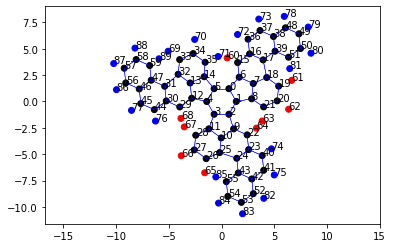

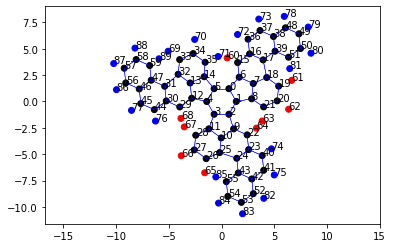

In [11]:
plot_graph_with_periphery(C60)

In [18]:
mask = np.arange(60)
mask = np.concatenate([mask, np.array([73,78,79,80,75,82,83,84,77,86,87,88])])
mask

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 73, 78, 79, 80, 75, 82, 83, 84,
       77, 86, 87, 88])

In [60]:
C60.periphery_type

array([0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0])

In [89]:
atom_type = [None] * (len(C60.periphery_type) + C60.n_carbon)
for i in range(C60.n_carbon):
    atom_type[i] = "C"
for i in range(len(C60.periphery_type)):
    if C60.periphery_type[i] == 0:
        atom_type[i+C60.n_carbon] = "H"
    if C60.periphery_type[i] == 1:
        atom_type[i+C60.n_carbon] = "Cl"

In [90]:
atom_type = np.array(atom_type)

In [93]:
atom_type

array(['C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C',
       'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C',
       'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C',
       'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C',
       'C', 'C', 'C', 'C', 'C', 'C', 'C', 'C', 'H', 'Cl', 'Cl', 'Cl', 'H',
       'Cl', 'Cl', 'Cl', 'H', 'Cl', 'Cl', 'Cl', 'H', 'H', 'H', 'H', 'H',
       'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H', 'H'],
      dtype='<U2')

array([ 5.00537166e-04, -1.58306425e-03, -1.74159302e-03, -6.30570132e-04,
       -9.89817899e-04, -1.47272698e-03,  2.92750265e-04,  8.43364677e-04,
        4.18615452e-04,  8.83156111e-04,  1.04014564e-03, -6.92250976e-04,
       -2.53998191e-04,  6.30994598e-04,  1.32595397e-03, -1.68530330e-03,
       -6.01735663e-04,  4.72551740e-04, -2.74024685e-04, -2.66570850e-03,
       -1.17139396e-03, -1.32405678e-03,  6.29870523e-06, -1.14579240e-03,
        1.06358360e-03,  9.17690265e-04, -1.30440701e-03, -1.17136778e-04,
        1.48585072e-03,  1.38651313e-04, -4.59129576e-04, -7.15283341e-04,
       -1.32598986e-04,  1.57769262e-03, -5.12519627e-04, -1.56928229e-03,
        9.94574592e-04, -3.23120221e-04, -1.51733882e-04, -2.74712919e-04,
        1.75071319e-03, -4.92341531e-04,  1.97073106e-04,  6.99701217e-04,
        1.24631888e-03, -1.44324238e-04, -1.11973943e-04, -1.36363186e-03,
       -2.47069282e-03, -1.26518030e-03, -6.09655397e-04,  7.26422136e-04,
       -1.72976032e-03, -